# Scratch Works

In [ ]:
import numpy as np
print("Hello World")

In [86]:
from trackml.dataset import load_event
print("imported")

imported


In [ ]:
hits, cells, particles, truth = load_event('train_1/eventmini')

In [ ]:
print("\ntruth:")
print(truth.head())
print("\nhits:")
print(hits.head())
print("\ncells:")
print(cells.head())

In [ ]:
fn="train_1/event000002819"
n=10

A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

print(len(B))
part_id = B[n,0]

hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]

In [ ]:
print(hits_from_part)
print()
print("PARTICLE ID:")
print(int(part_id))
print("Num hits: " + str(len(hits_from_part)))
print("")
#Get coordinates from hit-data.
coords = np.zeros((len(hits_from_part),3))
for i in range(0,len(hits_from_part)):
	coords[i,:] = A[hits_from_part[i],2:5]
	print("hit id: "+str(int(A[hits_from_part[i],0]))+ ". Absolute momentum: " + str(np.sqrt(np.sum(A[hits_from_part[i],5:8]**2))))

In [ ]:
def sequenced_hit_ids_from_event_particles(event_id):
    sequenced_hit_ids = []
    
    fn="train_1/"+event_id

    A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
    B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

    for n in range(len(B)):
        part_id = B[n,0]

        hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]
        sequenced_hit_ids.append(hits_from_part)
        
        '''
        print(hits_from_part)
        print()
        print("PARTICLE ID:")
        print(int(part_id))
        print("Num hits: " + str(len(hits_from_part)))
        print("")
        '''
        #Get coordinates from hit-data.
        '''
        coords = np.zeros((len(hits_from_part),3))
        for i in range(0,len(hits_from_part)):
            coords[i,:] = A[hits_from_part[i],2:5]
            print("hit id: "+str(int(A[hits_from_part[i],0]))+ ". Absolute momentum: " + str(np.sqrt(np.sum(A[hits_from_part[i],5:8]**2))))
        '''
    for index, element in enumerate(sequenced_hit_ids):
        sequenced_hit_ids[index] = sequenced_hit_ids[index].tolist()
    return sequenced_hit_ids



In [ ]:
a = sequenced_hit_ids_from_event_particles("event000002819")
print(a)

In [ ]:
import pandas as pd

def transform_event_cells(event_id):
    hits, cells, _1, _2 = load_event('train_1/'+event_id)
    result = pd.DataFrame({'hit_id':hits['hit_id'],
                            'cell_value_min':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_max':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_mean':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_median':np.zeros(hits['hit_id'].shape[0])
                          })

    for hit_id in hits['hit_id']:
        print("hit id: {}".format(hit_id))
        result.at[hit_id - 1, 'cell_value_mean'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].mean()
        result.at[hit_id - 1, 'cell_value_max'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].max()
        result.at[hit_id - 1, 'cell_value_min'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].min()
        result.at[hit_id - 1, 'cell_value_median'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].median()
        
    return results
    
    

In [ ]:
cells_transformed = transform_event_cells('event000001003')

In [ ]:
is_end_of_track = pd.DataFrame({'hit_id':np.zeros(hits['hit_id'].shape[0])})

In [ ]:
def get_is_end_of_track(hits):
    return pd.DataFrame({'hit_id':hits['hit_id'],
                         'is_end':np.zeros(hits['hit_id'].shape[0])})

In [ ]:
def integrate_data(event_id):
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    cells_transformed = transform_event_cells(event_id)
    return pd.merge(get_is_end_of_track(hits), pd.merge(cells_transformed, pd.merge(hits.loc[:,['hit_id','x','y','z']], truth.loc[:,['hit_id','tx','ty','tz']], on='hit_id'),on='hit_id'),on='hit_id')

In [ ]:
result = pd.DataFrame({'hit_id':hits['hit_id'],
                        'cell_value_min':np.zeros(hits['hit_id'].shape[0]),
                       'cell_value_max':np.zeros(hits['hit_id'].shape[0]),
                       'cell_value_mean':np.zeros(hits['hit_id'].shape[0]),
                       'cell_value_median':np.zeros(hits['hit_id'].shape[0])
                      })

for hit_id in range(1,101):
    #print("hit id: {}".format(hit_id))
    result.at[hit_id - 1, 'cell_value_mean'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].mean()
    result.at[hit_id - 1, 'cell_value_max'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].max()
    result.at[hit_id - 1, 'cell_value_min'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].min()
    result.at[hit_id - 1, 'cell_value_median'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].median()


integrated = pd.merge(get_is_end_of_track(hits), pd.merge(result, pd.merge(hits.loc[:,['hit_id','x','y','z']], truth.loc[:,['hit_id','tx','ty','tz']], on='hit_id'),on='hit_id'),on='hit_id')
print(integrated)

In [ ]:
integrated_data = integrate_data('event000001003')
print(integrated_data)

In [ ]:
sequenced_list_of_hits = sequenced_hit_ids_from_event_particles('event000001003')
for particle_index, particle in enumerate(sequenced_list_of_hits):
    for hit_index, hit in enumerate(particle):
        sequenced_list_of_hits[particle_index][hit_index] = (intergrated_data.iloc[sequenced_list_of_hits[particle_index][hit_index]-1,1:]).as_matrix()
        print((intergrated_data.iloc[sequenced_list_of_hits[particle_index][hit_index]-1,1:]).as_matrix())
    sequenced_list_of_hits[particle_index].append(np.array([1,0,0,0,0,0,0,0,0,0,0]))

        

In [ ]:
def integrate_data1(event_id):
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    #cells_transformed = transform_event_cells(event_id)
    return pd.merge(get_is_end_of_track(hits), pd.merge(result, pd.merge(hits.loc[:,['hit_id','x','y','z']], truth.loc[:,['hit_id','tx','ty','tz']], on='hit_id'),on='hit_id'),on='hit_id')

sequenced_list_of_hits = sequenced_hit_ids_from_event_particles('event000001003')
intergrated_data= integrate_data1('event000001003')

for particle_index, particle in enumerate(sequenced_list_of_hits):
    for hit_index, hit in enumerate(particle):
        sequenced_list_of_hits[particle_index][hit_index] = (intergrated_data.iloc[sequenced_list_of_hits[particle_index][hit_index]-1,1:]).as_matrix()
    sequenced_list_of_hits[particle_index].append(np.array([1,0,0,0,0,0,0,0,0,0,0]))
    print((sequenced_list_of_hits[particle_index]))
    print()

In [ ]:
import numpy as np
import pandas as pd
from trackml.dataset import load_event

In [ ]:
def get_is_end_of_track(hits):
    return pd.DataFrame({'hit_id':hits['hit_id'],
                         'is_end':np.zeros(hits['hit_id'].shape[0])})

# General Helper Functions

In [6]:
from trackml.dataset import load_event
print("imported")

imported


In [139]:
def xy_splitter(data):
    x = np.array([[i[0]] for i in data])
    y = np.array([i[1:] for i in data])
    return x, y

In [10]:
def xy_splitter_m2m(data):
    x = np.array([i[0] for i in data])
    y = np.array([i[1:] for i in data])
    return x, y

In [141]:
from sklearn.model_selection import train_test_split

def data_generator(data):
    X, y = xy_splitter(data)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    return X_train, X_test, y_train, y_test

In [24]:
import numpy as np
import pandas as pd


#xyz only, model 1.3, model 2.1
def from_event_id_to_sequenced_data_simplified_1(event_id):

    #load data
    print("Loading data...")
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    print("Done!")
    
    #Get sequenced_hit_ids
    print("Getting sequenced hit ids...")
    sequenced_hit_ids = []
    
    fn="train_1/"+event_id

    A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
    B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

    for n in range(len(B)):
        part_id = B[n,0]

        hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]
        sequenced_hit_ids.append(hits_from_part)
    
    print("Done!")
    #Proprocess event_cells
    print("Proprocessing event_cells...")

    
    #Merge dataframe
    print("Merging dataframe")
    integrated = hits.loc[:,['x','y','z']]
    print(integrated)
    print("Done!")
    
    
    #Generate final data
    print("Generating final data...")
    for index, element in enumerate(sequenced_hit_ids):
        sequenced_hit_ids[index] = sequenced_hit_ids[index].tolist()
        
    for particle_index, particle in enumerate(sequenced_hit_ids):
        for hit_index, hit in enumerate(particle):
            sequenced_hit_ids[particle_index][hit_index] = (integrated.iloc[sequenced_hit_ids[particle_index][hit_index]-1,:]).tolist()
    print("Done!")
    print(sequenced_hit_ids[0])
    
    #Padding
    print("Padding...")
    for index_particle, particle in enumerate(sequenced_hit_ids):
        while len(sequenced_hit_ids[index_particle])< 21:
            sequenced_hit_ids[index_particle].append([0,0,0])
    print("Done!")
    return sequenced_hit_ids
    

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

#xyz only, model 1.3, model 2.1
def from_event_id_to_sequenced_data_simplified_min_max_norm(event_id, scaler = None):

    #load data
    print("Loading data...")
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    print("Done!")
    
    #Get sequenced_hit_ids
    print("Getting sequenced hit ids...")
    sequenced_hit_ids = []
    
    fn="train_1/"+event_id

    A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
    B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

    for n in range(len(B)):
        part_id = B[n,0]

        hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]
        sequenced_hit_ids.append(hits_from_part)
    
    print("Done!")
    #Proprocess event_cells
    print("Proprocessing event_cells...")

    
    #Merge dataframe
    print("Merging dataframe")
    integrated = hits.loc[:,['x','y','z']]
    if scaler == None:
        scaler = MinMaxScaler(feature_range=(0, 10))
        scaler.fit(integrated)
    else:
        pass
    integrated = pd.DataFrame(scaler.transform(integrated))
    print(integrated)
    print("Done!")
    
    
    #Generate final data
    print("Generating final data...")
    for index, element in enumerate(sequenced_hit_ids):
        sequenced_hit_ids[index] = sequenced_hit_ids[index].tolist()
        
    for particle_index, particle in enumerate(sequenced_hit_ids):
        for hit_index, hit in enumerate(particle):
            sequenced_hit_ids[particle_index][hit_index] = (integrated.iloc[sequenced_hit_ids[particle_index][hit_index]-1,:]).tolist()
    print("Done!")
    print(sequenced_hit_ids[0])
    
    #Padding
    print("Padding...")
    for index_particle, particle in enumerate(sequenced_hit_ids):
        while len(sequenced_hit_ids[index_particle])< 21:
            sequenced_hit_ids[index_particle].append([0,0,10])
    print("Done!")
    return sequenced_hit_ids, scaler
    

In [95]:
'''
Input: event_id 
Output: a list of tracks containing information of each hit in numpy array
[[np.array[],np.array[]],[np.array[],np.array[]]]
'''

import numpy as np
import pandas as pd

#model 1.2, no is_track_end
def from_event_id_to_sequenced_data2(event_id):

    #load data
    print("Loading data...")
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    print("Done!")
    
    #Get sequenced_hit_ids
    print("Getting sequenced hit ids...")
    sequenced_hit_ids = []
    
    fn="train_1/"+event_id

    A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
    B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

    for n in range(len(B)):
        part_id = B[n,0]

        hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]
        sequenced_hit_ids.append(hits_from_part)
    
    print("Done!")
    #Proprocess event_cells
    print("Proprocessing event_cells...")
    
    result = pd.DataFrame({'hit_id':hits['hit_id'],
                            'cell_value_min':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_max':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_mean':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_median':np.zeros(hits['hit_id'].shape[0])
                          })

    for hit_id in hits['hit_id']:
        print("hit id: {}".format(hit_id))
        result.at[hit_id - 1, 'cell_value_mean'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].mean()
        result.at[hit_id - 1, 'cell_value_max'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].max()
        result.at[hit_id - 1, 'cell_value_min'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].min()
        result.at[hit_id - 1, 'cell_value_median'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].median()
    
    print("Done!")
    
    #Merge dataframe
    print("Merging dataframe")
    integrated = pd.merge(result, pd.merge(hits.loc[:,['hit_id','x','y','z']], truth.loc[:,['hit_id','tx','ty','tz']], on='hit_id'),on='hit_id')
    print(integrated)
    print("Done!")
    
    
    #Generate final data
    print("Generating final data...")
    for index, element in enumerate(sequenced_hit_ids):
        sequenced_hit_ids[index] = sequenced_hit_ids[index].tolist()
        
    for particle_index, particle in enumerate(sequenced_hit_ids):
        for hit_index, hit in enumerate(particle):
            sequenced_hit_ids[particle_index][hit_index] = (integrated.iloc[sequenced_hit_ids[particle_index][hit_index]-1,1:]).tolist()
    print("Done!")
    
    #Padding
    print("Padding...")
    for index_particle, particle in enumerate(sequenced_hit_ids):
        while len(sequenced_hit_ids[index_particle])< 21:
            sequenced_hit_ids[index_particle].append([0,0,0,0,0,0,0,0,0,0])
    print("Done!")
    return sequenced_hit_ids
    

In [9]:
'''
Input: event_id 
Output: a list of tracks containing information of each hit in numpy array
[[np.array[],np.array[]],[np.array[],np.array[]]]
'''

import numpy as np
import pandas as pd

#model 1.1
def from_event_id_to_sequenced_data(event_id):

    #load data
    print("Loading data...")
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    print("Done!")
    
    #Get sequenced_hit_ids
    print("Getting sequenced hit ids...")
    sequenced_hit_ids = []
    
    fn="train_1/"+event_id

    A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
    B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

    for n in range(len(B)):
        part_id = B[n,0]

        hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]
        sequenced_hit_ids.append(hits_from_part)
    
    print("Done!")
    #Proprocess event_cells
    print("Proprocessing event_cells...")
    
    result = pd.DataFrame({'hit_id':hits['hit_id'],
                            'cell_value_min':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_max':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_mean':np.zeros(hits['hit_id'].shape[0]),
                           'cell_value_median':np.zeros(hits['hit_id'].shape[0])
                          })

    for hit_id in hits['hit_id']:
        print("hit id: {}".format(hit_id))
        result.at[hit_id - 1, 'cell_value_mean'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].mean()
        result.at[hit_id - 1, 'cell_value_max'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].max()
        result.at[hit_id - 1, 'cell_value_min'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].min()
        result.at[hit_id - 1, 'cell_value_median'] = cells.loc[cells['hit_id'] == hit_id].loc[:,'value'].median()
    
    print("Done!")
    
    #Merge dataframe
    print("Merging dataframe")
    integrated = pd.merge(get_is_end_of_track(hits), pd.merge(result, pd.merge(hits.loc[:,['hit_id','x','y','z']], truth.loc[:,['hit_id','tx','ty','tz']], on='hit_id'),on='hit_id'),on='hit_id')
    print(integrated)
    print("Done!")
    
    
    #Generate final data
    print("Generating final data...")
    for index, element in enumerate(sequenced_hit_ids):
        sequenced_hit_ids[index] = sequenced_hit_ids[index].tolist()
        
    for particle_index, particle in enumerate(sequenced_hit_ids):
        for hit_index, hit in enumerate(particle):
            sequenced_hit_ids[particle_index][hit_index] = (integrated.iloc[sequenced_hit_ids[particle_index][hit_index]-1,1:]).tolist()
    print("Done!")
    
    #Padding
    print("Padding...")
    for index_particle, particle in enumerate(sequenced_hit_ids):
        while len(sequenced_hit_ids[index_particle])< 21:
            sequenced_hit_ids[index_particle].append([0,0,0,0,0,0,0,0,0,0,0])
    print("Done!")
    return sequenced_hit_ids
    

# Model 1.1
## Including is_end_of_track, one2many

In [24]:
sequenced_list_of_hits = from_event_id_to_sequenced_data('event000001000')

Loading data...
Done!
Getting sequenced hit ids...
Done!
Proprocessing event_cells...
hit id: 1
hit id: 2
hit id: 3
hit id: 4
hit id: 5
hit id: 6
hit id: 7
hit id: 8
hit id: 9
hit id: 10
hit id: 11
hit id: 12
hit id: 13
hit id: 14
hit id: 15
hit id: 16
hit id: 17
hit id: 18
hit id: 19
hit id: 20
hit id: 21
hit id: 22
hit id: 23
hit id: 24
hit id: 25
hit id: 26
hit id: 27
hit id: 28
hit id: 29
hit id: 30
hit id: 31
hit id: 32
hit id: 33
hit id: 34
hit id: 35
hit id: 36
hit id: 37
hit id: 38
hit id: 39
hit id: 40
hit id: 41
hit id: 42
hit id: 43
hit id: 44
hit id: 45
hit id: 46
hit id: 47
hit id: 48
hit id: 49
hit id: 50
hit id: 51
hit id: 52
hit id: 53
hit id: 54
hit id: 55
hit id: 56
hit id: 57
hit id: 58
hit id: 59
hit id: 60
hit id: 61
hit id: 62
hit id: 63
hit id: 64
hit id: 65
hit id: 66
hit id: 67
hit id: 68
hit id: 69
hit id: 70
hit id: 71
hit id: 72
hit id: 73
hit id: 74
hit id: 75
hit id: 76
hit id: 77
hit id: 78
hit id: 79
hit id: 80
hit id: 81
hit id: 82
hit id: 83
hit id: 84

hit id: 715
hit id: 716
hit id: 717
hit id: 718
hit id: 719
hit id: 720
hit id: 721
hit id: 722
hit id: 723
hit id: 724
hit id: 725
hit id: 726
hit id: 727
hit id: 728
hit id: 729
hit id: 730
hit id: 731
hit id: 732
hit id: 733
hit id: 734
hit id: 735
hit id: 736
hit id: 737
hit id: 738
hit id: 739
hit id: 740
hit id: 741
hit id: 742
hit id: 743
hit id: 744
hit id: 745
hit id: 746
hit id: 747
hit id: 748
hit id: 749
hit id: 750
hit id: 751
hit id: 752
hit id: 753
hit id: 754
hit id: 755
hit id: 756
hit id: 757
hit id: 758
hit id: 759
hit id: 760
hit id: 761
hit id: 762
hit id: 763
hit id: 764
hit id: 765
hit id: 766
hit id: 767
hit id: 768
hit id: 769
hit id: 770
hit id: 771
hit id: 772
hit id: 773
hit id: 774
hit id: 775
hit id: 776
hit id: 777
hit id: 778
hit id: 779
hit id: 780
hit id: 781
hit id: 782
hit id: 783
hit id: 784
hit id: 785
hit id: 786
hit id: 787
hit id: 788
hit id: 789
hit id: 790
hit id: 791
hit id: 792
hit id: 793
hit id: 794
hit id: 795
hit id: 796
hit id: 797
hit 

hit id: 1407
hit id: 1408
hit id: 1409
hit id: 1410
hit id: 1411
hit id: 1412
hit id: 1413
hit id: 1414
hit id: 1415
hit id: 1416
hit id: 1417
hit id: 1418
hit id: 1419
hit id: 1420
hit id: 1421
hit id: 1422
hit id: 1423
hit id: 1424
hit id: 1425
hit id: 1426
hit id: 1427
hit id: 1428
hit id: 1429
hit id: 1430
hit id: 1431
hit id: 1432
hit id: 1433
hit id: 1434
hit id: 1435
hit id: 1436
hit id: 1437
hit id: 1438
hit id: 1439
hit id: 1440
hit id: 1441
hit id: 1442
hit id: 1443
hit id: 1444
hit id: 1445
hit id: 1446
hit id: 1447
hit id: 1448
hit id: 1449
hit id: 1450
hit id: 1451
hit id: 1452
hit id: 1453
hit id: 1454
hit id: 1455
hit id: 1456
hit id: 1457
hit id: 1458
hit id: 1459
hit id: 1460
hit id: 1461
hit id: 1462
hit id: 1463
hit id: 1464
hit id: 1465
hit id: 1466
hit id: 1467
hit id: 1468
hit id: 1469
hit id: 1470
hit id: 1471
hit id: 1472
hit id: 1473
hit id: 1474
hit id: 1475
hit id: 1476
hit id: 1477
hit id: 1478
hit id: 1479
hit id: 1480
hit id: 1481
hit id: 1482
hit id: 1483

hit id: 2061
hit id: 2062
hit id: 2063
hit id: 2064
hit id: 2065
hit id: 2066
hit id: 2067
hit id: 2068
hit id: 2069
hit id: 2070
hit id: 2071
hit id: 2072
hit id: 2073
hit id: 2074
hit id: 2075
hit id: 2076
hit id: 2077
hit id: 2078
hit id: 2079
hit id: 2080
hit id: 2081
hit id: 2082
hit id: 2083
hit id: 2084
hit id: 2085
hit id: 2086
hit id: 2087
hit id: 2088
hit id: 2089
hit id: 2090
hit id: 2091
hit id: 2092
hit id: 2093
hit id: 2094
hit id: 2095
hit id: 2096
hit id: 2097
hit id: 2098
hit id: 2099
hit id: 2100
hit id: 2101
hit id: 2102
hit id: 2103
hit id: 2104
hit id: 2105
hit id: 2106
hit id: 2107
hit id: 2108
hit id: 2109
hit id: 2110
hit id: 2111
hit id: 2112
hit id: 2113
hit id: 2114
hit id: 2115
hit id: 2116
hit id: 2117
hit id: 2118
hit id: 2119
hit id: 2120
hit id: 2121
hit id: 2122
hit id: 2123
hit id: 2124
hit id: 2125
hit id: 2126
hit id: 2127
hit id: 2128
hit id: 2129
hit id: 2130
hit id: 2131
hit id: 2132
hit id: 2133
hit id: 2134
hit id: 2135
hit id: 2136
hit id: 2137

hit id: 2721
hit id: 2722
hit id: 2723
hit id: 2724
hit id: 2725
hit id: 2726
hit id: 2727
hit id: 2728
hit id: 2729
hit id: 2730
hit id: 2731
hit id: 2732
hit id: 2733
hit id: 2734
hit id: 2735
hit id: 2736
hit id: 2737
hit id: 2738
hit id: 2739
hit id: 2740
hit id: 2741
hit id: 2742
hit id: 2743
hit id: 2744
hit id: 2745
hit id: 2746
hit id: 2747
hit id: 2748
hit id: 2749
hit id: 2750
hit id: 2751
hit id: 2752
hit id: 2753
hit id: 2754
hit id: 2755
hit id: 2756
hit id: 2757
hit id: 2758
hit id: 2759
hit id: 2760
hit id: 2761
hit id: 2762
hit id: 2763
hit id: 2764
hit id: 2765
hit id: 2766
hit id: 2767
hit id: 2768
hit id: 2769
hit id: 2770
hit id: 2771
hit id: 2772
hit id: 2773
hit id: 2774
hit id: 2775
hit id: 2776
hit id: 2777
hit id: 2778
hit id: 2779
hit id: 2780
hit id: 2781
hit id: 2782
hit id: 2783
hit id: 2784
hit id: 2785
hit id: 2786
hit id: 2787
hit id: 2788
hit id: 2789
hit id: 2790
hit id: 2791
hit id: 2792
hit id: 2793
hit id: 2794
hit id: 2795
hit id: 2796
hit id: 2797

hit id: 3374
hit id: 3375
hit id: 3376
hit id: 3377
hit id: 3378
hit id: 3379
hit id: 3380
hit id: 3381
hit id: 3382
hit id: 3383
hit id: 3384
hit id: 3385
hit id: 3386
hit id: 3387
hit id: 3388
hit id: 3389
hit id: 3390
hit id: 3391
hit id: 3392
hit id: 3393
hit id: 3394
hit id: 3395
hit id: 3396
hit id: 3397
hit id: 3398
hit id: 3399
hit id: 3400
hit id: 3401
hit id: 3402
hit id: 3403
hit id: 3404
hit id: 3405
hit id: 3406
hit id: 3407
hit id: 3408
hit id: 3409
hit id: 3410
hit id: 3411
hit id: 3412
hit id: 3413
hit id: 3414
hit id: 3415
hit id: 3416
hit id: 3417
hit id: 3418
hit id: 3419
hit id: 3420
hit id: 3421
hit id: 3422
hit id: 3423
hit id: 3424
hit id: 3425
hit id: 3426
hit id: 3427
hit id: 3428
hit id: 3429
hit id: 3430
hit id: 3431
hit id: 3432
hit id: 3433
hit id: 3434
hit id: 3435
hit id: 3436
hit id: 3437
hit id: 3438
hit id: 3439
hit id: 3440
hit id: 3441
hit id: 3442
hit id: 3443
hit id: 3444
hit id: 3445
hit id: 3446
hit id: 3447
hit id: 3448
hit id: 3449
hit id: 3450

hit id: 4022
hit id: 4023
hit id: 4024
hit id: 4025
hit id: 4026
hit id: 4027
hit id: 4028
hit id: 4029
hit id: 4030
hit id: 4031
hit id: 4032
hit id: 4033
hit id: 4034
hit id: 4035
hit id: 4036
hit id: 4037
hit id: 4038
hit id: 4039
hit id: 4040
hit id: 4041
hit id: 4042
hit id: 4043
hit id: 4044
hit id: 4045
hit id: 4046
hit id: 4047
hit id: 4048
hit id: 4049
hit id: 4050
hit id: 4051
hit id: 4052
hit id: 4053
hit id: 4054
hit id: 4055
hit id: 4056
hit id: 4057
hit id: 4058
hit id: 4059
hit id: 4060
hit id: 4061
hit id: 4062
hit id: 4063
hit id: 4064
hit id: 4065
hit id: 4066
hit id: 4067
hit id: 4068
hit id: 4069
hit id: 4070
hit id: 4071
hit id: 4072
hit id: 4073
hit id: 4074
hit id: 4075
hit id: 4076
hit id: 4077
hit id: 4078
hit id: 4079
hit id: 4080
hit id: 4081
hit id: 4082
hit id: 4083
hit id: 4084
hit id: 4085
hit id: 4086
hit id: 4087
hit id: 4088
hit id: 4089
hit id: 4090
hit id: 4091
hit id: 4092
hit id: 4093
hit id: 4094
hit id: 4095
hit id: 4096
hit id: 4097
hit id: 4098

hit id: 4704
hit id: 4705
hit id: 4706
hit id: 4707
hit id: 4708
hit id: 4709
hit id: 4710
hit id: 4711
hit id: 4712
hit id: 4713
hit id: 4714
hit id: 4715
hit id: 4716
hit id: 4717
hit id: 4718
hit id: 4719
hit id: 4720
hit id: 4721
hit id: 4722
hit id: 4723
hit id: 4724
hit id: 4725
hit id: 4726
hit id: 4727
hit id: 4728
hit id: 4729
hit id: 4730
hit id: 4731
hit id: 4732
hit id: 4733
hit id: 4734
hit id: 4735
hit id: 4736
hit id: 4737
hit id: 4738
hit id: 4739
hit id: 4740
hit id: 4741
hit id: 4742
hit id: 4743
hit id: 4744
hit id: 4745
hit id: 4746
hit id: 4747
hit id: 4748
hit id: 4749
hit id: 4750
hit id: 4751
hit id: 4752
hit id: 4753
hit id: 4754
hit id: 4755
hit id: 4756
hit id: 4757
hit id: 4758
hit id: 4759
hit id: 4760
hit id: 4761
hit id: 4762
hit id: 4763
hit id: 4764
hit id: 4765
hit id: 4766
hit id: 4767
hit id: 4768
hit id: 4769
hit id: 4770
hit id: 4771
hit id: 4772
hit id: 4773
hit id: 4774
hit id: 4775
hit id: 4776
hit id: 4777
hit id: 4778
hit id: 4779
hit id: 4780

hit id: 5344
hit id: 5345
hit id: 5346
hit id: 5347
hit id: 5348
hit id: 5349
hit id: 5350
hit id: 5351
hit id: 5352
hit id: 5353
hit id: 5354
hit id: 5355
hit id: 5356
hit id: 5357
hit id: 5358
hit id: 5359
hit id: 5360
hit id: 5361
hit id: 5362
hit id: 5363
hit id: 5364
hit id: 5365
hit id: 5366
hit id: 5367
hit id: 5368
hit id: 5369
hit id: 5370
hit id: 5371
hit id: 5372
hit id: 5373
hit id: 5374
hit id: 5375
hit id: 5376
hit id: 5377
hit id: 5378
hit id: 5379
hit id: 5380
hit id: 5381
hit id: 5382
hit id: 5383
hit id: 5384
hit id: 5385
hit id: 5386
hit id: 5387
hit id: 5388
hit id: 5389
hit id: 5390
hit id: 5391
hit id: 5392
hit id: 5393
hit id: 5394
hit id: 5395
hit id: 5396
hit id: 5397
hit id: 5398
hit id: 5399
hit id: 5400
hit id: 5401
hit id: 5402
hit id: 5403
hit id: 5404
hit id: 5405
hit id: 5406
hit id: 5407
hit id: 5408
hit id: 5409
hit id: 5410
hit id: 5411
hit id: 5412
hit id: 5413
hit id: 5414
hit id: 5415
hit id: 5416
hit id: 5417
hit id: 5418
hit id: 5419
hit id: 5420

hit id: 6020
hit id: 6021
hit id: 6022
hit id: 6023
hit id: 6024
hit id: 6025
hit id: 6026
hit id: 6027
hit id: 6028
hit id: 6029
hit id: 6030
hit id: 6031
hit id: 6032
hit id: 6033
hit id: 6034
hit id: 6035
hit id: 6036
hit id: 6037
hit id: 6038
hit id: 6039
hit id: 6040
hit id: 6041
hit id: 6042
hit id: 6043
hit id: 6044
hit id: 6045
hit id: 6046
hit id: 6047
hit id: 6048
hit id: 6049
hit id: 6050
hit id: 6051
hit id: 6052
hit id: 6053
hit id: 6054
hit id: 6055
hit id: 6056
hit id: 6057
hit id: 6058
hit id: 6059
hit id: 6060
hit id: 6061
hit id: 6062
hit id: 6063
hit id: 6064
hit id: 6065
hit id: 6066
hit id: 6067
hit id: 6068
hit id: 6069
hit id: 6070
hit id: 6071
hit id: 6072
hit id: 6073
hit id: 6074
hit id: 6075
hit id: 6076
hit id: 6077
hit id: 6078
hit id: 6079
hit id: 6080
hit id: 6081
hit id: 6082
hit id: 6083
hit id: 6084
hit id: 6085
hit id: 6086
hit id: 6087
hit id: 6088
hit id: 6089
hit id: 6090
hit id: 6091
hit id: 6092
hit id: 6093
hit id: 6094
hit id: 6095
hit id: 6096

hit id: 6668
hit id: 6669
hit id: 6670
hit id: 6671
hit id: 6672
hit id: 6673
hit id: 6674
hit id: 6675
hit id: 6676
hit id: 6677
hit id: 6678
hit id: 6679
hit id: 6680
hit id: 6681
hit id: 6682
hit id: 6683
hit id: 6684
hit id: 6685
hit id: 6686
hit id: 6687
hit id: 6688
hit id: 6689
hit id: 6690
hit id: 6691
hit id: 6692
hit id: 6693
hit id: 6694
hit id: 6695
hit id: 6696
hit id: 6697
hit id: 6698
hit id: 6699
hit id: 6700
hit id: 6701
hit id: 6702
hit id: 6703
hit id: 6704
hit id: 6705
hit id: 6706
hit id: 6707
hit id: 6708
hit id: 6709
hit id: 6710
hit id: 6711
hit id: 6712
hit id: 6713
hit id: 6714
hit id: 6715
hit id: 6716
hit id: 6717
hit id: 6718
hit id: 6719
hit id: 6720
hit id: 6721
hit id: 6722
hit id: 6723
hit id: 6724
hit id: 6725
hit id: 6726
hit id: 6727
hit id: 6728
hit id: 6729
hit id: 6730
hit id: 6731
hit id: 6732
hit id: 6733
hit id: 6734
hit id: 6735
hit id: 6736
hit id: 6737
hit id: 6738
hit id: 6739
hit id: 6740
hit id: 6741
hit id: 6742
hit id: 6743
hit id: 6744

hit id: 7307
hit id: 7308
hit id: 7309
hit id: 7310
hit id: 7311
hit id: 7312
hit id: 7313
hit id: 7314
hit id: 7315
hit id: 7316
hit id: 7317
hit id: 7318
hit id: 7319
hit id: 7320
hit id: 7321
hit id: 7322
hit id: 7323
hit id: 7324
hit id: 7325
hit id: 7326
hit id: 7327
hit id: 7328
hit id: 7329
hit id: 7330
hit id: 7331
hit id: 7332
hit id: 7333
hit id: 7334
hit id: 7335
hit id: 7336
hit id: 7337
hit id: 7338
hit id: 7339
hit id: 7340
hit id: 7341
hit id: 7342
hit id: 7343
hit id: 7344
hit id: 7345
hit id: 7346
hit id: 7347
hit id: 7348
hit id: 7349
hit id: 7350
hit id: 7351
hit id: 7352
hit id: 7353
hit id: 7354
hit id: 7355
hit id: 7356
hit id: 7357
hit id: 7358
hit id: 7359
hit id: 7360
hit id: 7361
hit id: 7362
hit id: 7363
hit id: 7364
hit id: 7365
hit id: 7366
hit id: 7367
hit id: 7368
hit id: 7369
hit id: 7370
hit id: 7371
hit id: 7372
hit id: 7373
hit id: 7374
hit id: 7375
hit id: 7376
hit id: 7377
hit id: 7378
hit id: 7379
hit id: 7380
hit id: 7381
hit id: 7382
hit id: 7383

hit id: 7938
hit id: 7939
hit id: 7940
hit id: 7941
hit id: 7942
hit id: 7943
hit id: 7944
hit id: 7945
hit id: 7946
hit id: 7947
hit id: 7948
hit id: 7949
hit id: 7950
hit id: 7951
hit id: 7952
hit id: 7953
hit id: 7954
hit id: 7955
hit id: 7956
hit id: 7957
hit id: 7958
hit id: 7959
hit id: 7960
hit id: 7961
hit id: 7962
hit id: 7963
hit id: 7964
hit id: 7965
hit id: 7966
hit id: 7967
hit id: 7968
hit id: 7969
hit id: 7970
hit id: 7971
hit id: 7972
hit id: 7973
hit id: 7974
hit id: 7975
hit id: 7976
hit id: 7977
hit id: 7978
hit id: 7979
hit id: 7980
hit id: 7981
hit id: 7982
hit id: 7983
hit id: 7984
hit id: 7985
hit id: 7986
hit id: 7987
hit id: 7988
hit id: 7989
hit id: 7990
hit id: 7991
hit id: 7992
hit id: 7993
hit id: 7994
hit id: 7995
hit id: 7996
hit id: 7997
hit id: 7998
hit id: 7999
hit id: 8000
hit id: 8001
hit id: 8002
hit id: 8003
hit id: 8004
hit id: 8005
hit id: 8006
hit id: 8007
hit id: 8008
hit id: 8009
hit id: 8010
hit id: 8011
hit id: 8012
hit id: 8013
hit id: 8014

hit id: 8573
hit id: 8574
hit id: 8575
hit id: 8576
hit id: 8577
hit id: 8578
hit id: 8579
hit id: 8580
hit id: 8581
hit id: 8582
hit id: 8583
hit id: 8584
hit id: 8585
hit id: 8586
hit id: 8587
hit id: 8588
hit id: 8589
hit id: 8590
hit id: 8591
hit id: 8592
hit id: 8593
hit id: 8594
hit id: 8595
hit id: 8596
hit id: 8597
hit id: 8598
hit id: 8599
hit id: 8600
hit id: 8601
hit id: 8602
hit id: 8603
hit id: 8604
hit id: 8605
hit id: 8606
hit id: 8607
hit id: 8608
hit id: 8609
hit id: 8610
hit id: 8611
hit id: 8612
hit id: 8613
hit id: 8614
hit id: 8615
hit id: 8616
hit id: 8617
hit id: 8618
hit id: 8619
hit id: 8620
hit id: 8621
hit id: 8622
hit id: 8623
hit id: 8624
hit id: 8625
hit id: 8626
hit id: 8627
hit id: 8628
hit id: 8629
hit id: 8630
hit id: 8631
hit id: 8632
hit id: 8633
hit id: 8634
hit id: 8635
hit id: 8636
hit id: 8637
hit id: 8638
hit id: 8639
hit id: 8640
hit id: 8641
hit id: 8642
hit id: 8643
hit id: 8644
hit id: 8645
hit id: 8646
hit id: 8647
hit id: 8648
hit id: 8649

hit id: 9223
hit id: 9224
hit id: 9225
hit id: 9226
hit id: 9227
hit id: 9228
hit id: 9229
hit id: 9230
hit id: 9231
hit id: 9232
hit id: 9233
hit id: 9234
hit id: 9235
hit id: 9236
hit id: 9237
hit id: 9238
hit id: 9239
hit id: 9240
hit id: 9241
hit id: 9242
hit id: 9243
hit id: 9244
hit id: 9245
hit id: 9246
hit id: 9247
hit id: 9248
hit id: 9249
hit id: 9250
hit id: 9251
hit id: 9252
hit id: 9253
hit id: 9254
hit id: 9255
hit id: 9256
hit id: 9257
hit id: 9258
hit id: 9259
hit id: 9260
hit id: 9261
hit id: 9262
hit id: 9263
hit id: 9264
hit id: 9265
hit id: 9266
hit id: 9267
hit id: 9268
hit id: 9269
hit id: 9270
hit id: 9271
hit id: 9272
hit id: 9273
hit id: 9274
hit id: 9275
hit id: 9276
hit id: 9277
hit id: 9278
hit id: 9279
hit id: 9280
hit id: 9281
hit id: 9282
hit id: 9283
hit id: 9284
hit id: 9285
hit id: 9286
hit id: 9287
hit id: 9288
hit id: 9289
hit id: 9290
hit id: 9291
hit id: 9292
hit id: 9293
hit id: 9294
hit id: 9295
hit id: 9296
hit id: 9297
hit id: 9298
hit id: 9299

hit id: 9892
hit id: 9893
hit id: 9894
hit id: 9895
hit id: 9896
hit id: 9897
hit id: 9898
hit id: 9899
hit id: 9900
hit id: 9901
hit id: 9902
hit id: 9903
hit id: 9904
hit id: 9905
hit id: 9906
hit id: 9907
hit id: 9908
hit id: 9909
hit id: 9910
hit id: 9911
hit id: 9912
hit id: 9913
hit id: 9914
hit id: 9915
hit id: 9916
hit id: 9917
hit id: 9918
hit id: 9919
hit id: 9920
hit id: 9921
hit id: 9922
hit id: 9923
hit id: 9924
hit id: 9925
hit id: 9926
hit id: 9927
hit id: 9928
hit id: 9929
hit id: 9930
hit id: 9931
hit id: 9932
hit id: 9933
hit id: 9934
hit id: 9935
hit id: 9936
hit id: 9937
hit id: 9938
hit id: 9939
hit id: 9940
hit id: 9941
hit id: 9942
hit id: 9943
hit id: 9944
hit id: 9945
hit id: 9946
hit id: 9947
hit id: 9948
hit id: 9949
hit id: 9950
hit id: 9951
hit id: 9952
hit id: 9953
hit id: 9954
hit id: 9955
hit id: 9956
hit id: 9957
hit id: 9958
hit id: 9959
hit id: 9960
hit id: 9961
hit id: 9962
hit id: 9963
hit id: 9964
hit id: 9965
hit id: 9966
hit id: 9967
hit id: 9968

hit id: 10537
hit id: 10538
hit id: 10539
hit id: 10540
hit id: 10541
hit id: 10542
hit id: 10543
hit id: 10544
hit id: 10545
hit id: 10546
hit id: 10547
hit id: 10548
hit id: 10549
hit id: 10550
hit id: 10551
hit id: 10552
hit id: 10553
hit id: 10554
hit id: 10555
hit id: 10556
hit id: 10557
hit id: 10558
hit id: 10559
hit id: 10560
hit id: 10561
hit id: 10562
hit id: 10563
hit id: 10564
hit id: 10565
hit id: 10566
hit id: 10567
hit id: 10568
hit id: 10569
hit id: 10570
hit id: 10571
hit id: 10572
hit id: 10573
hit id: 10574
hit id: 10575
hit id: 10576
hit id: 10577
hit id: 10578
hit id: 10579
hit id: 10580
hit id: 10581
hit id: 10582
hit id: 10583
hit id: 10584
hit id: 10585
hit id: 10586
hit id: 10587
hit id: 10588
hit id: 10589
hit id: 10590
hit id: 10591
hit id: 10592
hit id: 10593
hit id: 10594
hit id: 10595
hit id: 10596
hit id: 10597
hit id: 10598
hit id: 10599
hit id: 10600
hit id: 10601
hit id: 10602
hit id: 10603
hit id: 10604
hit id: 10605
hit id: 10606
hit id: 10607
hit id

hit id: 11145
hit id: 11146
hit id: 11147
hit id: 11148
hit id: 11149
hit id: 11150
hit id: 11151
hit id: 11152
hit id: 11153
hit id: 11154
hit id: 11155
hit id: 11156
hit id: 11157
hit id: 11158
hit id: 11159
hit id: 11160
hit id: 11161
hit id: 11162
hit id: 11163
hit id: 11164
hit id: 11165
hit id: 11166
hit id: 11167
hit id: 11168
hit id: 11169
hit id: 11170
hit id: 11171
hit id: 11172
hit id: 11173
hit id: 11174
hit id: 11175
hit id: 11176
hit id: 11177
hit id: 11178
hit id: 11179
hit id: 11180
hit id: 11181
hit id: 11182
hit id: 11183
hit id: 11184
hit id: 11185
hit id: 11186
hit id: 11187
hit id: 11188
hit id: 11189
hit id: 11190
hit id: 11191
hit id: 11192
hit id: 11193
hit id: 11194
hit id: 11195
hit id: 11196
hit id: 11197
hit id: 11198
hit id: 11199
hit id: 11200
hit id: 11201
hit id: 11202
hit id: 11203
hit id: 11204
hit id: 11205
hit id: 11206
hit id: 11207
hit id: 11208
hit id: 11209
hit id: 11210
hit id: 11211
hit id: 11212
hit id: 11213
hit id: 11214
hit id: 11215
hit id

hit id: 11739
hit id: 11740
hit id: 11741
hit id: 11742
hit id: 11743
hit id: 11744
hit id: 11745
hit id: 11746
hit id: 11747
hit id: 11748
hit id: 11749
hit id: 11750
hit id: 11751
hit id: 11752
hit id: 11753
hit id: 11754
hit id: 11755
hit id: 11756
hit id: 11757
hit id: 11758
hit id: 11759
hit id: 11760
hit id: 11761
hit id: 11762
hit id: 11763
hit id: 11764
hit id: 11765
hit id: 11766
hit id: 11767
hit id: 11768
hit id: 11769
hit id: 11770
hit id: 11771
hit id: 11772
hit id: 11773
hit id: 11774
hit id: 11775
hit id: 11776
hit id: 11777
hit id: 11778
hit id: 11779
hit id: 11780
hit id: 11781
hit id: 11782
hit id: 11783
hit id: 11784
hit id: 11785
hit id: 11786
hit id: 11787
hit id: 11788
hit id: 11789
hit id: 11790
hit id: 11791
hit id: 11792
hit id: 11793
hit id: 11794
hit id: 11795
hit id: 11796
hit id: 11797
hit id: 11798
hit id: 11799
hit id: 11800
hit id: 11801
hit id: 11802
hit id: 11803
hit id: 11804
hit id: 11805
hit id: 11806
hit id: 11807
hit id: 11808
hit id: 11809
hit id

hit id: 12349
hit id: 12350
hit id: 12351
hit id: 12352
hit id: 12353
hit id: 12354
hit id: 12355
hit id: 12356
hit id: 12357
hit id: 12358
hit id: 12359
hit id: 12360
hit id: 12361
hit id: 12362
hit id: 12363
hit id: 12364
hit id: 12365
hit id: 12366
hit id: 12367
hit id: 12368
hit id: 12369
hit id: 12370
hit id: 12371
hit id: 12372
hit id: 12373
hit id: 12374
hit id: 12375
hit id: 12376
hit id: 12377
hit id: 12378
hit id: 12379
hit id: 12380
hit id: 12381
hit id: 12382
hit id: 12383
hit id: 12384
hit id: 12385
hit id: 12386
hit id: 12387
hit id: 12388
hit id: 12389
hit id: 12390
hit id: 12391
hit id: 12392
hit id: 12393
hit id: 12394
hit id: 12395
hit id: 12396
hit id: 12397
hit id: 12398
hit id: 12399
hit id: 12400
hit id: 12401
hit id: 12402
hit id: 12403
hit id: 12404
hit id: 12405
hit id: 12406
hit id: 12407
hit id: 12408
hit id: 12409
hit id: 12410
hit id: 12411
hit id: 12412
hit id: 12413
hit id: 12414
hit id: 12415
hit id: 12416
hit id: 12417
hit id: 12418
hit id: 12419
hit id

hit id: 12972
hit id: 12973
hit id: 12974
hit id: 12975
hit id: 12976
hit id: 12977
hit id: 12978
hit id: 12979
hit id: 12980
hit id: 12981
hit id: 12982
hit id: 12983
hit id: 12984
hit id: 12985
hit id: 12986
hit id: 12987
hit id: 12988
hit id: 12989
hit id: 12990
hit id: 12991
hit id: 12992
hit id: 12993
hit id: 12994
hit id: 12995
hit id: 12996
hit id: 12997
hit id: 12998
hit id: 12999
hit id: 13000
hit id: 13001
hit id: 13002
hit id: 13003
hit id: 13004
hit id: 13005
hit id: 13006
hit id: 13007
hit id: 13008
hit id: 13009
hit id: 13010
hit id: 13011
hit id: 13012
hit id: 13013
hit id: 13014
hit id: 13015
hit id: 13016
hit id: 13017
hit id: 13018
hit id: 13019
hit id: 13020
hit id: 13021
hit id: 13022
hit id: 13023
hit id: 13024
hit id: 13025
hit id: 13026
hit id: 13027
hit id: 13028
hit id: 13029
hit id: 13030
hit id: 13031
hit id: 13032
hit id: 13033
hit id: 13034
hit id: 13035
hit id: 13036
hit id: 13037
hit id: 13038
hit id: 13039
hit id: 13040
hit id: 13041
hit id: 13042
hit id

hit id: 13594
hit id: 13595
hit id: 13596
hit id: 13597
hit id: 13598
hit id: 13599
hit id: 13600
hit id: 13601
hit id: 13602
hit id: 13603
hit id: 13604
hit id: 13605
hit id: 13606
hit id: 13607
hit id: 13608
hit id: 13609
hit id: 13610
hit id: 13611
hit id: 13612
hit id: 13613
hit id: 13614
hit id: 13615
hit id: 13616
hit id: 13617
hit id: 13618
hit id: 13619
hit id: 13620
hit id: 13621
hit id: 13622
hit id: 13623
hit id: 13624
hit id: 13625
hit id: 13626
hit id: 13627
hit id: 13628
hit id: 13629
hit id: 13630
hit id: 13631
hit id: 13632
hit id: 13633
hit id: 13634
hit id: 13635
hit id: 13636
hit id: 13637
hit id: 13638
hit id: 13639
hit id: 13640
hit id: 13641
hit id: 13642
hit id: 13643
hit id: 13644
hit id: 13645
hit id: 13646
hit id: 13647
hit id: 13648
hit id: 13649
hit id: 13650
hit id: 13651
hit id: 13652
hit id: 13653
hit id: 13654
hit id: 13655
hit id: 13656
hit id: 13657
hit id: 13658
hit id: 13659
hit id: 13660
hit id: 13661
hit id: 13662
hit id: 13663
hit id: 13664
hit id

hit id: 14190
hit id: 14191
hit id: 14192
hit id: 14193
hit id: 14194
hit id: 14195
hit id: 14196
hit id: 14197
hit id: 14198
hit id: 14199
hit id: 14200
hit id: 14201
hit id: 14202
hit id: 14203
hit id: 14204
hit id: 14205
hit id: 14206
hit id: 14207
hit id: 14208
hit id: 14209
hit id: 14210
hit id: 14211
hit id: 14212
hit id: 14213
hit id: 14214
hit id: 14215
hit id: 14216
hit id: 14217
hit id: 14218
hit id: 14219
hit id: 14220
hit id: 14221
hit id: 14222
hit id: 14223
hit id: 14224
hit id: 14225
hit id: 14226
hit id: 14227
hit id: 14228
hit id: 14229
hit id: 14230
hit id: 14231
hit id: 14232
hit id: 14233
hit id: 14234
hit id: 14235
hit id: 14236
hit id: 14237
hit id: 14238
hit id: 14239
hit id: 14240
hit id: 14241
hit id: 14242
hit id: 14243
hit id: 14244
hit id: 14245
hit id: 14246
hit id: 14247
hit id: 14248
hit id: 14249
hit id: 14250
hit id: 14251
hit id: 14252
hit id: 14253
hit id: 14254
hit id: 14255
hit id: 14256
hit id: 14257
hit id: 14258
hit id: 14259
hit id: 14260
hit id

hit id: 14828
hit id: 14829
hit id: 14830
hit id: 14831
hit id: 14832
hit id: 14833
hit id: 14834
hit id: 14835
hit id: 14836
hit id: 14837
hit id: 14838
hit id: 14839
hit id: 14840
hit id: 14841
hit id: 14842
hit id: 14843
hit id: 14844
hit id: 14845
hit id: 14846
hit id: 14847
hit id: 14848
hit id: 14849
hit id: 14850
hit id: 14851
hit id: 14852
hit id: 14853
hit id: 14854
hit id: 14855
hit id: 14856
hit id: 14857
hit id: 14858
hit id: 14859
hit id: 14860
hit id: 14861
hit id: 14862
hit id: 14863
hit id: 14864
hit id: 14865
hit id: 14866
hit id: 14867
hit id: 14868
hit id: 14869
hit id: 14870
hit id: 14871
hit id: 14872
hit id: 14873
hit id: 14874
hit id: 14875
hit id: 14876
hit id: 14877
hit id: 14878
hit id: 14879
hit id: 14880
hit id: 14881
hit id: 14882
hit id: 14883
hit id: 14884
hit id: 14885
hit id: 14886
hit id: 14887
hit id: 14888
hit id: 14889
hit id: 14890
hit id: 14891
hit id: 14892
hit id: 14893
hit id: 14894
hit id: 14895
hit id: 14896
hit id: 14897
hit id: 14898
hit id

hit id: 15419
hit id: 15420
hit id: 15421
hit id: 15422
hit id: 15423
hit id: 15424
hit id: 15425
hit id: 15426
hit id: 15427
hit id: 15428
hit id: 15429
hit id: 15430
hit id: 15431
hit id: 15432
hit id: 15433
hit id: 15434
hit id: 15435
hit id: 15436
hit id: 15437
hit id: 15438
hit id: 15439
hit id: 15440
hit id: 15441
hit id: 15442
hit id: 15443
hit id: 15444
hit id: 15445
hit id: 15446
hit id: 15447
hit id: 15448
hit id: 15449
hit id: 15450
hit id: 15451
hit id: 15452
hit id: 15453
hit id: 15454
hit id: 15455
hit id: 15456
hit id: 15457
hit id: 15458
hit id: 15459
hit id: 15460
hit id: 15461
hit id: 15462
hit id: 15463
hit id: 15464
hit id: 15465
hit id: 15466
hit id: 15467
hit id: 15468
hit id: 15469
hit id: 15470
hit id: 15471
hit id: 15472
hit id: 15473
hit id: 15474
hit id: 15475
hit id: 15476
hit id: 15477
hit id: 15478
hit id: 15479
hit id: 15480
hit id: 15481
hit id: 15482
hit id: 15483
hit id: 15484
hit id: 15485
hit id: 15486
hit id: 15487
hit id: 15488
hit id: 15489
hit id

hit id: 16016
hit id: 16017
hit id: 16018
hit id: 16019
hit id: 16020
hit id: 16021
hit id: 16022
hit id: 16023
hit id: 16024
hit id: 16025
hit id: 16026
hit id: 16027
hit id: 16028
hit id: 16029
hit id: 16030
hit id: 16031
hit id: 16032
hit id: 16033
hit id: 16034
hit id: 16035
hit id: 16036
hit id: 16037
hit id: 16038
hit id: 16039
hit id: 16040
hit id: 16041
hit id: 16042
hit id: 16043
hit id: 16044
hit id: 16045
hit id: 16046
hit id: 16047
hit id: 16048
hit id: 16049
hit id: 16050
hit id: 16051
hit id: 16052
hit id: 16053
hit id: 16054
hit id: 16055
hit id: 16056
hit id: 16057
hit id: 16058
hit id: 16059
hit id: 16060
hit id: 16061
hit id: 16062
hit id: 16063
hit id: 16064
hit id: 16065
hit id: 16066
hit id: 16067
hit id: 16068
hit id: 16069
hit id: 16070
hit id: 16071
hit id: 16072
hit id: 16073
hit id: 16074
hit id: 16075
hit id: 16076
hit id: 16077
hit id: 16078
hit id: 16079
hit id: 16080
hit id: 16081
hit id: 16082
hit id: 16083
hit id: 16084
hit id: 16085
hit id: 16086
hit id

hit id: 16614
hit id: 16615
hit id: 16616
hit id: 16617
hit id: 16618
hit id: 16619
hit id: 16620
hit id: 16621
hit id: 16622
hit id: 16623
hit id: 16624
hit id: 16625
hit id: 16626
hit id: 16627
hit id: 16628
hit id: 16629
hit id: 16630
hit id: 16631
hit id: 16632
hit id: 16633
hit id: 16634
hit id: 16635
hit id: 16636
hit id: 16637
hit id: 16638
hit id: 16639
hit id: 16640
hit id: 16641
hit id: 16642
hit id: 16643
hit id: 16644
hit id: 16645
hit id: 16646
hit id: 16647
hit id: 16648
hit id: 16649
hit id: 16650
hit id: 16651
hit id: 16652
hit id: 16653
hit id: 16654
hit id: 16655
hit id: 16656
hit id: 16657
hit id: 16658
hit id: 16659
hit id: 16660
hit id: 16661
hit id: 16662
hit id: 16663
hit id: 16664
hit id: 16665
hit id: 16666
hit id: 16667
hit id: 16668
hit id: 16669
hit id: 16670
hit id: 16671
hit id: 16672
hit id: 16673
hit id: 16674
hit id: 16675
hit id: 16676
hit id: 16677
hit id: 16678
hit id: 16679
hit id: 16680
hit id: 16681
hit id: 16682
hit id: 16683
hit id: 16684
hit id

hit id: 17208
hit id: 17209
hit id: 17210
hit id: 17211
hit id: 17212
hit id: 17213
hit id: 17214
hit id: 17215
hit id: 17216
hit id: 17217
hit id: 17218
hit id: 17219
hit id: 17220
hit id: 17221
hit id: 17222
hit id: 17223
hit id: 17224
hit id: 17225
hit id: 17226
hit id: 17227
hit id: 17228
hit id: 17229
hit id: 17230
hit id: 17231
hit id: 17232
hit id: 17233
hit id: 17234
hit id: 17235
hit id: 17236
hit id: 17237
hit id: 17238
hit id: 17239
hit id: 17240
hit id: 17241
hit id: 17242
hit id: 17243
hit id: 17244
hit id: 17245
hit id: 17246
hit id: 17247
hit id: 17248
hit id: 17249
hit id: 17250
hit id: 17251
hit id: 17252
hit id: 17253
hit id: 17254
hit id: 17255
hit id: 17256
hit id: 17257
hit id: 17258
hit id: 17259
hit id: 17260
hit id: 17261
hit id: 17262
hit id: 17263
hit id: 17264
hit id: 17265
hit id: 17266
hit id: 17267
hit id: 17268
hit id: 17269
hit id: 17270
hit id: 17271
hit id: 17272
hit id: 17273
hit id: 17274
hit id: 17275
hit id: 17276
hit id: 17277
hit id: 17278
hit id

hit id: 17795
hit id: 17796
hit id: 17797
hit id: 17798
hit id: 17799
hit id: 17800
hit id: 17801
hit id: 17802
hit id: 17803
hit id: 17804
hit id: 17805
hit id: 17806
hit id: 17807
hit id: 17808
hit id: 17809
hit id: 17810
hit id: 17811
hit id: 17812
hit id: 17813
hit id: 17814
hit id: 17815
hit id: 17816
hit id: 17817
hit id: 17818
hit id: 17819
hit id: 17820
hit id: 17821
hit id: 17822
hit id: 17823
hit id: 17824
hit id: 17825
hit id: 17826
hit id: 17827
hit id: 17828
hit id: 17829
hit id: 17830
hit id: 17831
hit id: 17832
hit id: 17833
hit id: 17834
hit id: 17835
hit id: 17836
hit id: 17837
hit id: 17838
hit id: 17839
hit id: 17840
hit id: 17841
hit id: 17842
hit id: 17843
hit id: 17844
hit id: 17845
hit id: 17846
hit id: 17847
hit id: 17848
hit id: 17849
hit id: 17850
hit id: 17851
hit id: 17852
hit id: 17853
hit id: 17854
hit id: 17855
hit id: 17856
hit id: 17857
hit id: 17858
hit id: 17859
hit id: 17860
hit id: 17861
hit id: 17862
hit id: 17863
hit id: 17864
hit id: 17865
hit id

hit id: 18432
hit id: 18433
hit id: 18434
hit id: 18435
hit id: 18436
hit id: 18437
hit id: 18438
hit id: 18439
hit id: 18440
hit id: 18441
hit id: 18442
hit id: 18443
hit id: 18444
hit id: 18445
hit id: 18446
hit id: 18447
hit id: 18448
hit id: 18449
hit id: 18450
hit id: 18451
hit id: 18452
hit id: 18453
hit id: 18454
hit id: 18455
hit id: 18456
hit id: 18457
hit id: 18458
hit id: 18459
hit id: 18460
hit id: 18461
hit id: 18462
hit id: 18463
hit id: 18464
hit id: 18465
hit id: 18466
hit id: 18467
hit id: 18468
hit id: 18469
hit id: 18470
hit id: 18471
hit id: 18472
hit id: 18473
hit id: 18474
hit id: 18475
hit id: 18476
hit id: 18477
hit id: 18478
hit id: 18479
hit id: 18480
hit id: 18481
hit id: 18482
hit id: 18483
hit id: 18484
hit id: 18485
hit id: 18486
hit id: 18487
hit id: 18488
hit id: 18489
hit id: 18490
hit id: 18491
hit id: 18492
hit id: 18493
hit id: 18494
hit id: 18495
hit id: 18496
hit id: 18497
hit id: 18498
hit id: 18499
hit id: 18500
hit id: 18501
hit id: 18502
hit id

hit id: 19028
hit id: 19029
hit id: 19030
hit id: 19031
hit id: 19032
hit id: 19033
hit id: 19034
hit id: 19035
hit id: 19036
hit id: 19037
hit id: 19038
hit id: 19039
hit id: 19040
hit id: 19041
hit id: 19042
hit id: 19043
hit id: 19044
hit id: 19045
hit id: 19046
hit id: 19047
hit id: 19048
hit id: 19049
hit id: 19050
hit id: 19051
hit id: 19052
hit id: 19053
hit id: 19054
hit id: 19055
hit id: 19056
hit id: 19057
hit id: 19058
hit id: 19059
hit id: 19060
hit id: 19061
hit id: 19062
hit id: 19063
hit id: 19064
hit id: 19065
hit id: 19066
hit id: 19067
hit id: 19068
hit id: 19069
hit id: 19070
hit id: 19071
hit id: 19072
hit id: 19073
hit id: 19074
hit id: 19075
hit id: 19076
hit id: 19077
hit id: 19078
hit id: 19079
hit id: 19080
hit id: 19081
hit id: 19082
hit id: 19083
hit id: 19084
hit id: 19085
hit id: 19086
hit id: 19087
hit id: 19088
hit id: 19089
hit id: 19090
hit id: 19091
hit id: 19092
hit id: 19093
hit id: 19094
hit id: 19095
hit id: 19096
hit id: 19097
hit id: 19098
hit id

hit id: 19617
hit id: 19618
hit id: 19619
hit id: 19620
hit id: 19621
hit id: 19622
hit id: 19623
hit id: 19624
hit id: 19625
hit id: 19626
hit id: 19627
hit id: 19628
hit id: 19629
hit id: 19630
hit id: 19631
hit id: 19632
hit id: 19633
hit id: 19634
hit id: 19635
hit id: 19636
hit id: 19637
hit id: 19638
hit id: 19639
hit id: 19640
hit id: 19641
hit id: 19642
hit id: 19643
hit id: 19644
hit id: 19645
hit id: 19646
hit id: 19647
hit id: 19648
hit id: 19649
hit id: 19650
hit id: 19651
hit id: 19652
hit id: 19653
hit id: 19654
hit id: 19655
hit id: 19656
hit id: 19657
hit id: 19658
hit id: 19659
hit id: 19660
hit id: 19661
hit id: 19662
hit id: 19663
hit id: 19664
hit id: 19665
hit id: 19666
hit id: 19667
hit id: 19668
hit id: 19669
hit id: 19670
hit id: 19671
hit id: 19672
hit id: 19673
hit id: 19674
hit id: 19675
hit id: 19676
hit id: 19677
hit id: 19678
hit id: 19679
hit id: 19680
hit id: 19681
hit id: 19682
hit id: 19683
hit id: 19684
hit id: 19685
hit id: 19686
hit id: 19687
hit id

hit id: 20253
hit id: 20254
hit id: 20255
hit id: 20256
hit id: 20257
hit id: 20258
hit id: 20259
hit id: 20260
hit id: 20261
hit id: 20262
hit id: 20263
hit id: 20264
hit id: 20265
hit id: 20266
hit id: 20267
hit id: 20268
hit id: 20269
hit id: 20270
hit id: 20271
hit id: 20272
hit id: 20273
hit id: 20274
hit id: 20275
hit id: 20276
hit id: 20277
hit id: 20278
hit id: 20279
hit id: 20280
hit id: 20281
hit id: 20282
hit id: 20283
hit id: 20284
hit id: 20285
hit id: 20286
hit id: 20287
hit id: 20288
hit id: 20289
hit id: 20290
hit id: 20291
hit id: 20292
hit id: 20293
hit id: 20294
hit id: 20295
hit id: 20296
hit id: 20297
hit id: 20298
hit id: 20299
hit id: 20300
hit id: 20301
hit id: 20302
hit id: 20303
hit id: 20304
hit id: 20305
hit id: 20306
hit id: 20307
hit id: 20308
hit id: 20309
hit id: 20310
hit id: 20311
hit id: 20312
hit id: 20313
hit id: 20314
hit id: 20315
hit id: 20316
hit id: 20317
hit id: 20318
hit id: 20319
hit id: 20320
hit id: 20321
hit id: 20322
hit id: 20323
hit id

hit id: 20841
hit id: 20842
hit id: 20843
hit id: 20844
hit id: 20845
hit id: 20846
hit id: 20847
hit id: 20848
hit id: 20849
hit id: 20850
hit id: 20851
hit id: 20852
hit id: 20853
hit id: 20854
hit id: 20855
hit id: 20856
hit id: 20857
hit id: 20858
hit id: 20859
hit id: 20860
hit id: 20861
hit id: 20862
hit id: 20863
hit id: 20864
hit id: 20865
hit id: 20866
hit id: 20867
hit id: 20868
hit id: 20869
hit id: 20870
hit id: 20871
hit id: 20872
hit id: 20873
hit id: 20874
hit id: 20875
hit id: 20876
hit id: 20877
hit id: 20878
hit id: 20879
hit id: 20880
hit id: 20881
hit id: 20882
hit id: 20883
hit id: 20884
hit id: 20885
hit id: 20886
hit id: 20887
hit id: 20888
hit id: 20889
hit id: 20890
hit id: 20891
hit id: 20892
hit id: 20893
hit id: 20894
hit id: 20895
hit id: 20896
hit id: 20897
hit id: 20898
hit id: 20899
hit id: 20900
hit id: 20901
hit id: 20902
hit id: 20903
hit id: 20904
hit id: 20905
hit id: 20906
hit id: 20907
hit id: 20908
hit id: 20909
hit id: 20910
hit id: 20911
hit id

hit id: 21431
hit id: 21432
hit id: 21433
hit id: 21434
hit id: 21435
hit id: 21436
hit id: 21437
hit id: 21438
hit id: 21439
hit id: 21440
hit id: 21441
hit id: 21442
hit id: 21443
hit id: 21444
hit id: 21445
hit id: 21446
hit id: 21447
hit id: 21448
hit id: 21449
hit id: 21450
hit id: 21451
hit id: 21452
hit id: 21453
hit id: 21454
hit id: 21455
hit id: 21456
hit id: 21457
hit id: 21458
hit id: 21459
hit id: 21460
hit id: 21461
hit id: 21462
hit id: 21463
hit id: 21464
hit id: 21465
hit id: 21466
hit id: 21467
hit id: 21468
hit id: 21469
hit id: 21470
hit id: 21471
hit id: 21472
hit id: 21473
hit id: 21474
hit id: 21475
hit id: 21476
hit id: 21477
hit id: 21478
hit id: 21479
hit id: 21480
hit id: 21481
hit id: 21482
hit id: 21483
hit id: 21484
hit id: 21485
hit id: 21486
hit id: 21487
hit id: 21488
hit id: 21489
hit id: 21490
hit id: 21491
hit id: 21492
hit id: 21493
hit id: 21494
hit id: 21495
hit id: 21496
hit id: 21497
hit id: 21498
hit id: 21499
hit id: 21500
hit id: 21501
hit id

hit id: 22030
hit id: 22031
hit id: 22032
hit id: 22033
hit id: 22034
hit id: 22035
hit id: 22036
hit id: 22037
hit id: 22038
hit id: 22039
hit id: 22040
hit id: 22041
hit id: 22042
hit id: 22043
hit id: 22044
hit id: 22045
hit id: 22046
hit id: 22047
hit id: 22048
hit id: 22049
hit id: 22050
hit id: 22051
hit id: 22052
hit id: 22053
hit id: 22054
hit id: 22055
hit id: 22056
hit id: 22057
hit id: 22058
hit id: 22059
hit id: 22060
hit id: 22061
hit id: 22062
hit id: 22063
hit id: 22064
hit id: 22065
hit id: 22066
hit id: 22067
hit id: 22068
hit id: 22069
hit id: 22070
hit id: 22071
hit id: 22072
hit id: 22073
hit id: 22074
hit id: 22075
hit id: 22076
hit id: 22077
hit id: 22078
hit id: 22079
hit id: 22080
hit id: 22081
hit id: 22082
hit id: 22083
hit id: 22084
hit id: 22085
hit id: 22086
hit id: 22087
hit id: 22088
hit id: 22089
hit id: 22090
hit id: 22091
hit id: 22092
hit id: 22093
hit id: 22094
hit id: 22095
hit id: 22096
hit id: 22097
hit id: 22098
hit id: 22099
hit id: 22100
hit id

hit id: 22632
hit id: 22633
hit id: 22634
hit id: 22635
hit id: 22636
hit id: 22637
hit id: 22638
hit id: 22639
hit id: 22640
hit id: 22641
hit id: 22642
hit id: 22643
hit id: 22644
hit id: 22645
hit id: 22646
hit id: 22647
hit id: 22648
hit id: 22649
hit id: 22650
hit id: 22651
hit id: 22652
hit id: 22653
hit id: 22654
hit id: 22655
hit id: 22656
hit id: 22657
hit id: 22658
hit id: 22659
hit id: 22660
hit id: 22661
hit id: 22662
hit id: 22663
hit id: 22664
hit id: 22665
hit id: 22666
hit id: 22667
hit id: 22668
hit id: 22669
hit id: 22670
hit id: 22671
hit id: 22672
hit id: 22673
hit id: 22674
hit id: 22675
hit id: 22676
hit id: 22677
hit id: 22678
hit id: 22679
hit id: 22680
hit id: 22681
hit id: 22682
hit id: 22683
hit id: 22684
hit id: 22685
hit id: 22686
hit id: 22687
hit id: 22688
hit id: 22689
hit id: 22690
hit id: 22691
hit id: 22692
hit id: 22693
hit id: 22694
hit id: 22695
hit id: 22696
hit id: 22697
hit id: 22698
hit id: 22699
hit id: 22700
hit id: 22701
hit id: 22702
hit id

hit id: 23228
hit id: 23229
hit id: 23230
hit id: 23231
hit id: 23232
hit id: 23233
hit id: 23234
hit id: 23235
hit id: 23236
hit id: 23237
hit id: 23238
hit id: 23239
hit id: 23240
hit id: 23241
hit id: 23242
hit id: 23243
hit id: 23244
hit id: 23245
hit id: 23246
hit id: 23247
hit id: 23248
hit id: 23249
hit id: 23250
hit id: 23251
hit id: 23252
hit id: 23253
hit id: 23254
hit id: 23255
hit id: 23256
hit id: 23257
hit id: 23258
hit id: 23259
hit id: 23260
hit id: 23261
hit id: 23262
hit id: 23263
hit id: 23264
hit id: 23265
hit id: 23266
hit id: 23267
hit id: 23268
hit id: 23269
hit id: 23270
hit id: 23271
hit id: 23272
hit id: 23273
hit id: 23274
hit id: 23275
hit id: 23276
hit id: 23277
hit id: 23278
hit id: 23279
hit id: 23280
hit id: 23281
hit id: 23282
hit id: 23283
hit id: 23284
hit id: 23285
hit id: 23286
hit id: 23287
hit id: 23288
hit id: 23289
hit id: 23290
hit id: 23291
hit id: 23292
hit id: 23293
hit id: 23294
hit id: 23295
hit id: 23296
hit id: 23297
hit id: 23298
hit id

hit id: 23829
hit id: 23830
hit id: 23831
hit id: 23832
hit id: 23833
hit id: 23834
hit id: 23835
hit id: 23836
hit id: 23837
hit id: 23838
hit id: 23839
hit id: 23840
hit id: 23841
hit id: 23842
hit id: 23843
hit id: 23844
hit id: 23845
hit id: 23846
hit id: 23847
hit id: 23848
hit id: 23849
hit id: 23850
hit id: 23851
hit id: 23852
hit id: 23853
hit id: 23854
hit id: 23855
hit id: 23856
hit id: 23857
hit id: 23858
hit id: 23859
hit id: 23860
hit id: 23861
hit id: 23862
hit id: 23863
hit id: 23864
hit id: 23865
hit id: 23866
hit id: 23867
hit id: 23868
hit id: 23869
hit id: 23870
hit id: 23871
hit id: 23872
hit id: 23873
hit id: 23874
hit id: 23875
hit id: 23876
hit id: 23877
hit id: 23878
hit id: 23879
hit id: 23880
hit id: 23881
hit id: 23882
hit id: 23883
hit id: 23884
hit id: 23885
hit id: 23886
hit id: 23887
hit id: 23888
hit id: 23889
hit id: 23890
hit id: 23891
hit id: 23892
hit id: 23893
hit id: 23894
hit id: 23895
hit id: 23896
hit id: 23897
hit id: 23898
hit id: 23899
hit id

hit id: 24432
hit id: 24433
hit id: 24434
hit id: 24435
hit id: 24436
hit id: 24437
hit id: 24438
hit id: 24439
hit id: 24440
hit id: 24441
hit id: 24442
hit id: 24443
hit id: 24444
hit id: 24445
hit id: 24446
hit id: 24447
hit id: 24448
hit id: 24449
hit id: 24450
hit id: 24451
hit id: 24452
hit id: 24453
hit id: 24454
hit id: 24455
hit id: 24456
hit id: 24457
hit id: 24458
hit id: 24459
hit id: 24460
hit id: 24461
hit id: 24462
hit id: 24463
hit id: 24464
hit id: 24465
hit id: 24466
hit id: 24467
hit id: 24468
hit id: 24469
hit id: 24470
hit id: 24471
hit id: 24472
hit id: 24473
hit id: 24474
hit id: 24475
hit id: 24476
hit id: 24477
hit id: 24478
hit id: 24479
hit id: 24480
hit id: 24481
hit id: 24482
hit id: 24483
hit id: 24484
hit id: 24485
hit id: 24486
hit id: 24487
hit id: 24488
hit id: 24489
hit id: 24490
hit id: 24491
hit id: 24492
hit id: 24493
hit id: 24494
hit id: 24495
hit id: 24496
hit id: 24497
hit id: 24498
hit id: 24499
hit id: 24500
hit id: 24501
hit id: 24502
hit id

hit id: 25033
hit id: 25034
hit id: 25035
hit id: 25036
hit id: 25037
hit id: 25038
hit id: 25039
hit id: 25040
hit id: 25041
hit id: 25042
hit id: 25043
hit id: 25044
hit id: 25045
hit id: 25046
hit id: 25047
hit id: 25048
hit id: 25049
hit id: 25050
hit id: 25051
hit id: 25052
hit id: 25053
hit id: 25054
hit id: 25055
hit id: 25056
hit id: 25057
hit id: 25058
hit id: 25059
hit id: 25060
hit id: 25061
hit id: 25062
hit id: 25063
hit id: 25064
hit id: 25065
hit id: 25066
hit id: 25067
hit id: 25068
hit id: 25069
hit id: 25070
hit id: 25071
hit id: 25072
hit id: 25073
hit id: 25074
hit id: 25075
hit id: 25076
hit id: 25077
hit id: 25078
hit id: 25079
hit id: 25080
hit id: 25081
hit id: 25082
hit id: 25083
hit id: 25084
hit id: 25085
hit id: 25086
hit id: 25087
hit id: 25088
hit id: 25089
hit id: 25090
hit id: 25091
hit id: 25092
hit id: 25093
hit id: 25094
hit id: 25095
hit id: 25096
hit id: 25097
hit id: 25098
hit id: 25099
hit id: 25100
hit id: 25101
hit id: 25102
hit id: 25103
hit id

hit id: 25635
hit id: 25636
hit id: 25637
hit id: 25638
hit id: 25639
hit id: 25640
hit id: 25641
hit id: 25642
hit id: 25643
hit id: 25644
hit id: 25645
hit id: 25646
hit id: 25647
hit id: 25648
hit id: 25649
hit id: 25650
hit id: 25651
hit id: 25652
hit id: 25653
hit id: 25654
hit id: 25655
hit id: 25656
hit id: 25657
hit id: 25658
hit id: 25659
hit id: 25660
hit id: 25661
hit id: 25662
hit id: 25663
hit id: 25664
hit id: 25665
hit id: 25666
hit id: 25667
hit id: 25668
hit id: 25669
hit id: 25670
hit id: 25671
hit id: 25672
hit id: 25673
hit id: 25674
hit id: 25675
hit id: 25676
hit id: 25677
hit id: 25678
hit id: 25679
hit id: 25680
hit id: 25681
hit id: 25682
hit id: 25683
hit id: 25684
hit id: 25685
hit id: 25686
hit id: 25687
hit id: 25688
hit id: 25689
hit id: 25690
hit id: 25691
hit id: 25692
hit id: 25693
hit id: 25694
hit id: 25695
hit id: 25696
hit id: 25697
hit id: 25698
hit id: 25699
hit id: 25700
hit id: 25701
hit id: 25702
hit id: 25703
hit id: 25704
hit id: 25705
hit id

hit id: 26239
hit id: 26240
hit id: 26241
hit id: 26242
hit id: 26243
hit id: 26244
hit id: 26245
hit id: 26246
hit id: 26247
hit id: 26248
hit id: 26249
hit id: 26250
hit id: 26251
hit id: 26252
hit id: 26253
hit id: 26254
hit id: 26255
hit id: 26256
hit id: 26257
hit id: 26258
hit id: 26259
hit id: 26260
hit id: 26261
hit id: 26262
hit id: 26263
hit id: 26264
hit id: 26265
hit id: 26266
hit id: 26267
hit id: 26268
hit id: 26269
hit id: 26270
hit id: 26271
hit id: 26272
hit id: 26273
hit id: 26274
hit id: 26275
hit id: 26276
hit id: 26277
hit id: 26278
hit id: 26279
hit id: 26280
hit id: 26281
hit id: 26282
hit id: 26283
hit id: 26284
hit id: 26285
hit id: 26286
hit id: 26287
hit id: 26288
hit id: 26289
hit id: 26290
hit id: 26291
hit id: 26292
hit id: 26293
hit id: 26294
hit id: 26295
hit id: 26296
hit id: 26297
hit id: 26298
hit id: 26299
hit id: 26300
hit id: 26301
hit id: 26302
hit id: 26303
hit id: 26304
hit id: 26305
hit id: 26306
hit id: 26307
hit id: 26308
hit id: 26309
hit id

hit id: 26839
hit id: 26840
hit id: 26841
hit id: 26842
hit id: 26843
hit id: 26844
hit id: 26845
hit id: 26846
hit id: 26847
hit id: 26848
hit id: 26849
hit id: 26850
hit id: 26851
hit id: 26852
hit id: 26853
hit id: 26854
hit id: 26855
hit id: 26856
hit id: 26857
hit id: 26858
hit id: 26859
hit id: 26860
hit id: 26861
hit id: 26862
hit id: 26863
hit id: 26864
hit id: 26865
hit id: 26866
hit id: 26867
hit id: 26868
hit id: 26869
hit id: 26870
hit id: 26871
hit id: 26872
hit id: 26873
hit id: 26874
hit id: 26875
hit id: 26876
hit id: 26877
hit id: 26878
hit id: 26879
hit id: 26880
hit id: 26881
hit id: 26882
hit id: 26883
hit id: 26884
hit id: 26885
hit id: 26886
hit id: 26887
hit id: 26888
hit id: 26889
hit id: 26890
hit id: 26891
hit id: 26892
hit id: 26893
hit id: 26894
hit id: 26895
hit id: 26896
hit id: 26897
hit id: 26898
hit id: 26899
hit id: 26900
hit id: 26901
hit id: 26902
hit id: 26903
hit id: 26904
hit id: 26905
hit id: 26906
hit id: 26907
hit id: 26908
hit id: 26909
hit id

hit id: 27440
hit id: 27441
hit id: 27442
hit id: 27443
hit id: 27444
hit id: 27445
hit id: 27446
hit id: 27447
hit id: 27448
hit id: 27449
hit id: 27450
hit id: 27451
hit id: 27452
hit id: 27453
hit id: 27454
hit id: 27455
hit id: 27456
hit id: 27457
hit id: 27458
hit id: 27459
hit id: 27460
hit id: 27461
hit id: 27462
hit id: 27463
hit id: 27464
hit id: 27465
hit id: 27466
hit id: 27467
hit id: 27468
hit id: 27469
hit id: 27470
hit id: 27471
hit id: 27472
hit id: 27473
hit id: 27474
hit id: 27475
hit id: 27476
hit id: 27477
hit id: 27478
hit id: 27479
hit id: 27480
hit id: 27481
hit id: 27482
hit id: 27483
hit id: 27484
hit id: 27485
hit id: 27486
hit id: 27487
hit id: 27488
hit id: 27489
hit id: 27490
hit id: 27491
hit id: 27492
hit id: 27493
hit id: 27494
hit id: 27495
hit id: 27496
hit id: 27497
hit id: 27498
hit id: 27499
hit id: 27500
hit id: 27501
hit id: 27502
hit id: 27503
hit id: 27504
hit id: 27505
hit id: 27506
hit id: 27507
hit id: 27508
hit id: 27509
hit id: 27510
hit id

hit id: 28038
hit id: 28039
hit id: 28040
hit id: 28041
hit id: 28042
hit id: 28043
hit id: 28044
hit id: 28045
hit id: 28046
hit id: 28047
hit id: 28048
hit id: 28049
hit id: 28050
hit id: 28051
hit id: 28052
hit id: 28053
hit id: 28054
hit id: 28055
hit id: 28056
hit id: 28057
hit id: 28058
hit id: 28059
hit id: 28060
hit id: 28061
hit id: 28062
hit id: 28063
hit id: 28064
hit id: 28065
hit id: 28066
hit id: 28067
hit id: 28068
hit id: 28069
hit id: 28070
hit id: 28071
hit id: 28072
hit id: 28073
hit id: 28074
hit id: 28075
hit id: 28076
hit id: 28077
hit id: 28078
hit id: 28079
hit id: 28080
hit id: 28081
hit id: 28082
hit id: 28083
hit id: 28084
hit id: 28085
hit id: 28086
hit id: 28087
hit id: 28088
hit id: 28089
hit id: 28090
hit id: 28091
hit id: 28092
hit id: 28093
hit id: 28094
hit id: 28095
hit id: 28096
hit id: 28097
hit id: 28098
hit id: 28099
hit id: 28100
hit id: 28101
hit id: 28102
hit id: 28103
hit id: 28104
hit id: 28105
hit id: 28106
hit id: 28107
hit id: 28108
hit id

hit id: 28675
hit id: 28676
hit id: 28677
hit id: 28678
hit id: 28679
hit id: 28680
hit id: 28681
hit id: 28682
hit id: 28683
hit id: 28684
hit id: 28685
hit id: 28686
hit id: 28687
hit id: 28688
hit id: 28689
hit id: 28690
hit id: 28691
hit id: 28692
hit id: 28693
hit id: 28694
hit id: 28695
hit id: 28696
hit id: 28697
hit id: 28698
hit id: 28699
hit id: 28700
hit id: 28701
hit id: 28702
hit id: 28703
hit id: 28704
hit id: 28705
hit id: 28706
hit id: 28707
hit id: 28708
hit id: 28709
hit id: 28710
hit id: 28711
hit id: 28712
hit id: 28713
hit id: 28714
hit id: 28715
hit id: 28716
hit id: 28717
hit id: 28718
hit id: 28719
hit id: 28720
hit id: 28721
hit id: 28722
hit id: 28723
hit id: 28724
hit id: 28725
hit id: 28726
hit id: 28727
hit id: 28728
hit id: 28729
hit id: 28730
hit id: 28731
hit id: 28732
hit id: 28733
hit id: 28734
hit id: 28735
hit id: 28736
hit id: 28737
hit id: 28738
hit id: 28739
hit id: 28740
hit id: 28741
hit id: 28742
hit id: 28743
hit id: 28744
hit id: 28745
hit id

hit id: 29277
hit id: 29278
hit id: 29279
hit id: 29280
hit id: 29281
hit id: 29282
hit id: 29283
hit id: 29284
hit id: 29285
hit id: 29286
hit id: 29287
hit id: 29288
hit id: 29289
hit id: 29290
hit id: 29291
hit id: 29292
hit id: 29293
hit id: 29294
hit id: 29295
hit id: 29296
hit id: 29297
hit id: 29298
hit id: 29299
hit id: 29300
hit id: 29301
hit id: 29302
hit id: 29303
hit id: 29304
hit id: 29305
hit id: 29306
hit id: 29307
hit id: 29308
hit id: 29309
hit id: 29310
hit id: 29311
hit id: 29312
hit id: 29313
hit id: 29314
hit id: 29315
hit id: 29316
hit id: 29317
hit id: 29318
hit id: 29319
hit id: 29320
hit id: 29321
hit id: 29322
hit id: 29323
hit id: 29324
hit id: 29325
hit id: 29326
hit id: 29327
hit id: 29328
hit id: 29329
hit id: 29330
hit id: 29331
hit id: 29332
hit id: 29333
hit id: 29334
hit id: 29335
hit id: 29336
hit id: 29337
hit id: 29338
hit id: 29339
hit id: 29340
hit id: 29341
hit id: 29342
hit id: 29343
hit id: 29344
hit id: 29345
hit id: 29346
hit id: 29347
hit id

hit id: 29875
hit id: 29876
hit id: 29877
hit id: 29878
hit id: 29879
hit id: 29880
hit id: 29881
hit id: 29882
hit id: 29883
hit id: 29884
hit id: 29885
hit id: 29886
hit id: 29887
hit id: 29888
hit id: 29889
hit id: 29890
hit id: 29891
hit id: 29892
hit id: 29893
hit id: 29894
hit id: 29895
hit id: 29896
hit id: 29897
hit id: 29898
hit id: 29899
hit id: 29900
hit id: 29901
hit id: 29902
hit id: 29903
hit id: 29904
hit id: 29905
hit id: 29906
hit id: 29907
hit id: 29908
hit id: 29909
hit id: 29910
hit id: 29911
hit id: 29912
hit id: 29913
hit id: 29914
hit id: 29915
hit id: 29916
hit id: 29917
hit id: 29918
hit id: 29919
hit id: 29920
hit id: 29921
hit id: 29922
hit id: 29923
hit id: 29924
hit id: 29925
hit id: 29926
hit id: 29927
hit id: 29928
hit id: 29929
hit id: 29930
hit id: 29931
hit id: 29932
hit id: 29933
hit id: 29934
hit id: 29935
hit id: 29936
hit id: 29937
hit id: 29938
hit id: 29939
hit id: 29940
hit id: 29941
hit id: 29942
hit id: 29943
hit id: 29944
hit id: 29945
hit id

hit id: 30469
hit id: 30470
hit id: 30471
hit id: 30472
hit id: 30473
hit id: 30474
hit id: 30475
hit id: 30476
hit id: 30477
hit id: 30478
hit id: 30479
hit id: 30480
hit id: 30481
hit id: 30482
hit id: 30483
hit id: 30484
hit id: 30485
hit id: 30486
hit id: 30487
hit id: 30488
hit id: 30489
hit id: 30490
hit id: 30491
hit id: 30492
hit id: 30493
hit id: 30494
hit id: 30495
hit id: 30496
hit id: 30497
hit id: 30498
hit id: 30499
hit id: 30500
hit id: 30501
hit id: 30502
hit id: 30503
hit id: 30504
hit id: 30505
hit id: 30506
hit id: 30507
hit id: 30508
hit id: 30509
hit id: 30510
hit id: 30511
hit id: 30512
hit id: 30513
hit id: 30514
hit id: 30515
hit id: 30516
hit id: 30517
hit id: 30518
hit id: 30519
hit id: 30520
hit id: 30521
hit id: 30522
hit id: 30523
hit id: 30524
hit id: 30525
hit id: 30526
hit id: 30527
hit id: 30528
hit id: 30529
hit id: 30530
hit id: 30531
hit id: 30532
hit id: 30533
hit id: 30534
hit id: 30535
hit id: 30536
hit id: 30537
hit id: 30538
hit id: 30539
hit id

hit id: 31070
hit id: 31071
hit id: 31072
hit id: 31073
hit id: 31074
hit id: 31075
hit id: 31076
hit id: 31077
hit id: 31078
hit id: 31079
hit id: 31080
hit id: 31081
hit id: 31082
hit id: 31083
hit id: 31084
hit id: 31085
hit id: 31086
hit id: 31087
hit id: 31088
hit id: 31089
hit id: 31090
hit id: 31091
hit id: 31092
hit id: 31093
hit id: 31094
hit id: 31095
hit id: 31096
hit id: 31097
hit id: 31098
hit id: 31099
hit id: 31100
hit id: 31101
hit id: 31102
hit id: 31103
hit id: 31104
hit id: 31105
hit id: 31106
hit id: 31107
hit id: 31108
hit id: 31109
hit id: 31110
hit id: 31111
hit id: 31112
hit id: 31113
hit id: 31114
hit id: 31115
hit id: 31116
hit id: 31117
hit id: 31118
hit id: 31119
hit id: 31120
hit id: 31121
hit id: 31122
hit id: 31123
hit id: 31124
hit id: 31125
hit id: 31126
hit id: 31127
hit id: 31128
hit id: 31129
hit id: 31130
hit id: 31131
hit id: 31132
hit id: 31133
hit id: 31134
hit id: 31135
hit id: 31136
hit id: 31137
hit id: 31138
hit id: 31139
hit id: 31140
hit id

hit id: 31670
hit id: 31671
hit id: 31672
hit id: 31673
hit id: 31674
hit id: 31675
hit id: 31676
hit id: 31677
hit id: 31678
hit id: 31679
hit id: 31680
hit id: 31681
hit id: 31682
hit id: 31683
hit id: 31684
hit id: 31685
hit id: 31686
hit id: 31687
hit id: 31688
hit id: 31689
hit id: 31690
hit id: 31691
hit id: 31692
hit id: 31693
hit id: 31694
hit id: 31695
hit id: 31696
hit id: 31697
hit id: 31698
hit id: 31699
hit id: 31700
hit id: 31701
hit id: 31702
hit id: 31703
hit id: 31704
hit id: 31705
hit id: 31706
hit id: 31707
hit id: 31708
hit id: 31709
hit id: 31710
hit id: 31711
hit id: 31712
hit id: 31713
hit id: 31714
hit id: 31715
hit id: 31716
hit id: 31717
hit id: 31718
hit id: 31719
hit id: 31720
hit id: 31721
hit id: 31722
hit id: 31723
hit id: 31724
hit id: 31725
hit id: 31726
hit id: 31727
hit id: 31728
hit id: 31729
hit id: 31730
hit id: 31731
hit id: 31732
hit id: 31733
hit id: 31734
hit id: 31735
hit id: 31736
hit id: 31737
hit id: 31738
hit id: 31739
hit id: 31740
hit id

hit id: 32268
hit id: 32269
hit id: 32270
hit id: 32271
hit id: 32272
hit id: 32273
hit id: 32274
hit id: 32275
hit id: 32276
hit id: 32277
hit id: 32278
hit id: 32279
hit id: 32280
hit id: 32281
hit id: 32282
hit id: 32283
hit id: 32284
hit id: 32285
hit id: 32286
hit id: 32287
hit id: 32288
hit id: 32289
hit id: 32290
hit id: 32291
hit id: 32292
hit id: 32293
hit id: 32294
hit id: 32295
hit id: 32296
hit id: 32297
hit id: 32298
hit id: 32299
hit id: 32300
hit id: 32301
hit id: 32302
hit id: 32303
hit id: 32304
hit id: 32305
hit id: 32306
hit id: 32307
hit id: 32308
hit id: 32309
hit id: 32310
hit id: 32311
hit id: 32312
hit id: 32313
hit id: 32314
hit id: 32315
hit id: 32316
hit id: 32317
hit id: 32318
hit id: 32319
hit id: 32320
hit id: 32321
hit id: 32322
hit id: 32323
hit id: 32324
hit id: 32325
hit id: 32326
hit id: 32327
hit id: 32328
hit id: 32329
hit id: 32330
hit id: 32331
hit id: 32332
hit id: 32333
hit id: 32334
hit id: 32335
hit id: 32336
hit id: 32337
hit id: 32338
hit id

hit id: 32868
hit id: 32869
hit id: 32870
hit id: 32871
hit id: 32872
hit id: 32873
hit id: 32874
hit id: 32875
hit id: 32876
hit id: 32877
hit id: 32878
hit id: 32879
hit id: 32880
hit id: 32881
hit id: 32882
hit id: 32883
hit id: 32884
hit id: 32885
hit id: 32886
hit id: 32887
hit id: 32888
hit id: 32889
hit id: 32890
hit id: 32891
hit id: 32892
hit id: 32893
hit id: 32894
hit id: 32895
hit id: 32896
hit id: 32897
hit id: 32898
hit id: 32899
hit id: 32900
hit id: 32901
hit id: 32902
hit id: 32903
hit id: 32904
hit id: 32905
hit id: 32906
hit id: 32907
hit id: 32908
hit id: 32909
hit id: 32910
hit id: 32911
hit id: 32912
hit id: 32913
hit id: 32914
hit id: 32915
hit id: 32916
hit id: 32917
hit id: 32918
hit id: 32919
hit id: 32920
hit id: 32921
hit id: 32922
hit id: 32923
hit id: 32924
hit id: 32925
hit id: 32926
hit id: 32927
hit id: 32928
hit id: 32929
hit id: 32930
hit id: 32931
hit id: 32932
hit id: 32933
hit id: 32934
hit id: 32935
hit id: 32936
hit id: 32937
hit id: 32938
hit id

hit id: 33463
hit id: 33464
hit id: 33465
hit id: 33466
hit id: 33467
hit id: 33468
hit id: 33469
hit id: 33470
hit id: 33471
hit id: 33472
hit id: 33473
hit id: 33474
hit id: 33475
hit id: 33476
hit id: 33477
hit id: 33478
hit id: 33479
hit id: 33480
hit id: 33481
hit id: 33482
hit id: 33483
hit id: 33484
hit id: 33485
hit id: 33486
hit id: 33487
hit id: 33488
hit id: 33489
hit id: 33490
hit id: 33491
hit id: 33492
hit id: 33493
hit id: 33494
hit id: 33495
hit id: 33496
hit id: 33497
hit id: 33498
hit id: 33499
hit id: 33500
hit id: 33501
hit id: 33502
hit id: 33503
hit id: 33504
hit id: 33505
hit id: 33506
hit id: 33507
hit id: 33508
hit id: 33509
hit id: 33510
hit id: 33511
hit id: 33512
hit id: 33513
hit id: 33514
hit id: 33515
hit id: 33516
hit id: 33517
hit id: 33518
hit id: 33519
hit id: 33520
hit id: 33521
hit id: 33522
hit id: 33523
hit id: 33524
hit id: 33525
hit id: 33526
hit id: 33527
hit id: 33528
hit id: 33529
hit id: 33530
hit id: 33531
hit id: 33532
hit id: 33533
hit id

hit id: 34066
hit id: 34067
hit id: 34068
hit id: 34069
hit id: 34070
hit id: 34071
hit id: 34072
hit id: 34073
hit id: 34074
hit id: 34075
hit id: 34076
hit id: 34077
hit id: 34078
hit id: 34079
hit id: 34080
hit id: 34081
hit id: 34082
hit id: 34083
hit id: 34084
hit id: 34085
hit id: 34086
hit id: 34087
hit id: 34088
hit id: 34089
hit id: 34090
hit id: 34091
hit id: 34092
hit id: 34093
hit id: 34094
hit id: 34095
hit id: 34096
hit id: 34097
hit id: 34098
hit id: 34099
hit id: 34100
hit id: 34101
hit id: 34102
hit id: 34103
hit id: 34104
hit id: 34105
hit id: 34106
hit id: 34107
hit id: 34108
hit id: 34109
hit id: 34110
hit id: 34111
hit id: 34112
hit id: 34113
hit id: 34114
hit id: 34115
hit id: 34116
hit id: 34117
hit id: 34118
hit id: 34119
hit id: 34120
hit id: 34121
hit id: 34122
hit id: 34123
hit id: 34124
hit id: 34125
hit id: 34126
hit id: 34127
hit id: 34128
hit id: 34129
hit id: 34130
hit id: 34131
hit id: 34132
hit id: 34133
hit id: 34134
hit id: 34135
hit id: 34136
hit id

hit id: 34664
hit id: 34665
hit id: 34666
hit id: 34667
hit id: 34668
hit id: 34669
hit id: 34670
hit id: 34671
hit id: 34672
hit id: 34673
hit id: 34674
hit id: 34675
hit id: 34676
hit id: 34677
hit id: 34678
hit id: 34679
hit id: 34680
hit id: 34681
hit id: 34682
hit id: 34683
hit id: 34684
hit id: 34685
hit id: 34686
hit id: 34687
hit id: 34688
hit id: 34689
hit id: 34690
hit id: 34691
hit id: 34692
hit id: 34693
hit id: 34694
hit id: 34695
hit id: 34696
hit id: 34697
hit id: 34698
hit id: 34699
hit id: 34700
hit id: 34701
hit id: 34702
hit id: 34703
hit id: 34704
hit id: 34705
hit id: 34706
hit id: 34707
hit id: 34708
hit id: 34709
hit id: 34710
hit id: 34711
hit id: 34712
hit id: 34713
hit id: 34714
hit id: 34715
hit id: 34716
hit id: 34717
hit id: 34718
hit id: 34719
hit id: 34720
hit id: 34721
hit id: 34722
hit id: 34723
hit id: 34724
hit id: 34725
hit id: 34726
hit id: 34727
hit id: 34728
hit id: 34729
hit id: 34730
hit id: 34731
hit id: 34732
hit id: 34733
hit id: 34734
hit id

hit id: 35267
hit id: 35268
hit id: 35269
hit id: 35270
hit id: 35271
hit id: 35272
hit id: 35273
hit id: 35274
hit id: 35275
hit id: 35276
hit id: 35277
hit id: 35278
hit id: 35279
hit id: 35280
hit id: 35281
hit id: 35282
hit id: 35283
hit id: 35284
hit id: 35285
hit id: 35286
hit id: 35287
hit id: 35288
hit id: 35289
hit id: 35290
hit id: 35291
hit id: 35292
hit id: 35293
hit id: 35294
hit id: 35295
hit id: 35296
hit id: 35297
hit id: 35298
hit id: 35299
hit id: 35300
hit id: 35301
hit id: 35302
hit id: 35303
hit id: 35304
hit id: 35305
hit id: 35306
hit id: 35307
hit id: 35308
hit id: 35309
hit id: 35310
hit id: 35311
hit id: 35312
hit id: 35313
hit id: 35314
hit id: 35315
hit id: 35316
hit id: 35317
hit id: 35318
hit id: 35319
hit id: 35320
hit id: 35321
hit id: 35322
hit id: 35323
hit id: 35324
hit id: 35325
hit id: 35326
hit id: 35327
hit id: 35328
hit id: 35329
hit id: 35330
hit id: 35331
hit id: 35332
hit id: 35333
hit id: 35334
hit id: 35335
hit id: 35336
hit id: 35337
hit id

hit id: 35865
hit id: 35866
hit id: 35867
hit id: 35868
hit id: 35869
hit id: 35870
hit id: 35871
hit id: 35872
hit id: 35873
hit id: 35874
hit id: 35875
hit id: 35876
hit id: 35877
hit id: 35878
hit id: 35879
hit id: 35880
hit id: 35881
hit id: 35882
hit id: 35883
hit id: 35884
hit id: 35885
hit id: 35886
hit id: 35887
hit id: 35888
hit id: 35889
hit id: 35890
hit id: 35891
hit id: 35892
hit id: 35893
hit id: 35894
hit id: 35895
hit id: 35896
hit id: 35897
hit id: 35898
hit id: 35899
hit id: 35900
hit id: 35901
hit id: 35902
hit id: 35903
hit id: 35904
hit id: 35905
hit id: 35906
hit id: 35907
hit id: 35908
hit id: 35909
hit id: 35910
hit id: 35911
hit id: 35912
hit id: 35913
hit id: 35914
hit id: 35915
hit id: 35916
hit id: 35917
hit id: 35918
hit id: 35919
hit id: 35920
hit id: 35921
hit id: 35922
hit id: 35923
hit id: 35924
hit id: 35925
hit id: 35926
hit id: 35927
hit id: 35928
hit id: 35929
hit id: 35930
hit id: 35931
hit id: 35932
hit id: 35933
hit id: 35934
hit id: 35935
hit id

hit id: 36459
hit id: 36460
hit id: 36461
hit id: 36462
hit id: 36463
hit id: 36464
hit id: 36465
hit id: 36466
hit id: 36467
hit id: 36468
hit id: 36469
hit id: 36470
hit id: 36471
hit id: 36472
hit id: 36473
hit id: 36474
hit id: 36475
hit id: 36476
hit id: 36477
hit id: 36478
hit id: 36479
hit id: 36480
hit id: 36481
hit id: 36482
hit id: 36483
hit id: 36484
hit id: 36485
hit id: 36486
hit id: 36487
hit id: 36488
hit id: 36489
hit id: 36490
hit id: 36491
hit id: 36492
hit id: 36493
hit id: 36494
hit id: 36495
hit id: 36496
hit id: 36497
hit id: 36498
hit id: 36499
hit id: 36500
hit id: 36501
hit id: 36502
hit id: 36503
hit id: 36504
hit id: 36505
hit id: 36506
hit id: 36507
hit id: 36508
hit id: 36509
hit id: 36510
hit id: 36511
hit id: 36512
hit id: 36513
hit id: 36514
hit id: 36515
hit id: 36516
hit id: 36517
hit id: 36518
hit id: 36519
hit id: 36520
hit id: 36521
hit id: 36522
hit id: 36523
hit id: 36524
hit id: 36525
hit id: 36526
hit id: 36527
hit id: 36528
hit id: 36529
hit id

hit id: 37097
hit id: 37098
hit id: 37099
hit id: 37100
hit id: 37101
hit id: 37102
hit id: 37103
hit id: 37104
hit id: 37105
hit id: 37106
hit id: 37107
hit id: 37108
hit id: 37109
hit id: 37110
hit id: 37111
hit id: 37112
hit id: 37113
hit id: 37114
hit id: 37115
hit id: 37116
hit id: 37117
hit id: 37118
hit id: 37119
hit id: 37120
hit id: 37121
hit id: 37122
hit id: 37123
hit id: 37124
hit id: 37125
hit id: 37126
hit id: 37127
hit id: 37128
hit id: 37129
hit id: 37130
hit id: 37131
hit id: 37132
hit id: 37133
hit id: 37134
hit id: 37135
hit id: 37136
hit id: 37137
hit id: 37138
hit id: 37139
hit id: 37140
hit id: 37141
hit id: 37142
hit id: 37143
hit id: 37144
hit id: 37145
hit id: 37146
hit id: 37147
hit id: 37148
hit id: 37149
hit id: 37150
hit id: 37151
hit id: 37152
hit id: 37153
hit id: 37154
hit id: 37155
hit id: 37156
hit id: 37157
hit id: 37158
hit id: 37159
hit id: 37160
hit id: 37161
hit id: 37162
hit id: 37163
hit id: 37164
hit id: 37165
hit id: 37166
hit id: 37167
hit id

hit id: 37691
hit id: 37692
hit id: 37693
hit id: 37694
hit id: 37695
hit id: 37696
hit id: 37697
hit id: 37698
hit id: 37699
hit id: 37700
hit id: 37701
hit id: 37702
hit id: 37703
hit id: 37704
hit id: 37705
hit id: 37706
hit id: 37707
hit id: 37708
hit id: 37709
hit id: 37710
hit id: 37711
hit id: 37712
hit id: 37713
hit id: 37714
hit id: 37715
hit id: 37716
hit id: 37717
hit id: 37718
hit id: 37719
hit id: 37720
hit id: 37721
hit id: 37722
hit id: 37723
hit id: 37724
hit id: 37725
hit id: 37726
hit id: 37727
hit id: 37728
hit id: 37729
hit id: 37730
hit id: 37731
hit id: 37732
hit id: 37733
hit id: 37734
hit id: 37735
hit id: 37736
hit id: 37737
hit id: 37738
hit id: 37739
hit id: 37740
hit id: 37741
hit id: 37742
hit id: 37743
hit id: 37744
hit id: 37745
hit id: 37746
hit id: 37747
hit id: 37748
hit id: 37749
hit id: 37750
hit id: 37751
hit id: 37752
hit id: 37753
hit id: 37754
hit id: 37755
hit id: 37756
hit id: 37757
hit id: 37758
hit id: 37759
hit id: 37760
hit id: 37761
hit id

hit id: 38293
hit id: 38294
hit id: 38295
hit id: 38296
hit id: 38297
hit id: 38298
hit id: 38299
hit id: 38300
hit id: 38301
hit id: 38302
hit id: 38303
hit id: 38304
hit id: 38305
hit id: 38306
hit id: 38307
hit id: 38308
hit id: 38309
hit id: 38310
hit id: 38311
hit id: 38312
hit id: 38313
hit id: 38314
hit id: 38315
hit id: 38316
hit id: 38317
hit id: 38318
hit id: 38319
hit id: 38320
hit id: 38321
hit id: 38322
hit id: 38323
hit id: 38324
hit id: 38325
hit id: 38326
hit id: 38327
hit id: 38328
hit id: 38329
hit id: 38330
hit id: 38331
hit id: 38332
hit id: 38333
hit id: 38334
hit id: 38335
hit id: 38336
hit id: 38337
hit id: 38338
hit id: 38339
hit id: 38340
hit id: 38341
hit id: 38342
hit id: 38343
hit id: 38344
hit id: 38345
hit id: 38346
hit id: 38347
hit id: 38348
hit id: 38349
hit id: 38350
hit id: 38351
hit id: 38352
hit id: 38353
hit id: 38354
hit id: 38355
hit id: 38356
hit id: 38357
hit id: 38358
hit id: 38359
hit id: 38360
hit id: 38361
hit id: 38362
hit id: 38363
hit id

hit id: 38894
hit id: 38895
hit id: 38896
hit id: 38897
hit id: 38898
hit id: 38899
hit id: 38900
hit id: 38901
hit id: 38902
hit id: 38903
hit id: 38904
hit id: 38905
hit id: 38906
hit id: 38907
hit id: 38908
hit id: 38909
hit id: 38910
hit id: 38911
hit id: 38912
hit id: 38913
hit id: 38914
hit id: 38915
hit id: 38916
hit id: 38917
hit id: 38918
hit id: 38919
hit id: 38920
hit id: 38921
hit id: 38922
hit id: 38923
hit id: 38924
hit id: 38925
hit id: 38926
hit id: 38927
hit id: 38928
hit id: 38929
hit id: 38930
hit id: 38931
hit id: 38932
hit id: 38933
hit id: 38934
hit id: 38935
hit id: 38936
hit id: 38937
hit id: 38938
hit id: 38939
hit id: 38940
hit id: 38941
hit id: 38942
hit id: 38943
hit id: 38944
hit id: 38945
hit id: 38946
hit id: 38947
hit id: 38948
hit id: 38949
hit id: 38950
hit id: 38951
hit id: 38952
hit id: 38953
hit id: 38954
hit id: 38955
hit id: 38956
hit id: 38957
hit id: 38958
hit id: 38959
hit id: 38960
hit id: 38961
hit id: 38962
hit id: 38963
hit id: 38964
hit id

hit id: 39489
hit id: 39490
hit id: 39491
hit id: 39492
hit id: 39493
hit id: 39494
hit id: 39495
hit id: 39496
hit id: 39497
hit id: 39498
hit id: 39499
hit id: 39500
hit id: 39501
hit id: 39502
hit id: 39503
hit id: 39504
hit id: 39505
hit id: 39506
hit id: 39507
hit id: 39508
hit id: 39509
hit id: 39510
hit id: 39511
hit id: 39512
hit id: 39513
hit id: 39514
hit id: 39515
hit id: 39516
hit id: 39517
hit id: 39518
hit id: 39519
hit id: 39520
hit id: 39521
hit id: 39522
hit id: 39523
hit id: 39524
hit id: 39525
hit id: 39526
hit id: 39527
hit id: 39528
hit id: 39529
hit id: 39530
hit id: 39531
hit id: 39532
hit id: 39533
hit id: 39534
hit id: 39535
hit id: 39536
hit id: 39537
hit id: 39538
hit id: 39539
hit id: 39540
hit id: 39541
hit id: 39542
hit id: 39543
hit id: 39544
hit id: 39545
hit id: 39546
hit id: 39547
hit id: 39548
hit id: 39549
hit id: 39550
hit id: 39551
hit id: 39552
hit id: 39553
hit id: 39554
hit id: 39555
hit id: 39556
hit id: 39557
hit id: 39558
hit id: 39559
hit id

hit id: 40092
hit id: 40093
hit id: 40094
hit id: 40095
hit id: 40096
hit id: 40097
hit id: 40098
hit id: 40099
hit id: 40100
hit id: 40101
hit id: 40102
hit id: 40103
hit id: 40104
hit id: 40105
hit id: 40106
hit id: 40107
hit id: 40108
hit id: 40109
hit id: 40110
hit id: 40111
hit id: 40112
hit id: 40113
hit id: 40114
hit id: 40115
hit id: 40116
hit id: 40117
hit id: 40118
hit id: 40119
hit id: 40120
hit id: 40121
hit id: 40122
hit id: 40123
hit id: 40124
hit id: 40125
hit id: 40126
hit id: 40127
hit id: 40128
hit id: 40129
hit id: 40130
hit id: 40131
hit id: 40132
hit id: 40133
hit id: 40134
hit id: 40135
hit id: 40136
hit id: 40137
hit id: 40138
hit id: 40139
hit id: 40140
hit id: 40141
hit id: 40142
hit id: 40143
hit id: 40144
hit id: 40145
hit id: 40146
hit id: 40147
hit id: 40148
hit id: 40149
hit id: 40150
hit id: 40151
hit id: 40152
hit id: 40153
hit id: 40154
hit id: 40155
hit id: 40156
hit id: 40157
hit id: 40158
hit id: 40159
hit id: 40160
hit id: 40161
hit id: 40162
hit id

hit id: 40685
hit id: 40686
hit id: 40687
hit id: 40688
hit id: 40689
hit id: 40690
hit id: 40691
hit id: 40692
hit id: 40693
hit id: 40694
hit id: 40695
hit id: 40696
hit id: 40697
hit id: 40698
hit id: 40699
hit id: 40700
hit id: 40701
hit id: 40702
hit id: 40703
hit id: 40704
hit id: 40705
hit id: 40706
hit id: 40707
hit id: 40708
hit id: 40709
hit id: 40710
hit id: 40711
hit id: 40712
hit id: 40713
hit id: 40714
hit id: 40715
hit id: 40716
hit id: 40717
hit id: 40718
hit id: 40719
hit id: 40720
hit id: 40721
hit id: 40722
hit id: 40723
hit id: 40724
hit id: 40725
hit id: 40726
hit id: 40727
hit id: 40728
hit id: 40729
hit id: 40730
hit id: 40731
hit id: 40732
hit id: 40733
hit id: 40734
hit id: 40735
hit id: 40736
hit id: 40737
hit id: 40738
hit id: 40739
hit id: 40740
hit id: 40741
hit id: 40742
hit id: 40743
hit id: 40744
hit id: 40745
hit id: 40746
hit id: 40747
hit id: 40748
hit id: 40749
hit id: 40750
hit id: 40751
hit id: 40752
hit id: 40753
hit id: 40754
hit id: 40755
hit id

hit id: 41290
hit id: 41291
hit id: 41292
hit id: 41293
hit id: 41294
hit id: 41295
hit id: 41296
hit id: 41297
hit id: 41298
hit id: 41299
hit id: 41300
hit id: 41301
hit id: 41302
hit id: 41303
hit id: 41304
hit id: 41305
hit id: 41306
hit id: 41307
hit id: 41308
hit id: 41309
hit id: 41310
hit id: 41311
hit id: 41312
hit id: 41313
hit id: 41314
hit id: 41315
hit id: 41316
hit id: 41317
hit id: 41318
hit id: 41319
hit id: 41320
hit id: 41321
hit id: 41322
hit id: 41323
hit id: 41324
hit id: 41325
hit id: 41326
hit id: 41327
hit id: 41328
hit id: 41329
hit id: 41330
hit id: 41331
hit id: 41332
hit id: 41333
hit id: 41334
hit id: 41335
hit id: 41336
hit id: 41337
hit id: 41338
hit id: 41339
hit id: 41340
hit id: 41341
hit id: 41342
hit id: 41343
hit id: 41344
hit id: 41345
hit id: 41346
hit id: 41347
hit id: 41348
hit id: 41349
hit id: 41350
hit id: 41351
hit id: 41352
hit id: 41353
hit id: 41354
hit id: 41355
hit id: 41356
hit id: 41357
hit id: 41358
hit id: 41359
hit id: 41360
hit id

hit id: 41910
hit id: 41911
hit id: 41912
hit id: 41913
hit id: 41914
hit id: 41915
hit id: 41916
hit id: 41917
hit id: 41918
hit id: 41919
hit id: 41920
hit id: 41921
hit id: 41922
hit id: 41923
hit id: 41924
hit id: 41925
hit id: 41926
hit id: 41927
hit id: 41928
hit id: 41929
hit id: 41930
hit id: 41931
hit id: 41932
hit id: 41933
hit id: 41934
hit id: 41935
hit id: 41936
hit id: 41937
hit id: 41938
hit id: 41939
hit id: 41940
hit id: 41941
hit id: 41942
hit id: 41943
hit id: 41944
hit id: 41945
hit id: 41946
hit id: 41947
hit id: 41948
hit id: 41949
hit id: 41950
hit id: 41951
hit id: 41952
hit id: 41953
hit id: 41954
hit id: 41955
hit id: 41956
hit id: 41957
hit id: 41958
hit id: 41959
hit id: 41960
hit id: 41961
hit id: 41962
hit id: 41963
hit id: 41964
hit id: 41965
hit id: 41966
hit id: 41967
hit id: 41968
hit id: 41969
hit id: 41970
hit id: 41971
hit id: 41972
hit id: 41973
hit id: 41974
hit id: 41975
hit id: 41976
hit id: 41977
hit id: 41978
hit id: 41979
hit id: 41980
hit id

hit id: 42542
hit id: 42543
hit id: 42544
hit id: 42545
hit id: 42546
hit id: 42547
hit id: 42548
hit id: 42549
hit id: 42550
hit id: 42551
hit id: 42552
hit id: 42553
hit id: 42554
hit id: 42555
hit id: 42556
hit id: 42557
hit id: 42558
hit id: 42559
hit id: 42560
hit id: 42561
hit id: 42562
hit id: 42563
hit id: 42564
hit id: 42565
hit id: 42566
hit id: 42567
hit id: 42568
hit id: 42569
hit id: 42570
hit id: 42571
hit id: 42572
hit id: 42573
hit id: 42574
hit id: 42575
hit id: 42576
hit id: 42577
hit id: 42578
hit id: 42579
hit id: 42580
hit id: 42581
hit id: 42582
hit id: 42583
hit id: 42584
hit id: 42585
hit id: 42586
hit id: 42587
hit id: 42588
hit id: 42589
hit id: 42590
hit id: 42591
hit id: 42592
hit id: 42593
hit id: 42594
hit id: 42595
hit id: 42596
hit id: 42597
hit id: 42598
hit id: 42599
hit id: 42600
hit id: 42601
hit id: 42602
hit id: 42603
hit id: 42604
hit id: 42605
hit id: 42606
hit id: 42607
hit id: 42608
hit id: 42609
hit id: 42610
hit id: 42611
hit id: 42612
hit id

hit id: 43129
hit id: 43130
hit id: 43131
hit id: 43132
hit id: 43133
hit id: 43134
hit id: 43135
hit id: 43136
hit id: 43137
hit id: 43138
hit id: 43139
hit id: 43140
hit id: 43141
hit id: 43142
hit id: 43143
hit id: 43144
hit id: 43145
hit id: 43146
hit id: 43147
hit id: 43148
hit id: 43149
hit id: 43150
hit id: 43151
hit id: 43152
hit id: 43153
hit id: 43154
hit id: 43155
hit id: 43156
hit id: 43157
hit id: 43158
hit id: 43159
hit id: 43160
hit id: 43161
hit id: 43162
hit id: 43163
hit id: 43164
hit id: 43165
hit id: 43166
hit id: 43167
hit id: 43168
hit id: 43169
hit id: 43170
hit id: 43171
hit id: 43172
hit id: 43173
hit id: 43174
hit id: 43175
hit id: 43176
hit id: 43177
hit id: 43178
hit id: 43179
hit id: 43180
hit id: 43181
hit id: 43182
hit id: 43183
hit id: 43184
hit id: 43185
hit id: 43186
hit id: 43187
hit id: 43188
hit id: 43189
hit id: 43190
hit id: 43191
hit id: 43192
hit id: 43193
hit id: 43194
hit id: 43195
hit id: 43196
hit id: 43197
hit id: 43198
hit id: 43199
hit id

hit id: 43726
hit id: 43727
hit id: 43728
hit id: 43729
hit id: 43730
hit id: 43731
hit id: 43732
hit id: 43733
hit id: 43734
hit id: 43735
hit id: 43736
hit id: 43737
hit id: 43738
hit id: 43739
hit id: 43740
hit id: 43741
hit id: 43742
hit id: 43743
hit id: 43744
hit id: 43745
hit id: 43746
hit id: 43747
hit id: 43748
hit id: 43749
hit id: 43750
hit id: 43751
hit id: 43752
hit id: 43753
hit id: 43754
hit id: 43755
hit id: 43756
hit id: 43757
hit id: 43758
hit id: 43759
hit id: 43760
hit id: 43761
hit id: 43762
hit id: 43763
hit id: 43764
hit id: 43765
hit id: 43766
hit id: 43767
hit id: 43768
hit id: 43769
hit id: 43770
hit id: 43771
hit id: 43772
hit id: 43773
hit id: 43774
hit id: 43775
hit id: 43776
hit id: 43777
hit id: 43778
hit id: 43779
hit id: 43780
hit id: 43781
hit id: 43782
hit id: 43783
hit id: 43784
hit id: 43785
hit id: 43786
hit id: 43787
hit id: 43788
hit id: 43789
hit id: 43790
hit id: 43791
hit id: 43792
hit id: 43793
hit id: 43794
hit id: 43795
hit id: 43796
hit id

hit id: 44315
hit id: 44316
hit id: 44317
hit id: 44318
hit id: 44319
hit id: 44320
hit id: 44321
hit id: 44322
hit id: 44323
hit id: 44324
hit id: 44325
hit id: 44326
hit id: 44327
hit id: 44328
hit id: 44329
hit id: 44330
hit id: 44331
hit id: 44332
hit id: 44333
hit id: 44334
hit id: 44335
hit id: 44336
hit id: 44337
hit id: 44338
hit id: 44339
hit id: 44340
hit id: 44341
hit id: 44342
hit id: 44343
hit id: 44344
hit id: 44345
hit id: 44346
hit id: 44347
hit id: 44348
hit id: 44349
hit id: 44350
hit id: 44351
hit id: 44352
hit id: 44353
hit id: 44354
hit id: 44355
hit id: 44356
hit id: 44357
hit id: 44358
hit id: 44359
hit id: 44360
hit id: 44361
hit id: 44362
hit id: 44363
hit id: 44364
hit id: 44365
hit id: 44366
hit id: 44367
hit id: 44368
hit id: 44369
hit id: 44370
hit id: 44371
hit id: 44372
hit id: 44373
hit id: 44374
hit id: 44375
hit id: 44376
hit id: 44377
hit id: 44378
hit id: 44379
hit id: 44380
hit id: 44381
hit id: 44382
hit id: 44383
hit id: 44384
hit id: 44385
hit id

hit id: 44908
hit id: 44909
hit id: 44910
hit id: 44911
hit id: 44912
hit id: 44913
hit id: 44914
hit id: 44915
hit id: 44916
hit id: 44917
hit id: 44918
hit id: 44919
hit id: 44920
hit id: 44921
hit id: 44922
hit id: 44923
hit id: 44924
hit id: 44925
hit id: 44926
hit id: 44927
hit id: 44928
hit id: 44929
hit id: 44930
hit id: 44931
hit id: 44932
hit id: 44933
hit id: 44934
hit id: 44935
hit id: 44936
hit id: 44937
hit id: 44938
hit id: 44939
hit id: 44940
hit id: 44941
hit id: 44942
hit id: 44943
hit id: 44944
hit id: 44945
hit id: 44946
hit id: 44947
hit id: 44948
hit id: 44949
hit id: 44950
hit id: 44951
hit id: 44952
hit id: 44953
hit id: 44954
hit id: 44955
hit id: 44956
hit id: 44957
hit id: 44958
hit id: 44959
hit id: 44960
hit id: 44961
hit id: 44962
hit id: 44963
hit id: 44964
hit id: 44965
hit id: 44966
hit id: 44967
hit id: 44968
hit id: 44969
hit id: 44970
hit id: 44971
hit id: 44972
hit id: 44973
hit id: 44974
hit id: 44975
hit id: 44976
hit id: 44977
hit id: 44978
hit id

hit id: 45540
hit id: 45541
hit id: 45542
hit id: 45543
hit id: 45544
hit id: 45545
hit id: 45546
hit id: 45547
hit id: 45548
hit id: 45549
hit id: 45550
hit id: 45551
hit id: 45552
hit id: 45553
hit id: 45554
hit id: 45555
hit id: 45556
hit id: 45557
hit id: 45558
hit id: 45559
hit id: 45560
hit id: 45561
hit id: 45562
hit id: 45563
hit id: 45564
hit id: 45565
hit id: 45566
hit id: 45567
hit id: 45568
hit id: 45569
hit id: 45570
hit id: 45571
hit id: 45572
hit id: 45573
hit id: 45574
hit id: 45575
hit id: 45576
hit id: 45577
hit id: 45578
hit id: 45579
hit id: 45580
hit id: 45581
hit id: 45582
hit id: 45583
hit id: 45584
hit id: 45585
hit id: 45586
hit id: 45587
hit id: 45588
hit id: 45589
hit id: 45590
hit id: 45591
hit id: 45592
hit id: 45593
hit id: 45594
hit id: 45595
hit id: 45596
hit id: 45597
hit id: 45598
hit id: 45599
hit id: 45600
hit id: 45601
hit id: 45602
hit id: 45603
hit id: 45604
hit id: 45605
hit id: 45606
hit id: 45607
hit id: 45608
hit id: 45609
hit id: 45610
hit id

hit id: 46135
hit id: 46136
hit id: 46137
hit id: 46138
hit id: 46139
hit id: 46140
hit id: 46141
hit id: 46142
hit id: 46143
hit id: 46144
hit id: 46145
hit id: 46146
hit id: 46147
hit id: 46148
hit id: 46149
hit id: 46150
hit id: 46151
hit id: 46152
hit id: 46153
hit id: 46154
hit id: 46155
hit id: 46156
hit id: 46157
hit id: 46158
hit id: 46159
hit id: 46160
hit id: 46161
hit id: 46162
hit id: 46163
hit id: 46164
hit id: 46165
hit id: 46166
hit id: 46167
hit id: 46168
hit id: 46169
hit id: 46170
hit id: 46171
hit id: 46172
hit id: 46173
hit id: 46174
hit id: 46175
hit id: 46176
hit id: 46177
hit id: 46178
hit id: 46179
hit id: 46180
hit id: 46181
hit id: 46182
hit id: 46183
hit id: 46184
hit id: 46185
hit id: 46186
hit id: 46187
hit id: 46188
hit id: 46189
hit id: 46190
hit id: 46191
hit id: 46192
hit id: 46193
hit id: 46194
hit id: 46195
hit id: 46196
hit id: 46197
hit id: 46198
hit id: 46199
hit id: 46200
hit id: 46201
hit id: 46202
hit id: 46203
hit id: 46204
hit id: 46205
hit id

hit id: 46730
hit id: 46731
hit id: 46732
hit id: 46733
hit id: 46734
hit id: 46735
hit id: 46736
hit id: 46737
hit id: 46738
hit id: 46739
hit id: 46740
hit id: 46741
hit id: 46742
hit id: 46743
hit id: 46744
hit id: 46745
hit id: 46746
hit id: 46747
hit id: 46748
hit id: 46749
hit id: 46750
hit id: 46751
hit id: 46752
hit id: 46753
hit id: 46754
hit id: 46755
hit id: 46756
hit id: 46757
hit id: 46758
hit id: 46759
hit id: 46760
hit id: 46761
hit id: 46762
hit id: 46763
hit id: 46764
hit id: 46765
hit id: 46766
hit id: 46767
hit id: 46768
hit id: 46769
hit id: 46770
hit id: 46771
hit id: 46772
hit id: 46773
hit id: 46774
hit id: 46775
hit id: 46776
hit id: 46777
hit id: 46778
hit id: 46779
hit id: 46780
hit id: 46781
hit id: 46782
hit id: 46783
hit id: 46784
hit id: 46785
hit id: 46786
hit id: 46787
hit id: 46788
hit id: 46789
hit id: 46790
hit id: 46791
hit id: 46792
hit id: 46793
hit id: 46794
hit id: 46795
hit id: 46796
hit id: 46797
hit id: 46798
hit id: 46799
hit id: 46800
hit id

hit id: 47319
hit id: 47320
hit id: 47321
hit id: 47322
hit id: 47323
hit id: 47324
hit id: 47325
hit id: 47326
hit id: 47327
hit id: 47328
hit id: 47329
hit id: 47330
hit id: 47331
hit id: 47332
hit id: 47333
hit id: 47334
hit id: 47335
hit id: 47336
hit id: 47337
hit id: 47338
hit id: 47339
hit id: 47340
hit id: 47341
hit id: 47342
hit id: 47343
hit id: 47344
hit id: 47345
hit id: 47346
hit id: 47347
hit id: 47348
hit id: 47349
hit id: 47350
hit id: 47351
hit id: 47352
hit id: 47353
hit id: 47354
hit id: 47355
hit id: 47356
hit id: 47357
hit id: 47358
hit id: 47359
hit id: 47360
hit id: 47361
hit id: 47362
hit id: 47363
hit id: 47364
hit id: 47365
hit id: 47366
hit id: 47367
hit id: 47368
hit id: 47369
hit id: 47370
hit id: 47371
hit id: 47372
hit id: 47373
hit id: 47374
hit id: 47375
hit id: 47376
hit id: 47377
hit id: 47378
hit id: 47379
hit id: 47380
hit id: 47381
hit id: 47382
hit id: 47383
hit id: 47384
hit id: 47385
hit id: 47386
hit id: 47387
hit id: 47388
hit id: 47389
hit id

hit id: 47909
hit id: 47910
hit id: 47911
hit id: 47912
hit id: 47913
hit id: 47914
hit id: 47915
hit id: 47916
hit id: 47917
hit id: 47918
hit id: 47919
hit id: 47920
hit id: 47921
hit id: 47922
hit id: 47923
hit id: 47924
hit id: 47925
hit id: 47926
hit id: 47927
hit id: 47928
hit id: 47929
hit id: 47930
hit id: 47931
hit id: 47932
hit id: 47933
hit id: 47934
hit id: 47935
hit id: 47936
hit id: 47937
hit id: 47938
hit id: 47939
hit id: 47940
hit id: 47941
hit id: 47942
hit id: 47943
hit id: 47944
hit id: 47945
hit id: 47946
hit id: 47947
hit id: 47948
hit id: 47949
hit id: 47950
hit id: 47951
hit id: 47952
hit id: 47953
hit id: 47954
hit id: 47955
hit id: 47956
hit id: 47957
hit id: 47958
hit id: 47959
hit id: 47960
hit id: 47961
hit id: 47962
hit id: 47963
hit id: 47964
hit id: 47965
hit id: 47966
hit id: 47967
hit id: 47968
hit id: 47969
hit id: 47970
hit id: 47971
hit id: 47972
hit id: 47973
hit id: 47974
hit id: 47975
hit id: 47976
hit id: 47977
hit id: 47978
hit id: 47979
hit id

hit id: 48525
hit id: 48526
hit id: 48527
hit id: 48528
hit id: 48529
hit id: 48530
hit id: 48531
hit id: 48532
hit id: 48533
hit id: 48534
hit id: 48535
hit id: 48536
hit id: 48537
hit id: 48538
hit id: 48539
hit id: 48540
hit id: 48541
hit id: 48542
hit id: 48543
hit id: 48544
hit id: 48545
hit id: 48546
hit id: 48547
hit id: 48548
hit id: 48549
hit id: 48550
hit id: 48551
hit id: 48552
hit id: 48553
hit id: 48554
hit id: 48555
hit id: 48556
hit id: 48557
hit id: 48558
hit id: 48559
hit id: 48560
hit id: 48561
hit id: 48562
hit id: 48563
hit id: 48564
hit id: 48565
hit id: 48566
hit id: 48567
hit id: 48568
hit id: 48569
hit id: 48570
hit id: 48571
hit id: 48572
hit id: 48573
hit id: 48574
hit id: 48575
hit id: 48576
hit id: 48577
hit id: 48578
hit id: 48579
hit id: 48580
hit id: 48581
hit id: 48582
hit id: 48583
hit id: 48584
hit id: 48585
hit id: 48586
hit id: 48587
hit id: 48588
hit id: 48589
hit id: 48590
hit id: 48591
hit id: 48592
hit id: 48593
hit id: 48594
hit id: 48595
hit id

hit id: 49142
hit id: 49143
hit id: 49144
hit id: 49145
hit id: 49146
hit id: 49147
hit id: 49148
hit id: 49149
hit id: 49150
hit id: 49151
hit id: 49152
hit id: 49153
hit id: 49154
hit id: 49155
hit id: 49156
hit id: 49157
hit id: 49158
hit id: 49159
hit id: 49160
hit id: 49161
hit id: 49162
hit id: 49163
hit id: 49164
hit id: 49165
hit id: 49166
hit id: 49167
hit id: 49168
hit id: 49169
hit id: 49170
hit id: 49171
hit id: 49172
hit id: 49173
hit id: 49174
hit id: 49175
hit id: 49176
hit id: 49177
hit id: 49178
hit id: 49179
hit id: 49180
hit id: 49181
hit id: 49182
hit id: 49183
hit id: 49184
hit id: 49185
hit id: 49186
hit id: 49187
hit id: 49188
hit id: 49189
hit id: 49190
hit id: 49191
hit id: 49192
hit id: 49193
hit id: 49194
hit id: 49195
hit id: 49196
hit id: 49197
hit id: 49198
hit id: 49199
hit id: 49200
hit id: 49201
hit id: 49202
hit id: 49203
hit id: 49204
hit id: 49205
hit id: 49206
hit id: 49207
hit id: 49208
hit id: 49209
hit id: 49210
hit id: 49211
hit id: 49212
hit id

hit id: 49761
hit id: 49762
hit id: 49763
hit id: 49764
hit id: 49765
hit id: 49766
hit id: 49767
hit id: 49768
hit id: 49769
hit id: 49770
hit id: 49771
hit id: 49772
hit id: 49773
hit id: 49774
hit id: 49775
hit id: 49776
hit id: 49777
hit id: 49778
hit id: 49779
hit id: 49780
hit id: 49781
hit id: 49782
hit id: 49783
hit id: 49784
hit id: 49785
hit id: 49786
hit id: 49787
hit id: 49788
hit id: 49789
hit id: 49790
hit id: 49791
hit id: 49792
hit id: 49793
hit id: 49794
hit id: 49795
hit id: 49796
hit id: 49797
hit id: 49798
hit id: 49799
hit id: 49800
hit id: 49801
hit id: 49802
hit id: 49803
hit id: 49804
hit id: 49805
hit id: 49806
hit id: 49807
hit id: 49808
hit id: 49809
hit id: 49810
hit id: 49811
hit id: 49812
hit id: 49813
hit id: 49814
hit id: 49815
hit id: 49816
hit id: 49817
hit id: 49818
hit id: 49819
hit id: 49820
hit id: 49821
hit id: 49822
hit id: 49823
hit id: 49824
hit id: 49825
hit id: 49826
hit id: 49827
hit id: 49828
hit id: 49829
hit id: 49830
hit id: 49831
hit id

hit id: 50383
hit id: 50384
hit id: 50385
hit id: 50386
hit id: 50387
hit id: 50388
hit id: 50389
hit id: 50390
hit id: 50391
hit id: 50392
hit id: 50393
hit id: 50394
hit id: 50395
hit id: 50396
hit id: 50397
hit id: 50398
hit id: 50399
hit id: 50400
hit id: 50401
hit id: 50402
hit id: 50403
hit id: 50404
hit id: 50405
hit id: 50406
hit id: 50407
hit id: 50408
hit id: 50409
hit id: 50410
hit id: 50411
hit id: 50412
hit id: 50413
hit id: 50414
hit id: 50415
hit id: 50416
hit id: 50417
hit id: 50418
hit id: 50419
hit id: 50420
hit id: 50421
hit id: 50422
hit id: 50423
hit id: 50424
hit id: 50425
hit id: 50426
hit id: 50427
hit id: 50428
hit id: 50429
hit id: 50430
hit id: 50431
hit id: 50432
hit id: 50433
hit id: 50434
hit id: 50435
hit id: 50436
hit id: 50437
hit id: 50438
hit id: 50439
hit id: 50440
hit id: 50441
hit id: 50442
hit id: 50443
hit id: 50444
hit id: 50445
hit id: 50446
hit id: 50447
hit id: 50448
hit id: 50449
hit id: 50450
hit id: 50451
hit id: 50452
hit id: 50453
hit id

hit id: 50989
hit id: 50990
hit id: 50991
hit id: 50992
hit id: 50993
hit id: 50994
hit id: 50995
hit id: 50996
hit id: 50997
hit id: 50998
hit id: 50999
hit id: 51000
hit id: 51001
hit id: 51002
hit id: 51003
hit id: 51004
hit id: 51005
hit id: 51006
hit id: 51007
hit id: 51008
hit id: 51009
hit id: 51010
hit id: 51011
hit id: 51012
hit id: 51013
hit id: 51014
hit id: 51015
hit id: 51016
hit id: 51017
hit id: 51018
hit id: 51019
hit id: 51020
hit id: 51021
hit id: 51022
hit id: 51023
hit id: 51024
hit id: 51025
hit id: 51026
hit id: 51027
hit id: 51028
hit id: 51029
hit id: 51030
hit id: 51031
hit id: 51032
hit id: 51033
hit id: 51034
hit id: 51035
hit id: 51036
hit id: 51037
hit id: 51038
hit id: 51039
hit id: 51040
hit id: 51041
hit id: 51042
hit id: 51043
hit id: 51044
hit id: 51045
hit id: 51046
hit id: 51047
hit id: 51048
hit id: 51049
hit id: 51050
hit id: 51051
hit id: 51052
hit id: 51053
hit id: 51054
hit id: 51055
hit id: 51056
hit id: 51057
hit id: 51058
hit id: 51059
hit id

hit id: 51585
hit id: 51586
hit id: 51587
hit id: 51588
hit id: 51589
hit id: 51590
hit id: 51591
hit id: 51592
hit id: 51593
hit id: 51594
hit id: 51595
hit id: 51596
hit id: 51597
hit id: 51598
hit id: 51599
hit id: 51600
hit id: 51601
hit id: 51602
hit id: 51603
hit id: 51604
hit id: 51605
hit id: 51606
hit id: 51607
hit id: 51608
hit id: 51609
hit id: 51610
hit id: 51611
hit id: 51612
hit id: 51613
hit id: 51614
hit id: 51615
hit id: 51616
hit id: 51617
hit id: 51618
hit id: 51619
hit id: 51620
hit id: 51621
hit id: 51622
hit id: 51623
hit id: 51624
hit id: 51625
hit id: 51626
hit id: 51627
hit id: 51628
hit id: 51629
hit id: 51630
hit id: 51631
hit id: 51632
hit id: 51633
hit id: 51634
hit id: 51635
hit id: 51636
hit id: 51637
hit id: 51638
hit id: 51639
hit id: 51640
hit id: 51641
hit id: 51642
hit id: 51643
hit id: 51644
hit id: 51645
hit id: 51646
hit id: 51647
hit id: 51648
hit id: 51649
hit id: 51650
hit id: 51651
hit id: 51652
hit id: 51653
hit id: 51654
hit id: 51655
hit id

hit id: 52176
hit id: 52177
hit id: 52178
hit id: 52179
hit id: 52180
hit id: 52181
hit id: 52182
hit id: 52183
hit id: 52184
hit id: 52185
hit id: 52186
hit id: 52187
hit id: 52188
hit id: 52189
hit id: 52190
hit id: 52191
hit id: 52192
hit id: 52193
hit id: 52194
hit id: 52195
hit id: 52196
hit id: 52197
hit id: 52198
hit id: 52199
hit id: 52200
hit id: 52201
hit id: 52202
hit id: 52203
hit id: 52204
hit id: 52205
hit id: 52206
hit id: 52207
hit id: 52208
hit id: 52209
hit id: 52210
hit id: 52211
hit id: 52212
hit id: 52213
hit id: 52214
hit id: 52215
hit id: 52216
hit id: 52217
hit id: 52218
hit id: 52219
hit id: 52220
hit id: 52221
hit id: 52222
hit id: 52223
hit id: 52224
hit id: 52225
hit id: 52226
hit id: 52227
hit id: 52228
hit id: 52229
hit id: 52230
hit id: 52231
hit id: 52232
hit id: 52233
hit id: 52234
hit id: 52235
hit id: 52236
hit id: 52237
hit id: 52238
hit id: 52239
hit id: 52240
hit id: 52241
hit id: 52242
hit id: 52243
hit id: 52244
hit id: 52245
hit id: 52246
hit id

hit id: 52769
hit id: 52770
hit id: 52771
hit id: 52772
hit id: 52773
hit id: 52774
hit id: 52775
hit id: 52776
hit id: 52777
hit id: 52778
hit id: 52779
hit id: 52780
hit id: 52781
hit id: 52782
hit id: 52783
hit id: 52784
hit id: 52785
hit id: 52786
hit id: 52787
hit id: 52788
hit id: 52789
hit id: 52790
hit id: 52791
hit id: 52792
hit id: 52793
hit id: 52794
hit id: 52795
hit id: 52796
hit id: 52797
hit id: 52798
hit id: 52799
hit id: 52800
hit id: 52801
hit id: 52802
hit id: 52803
hit id: 52804
hit id: 52805
hit id: 52806
hit id: 52807
hit id: 52808
hit id: 52809
hit id: 52810
hit id: 52811
hit id: 52812
hit id: 52813
hit id: 52814
hit id: 52815
hit id: 52816
hit id: 52817
hit id: 52818
hit id: 52819
hit id: 52820
hit id: 52821
hit id: 52822
hit id: 52823
hit id: 52824
hit id: 52825
hit id: 52826
hit id: 52827
hit id: 52828
hit id: 52829
hit id: 52830
hit id: 52831
hit id: 52832
hit id: 52833
hit id: 52834
hit id: 52835
hit id: 52836
hit id: 52837
hit id: 52838
hit id: 52839
hit id

hit id: 53357
hit id: 53358
hit id: 53359
hit id: 53360
hit id: 53361
hit id: 53362
hit id: 53363
hit id: 53364
hit id: 53365
hit id: 53366
hit id: 53367
hit id: 53368
hit id: 53369
hit id: 53370
hit id: 53371
hit id: 53372
hit id: 53373
hit id: 53374
hit id: 53375
hit id: 53376
hit id: 53377
hit id: 53378
hit id: 53379
hit id: 53380
hit id: 53381
hit id: 53382
hit id: 53383
hit id: 53384
hit id: 53385
hit id: 53386
hit id: 53387
hit id: 53388
hit id: 53389
hit id: 53390
hit id: 53391
hit id: 53392
hit id: 53393
hit id: 53394
hit id: 53395
hit id: 53396
hit id: 53397
hit id: 53398
hit id: 53399
hit id: 53400
hit id: 53401
hit id: 53402
hit id: 53403
hit id: 53404
hit id: 53405
hit id: 53406
hit id: 53407
hit id: 53408
hit id: 53409
hit id: 53410
hit id: 53411
hit id: 53412
hit id: 53413
hit id: 53414
hit id: 53415
hit id: 53416
hit id: 53417
hit id: 53418
hit id: 53419
hit id: 53420
hit id: 53421
hit id: 53422
hit id: 53423
hit id: 53424
hit id: 53425
hit id: 53426
hit id: 53427
hit id

hit id: 53981
hit id: 53982
hit id: 53983
hit id: 53984
hit id: 53985
hit id: 53986
hit id: 53987
hit id: 53988
hit id: 53989
hit id: 53990
hit id: 53991
hit id: 53992
hit id: 53993
hit id: 53994
hit id: 53995
hit id: 53996
hit id: 53997
hit id: 53998
hit id: 53999
hit id: 54000
hit id: 54001
hit id: 54002
hit id: 54003
hit id: 54004
hit id: 54005
hit id: 54006
hit id: 54007
hit id: 54008
hit id: 54009
hit id: 54010
hit id: 54011
hit id: 54012
hit id: 54013
hit id: 54014
hit id: 54015
hit id: 54016
hit id: 54017
hit id: 54018
hit id: 54019
hit id: 54020
hit id: 54021
hit id: 54022
hit id: 54023
hit id: 54024
hit id: 54025
hit id: 54026
hit id: 54027
hit id: 54028
hit id: 54029
hit id: 54030
hit id: 54031
hit id: 54032
hit id: 54033
hit id: 54034
hit id: 54035
hit id: 54036
hit id: 54037
hit id: 54038
hit id: 54039
hit id: 54040
hit id: 54041
hit id: 54042
hit id: 54043
hit id: 54044
hit id: 54045
hit id: 54046
hit id: 54047
hit id: 54048
hit id: 54049
hit id: 54050
hit id: 54051
hit id

hit id: 54608
hit id: 54609
hit id: 54610
hit id: 54611
hit id: 54612
hit id: 54613
hit id: 54614
hit id: 54615
hit id: 54616
hit id: 54617
hit id: 54618
hit id: 54619
hit id: 54620
hit id: 54621
hit id: 54622
hit id: 54623
hit id: 54624
hit id: 54625
hit id: 54626
hit id: 54627
hit id: 54628
hit id: 54629
hit id: 54630
hit id: 54631
hit id: 54632
hit id: 54633
hit id: 54634
hit id: 54635
hit id: 54636
hit id: 54637
hit id: 54638
hit id: 54639
hit id: 54640
hit id: 54641
hit id: 54642
hit id: 54643
hit id: 54644
hit id: 54645
hit id: 54646
hit id: 54647
hit id: 54648
hit id: 54649
hit id: 54650
hit id: 54651
hit id: 54652
hit id: 54653
hit id: 54654
hit id: 54655
hit id: 54656
hit id: 54657
hit id: 54658
hit id: 54659
hit id: 54660
hit id: 54661
hit id: 54662
hit id: 54663
hit id: 54664
hit id: 54665
hit id: 54666
hit id: 54667
hit id: 54668
hit id: 54669
hit id: 54670
hit id: 54671
hit id: 54672
hit id: 54673
hit id: 54674
hit id: 54675
hit id: 54676
hit id: 54677
hit id: 54678
hit id

hit id: 55196
hit id: 55197
hit id: 55198
hit id: 55199
hit id: 55200
hit id: 55201
hit id: 55202
hit id: 55203
hit id: 55204
hit id: 55205
hit id: 55206
hit id: 55207
hit id: 55208
hit id: 55209
hit id: 55210
hit id: 55211
hit id: 55212
hit id: 55213
hit id: 55214
hit id: 55215
hit id: 55216
hit id: 55217
hit id: 55218
hit id: 55219
hit id: 55220
hit id: 55221
hit id: 55222
hit id: 55223
hit id: 55224
hit id: 55225
hit id: 55226
hit id: 55227
hit id: 55228
hit id: 55229
hit id: 55230
hit id: 55231
hit id: 55232
hit id: 55233
hit id: 55234
hit id: 55235
hit id: 55236
hit id: 55237
hit id: 55238
hit id: 55239
hit id: 55240
hit id: 55241
hit id: 55242
hit id: 55243
hit id: 55244
hit id: 55245
hit id: 55246
hit id: 55247
hit id: 55248
hit id: 55249
hit id: 55250
hit id: 55251
hit id: 55252
hit id: 55253
hit id: 55254
hit id: 55255
hit id: 55256
hit id: 55257
hit id: 55258
hit id: 55259
hit id: 55260
hit id: 55261
hit id: 55262
hit id: 55263
hit id: 55264
hit id: 55265
hit id: 55266
hit id

hit id: 55791
hit id: 55792
hit id: 55793
hit id: 55794
hit id: 55795
hit id: 55796
hit id: 55797
hit id: 55798
hit id: 55799
hit id: 55800
hit id: 55801
hit id: 55802
hit id: 55803
hit id: 55804
hit id: 55805
hit id: 55806
hit id: 55807
hit id: 55808
hit id: 55809
hit id: 55810
hit id: 55811
hit id: 55812
hit id: 55813
hit id: 55814
hit id: 55815
hit id: 55816
hit id: 55817
hit id: 55818
hit id: 55819
hit id: 55820
hit id: 55821
hit id: 55822
hit id: 55823
hit id: 55824
hit id: 55825
hit id: 55826
hit id: 55827
hit id: 55828
hit id: 55829
hit id: 55830
hit id: 55831
hit id: 55832
hit id: 55833
hit id: 55834
hit id: 55835
hit id: 55836
hit id: 55837
hit id: 55838
hit id: 55839
hit id: 55840
hit id: 55841
hit id: 55842
hit id: 55843
hit id: 55844
hit id: 55845
hit id: 55846
hit id: 55847
hit id: 55848
hit id: 55849
hit id: 55850
hit id: 55851
hit id: 55852
hit id: 55853
hit id: 55854
hit id: 55855
hit id: 55856
hit id: 55857
hit id: 55858
hit id: 55859
hit id: 55860
hit id: 55861
hit id

hit id: 56389
hit id: 56390
hit id: 56391
hit id: 56392
hit id: 56393
hit id: 56394
hit id: 56395
hit id: 56396
hit id: 56397
hit id: 56398
hit id: 56399
hit id: 56400
hit id: 56401
hit id: 56402
hit id: 56403
hit id: 56404
hit id: 56405
hit id: 56406
hit id: 56407
hit id: 56408
hit id: 56409
hit id: 56410
hit id: 56411
hit id: 56412
hit id: 56413
hit id: 56414
hit id: 56415
hit id: 56416
hit id: 56417
hit id: 56418
hit id: 56419
hit id: 56420
hit id: 56421
hit id: 56422
hit id: 56423
hit id: 56424
hit id: 56425
hit id: 56426
hit id: 56427
hit id: 56428
hit id: 56429
hit id: 56430
hit id: 56431
hit id: 56432
hit id: 56433
hit id: 56434
hit id: 56435
hit id: 56436
hit id: 56437
hit id: 56438
hit id: 56439
hit id: 56440
hit id: 56441
hit id: 56442
hit id: 56443
hit id: 56444
hit id: 56445
hit id: 56446
hit id: 56447
hit id: 56448
hit id: 56449
hit id: 56450
hit id: 56451
hit id: 56452
hit id: 56453
hit id: 56454
hit id: 56455
hit id: 56456
hit id: 56457
hit id: 56458
hit id: 56459
hit id

hit id: 56982
hit id: 56983
hit id: 56984
hit id: 56985
hit id: 56986
hit id: 56987
hit id: 56988
hit id: 56989
hit id: 56990
hit id: 56991
hit id: 56992
hit id: 56993
hit id: 56994
hit id: 56995
hit id: 56996
hit id: 56997
hit id: 56998
hit id: 56999
hit id: 57000
hit id: 57001
hit id: 57002
hit id: 57003
hit id: 57004
hit id: 57005
hit id: 57006
hit id: 57007
hit id: 57008
hit id: 57009
hit id: 57010
hit id: 57011
hit id: 57012
hit id: 57013
hit id: 57014
hit id: 57015
hit id: 57016
hit id: 57017
hit id: 57018
hit id: 57019
hit id: 57020
hit id: 57021
hit id: 57022
hit id: 57023
hit id: 57024
hit id: 57025
hit id: 57026
hit id: 57027
hit id: 57028
hit id: 57029
hit id: 57030
hit id: 57031
hit id: 57032
hit id: 57033
hit id: 57034
hit id: 57035
hit id: 57036
hit id: 57037
hit id: 57038
hit id: 57039
hit id: 57040
hit id: 57041
hit id: 57042
hit id: 57043
hit id: 57044
hit id: 57045
hit id: 57046
hit id: 57047
hit id: 57048
hit id: 57049
hit id: 57050
hit id: 57051
hit id: 57052
hit id

hit id: 57576
hit id: 57577
hit id: 57578
hit id: 57579
hit id: 57580
hit id: 57581
hit id: 57582
hit id: 57583
hit id: 57584
hit id: 57585
hit id: 57586
hit id: 57587
hit id: 57588
hit id: 57589
hit id: 57590
hit id: 57591
hit id: 57592
hit id: 57593
hit id: 57594
hit id: 57595
hit id: 57596
hit id: 57597
hit id: 57598
hit id: 57599
hit id: 57600
hit id: 57601
hit id: 57602
hit id: 57603
hit id: 57604
hit id: 57605
hit id: 57606
hit id: 57607
hit id: 57608
hit id: 57609
hit id: 57610
hit id: 57611
hit id: 57612
hit id: 57613
hit id: 57614
hit id: 57615
hit id: 57616
hit id: 57617
hit id: 57618
hit id: 57619
hit id: 57620
hit id: 57621
hit id: 57622
hit id: 57623
hit id: 57624
hit id: 57625
hit id: 57626
hit id: 57627
hit id: 57628
hit id: 57629
hit id: 57630
hit id: 57631
hit id: 57632
hit id: 57633
hit id: 57634
hit id: 57635
hit id: 57636
hit id: 57637
hit id: 57638
hit id: 57639
hit id: 57640
hit id: 57641
hit id: 57642
hit id: 57643
hit id: 57644
hit id: 57645
hit id: 57646
hit id

hit id: 58169
hit id: 58170
hit id: 58171
hit id: 58172
hit id: 58173
hit id: 58174
hit id: 58175
hit id: 58176
hit id: 58177
hit id: 58178
hit id: 58179
hit id: 58180
hit id: 58181
hit id: 58182
hit id: 58183
hit id: 58184
hit id: 58185
hit id: 58186
hit id: 58187
hit id: 58188
hit id: 58189
hit id: 58190
hit id: 58191
hit id: 58192
hit id: 58193
hit id: 58194
hit id: 58195
hit id: 58196
hit id: 58197
hit id: 58198
hit id: 58199
hit id: 58200
hit id: 58201
hit id: 58202
hit id: 58203
hit id: 58204
hit id: 58205
hit id: 58206
hit id: 58207
hit id: 58208
hit id: 58209
hit id: 58210
hit id: 58211
hit id: 58212
hit id: 58213
hit id: 58214
hit id: 58215
hit id: 58216
hit id: 58217
hit id: 58218
hit id: 58219
hit id: 58220
hit id: 58221
hit id: 58222
hit id: 58223
hit id: 58224
hit id: 58225
hit id: 58226
hit id: 58227
hit id: 58228
hit id: 58229
hit id: 58230
hit id: 58231
hit id: 58232
hit id: 58233
hit id: 58234
hit id: 58235
hit id: 58236
hit id: 58237
hit id: 58238
hit id: 58239
hit id

hit id: 58800
hit id: 58801
hit id: 58802
hit id: 58803
hit id: 58804
hit id: 58805
hit id: 58806
hit id: 58807
hit id: 58808
hit id: 58809
hit id: 58810
hit id: 58811
hit id: 58812
hit id: 58813
hit id: 58814
hit id: 58815
hit id: 58816
hit id: 58817
hit id: 58818
hit id: 58819
hit id: 58820
hit id: 58821
hit id: 58822
hit id: 58823
hit id: 58824
hit id: 58825
hit id: 58826
hit id: 58827
hit id: 58828
hit id: 58829
hit id: 58830
hit id: 58831
hit id: 58832
hit id: 58833
hit id: 58834
hit id: 58835
hit id: 58836
hit id: 58837
hit id: 58838
hit id: 58839
hit id: 58840
hit id: 58841
hit id: 58842
hit id: 58843
hit id: 58844
hit id: 58845
hit id: 58846
hit id: 58847
hit id: 58848
hit id: 58849
hit id: 58850
hit id: 58851
hit id: 58852
hit id: 58853
hit id: 58854
hit id: 58855
hit id: 58856
hit id: 58857
hit id: 58858
hit id: 58859
hit id: 58860
hit id: 58861
hit id: 58862
hit id: 58863
hit id: 58864
hit id: 58865
hit id: 58866
hit id: 58867
hit id: 58868
hit id: 58869
hit id: 58870
hit id

hit id: 59402
hit id: 59403
hit id: 59404
hit id: 59405
hit id: 59406
hit id: 59407
hit id: 59408
hit id: 59409
hit id: 59410
hit id: 59411
hit id: 59412
hit id: 59413
hit id: 59414
hit id: 59415
hit id: 59416
hit id: 59417
hit id: 59418
hit id: 59419
hit id: 59420
hit id: 59421
hit id: 59422
hit id: 59423
hit id: 59424
hit id: 59425
hit id: 59426
hit id: 59427
hit id: 59428
hit id: 59429
hit id: 59430
hit id: 59431
hit id: 59432
hit id: 59433
hit id: 59434
hit id: 59435
hit id: 59436
hit id: 59437
hit id: 59438
hit id: 59439
hit id: 59440
hit id: 59441
hit id: 59442
hit id: 59443
hit id: 59444
hit id: 59445
hit id: 59446
hit id: 59447
hit id: 59448
hit id: 59449
hit id: 59450
hit id: 59451
hit id: 59452
hit id: 59453
hit id: 59454
hit id: 59455
hit id: 59456
hit id: 59457
hit id: 59458
hit id: 59459
hit id: 59460
hit id: 59461
hit id: 59462
hit id: 59463
hit id: 59464
hit id: 59465
hit id: 59466
hit id: 59467
hit id: 59468
hit id: 59469
hit id: 59470
hit id: 59471
hit id: 59472
hit id

hit id: 60010
hit id: 60011
hit id: 60012
hit id: 60013
hit id: 60014
hit id: 60015
hit id: 60016
hit id: 60017
hit id: 60018
hit id: 60019
hit id: 60020
hit id: 60021
hit id: 60022
hit id: 60023
hit id: 60024
hit id: 60025
hit id: 60026
hit id: 60027
hit id: 60028
hit id: 60029
hit id: 60030
hit id: 60031
hit id: 60032
hit id: 60033
hit id: 60034
hit id: 60035
hit id: 60036
hit id: 60037
hit id: 60038
hit id: 60039
hit id: 60040
hit id: 60041
hit id: 60042
hit id: 60043
hit id: 60044
hit id: 60045
hit id: 60046
hit id: 60047
hit id: 60048
hit id: 60049
hit id: 60050
hit id: 60051
hit id: 60052
hit id: 60053
hit id: 60054
hit id: 60055
hit id: 60056
hit id: 60057
hit id: 60058
hit id: 60059
hit id: 60060
hit id: 60061
hit id: 60062
hit id: 60063
hit id: 60064
hit id: 60065
hit id: 60066
hit id: 60067
hit id: 60068
hit id: 60069
hit id: 60070
hit id: 60071
hit id: 60072
hit id: 60073
hit id: 60074
hit id: 60075
hit id: 60076
hit id: 60077
hit id: 60078
hit id: 60079
hit id: 60080
hit id

hit id: 60632
hit id: 60633
hit id: 60634
hit id: 60635
hit id: 60636
hit id: 60637
hit id: 60638
hit id: 60639
hit id: 60640
hit id: 60641
hit id: 60642
hit id: 60643
hit id: 60644
hit id: 60645
hit id: 60646
hit id: 60647
hit id: 60648
hit id: 60649
hit id: 60650
hit id: 60651
hit id: 60652
hit id: 60653
hit id: 60654
hit id: 60655
hit id: 60656
hit id: 60657
hit id: 60658
hit id: 60659
hit id: 60660
hit id: 60661
hit id: 60662
hit id: 60663
hit id: 60664
hit id: 60665
hit id: 60666
hit id: 60667
hit id: 60668
hit id: 60669
hit id: 60670
hit id: 60671
hit id: 60672
hit id: 60673
hit id: 60674
hit id: 60675
hit id: 60676
hit id: 60677
hit id: 60678
hit id: 60679
hit id: 60680
hit id: 60681
hit id: 60682
hit id: 60683
hit id: 60684
hit id: 60685
hit id: 60686
hit id: 60687
hit id: 60688
hit id: 60689
hit id: 60690
hit id: 60691
hit id: 60692
hit id: 60693
hit id: 60694
hit id: 60695
hit id: 60696
hit id: 60697
hit id: 60698
hit id: 60699
hit id: 60700
hit id: 60701
hit id: 60702
hit id

hit id: 61260
hit id: 61261
hit id: 61262
hit id: 61263
hit id: 61264
hit id: 61265
hit id: 61266
hit id: 61267
hit id: 61268
hit id: 61269
hit id: 61270
hit id: 61271
hit id: 61272
hit id: 61273
hit id: 61274
hit id: 61275
hit id: 61276
hit id: 61277
hit id: 61278
hit id: 61279
hit id: 61280
hit id: 61281
hit id: 61282
hit id: 61283
hit id: 61284
hit id: 61285
hit id: 61286
hit id: 61287
hit id: 61288
hit id: 61289
hit id: 61290
hit id: 61291
hit id: 61292
hit id: 61293
hit id: 61294
hit id: 61295
hit id: 61296
hit id: 61297
hit id: 61298
hit id: 61299
hit id: 61300
hit id: 61301
hit id: 61302
hit id: 61303
hit id: 61304
hit id: 61305
hit id: 61306
hit id: 61307
hit id: 61308
hit id: 61309
hit id: 61310
hit id: 61311
hit id: 61312
hit id: 61313
hit id: 61314
hit id: 61315
hit id: 61316
hit id: 61317
hit id: 61318
hit id: 61319
hit id: 61320
hit id: 61321
hit id: 61322
hit id: 61323
hit id: 61324
hit id: 61325
hit id: 61326
hit id: 61327
hit id: 61328
hit id: 61329
hit id: 61330
hit id

hit id: 61896
hit id: 61897
hit id: 61898
hit id: 61899
hit id: 61900
hit id: 61901
hit id: 61902
hit id: 61903
hit id: 61904
hit id: 61905
hit id: 61906
hit id: 61907
hit id: 61908
hit id: 61909
hit id: 61910
hit id: 61911
hit id: 61912
hit id: 61913
hit id: 61914
hit id: 61915
hit id: 61916
hit id: 61917
hit id: 61918
hit id: 61919
hit id: 61920
hit id: 61921
hit id: 61922
hit id: 61923
hit id: 61924
hit id: 61925
hit id: 61926
hit id: 61927
hit id: 61928
hit id: 61929
hit id: 61930
hit id: 61931
hit id: 61932
hit id: 61933
hit id: 61934
hit id: 61935
hit id: 61936
hit id: 61937
hit id: 61938
hit id: 61939
hit id: 61940
hit id: 61941
hit id: 61942
hit id: 61943
hit id: 61944
hit id: 61945
hit id: 61946
hit id: 61947
hit id: 61948
hit id: 61949
hit id: 61950
hit id: 61951
hit id: 61952
hit id: 61953
hit id: 61954
hit id: 61955
hit id: 61956
hit id: 61957
hit id: 61958
hit id: 61959
hit id: 61960
hit id: 61961
hit id: 61962
hit id: 61963
hit id: 61964
hit id: 61965
hit id: 61966
hit id

hit id: 62529
hit id: 62530
hit id: 62531
hit id: 62532
hit id: 62533
hit id: 62534
hit id: 62535
hit id: 62536
hit id: 62537
hit id: 62538
hit id: 62539
hit id: 62540
hit id: 62541
hit id: 62542
hit id: 62543
hit id: 62544
hit id: 62545
hit id: 62546
hit id: 62547
hit id: 62548
hit id: 62549
hit id: 62550
hit id: 62551
hit id: 62552
hit id: 62553
hit id: 62554
hit id: 62555
hit id: 62556
hit id: 62557
hit id: 62558
hit id: 62559
hit id: 62560
hit id: 62561
hit id: 62562
hit id: 62563
hit id: 62564
hit id: 62565
hit id: 62566
hit id: 62567
hit id: 62568
hit id: 62569
hit id: 62570
hit id: 62571
hit id: 62572
hit id: 62573
hit id: 62574
hit id: 62575
hit id: 62576
hit id: 62577
hit id: 62578
hit id: 62579
hit id: 62580
hit id: 62581
hit id: 62582
hit id: 62583
hit id: 62584
hit id: 62585
hit id: 62586
hit id: 62587
hit id: 62588
hit id: 62589
hit id: 62590
hit id: 62591
hit id: 62592
hit id: 62593
hit id: 62594
hit id: 62595
hit id: 62596
hit id: 62597
hit id: 62598
hit id: 62599
hit id

hit id: 63165
hit id: 63166
hit id: 63167
hit id: 63168
hit id: 63169
hit id: 63170
hit id: 63171
hit id: 63172
hit id: 63173
hit id: 63174
hit id: 63175
hit id: 63176
hit id: 63177
hit id: 63178
hit id: 63179
hit id: 63180
hit id: 63181
hit id: 63182
hit id: 63183
hit id: 63184
hit id: 63185
hit id: 63186
hit id: 63187
hit id: 63188
hit id: 63189
hit id: 63190
hit id: 63191
hit id: 63192
hit id: 63193
hit id: 63194
hit id: 63195
hit id: 63196
hit id: 63197
hit id: 63198
hit id: 63199
hit id: 63200
hit id: 63201
hit id: 63202
hit id: 63203
hit id: 63204
hit id: 63205
hit id: 63206
hit id: 63207
hit id: 63208
hit id: 63209
hit id: 63210
hit id: 63211
hit id: 63212
hit id: 63213
hit id: 63214
hit id: 63215
hit id: 63216
hit id: 63217
hit id: 63218
hit id: 63219
hit id: 63220
hit id: 63221
hit id: 63222
hit id: 63223
hit id: 63224
hit id: 63225
hit id: 63226
hit id: 63227
hit id: 63228
hit id: 63229
hit id: 63230
hit id: 63231
hit id: 63232
hit id: 63233
hit id: 63234
hit id: 63235
hit id

hit id: 63801
hit id: 63802
hit id: 63803
hit id: 63804
hit id: 63805
hit id: 63806
hit id: 63807
hit id: 63808
hit id: 63809
hit id: 63810
hit id: 63811
hit id: 63812
hit id: 63813
hit id: 63814
hit id: 63815
hit id: 63816
hit id: 63817
hit id: 63818
hit id: 63819
hit id: 63820
hit id: 63821
hit id: 63822
hit id: 63823
hit id: 63824
hit id: 63825
hit id: 63826
hit id: 63827
hit id: 63828
hit id: 63829
hit id: 63830
hit id: 63831
hit id: 63832
hit id: 63833
hit id: 63834
hit id: 63835
hit id: 63836
hit id: 63837
hit id: 63838
hit id: 63839
hit id: 63840
hit id: 63841
hit id: 63842
hit id: 63843
hit id: 63844
hit id: 63845
hit id: 63846
hit id: 63847
hit id: 63848
hit id: 63849
hit id: 63850
hit id: 63851
hit id: 63852
hit id: 63853
hit id: 63854
hit id: 63855
hit id: 63856
hit id: 63857
hit id: 63858
hit id: 63859
hit id: 63860
hit id: 63861
hit id: 63862
hit id: 63863
hit id: 63864
hit id: 63865
hit id: 63866
hit id: 63867
hit id: 63868
hit id: 63869
hit id: 63870
hit id: 63871
hit id

hit id: 64439
hit id: 64440
hit id: 64441
hit id: 64442
hit id: 64443
hit id: 64444
hit id: 64445
hit id: 64446
hit id: 64447
hit id: 64448
hit id: 64449
hit id: 64450
hit id: 64451
hit id: 64452
hit id: 64453
hit id: 64454
hit id: 64455
hit id: 64456
hit id: 64457
hit id: 64458
hit id: 64459
hit id: 64460
hit id: 64461
hit id: 64462
hit id: 64463
hit id: 64464
hit id: 64465
hit id: 64466
hit id: 64467
hit id: 64468
hit id: 64469
hit id: 64470
hit id: 64471
hit id: 64472
hit id: 64473
hit id: 64474
hit id: 64475
hit id: 64476
hit id: 64477
hit id: 64478
hit id: 64479
hit id: 64480
hit id: 64481
hit id: 64482
hit id: 64483
hit id: 64484
hit id: 64485
hit id: 64486
hit id: 64487
hit id: 64488
hit id: 64489
hit id: 64490
hit id: 64491
hit id: 64492
hit id: 64493
hit id: 64494
hit id: 64495
hit id: 64496
hit id: 64497
hit id: 64498
hit id: 64499
hit id: 64500
hit id: 64501
hit id: 64502
hit id: 64503
hit id: 64504
hit id: 64505
hit id: 64506
hit id: 64507
hit id: 64508
hit id: 64509
hit id

hit id: 65067
hit id: 65068
hit id: 65069
hit id: 65070
hit id: 65071
hit id: 65072
hit id: 65073
hit id: 65074
hit id: 65075
hit id: 65076
hit id: 65077
hit id: 65078
hit id: 65079
hit id: 65080
hit id: 65081
hit id: 65082
hit id: 65083
hit id: 65084
hit id: 65085
hit id: 65086
hit id: 65087
hit id: 65088
hit id: 65089
hit id: 65090
hit id: 65091
hit id: 65092
hit id: 65093
hit id: 65094
hit id: 65095
hit id: 65096
hit id: 65097
hit id: 65098
hit id: 65099
hit id: 65100
hit id: 65101
hit id: 65102
hit id: 65103
hit id: 65104
hit id: 65105
hit id: 65106
hit id: 65107
hit id: 65108
hit id: 65109
hit id: 65110
hit id: 65111
hit id: 65112
hit id: 65113
hit id: 65114
hit id: 65115
hit id: 65116
hit id: 65117
hit id: 65118
hit id: 65119
hit id: 65120
hit id: 65121
hit id: 65122
hit id: 65123
hit id: 65124
hit id: 65125
hit id: 65126
hit id: 65127
hit id: 65128
hit id: 65129
hit id: 65130
hit id: 65131
hit id: 65132
hit id: 65133
hit id: 65134
hit id: 65135
hit id: 65136
hit id: 65137
hit id

hit id: 65684
hit id: 65685
hit id: 65686
hit id: 65687
hit id: 65688
hit id: 65689
hit id: 65690
hit id: 65691
hit id: 65692
hit id: 65693
hit id: 65694
hit id: 65695
hit id: 65696
hit id: 65697
hit id: 65698
hit id: 65699
hit id: 65700
hit id: 65701
hit id: 65702
hit id: 65703
hit id: 65704
hit id: 65705
hit id: 65706
hit id: 65707
hit id: 65708
hit id: 65709
hit id: 65710
hit id: 65711
hit id: 65712
hit id: 65713
hit id: 65714
hit id: 65715
hit id: 65716
hit id: 65717
hit id: 65718
hit id: 65719
hit id: 65720
hit id: 65721
hit id: 65722
hit id: 65723
hit id: 65724
hit id: 65725
hit id: 65726
hit id: 65727
hit id: 65728
hit id: 65729
hit id: 65730
hit id: 65731
hit id: 65732
hit id: 65733
hit id: 65734
hit id: 65735
hit id: 65736
hit id: 65737
hit id: 65738
hit id: 65739
hit id: 65740
hit id: 65741
hit id: 65742
hit id: 65743
hit id: 65744
hit id: 65745
hit id: 65746
hit id: 65747
hit id: 65748
hit id: 65749
hit id: 65750
hit id: 65751
hit id: 65752
hit id: 65753
hit id: 65754
hit id

hit id: 66270
hit id: 66271
hit id: 66272
hit id: 66273
hit id: 66274
hit id: 66275
hit id: 66276
hit id: 66277
hit id: 66278
hit id: 66279
hit id: 66280
hit id: 66281
hit id: 66282
hit id: 66283
hit id: 66284
hit id: 66285
hit id: 66286
hit id: 66287
hit id: 66288
hit id: 66289
hit id: 66290
hit id: 66291
hit id: 66292
hit id: 66293
hit id: 66294
hit id: 66295
hit id: 66296
hit id: 66297
hit id: 66298
hit id: 66299
hit id: 66300
hit id: 66301
hit id: 66302
hit id: 66303
hit id: 66304
hit id: 66305
hit id: 66306
hit id: 66307
hit id: 66308
hit id: 66309
hit id: 66310
hit id: 66311
hit id: 66312
hit id: 66313
hit id: 66314
hit id: 66315
hit id: 66316
hit id: 66317
hit id: 66318
hit id: 66319
hit id: 66320
hit id: 66321
hit id: 66322
hit id: 66323
hit id: 66324
hit id: 66325
hit id: 66326
hit id: 66327
hit id: 66328
hit id: 66329
hit id: 66330
hit id: 66331
hit id: 66332
hit id: 66333
hit id: 66334
hit id: 66335
hit id: 66336
hit id: 66337
hit id: 66338
hit id: 66339
hit id: 66340
hit id

hit id: 66879
hit id: 66880
hit id: 66881
hit id: 66882
hit id: 66883
hit id: 66884
hit id: 66885
hit id: 66886
hit id: 66887
hit id: 66888
hit id: 66889
hit id: 66890
hit id: 66891
hit id: 66892
hit id: 66893
hit id: 66894
hit id: 66895
hit id: 66896
hit id: 66897
hit id: 66898
hit id: 66899
hit id: 66900
hit id: 66901
hit id: 66902
hit id: 66903
hit id: 66904
hit id: 66905
hit id: 66906
hit id: 66907
hit id: 66908
hit id: 66909
hit id: 66910
hit id: 66911
hit id: 66912
hit id: 66913
hit id: 66914
hit id: 66915
hit id: 66916
hit id: 66917
hit id: 66918
hit id: 66919
hit id: 66920
hit id: 66921
hit id: 66922
hit id: 66923
hit id: 66924
hit id: 66925
hit id: 66926
hit id: 66927
hit id: 66928
hit id: 66929
hit id: 66930
hit id: 66931
hit id: 66932
hit id: 66933
hit id: 66934
hit id: 66935
hit id: 66936
hit id: 66937
hit id: 66938
hit id: 66939
hit id: 66940
hit id: 66941
hit id: 66942
hit id: 66943
hit id: 66944
hit id: 66945
hit id: 66946
hit id: 66947
hit id: 66948
hit id: 66949
hit id

hit id: 67505
hit id: 67506
hit id: 67507
hit id: 67508
hit id: 67509
hit id: 67510
hit id: 67511
hit id: 67512
hit id: 67513
hit id: 67514
hit id: 67515
hit id: 67516
hit id: 67517
hit id: 67518
hit id: 67519
hit id: 67520
hit id: 67521
hit id: 67522
hit id: 67523
hit id: 67524
hit id: 67525
hit id: 67526
hit id: 67527
hit id: 67528
hit id: 67529
hit id: 67530
hit id: 67531
hit id: 67532
hit id: 67533
hit id: 67534
hit id: 67535
hit id: 67536
hit id: 67537
hit id: 67538
hit id: 67539
hit id: 67540
hit id: 67541
hit id: 67542
hit id: 67543
hit id: 67544
hit id: 67545
hit id: 67546
hit id: 67547
hit id: 67548
hit id: 67549
hit id: 67550
hit id: 67551
hit id: 67552
hit id: 67553
hit id: 67554
hit id: 67555
hit id: 67556
hit id: 67557
hit id: 67558
hit id: 67559
hit id: 67560
hit id: 67561
hit id: 67562
hit id: 67563
hit id: 67564
hit id: 67565
hit id: 67566
hit id: 67567
hit id: 67568
hit id: 67569
hit id: 67570
hit id: 67571
hit id: 67572
hit id: 67573
hit id: 67574
hit id: 67575
hit id

hit id: 68097
hit id: 68098
hit id: 68099
hit id: 68100
hit id: 68101
hit id: 68102
hit id: 68103
hit id: 68104
hit id: 68105
hit id: 68106
hit id: 68107
hit id: 68108
hit id: 68109
hit id: 68110
hit id: 68111
hit id: 68112
hit id: 68113
hit id: 68114
hit id: 68115
hit id: 68116
hit id: 68117
hit id: 68118
hit id: 68119
hit id: 68120
hit id: 68121
hit id: 68122
hit id: 68123
hit id: 68124
hit id: 68125
hit id: 68126
hit id: 68127
hit id: 68128
hit id: 68129
hit id: 68130
hit id: 68131
hit id: 68132
hit id: 68133
hit id: 68134
hit id: 68135
hit id: 68136
hit id: 68137
hit id: 68138
hit id: 68139
hit id: 68140
hit id: 68141
hit id: 68142
hit id: 68143
hit id: 68144
hit id: 68145
hit id: 68146
hit id: 68147
hit id: 68148
hit id: 68149
hit id: 68150
hit id: 68151
hit id: 68152
hit id: 68153
hit id: 68154
hit id: 68155
hit id: 68156
hit id: 68157
hit id: 68158
hit id: 68159
hit id: 68160
hit id: 68161
hit id: 68162
hit id: 68163
hit id: 68164
hit id: 68165
hit id: 68166
hit id: 68167
hit id

hit id: 68735
hit id: 68736
hit id: 68737
hit id: 68738
hit id: 68739
hit id: 68740
hit id: 68741
hit id: 68742
hit id: 68743
hit id: 68744
hit id: 68745
hit id: 68746
hit id: 68747
hit id: 68748
hit id: 68749
hit id: 68750
hit id: 68751
hit id: 68752
hit id: 68753
hit id: 68754
hit id: 68755
hit id: 68756
hit id: 68757
hit id: 68758
hit id: 68759
hit id: 68760
hit id: 68761
hit id: 68762
hit id: 68763
hit id: 68764
hit id: 68765
hit id: 68766
hit id: 68767
hit id: 68768
hit id: 68769
hit id: 68770
hit id: 68771
hit id: 68772
hit id: 68773
hit id: 68774
hit id: 68775
hit id: 68776
hit id: 68777
hit id: 68778
hit id: 68779
hit id: 68780
hit id: 68781
hit id: 68782
hit id: 68783
hit id: 68784
hit id: 68785
hit id: 68786
hit id: 68787
hit id: 68788
hit id: 68789
hit id: 68790
hit id: 68791
hit id: 68792
hit id: 68793
hit id: 68794
hit id: 68795
hit id: 68796
hit id: 68797
hit id: 68798
hit id: 68799
hit id: 68800
hit id: 68801
hit id: 68802
hit id: 68803
hit id: 68804
hit id: 68805
hit id

hit id: 69328
hit id: 69329
hit id: 69330
hit id: 69331
hit id: 69332
hit id: 69333
hit id: 69334
hit id: 69335
hit id: 69336
hit id: 69337
hit id: 69338
hit id: 69339
hit id: 69340
hit id: 69341
hit id: 69342
hit id: 69343
hit id: 69344
hit id: 69345
hit id: 69346
hit id: 69347
hit id: 69348
hit id: 69349
hit id: 69350
hit id: 69351
hit id: 69352
hit id: 69353
hit id: 69354
hit id: 69355
hit id: 69356
hit id: 69357
hit id: 69358
hit id: 69359
hit id: 69360
hit id: 69361
hit id: 69362
hit id: 69363
hit id: 69364
hit id: 69365
hit id: 69366
hit id: 69367
hit id: 69368
hit id: 69369
hit id: 69370
hit id: 69371
hit id: 69372
hit id: 69373
hit id: 69374
hit id: 69375
hit id: 69376
hit id: 69377
hit id: 69378
hit id: 69379
hit id: 69380
hit id: 69381
hit id: 69382
hit id: 69383
hit id: 69384
hit id: 69385
hit id: 69386
hit id: 69387
hit id: 69388
hit id: 69389
hit id: 69390
hit id: 69391
hit id: 69392
hit id: 69393
hit id: 69394
hit id: 69395
hit id: 69396
hit id: 69397
hit id: 69398
hit id

hit id: 69930
hit id: 69931
hit id: 69932
hit id: 69933
hit id: 69934
hit id: 69935
hit id: 69936
hit id: 69937
hit id: 69938
hit id: 69939
hit id: 69940
hit id: 69941
hit id: 69942
hit id: 69943
hit id: 69944
hit id: 69945
hit id: 69946
hit id: 69947
hit id: 69948
hit id: 69949
hit id: 69950
hit id: 69951
hit id: 69952
hit id: 69953
hit id: 69954
hit id: 69955
hit id: 69956
hit id: 69957
hit id: 69958
hit id: 69959
hit id: 69960
hit id: 69961
hit id: 69962
hit id: 69963
hit id: 69964
hit id: 69965
hit id: 69966
hit id: 69967
hit id: 69968
hit id: 69969
hit id: 69970
hit id: 69971
hit id: 69972
hit id: 69973
hit id: 69974
hit id: 69975
hit id: 69976
hit id: 69977
hit id: 69978
hit id: 69979
hit id: 69980
hit id: 69981
hit id: 69982
hit id: 69983
hit id: 69984
hit id: 69985
hit id: 69986
hit id: 69987
hit id: 69988
hit id: 69989
hit id: 69990
hit id: 69991
hit id: 69992
hit id: 69993
hit id: 69994
hit id: 69995
hit id: 69996
hit id: 69997
hit id: 69998
hit id: 69999
hit id: 70000
hit id

hit id: 70531
hit id: 70532
hit id: 70533
hit id: 70534
hit id: 70535
hit id: 70536
hit id: 70537
hit id: 70538
hit id: 70539
hit id: 70540
hit id: 70541
hit id: 70542
hit id: 70543
hit id: 70544
hit id: 70545
hit id: 70546
hit id: 70547
hit id: 70548
hit id: 70549
hit id: 70550
hit id: 70551
hit id: 70552
hit id: 70553
hit id: 70554
hit id: 70555
hit id: 70556
hit id: 70557
hit id: 70558
hit id: 70559
hit id: 70560
hit id: 70561
hit id: 70562
hit id: 70563
hit id: 70564
hit id: 70565
hit id: 70566
hit id: 70567
hit id: 70568
hit id: 70569
hit id: 70570
hit id: 70571
hit id: 70572
hit id: 70573
hit id: 70574
hit id: 70575
hit id: 70576
hit id: 70577
hit id: 70578
hit id: 70579
hit id: 70580
hit id: 70581
hit id: 70582
hit id: 70583
hit id: 70584
hit id: 70585
hit id: 70586
hit id: 70587
hit id: 70588
hit id: 70589
hit id: 70590
hit id: 70591
hit id: 70592
hit id: 70593
hit id: 70594
hit id: 70595
hit id: 70596
hit id: 70597
hit id: 70598
hit id: 70599
hit id: 70600
hit id: 70601
hit id

hit id: 71135
hit id: 71136
hit id: 71137
hit id: 71138
hit id: 71139
hit id: 71140
hit id: 71141
hit id: 71142
hit id: 71143
hit id: 71144
hit id: 71145
hit id: 71146
hit id: 71147
hit id: 71148
hit id: 71149
hit id: 71150
hit id: 71151
hit id: 71152
hit id: 71153
hit id: 71154
hit id: 71155
hit id: 71156
hit id: 71157
hit id: 71158
hit id: 71159
hit id: 71160
hit id: 71161
hit id: 71162
hit id: 71163
hit id: 71164
hit id: 71165
hit id: 71166
hit id: 71167
hit id: 71168
hit id: 71169
hit id: 71170
hit id: 71171
hit id: 71172
hit id: 71173
hit id: 71174
hit id: 71175
hit id: 71176
hit id: 71177
hit id: 71178
hit id: 71179
hit id: 71180
hit id: 71181
hit id: 71182
hit id: 71183
hit id: 71184
hit id: 71185
hit id: 71186
hit id: 71187
hit id: 71188
hit id: 71189
hit id: 71190
hit id: 71191
hit id: 71192
hit id: 71193
hit id: 71194
hit id: 71195
hit id: 71196
hit id: 71197
hit id: 71198
hit id: 71199
hit id: 71200
hit id: 71201
hit id: 71202
hit id: 71203
hit id: 71204
hit id: 71205
hit id

hit id: 71736
hit id: 71737
hit id: 71738
hit id: 71739
hit id: 71740
hit id: 71741
hit id: 71742
hit id: 71743
hit id: 71744
hit id: 71745
hit id: 71746
hit id: 71747
hit id: 71748
hit id: 71749
hit id: 71750
hit id: 71751
hit id: 71752
hit id: 71753
hit id: 71754
hit id: 71755
hit id: 71756
hit id: 71757
hit id: 71758
hit id: 71759
hit id: 71760
hit id: 71761
hit id: 71762
hit id: 71763
hit id: 71764
hit id: 71765
hit id: 71766
hit id: 71767
hit id: 71768
hit id: 71769
hit id: 71770
hit id: 71771
hit id: 71772
hit id: 71773
hit id: 71774
hit id: 71775
hit id: 71776
hit id: 71777
hit id: 71778
hit id: 71779
hit id: 71780
hit id: 71781
hit id: 71782
hit id: 71783
hit id: 71784
hit id: 71785
hit id: 71786
hit id: 71787
hit id: 71788
hit id: 71789
hit id: 71790
hit id: 71791
hit id: 71792
hit id: 71793
hit id: 71794
hit id: 71795
hit id: 71796
hit id: 71797
hit id: 71798
hit id: 71799
hit id: 71800
hit id: 71801
hit id: 71802
hit id: 71803
hit id: 71804
hit id: 71805
hit id: 71806
hit id

hit id: 72322
hit id: 72323
hit id: 72324
hit id: 72325
hit id: 72326
hit id: 72327
hit id: 72328
hit id: 72329
hit id: 72330
hit id: 72331
hit id: 72332
hit id: 72333
hit id: 72334
hit id: 72335
hit id: 72336
hit id: 72337
hit id: 72338
hit id: 72339
hit id: 72340
hit id: 72341
hit id: 72342
hit id: 72343
hit id: 72344
hit id: 72345
hit id: 72346
hit id: 72347
hit id: 72348
hit id: 72349
hit id: 72350
hit id: 72351
hit id: 72352
hit id: 72353
hit id: 72354
hit id: 72355
hit id: 72356
hit id: 72357
hit id: 72358
hit id: 72359
hit id: 72360
hit id: 72361
hit id: 72362
hit id: 72363
hit id: 72364
hit id: 72365
hit id: 72366
hit id: 72367
hit id: 72368
hit id: 72369
hit id: 72370
hit id: 72371
hit id: 72372
hit id: 72373
hit id: 72374
hit id: 72375
hit id: 72376
hit id: 72377
hit id: 72378
hit id: 72379
hit id: 72380
hit id: 72381
hit id: 72382
hit id: 72383
hit id: 72384
hit id: 72385
hit id: 72386
hit id: 72387
hit id: 72388
hit id: 72389
hit id: 72390
hit id: 72391
hit id: 72392
hit id

hit id: 72915
hit id: 72916
hit id: 72917
hit id: 72918
hit id: 72919
hit id: 72920
hit id: 72921
hit id: 72922
hit id: 72923
hit id: 72924
hit id: 72925
hit id: 72926
hit id: 72927
hit id: 72928
hit id: 72929
hit id: 72930
hit id: 72931
hit id: 72932
hit id: 72933
hit id: 72934
hit id: 72935
hit id: 72936
hit id: 72937
hit id: 72938
hit id: 72939
hit id: 72940
hit id: 72941
hit id: 72942
hit id: 72943
hit id: 72944
hit id: 72945
hit id: 72946
hit id: 72947
hit id: 72948
hit id: 72949
hit id: 72950
hit id: 72951
hit id: 72952
hit id: 72953
hit id: 72954
hit id: 72955
hit id: 72956
hit id: 72957
hit id: 72958
hit id: 72959
hit id: 72960
hit id: 72961
hit id: 72962
hit id: 72963
hit id: 72964
hit id: 72965
hit id: 72966
hit id: 72967
hit id: 72968
hit id: 72969
hit id: 72970
hit id: 72971
hit id: 72972
hit id: 72973
hit id: 72974
hit id: 72975
hit id: 72976
hit id: 72977
hit id: 72978
hit id: 72979
hit id: 72980
hit id: 72981
hit id: 72982
hit id: 72983
hit id: 72984
hit id: 72985
hit id

hit id: 73517
hit id: 73518
hit id: 73519
hit id: 73520
hit id: 73521
hit id: 73522
hit id: 73523
hit id: 73524
hit id: 73525
hit id: 73526
hit id: 73527
hit id: 73528
hit id: 73529
hit id: 73530
hit id: 73531
hit id: 73532
hit id: 73533
hit id: 73534
hit id: 73535
hit id: 73536
hit id: 73537
hit id: 73538
hit id: 73539
hit id: 73540
hit id: 73541
hit id: 73542
hit id: 73543
hit id: 73544
hit id: 73545
hit id: 73546
hit id: 73547
hit id: 73548
hit id: 73549
hit id: 73550
hit id: 73551
hit id: 73552
hit id: 73553
hit id: 73554
hit id: 73555
hit id: 73556
hit id: 73557
hit id: 73558
hit id: 73559
hit id: 73560
hit id: 73561
hit id: 73562
hit id: 73563
hit id: 73564
hit id: 73565
hit id: 73566
hit id: 73567
hit id: 73568
hit id: 73569
hit id: 73570
hit id: 73571
hit id: 73572
hit id: 73573
hit id: 73574
hit id: 73575
hit id: 73576
hit id: 73577
hit id: 73578
hit id: 73579
hit id: 73580
hit id: 73581
hit id: 73582
hit id: 73583
hit id: 73584
hit id: 73585
hit id: 73586
hit id: 73587
hit id

hit id: 74118
hit id: 74119
hit id: 74120
hit id: 74121
hit id: 74122
hit id: 74123
hit id: 74124
hit id: 74125
hit id: 74126
hit id: 74127
hit id: 74128
hit id: 74129
hit id: 74130
hit id: 74131
hit id: 74132
hit id: 74133
hit id: 74134
hit id: 74135
hit id: 74136
hit id: 74137
hit id: 74138
hit id: 74139
hit id: 74140
hit id: 74141
hit id: 74142
hit id: 74143
hit id: 74144
hit id: 74145
hit id: 74146
hit id: 74147
hit id: 74148
hit id: 74149
hit id: 74150
hit id: 74151
hit id: 74152
hit id: 74153
hit id: 74154
hit id: 74155
hit id: 74156
hit id: 74157
hit id: 74158
hit id: 74159
hit id: 74160
hit id: 74161
hit id: 74162
hit id: 74163
hit id: 74164
hit id: 74165
hit id: 74166
hit id: 74167
hit id: 74168
hit id: 74169
hit id: 74170
hit id: 74171
hit id: 74172
hit id: 74173
hit id: 74174
hit id: 74175
hit id: 74176
hit id: 74177
hit id: 74178
hit id: 74179
hit id: 74180
hit id: 74181
hit id: 74182
hit id: 74183
hit id: 74184
hit id: 74185
hit id: 74186
hit id: 74187
hit id: 74188
hit id

hit id: 74743
hit id: 74744
hit id: 74745
hit id: 74746
hit id: 74747
hit id: 74748
hit id: 74749
hit id: 74750
hit id: 74751
hit id: 74752
hit id: 74753
hit id: 74754
hit id: 74755
hit id: 74756
hit id: 74757
hit id: 74758
hit id: 74759
hit id: 74760
hit id: 74761
hit id: 74762
hit id: 74763
hit id: 74764
hit id: 74765
hit id: 74766
hit id: 74767
hit id: 74768
hit id: 74769
hit id: 74770
hit id: 74771
hit id: 74772
hit id: 74773
hit id: 74774
hit id: 74775
hit id: 74776
hit id: 74777
hit id: 74778
hit id: 74779
hit id: 74780
hit id: 74781
hit id: 74782
hit id: 74783
hit id: 74784
hit id: 74785
hit id: 74786
hit id: 74787
hit id: 74788
hit id: 74789
hit id: 74790
hit id: 74791
hit id: 74792
hit id: 74793
hit id: 74794
hit id: 74795
hit id: 74796
hit id: 74797
hit id: 74798
hit id: 74799
hit id: 74800
hit id: 74801
hit id: 74802
hit id: 74803
hit id: 74804
hit id: 74805
hit id: 74806
hit id: 74807
hit id: 74808
hit id: 74809
hit id: 74810
hit id: 74811
hit id: 74812
hit id: 74813
hit id

hit id: 75331
hit id: 75332
hit id: 75333
hit id: 75334
hit id: 75335
hit id: 75336
hit id: 75337
hit id: 75338
hit id: 75339
hit id: 75340
hit id: 75341
hit id: 75342
hit id: 75343
hit id: 75344
hit id: 75345
hit id: 75346
hit id: 75347
hit id: 75348
hit id: 75349
hit id: 75350
hit id: 75351
hit id: 75352
hit id: 75353
hit id: 75354
hit id: 75355
hit id: 75356
hit id: 75357
hit id: 75358
hit id: 75359
hit id: 75360
hit id: 75361
hit id: 75362
hit id: 75363
hit id: 75364
hit id: 75365
hit id: 75366
hit id: 75367
hit id: 75368
hit id: 75369
hit id: 75370
hit id: 75371
hit id: 75372
hit id: 75373
hit id: 75374
hit id: 75375
hit id: 75376
hit id: 75377
hit id: 75378
hit id: 75379
hit id: 75380
hit id: 75381
hit id: 75382
hit id: 75383
hit id: 75384
hit id: 75385
hit id: 75386
hit id: 75387
hit id: 75388
hit id: 75389
hit id: 75390
hit id: 75391
hit id: 75392
hit id: 75393
hit id: 75394
hit id: 75395
hit id: 75396
hit id: 75397
hit id: 75398
hit id: 75399
hit id: 75400
hit id: 75401
hit id

hit id: 75923
hit id: 75924
hit id: 75925
hit id: 75926
hit id: 75927
hit id: 75928
hit id: 75929
hit id: 75930
hit id: 75931
hit id: 75932
hit id: 75933
hit id: 75934
hit id: 75935
hit id: 75936
hit id: 75937
hit id: 75938
hit id: 75939
hit id: 75940
hit id: 75941
hit id: 75942
hit id: 75943
hit id: 75944
hit id: 75945
hit id: 75946
hit id: 75947
hit id: 75948
hit id: 75949
hit id: 75950
hit id: 75951
hit id: 75952
hit id: 75953
hit id: 75954
hit id: 75955
hit id: 75956
hit id: 75957
hit id: 75958
hit id: 75959
hit id: 75960
hit id: 75961
hit id: 75962
hit id: 75963
hit id: 75964
hit id: 75965
hit id: 75966
hit id: 75967
hit id: 75968
hit id: 75969
hit id: 75970
hit id: 75971
hit id: 75972
hit id: 75973
hit id: 75974
hit id: 75975
hit id: 75976
hit id: 75977
hit id: 75978
hit id: 75979
hit id: 75980
hit id: 75981
hit id: 75982
hit id: 75983
hit id: 75984
hit id: 75985
hit id: 75986
hit id: 75987
hit id: 75988
hit id: 75989
hit id: 75990
hit id: 75991
hit id: 75992
hit id: 75993
hit id

hit id: 76558
hit id: 76559
hit id: 76560
hit id: 76561
hit id: 76562
hit id: 76563
hit id: 76564
hit id: 76565
hit id: 76566
hit id: 76567
hit id: 76568
hit id: 76569
hit id: 76570
hit id: 76571
hit id: 76572
hit id: 76573
hit id: 76574
hit id: 76575
hit id: 76576
hit id: 76577
hit id: 76578
hit id: 76579
hit id: 76580
hit id: 76581
hit id: 76582
hit id: 76583
hit id: 76584
hit id: 76585
hit id: 76586
hit id: 76587
hit id: 76588
hit id: 76589
hit id: 76590
hit id: 76591
hit id: 76592
hit id: 76593
hit id: 76594
hit id: 76595
hit id: 76596
hit id: 76597
hit id: 76598
hit id: 76599
hit id: 76600
hit id: 76601
hit id: 76602
hit id: 76603
hit id: 76604
hit id: 76605
hit id: 76606
hit id: 76607
hit id: 76608
hit id: 76609
hit id: 76610
hit id: 76611
hit id: 76612
hit id: 76613
hit id: 76614
hit id: 76615
hit id: 76616
hit id: 76617
hit id: 76618
hit id: 76619
hit id: 76620
hit id: 76621
hit id: 76622
hit id: 76623
hit id: 76624
hit id: 76625
hit id: 76626
hit id: 76627
hit id: 76628
hit id

hit id: 77152
hit id: 77153
hit id: 77154
hit id: 77155
hit id: 77156
hit id: 77157
hit id: 77158
hit id: 77159
hit id: 77160
hit id: 77161
hit id: 77162
hit id: 77163
hit id: 77164
hit id: 77165
hit id: 77166
hit id: 77167
hit id: 77168
hit id: 77169
hit id: 77170
hit id: 77171
hit id: 77172
hit id: 77173
hit id: 77174
hit id: 77175
hit id: 77176
hit id: 77177
hit id: 77178
hit id: 77179
hit id: 77180
hit id: 77181
hit id: 77182
hit id: 77183
hit id: 77184
hit id: 77185
hit id: 77186
hit id: 77187
hit id: 77188
hit id: 77189
hit id: 77190
hit id: 77191
hit id: 77192
hit id: 77193
hit id: 77194
hit id: 77195
hit id: 77196
hit id: 77197
hit id: 77198
hit id: 77199
hit id: 77200
hit id: 77201
hit id: 77202
hit id: 77203
hit id: 77204
hit id: 77205
hit id: 77206
hit id: 77207
hit id: 77208
hit id: 77209
hit id: 77210
hit id: 77211
hit id: 77212
hit id: 77213
hit id: 77214
hit id: 77215
hit id: 77216
hit id: 77217
hit id: 77218
hit id: 77219
hit id: 77220
hit id: 77221
hit id: 77222
hit id

hit id: 77753
hit id: 77754
hit id: 77755
hit id: 77756
hit id: 77757
hit id: 77758
hit id: 77759
hit id: 77760
hit id: 77761
hit id: 77762
hit id: 77763
hit id: 77764
hit id: 77765
hit id: 77766
hit id: 77767
hit id: 77768
hit id: 77769
hit id: 77770
hit id: 77771
hit id: 77772
hit id: 77773
hit id: 77774
hit id: 77775
hit id: 77776
hit id: 77777
hit id: 77778
hit id: 77779
hit id: 77780
hit id: 77781
hit id: 77782
hit id: 77783
hit id: 77784
hit id: 77785
hit id: 77786
hit id: 77787
hit id: 77788
hit id: 77789
hit id: 77790
hit id: 77791
hit id: 77792
hit id: 77793
hit id: 77794
hit id: 77795
hit id: 77796
hit id: 77797
hit id: 77798
hit id: 77799
hit id: 77800
hit id: 77801
hit id: 77802
hit id: 77803
hit id: 77804
hit id: 77805
hit id: 77806
hit id: 77807
hit id: 77808
hit id: 77809
hit id: 77810
hit id: 77811
hit id: 77812
hit id: 77813
hit id: 77814
hit id: 77815
hit id: 77816
hit id: 77817
hit id: 77818
hit id: 77819
hit id: 77820
hit id: 77821
hit id: 77822
hit id: 77823
hit id

hit id: 78348
hit id: 78349
hit id: 78350
hit id: 78351
hit id: 78352
hit id: 78353
hit id: 78354
hit id: 78355
hit id: 78356
hit id: 78357
hit id: 78358
hit id: 78359
hit id: 78360
hit id: 78361
hit id: 78362
hit id: 78363
hit id: 78364
hit id: 78365
hit id: 78366
hit id: 78367
hit id: 78368
hit id: 78369
hit id: 78370
hit id: 78371
hit id: 78372
hit id: 78373
hit id: 78374
hit id: 78375
hit id: 78376
hit id: 78377
hit id: 78378
hit id: 78379
hit id: 78380
hit id: 78381
hit id: 78382
hit id: 78383
hit id: 78384
hit id: 78385
hit id: 78386
hit id: 78387
hit id: 78388
hit id: 78389
hit id: 78390
hit id: 78391
hit id: 78392
hit id: 78393
hit id: 78394
hit id: 78395
hit id: 78396
hit id: 78397
hit id: 78398
hit id: 78399
hit id: 78400
hit id: 78401
hit id: 78402
hit id: 78403
hit id: 78404
hit id: 78405
hit id: 78406
hit id: 78407
hit id: 78408
hit id: 78409
hit id: 78410
hit id: 78411
hit id: 78412
hit id: 78413
hit id: 78414
hit id: 78415
hit id: 78416
hit id: 78417
hit id: 78418
hit id

hit id: 78936
hit id: 78937
hit id: 78938
hit id: 78939
hit id: 78940
hit id: 78941
hit id: 78942
hit id: 78943
hit id: 78944
hit id: 78945
hit id: 78946
hit id: 78947
hit id: 78948
hit id: 78949
hit id: 78950
hit id: 78951
hit id: 78952
hit id: 78953
hit id: 78954
hit id: 78955
hit id: 78956
hit id: 78957
hit id: 78958
hit id: 78959
hit id: 78960
hit id: 78961
hit id: 78962
hit id: 78963
hit id: 78964
hit id: 78965
hit id: 78966
hit id: 78967
hit id: 78968
hit id: 78969
hit id: 78970
hit id: 78971
hit id: 78972
hit id: 78973
hit id: 78974
hit id: 78975
hit id: 78976
hit id: 78977
hit id: 78978
hit id: 78979
hit id: 78980
hit id: 78981
hit id: 78982
hit id: 78983
hit id: 78984
hit id: 78985
hit id: 78986
hit id: 78987
hit id: 78988
hit id: 78989
hit id: 78990
hit id: 78991
hit id: 78992
hit id: 78993
hit id: 78994
hit id: 78995
hit id: 78996
hit id: 78997
hit id: 78998
hit id: 78999
hit id: 79000
hit id: 79001
hit id: 79002
hit id: 79003
hit id: 79004
hit id: 79005
hit id: 79006
hit id

hit id: 79530
hit id: 79531
hit id: 79532
hit id: 79533
hit id: 79534
hit id: 79535
hit id: 79536
hit id: 79537
hit id: 79538
hit id: 79539
hit id: 79540
hit id: 79541
hit id: 79542
hit id: 79543
hit id: 79544
hit id: 79545
hit id: 79546
hit id: 79547
hit id: 79548
hit id: 79549
hit id: 79550
hit id: 79551
hit id: 79552
hit id: 79553
hit id: 79554
hit id: 79555
hit id: 79556
hit id: 79557
hit id: 79558
hit id: 79559
hit id: 79560
hit id: 79561
hit id: 79562
hit id: 79563
hit id: 79564
hit id: 79565
hit id: 79566
hit id: 79567
hit id: 79568
hit id: 79569
hit id: 79570
hit id: 79571
hit id: 79572
hit id: 79573
hit id: 79574
hit id: 79575
hit id: 79576
hit id: 79577
hit id: 79578
hit id: 79579
hit id: 79580
hit id: 79581
hit id: 79582
hit id: 79583
hit id: 79584
hit id: 79585
hit id: 79586
hit id: 79587
hit id: 79588
hit id: 79589
hit id: 79590
hit id: 79591
hit id: 79592
hit id: 79593
hit id: 79594
hit id: 79595
hit id: 79596
hit id: 79597
hit id: 79598
hit id: 79599
hit id: 79600
hit id

hit id: 80121
hit id: 80122
hit id: 80123
hit id: 80124
hit id: 80125
hit id: 80126
hit id: 80127
hit id: 80128
hit id: 80129
hit id: 80130
hit id: 80131
hit id: 80132
hit id: 80133
hit id: 80134
hit id: 80135
hit id: 80136
hit id: 80137
hit id: 80138
hit id: 80139
hit id: 80140
hit id: 80141
hit id: 80142
hit id: 80143
hit id: 80144
hit id: 80145
hit id: 80146
hit id: 80147
hit id: 80148
hit id: 80149
hit id: 80150
hit id: 80151
hit id: 80152
hit id: 80153
hit id: 80154
hit id: 80155
hit id: 80156
hit id: 80157
hit id: 80158
hit id: 80159
hit id: 80160
hit id: 80161
hit id: 80162
hit id: 80163
hit id: 80164
hit id: 80165
hit id: 80166
hit id: 80167
hit id: 80168
hit id: 80169
hit id: 80170
hit id: 80171
hit id: 80172
hit id: 80173
hit id: 80174
hit id: 80175
hit id: 80176
hit id: 80177
hit id: 80178
hit id: 80179
hit id: 80180
hit id: 80181
hit id: 80182
hit id: 80183
hit id: 80184
hit id: 80185
hit id: 80186
hit id: 80187
hit id: 80188
hit id: 80189
hit id: 80190
hit id: 80191
hit id

hit id: 80708
hit id: 80709
hit id: 80710
hit id: 80711
hit id: 80712
hit id: 80713
hit id: 80714
hit id: 80715
hit id: 80716
hit id: 80717
hit id: 80718
hit id: 80719
hit id: 80720
hit id: 80721
hit id: 80722
hit id: 80723
hit id: 80724
hit id: 80725
hit id: 80726
hit id: 80727
hit id: 80728
hit id: 80729
hit id: 80730
hit id: 80731
hit id: 80732
hit id: 80733
hit id: 80734
hit id: 80735
hit id: 80736
hit id: 80737
hit id: 80738
hit id: 80739
hit id: 80740
hit id: 80741
hit id: 80742
hit id: 80743
hit id: 80744
hit id: 80745
hit id: 80746
hit id: 80747
hit id: 80748
hit id: 80749
hit id: 80750
hit id: 80751
hit id: 80752
hit id: 80753
hit id: 80754
hit id: 80755
hit id: 80756
hit id: 80757
hit id: 80758
hit id: 80759
hit id: 80760
hit id: 80761
hit id: 80762
hit id: 80763
hit id: 80764
hit id: 80765
hit id: 80766
hit id: 80767
hit id: 80768
hit id: 80769
hit id: 80770
hit id: 80771
hit id: 80772
hit id: 80773
hit id: 80774
hit id: 80775
hit id: 80776
hit id: 80777
hit id: 80778
hit id

hit id: 81316
hit id: 81317
hit id: 81318
hit id: 81319
hit id: 81320
hit id: 81321
hit id: 81322
hit id: 81323
hit id: 81324
hit id: 81325
hit id: 81326
hit id: 81327
hit id: 81328
hit id: 81329
hit id: 81330
hit id: 81331
hit id: 81332
hit id: 81333
hit id: 81334
hit id: 81335
hit id: 81336
hit id: 81337
hit id: 81338
hit id: 81339
hit id: 81340
hit id: 81341
hit id: 81342
hit id: 81343
hit id: 81344
hit id: 81345
hit id: 81346
hit id: 81347
hit id: 81348
hit id: 81349
hit id: 81350
hit id: 81351
hit id: 81352
hit id: 81353
hit id: 81354
hit id: 81355
hit id: 81356
hit id: 81357
hit id: 81358
hit id: 81359
hit id: 81360
hit id: 81361
hit id: 81362
hit id: 81363
hit id: 81364
hit id: 81365
hit id: 81366
hit id: 81367
hit id: 81368
hit id: 81369
hit id: 81370
hit id: 81371
hit id: 81372
hit id: 81373
hit id: 81374
hit id: 81375
hit id: 81376
hit id: 81377
hit id: 81378
hit id: 81379
hit id: 81380
hit id: 81381
hit id: 81382
hit id: 81383
hit id: 81384
hit id: 81385
hit id: 81386
hit id

hit id: 81945
hit id: 81946
hit id: 81947
hit id: 81948
hit id: 81949
hit id: 81950
hit id: 81951
hit id: 81952
hit id: 81953
hit id: 81954
hit id: 81955
hit id: 81956
hit id: 81957
hit id: 81958
hit id: 81959
hit id: 81960
hit id: 81961
hit id: 81962
hit id: 81963
hit id: 81964
hit id: 81965
hit id: 81966
hit id: 81967
hit id: 81968
hit id: 81969
hit id: 81970
hit id: 81971
hit id: 81972
hit id: 81973
hit id: 81974
hit id: 81975
hit id: 81976
hit id: 81977
hit id: 81978
hit id: 81979
hit id: 81980
hit id: 81981
hit id: 81982
hit id: 81983
hit id: 81984
hit id: 81985
hit id: 81986
hit id: 81987
hit id: 81988
hit id: 81989
hit id: 81990
hit id: 81991
hit id: 81992
hit id: 81993
hit id: 81994
hit id: 81995
hit id: 81996
hit id: 81997
hit id: 81998
hit id: 81999
hit id: 82000
hit id: 82001
hit id: 82002
hit id: 82003
hit id: 82004
hit id: 82005
hit id: 82006
hit id: 82007
hit id: 82008
hit id: 82009
hit id: 82010
hit id: 82011
hit id: 82012
hit id: 82013
hit id: 82014
hit id: 82015
hit id

hit id: 82551
hit id: 82552
hit id: 82553
hit id: 82554
hit id: 82555
hit id: 82556
hit id: 82557
hit id: 82558
hit id: 82559
hit id: 82560
hit id: 82561
hit id: 82562
hit id: 82563
hit id: 82564
hit id: 82565
hit id: 82566
hit id: 82567
hit id: 82568
hit id: 82569
hit id: 82570
hit id: 82571
hit id: 82572
hit id: 82573
hit id: 82574
hit id: 82575
hit id: 82576
hit id: 82577
hit id: 82578
hit id: 82579
hit id: 82580
hit id: 82581
hit id: 82582
hit id: 82583
hit id: 82584
hit id: 82585
hit id: 82586
hit id: 82587
hit id: 82588
hit id: 82589
hit id: 82590
hit id: 82591
hit id: 82592
hit id: 82593
hit id: 82594
hit id: 82595
hit id: 82596
hit id: 82597
hit id: 82598
hit id: 82599
hit id: 82600
hit id: 82601
hit id: 82602
hit id: 82603
hit id: 82604
hit id: 82605
hit id: 82606
hit id: 82607
hit id: 82608
hit id: 82609
hit id: 82610
hit id: 82611
hit id: 82612
hit id: 82613
hit id: 82614
hit id: 82615
hit id: 82616
hit id: 82617
hit id: 82618
hit id: 82619
hit id: 82620
hit id: 82621
hit id

hit id: 83176
hit id: 83177
hit id: 83178
hit id: 83179
hit id: 83180
hit id: 83181
hit id: 83182
hit id: 83183
hit id: 83184
hit id: 83185
hit id: 83186
hit id: 83187
hit id: 83188
hit id: 83189
hit id: 83190
hit id: 83191
hit id: 83192
hit id: 83193
hit id: 83194
hit id: 83195
hit id: 83196
hit id: 83197
hit id: 83198
hit id: 83199
hit id: 83200
hit id: 83201
hit id: 83202
hit id: 83203
hit id: 83204
hit id: 83205
hit id: 83206
hit id: 83207
hit id: 83208
hit id: 83209
hit id: 83210
hit id: 83211
hit id: 83212
hit id: 83213
hit id: 83214
hit id: 83215
hit id: 83216
hit id: 83217
hit id: 83218
hit id: 83219
hit id: 83220
hit id: 83221
hit id: 83222
hit id: 83223
hit id: 83224
hit id: 83225
hit id: 83226
hit id: 83227
hit id: 83228
hit id: 83229
hit id: 83230
hit id: 83231
hit id: 83232
hit id: 83233
hit id: 83234
hit id: 83235
hit id: 83236
hit id: 83237
hit id: 83238
hit id: 83239
hit id: 83240
hit id: 83241
hit id: 83242
hit id: 83243
hit id: 83244
hit id: 83245
hit id: 83246
hit id

hit id: 83763
hit id: 83764
hit id: 83765
hit id: 83766
hit id: 83767
hit id: 83768
hit id: 83769
hit id: 83770
hit id: 83771
hit id: 83772
hit id: 83773
hit id: 83774
hit id: 83775
hit id: 83776
hit id: 83777
hit id: 83778
hit id: 83779
hit id: 83780
hit id: 83781
hit id: 83782
hit id: 83783
hit id: 83784
hit id: 83785
hit id: 83786
hit id: 83787
hit id: 83788
hit id: 83789
hit id: 83790
hit id: 83791
hit id: 83792
hit id: 83793
hit id: 83794
hit id: 83795
hit id: 83796
hit id: 83797
hit id: 83798
hit id: 83799
hit id: 83800
hit id: 83801
hit id: 83802
hit id: 83803
hit id: 83804
hit id: 83805
hit id: 83806
hit id: 83807
hit id: 83808
hit id: 83809
hit id: 83810
hit id: 83811
hit id: 83812
hit id: 83813
hit id: 83814
hit id: 83815
hit id: 83816
hit id: 83817
hit id: 83818
hit id: 83819
hit id: 83820
hit id: 83821
hit id: 83822
hit id: 83823
hit id: 83824
hit id: 83825
hit id: 83826
hit id: 83827
hit id: 83828
hit id: 83829
hit id: 83830
hit id: 83831
hit id: 83832
hit id: 83833
hit id

hit id: 84396
hit id: 84397
hit id: 84398
hit id: 84399
hit id: 84400
hit id: 84401
hit id: 84402
hit id: 84403
hit id: 84404
hit id: 84405
hit id: 84406
hit id: 84407
hit id: 84408
hit id: 84409
hit id: 84410
hit id: 84411
hit id: 84412
hit id: 84413
hit id: 84414
hit id: 84415
hit id: 84416
hit id: 84417
hit id: 84418
hit id: 84419
hit id: 84420
hit id: 84421
hit id: 84422
hit id: 84423
hit id: 84424
hit id: 84425
hit id: 84426
hit id: 84427
hit id: 84428
hit id: 84429
hit id: 84430
hit id: 84431
hit id: 84432
hit id: 84433
hit id: 84434
hit id: 84435
hit id: 84436
hit id: 84437
hit id: 84438
hit id: 84439
hit id: 84440
hit id: 84441
hit id: 84442
hit id: 84443
hit id: 84444
hit id: 84445
hit id: 84446
hit id: 84447
hit id: 84448
hit id: 84449
hit id: 84450
hit id: 84451
hit id: 84452
hit id: 84453
hit id: 84454
hit id: 84455
hit id: 84456
hit id: 84457
hit id: 84458
hit id: 84459
hit id: 84460
hit id: 84461
hit id: 84462
hit id: 84463
hit id: 84464
hit id: 84465
hit id: 84466
hit id

hit id: 85017
hit id: 85018
hit id: 85019
hit id: 85020
hit id: 85021
hit id: 85022
hit id: 85023
hit id: 85024
hit id: 85025
hit id: 85026
hit id: 85027
hit id: 85028
hit id: 85029
hit id: 85030
hit id: 85031
hit id: 85032
hit id: 85033
hit id: 85034
hit id: 85035
hit id: 85036
hit id: 85037
hit id: 85038
hit id: 85039
hit id: 85040
hit id: 85041
hit id: 85042
hit id: 85043
hit id: 85044
hit id: 85045
hit id: 85046
hit id: 85047
hit id: 85048
hit id: 85049
hit id: 85050
hit id: 85051
hit id: 85052
hit id: 85053
hit id: 85054
hit id: 85055
hit id: 85056
hit id: 85057
hit id: 85058
hit id: 85059
hit id: 85060
hit id: 85061
hit id: 85062
hit id: 85063
hit id: 85064
hit id: 85065
hit id: 85066
hit id: 85067
hit id: 85068
hit id: 85069
hit id: 85070
hit id: 85071
hit id: 85072
hit id: 85073
hit id: 85074
hit id: 85075
hit id: 85076
hit id: 85077
hit id: 85078
hit id: 85079
hit id: 85080
hit id: 85081
hit id: 85082
hit id: 85083
hit id: 85084
hit id: 85085
hit id: 85086
hit id: 85087
hit id

hit id: 85632
hit id: 85633
hit id: 85634
hit id: 85635
hit id: 85636
hit id: 85637
hit id: 85638
hit id: 85639
hit id: 85640
hit id: 85641
hit id: 85642
hit id: 85643
hit id: 85644
hit id: 85645
hit id: 85646
hit id: 85647
hit id: 85648
hit id: 85649
hit id: 85650
hit id: 85651
hit id: 85652
hit id: 85653
hit id: 85654
hit id: 85655
hit id: 85656
hit id: 85657
hit id: 85658
hit id: 85659
hit id: 85660
hit id: 85661
hit id: 85662
hit id: 85663
hit id: 85664
hit id: 85665
hit id: 85666
hit id: 85667
hit id: 85668
hit id: 85669
hit id: 85670
hit id: 85671
hit id: 85672
hit id: 85673
hit id: 85674
hit id: 85675
hit id: 85676
hit id: 85677
hit id: 85678
hit id: 85679
hit id: 85680
hit id: 85681
hit id: 85682
hit id: 85683
hit id: 85684
hit id: 85685
hit id: 85686
hit id: 85687
hit id: 85688
hit id: 85689
hit id: 85690
hit id: 85691
hit id: 85692
hit id: 85693
hit id: 85694
hit id: 85695
hit id: 85696
hit id: 85697
hit id: 85698
hit id: 85699
hit id: 85700
hit id: 85701
hit id: 85702
hit id

hit id: 86222
hit id: 86223
hit id: 86224
hit id: 86225
hit id: 86226
hit id: 86227
hit id: 86228
hit id: 86229
hit id: 86230
hit id: 86231
hit id: 86232
hit id: 86233
hit id: 86234
hit id: 86235
hit id: 86236
hit id: 86237
hit id: 86238
hit id: 86239
hit id: 86240
hit id: 86241
hit id: 86242
hit id: 86243
hit id: 86244
hit id: 86245
hit id: 86246
hit id: 86247
hit id: 86248
hit id: 86249
hit id: 86250
hit id: 86251
hit id: 86252
hit id: 86253
hit id: 86254
hit id: 86255
hit id: 86256
hit id: 86257
hit id: 86258
hit id: 86259
hit id: 86260
hit id: 86261
hit id: 86262
hit id: 86263
hit id: 86264
hit id: 86265
hit id: 86266
hit id: 86267
hit id: 86268
hit id: 86269
hit id: 86270
hit id: 86271
hit id: 86272
hit id: 86273
hit id: 86274
hit id: 86275
hit id: 86276
hit id: 86277
hit id: 86278
hit id: 86279
hit id: 86280
hit id: 86281
hit id: 86282
hit id: 86283
hit id: 86284
hit id: 86285
hit id: 86286
hit id: 86287
hit id: 86288
hit id: 86289
hit id: 86290
hit id: 86291
hit id: 86292
hit id

hit id: 86830
hit id: 86831
hit id: 86832
hit id: 86833
hit id: 86834
hit id: 86835
hit id: 86836
hit id: 86837
hit id: 86838
hit id: 86839
hit id: 86840
hit id: 86841
hit id: 86842
hit id: 86843
hit id: 86844
hit id: 86845
hit id: 86846
hit id: 86847
hit id: 86848
hit id: 86849
hit id: 86850
hit id: 86851
hit id: 86852
hit id: 86853
hit id: 86854
hit id: 86855
hit id: 86856
hit id: 86857
hit id: 86858
hit id: 86859
hit id: 86860
hit id: 86861
hit id: 86862
hit id: 86863
hit id: 86864
hit id: 86865
hit id: 86866
hit id: 86867
hit id: 86868
hit id: 86869
hit id: 86870
hit id: 86871
hit id: 86872
hit id: 86873
hit id: 86874
hit id: 86875
hit id: 86876
hit id: 86877
hit id: 86878
hit id: 86879
hit id: 86880
hit id: 86881
hit id: 86882
hit id: 86883
hit id: 86884
hit id: 86885
hit id: 86886
hit id: 86887
hit id: 86888
hit id: 86889
hit id: 86890
hit id: 86891
hit id: 86892
hit id: 86893
hit id: 86894
hit id: 86895
hit id: 86896
hit id: 86897
hit id: 86898
hit id: 86899
hit id: 86900
hit id

hit id: 87420
hit id: 87421
hit id: 87422
hit id: 87423
hit id: 87424
hit id: 87425
hit id: 87426
hit id: 87427
hit id: 87428
hit id: 87429
hit id: 87430
hit id: 87431
hit id: 87432
hit id: 87433
hit id: 87434
hit id: 87435
hit id: 87436
hit id: 87437
hit id: 87438
hit id: 87439
hit id: 87440
hit id: 87441
hit id: 87442
hit id: 87443
hit id: 87444
hit id: 87445
hit id: 87446
hit id: 87447
hit id: 87448
hit id: 87449
hit id: 87450
hit id: 87451
hit id: 87452
hit id: 87453
hit id: 87454
hit id: 87455
hit id: 87456
hit id: 87457
hit id: 87458
hit id: 87459
hit id: 87460
hit id: 87461
hit id: 87462
hit id: 87463
hit id: 87464
hit id: 87465
hit id: 87466
hit id: 87467
hit id: 87468
hit id: 87469
hit id: 87470
hit id: 87471
hit id: 87472
hit id: 87473
hit id: 87474
hit id: 87475
hit id: 87476
hit id: 87477
hit id: 87478
hit id: 87479
hit id: 87480
hit id: 87481
hit id: 87482
hit id: 87483
hit id: 87484
hit id: 87485
hit id: 87486
hit id: 87487
hit id: 87488
hit id: 87489
hit id: 87490
hit id

hit id: 88037
hit id: 88038
hit id: 88039
hit id: 88040
hit id: 88041
hit id: 88042
hit id: 88043
hit id: 88044
hit id: 88045
hit id: 88046
hit id: 88047
hit id: 88048
hit id: 88049
hit id: 88050
hit id: 88051
hit id: 88052
hit id: 88053
hit id: 88054
hit id: 88055
hit id: 88056
hit id: 88057
hit id: 88058
hit id: 88059
hit id: 88060
hit id: 88061
hit id: 88062
hit id: 88063
hit id: 88064
hit id: 88065
hit id: 88066
hit id: 88067
hit id: 88068
hit id: 88069
hit id: 88070
hit id: 88071
hit id: 88072
hit id: 88073
hit id: 88074
hit id: 88075
hit id: 88076
hit id: 88077
hit id: 88078
hit id: 88079
hit id: 88080
hit id: 88081
hit id: 88082
hit id: 88083
hit id: 88084
hit id: 88085
hit id: 88086
hit id: 88087
hit id: 88088
hit id: 88089
hit id: 88090
hit id: 88091
hit id: 88092
hit id: 88093
hit id: 88094
hit id: 88095
hit id: 88096
hit id: 88097
hit id: 88098
hit id: 88099
hit id: 88100
hit id: 88101
hit id: 88102
hit id: 88103
hit id: 88104
hit id: 88105
hit id: 88106
hit id: 88107
hit id

hit id: 88661
hit id: 88662
hit id: 88663
hit id: 88664
hit id: 88665
hit id: 88666
hit id: 88667
hit id: 88668
hit id: 88669
hit id: 88670
hit id: 88671
hit id: 88672
hit id: 88673
hit id: 88674
hit id: 88675
hit id: 88676
hit id: 88677
hit id: 88678
hit id: 88679
hit id: 88680
hit id: 88681
hit id: 88682
hit id: 88683
hit id: 88684
hit id: 88685
hit id: 88686
hit id: 88687
hit id: 88688
hit id: 88689
hit id: 88690
hit id: 88691
hit id: 88692
hit id: 88693
hit id: 88694
hit id: 88695
hit id: 88696
hit id: 88697
hit id: 88698
hit id: 88699
hit id: 88700
hit id: 88701
hit id: 88702
hit id: 88703
hit id: 88704
hit id: 88705
hit id: 88706
hit id: 88707
hit id: 88708
hit id: 88709
hit id: 88710
hit id: 88711
hit id: 88712
hit id: 88713
hit id: 88714
hit id: 88715
hit id: 88716
hit id: 88717
hit id: 88718
hit id: 88719
hit id: 88720
hit id: 88721
hit id: 88722
hit id: 88723
hit id: 88724
hit id: 88725
hit id: 88726
hit id: 88727
hit id: 88728
hit id: 88729
hit id: 88730
hit id: 88731
hit id

hit id: 89248
hit id: 89249
hit id: 89250
hit id: 89251
hit id: 89252
hit id: 89253
hit id: 89254
hit id: 89255
hit id: 89256
hit id: 89257
hit id: 89258
hit id: 89259
hit id: 89260
hit id: 89261
hit id: 89262
hit id: 89263
hit id: 89264
hit id: 89265
hit id: 89266
hit id: 89267
hit id: 89268
hit id: 89269
hit id: 89270
hit id: 89271
hit id: 89272
hit id: 89273
hit id: 89274
hit id: 89275
hit id: 89276
hit id: 89277
hit id: 89278
hit id: 89279
hit id: 89280
hit id: 89281
hit id: 89282
hit id: 89283
hit id: 89284
hit id: 89285
hit id: 89286
hit id: 89287
hit id: 89288
hit id: 89289
hit id: 89290
hit id: 89291
hit id: 89292
hit id: 89293
hit id: 89294
hit id: 89295
hit id: 89296
hit id: 89297
hit id: 89298
hit id: 89299
hit id: 89300
hit id: 89301
hit id: 89302
hit id: 89303
hit id: 89304
hit id: 89305
hit id: 89306
hit id: 89307
hit id: 89308
hit id: 89309
hit id: 89310
hit id: 89311
hit id: 89312
hit id: 89313
hit id: 89314
hit id: 89315
hit id: 89316
hit id: 89317
hit id: 89318
hit id

hit id: 89859
hit id: 89860
hit id: 89861
hit id: 89862
hit id: 89863
hit id: 89864
hit id: 89865
hit id: 89866
hit id: 89867
hit id: 89868
hit id: 89869
hit id: 89870
hit id: 89871
hit id: 89872
hit id: 89873
hit id: 89874
hit id: 89875
hit id: 89876
hit id: 89877
hit id: 89878
hit id: 89879
hit id: 89880
hit id: 89881
hit id: 89882
hit id: 89883
hit id: 89884
hit id: 89885
hit id: 89886
hit id: 89887
hit id: 89888
hit id: 89889
hit id: 89890
hit id: 89891
hit id: 89892
hit id: 89893
hit id: 89894
hit id: 89895
hit id: 89896
hit id: 89897
hit id: 89898
hit id: 89899
hit id: 89900
hit id: 89901
hit id: 89902
hit id: 89903
hit id: 89904
hit id: 89905
hit id: 89906
hit id: 89907
hit id: 89908
hit id: 89909
hit id: 89910
hit id: 89911
hit id: 89912
hit id: 89913
hit id: 89914
hit id: 89915
hit id: 89916
hit id: 89917
hit id: 89918
hit id: 89919
hit id: 89920
hit id: 89921
hit id: 89922
hit id: 89923
hit id: 89924
hit id: 89925
hit id: 89926
hit id: 89927
hit id: 89928
hit id: 89929
hit id

hit id: 90453
hit id: 90454
hit id: 90455
hit id: 90456
hit id: 90457
hit id: 90458
hit id: 90459
hit id: 90460
hit id: 90461
hit id: 90462
hit id: 90463
hit id: 90464
hit id: 90465
hit id: 90466
hit id: 90467
hit id: 90468
hit id: 90469
hit id: 90470
hit id: 90471
hit id: 90472
hit id: 90473
hit id: 90474
hit id: 90475
hit id: 90476
hit id: 90477
hit id: 90478
hit id: 90479
hit id: 90480
hit id: 90481
hit id: 90482
hit id: 90483
hit id: 90484
hit id: 90485
hit id: 90486
hit id: 90487
hit id: 90488
hit id: 90489
hit id: 90490
hit id: 90491
hit id: 90492
hit id: 90493
hit id: 90494
hit id: 90495
hit id: 90496
hit id: 90497
hit id: 90498
hit id: 90499
hit id: 90500
hit id: 90501
hit id: 90502
hit id: 90503
hit id: 90504
hit id: 90505
hit id: 90506
hit id: 90507
hit id: 90508
hit id: 90509
hit id: 90510
hit id: 90511
hit id: 90512
hit id: 90513
hit id: 90514
hit id: 90515
hit id: 90516
hit id: 90517
hit id: 90518
hit id: 90519
hit id: 90520
hit id: 90521
hit id: 90522
hit id: 90523
hit id

hit id: 91053
hit id: 91054
hit id: 91055
hit id: 91056
hit id: 91057
hit id: 91058
hit id: 91059
hit id: 91060
hit id: 91061
hit id: 91062
hit id: 91063
hit id: 91064
hit id: 91065
hit id: 91066
hit id: 91067
hit id: 91068
hit id: 91069
hit id: 91070
hit id: 91071
hit id: 91072
hit id: 91073
hit id: 91074
hit id: 91075
hit id: 91076
hit id: 91077
hit id: 91078
hit id: 91079
hit id: 91080
hit id: 91081
hit id: 91082
hit id: 91083
hit id: 91084
hit id: 91085
hit id: 91086
hit id: 91087
hit id: 91088
hit id: 91089
hit id: 91090
hit id: 91091
hit id: 91092
hit id: 91093
hit id: 91094
hit id: 91095
hit id: 91096
hit id: 91097
hit id: 91098
hit id: 91099
hit id: 91100
hit id: 91101
hit id: 91102
hit id: 91103
hit id: 91104
hit id: 91105
hit id: 91106
hit id: 91107
hit id: 91108
hit id: 91109
hit id: 91110
hit id: 91111
hit id: 91112
hit id: 91113
hit id: 91114
hit id: 91115
hit id: 91116
hit id: 91117
hit id: 91118
hit id: 91119
hit id: 91120
hit id: 91121
hit id: 91122
hit id: 91123
hit id

hit id: 91663
hit id: 91664
hit id: 91665
hit id: 91666
hit id: 91667
hit id: 91668
hit id: 91669
hit id: 91670
hit id: 91671
hit id: 91672
hit id: 91673
hit id: 91674
hit id: 91675
hit id: 91676
hit id: 91677
hit id: 91678
hit id: 91679
hit id: 91680
hit id: 91681
hit id: 91682
hit id: 91683
hit id: 91684
hit id: 91685
hit id: 91686
hit id: 91687
hit id: 91688
hit id: 91689
hit id: 91690
hit id: 91691
hit id: 91692
hit id: 91693
hit id: 91694
hit id: 91695
hit id: 91696
hit id: 91697
hit id: 91698
hit id: 91699
hit id: 91700
hit id: 91701
hit id: 91702
hit id: 91703
hit id: 91704
hit id: 91705
hit id: 91706
hit id: 91707
hit id: 91708
hit id: 91709
hit id: 91710
hit id: 91711
hit id: 91712
hit id: 91713
hit id: 91714
hit id: 91715
hit id: 91716
hit id: 91717
hit id: 91718
hit id: 91719
hit id: 91720
hit id: 91721
hit id: 91722
hit id: 91723
hit id: 91724
hit id: 91725
hit id: 91726
hit id: 91727
hit id: 91728
hit id: 91729
hit id: 91730
hit id: 91731
hit id: 91732
hit id: 91733
hit id

hit id: 92266
hit id: 92267
hit id: 92268
hit id: 92269
hit id: 92270
hit id: 92271
hit id: 92272
hit id: 92273
hit id: 92274
hit id: 92275
hit id: 92276
hit id: 92277
hit id: 92278
hit id: 92279
hit id: 92280
hit id: 92281
hit id: 92282
hit id: 92283
hit id: 92284
hit id: 92285
hit id: 92286
hit id: 92287
hit id: 92288
hit id: 92289
hit id: 92290
hit id: 92291
hit id: 92292
hit id: 92293
hit id: 92294
hit id: 92295
hit id: 92296
hit id: 92297
hit id: 92298
hit id: 92299
hit id: 92300
hit id: 92301
hit id: 92302
hit id: 92303
hit id: 92304
hit id: 92305
hit id: 92306
hit id: 92307
hit id: 92308
hit id: 92309
hit id: 92310
hit id: 92311
hit id: 92312
hit id: 92313
hit id: 92314
hit id: 92315
hit id: 92316
hit id: 92317
hit id: 92318
hit id: 92319
hit id: 92320
hit id: 92321
hit id: 92322
hit id: 92323
hit id: 92324
hit id: 92325
hit id: 92326
hit id: 92327
hit id: 92328
hit id: 92329
hit id: 92330
hit id: 92331
hit id: 92332
hit id: 92333
hit id: 92334
hit id: 92335
hit id: 92336
hit id

hit id: 92881
hit id: 92882
hit id: 92883
hit id: 92884
hit id: 92885
hit id: 92886
hit id: 92887
hit id: 92888
hit id: 92889
hit id: 92890
hit id: 92891
hit id: 92892
hit id: 92893
hit id: 92894
hit id: 92895
hit id: 92896
hit id: 92897
hit id: 92898
hit id: 92899
hit id: 92900
hit id: 92901
hit id: 92902
hit id: 92903
hit id: 92904
hit id: 92905
hit id: 92906
hit id: 92907
hit id: 92908
hit id: 92909
hit id: 92910
hit id: 92911
hit id: 92912
hit id: 92913
hit id: 92914
hit id: 92915
hit id: 92916
hit id: 92917
hit id: 92918
hit id: 92919
hit id: 92920
hit id: 92921
hit id: 92922
hit id: 92923
hit id: 92924
hit id: 92925
hit id: 92926
hit id: 92927
hit id: 92928
hit id: 92929
hit id: 92930
hit id: 92931
hit id: 92932
hit id: 92933
hit id: 92934
hit id: 92935
hit id: 92936
hit id: 92937
hit id: 92938
hit id: 92939
hit id: 92940
hit id: 92941
hit id: 92942
hit id: 92943
hit id: 92944
hit id: 92945
hit id: 92946
hit id: 92947
hit id: 92948
hit id: 92949
hit id: 92950
hit id: 92951
hit id

hit id: 93495
hit id: 93496
hit id: 93497
hit id: 93498
hit id: 93499
hit id: 93500
hit id: 93501
hit id: 93502
hit id: 93503
hit id: 93504
hit id: 93505
hit id: 93506
hit id: 93507
hit id: 93508
hit id: 93509
hit id: 93510
hit id: 93511
hit id: 93512
hit id: 93513
hit id: 93514
hit id: 93515
hit id: 93516
hit id: 93517
hit id: 93518
hit id: 93519
hit id: 93520
hit id: 93521
hit id: 93522
hit id: 93523
hit id: 93524
hit id: 93525
hit id: 93526
hit id: 93527
hit id: 93528
hit id: 93529
hit id: 93530
hit id: 93531
hit id: 93532
hit id: 93533
hit id: 93534
hit id: 93535
hit id: 93536
hit id: 93537
hit id: 93538
hit id: 93539
hit id: 93540
hit id: 93541
hit id: 93542
hit id: 93543
hit id: 93544
hit id: 93545
hit id: 93546
hit id: 93547
hit id: 93548
hit id: 93549
hit id: 93550
hit id: 93551
hit id: 93552
hit id: 93553
hit id: 93554
hit id: 93555
hit id: 93556
hit id: 93557
hit id: 93558
hit id: 93559
hit id: 93560
hit id: 93561
hit id: 93562
hit id: 93563
hit id: 93564
hit id: 93565
hit id

hit id: 94109
hit id: 94110
hit id: 94111
hit id: 94112
hit id: 94113
hit id: 94114
hit id: 94115
hit id: 94116
hit id: 94117
hit id: 94118
hit id: 94119
hit id: 94120
hit id: 94121
hit id: 94122
hit id: 94123
hit id: 94124
hit id: 94125
hit id: 94126
hit id: 94127
hit id: 94128
hit id: 94129
hit id: 94130
hit id: 94131
hit id: 94132
hit id: 94133
hit id: 94134
hit id: 94135
hit id: 94136
hit id: 94137
hit id: 94138
hit id: 94139
hit id: 94140
hit id: 94141
hit id: 94142
hit id: 94143
hit id: 94144
hit id: 94145
hit id: 94146
hit id: 94147
hit id: 94148
hit id: 94149
hit id: 94150
hit id: 94151
hit id: 94152
hit id: 94153
hit id: 94154
hit id: 94155
hit id: 94156
hit id: 94157
hit id: 94158
hit id: 94159
hit id: 94160
hit id: 94161
hit id: 94162
hit id: 94163
hit id: 94164
hit id: 94165
hit id: 94166
hit id: 94167
hit id: 94168
hit id: 94169
hit id: 94170
hit id: 94171
hit id: 94172
hit id: 94173
hit id: 94174
hit id: 94175
hit id: 94176
hit id: 94177
hit id: 94178
hit id: 94179
hit id

hit id: 94724
hit id: 94725
hit id: 94726
hit id: 94727
hit id: 94728
hit id: 94729
hit id: 94730
hit id: 94731
hit id: 94732
hit id: 94733
hit id: 94734
hit id: 94735
hit id: 94736
hit id: 94737
hit id: 94738
hit id: 94739
hit id: 94740
hit id: 94741
hit id: 94742
hit id: 94743
hit id: 94744
hit id: 94745
hit id: 94746
hit id: 94747
hit id: 94748
hit id: 94749
hit id: 94750
hit id: 94751
hit id: 94752
hit id: 94753
hit id: 94754
hit id: 94755
hit id: 94756
hit id: 94757
hit id: 94758
hit id: 94759
hit id: 94760
hit id: 94761
hit id: 94762
hit id: 94763
hit id: 94764
hit id: 94765
hit id: 94766
hit id: 94767
hit id: 94768
hit id: 94769
hit id: 94770
hit id: 94771
hit id: 94772
hit id: 94773
hit id: 94774
hit id: 94775
hit id: 94776
hit id: 94777
hit id: 94778
hit id: 94779
hit id: 94780
hit id: 94781
hit id: 94782
hit id: 94783
hit id: 94784
hit id: 94785
hit id: 94786
hit id: 94787
hit id: 94788
hit id: 94789
hit id: 94790
hit id: 94791
hit id: 94792
hit id: 94793
hit id: 94794
hit id

hit id: 95336
hit id: 95337
hit id: 95338
hit id: 95339
hit id: 95340
hit id: 95341
hit id: 95342
hit id: 95343
hit id: 95344
hit id: 95345
hit id: 95346
hit id: 95347
hit id: 95348
hit id: 95349
hit id: 95350
hit id: 95351
hit id: 95352
hit id: 95353
hit id: 95354
hit id: 95355
hit id: 95356
hit id: 95357
hit id: 95358
hit id: 95359
hit id: 95360
hit id: 95361
hit id: 95362
hit id: 95363
hit id: 95364
hit id: 95365
hit id: 95366
hit id: 95367
hit id: 95368
hit id: 95369
hit id: 95370
hit id: 95371
hit id: 95372
hit id: 95373
hit id: 95374
hit id: 95375
hit id: 95376
hit id: 95377
hit id: 95378
hit id: 95379
hit id: 95380
hit id: 95381
hit id: 95382
hit id: 95383
hit id: 95384
hit id: 95385
hit id: 95386
hit id: 95387
hit id: 95388
hit id: 95389
hit id: 95390
hit id: 95391
hit id: 95392
hit id: 95393
hit id: 95394
hit id: 95395
hit id: 95396
hit id: 95397
hit id: 95398
hit id: 95399
hit id: 95400
hit id: 95401
hit id: 95402
hit id: 95403
hit id: 95404
hit id: 95405
hit id: 95406
hit id

hit id: 95952
hit id: 95953
hit id: 95954
hit id: 95955
hit id: 95956
hit id: 95957
hit id: 95958
hit id: 95959
hit id: 95960
hit id: 95961
hit id: 95962
hit id: 95963
hit id: 95964
hit id: 95965
hit id: 95966
hit id: 95967
hit id: 95968
hit id: 95969
hit id: 95970
hit id: 95971
hit id: 95972
hit id: 95973
hit id: 95974
hit id: 95975
hit id: 95976
hit id: 95977
hit id: 95978
hit id: 95979
hit id: 95980
hit id: 95981
hit id: 95982
hit id: 95983
hit id: 95984
hit id: 95985
hit id: 95986
hit id: 95987
hit id: 95988
hit id: 95989
hit id: 95990
hit id: 95991
hit id: 95992
hit id: 95993
hit id: 95994
hit id: 95995
hit id: 95996
hit id: 95997
hit id: 95998
hit id: 95999
hit id: 96000
hit id: 96001
hit id: 96002
hit id: 96003
hit id: 96004
hit id: 96005
hit id: 96006
hit id: 96007
hit id: 96008
hit id: 96009
hit id: 96010
hit id: 96011
hit id: 96012
hit id: 96013
hit id: 96014
hit id: 96015
hit id: 96016
hit id: 96017
hit id: 96018
hit id: 96019
hit id: 96020
hit id: 96021
hit id: 96022
hit id

hit id: 96571
hit id: 96572
hit id: 96573
hit id: 96574
hit id: 96575
hit id: 96576
hit id: 96577
hit id: 96578
hit id: 96579
hit id: 96580
hit id: 96581
hit id: 96582
hit id: 96583
hit id: 96584
hit id: 96585
hit id: 96586
hit id: 96587
hit id: 96588
hit id: 96589
hit id: 96590
hit id: 96591
hit id: 96592
hit id: 96593
hit id: 96594
hit id: 96595
hit id: 96596
hit id: 96597
hit id: 96598
hit id: 96599
hit id: 96600
hit id: 96601
hit id: 96602
hit id: 96603
hit id: 96604
hit id: 96605
hit id: 96606
hit id: 96607
hit id: 96608
hit id: 96609
hit id: 96610
hit id: 96611
hit id: 96612
hit id: 96613
hit id: 96614
hit id: 96615
hit id: 96616
hit id: 96617
hit id: 96618
hit id: 96619
hit id: 96620
hit id: 96621
hit id: 96622
hit id: 96623
hit id: 96624
hit id: 96625
hit id: 96626
hit id: 96627
hit id: 96628
hit id: 96629
hit id: 96630
hit id: 96631
hit id: 96632
hit id: 96633
hit id: 96634
hit id: 96635
hit id: 96636
hit id: 96637
hit id: 96638
hit id: 96639
hit id: 96640
hit id: 96641
hit id

hit id: 97186
hit id: 97187
hit id: 97188
hit id: 97189
hit id: 97190
hit id: 97191
hit id: 97192
hit id: 97193
hit id: 97194
hit id: 97195
hit id: 97196
hit id: 97197
hit id: 97198
hit id: 97199
hit id: 97200
hit id: 97201
hit id: 97202
hit id: 97203
hit id: 97204
hit id: 97205
hit id: 97206
hit id: 97207
hit id: 97208
hit id: 97209
hit id: 97210
hit id: 97211
hit id: 97212
hit id: 97213
hit id: 97214
hit id: 97215
hit id: 97216
hit id: 97217
hit id: 97218
hit id: 97219
hit id: 97220
hit id: 97221
hit id: 97222
hit id: 97223
hit id: 97224
hit id: 97225
hit id: 97226
hit id: 97227
hit id: 97228
hit id: 97229
hit id: 97230
hit id: 97231
hit id: 97232
hit id: 97233
hit id: 97234
hit id: 97235
hit id: 97236
hit id: 97237
hit id: 97238
hit id: 97239
hit id: 97240
hit id: 97241
hit id: 97242
hit id: 97243
hit id: 97244
hit id: 97245
hit id: 97246
hit id: 97247
hit id: 97248
hit id: 97249
hit id: 97250
hit id: 97251
hit id: 97252
hit id: 97253
hit id: 97254
hit id: 97255
hit id: 97256
hit id

hit id: 97802
hit id: 97803
hit id: 97804
hit id: 97805
hit id: 97806
hit id: 97807
hit id: 97808
hit id: 97809
hit id: 97810
hit id: 97811
hit id: 97812
hit id: 97813
hit id: 97814
hit id: 97815
hit id: 97816
hit id: 97817
hit id: 97818
hit id: 97819
hit id: 97820
hit id: 97821
hit id: 97822
hit id: 97823
hit id: 97824
hit id: 97825
hit id: 97826
hit id: 97827
hit id: 97828
hit id: 97829
hit id: 97830
hit id: 97831
hit id: 97832
hit id: 97833
hit id: 97834
hit id: 97835
hit id: 97836
hit id: 97837
hit id: 97838
hit id: 97839
hit id: 97840
hit id: 97841
hit id: 97842
hit id: 97843
hit id: 97844
hit id: 97845
hit id: 97846
hit id: 97847
hit id: 97848
hit id: 97849
hit id: 97850
hit id: 97851
hit id: 97852
hit id: 97853
hit id: 97854
hit id: 97855
hit id: 97856
hit id: 97857
hit id: 97858
hit id: 97859
hit id: 97860
hit id: 97861
hit id: 97862
hit id: 97863
hit id: 97864
hit id: 97865
hit id: 97866
hit id: 97867
hit id: 97868
hit id: 97869
hit id: 97870
hit id: 97871
hit id: 97872
hit id

hit id: 98419
hit id: 98420
hit id: 98421
hit id: 98422
hit id: 98423
hit id: 98424
hit id: 98425
hit id: 98426
hit id: 98427
hit id: 98428
hit id: 98429
hit id: 98430
hit id: 98431
hit id: 98432
hit id: 98433
hit id: 98434
hit id: 98435
hit id: 98436
hit id: 98437
hit id: 98438
hit id: 98439
hit id: 98440
hit id: 98441
hit id: 98442
hit id: 98443
hit id: 98444
hit id: 98445
hit id: 98446
hit id: 98447
hit id: 98448
hit id: 98449
hit id: 98450
hit id: 98451
hit id: 98452
hit id: 98453
hit id: 98454
hit id: 98455
hit id: 98456
hit id: 98457
hit id: 98458
hit id: 98459
hit id: 98460
hit id: 98461
hit id: 98462
hit id: 98463
hit id: 98464
hit id: 98465
hit id: 98466
hit id: 98467
hit id: 98468
hit id: 98469
hit id: 98470
hit id: 98471
hit id: 98472
hit id: 98473
hit id: 98474
hit id: 98475
hit id: 98476
hit id: 98477
hit id: 98478
hit id: 98479
hit id: 98480
hit id: 98481
hit id: 98482
hit id: 98483
hit id: 98484
hit id: 98485
hit id: 98486
hit id: 98487
hit id: 98488
hit id: 98489
hit id

hit id: 99032
hit id: 99033
hit id: 99034
hit id: 99035
hit id: 99036
hit id: 99037
hit id: 99038
hit id: 99039
hit id: 99040
hit id: 99041
hit id: 99042
hit id: 99043
hit id: 99044
hit id: 99045
hit id: 99046
hit id: 99047
hit id: 99048
hit id: 99049
hit id: 99050
hit id: 99051
hit id: 99052
hit id: 99053
hit id: 99054
hit id: 99055
hit id: 99056
hit id: 99057
hit id: 99058
hit id: 99059
hit id: 99060
hit id: 99061
hit id: 99062
hit id: 99063
hit id: 99064
hit id: 99065
hit id: 99066
hit id: 99067
hit id: 99068
hit id: 99069
hit id: 99070
hit id: 99071
hit id: 99072
hit id: 99073
hit id: 99074
hit id: 99075
hit id: 99076
hit id: 99077
hit id: 99078
hit id: 99079
hit id: 99080
hit id: 99081
hit id: 99082
hit id: 99083
hit id: 99084
hit id: 99085
hit id: 99086
hit id: 99087
hit id: 99088
hit id: 99089
hit id: 99090
hit id: 99091
hit id: 99092
hit id: 99093
hit id: 99094
hit id: 99095
hit id: 99096
hit id: 99097
hit id: 99098
hit id: 99099
hit id: 99100
hit id: 99101
hit id: 99102
hit id

hit id: 99647
hit id: 99648
hit id: 99649
hit id: 99650
hit id: 99651
hit id: 99652
hit id: 99653
hit id: 99654
hit id: 99655
hit id: 99656
hit id: 99657
hit id: 99658
hit id: 99659
hit id: 99660
hit id: 99661
hit id: 99662
hit id: 99663
hit id: 99664
hit id: 99665
hit id: 99666
hit id: 99667
hit id: 99668
hit id: 99669
hit id: 99670
hit id: 99671
hit id: 99672
hit id: 99673
hit id: 99674
hit id: 99675
hit id: 99676
hit id: 99677
hit id: 99678
hit id: 99679
hit id: 99680
hit id: 99681
hit id: 99682
hit id: 99683
hit id: 99684
hit id: 99685
hit id: 99686
hit id: 99687
hit id: 99688
hit id: 99689
hit id: 99690
hit id: 99691
hit id: 99692
hit id: 99693
hit id: 99694
hit id: 99695
hit id: 99696
hit id: 99697
hit id: 99698
hit id: 99699
hit id: 99700
hit id: 99701
hit id: 99702
hit id: 99703
hit id: 99704
hit id: 99705
hit id: 99706
hit id: 99707
hit id: 99708
hit id: 99709
hit id: 99710
hit id: 99711
hit id: 99712
hit id: 99713
hit id: 99714
hit id: 99715
hit id: 99716
hit id: 99717
hit id

hit id: 100257
hit id: 100258
hit id: 100259
hit id: 100260
hit id: 100261
hit id: 100262
hit id: 100263
hit id: 100264
hit id: 100265
hit id: 100266
hit id: 100267
hit id: 100268
hit id: 100269
hit id: 100270
hit id: 100271
hit id: 100272
hit id: 100273
hit id: 100274
hit id: 100275
hit id: 100276
hit id: 100277
hit id: 100278
hit id: 100279
hit id: 100280
hit id: 100281
hit id: 100282
hit id: 100283
hit id: 100284
hit id: 100285
hit id: 100286
hit id: 100287
hit id: 100288
hit id: 100289
hit id: 100290
hit id: 100291
hit id: 100292
hit id: 100293
hit id: 100294
hit id: 100295
hit id: 100296
hit id: 100297
hit id: 100298
hit id: 100299
hit id: 100300
hit id: 100301
hit id: 100302
hit id: 100303
hit id: 100304
hit id: 100305
hit id: 100306
hit id: 100307
hit id: 100308
hit id: 100309
hit id: 100310
hit id: 100311
hit id: 100312
hit id: 100313
hit id: 100314
hit id: 100315
hit id: 100316
hit id: 100317
hit id: 100318
hit id: 100319
hit id: 100320
hit id: 100321
hit id: 100322
hit id: 10

hit id: 100815
hit id: 100816
hit id: 100817
hit id: 100818
hit id: 100819
hit id: 100820
hit id: 100821
hit id: 100822
hit id: 100823
hit id: 100824
hit id: 100825
hit id: 100826
hit id: 100827
hit id: 100828
hit id: 100829
hit id: 100830
hit id: 100831
hit id: 100832
hit id: 100833
hit id: 100834
hit id: 100835
hit id: 100836
hit id: 100837
hit id: 100838
hit id: 100839
hit id: 100840
hit id: 100841
hit id: 100842
hit id: 100843
hit id: 100844
hit id: 100845
hit id: 100846
hit id: 100847
hit id: 100848
hit id: 100849
hit id: 100850
hit id: 100851
hit id: 100852
hit id: 100853
hit id: 100854
hit id: 100855
hit id: 100856
hit id: 100857
hit id: 100858
hit id: 100859
hit id: 100860
hit id: 100861
hit id: 100862
hit id: 100863
hit id: 100864
hit id: 100865
hit id: 100866
hit id: 100867
hit id: 100868
hit id: 100869
hit id: 100870
hit id: 100871
hit id: 100872
hit id: 100873
hit id: 100874
hit id: 100875
hit id: 100876
hit id: 100877
hit id: 100878
hit id: 100879
hit id: 100880
hit id: 10

hit id: 101375
hit id: 101376
hit id: 101377
hit id: 101378
hit id: 101379
hit id: 101380
hit id: 101381
hit id: 101382
hit id: 101383
hit id: 101384
hit id: 101385
hit id: 101386
hit id: 101387
hit id: 101388
hit id: 101389
hit id: 101390
hit id: 101391
hit id: 101392
hit id: 101393
hit id: 101394
hit id: 101395
hit id: 101396
hit id: 101397
hit id: 101398
hit id: 101399
hit id: 101400
hit id: 101401
hit id: 101402
hit id: 101403
hit id: 101404
hit id: 101405
hit id: 101406
hit id: 101407
hit id: 101408
hit id: 101409
hit id: 101410
hit id: 101411
hit id: 101412
hit id: 101413
hit id: 101414
hit id: 101415
hit id: 101416
hit id: 101417
hit id: 101418
hit id: 101419
hit id: 101420
hit id: 101421
hit id: 101422
hit id: 101423
hit id: 101424
hit id: 101425
hit id: 101426
hit id: 101427
hit id: 101428
hit id: 101429
hit id: 101430
hit id: 101431
hit id: 101432
hit id: 101433
hit id: 101434
hit id: 101435
hit id: 101436
hit id: 101437
hit id: 101438
hit id: 101439
hit id: 101440
hit id: 10

hit id: 101936
hit id: 101937
hit id: 101938
hit id: 101939
hit id: 101940
hit id: 101941
hit id: 101942
hit id: 101943
hit id: 101944
hit id: 101945
hit id: 101946
hit id: 101947
hit id: 101948
hit id: 101949
hit id: 101950
hit id: 101951
hit id: 101952
hit id: 101953
hit id: 101954
hit id: 101955
hit id: 101956
hit id: 101957
hit id: 101958
hit id: 101959
hit id: 101960
hit id: 101961
hit id: 101962
hit id: 101963
hit id: 101964
hit id: 101965
hit id: 101966
hit id: 101967
hit id: 101968
hit id: 101969
hit id: 101970
hit id: 101971
hit id: 101972
hit id: 101973
hit id: 101974
hit id: 101975
hit id: 101976
hit id: 101977
hit id: 101978
hit id: 101979
hit id: 101980
hit id: 101981
hit id: 101982
hit id: 101983
hit id: 101984
hit id: 101985
hit id: 101986
hit id: 101987
hit id: 101988
hit id: 101989
hit id: 101990
hit id: 101991
hit id: 101992
hit id: 101993
hit id: 101994
hit id: 101995
hit id: 101996
hit id: 101997
hit id: 101998
hit id: 101999
hit id: 102000
hit id: 102001
hit id: 10

hit id: 102493
hit id: 102494
hit id: 102495
hit id: 102496
hit id: 102497
hit id: 102498
hit id: 102499
hit id: 102500
hit id: 102501
hit id: 102502
hit id: 102503
hit id: 102504
hit id: 102505
hit id: 102506
hit id: 102507
hit id: 102508
hit id: 102509
hit id: 102510
hit id: 102511
hit id: 102512
hit id: 102513
hit id: 102514
hit id: 102515
hit id: 102516
hit id: 102517
hit id: 102518
hit id: 102519
hit id: 102520
hit id: 102521
hit id: 102522
hit id: 102523
hit id: 102524
hit id: 102525
hit id: 102526
hit id: 102527
hit id: 102528
hit id: 102529
hit id: 102530
hit id: 102531
hit id: 102532
hit id: 102533
hit id: 102534
hit id: 102535
hit id: 102536
hit id: 102537
hit id: 102538
hit id: 102539
hit id: 102540
hit id: 102541
hit id: 102542
hit id: 102543
hit id: 102544
hit id: 102545
hit id: 102546
hit id: 102547
hit id: 102548
hit id: 102549
hit id: 102550
hit id: 102551
hit id: 102552
hit id: 102553
hit id: 102554
hit id: 102555
hit id: 102556
hit id: 102557
hit id: 102558
hit id: 10

hit id: 103048
hit id: 103049
hit id: 103050
hit id: 103051
hit id: 103052
hit id: 103053
hit id: 103054
hit id: 103055
hit id: 103056
hit id: 103057
hit id: 103058
hit id: 103059
hit id: 103060
hit id: 103061
hit id: 103062
hit id: 103063
hit id: 103064
hit id: 103065
hit id: 103066
hit id: 103067
hit id: 103068
hit id: 103069
hit id: 103070
hit id: 103071
hit id: 103072
hit id: 103073
hit id: 103074
hit id: 103075
hit id: 103076
hit id: 103077
hit id: 103078
hit id: 103079
hit id: 103080
hit id: 103081
hit id: 103082
hit id: 103083
hit id: 103084
hit id: 103085
hit id: 103086
hit id: 103087
hit id: 103088
hit id: 103089
hit id: 103090
hit id: 103091
hit id: 103092
hit id: 103093
hit id: 103094
hit id: 103095
hit id: 103096
hit id: 103097
hit id: 103098
hit id: 103099
hit id: 103100
hit id: 103101
hit id: 103102
hit id: 103103
hit id: 103104
hit id: 103105
hit id: 103106
hit id: 103107
hit id: 103108
hit id: 103109
hit id: 103110
hit id: 103111
hit id: 103112
hit id: 103113
hit id: 10

hit id: 103602
hit id: 103603
hit id: 103604
hit id: 103605
hit id: 103606
hit id: 103607
hit id: 103608
hit id: 103609
hit id: 103610
hit id: 103611
hit id: 103612
hit id: 103613
hit id: 103614
hit id: 103615
hit id: 103616
hit id: 103617
hit id: 103618
hit id: 103619
hit id: 103620
hit id: 103621
hit id: 103622
hit id: 103623
hit id: 103624
hit id: 103625
hit id: 103626
hit id: 103627
hit id: 103628
hit id: 103629
hit id: 103630
hit id: 103631
hit id: 103632
hit id: 103633
hit id: 103634
hit id: 103635
hit id: 103636
hit id: 103637
hit id: 103638
hit id: 103639
hit id: 103640
hit id: 103641
hit id: 103642
hit id: 103643
hit id: 103644
hit id: 103645
hit id: 103646
hit id: 103647
hit id: 103648
hit id: 103649
hit id: 103650
hit id: 103651
hit id: 103652
hit id: 103653
hit id: 103654
hit id: 103655
hit id: 103656
hit id: 103657
hit id: 103658
hit id: 103659
hit id: 103660
hit id: 103661
hit id: 103662
hit id: 103663
hit id: 103664
hit id: 103665
hit id: 103666
hit id: 103667
hit id: 10

hit id: 104164
hit id: 104165
hit id: 104166
hit id: 104167
hit id: 104168
hit id: 104169
hit id: 104170
hit id: 104171
hit id: 104172
hit id: 104173
hit id: 104174
hit id: 104175
hit id: 104176
hit id: 104177
hit id: 104178
hit id: 104179
hit id: 104180
hit id: 104181
hit id: 104182
hit id: 104183
hit id: 104184
hit id: 104185
hit id: 104186
hit id: 104187
hit id: 104188
hit id: 104189
hit id: 104190
hit id: 104191
hit id: 104192
hit id: 104193
hit id: 104194
hit id: 104195
hit id: 104196
hit id: 104197
hit id: 104198
hit id: 104199
hit id: 104200
hit id: 104201
hit id: 104202
hit id: 104203
hit id: 104204
hit id: 104205
hit id: 104206
hit id: 104207
hit id: 104208
hit id: 104209
hit id: 104210
hit id: 104211
hit id: 104212
hit id: 104213
hit id: 104214
hit id: 104215
hit id: 104216
hit id: 104217
hit id: 104218
hit id: 104219
hit id: 104220
hit id: 104221
hit id: 104222
hit id: 104223
hit id: 104224
hit id: 104225
hit id: 104226
hit id: 104227
hit id: 104228
hit id: 104229
hit id: 10

hit id: 104723
hit id: 104724
hit id: 104725
hit id: 104726
hit id: 104727
hit id: 104728
hit id: 104729
hit id: 104730
hit id: 104731
hit id: 104732
hit id: 104733
hit id: 104734
hit id: 104735
hit id: 104736
hit id: 104737
hit id: 104738
hit id: 104739
hit id: 104740
hit id: 104741
hit id: 104742
hit id: 104743
hit id: 104744
hit id: 104745
hit id: 104746
hit id: 104747
hit id: 104748
hit id: 104749
hit id: 104750
hit id: 104751
hit id: 104752
hit id: 104753
hit id: 104754
hit id: 104755
hit id: 104756
hit id: 104757
hit id: 104758
hit id: 104759
hit id: 104760
hit id: 104761
hit id: 104762
hit id: 104763
hit id: 104764
hit id: 104765
hit id: 104766
hit id: 104767
hit id: 104768
hit id: 104769
hit id: 104770
hit id: 104771
hit id: 104772
hit id: 104773
hit id: 104774
hit id: 104775
hit id: 104776
hit id: 104777
hit id: 104778
hit id: 104779
hit id: 104780
hit id: 104781
hit id: 104782
hit id: 104783
hit id: 104784
hit id: 104785
hit id: 104786
hit id: 104787
hit id: 104788
hit id: 10

hit id: 105282
hit id: 105283
hit id: 105284
hit id: 105285
hit id: 105286
hit id: 105287
hit id: 105288
hit id: 105289
hit id: 105290
hit id: 105291
hit id: 105292
hit id: 105293
hit id: 105294
hit id: 105295
hit id: 105296
hit id: 105297
hit id: 105298
hit id: 105299
hit id: 105300
hit id: 105301
hit id: 105302
hit id: 105303
hit id: 105304
hit id: 105305
hit id: 105306
hit id: 105307
hit id: 105308
hit id: 105309
hit id: 105310
hit id: 105311
hit id: 105312
hit id: 105313
hit id: 105314
hit id: 105315
hit id: 105316
hit id: 105317
hit id: 105318
hit id: 105319
hit id: 105320
hit id: 105321
hit id: 105322
hit id: 105323
hit id: 105324
hit id: 105325
hit id: 105326
hit id: 105327
hit id: 105328
hit id: 105329
hit id: 105330
hit id: 105331
hit id: 105332
hit id: 105333
hit id: 105334
hit id: 105335
hit id: 105336
hit id: 105337
hit id: 105338
hit id: 105339
hit id: 105340
hit id: 105341
hit id: 105342
hit id: 105343
hit id: 105344
hit id: 105345
hit id: 105346
hit id: 105347
hit id: 10

hit id: 105831
hit id: 105832
hit id: 105833
hit id: 105834
hit id: 105835
hit id: 105836
hit id: 105837
hit id: 105838
hit id: 105839
hit id: 105840
hit id: 105841
hit id: 105842
hit id: 105843
hit id: 105844
hit id: 105845
hit id: 105846
hit id: 105847
hit id: 105848
hit id: 105849
hit id: 105850
hit id: 105851
hit id: 105852
hit id: 105853
hit id: 105854
hit id: 105855
hit id: 105856
hit id: 105857
hit id: 105858
hit id: 105859
hit id: 105860
hit id: 105861
hit id: 105862
hit id: 105863
hit id: 105864
hit id: 105865
hit id: 105866
hit id: 105867
hit id: 105868
hit id: 105869
hit id: 105870
hit id: 105871
hit id: 105872
hit id: 105873
hit id: 105874
hit id: 105875
hit id: 105876
hit id: 105877
hit id: 105878
hit id: 105879
hit id: 105880
hit id: 105881
hit id: 105882
hit id: 105883
hit id: 105884
hit id: 105885
hit id: 105886
hit id: 105887
hit id: 105888
hit id: 105889
hit id: 105890
hit id: 105891
hit id: 105892
hit id: 105893
hit id: 105894
hit id: 105895
hit id: 105896
hit id: 10

hit id: 106384
hit id: 106385
hit id: 106386
hit id: 106387
hit id: 106388
hit id: 106389
hit id: 106390
hit id: 106391
hit id: 106392
hit id: 106393
hit id: 106394
hit id: 106395
hit id: 106396
hit id: 106397
hit id: 106398
hit id: 106399
hit id: 106400
hit id: 106401
hit id: 106402
hit id: 106403
hit id: 106404
hit id: 106405
hit id: 106406
hit id: 106407
hit id: 106408
hit id: 106409
hit id: 106410
hit id: 106411
hit id: 106412
hit id: 106413
hit id: 106414
hit id: 106415
hit id: 106416
hit id: 106417
hit id: 106418
hit id: 106419
hit id: 106420
hit id: 106421
hit id: 106422
hit id: 106423
hit id: 106424
hit id: 106425
hit id: 106426
hit id: 106427
hit id: 106428
hit id: 106429
hit id: 106430
hit id: 106431
hit id: 106432
hit id: 106433
hit id: 106434
hit id: 106435
hit id: 106436
hit id: 106437
hit id: 106438
hit id: 106439
hit id: 106440
hit id: 106441
hit id: 106442
hit id: 106443
hit id: 106444
hit id: 106445
hit id: 106446
hit id: 106447
hit id: 106448
hit id: 106449
hit id: 10

hit id: 106944
hit id: 106945
hit id: 106946
hit id: 106947
hit id: 106948
hit id: 106949
hit id: 106950
hit id: 106951
hit id: 106952
hit id: 106953
hit id: 106954
hit id: 106955
hit id: 106956
hit id: 106957
hit id: 106958
hit id: 106959
hit id: 106960
hit id: 106961
hit id: 106962
hit id: 106963
hit id: 106964
hit id: 106965
hit id: 106966
hit id: 106967
hit id: 106968
hit id: 106969
hit id: 106970
hit id: 106971
hit id: 106972
hit id: 106973
hit id: 106974
hit id: 106975
hit id: 106976
hit id: 106977
hit id: 106978
hit id: 106979
hit id: 106980
hit id: 106981
hit id: 106982
hit id: 106983
hit id: 106984
hit id: 106985
hit id: 106986
hit id: 106987
hit id: 106988
hit id: 106989
hit id: 106990
hit id: 106991
hit id: 106992
hit id: 106993
hit id: 106994
hit id: 106995
hit id: 106996
hit id: 106997
hit id: 106998
hit id: 106999
hit id: 107000
hit id: 107001
hit id: 107002
hit id: 107003
hit id: 107004
hit id: 107005
hit id: 107006
hit id: 107007
hit id: 107008
hit id: 107009
hit id: 10

hit id: 107498
hit id: 107499
hit id: 107500
hit id: 107501
hit id: 107502
hit id: 107503
hit id: 107504
hit id: 107505
hit id: 107506
hit id: 107507
hit id: 107508
hit id: 107509
hit id: 107510
hit id: 107511
hit id: 107512
hit id: 107513
hit id: 107514
hit id: 107515
hit id: 107516
hit id: 107517
hit id: 107518
hit id: 107519
hit id: 107520
hit id: 107521
hit id: 107522
hit id: 107523
hit id: 107524
hit id: 107525
hit id: 107526
hit id: 107527
hit id: 107528
hit id: 107529
hit id: 107530
hit id: 107531
hit id: 107532
hit id: 107533
hit id: 107534
hit id: 107535
hit id: 107536
hit id: 107537
hit id: 107538
hit id: 107539
hit id: 107540
hit id: 107541
hit id: 107542
hit id: 107543
hit id: 107544
hit id: 107545
hit id: 107546
hit id: 107547
hit id: 107548
hit id: 107549
hit id: 107550
hit id: 107551
hit id: 107552
hit id: 107553
hit id: 107554
hit id: 107555
hit id: 107556
hit id: 107557
hit id: 107558
hit id: 107559
hit id: 107560
hit id: 107561
hit id: 107562
hit id: 107563
hit id: 10

hit id: 108063
hit id: 108064
hit id: 108065
hit id: 108066
hit id: 108067
hit id: 108068
hit id: 108069
hit id: 108070
hit id: 108071
hit id: 108072
hit id: 108073
hit id: 108074
hit id: 108075
hit id: 108076
hit id: 108077
hit id: 108078
hit id: 108079
hit id: 108080
hit id: 108081
hit id: 108082
hit id: 108083
hit id: 108084
hit id: 108085
hit id: 108086
hit id: 108087
hit id: 108088
hit id: 108089
hit id: 108090
hit id: 108091
hit id: 108092
hit id: 108093
hit id: 108094
hit id: 108095
hit id: 108096
hit id: 108097
hit id: 108098
hit id: 108099
hit id: 108100
hit id: 108101
hit id: 108102
hit id: 108103
hit id: 108104
hit id: 108105
hit id: 108106
hit id: 108107
hit id: 108108
hit id: 108109
hit id: 108110
hit id: 108111
hit id: 108112
hit id: 108113
hit id: 108114
hit id: 108115
hit id: 108116
hit id: 108117
hit id: 108118
hit id: 108119
hit id: 108120
hit id: 108121
hit id: 108122
hit id: 108123
hit id: 108124
hit id: 108125
hit id: 108126
hit id: 108127
hit id: 108128
hit id: 10

hit id: 108622
hit id: 108623
hit id: 108624
hit id: 108625
hit id: 108626
hit id: 108627
hit id: 108628
hit id: 108629
hit id: 108630
hit id: 108631
hit id: 108632
hit id: 108633
hit id: 108634
hit id: 108635
hit id: 108636
hit id: 108637
hit id: 108638
hit id: 108639
hit id: 108640
hit id: 108641
hit id: 108642
hit id: 108643
hit id: 108644
hit id: 108645
hit id: 108646
hit id: 108647
hit id: 108648
hit id: 108649
hit id: 108650
hit id: 108651
hit id: 108652
hit id: 108653
hit id: 108654
hit id: 108655
hit id: 108656
hit id: 108657
hit id: 108658
hit id: 108659
hit id: 108660
hit id: 108661
hit id: 108662
hit id: 108663
hit id: 108664
hit id: 108665
hit id: 108666
hit id: 108667
hit id: 108668
hit id: 108669
hit id: 108670
hit id: 108671
hit id: 108672
hit id: 108673
hit id: 108674
hit id: 108675
hit id: 108676
hit id: 108677
hit id: 108678
hit id: 108679
hit id: 108680
hit id: 108681
hit id: 108682
hit id: 108683
hit id: 108684
hit id: 108685
hit id: 108686
hit id: 108687
hit id: 10

hit id: 109172
hit id: 109173
hit id: 109174
hit id: 109175
hit id: 109176
hit id: 109177
hit id: 109178
hit id: 109179
hit id: 109180
hit id: 109181
hit id: 109182
hit id: 109183
hit id: 109184
hit id: 109185
hit id: 109186
hit id: 109187
hit id: 109188
hit id: 109189
hit id: 109190
hit id: 109191
hit id: 109192
hit id: 109193
hit id: 109194
hit id: 109195
hit id: 109196
hit id: 109197
hit id: 109198
hit id: 109199
hit id: 109200
hit id: 109201
hit id: 109202
hit id: 109203
hit id: 109204
hit id: 109205
hit id: 109206
hit id: 109207
hit id: 109208
hit id: 109209
hit id: 109210
hit id: 109211
hit id: 109212
hit id: 109213
hit id: 109214
hit id: 109215
hit id: 109216
hit id: 109217
hit id: 109218
hit id: 109219
hit id: 109220
hit id: 109221
hit id: 109222
hit id: 109223
hit id: 109224
hit id: 109225
hit id: 109226
hit id: 109227
hit id: 109228
hit id: 109229
hit id: 109230
hit id: 109231
hit id: 109232
hit id: 109233
hit id: 109234
hit id: 109235
hit id: 109236
hit id: 109237
hit id: 10

hit id: 109726
hit id: 109727
hit id: 109728
hit id: 109729
hit id: 109730
hit id: 109731
hit id: 109732
hit id: 109733
hit id: 109734
hit id: 109735
hit id: 109736
hit id: 109737
hit id: 109738
hit id: 109739
hit id: 109740
hit id: 109741
hit id: 109742
hit id: 109743
hit id: 109744
hit id: 109745
hit id: 109746
hit id: 109747
hit id: 109748
hit id: 109749
hit id: 109750
hit id: 109751
hit id: 109752
hit id: 109753
hit id: 109754
hit id: 109755
hit id: 109756
hit id: 109757
hit id: 109758
hit id: 109759
hit id: 109760
hit id: 109761
hit id: 109762
hit id: 109763
hit id: 109764
hit id: 109765
hit id: 109766
hit id: 109767
hit id: 109768
hit id: 109769
hit id: 109770
hit id: 109771
hit id: 109772
hit id: 109773
hit id: 109774
hit id: 109775
hit id: 109776
hit id: 109777
hit id: 109778
hit id: 109779
hit id: 109780
hit id: 109781
hit id: 109782
hit id: 109783
hit id: 109784
hit id: 109785
hit id: 109786
hit id: 109787
hit id: 109788
hit id: 109789
hit id: 109790
hit id: 109791
hit id: 10

hit id: 110285
hit id: 110286
hit id: 110287
hit id: 110288
hit id: 110289
hit id: 110290
hit id: 110291
hit id: 110292
hit id: 110293
hit id: 110294
hit id: 110295
hit id: 110296
hit id: 110297
hit id: 110298
hit id: 110299
hit id: 110300
hit id: 110301
hit id: 110302
hit id: 110303
hit id: 110304
hit id: 110305
hit id: 110306
hit id: 110307
hit id: 110308
hit id: 110309
hit id: 110310
hit id: 110311
hit id: 110312
hit id: 110313
hit id: 110314
hit id: 110315
hit id: 110316
hit id: 110317
hit id: 110318
hit id: 110319
hit id: 110320
hit id: 110321
hit id: 110322
hit id: 110323
hit id: 110324
hit id: 110325
hit id: 110326
hit id: 110327
hit id: 110328
hit id: 110329
hit id: 110330
hit id: 110331
hit id: 110332
hit id: 110333
hit id: 110334
hit id: 110335
hit id: 110336
hit id: 110337
hit id: 110338
hit id: 110339
hit id: 110340
hit id: 110341
hit id: 110342
hit id: 110343
hit id: 110344
hit id: 110345
hit id: 110346
hit id: 110347
hit id: 110348
hit id: 110349
hit id: 110350
hit id: 11

hit id: 110843
hit id: 110844
hit id: 110845
hit id: 110846
hit id: 110847
hit id: 110848
hit id: 110849
hit id: 110850
hit id: 110851
hit id: 110852
hit id: 110853
hit id: 110854
hit id: 110855
hit id: 110856
hit id: 110857
hit id: 110858
hit id: 110859
hit id: 110860
hit id: 110861
hit id: 110862
hit id: 110863
hit id: 110864
hit id: 110865
hit id: 110866
hit id: 110867
hit id: 110868
hit id: 110869
hit id: 110870
hit id: 110871
hit id: 110872
hit id: 110873
hit id: 110874
hit id: 110875
hit id: 110876
hit id: 110877
hit id: 110878
hit id: 110879
hit id: 110880
hit id: 110881
hit id: 110882
hit id: 110883
hit id: 110884
hit id: 110885
hit id: 110886
hit id: 110887
hit id: 110888
hit id: 110889
hit id: 110890
hit id: 110891
hit id: 110892
hit id: 110893
hit id: 110894
hit id: 110895
hit id: 110896
hit id: 110897
hit id: 110898
hit id: 110899
hit id: 110900
hit id: 110901
hit id: 110902
hit id: 110903
hit id: 110904
hit id: 110905
hit id: 110906
hit id: 110907
hit id: 110908
hit id: 11

hit id: 111404
hit id: 111405
hit id: 111406
hit id: 111407
hit id: 111408
hit id: 111409
hit id: 111410
hit id: 111411
hit id: 111412
hit id: 111413
hit id: 111414
hit id: 111415
hit id: 111416
hit id: 111417
hit id: 111418
hit id: 111419
hit id: 111420
hit id: 111421
hit id: 111422
hit id: 111423
hit id: 111424
hit id: 111425
hit id: 111426
hit id: 111427
hit id: 111428
hit id: 111429
hit id: 111430
hit id: 111431
hit id: 111432
hit id: 111433
hit id: 111434
hit id: 111435
hit id: 111436
hit id: 111437
hit id: 111438
hit id: 111439
hit id: 111440
hit id: 111441
hit id: 111442
hit id: 111443
hit id: 111444
hit id: 111445
hit id: 111446
hit id: 111447
hit id: 111448
hit id: 111449
hit id: 111450
hit id: 111451
hit id: 111452
hit id: 111453
hit id: 111454
hit id: 111455
hit id: 111456
hit id: 111457
hit id: 111458
hit id: 111459
hit id: 111460
hit id: 111461
hit id: 111462
hit id: 111463
hit id: 111464
hit id: 111465
hit id: 111466
hit id: 111467
hit id: 111468
hit id: 111469
hit id: 11

hit id: 111960
hit id: 111961
hit id: 111962
hit id: 111963
hit id: 111964
hit id: 111965
hit id: 111966
hit id: 111967
hit id: 111968
hit id: 111969
hit id: 111970
hit id: 111971
hit id: 111972
hit id: 111973
hit id: 111974
hit id: 111975
hit id: 111976
hit id: 111977
hit id: 111978
hit id: 111979
hit id: 111980
hit id: 111981
hit id: 111982
hit id: 111983
hit id: 111984
hit id: 111985
hit id: 111986
hit id: 111987
hit id: 111988
hit id: 111989
hit id: 111990
hit id: 111991
hit id: 111992
hit id: 111993
hit id: 111994
hit id: 111995
hit id: 111996
hit id: 111997
hit id: 111998
hit id: 111999
hit id: 112000
hit id: 112001
hit id: 112002
hit id: 112003
hit id: 112004
hit id: 112005
hit id: 112006
hit id: 112007
hit id: 112008
hit id: 112009
hit id: 112010
hit id: 112011
hit id: 112012
hit id: 112013
hit id: 112014
hit id: 112015
hit id: 112016
hit id: 112017
hit id: 112018
hit id: 112019
hit id: 112020
hit id: 112021
hit id: 112022
hit id: 112023
hit id: 112024
hit id: 112025
hit id: 11

hit id: 112521
hit id: 112522
hit id: 112523
hit id: 112524
hit id: 112525
hit id: 112526
hit id: 112527
hit id: 112528
hit id: 112529
hit id: 112530
hit id: 112531
hit id: 112532
hit id: 112533
hit id: 112534
hit id: 112535
hit id: 112536
hit id: 112537
hit id: 112538
hit id: 112539
hit id: 112540
hit id: 112541
hit id: 112542
hit id: 112543
hit id: 112544
hit id: 112545
hit id: 112546
hit id: 112547
hit id: 112548
hit id: 112549
hit id: 112550
hit id: 112551
hit id: 112552
hit id: 112553
hit id: 112554
hit id: 112555
hit id: 112556
hit id: 112557
hit id: 112558
hit id: 112559
hit id: 112560
hit id: 112561
hit id: 112562
hit id: 112563
hit id: 112564
hit id: 112565
hit id: 112566
hit id: 112567
hit id: 112568
hit id: 112569
hit id: 112570
hit id: 112571
hit id: 112572
hit id: 112573
hit id: 112574
hit id: 112575
hit id: 112576
hit id: 112577
hit id: 112578
hit id: 112579
hit id: 112580
hit id: 112581
hit id: 112582
hit id: 112583
hit id: 112584
hit id: 112585
hit id: 112586
hit id: 11

hit id: 113081
hit id: 113082
hit id: 113083
hit id: 113084
hit id: 113085
hit id: 113086
hit id: 113087
hit id: 113088
hit id: 113089
hit id: 113090
hit id: 113091
hit id: 113092
hit id: 113093
hit id: 113094
hit id: 113095
hit id: 113096
hit id: 113097
hit id: 113098
hit id: 113099
hit id: 113100
hit id: 113101
hit id: 113102
hit id: 113103
hit id: 113104
hit id: 113105
hit id: 113106
hit id: 113107
hit id: 113108
hit id: 113109
hit id: 113110
hit id: 113111
hit id: 113112
hit id: 113113
hit id: 113114
hit id: 113115
hit id: 113116
hit id: 113117
hit id: 113118
hit id: 113119
hit id: 113120
hit id: 113121
hit id: 113122
hit id: 113123
hit id: 113124
hit id: 113125
hit id: 113126
hit id: 113127
hit id: 113128
hit id: 113129
hit id: 113130
hit id: 113131
hit id: 113132
hit id: 113133
hit id: 113134
hit id: 113135
hit id: 113136
hit id: 113137
hit id: 113138
hit id: 113139
hit id: 113140
hit id: 113141
hit id: 113142
hit id: 113143
hit id: 113144
hit id: 113145
hit id: 113146
hit id: 11

hit id: 113643
hit id: 113644
hit id: 113645
hit id: 113646
hit id: 113647
hit id: 113648
hit id: 113649
hit id: 113650
hit id: 113651
hit id: 113652
hit id: 113653
hit id: 113654
hit id: 113655
hit id: 113656
hit id: 113657
hit id: 113658
hit id: 113659
hit id: 113660
hit id: 113661
hit id: 113662
hit id: 113663
hit id: 113664
hit id: 113665
hit id: 113666
hit id: 113667
hit id: 113668
hit id: 113669
hit id: 113670
hit id: 113671
hit id: 113672
hit id: 113673
hit id: 113674
hit id: 113675
hit id: 113676
hit id: 113677
hit id: 113678
hit id: 113679
hit id: 113680
hit id: 113681
hit id: 113682
hit id: 113683
hit id: 113684
hit id: 113685
hit id: 113686
hit id: 113687
hit id: 113688
hit id: 113689
hit id: 113690
hit id: 113691
hit id: 113692
hit id: 113693
hit id: 113694
hit id: 113695
hit id: 113696
hit id: 113697
hit id: 113698
hit id: 113699
hit id: 113700
hit id: 113701
hit id: 113702
hit id: 113703
hit id: 113704
hit id: 113705
hit id: 113706
hit id: 113707
hit id: 113708
hit id: 11

hit id: 114203
hit id: 114204
hit id: 114205
hit id: 114206
hit id: 114207
hit id: 114208
hit id: 114209
hit id: 114210
hit id: 114211
hit id: 114212
hit id: 114213
hit id: 114214
hit id: 114215
hit id: 114216
hit id: 114217
hit id: 114218
hit id: 114219
hit id: 114220
hit id: 114221
hit id: 114222
hit id: 114223
hit id: 114224
hit id: 114225
hit id: 114226
hit id: 114227
hit id: 114228
hit id: 114229
hit id: 114230
hit id: 114231
hit id: 114232
hit id: 114233
hit id: 114234
hit id: 114235
hit id: 114236
hit id: 114237
hit id: 114238
hit id: 114239
hit id: 114240
hit id: 114241
hit id: 114242
hit id: 114243
hit id: 114244
hit id: 114245
hit id: 114246
hit id: 114247
hit id: 114248
hit id: 114249
hit id: 114250
hit id: 114251
hit id: 114252
hit id: 114253
hit id: 114254
hit id: 114255
hit id: 114256
hit id: 114257
hit id: 114258
hit id: 114259
hit id: 114260
hit id: 114261
hit id: 114262
hit id: 114263
hit id: 114264
hit id: 114265
hit id: 114266
hit id: 114267
hit id: 114268
hit id: 11

hit id: 114759
hit id: 114760
hit id: 114761
hit id: 114762
hit id: 114763
hit id: 114764
hit id: 114765
hit id: 114766
hit id: 114767
hit id: 114768
hit id: 114769
hit id: 114770
hit id: 114771
hit id: 114772
hit id: 114773
hit id: 114774
hit id: 114775
hit id: 114776
hit id: 114777
hit id: 114778
hit id: 114779
hit id: 114780
hit id: 114781
hit id: 114782
hit id: 114783
hit id: 114784
hit id: 114785
hit id: 114786
hit id: 114787
hit id: 114788
hit id: 114789
hit id: 114790
hit id: 114791
hit id: 114792
hit id: 114793
hit id: 114794
hit id: 114795
hit id: 114796
hit id: 114797
hit id: 114798
hit id: 114799
hit id: 114800
hit id: 114801
hit id: 114802
hit id: 114803
hit id: 114804
hit id: 114805
hit id: 114806
hit id: 114807
hit id: 114808
hit id: 114809
hit id: 114810
hit id: 114811
hit id: 114812
hit id: 114813
hit id: 114814
hit id: 114815
hit id: 114816
hit id: 114817
hit id: 114818
hit id: 114819
hit id: 114820
hit id: 114821
hit id: 114822
hit id: 114823
hit id: 114824
hit id: 11

hit id: 115318
hit id: 115319
hit id: 115320
hit id: 115321
hit id: 115322
hit id: 115323
hit id: 115324
hit id: 115325
hit id: 115326
hit id: 115327
hit id: 115328
hit id: 115329
hit id: 115330
hit id: 115331
hit id: 115332
hit id: 115333
hit id: 115334
hit id: 115335
hit id: 115336
hit id: 115337
hit id: 115338
hit id: 115339
hit id: 115340
hit id: 115341
hit id: 115342
hit id: 115343
hit id: 115344
hit id: 115345
hit id: 115346
hit id: 115347
hit id: 115348
hit id: 115349
hit id: 115350
hit id: 115351
hit id: 115352
hit id: 115353
hit id: 115354
hit id: 115355
hit id: 115356
hit id: 115357
hit id: 115358
hit id: 115359
hit id: 115360
hit id: 115361
hit id: 115362
hit id: 115363
hit id: 115364
hit id: 115365
hit id: 115366
hit id: 115367
hit id: 115368
hit id: 115369
hit id: 115370
hit id: 115371
hit id: 115372
hit id: 115373
hit id: 115374
hit id: 115375
hit id: 115376
hit id: 115377
hit id: 115378
hit id: 115379
hit id: 115380
hit id: 115381
hit id: 115382
hit id: 115383
hit id: 11

hit id: 115870
hit id: 115871
hit id: 115872
hit id: 115873
hit id: 115874
hit id: 115875
hit id: 115876
hit id: 115877
hit id: 115878
hit id: 115879
hit id: 115880
hit id: 115881
hit id: 115882
hit id: 115883
hit id: 115884
hit id: 115885
hit id: 115886
hit id: 115887
hit id: 115888
hit id: 115889
hit id: 115890
hit id: 115891
hit id: 115892
hit id: 115893
hit id: 115894
hit id: 115895
hit id: 115896
hit id: 115897
hit id: 115898
hit id: 115899
hit id: 115900
hit id: 115901
hit id: 115902
hit id: 115903
hit id: 115904
hit id: 115905
hit id: 115906
hit id: 115907
hit id: 115908
hit id: 115909
hit id: 115910
hit id: 115911
hit id: 115912
hit id: 115913
hit id: 115914
hit id: 115915
hit id: 115916
hit id: 115917
hit id: 115918
hit id: 115919
hit id: 115920
hit id: 115921
hit id: 115922
hit id: 115923
hit id: 115924
hit id: 115925
hit id: 115926
hit id: 115927
hit id: 115928
hit id: 115929
hit id: 115930
hit id: 115931
hit id: 115932
hit id: 115933
hit id: 115934
hit id: 115935
hit id: 11

hit id: 116433
hit id: 116434
hit id: 116435
hit id: 116436
hit id: 116437
hit id: 116438
hit id: 116439
hit id: 116440
hit id: 116441
hit id: 116442
hit id: 116443
hit id: 116444
hit id: 116445
hit id: 116446
hit id: 116447
hit id: 116448
hit id: 116449
hit id: 116450
hit id: 116451
hit id: 116452
hit id: 116453
hit id: 116454
hit id: 116455
hit id: 116456
hit id: 116457
hit id: 116458
hit id: 116459
hit id: 116460
hit id: 116461
hit id: 116462
hit id: 116463
hit id: 116464
hit id: 116465
hit id: 116466
hit id: 116467
hit id: 116468
hit id: 116469
hit id: 116470
hit id: 116471
hit id: 116472
hit id: 116473
hit id: 116474
hit id: 116475
hit id: 116476
hit id: 116477
hit id: 116478
hit id: 116479
hit id: 116480
hit id: 116481
hit id: 116482
hit id: 116483
hit id: 116484
hit id: 116485
hit id: 116486
hit id: 116487
hit id: 116488
hit id: 116489
hit id: 116490
hit id: 116491
hit id: 116492
hit id: 116493
hit id: 116494
hit id: 116495
hit id: 116496
hit id: 116497
hit id: 116498
hit id: 11

hit id: 116994
hit id: 116995
hit id: 116996
hit id: 116997
hit id: 116998
hit id: 116999
hit id: 117000
hit id: 117001
hit id: 117002
hit id: 117003
hit id: 117004
hit id: 117005
hit id: 117006
hit id: 117007
hit id: 117008
hit id: 117009
hit id: 117010
hit id: 117011
hit id: 117012
hit id: 117013
hit id: 117014
hit id: 117015
hit id: 117016
hit id: 117017
hit id: 117018
hit id: 117019
hit id: 117020
hit id: 117021
hit id: 117022
hit id: 117023
hit id: 117024
hit id: 117025
hit id: 117026
hit id: 117027
hit id: 117028
hit id: 117029
hit id: 117030
hit id: 117031
hit id: 117032
hit id: 117033
hit id: 117034
hit id: 117035
hit id: 117036
hit id: 117037
hit id: 117038
hit id: 117039
hit id: 117040
hit id: 117041
hit id: 117042
hit id: 117043
hit id: 117044
hit id: 117045
hit id: 117046
hit id: 117047
hit id: 117048
hit id: 117049
hit id: 117050
hit id: 117051
hit id: 117052
hit id: 117053
hit id: 117054
hit id: 117055
hit id: 117056
hit id: 117057
hit id: 117058
hit id: 117059
hit id: 11

hit id: 117596
hit id: 117597
hit id: 117598
hit id: 117599
hit id: 117600
hit id: 117601
hit id: 117602
hit id: 117603
hit id: 117604
hit id: 117605
hit id: 117606
hit id: 117607
hit id: 117608
hit id: 117609
hit id: 117610
hit id: 117611
hit id: 117612
hit id: 117613
hit id: 117614
hit id: 117615
hit id: 117616
hit id: 117617
hit id: 117618
hit id: 117619
hit id: 117620
hit id: 117621
hit id: 117622
hit id: 117623
hit id: 117624
hit id: 117625
hit id: 117626
hit id: 117627
hit id: 117628
hit id: 117629
hit id: 117630
hit id: 117631
hit id: 117632
hit id: 117633
hit id: 117634
hit id: 117635
hit id: 117636
hit id: 117637
hit id: 117638
hit id: 117639
hit id: 117640
hit id: 117641
hit id: 117642
hit id: 117643
hit id: 117644
hit id: 117645
hit id: 117646
hit id: 117647
hit id: 117648
hit id: 117649
hit id: 117650
hit id: 117651
hit id: 117652
hit id: 117653
hit id: 117654
hit id: 117655
hit id: 117656
hit id: 117657
hit id: 117658
hit id: 117659
hit id: 117660
hit id: 117661
hit id: 11

hit id: 118153
hit id: 118154
hit id: 118155
hit id: 118156
hit id: 118157
hit id: 118158
hit id: 118159
hit id: 118160
hit id: 118161
hit id: 118162
hit id: 118163
hit id: 118164
hit id: 118165
hit id: 118166
hit id: 118167
hit id: 118168
hit id: 118169
hit id: 118170
hit id: 118171
hit id: 118172
hit id: 118173
hit id: 118174
hit id: 118175
hit id: 118176
hit id: 118177
hit id: 118178
hit id: 118179
hit id: 118180
hit id: 118181
hit id: 118182
hit id: 118183
hit id: 118184
hit id: 118185
hit id: 118186
hit id: 118187
hit id: 118188
hit id: 118189
hit id: 118190
hit id: 118191
hit id: 118192
hit id: 118193
hit id: 118194
hit id: 118195
hit id: 118196
hit id: 118197
hit id: 118198
hit id: 118199
hit id: 118200
hit id: 118201
hit id: 118202
hit id: 118203
hit id: 118204
hit id: 118205
hit id: 118206
hit id: 118207
hit id: 118208
hit id: 118209
hit id: 118210
hit id: 118211
hit id: 118212
hit id: 118213
hit id: 118214
hit id: 118215
hit id: 118216
hit id: 118217
hit id: 118218
hit id: 11

hit id: 118706
hit id: 118707
hit id: 118708
hit id: 118709
hit id: 118710
hit id: 118711
hit id: 118712
hit id: 118713
hit id: 118714
hit id: 118715
hit id: 118716
hit id: 118717
hit id: 118718
hit id: 118719
hit id: 118720
hit id: 118721
hit id: 118722
hit id: 118723
hit id: 118724
hit id: 118725
hit id: 118726
hit id: 118727
hit id: 118728
hit id: 118729
hit id: 118730
hit id: 118731
hit id: 118732
hit id: 118733
hit id: 118734
hit id: 118735
hit id: 118736
hit id: 118737
hit id: 118738
hit id: 118739
hit id: 118740
hit id: 118741
hit id: 118742
hit id: 118743
hit id: 118744
hit id: 118745
hit id: 118746
hit id: 118747
hit id: 118748
hit id: 118749
hit id: 118750
hit id: 118751
hit id: 118752
hit id: 118753
hit id: 118754
hit id: 118755
hit id: 118756
hit id: 118757
hit id: 118758
hit id: 118759
hit id: 118760
hit id: 118761
hit id: 118762
hit id: 118763
hit id: 118764
hit id: 118765
hit id: 118766
hit id: 118767
hit id: 118768
hit id: 118769
hit id: 118770
hit id: 118771
hit id: 11

hit id: 119268
hit id: 119269
hit id: 119270
hit id: 119271
hit id: 119272
hit id: 119273
hit id: 119274
hit id: 119275
hit id: 119276
hit id: 119277
hit id: 119278
hit id: 119279
hit id: 119280
hit id: 119281
hit id: 119282
hit id: 119283
hit id: 119284
hit id: 119285
hit id: 119286
hit id: 119287
hit id: 119288
hit id: 119289
hit id: 119290
hit id: 119291
hit id: 119292
hit id: 119293
hit id: 119294
hit id: 119295
hit id: 119296
hit id: 119297
hit id: 119298
hit id: 119299
hit id: 119300
hit id: 119301
hit id: 119302
hit id: 119303
hit id: 119304
hit id: 119305
hit id: 119306
hit id: 119307
hit id: 119308
hit id: 119309
hit id: 119310
hit id: 119311
hit id: 119312
hit id: 119313
hit id: 119314
hit id: 119315
hit id: 119316
hit id: 119317
hit id: 119318
hit id: 119319
hit id: 119320
hit id: 119321
hit id: 119322
hit id: 119323
hit id: 119324
hit id: 119325
hit id: 119326
hit id: 119327
hit id: 119328
hit id: 119329
hit id: 119330
hit id: 119331
hit id: 119332
hit id: 119333
hit id: 11

hit id: 119826
hit id: 119827
hit id: 119828
hit id: 119829
hit id: 119830
hit id: 119831
hit id: 119832
hit id: 119833
hit id: 119834
hit id: 119835
hit id: 119836
hit id: 119837
hit id: 119838
hit id: 119839
hit id: 119840
hit id: 119841
hit id: 119842
hit id: 119843
hit id: 119844
hit id: 119845
hit id: 119846
hit id: 119847
hit id: 119848
hit id: 119849
hit id: 119850
hit id: 119851
hit id: 119852
hit id: 119853
hit id: 119854
hit id: 119855
hit id: 119856
hit id: 119857
hit id: 119858
hit id: 119859
hit id: 119860
hit id: 119861
hit id: 119862
hit id: 119863
hit id: 119864
hit id: 119865
hit id: 119866
hit id: 119867
hit id: 119868
hit id: 119869
hit id: 119870
hit id: 119871
hit id: 119872
hit id: 119873
hit id: 119874
hit id: 119875
hit id: 119876
hit id: 119877
hit id: 119878
hit id: 119879
hit id: 119880
hit id: 119881
hit id: 119882
hit id: 119883
hit id: 119884
hit id: 119885
hit id: 119886
hit id: 119887
hit id: 119888
hit id: 119889
hit id: 119890
hit id: 119891
hit id: 11

hit id: 120379
hit id: 120380
hit id: 120381
hit id: 120382
hit id: 120383
hit id: 120384
hit id: 120385
hit id: 120386
hit id: 120387
hit id: 120388
hit id: 120389
hit id: 120390
hit id: 120391
hit id: 120392
hit id: 120393
hit id: 120394
hit id: 120395
hit id: 120396
hit id: 120397
hit id: 120398
hit id: 120399
hit id: 120400
hit id: 120401
hit id: 120402
hit id: 120403
hit id: 120404
hit id: 120405
hit id: 120406
hit id: 120407
hit id: 120408
hit id: 120409
hit id: 120410
hit id: 120411
hit id: 120412
hit id: 120413
hit id: 120414
hit id: 120415
hit id: 120416
hit id: 120417
hit id: 120418
hit id: 120419
hit id: 120420
hit id: 120421
hit id: 120422
hit id: 120423
hit id: 120424
hit id: 120425
hit id: 120426
hit id: 120427
hit id: 120428
hit id: 120429
hit id: 120430
hit id: 120431
hit id: 120432
hit id: 120433
hit id: 120434
hit id: 120435
hit id: 120436
hit id: 120437
hit id: 120438
hit id: 120439
hit id: 120440
hit id: 120441
hit id: 120442
hit id: 120443
hit id: 120444
hit id: 12

hit id: 120931
hit id: 120932
hit id: 120933
hit id: 120934
hit id: 120935
hit id: 120936
hit id: 120937
hit id: 120938
hit id: 120939
Done!
Merging dataframe
        hit_id  is_end  cell_value_max  cell_value_mean  cell_value_median  \
0            1     0.0        0.211723         0.101814           0.079887   
1            2     0.0        0.334087         0.334087           0.334087   
2            3     0.0        0.099964         0.050438           0.048688   
3            4     0.0        0.323907         0.323907           0.323907   
4            5     0.0        0.296566         0.296566           0.296566   
5            6     0.0        0.289269         0.289269           0.289269   
6            7     0.0        0.304021         0.304021           0.304021   
7            8     0.0        0.287819         0.287819           0.287819   
8            9     0.0        0.329157         0.329157           0.329157   
9           10     0.0        0.236652         0.120150      

Done!
Padding...
Done!


In [2]:
#Model 1.1
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import Activation
from keras.layers import RepeatVector
from keras.layers import BatchNormalization

model = Sequential()
model.add(RepeatVector(20, input_shape=(11,)))
model.add(BatchNormalization())
model.add(Dense(32, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(LSTM(64, return_sequences=True))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(LSTM(11, return_sequences=True))
model.add(Dense(11, activation = 'relu'))
model.add(Dense(11, activation = 'linear'))
model.compile(loss="mse", optimizer="rmsprop")

# Model 1.2
## Not including is_end_of track, n = 10, one2many

In [70]:
sequenced_list_of_hits2 = from_event_id_to_sequenced_data2('event000001000')

Loading data...
Done!
Getting sequenced hit ids...
Done!
Proprocessing event_cells...
hit id: 1
hit id: 2
hit id: 3
hit id: 4
hit id: 5
hit id: 6
hit id: 7
hit id: 8
hit id: 9
hit id: 10
hit id: 11
hit id: 12
hit id: 13
hit id: 14
hit id: 15
hit id: 16
hit id: 17
hit id: 18
hit id: 19
hit id: 20
hit id: 21
hit id: 22
hit id: 23
hit id: 24
hit id: 25
hit id: 26
hit id: 27
hit id: 28
hit id: 29
hit id: 30
hit id: 31
hit id: 32
hit id: 33
hit id: 34
hit id: 35
hit id: 36
hit id: 37
hit id: 38
hit id: 39
hit id: 40
hit id: 41
hit id: 42
hit id: 43
hit id: 44
hit id: 45
hit id: 46
hit id: 47
hit id: 48
hit id: 49
hit id: 50
hit id: 51
hit id: 52
hit id: 53
hit id: 54
hit id: 55
hit id: 56
hit id: 57
hit id: 58
hit id: 59
hit id: 60
hit id: 61
hit id: 62
hit id: 63
hit id: 64
hit id: 65
hit id: 66
hit id: 67
hit id: 68
hit id: 69
hit id: 70
hit id: 71
hit id: 72
hit id: 73
hit id: 74
hit id: 75
hit id: 76
hit id: 77
hit id: 78
hit id: 79
hit id: 80
hit id: 81
hit id: 82
hit id: 83
hit id: 84

hit id: 721
hit id: 722
hit id: 723
hit id: 724
hit id: 725
hit id: 726
hit id: 727
hit id: 728
hit id: 729
hit id: 730
hit id: 731
hit id: 732
hit id: 733
hit id: 734
hit id: 735
hit id: 736
hit id: 737
hit id: 738
hit id: 739
hit id: 740
hit id: 741
hit id: 742
hit id: 743
hit id: 744
hit id: 745
hit id: 746
hit id: 747
hit id: 748
hit id: 749
hit id: 750
hit id: 751
hit id: 752
hit id: 753
hit id: 754
hit id: 755
hit id: 756
hit id: 757
hit id: 758
hit id: 759
hit id: 760
hit id: 761
hit id: 762
hit id: 763
hit id: 764
hit id: 765
hit id: 766
hit id: 767
hit id: 768
hit id: 769
hit id: 770
hit id: 771
hit id: 772
hit id: 773
hit id: 774
hit id: 775
hit id: 776
hit id: 777
hit id: 778
hit id: 779
hit id: 780
hit id: 781
hit id: 782
hit id: 783
hit id: 784
hit id: 785
hit id: 786
hit id: 787
hit id: 788
hit id: 789
hit id: 790
hit id: 791
hit id: 792
hit id: 793
hit id: 794
hit id: 795
hit id: 796
hit id: 797
hit id: 798
hit id: 799
hit id: 800
hit id: 801
hit id: 802
hit id: 803
hit 

hit id: 1387
hit id: 1388
hit id: 1389
hit id: 1390
hit id: 1391
hit id: 1392
hit id: 1393
hit id: 1394
hit id: 1395
hit id: 1396
hit id: 1397
hit id: 1398
hit id: 1399
hit id: 1400
hit id: 1401
hit id: 1402
hit id: 1403
hit id: 1404
hit id: 1405
hit id: 1406
hit id: 1407
hit id: 1408
hit id: 1409
hit id: 1410
hit id: 1411
hit id: 1412
hit id: 1413
hit id: 1414
hit id: 1415
hit id: 1416
hit id: 1417
hit id: 1418
hit id: 1419
hit id: 1420
hit id: 1421
hit id: 1422
hit id: 1423
hit id: 1424
hit id: 1425
hit id: 1426
hit id: 1427
hit id: 1428
hit id: 1429
hit id: 1430
hit id: 1431
hit id: 1432
hit id: 1433
hit id: 1434
hit id: 1435
hit id: 1436
hit id: 1437
hit id: 1438
hit id: 1439
hit id: 1440
hit id: 1441
hit id: 1442
hit id: 1443
hit id: 1444
hit id: 1445
hit id: 1446
hit id: 1447
hit id: 1448
hit id: 1449
hit id: 1450
hit id: 1451
hit id: 1452
hit id: 1453
hit id: 1454
hit id: 1455
hit id: 1456
hit id: 1457
hit id: 1458
hit id: 1459
hit id: 1460
hit id: 1461
hit id: 1462
hit id: 1463

hit id: 2038
hit id: 2039
hit id: 2040
hit id: 2041
hit id: 2042
hit id: 2043
hit id: 2044
hit id: 2045
hit id: 2046
hit id: 2047
hit id: 2048
hit id: 2049
hit id: 2050
hit id: 2051
hit id: 2052
hit id: 2053
hit id: 2054
hit id: 2055
hit id: 2056
hit id: 2057
hit id: 2058
hit id: 2059
hit id: 2060
hit id: 2061
hit id: 2062
hit id: 2063
hit id: 2064
hit id: 2065
hit id: 2066
hit id: 2067
hit id: 2068
hit id: 2069
hit id: 2070
hit id: 2071
hit id: 2072
hit id: 2073
hit id: 2074
hit id: 2075
hit id: 2076
hit id: 2077
hit id: 2078
hit id: 2079
hit id: 2080
hit id: 2081
hit id: 2082
hit id: 2083
hit id: 2084
hit id: 2085
hit id: 2086
hit id: 2087
hit id: 2088
hit id: 2089
hit id: 2090
hit id: 2091
hit id: 2092
hit id: 2093
hit id: 2094
hit id: 2095
hit id: 2096
hit id: 2097
hit id: 2098
hit id: 2099
hit id: 2100
hit id: 2101
hit id: 2102
hit id: 2103
hit id: 2104
hit id: 2105
hit id: 2106
hit id: 2107
hit id: 2108
hit id: 2109
hit id: 2110
hit id: 2111
hit id: 2112
hit id: 2113
hit id: 2114

hit id: 2708
hit id: 2709
hit id: 2710
hit id: 2711
hit id: 2712
hit id: 2713
hit id: 2714
hit id: 2715
hit id: 2716
hit id: 2717
hit id: 2718
hit id: 2719
hit id: 2720
hit id: 2721
hit id: 2722
hit id: 2723
hit id: 2724
hit id: 2725
hit id: 2726
hit id: 2727
hit id: 2728
hit id: 2729
hit id: 2730
hit id: 2731
hit id: 2732
hit id: 2733
hit id: 2734
hit id: 2735
hit id: 2736
hit id: 2737
hit id: 2738
hit id: 2739
hit id: 2740
hit id: 2741
hit id: 2742
hit id: 2743
hit id: 2744
hit id: 2745
hit id: 2746
hit id: 2747
hit id: 2748
hit id: 2749
hit id: 2750
hit id: 2751
hit id: 2752
hit id: 2753
hit id: 2754
hit id: 2755
hit id: 2756
hit id: 2757
hit id: 2758
hit id: 2759
hit id: 2760
hit id: 2761
hit id: 2762
hit id: 2763
hit id: 2764
hit id: 2765
hit id: 2766
hit id: 2767
hit id: 2768
hit id: 2769
hit id: 2770
hit id: 2771
hit id: 2772
hit id: 2773
hit id: 2774
hit id: 2775
hit id: 2776
hit id: 2777
hit id: 2778
hit id: 2779
hit id: 2780
hit id: 2781
hit id: 2782
hit id: 2783
hit id: 2784

hit id: 3357
hit id: 3358
hit id: 3359
hit id: 3360
hit id: 3361
hit id: 3362
hit id: 3363
hit id: 3364
hit id: 3365
hit id: 3366
hit id: 3367
hit id: 3368
hit id: 3369
hit id: 3370
hit id: 3371
hit id: 3372
hit id: 3373
hit id: 3374
hit id: 3375
hit id: 3376
hit id: 3377
hit id: 3378
hit id: 3379
hit id: 3380
hit id: 3381
hit id: 3382
hit id: 3383
hit id: 3384
hit id: 3385
hit id: 3386
hit id: 3387
hit id: 3388
hit id: 3389
hit id: 3390
hit id: 3391
hit id: 3392
hit id: 3393
hit id: 3394
hit id: 3395
hit id: 3396
hit id: 3397
hit id: 3398
hit id: 3399
hit id: 3400
hit id: 3401
hit id: 3402
hit id: 3403
hit id: 3404
hit id: 3405
hit id: 3406
hit id: 3407
hit id: 3408
hit id: 3409
hit id: 3410
hit id: 3411
hit id: 3412
hit id: 3413
hit id: 3414
hit id: 3415
hit id: 3416
hit id: 3417
hit id: 3418
hit id: 3419
hit id: 3420
hit id: 3421
hit id: 3422
hit id: 3423
hit id: 3424
hit id: 3425
hit id: 3426
hit id: 3427
hit id: 3428
hit id: 3429
hit id: 3430
hit id: 3431
hit id: 3432
hit id: 3433

hit id: 4009
hit id: 4010
hit id: 4011
hit id: 4012
hit id: 4013
hit id: 4014
hit id: 4015
hit id: 4016
hit id: 4017
hit id: 4018
hit id: 4019
hit id: 4020
hit id: 4021
hit id: 4022
hit id: 4023
hit id: 4024
hit id: 4025
hit id: 4026
hit id: 4027
hit id: 4028
hit id: 4029
hit id: 4030
hit id: 4031
hit id: 4032
hit id: 4033
hit id: 4034
hit id: 4035
hit id: 4036
hit id: 4037
hit id: 4038
hit id: 4039
hit id: 4040
hit id: 4041
hit id: 4042
hit id: 4043
hit id: 4044
hit id: 4045
hit id: 4046
hit id: 4047
hit id: 4048
hit id: 4049
hit id: 4050
hit id: 4051
hit id: 4052
hit id: 4053
hit id: 4054
hit id: 4055
hit id: 4056
hit id: 4057
hit id: 4058
hit id: 4059
hit id: 4060
hit id: 4061
hit id: 4062
hit id: 4063
hit id: 4064
hit id: 4065
hit id: 4066
hit id: 4067
hit id: 4068
hit id: 4069
hit id: 4070
hit id: 4071
hit id: 4072
hit id: 4073
hit id: 4074
hit id: 4075
hit id: 4076
hit id: 4077
hit id: 4078
hit id: 4079
hit id: 4080
hit id: 4081
hit id: 4082
hit id: 4083
hit id: 4084
hit id: 4085

hit id: 4682
hit id: 4683
hit id: 4684
hit id: 4685
hit id: 4686
hit id: 4687
hit id: 4688
hit id: 4689
hit id: 4690
hit id: 4691
hit id: 4692
hit id: 4693
hit id: 4694
hit id: 4695
hit id: 4696
hit id: 4697
hit id: 4698
hit id: 4699
hit id: 4700
hit id: 4701
hit id: 4702
hit id: 4703
hit id: 4704
hit id: 4705
hit id: 4706
hit id: 4707
hit id: 4708
hit id: 4709
hit id: 4710
hit id: 4711
hit id: 4712
hit id: 4713
hit id: 4714
hit id: 4715
hit id: 4716
hit id: 4717
hit id: 4718
hit id: 4719
hit id: 4720
hit id: 4721
hit id: 4722
hit id: 4723
hit id: 4724
hit id: 4725
hit id: 4726
hit id: 4727
hit id: 4728
hit id: 4729
hit id: 4730
hit id: 4731
hit id: 4732
hit id: 4733
hit id: 4734
hit id: 4735
hit id: 4736
hit id: 4737
hit id: 4738
hit id: 4739
hit id: 4740
hit id: 4741
hit id: 4742
hit id: 4743
hit id: 4744
hit id: 4745
hit id: 4746
hit id: 4747
hit id: 4748
hit id: 4749
hit id: 4750
hit id: 4751
hit id: 4752
hit id: 4753
hit id: 4754
hit id: 4755
hit id: 4756
hit id: 4757
hit id: 4758

hit id: 5314
hit id: 5315
hit id: 5316
hit id: 5317
hit id: 5318
hit id: 5319
hit id: 5320
hit id: 5321
hit id: 5322
hit id: 5323
hit id: 5324
hit id: 5325
hit id: 5326
hit id: 5327
hit id: 5328
hit id: 5329
hit id: 5330
hit id: 5331
hit id: 5332
hit id: 5333
hit id: 5334
hit id: 5335
hit id: 5336
hit id: 5337
hit id: 5338
hit id: 5339
hit id: 5340
hit id: 5341
hit id: 5342
hit id: 5343
hit id: 5344
hit id: 5345
hit id: 5346
hit id: 5347
hit id: 5348
hit id: 5349
hit id: 5350
hit id: 5351
hit id: 5352
hit id: 5353
hit id: 5354
hit id: 5355
hit id: 5356
hit id: 5357
hit id: 5358
hit id: 5359
hit id: 5360
hit id: 5361
hit id: 5362
hit id: 5363
hit id: 5364
hit id: 5365
hit id: 5366
hit id: 5367
hit id: 5368
hit id: 5369
hit id: 5370
hit id: 5371
hit id: 5372
hit id: 5373
hit id: 5374
hit id: 5375
hit id: 5376
hit id: 5377
hit id: 5378
hit id: 5379
hit id: 5380
hit id: 5381
hit id: 5382
hit id: 5383
hit id: 5384
hit id: 5385
hit id: 5386
hit id: 5387
hit id: 5388
hit id: 5389
hit id: 5390

hit id: 5970
hit id: 5971
hit id: 5972
hit id: 5973
hit id: 5974
hit id: 5975
hit id: 5976
hit id: 5977
hit id: 5978
hit id: 5979
hit id: 5980
hit id: 5981
hit id: 5982
hit id: 5983
hit id: 5984
hit id: 5985
hit id: 5986
hit id: 5987
hit id: 5988
hit id: 5989
hit id: 5990
hit id: 5991
hit id: 5992
hit id: 5993
hit id: 5994
hit id: 5995
hit id: 5996
hit id: 5997
hit id: 5998
hit id: 5999
hit id: 6000
hit id: 6001
hit id: 6002
hit id: 6003
hit id: 6004
hit id: 6005
hit id: 6006
hit id: 6007
hit id: 6008
hit id: 6009
hit id: 6010
hit id: 6011
hit id: 6012
hit id: 6013
hit id: 6014
hit id: 6015
hit id: 6016
hit id: 6017
hit id: 6018
hit id: 6019
hit id: 6020
hit id: 6021
hit id: 6022
hit id: 6023
hit id: 6024
hit id: 6025
hit id: 6026
hit id: 6027
hit id: 6028
hit id: 6029
hit id: 6030
hit id: 6031
hit id: 6032
hit id: 6033
hit id: 6034
hit id: 6035
hit id: 6036
hit id: 6037
hit id: 6038
hit id: 6039
hit id: 6040
hit id: 6041
hit id: 6042
hit id: 6043
hit id: 6044
hit id: 6045
hit id: 6046

hit id: 6618
hit id: 6619
hit id: 6620
hit id: 6621
hit id: 6622
hit id: 6623
hit id: 6624
hit id: 6625
hit id: 6626
hit id: 6627
hit id: 6628
hit id: 6629
hit id: 6630
hit id: 6631
hit id: 6632
hit id: 6633
hit id: 6634
hit id: 6635
hit id: 6636
hit id: 6637
hit id: 6638
hit id: 6639
hit id: 6640
hit id: 6641
hit id: 6642
hit id: 6643
hit id: 6644
hit id: 6645
hit id: 6646
hit id: 6647
hit id: 6648
hit id: 6649
hit id: 6650
hit id: 6651
hit id: 6652
hit id: 6653
hit id: 6654
hit id: 6655
hit id: 6656
hit id: 6657
hit id: 6658
hit id: 6659
hit id: 6660
hit id: 6661
hit id: 6662
hit id: 6663
hit id: 6664
hit id: 6665
hit id: 6666
hit id: 6667
hit id: 6668
hit id: 6669
hit id: 6670
hit id: 6671
hit id: 6672
hit id: 6673
hit id: 6674
hit id: 6675
hit id: 6676
hit id: 6677
hit id: 6678
hit id: 6679
hit id: 6680
hit id: 6681
hit id: 6682
hit id: 6683
hit id: 6684
hit id: 6685
hit id: 6686
hit id: 6687
hit id: 6688
hit id: 6689
hit id: 6690
hit id: 6691
hit id: 6692
hit id: 6693
hit id: 6694

hit id: 7259
hit id: 7260
hit id: 7261
hit id: 7262
hit id: 7263
hit id: 7264
hit id: 7265
hit id: 7266
hit id: 7267
hit id: 7268
hit id: 7269
hit id: 7270
hit id: 7271
hit id: 7272
hit id: 7273
hit id: 7274
hit id: 7275
hit id: 7276
hit id: 7277
hit id: 7278
hit id: 7279
hit id: 7280
hit id: 7281
hit id: 7282
hit id: 7283
hit id: 7284
hit id: 7285
hit id: 7286
hit id: 7287
hit id: 7288
hit id: 7289
hit id: 7290
hit id: 7291
hit id: 7292
hit id: 7293
hit id: 7294
hit id: 7295
hit id: 7296
hit id: 7297
hit id: 7298
hit id: 7299
hit id: 7300
hit id: 7301
hit id: 7302
hit id: 7303
hit id: 7304
hit id: 7305
hit id: 7306
hit id: 7307
hit id: 7308
hit id: 7309
hit id: 7310
hit id: 7311
hit id: 7312
hit id: 7313
hit id: 7314
hit id: 7315
hit id: 7316
hit id: 7317
hit id: 7318
hit id: 7319
hit id: 7320
hit id: 7321
hit id: 7322
hit id: 7323
hit id: 7324
hit id: 7325
hit id: 7326
hit id: 7327
hit id: 7328
hit id: 7329
hit id: 7330
hit id: 7331
hit id: 7332
hit id: 7333
hit id: 7334
hit id: 7335

hit id: 7929
hit id: 7930
hit id: 7931
hit id: 7932
hit id: 7933
hit id: 7934
hit id: 7935
hit id: 7936
hit id: 7937
hit id: 7938
hit id: 7939
hit id: 7940
hit id: 7941
hit id: 7942
hit id: 7943
hit id: 7944
hit id: 7945
hit id: 7946
hit id: 7947
hit id: 7948
hit id: 7949
hit id: 7950
hit id: 7951
hit id: 7952
hit id: 7953
hit id: 7954
hit id: 7955
hit id: 7956
hit id: 7957
hit id: 7958
hit id: 7959
hit id: 7960
hit id: 7961
hit id: 7962
hit id: 7963
hit id: 7964
hit id: 7965
hit id: 7966
hit id: 7967
hit id: 7968
hit id: 7969
hit id: 7970
hit id: 7971
hit id: 7972
hit id: 7973
hit id: 7974
hit id: 7975
hit id: 7976
hit id: 7977
hit id: 7978
hit id: 7979
hit id: 7980
hit id: 7981
hit id: 7982
hit id: 7983
hit id: 7984
hit id: 7985
hit id: 7986
hit id: 7987
hit id: 7988
hit id: 7989
hit id: 7990
hit id: 7991
hit id: 7992
hit id: 7993
hit id: 7994
hit id: 7995
hit id: 7996
hit id: 7997
hit id: 7998
hit id: 7999
hit id: 8000
hit id: 8001
hit id: 8002
hit id: 8003
hit id: 8004
hit id: 8005

hit id: 8592
hit id: 8593
hit id: 8594
hit id: 8595
hit id: 8596
hit id: 8597
hit id: 8598
hit id: 8599
hit id: 8600
hit id: 8601
hit id: 8602
hit id: 8603
hit id: 8604
hit id: 8605
hit id: 8606
hit id: 8607
hit id: 8608
hit id: 8609
hit id: 8610
hit id: 8611
hit id: 8612
hit id: 8613
hit id: 8614
hit id: 8615
hit id: 8616
hit id: 8617
hit id: 8618
hit id: 8619
hit id: 8620
hit id: 8621
hit id: 8622
hit id: 8623
hit id: 8624
hit id: 8625
hit id: 8626
hit id: 8627
hit id: 8628
hit id: 8629
hit id: 8630
hit id: 8631
hit id: 8632
hit id: 8633
hit id: 8634
hit id: 8635
hit id: 8636
hit id: 8637
hit id: 8638
hit id: 8639
hit id: 8640
hit id: 8641
hit id: 8642
hit id: 8643
hit id: 8644
hit id: 8645
hit id: 8646
hit id: 8647
hit id: 8648
hit id: 8649
hit id: 8650
hit id: 8651
hit id: 8652
hit id: 8653
hit id: 8654
hit id: 8655
hit id: 8656
hit id: 8657
hit id: 8658
hit id: 8659
hit id: 8660
hit id: 8661
hit id: 8662
hit id: 8663
hit id: 8664
hit id: 8665
hit id: 8666
hit id: 8667
hit id: 8668

hit id: 9229
hit id: 9230
hit id: 9231
hit id: 9232
hit id: 9233
hit id: 9234
hit id: 9235
hit id: 9236
hit id: 9237
hit id: 9238
hit id: 9239
hit id: 9240
hit id: 9241
hit id: 9242
hit id: 9243
hit id: 9244
hit id: 9245
hit id: 9246
hit id: 9247
hit id: 9248
hit id: 9249
hit id: 9250
hit id: 9251
hit id: 9252
hit id: 9253
hit id: 9254
hit id: 9255
hit id: 9256
hit id: 9257
hit id: 9258
hit id: 9259
hit id: 9260
hit id: 9261
hit id: 9262
hit id: 9263
hit id: 9264
hit id: 9265
hit id: 9266
hit id: 9267
hit id: 9268
hit id: 9269
hit id: 9270
hit id: 9271
hit id: 9272
hit id: 9273
hit id: 9274
hit id: 9275
hit id: 9276
hit id: 9277
hit id: 9278
hit id: 9279
hit id: 9280
hit id: 9281
hit id: 9282
hit id: 9283
hit id: 9284
hit id: 9285
hit id: 9286
hit id: 9287
hit id: 9288
hit id: 9289
hit id: 9290
hit id: 9291
hit id: 9292
hit id: 9293
hit id: 9294
hit id: 9295
hit id: 9296
hit id: 9297
hit id: 9298
hit id: 9299
hit id: 9300
hit id: 9301
hit id: 9302
hit id: 9303
hit id: 9304
hit id: 9305

hit id: 9890
hit id: 9891
hit id: 9892
hit id: 9893
hit id: 9894
hit id: 9895
hit id: 9896
hit id: 9897
hit id: 9898
hit id: 9899
hit id: 9900
hit id: 9901
hit id: 9902
hit id: 9903
hit id: 9904
hit id: 9905
hit id: 9906
hit id: 9907
hit id: 9908
hit id: 9909
hit id: 9910
hit id: 9911
hit id: 9912
hit id: 9913
hit id: 9914
hit id: 9915
hit id: 9916
hit id: 9917
hit id: 9918
hit id: 9919
hit id: 9920
hit id: 9921
hit id: 9922
hit id: 9923
hit id: 9924
hit id: 9925
hit id: 9926
hit id: 9927
hit id: 9928
hit id: 9929
hit id: 9930
hit id: 9931
hit id: 9932
hit id: 9933
hit id: 9934
hit id: 9935
hit id: 9936
hit id: 9937
hit id: 9938
hit id: 9939
hit id: 9940
hit id: 9941
hit id: 9942
hit id: 9943
hit id: 9944
hit id: 9945
hit id: 9946
hit id: 9947
hit id: 9948
hit id: 9949
hit id: 9950
hit id: 9951
hit id: 9952
hit id: 9953
hit id: 9954
hit id: 9955
hit id: 9956
hit id: 9957
hit id: 9958
hit id: 9959
hit id: 9960
hit id: 9961
hit id: 9962
hit id: 9963
hit id: 9964
hit id: 9965
hit id: 9966

hit id: 10511
hit id: 10512
hit id: 10513
hit id: 10514
hit id: 10515
hit id: 10516
hit id: 10517
hit id: 10518
hit id: 10519
hit id: 10520
hit id: 10521
hit id: 10522
hit id: 10523
hit id: 10524
hit id: 10525
hit id: 10526
hit id: 10527
hit id: 10528
hit id: 10529
hit id: 10530
hit id: 10531
hit id: 10532
hit id: 10533
hit id: 10534
hit id: 10535
hit id: 10536
hit id: 10537
hit id: 10538
hit id: 10539
hit id: 10540
hit id: 10541
hit id: 10542
hit id: 10543
hit id: 10544
hit id: 10545
hit id: 10546
hit id: 10547
hit id: 10548
hit id: 10549
hit id: 10550
hit id: 10551
hit id: 10552
hit id: 10553
hit id: 10554
hit id: 10555
hit id: 10556
hit id: 10557
hit id: 10558
hit id: 10559
hit id: 10560
hit id: 10561
hit id: 10562
hit id: 10563
hit id: 10564
hit id: 10565
hit id: 10566
hit id: 10567
hit id: 10568
hit id: 10569
hit id: 10570
hit id: 10571
hit id: 10572
hit id: 10573
hit id: 10574
hit id: 10575
hit id: 10576
hit id: 10577
hit id: 10578
hit id: 10579
hit id: 10580
hit id: 10581
hit id

hit id: 11132
hit id: 11133
hit id: 11134
hit id: 11135
hit id: 11136
hit id: 11137
hit id: 11138
hit id: 11139
hit id: 11140
hit id: 11141
hit id: 11142
hit id: 11143
hit id: 11144
hit id: 11145
hit id: 11146
hit id: 11147
hit id: 11148
hit id: 11149
hit id: 11150
hit id: 11151
hit id: 11152
hit id: 11153
hit id: 11154
hit id: 11155
hit id: 11156
hit id: 11157
hit id: 11158
hit id: 11159
hit id: 11160
hit id: 11161
hit id: 11162
hit id: 11163
hit id: 11164
hit id: 11165
hit id: 11166
hit id: 11167
hit id: 11168
hit id: 11169
hit id: 11170
hit id: 11171
hit id: 11172
hit id: 11173
hit id: 11174
hit id: 11175
hit id: 11176
hit id: 11177
hit id: 11178
hit id: 11179
hit id: 11180
hit id: 11181
hit id: 11182
hit id: 11183
hit id: 11184
hit id: 11185
hit id: 11186
hit id: 11187
hit id: 11188
hit id: 11189
hit id: 11190
hit id: 11191
hit id: 11192
hit id: 11193
hit id: 11194
hit id: 11195
hit id: 11196
hit id: 11197
hit id: 11198
hit id: 11199
hit id: 11200
hit id: 11201
hit id: 11202
hit id

hit id: 11750
hit id: 11751
hit id: 11752
hit id: 11753
hit id: 11754
hit id: 11755
hit id: 11756
hit id: 11757
hit id: 11758
hit id: 11759
hit id: 11760
hit id: 11761
hit id: 11762
hit id: 11763
hit id: 11764
hit id: 11765
hit id: 11766
hit id: 11767
hit id: 11768
hit id: 11769
hit id: 11770
hit id: 11771
hit id: 11772
hit id: 11773
hit id: 11774
hit id: 11775
hit id: 11776
hit id: 11777
hit id: 11778
hit id: 11779
hit id: 11780
hit id: 11781
hit id: 11782
hit id: 11783
hit id: 11784
hit id: 11785
hit id: 11786
hit id: 11787
hit id: 11788
hit id: 11789
hit id: 11790
hit id: 11791
hit id: 11792
hit id: 11793
hit id: 11794
hit id: 11795
hit id: 11796
hit id: 11797
hit id: 11798
hit id: 11799
hit id: 11800
hit id: 11801
hit id: 11802
hit id: 11803
hit id: 11804
hit id: 11805
hit id: 11806
hit id: 11807
hit id: 11808
hit id: 11809
hit id: 11810
hit id: 11811
hit id: 11812
hit id: 11813
hit id: 11814
hit id: 11815
hit id: 11816
hit id: 11817
hit id: 11818
hit id: 11819
hit id: 11820
hit id

hit id: 12347
hit id: 12348
hit id: 12349
hit id: 12350
hit id: 12351
hit id: 12352
hit id: 12353
hit id: 12354
hit id: 12355
hit id: 12356
hit id: 12357
hit id: 12358
hit id: 12359
hit id: 12360
hit id: 12361
hit id: 12362
hit id: 12363
hit id: 12364
hit id: 12365
hit id: 12366
hit id: 12367
hit id: 12368
hit id: 12369
hit id: 12370
hit id: 12371
hit id: 12372
hit id: 12373
hit id: 12374
hit id: 12375
hit id: 12376
hit id: 12377
hit id: 12378
hit id: 12379
hit id: 12380
hit id: 12381
hit id: 12382
hit id: 12383
hit id: 12384
hit id: 12385
hit id: 12386
hit id: 12387
hit id: 12388
hit id: 12389
hit id: 12390
hit id: 12391
hit id: 12392
hit id: 12393
hit id: 12394
hit id: 12395
hit id: 12396
hit id: 12397
hit id: 12398
hit id: 12399
hit id: 12400
hit id: 12401
hit id: 12402
hit id: 12403
hit id: 12404
hit id: 12405
hit id: 12406
hit id: 12407
hit id: 12408
hit id: 12409
hit id: 12410
hit id: 12411
hit id: 12412
hit id: 12413
hit id: 12414
hit id: 12415
hit id: 12416
hit id: 12417
hit id

hit id: 12982
hit id: 12983
hit id: 12984
hit id: 12985
hit id: 12986
hit id: 12987
hit id: 12988
hit id: 12989
hit id: 12990
hit id: 12991
hit id: 12992
hit id: 12993
hit id: 12994
hit id: 12995
hit id: 12996
hit id: 12997
hit id: 12998
hit id: 12999
hit id: 13000
hit id: 13001
hit id: 13002
hit id: 13003
hit id: 13004
hit id: 13005
hit id: 13006
hit id: 13007
hit id: 13008
hit id: 13009
hit id: 13010
hit id: 13011
hit id: 13012
hit id: 13013
hit id: 13014
hit id: 13015
hit id: 13016
hit id: 13017
hit id: 13018
hit id: 13019
hit id: 13020
hit id: 13021
hit id: 13022
hit id: 13023
hit id: 13024
hit id: 13025
hit id: 13026
hit id: 13027
hit id: 13028
hit id: 13029
hit id: 13030
hit id: 13031
hit id: 13032
hit id: 13033
hit id: 13034
hit id: 13035
hit id: 13036
hit id: 13037
hit id: 13038
hit id: 13039
hit id: 13040
hit id: 13041
hit id: 13042
hit id: 13043
hit id: 13044
hit id: 13045
hit id: 13046
hit id: 13047
hit id: 13048
hit id: 13049
hit id: 13050
hit id: 13051
hit id: 13052
hit id

hit id: 13588
hit id: 13589
hit id: 13590
hit id: 13591
hit id: 13592
hit id: 13593
hit id: 13594
hit id: 13595
hit id: 13596
hit id: 13597
hit id: 13598
hit id: 13599
hit id: 13600
hit id: 13601
hit id: 13602
hit id: 13603
hit id: 13604
hit id: 13605
hit id: 13606
hit id: 13607
hit id: 13608
hit id: 13609
hit id: 13610
hit id: 13611
hit id: 13612
hit id: 13613
hit id: 13614
hit id: 13615
hit id: 13616
hit id: 13617
hit id: 13618
hit id: 13619
hit id: 13620
hit id: 13621
hit id: 13622
hit id: 13623
hit id: 13624
hit id: 13625
hit id: 13626
hit id: 13627
hit id: 13628
hit id: 13629
hit id: 13630
hit id: 13631
hit id: 13632
hit id: 13633
hit id: 13634
hit id: 13635
hit id: 13636
hit id: 13637
hit id: 13638
hit id: 13639
hit id: 13640
hit id: 13641
hit id: 13642
hit id: 13643
hit id: 13644
hit id: 13645
hit id: 13646
hit id: 13647
hit id: 13648
hit id: 13649
hit id: 13650
hit id: 13651
hit id: 13652
hit id: 13653
hit id: 13654
hit id: 13655
hit id: 13656
hit id: 13657
hit id: 13658
hit id

hit id: 14190
hit id: 14191
hit id: 14192
hit id: 14193
hit id: 14194
hit id: 14195
hit id: 14196
hit id: 14197
hit id: 14198
hit id: 14199
hit id: 14200
hit id: 14201
hit id: 14202
hit id: 14203
hit id: 14204
hit id: 14205
hit id: 14206
hit id: 14207
hit id: 14208
hit id: 14209
hit id: 14210
hit id: 14211
hit id: 14212
hit id: 14213
hit id: 14214
hit id: 14215
hit id: 14216
hit id: 14217
hit id: 14218
hit id: 14219
hit id: 14220
hit id: 14221
hit id: 14222
hit id: 14223
hit id: 14224
hit id: 14225
hit id: 14226
hit id: 14227
hit id: 14228
hit id: 14229
hit id: 14230
hit id: 14231
hit id: 14232
hit id: 14233
hit id: 14234
hit id: 14235
hit id: 14236
hit id: 14237
hit id: 14238
hit id: 14239
hit id: 14240
hit id: 14241
hit id: 14242
hit id: 14243
hit id: 14244
hit id: 14245
hit id: 14246
hit id: 14247
hit id: 14248
hit id: 14249
hit id: 14250
hit id: 14251
hit id: 14252
hit id: 14253
hit id: 14254
hit id: 14255
hit id: 14256
hit id: 14257
hit id: 14258
hit id: 14259
hit id: 14260
hit id

hit id: 14821
hit id: 14822
hit id: 14823
hit id: 14824
hit id: 14825
hit id: 14826
hit id: 14827
hit id: 14828
hit id: 14829
hit id: 14830
hit id: 14831
hit id: 14832
hit id: 14833
hit id: 14834
hit id: 14835
hit id: 14836
hit id: 14837
hit id: 14838
hit id: 14839
hit id: 14840
hit id: 14841
hit id: 14842
hit id: 14843
hit id: 14844
hit id: 14845
hit id: 14846
hit id: 14847
hit id: 14848
hit id: 14849
hit id: 14850
hit id: 14851
hit id: 14852
hit id: 14853
hit id: 14854
hit id: 14855
hit id: 14856
hit id: 14857
hit id: 14858
hit id: 14859
hit id: 14860
hit id: 14861
hit id: 14862
hit id: 14863
hit id: 14864
hit id: 14865
hit id: 14866
hit id: 14867
hit id: 14868
hit id: 14869
hit id: 14870
hit id: 14871
hit id: 14872
hit id: 14873
hit id: 14874
hit id: 14875
hit id: 14876
hit id: 14877
hit id: 14878
hit id: 14879
hit id: 14880
hit id: 14881
hit id: 14882
hit id: 14883
hit id: 14884
hit id: 14885
hit id: 14886
hit id: 14887
hit id: 14888
hit id: 14889
hit id: 14890
hit id: 14891
hit id

hit id: 15425
hit id: 15426
hit id: 15427
hit id: 15428
hit id: 15429
hit id: 15430
hit id: 15431
hit id: 15432
hit id: 15433
hit id: 15434
hit id: 15435
hit id: 15436
hit id: 15437
hit id: 15438
hit id: 15439
hit id: 15440
hit id: 15441
hit id: 15442
hit id: 15443
hit id: 15444
hit id: 15445
hit id: 15446
hit id: 15447
hit id: 15448
hit id: 15449
hit id: 15450
hit id: 15451
hit id: 15452
hit id: 15453
hit id: 15454
hit id: 15455
hit id: 15456
hit id: 15457
hit id: 15458
hit id: 15459
hit id: 15460
hit id: 15461
hit id: 15462
hit id: 15463
hit id: 15464
hit id: 15465
hit id: 15466
hit id: 15467
hit id: 15468
hit id: 15469
hit id: 15470
hit id: 15471
hit id: 15472
hit id: 15473
hit id: 15474
hit id: 15475
hit id: 15476
hit id: 15477
hit id: 15478
hit id: 15479
hit id: 15480
hit id: 15481
hit id: 15482
hit id: 15483
hit id: 15484
hit id: 15485
hit id: 15486
hit id: 15487
hit id: 15488
hit id: 15489
hit id: 15490
hit id: 15491
hit id: 15492
hit id: 15493
hit id: 15494
hit id: 15495
hit id

hit id: 16011
hit id: 16012
hit id: 16013
hit id: 16014
hit id: 16015
hit id: 16016
hit id: 16017
hit id: 16018
hit id: 16019
hit id: 16020
hit id: 16021
hit id: 16022
hit id: 16023
hit id: 16024
hit id: 16025
hit id: 16026
hit id: 16027
hit id: 16028
hit id: 16029
hit id: 16030
hit id: 16031
hit id: 16032
hit id: 16033
hit id: 16034
hit id: 16035
hit id: 16036
hit id: 16037
hit id: 16038
hit id: 16039
hit id: 16040
hit id: 16041
hit id: 16042
hit id: 16043
hit id: 16044
hit id: 16045
hit id: 16046
hit id: 16047
hit id: 16048
hit id: 16049
hit id: 16050
hit id: 16051
hit id: 16052
hit id: 16053
hit id: 16054
hit id: 16055
hit id: 16056
hit id: 16057
hit id: 16058
hit id: 16059
hit id: 16060
hit id: 16061
hit id: 16062
hit id: 16063
hit id: 16064
hit id: 16065
hit id: 16066
hit id: 16067
hit id: 16068
hit id: 16069
hit id: 16070
hit id: 16071
hit id: 16072
hit id: 16073
hit id: 16074
hit id: 16075
hit id: 16076
hit id: 16077
hit id: 16078
hit id: 16079
hit id: 16080
hit id: 16081
hit id

hit id: 16637
hit id: 16638
hit id: 16639
hit id: 16640
hit id: 16641
hit id: 16642
hit id: 16643
hit id: 16644
hit id: 16645
hit id: 16646
hit id: 16647
hit id: 16648
hit id: 16649
hit id: 16650
hit id: 16651
hit id: 16652
hit id: 16653
hit id: 16654
hit id: 16655
hit id: 16656
hit id: 16657
hit id: 16658
hit id: 16659
hit id: 16660
hit id: 16661
hit id: 16662
hit id: 16663
hit id: 16664
hit id: 16665
hit id: 16666
hit id: 16667
hit id: 16668
hit id: 16669
hit id: 16670
hit id: 16671
hit id: 16672
hit id: 16673
hit id: 16674
hit id: 16675
hit id: 16676
hit id: 16677
hit id: 16678
hit id: 16679
hit id: 16680
hit id: 16681
hit id: 16682
hit id: 16683
hit id: 16684
hit id: 16685
hit id: 16686
hit id: 16687
hit id: 16688
hit id: 16689
hit id: 16690
hit id: 16691
hit id: 16692
hit id: 16693
hit id: 16694
hit id: 16695
hit id: 16696
hit id: 16697
hit id: 16698
hit id: 16699
hit id: 16700
hit id: 16701
hit id: 16702
hit id: 16703
hit id: 16704
hit id: 16705
hit id: 16706
hit id: 16707
hit id

hit id: 17266
hit id: 17267
hit id: 17268
hit id: 17269
hit id: 17270
hit id: 17271
hit id: 17272
hit id: 17273
hit id: 17274
hit id: 17275
hit id: 17276
hit id: 17277
hit id: 17278
hit id: 17279
hit id: 17280
hit id: 17281
hit id: 17282
hit id: 17283
hit id: 17284
hit id: 17285
hit id: 17286
hit id: 17287
hit id: 17288
hit id: 17289
hit id: 17290
hit id: 17291
hit id: 17292
hit id: 17293
hit id: 17294
hit id: 17295
hit id: 17296
hit id: 17297
hit id: 17298
hit id: 17299
hit id: 17300
hit id: 17301
hit id: 17302
hit id: 17303
hit id: 17304
hit id: 17305
hit id: 17306
hit id: 17307
hit id: 17308
hit id: 17309
hit id: 17310
hit id: 17311
hit id: 17312
hit id: 17313
hit id: 17314
hit id: 17315
hit id: 17316
hit id: 17317
hit id: 17318
hit id: 17319
hit id: 17320
hit id: 17321
hit id: 17322
hit id: 17323
hit id: 17324
hit id: 17325
hit id: 17326
hit id: 17327
hit id: 17328
hit id: 17329
hit id: 17330
hit id: 17331
hit id: 17332
hit id: 17333
hit id: 17334
hit id: 17335
hit id: 17336
hit id

hit id: 17892
hit id: 17893
hit id: 17894
hit id: 17895
hit id: 17896
hit id: 17897
hit id: 17898
hit id: 17899
hit id: 17900
hit id: 17901
hit id: 17902
hit id: 17903
hit id: 17904
hit id: 17905
hit id: 17906
hit id: 17907
hit id: 17908
hit id: 17909
hit id: 17910
hit id: 17911
hit id: 17912
hit id: 17913
hit id: 17914
hit id: 17915
hit id: 17916
hit id: 17917
hit id: 17918
hit id: 17919
hit id: 17920
hit id: 17921
hit id: 17922
hit id: 17923
hit id: 17924
hit id: 17925
hit id: 17926
hit id: 17927
hit id: 17928
hit id: 17929
hit id: 17930
hit id: 17931
hit id: 17932
hit id: 17933
hit id: 17934
hit id: 17935
hit id: 17936
hit id: 17937
hit id: 17938
hit id: 17939
hit id: 17940
hit id: 17941
hit id: 17942
hit id: 17943
hit id: 17944
hit id: 17945
hit id: 17946
hit id: 17947
hit id: 17948
hit id: 17949
hit id: 17950
hit id: 17951
hit id: 17952
hit id: 17953
hit id: 17954
hit id: 17955
hit id: 17956
hit id: 17957
hit id: 17958
hit id: 17959
hit id: 17960
hit id: 17961
hit id: 17962
hit id

hit id: 18479
hit id: 18480
hit id: 18481
hit id: 18482
hit id: 18483
hit id: 18484
hit id: 18485
hit id: 18486
hit id: 18487
hit id: 18488
hit id: 18489
hit id: 18490
hit id: 18491
hit id: 18492
hit id: 18493
hit id: 18494
hit id: 18495
hit id: 18496
hit id: 18497
hit id: 18498
hit id: 18499
hit id: 18500
hit id: 18501
hit id: 18502
hit id: 18503
hit id: 18504
hit id: 18505
hit id: 18506
hit id: 18507
hit id: 18508
hit id: 18509
hit id: 18510
hit id: 18511
hit id: 18512
hit id: 18513
hit id: 18514
hit id: 18515
hit id: 18516
hit id: 18517
hit id: 18518
hit id: 18519
hit id: 18520
hit id: 18521
hit id: 18522
hit id: 18523
hit id: 18524
hit id: 18525
hit id: 18526
hit id: 18527
hit id: 18528
hit id: 18529
hit id: 18530
hit id: 18531
hit id: 18532
hit id: 18533
hit id: 18534
hit id: 18535
hit id: 18536
hit id: 18537
hit id: 18538
hit id: 18539
hit id: 18540
hit id: 18541
hit id: 18542
hit id: 18543
hit id: 18544
hit id: 18545
hit id: 18546
hit id: 18547
hit id: 18548
hit id: 18549
hit id

hit id: 19116
hit id: 19117
hit id: 19118
hit id: 19119
hit id: 19120
hit id: 19121
hit id: 19122
hit id: 19123
hit id: 19124
hit id: 19125
hit id: 19126
hit id: 19127
hit id: 19128
hit id: 19129
hit id: 19130
hit id: 19131
hit id: 19132
hit id: 19133
hit id: 19134
hit id: 19135
hit id: 19136
hit id: 19137
hit id: 19138
hit id: 19139
hit id: 19140
hit id: 19141
hit id: 19142
hit id: 19143
hit id: 19144
hit id: 19145
hit id: 19146
hit id: 19147
hit id: 19148
hit id: 19149
hit id: 19150
hit id: 19151
hit id: 19152
hit id: 19153
hit id: 19154
hit id: 19155
hit id: 19156
hit id: 19157
hit id: 19158
hit id: 19159
hit id: 19160
hit id: 19161
hit id: 19162
hit id: 19163
hit id: 19164
hit id: 19165
hit id: 19166
hit id: 19167
hit id: 19168
hit id: 19169
hit id: 19170
hit id: 19171
hit id: 19172
hit id: 19173
hit id: 19174
hit id: 19175
hit id: 19176
hit id: 19177
hit id: 19178
hit id: 19179
hit id: 19180
hit id: 19181
hit id: 19182
hit id: 19183
hit id: 19184
hit id: 19185
hit id: 19186
hit id

hit id: 19704
hit id: 19705
hit id: 19706
hit id: 19707
hit id: 19708
hit id: 19709
hit id: 19710
hit id: 19711
hit id: 19712
hit id: 19713
hit id: 19714
hit id: 19715
hit id: 19716
hit id: 19717
hit id: 19718
hit id: 19719
hit id: 19720
hit id: 19721
hit id: 19722
hit id: 19723
hit id: 19724
hit id: 19725
hit id: 19726
hit id: 19727
hit id: 19728
hit id: 19729
hit id: 19730
hit id: 19731
hit id: 19732
hit id: 19733
hit id: 19734
hit id: 19735
hit id: 19736
hit id: 19737
hit id: 19738
hit id: 19739
hit id: 19740
hit id: 19741
hit id: 19742
hit id: 19743
hit id: 19744
hit id: 19745
hit id: 19746
hit id: 19747
hit id: 19748
hit id: 19749
hit id: 19750
hit id: 19751
hit id: 19752
hit id: 19753
hit id: 19754
hit id: 19755
hit id: 19756
hit id: 19757
hit id: 19758
hit id: 19759
hit id: 19760
hit id: 19761
hit id: 19762
hit id: 19763
hit id: 19764
hit id: 19765
hit id: 19766
hit id: 19767
hit id: 19768
hit id: 19769
hit id: 19770
hit id: 19771
hit id: 19772
hit id: 19773
hit id: 19774
hit id

hit id: 20293
hit id: 20294
hit id: 20295
hit id: 20296
hit id: 20297
hit id: 20298
hit id: 20299
hit id: 20300
hit id: 20301
hit id: 20302
hit id: 20303
hit id: 20304
hit id: 20305
hit id: 20306
hit id: 20307
hit id: 20308
hit id: 20309
hit id: 20310
hit id: 20311
hit id: 20312
hit id: 20313
hit id: 20314
hit id: 20315
hit id: 20316
hit id: 20317
hit id: 20318
hit id: 20319
hit id: 20320
hit id: 20321
hit id: 20322
hit id: 20323
hit id: 20324
hit id: 20325
hit id: 20326
hit id: 20327
hit id: 20328
hit id: 20329
hit id: 20330
hit id: 20331
hit id: 20332
hit id: 20333
hit id: 20334
hit id: 20335
hit id: 20336
hit id: 20337
hit id: 20338
hit id: 20339
hit id: 20340
hit id: 20341
hit id: 20342
hit id: 20343
hit id: 20344
hit id: 20345
hit id: 20346
hit id: 20347
hit id: 20348
hit id: 20349
hit id: 20350
hit id: 20351
hit id: 20352
hit id: 20353
hit id: 20354
hit id: 20355
hit id: 20356
hit id: 20357
hit id: 20358
hit id: 20359
hit id: 20360
hit id: 20361
hit id: 20362
hit id: 20363
hit id

hit id: 20883
hit id: 20884
hit id: 20885
hit id: 20886
hit id: 20887
hit id: 20888
hit id: 20889
hit id: 20890
hit id: 20891
hit id: 20892
hit id: 20893
hit id: 20894
hit id: 20895
hit id: 20896
hit id: 20897
hit id: 20898
hit id: 20899
hit id: 20900
hit id: 20901
hit id: 20902
hit id: 20903
hit id: 20904
hit id: 20905
hit id: 20906
hit id: 20907
hit id: 20908
hit id: 20909
hit id: 20910
hit id: 20911
hit id: 20912
hit id: 20913
hit id: 20914
hit id: 20915
hit id: 20916
hit id: 20917
hit id: 20918
hit id: 20919
hit id: 20920
hit id: 20921
hit id: 20922
hit id: 20923
hit id: 20924
hit id: 20925
hit id: 20926
hit id: 20927
hit id: 20928
hit id: 20929
hit id: 20930
hit id: 20931
hit id: 20932
hit id: 20933
hit id: 20934
hit id: 20935
hit id: 20936
hit id: 20937
hit id: 20938
hit id: 20939
hit id: 20940
hit id: 20941
hit id: 20942
hit id: 20943
hit id: 20944
hit id: 20945
hit id: 20946
hit id: 20947
hit id: 20948
hit id: 20949
hit id: 20950
hit id: 20951
hit id: 20952
hit id: 20953
hit id

hit id: 21474
hit id: 21475
hit id: 21476
hit id: 21477
hit id: 21478
hit id: 21479
hit id: 21480
hit id: 21481
hit id: 21482
hit id: 21483
hit id: 21484
hit id: 21485
hit id: 21486
hit id: 21487
hit id: 21488
hit id: 21489
hit id: 21490
hit id: 21491
hit id: 21492
hit id: 21493
hit id: 21494
hit id: 21495
hit id: 21496
hit id: 21497
hit id: 21498
hit id: 21499
hit id: 21500
hit id: 21501
hit id: 21502
hit id: 21503
hit id: 21504
hit id: 21505
hit id: 21506
hit id: 21507
hit id: 21508
hit id: 21509
hit id: 21510
hit id: 21511
hit id: 21512
hit id: 21513
hit id: 21514
hit id: 21515
hit id: 21516
hit id: 21517
hit id: 21518
hit id: 21519
hit id: 21520
hit id: 21521
hit id: 21522
hit id: 21523
hit id: 21524
hit id: 21525
hit id: 21526
hit id: 21527
hit id: 21528
hit id: 21529
hit id: 21530
hit id: 21531
hit id: 21532
hit id: 21533
hit id: 21534
hit id: 21535
hit id: 21536
hit id: 21537
hit id: 21538
hit id: 21539
hit id: 21540
hit id: 21541
hit id: 21542
hit id: 21543
hit id: 21544
hit id

hit id: 22067
hit id: 22068
hit id: 22069
hit id: 22070
hit id: 22071
hit id: 22072
hit id: 22073
hit id: 22074
hit id: 22075
hit id: 22076
hit id: 22077
hit id: 22078
hit id: 22079
hit id: 22080
hit id: 22081
hit id: 22082
hit id: 22083
hit id: 22084
hit id: 22085
hit id: 22086
hit id: 22087
hit id: 22088
hit id: 22089
hit id: 22090
hit id: 22091
hit id: 22092
hit id: 22093
hit id: 22094
hit id: 22095
hit id: 22096
hit id: 22097
hit id: 22098
hit id: 22099
hit id: 22100
hit id: 22101
hit id: 22102
hit id: 22103
hit id: 22104
hit id: 22105
hit id: 22106
hit id: 22107
hit id: 22108
hit id: 22109
hit id: 22110
hit id: 22111
hit id: 22112
hit id: 22113
hit id: 22114
hit id: 22115
hit id: 22116
hit id: 22117
hit id: 22118
hit id: 22119
hit id: 22120
hit id: 22121
hit id: 22122
hit id: 22123
hit id: 22124
hit id: 22125
hit id: 22126
hit id: 22127
hit id: 22128
hit id: 22129
hit id: 22130
hit id: 22131
hit id: 22132
hit id: 22133
hit id: 22134
hit id: 22135
hit id: 22136
hit id: 22137
hit id

hit id: 22653
hit id: 22654
hit id: 22655
hit id: 22656
hit id: 22657
hit id: 22658
hit id: 22659
hit id: 22660
hit id: 22661
hit id: 22662
hit id: 22663
hit id: 22664
hit id: 22665
hit id: 22666
hit id: 22667
hit id: 22668
hit id: 22669
hit id: 22670
hit id: 22671
hit id: 22672
hit id: 22673
hit id: 22674
hit id: 22675
hit id: 22676
hit id: 22677
hit id: 22678
hit id: 22679
hit id: 22680
hit id: 22681
hit id: 22682
hit id: 22683
hit id: 22684
hit id: 22685
hit id: 22686
hit id: 22687
hit id: 22688
hit id: 22689
hit id: 22690
hit id: 22691
hit id: 22692
hit id: 22693
hit id: 22694
hit id: 22695
hit id: 22696
hit id: 22697
hit id: 22698
hit id: 22699
hit id: 22700
hit id: 22701
hit id: 22702
hit id: 22703
hit id: 22704
hit id: 22705
hit id: 22706
hit id: 22707
hit id: 22708
hit id: 22709
hit id: 22710
hit id: 22711
hit id: 22712
hit id: 22713
hit id: 22714
hit id: 22715
hit id: 22716
hit id: 22717
hit id: 22718
hit id: 22719
hit id: 22720
hit id: 22721
hit id: 22722
hit id: 22723
hit id

hit id: 23242
hit id: 23243
hit id: 23244
hit id: 23245
hit id: 23246
hit id: 23247
hit id: 23248
hit id: 23249
hit id: 23250
hit id: 23251
hit id: 23252
hit id: 23253
hit id: 23254
hit id: 23255
hit id: 23256
hit id: 23257
hit id: 23258
hit id: 23259
hit id: 23260
hit id: 23261
hit id: 23262
hit id: 23263
hit id: 23264
hit id: 23265
hit id: 23266
hit id: 23267
hit id: 23268
hit id: 23269
hit id: 23270
hit id: 23271
hit id: 23272
hit id: 23273
hit id: 23274
hit id: 23275
hit id: 23276
hit id: 23277
hit id: 23278
hit id: 23279
hit id: 23280
hit id: 23281
hit id: 23282
hit id: 23283
hit id: 23284
hit id: 23285
hit id: 23286
hit id: 23287
hit id: 23288
hit id: 23289
hit id: 23290
hit id: 23291
hit id: 23292
hit id: 23293
hit id: 23294
hit id: 23295
hit id: 23296
hit id: 23297
hit id: 23298
hit id: 23299
hit id: 23300
hit id: 23301
hit id: 23302
hit id: 23303
hit id: 23304
hit id: 23305
hit id: 23306
hit id: 23307
hit id: 23308
hit id: 23309
hit id: 23310
hit id: 23311
hit id: 23312
hit id

hit id: 23829
hit id: 23830
hit id: 23831
hit id: 23832
hit id: 23833
hit id: 23834
hit id: 23835
hit id: 23836
hit id: 23837
hit id: 23838
hit id: 23839
hit id: 23840
hit id: 23841
hit id: 23842
hit id: 23843
hit id: 23844
hit id: 23845
hit id: 23846
hit id: 23847
hit id: 23848
hit id: 23849
hit id: 23850
hit id: 23851
hit id: 23852
hit id: 23853
hit id: 23854
hit id: 23855
hit id: 23856
hit id: 23857
hit id: 23858
hit id: 23859
hit id: 23860
hit id: 23861
hit id: 23862
hit id: 23863
hit id: 23864
hit id: 23865
hit id: 23866
hit id: 23867
hit id: 23868
hit id: 23869
hit id: 23870
hit id: 23871
hit id: 23872
hit id: 23873
hit id: 23874
hit id: 23875
hit id: 23876
hit id: 23877
hit id: 23878
hit id: 23879
hit id: 23880
hit id: 23881
hit id: 23882
hit id: 23883
hit id: 23884
hit id: 23885
hit id: 23886
hit id: 23887
hit id: 23888
hit id: 23889
hit id: 23890
hit id: 23891
hit id: 23892
hit id: 23893
hit id: 23894
hit id: 23895
hit id: 23896
hit id: 23897
hit id: 23898
hit id: 23899
hit id

hit id: 24422
hit id: 24423
hit id: 24424
hit id: 24425
hit id: 24426
hit id: 24427
hit id: 24428
hit id: 24429
hit id: 24430
hit id: 24431
hit id: 24432
hit id: 24433
hit id: 24434
hit id: 24435
hit id: 24436
hit id: 24437
hit id: 24438
hit id: 24439
hit id: 24440
hit id: 24441
hit id: 24442
hit id: 24443
hit id: 24444
hit id: 24445
hit id: 24446
hit id: 24447
hit id: 24448
hit id: 24449
hit id: 24450
hit id: 24451
hit id: 24452
hit id: 24453
hit id: 24454
hit id: 24455
hit id: 24456
hit id: 24457
hit id: 24458
hit id: 24459
hit id: 24460
hit id: 24461
hit id: 24462
hit id: 24463
hit id: 24464
hit id: 24465
hit id: 24466
hit id: 24467
hit id: 24468
hit id: 24469
hit id: 24470
hit id: 24471
hit id: 24472
hit id: 24473
hit id: 24474
hit id: 24475
hit id: 24476
hit id: 24477
hit id: 24478
hit id: 24479
hit id: 24480
hit id: 24481
hit id: 24482
hit id: 24483
hit id: 24484
hit id: 24485
hit id: 24486
hit id: 24487
hit id: 24488
hit id: 24489
hit id: 24490
hit id: 24491
hit id: 24492
hit id

hit id: 25014
hit id: 25015
hit id: 25016
hit id: 25017
hit id: 25018
hit id: 25019
hit id: 25020
hit id: 25021
hit id: 25022
hit id: 25023
hit id: 25024
hit id: 25025
hit id: 25026
hit id: 25027
hit id: 25028
hit id: 25029
hit id: 25030
hit id: 25031
hit id: 25032
hit id: 25033
hit id: 25034
hit id: 25035
hit id: 25036
hit id: 25037
hit id: 25038
hit id: 25039
hit id: 25040
hit id: 25041
hit id: 25042
hit id: 25043
hit id: 25044
hit id: 25045
hit id: 25046
hit id: 25047
hit id: 25048
hit id: 25049
hit id: 25050
hit id: 25051
hit id: 25052
hit id: 25053
hit id: 25054
hit id: 25055
hit id: 25056
hit id: 25057
hit id: 25058
hit id: 25059
hit id: 25060
hit id: 25061
hit id: 25062
hit id: 25063
hit id: 25064
hit id: 25065
hit id: 25066
hit id: 25067
hit id: 25068
hit id: 25069
hit id: 25070
hit id: 25071
hit id: 25072
hit id: 25073
hit id: 25074
hit id: 25075
hit id: 25076
hit id: 25077
hit id: 25078
hit id: 25079
hit id: 25080
hit id: 25081
hit id: 25082
hit id: 25083
hit id: 25084
hit id

hit id: 25603
hit id: 25604
hit id: 25605
hit id: 25606
hit id: 25607
hit id: 25608
hit id: 25609
hit id: 25610
hit id: 25611
hit id: 25612
hit id: 25613
hit id: 25614
hit id: 25615
hit id: 25616
hit id: 25617
hit id: 25618
hit id: 25619
hit id: 25620
hit id: 25621
hit id: 25622
hit id: 25623
hit id: 25624
hit id: 25625
hit id: 25626
hit id: 25627
hit id: 25628
hit id: 25629
hit id: 25630
hit id: 25631
hit id: 25632
hit id: 25633
hit id: 25634
hit id: 25635
hit id: 25636
hit id: 25637
hit id: 25638
hit id: 25639
hit id: 25640
hit id: 25641
hit id: 25642
hit id: 25643
hit id: 25644
hit id: 25645
hit id: 25646
hit id: 25647
hit id: 25648
hit id: 25649
hit id: 25650
hit id: 25651
hit id: 25652
hit id: 25653
hit id: 25654
hit id: 25655
hit id: 25656
hit id: 25657
hit id: 25658
hit id: 25659
hit id: 25660
hit id: 25661
hit id: 25662
hit id: 25663
hit id: 25664
hit id: 25665
hit id: 25666
hit id: 25667
hit id: 25668
hit id: 25669
hit id: 25670
hit id: 25671
hit id: 25672
hit id: 25673
hit id

hit id: 26235
hit id: 26236
hit id: 26237
hit id: 26238
hit id: 26239
hit id: 26240
hit id: 26241
hit id: 26242
hit id: 26243
hit id: 26244
hit id: 26245
hit id: 26246
hit id: 26247
hit id: 26248
hit id: 26249
hit id: 26250
hit id: 26251
hit id: 26252
hit id: 26253
hit id: 26254
hit id: 26255
hit id: 26256
hit id: 26257
hit id: 26258
hit id: 26259
hit id: 26260
hit id: 26261
hit id: 26262
hit id: 26263
hit id: 26264
hit id: 26265
hit id: 26266
hit id: 26267
hit id: 26268
hit id: 26269
hit id: 26270
hit id: 26271
hit id: 26272
hit id: 26273
hit id: 26274
hit id: 26275
hit id: 26276
hit id: 26277
hit id: 26278
hit id: 26279
hit id: 26280
hit id: 26281
hit id: 26282
hit id: 26283
hit id: 26284
hit id: 26285
hit id: 26286
hit id: 26287
hit id: 26288
hit id: 26289
hit id: 26290
hit id: 26291
hit id: 26292
hit id: 26293
hit id: 26294
hit id: 26295
hit id: 26296
hit id: 26297
hit id: 26298
hit id: 26299
hit id: 26300
hit id: 26301
hit id: 26302
hit id: 26303
hit id: 26304
hit id: 26305
hit id

hit id: 26825
hit id: 26826
hit id: 26827
hit id: 26828
hit id: 26829
hit id: 26830
hit id: 26831
hit id: 26832
hit id: 26833
hit id: 26834
hit id: 26835
hit id: 26836
hit id: 26837
hit id: 26838
hit id: 26839
hit id: 26840
hit id: 26841
hit id: 26842
hit id: 26843
hit id: 26844
hit id: 26845
hit id: 26846
hit id: 26847
hit id: 26848
hit id: 26849
hit id: 26850
hit id: 26851
hit id: 26852
hit id: 26853
hit id: 26854
hit id: 26855
hit id: 26856
hit id: 26857
hit id: 26858
hit id: 26859
hit id: 26860
hit id: 26861
hit id: 26862
hit id: 26863
hit id: 26864
hit id: 26865
hit id: 26866
hit id: 26867
hit id: 26868
hit id: 26869
hit id: 26870
hit id: 26871
hit id: 26872
hit id: 26873
hit id: 26874
hit id: 26875
hit id: 26876
hit id: 26877
hit id: 26878
hit id: 26879
hit id: 26880
hit id: 26881
hit id: 26882
hit id: 26883
hit id: 26884
hit id: 26885
hit id: 26886
hit id: 26887
hit id: 26888
hit id: 26889
hit id: 26890
hit id: 26891
hit id: 26892
hit id: 26893
hit id: 26894
hit id: 26895
hit id

hit id: 27413
hit id: 27414
hit id: 27415
hit id: 27416
hit id: 27417
hit id: 27418
hit id: 27419
hit id: 27420
hit id: 27421
hit id: 27422
hit id: 27423
hit id: 27424
hit id: 27425
hit id: 27426
hit id: 27427
hit id: 27428
hit id: 27429
hit id: 27430
hit id: 27431
hit id: 27432
hit id: 27433
hit id: 27434
hit id: 27435
hit id: 27436
hit id: 27437
hit id: 27438
hit id: 27439
hit id: 27440
hit id: 27441
hit id: 27442
hit id: 27443
hit id: 27444
hit id: 27445
hit id: 27446
hit id: 27447
hit id: 27448
hit id: 27449
hit id: 27450
hit id: 27451
hit id: 27452
hit id: 27453
hit id: 27454
hit id: 27455
hit id: 27456
hit id: 27457
hit id: 27458
hit id: 27459
hit id: 27460
hit id: 27461
hit id: 27462
hit id: 27463
hit id: 27464
hit id: 27465
hit id: 27466
hit id: 27467
hit id: 27468
hit id: 27469
hit id: 27470
hit id: 27471
hit id: 27472
hit id: 27473
hit id: 27474
hit id: 27475
hit id: 27476
hit id: 27477
hit id: 27478
hit id: 27479
hit id: 27480
hit id: 27481
hit id: 27482
hit id: 27483
hit id

hit id: 28008
hit id: 28009
hit id: 28010
hit id: 28011
hit id: 28012
hit id: 28013
hit id: 28014
hit id: 28015
hit id: 28016
hit id: 28017
hit id: 28018
hit id: 28019
hit id: 28020
hit id: 28021
hit id: 28022
hit id: 28023
hit id: 28024
hit id: 28025
hit id: 28026
hit id: 28027
hit id: 28028
hit id: 28029
hit id: 28030
hit id: 28031
hit id: 28032
hit id: 28033
hit id: 28034
hit id: 28035
hit id: 28036
hit id: 28037
hit id: 28038
hit id: 28039
hit id: 28040
hit id: 28041
hit id: 28042
hit id: 28043
hit id: 28044
hit id: 28045
hit id: 28046
hit id: 28047
hit id: 28048
hit id: 28049
hit id: 28050
hit id: 28051
hit id: 28052
hit id: 28053
hit id: 28054
hit id: 28055
hit id: 28056
hit id: 28057
hit id: 28058
hit id: 28059
hit id: 28060
hit id: 28061
hit id: 28062
hit id: 28063
hit id: 28064
hit id: 28065
hit id: 28066
hit id: 28067
hit id: 28068
hit id: 28069
hit id: 28070
hit id: 28071
hit id: 28072
hit id: 28073
hit id: 28074
hit id: 28075
hit id: 28076
hit id: 28077
hit id: 28078
hit id

hit id: 28631
hit id: 28632
hit id: 28633
hit id: 28634
hit id: 28635
hit id: 28636
hit id: 28637
hit id: 28638
hit id: 28639
hit id: 28640
hit id: 28641
hit id: 28642
hit id: 28643
hit id: 28644
hit id: 28645
hit id: 28646
hit id: 28647
hit id: 28648
hit id: 28649
hit id: 28650
hit id: 28651
hit id: 28652
hit id: 28653
hit id: 28654
hit id: 28655
hit id: 28656
hit id: 28657
hit id: 28658
hit id: 28659
hit id: 28660
hit id: 28661
hit id: 28662
hit id: 28663
hit id: 28664
hit id: 28665
hit id: 28666
hit id: 28667
hit id: 28668
hit id: 28669
hit id: 28670
hit id: 28671
hit id: 28672
hit id: 28673
hit id: 28674
hit id: 28675
hit id: 28676
hit id: 28677
hit id: 28678
hit id: 28679
hit id: 28680
hit id: 28681
hit id: 28682
hit id: 28683
hit id: 28684
hit id: 28685
hit id: 28686
hit id: 28687
hit id: 28688
hit id: 28689
hit id: 28690
hit id: 28691
hit id: 28692
hit id: 28693
hit id: 28694
hit id: 28695
hit id: 28696
hit id: 28697
hit id: 28698
hit id: 28699
hit id: 28700
hit id: 28701
hit id

hit id: 29262
hit id: 29263
hit id: 29264
hit id: 29265
hit id: 29266
hit id: 29267
hit id: 29268
hit id: 29269
hit id: 29270
hit id: 29271
hit id: 29272
hit id: 29273
hit id: 29274
hit id: 29275
hit id: 29276
hit id: 29277
hit id: 29278
hit id: 29279
hit id: 29280
hit id: 29281
hit id: 29282
hit id: 29283
hit id: 29284
hit id: 29285
hit id: 29286
hit id: 29287
hit id: 29288
hit id: 29289
hit id: 29290
hit id: 29291
hit id: 29292
hit id: 29293
hit id: 29294
hit id: 29295
hit id: 29296
hit id: 29297
hit id: 29298
hit id: 29299
hit id: 29300
hit id: 29301
hit id: 29302
hit id: 29303
hit id: 29304
hit id: 29305
hit id: 29306
hit id: 29307
hit id: 29308
hit id: 29309
hit id: 29310
hit id: 29311
hit id: 29312
hit id: 29313
hit id: 29314
hit id: 29315
hit id: 29316
hit id: 29317
hit id: 29318
hit id: 29319
hit id: 29320
hit id: 29321
hit id: 29322
hit id: 29323
hit id: 29324
hit id: 29325
hit id: 29326
hit id: 29327
hit id: 29328
hit id: 29329
hit id: 29330
hit id: 29331
hit id: 29332
hit id

hit id: 29865
hit id: 29866
hit id: 29867
hit id: 29868
hit id: 29869
hit id: 29870
hit id: 29871
hit id: 29872
hit id: 29873
hit id: 29874
hit id: 29875
hit id: 29876
hit id: 29877
hit id: 29878
hit id: 29879
hit id: 29880
hit id: 29881
hit id: 29882
hit id: 29883
hit id: 29884
hit id: 29885
hit id: 29886
hit id: 29887
hit id: 29888
hit id: 29889
hit id: 29890
hit id: 29891
hit id: 29892
hit id: 29893
hit id: 29894
hit id: 29895
hit id: 29896
hit id: 29897
hit id: 29898
hit id: 29899
hit id: 29900
hit id: 29901
hit id: 29902
hit id: 29903
hit id: 29904
hit id: 29905
hit id: 29906
hit id: 29907
hit id: 29908
hit id: 29909
hit id: 29910
hit id: 29911
hit id: 29912
hit id: 29913
hit id: 29914
hit id: 29915
hit id: 29916
hit id: 29917
hit id: 29918
hit id: 29919
hit id: 29920
hit id: 29921
hit id: 29922
hit id: 29923
hit id: 29924
hit id: 29925
hit id: 29926
hit id: 29927
hit id: 29928
hit id: 29929
hit id: 29930
hit id: 29931
hit id: 29932
hit id: 29933
hit id: 29934
hit id: 29935
hit id

hit id: 30460
hit id: 30461
hit id: 30462
hit id: 30463
hit id: 30464
hit id: 30465
hit id: 30466
hit id: 30467
hit id: 30468
hit id: 30469
hit id: 30470
hit id: 30471
hit id: 30472
hit id: 30473
hit id: 30474
hit id: 30475
hit id: 30476
hit id: 30477
hit id: 30478
hit id: 30479
hit id: 30480
hit id: 30481
hit id: 30482
hit id: 30483
hit id: 30484
hit id: 30485
hit id: 30486
hit id: 30487
hit id: 30488
hit id: 30489
hit id: 30490
hit id: 30491
hit id: 30492
hit id: 30493
hit id: 30494
hit id: 30495
hit id: 30496
hit id: 30497
hit id: 30498
hit id: 30499
hit id: 30500
hit id: 30501
hit id: 30502
hit id: 30503
hit id: 30504
hit id: 30505
hit id: 30506
hit id: 30507
hit id: 30508
hit id: 30509
hit id: 30510
hit id: 30511
hit id: 30512
hit id: 30513
hit id: 30514
hit id: 30515
hit id: 30516
hit id: 30517
hit id: 30518
hit id: 30519
hit id: 30520
hit id: 30521
hit id: 30522
hit id: 30523
hit id: 30524
hit id: 30525
hit id: 30526
hit id: 30527
hit id: 30528
hit id: 30529
hit id: 30530
hit id

hit id: 31088
hit id: 31089
hit id: 31090
hit id: 31091
hit id: 31092
hit id: 31093
hit id: 31094
hit id: 31095
hit id: 31096
hit id: 31097
hit id: 31098
hit id: 31099
hit id: 31100
hit id: 31101
hit id: 31102
hit id: 31103
hit id: 31104
hit id: 31105
hit id: 31106
hit id: 31107
hit id: 31108
hit id: 31109
hit id: 31110
hit id: 31111
hit id: 31112
hit id: 31113
hit id: 31114
hit id: 31115
hit id: 31116
hit id: 31117
hit id: 31118
hit id: 31119
hit id: 31120
hit id: 31121
hit id: 31122
hit id: 31123
hit id: 31124
hit id: 31125
hit id: 31126
hit id: 31127
hit id: 31128
hit id: 31129
hit id: 31130
hit id: 31131
hit id: 31132
hit id: 31133
hit id: 31134
hit id: 31135
hit id: 31136
hit id: 31137
hit id: 31138
hit id: 31139
hit id: 31140
hit id: 31141
hit id: 31142
hit id: 31143
hit id: 31144
hit id: 31145
hit id: 31146
hit id: 31147
hit id: 31148
hit id: 31149
hit id: 31150
hit id: 31151
hit id: 31152
hit id: 31153
hit id: 31154
hit id: 31155
hit id: 31156
hit id: 31157
hit id: 31158
hit id

hit id: 31694
hit id: 31695
hit id: 31696
hit id: 31697
hit id: 31698
hit id: 31699
hit id: 31700
hit id: 31701
hit id: 31702
hit id: 31703
hit id: 31704
hit id: 31705
hit id: 31706
hit id: 31707
hit id: 31708
hit id: 31709
hit id: 31710
hit id: 31711
hit id: 31712
hit id: 31713
hit id: 31714
hit id: 31715
hit id: 31716
hit id: 31717
hit id: 31718
hit id: 31719
hit id: 31720
hit id: 31721
hit id: 31722
hit id: 31723
hit id: 31724
hit id: 31725
hit id: 31726
hit id: 31727
hit id: 31728
hit id: 31729
hit id: 31730
hit id: 31731
hit id: 31732
hit id: 31733
hit id: 31734
hit id: 31735
hit id: 31736
hit id: 31737
hit id: 31738
hit id: 31739
hit id: 31740
hit id: 31741
hit id: 31742
hit id: 31743
hit id: 31744
hit id: 31745
hit id: 31746
hit id: 31747
hit id: 31748
hit id: 31749
hit id: 31750
hit id: 31751
hit id: 31752
hit id: 31753
hit id: 31754
hit id: 31755
hit id: 31756
hit id: 31757
hit id: 31758
hit id: 31759
hit id: 31760
hit id: 31761
hit id: 31762
hit id: 31763
hit id: 31764
hit id

hit id: 32326
hit id: 32327
hit id: 32328
hit id: 32329
hit id: 32330
hit id: 32331
hit id: 32332
hit id: 32333
hit id: 32334
hit id: 32335
hit id: 32336
hit id: 32337
hit id: 32338
hit id: 32339
hit id: 32340
hit id: 32341
hit id: 32342
hit id: 32343
hit id: 32344
hit id: 32345
hit id: 32346
hit id: 32347
hit id: 32348
hit id: 32349
hit id: 32350
hit id: 32351
hit id: 32352
hit id: 32353
hit id: 32354
hit id: 32355
hit id: 32356
hit id: 32357
hit id: 32358
hit id: 32359
hit id: 32360
hit id: 32361
hit id: 32362
hit id: 32363
hit id: 32364
hit id: 32365
hit id: 32366
hit id: 32367
hit id: 32368
hit id: 32369
hit id: 32370
hit id: 32371
hit id: 32372
hit id: 32373
hit id: 32374
hit id: 32375
hit id: 32376
hit id: 32377
hit id: 32378
hit id: 32379
hit id: 32380
hit id: 32381
hit id: 32382
hit id: 32383
hit id: 32384
hit id: 32385
hit id: 32386
hit id: 32387
hit id: 32388
hit id: 32389
hit id: 32390
hit id: 32391
hit id: 32392
hit id: 32393
hit id: 32394
hit id: 32395
hit id: 32396
hit id

hit id: 32938
hit id: 32939
hit id: 32940
hit id: 32941
hit id: 32942
hit id: 32943
hit id: 32944
hit id: 32945
hit id: 32946
hit id: 32947
hit id: 32948
hit id: 32949
hit id: 32950
hit id: 32951
hit id: 32952
hit id: 32953
hit id: 32954
hit id: 32955
hit id: 32956
hit id: 32957
hit id: 32958
hit id: 32959
hit id: 32960
hit id: 32961
hit id: 32962
hit id: 32963
hit id: 32964
hit id: 32965
hit id: 32966
hit id: 32967
hit id: 32968
hit id: 32969
hit id: 32970
hit id: 32971
hit id: 32972
hit id: 32973
hit id: 32974
hit id: 32975
hit id: 32976
hit id: 32977
hit id: 32978
hit id: 32979
hit id: 32980
hit id: 32981
hit id: 32982
hit id: 32983
hit id: 32984
hit id: 32985
hit id: 32986
hit id: 32987
hit id: 32988
hit id: 32989
hit id: 32990
hit id: 32991
hit id: 32992
hit id: 32993
hit id: 32994
hit id: 32995
hit id: 32996
hit id: 32997
hit id: 32998
hit id: 32999
hit id: 33000
hit id: 33001
hit id: 33002
hit id: 33003
hit id: 33004
hit id: 33005
hit id: 33006
hit id: 33007
hit id: 33008
hit id

hit id: 33555
hit id: 33556
hit id: 33557
hit id: 33558
hit id: 33559
hit id: 33560
hit id: 33561
hit id: 33562
hit id: 33563
hit id: 33564
hit id: 33565
hit id: 33566
hit id: 33567
hit id: 33568
hit id: 33569
hit id: 33570
hit id: 33571
hit id: 33572
hit id: 33573
hit id: 33574
hit id: 33575
hit id: 33576
hit id: 33577
hit id: 33578
hit id: 33579
hit id: 33580
hit id: 33581
hit id: 33582
hit id: 33583
hit id: 33584
hit id: 33585
hit id: 33586
hit id: 33587
hit id: 33588
hit id: 33589
hit id: 33590
hit id: 33591
hit id: 33592
hit id: 33593
hit id: 33594
hit id: 33595
hit id: 33596
hit id: 33597
hit id: 33598
hit id: 33599
hit id: 33600
hit id: 33601
hit id: 33602
hit id: 33603
hit id: 33604
hit id: 33605
hit id: 33606
hit id: 33607
hit id: 33608
hit id: 33609
hit id: 33610
hit id: 33611
hit id: 33612
hit id: 33613
hit id: 33614
hit id: 33615
hit id: 33616
hit id: 33617
hit id: 33618
hit id: 33619
hit id: 33620
hit id: 33621
hit id: 33622
hit id: 33623
hit id: 33624
hit id: 33625
hit id

hit id: 34161
hit id: 34162
hit id: 34163
hit id: 34164
hit id: 34165
hit id: 34166
hit id: 34167
hit id: 34168
hit id: 34169
hit id: 34170
hit id: 34171
hit id: 34172
hit id: 34173
hit id: 34174
hit id: 34175
hit id: 34176
hit id: 34177
hit id: 34178
hit id: 34179
hit id: 34180
hit id: 34181
hit id: 34182
hit id: 34183
hit id: 34184
hit id: 34185
hit id: 34186
hit id: 34187
hit id: 34188
hit id: 34189
hit id: 34190
hit id: 34191
hit id: 34192
hit id: 34193
hit id: 34194
hit id: 34195
hit id: 34196
hit id: 34197
hit id: 34198
hit id: 34199
hit id: 34200
hit id: 34201
hit id: 34202
hit id: 34203
hit id: 34204
hit id: 34205
hit id: 34206
hit id: 34207
hit id: 34208
hit id: 34209
hit id: 34210
hit id: 34211
hit id: 34212
hit id: 34213
hit id: 34214
hit id: 34215
hit id: 34216
hit id: 34217
hit id: 34218
hit id: 34219
hit id: 34220
hit id: 34221
hit id: 34222
hit id: 34223
hit id: 34224
hit id: 34225
hit id: 34226
hit id: 34227
hit id: 34228
hit id: 34229
hit id: 34230
hit id: 34231
hit id

hit id: 34769
hit id: 34770
hit id: 34771
hit id: 34772
hit id: 34773
hit id: 34774
hit id: 34775
hit id: 34776
hit id: 34777
hit id: 34778
hit id: 34779
hit id: 34780
hit id: 34781
hit id: 34782
hit id: 34783
hit id: 34784
hit id: 34785
hit id: 34786
hit id: 34787
hit id: 34788
hit id: 34789
hit id: 34790
hit id: 34791
hit id: 34792
hit id: 34793
hit id: 34794
hit id: 34795
hit id: 34796
hit id: 34797
hit id: 34798
hit id: 34799
hit id: 34800
hit id: 34801
hit id: 34802
hit id: 34803
hit id: 34804
hit id: 34805
hit id: 34806
hit id: 34807
hit id: 34808
hit id: 34809
hit id: 34810
hit id: 34811
hit id: 34812
hit id: 34813
hit id: 34814
hit id: 34815
hit id: 34816
hit id: 34817
hit id: 34818
hit id: 34819
hit id: 34820
hit id: 34821
hit id: 34822
hit id: 34823
hit id: 34824
hit id: 34825
hit id: 34826
hit id: 34827
hit id: 34828
hit id: 34829
hit id: 34830
hit id: 34831
hit id: 34832
hit id: 34833
hit id: 34834
hit id: 34835
hit id: 34836
hit id: 34837
hit id: 34838
hit id: 34839
hit id

hit id: 35393
hit id: 35394
hit id: 35395
hit id: 35396
hit id: 35397
hit id: 35398
hit id: 35399
hit id: 35400
hit id: 35401
hit id: 35402
hit id: 35403
hit id: 35404
hit id: 35405
hit id: 35406
hit id: 35407
hit id: 35408
hit id: 35409
hit id: 35410
hit id: 35411
hit id: 35412
hit id: 35413
hit id: 35414
hit id: 35415
hit id: 35416
hit id: 35417
hit id: 35418
hit id: 35419
hit id: 35420
hit id: 35421
hit id: 35422
hit id: 35423
hit id: 35424
hit id: 35425
hit id: 35426
hit id: 35427
hit id: 35428
hit id: 35429
hit id: 35430
hit id: 35431
hit id: 35432
hit id: 35433
hit id: 35434
hit id: 35435
hit id: 35436
hit id: 35437
hit id: 35438
hit id: 35439
hit id: 35440
hit id: 35441
hit id: 35442
hit id: 35443
hit id: 35444
hit id: 35445
hit id: 35446
hit id: 35447
hit id: 35448
hit id: 35449
hit id: 35450
hit id: 35451
hit id: 35452
hit id: 35453
hit id: 35454
hit id: 35455
hit id: 35456
hit id: 35457
hit id: 35458
hit id: 35459
hit id: 35460
hit id: 35461
hit id: 35462
hit id: 35463
hit id

hit id: 35988
hit id: 35989
hit id: 35990
hit id: 35991
hit id: 35992
hit id: 35993
hit id: 35994
hit id: 35995
hit id: 35996
hit id: 35997
hit id: 35998
hit id: 35999
hit id: 36000
hit id: 36001
hit id: 36002
hit id: 36003
hit id: 36004
hit id: 36005
hit id: 36006
hit id: 36007
hit id: 36008
hit id: 36009
hit id: 36010
hit id: 36011
hit id: 36012
hit id: 36013
hit id: 36014
hit id: 36015
hit id: 36016
hit id: 36017
hit id: 36018
hit id: 36019
hit id: 36020
hit id: 36021
hit id: 36022
hit id: 36023
hit id: 36024
hit id: 36025
hit id: 36026
hit id: 36027
hit id: 36028
hit id: 36029
hit id: 36030
hit id: 36031
hit id: 36032
hit id: 36033
hit id: 36034
hit id: 36035
hit id: 36036
hit id: 36037
hit id: 36038
hit id: 36039
hit id: 36040
hit id: 36041
hit id: 36042
hit id: 36043
hit id: 36044
hit id: 36045
hit id: 36046
hit id: 36047
hit id: 36048
hit id: 36049
hit id: 36050
hit id: 36051
hit id: 36052
hit id: 36053
hit id: 36054
hit id: 36055
hit id: 36056
hit id: 36057
hit id: 36058
hit id

hit id: 36582
hit id: 36583
hit id: 36584
hit id: 36585
hit id: 36586
hit id: 36587
hit id: 36588
hit id: 36589
hit id: 36590
hit id: 36591
hit id: 36592
hit id: 36593
hit id: 36594
hit id: 36595
hit id: 36596
hit id: 36597
hit id: 36598
hit id: 36599
hit id: 36600
hit id: 36601
hit id: 36602
hit id: 36603
hit id: 36604
hit id: 36605
hit id: 36606
hit id: 36607
hit id: 36608
hit id: 36609
hit id: 36610
hit id: 36611
hit id: 36612
hit id: 36613
hit id: 36614
hit id: 36615
hit id: 36616
hit id: 36617
hit id: 36618
hit id: 36619
hit id: 36620
hit id: 36621
hit id: 36622
hit id: 36623
hit id: 36624
hit id: 36625
hit id: 36626
hit id: 36627
hit id: 36628
hit id: 36629
hit id: 36630
hit id: 36631
hit id: 36632
hit id: 36633
hit id: 36634
hit id: 36635
hit id: 36636
hit id: 36637
hit id: 36638
hit id: 36639
hit id: 36640
hit id: 36641
hit id: 36642
hit id: 36643
hit id: 36644
hit id: 36645
hit id: 36646
hit id: 36647
hit id: 36648
hit id: 36649
hit id: 36650
hit id: 36651
hit id: 36652
hit id

hit id: 37197
hit id: 37198
hit id: 37199
hit id: 37200
hit id: 37201
hit id: 37202
hit id: 37203
hit id: 37204
hit id: 37205
hit id: 37206
hit id: 37207
hit id: 37208
hit id: 37209
hit id: 37210
hit id: 37211
hit id: 37212
hit id: 37213
hit id: 37214
hit id: 37215
hit id: 37216
hit id: 37217
hit id: 37218
hit id: 37219
hit id: 37220
hit id: 37221
hit id: 37222
hit id: 37223
hit id: 37224
hit id: 37225
hit id: 37226
hit id: 37227
hit id: 37228
hit id: 37229
hit id: 37230
hit id: 37231
hit id: 37232
hit id: 37233
hit id: 37234
hit id: 37235
hit id: 37236
hit id: 37237
hit id: 37238
hit id: 37239
hit id: 37240
hit id: 37241
hit id: 37242
hit id: 37243
hit id: 37244
hit id: 37245
hit id: 37246
hit id: 37247
hit id: 37248
hit id: 37249
hit id: 37250
hit id: 37251
hit id: 37252
hit id: 37253
hit id: 37254
hit id: 37255
hit id: 37256
hit id: 37257
hit id: 37258
hit id: 37259
hit id: 37260
hit id: 37261
hit id: 37262
hit id: 37263
hit id: 37264
hit id: 37265
hit id: 37266
hit id: 37267
hit id

hit id: 37784
hit id: 37785
hit id: 37786
hit id: 37787
hit id: 37788
hit id: 37789
hit id: 37790
hit id: 37791
hit id: 37792
hit id: 37793
hit id: 37794
hit id: 37795
hit id: 37796
hit id: 37797
hit id: 37798
hit id: 37799
hit id: 37800
hit id: 37801
hit id: 37802
hit id: 37803
hit id: 37804
hit id: 37805
hit id: 37806
hit id: 37807
hit id: 37808
hit id: 37809
hit id: 37810
hit id: 37811
hit id: 37812
hit id: 37813
hit id: 37814
hit id: 37815
hit id: 37816
hit id: 37817
hit id: 37818
hit id: 37819
hit id: 37820
hit id: 37821
hit id: 37822
hit id: 37823
hit id: 37824
hit id: 37825
hit id: 37826
hit id: 37827
hit id: 37828
hit id: 37829
hit id: 37830
hit id: 37831
hit id: 37832
hit id: 37833
hit id: 37834
hit id: 37835
hit id: 37836
hit id: 37837
hit id: 37838
hit id: 37839
hit id: 37840
hit id: 37841
hit id: 37842
hit id: 37843
hit id: 37844
hit id: 37845
hit id: 37846
hit id: 37847
hit id: 37848
hit id: 37849
hit id: 37850
hit id: 37851
hit id: 37852
hit id: 37853
hit id: 37854
hit id

hit id: 38382
hit id: 38383
hit id: 38384
hit id: 38385
hit id: 38386
hit id: 38387
hit id: 38388
hit id: 38389
hit id: 38390
hit id: 38391
hit id: 38392
hit id: 38393
hit id: 38394
hit id: 38395
hit id: 38396
hit id: 38397
hit id: 38398
hit id: 38399
hit id: 38400
hit id: 38401
hit id: 38402
hit id: 38403
hit id: 38404
hit id: 38405
hit id: 38406
hit id: 38407
hit id: 38408
hit id: 38409
hit id: 38410
hit id: 38411
hit id: 38412
hit id: 38413
hit id: 38414
hit id: 38415
hit id: 38416
hit id: 38417
hit id: 38418
hit id: 38419
hit id: 38420
hit id: 38421
hit id: 38422
hit id: 38423
hit id: 38424
hit id: 38425
hit id: 38426
hit id: 38427
hit id: 38428
hit id: 38429
hit id: 38430
hit id: 38431
hit id: 38432
hit id: 38433
hit id: 38434
hit id: 38435
hit id: 38436
hit id: 38437
hit id: 38438
hit id: 38439
hit id: 38440
hit id: 38441
hit id: 38442
hit id: 38443
hit id: 38444
hit id: 38445
hit id: 38446
hit id: 38447
hit id: 38448
hit id: 38449
hit id: 38450
hit id: 38451
hit id: 38452
hit id

hit id: 38986
hit id: 38987
hit id: 38988
hit id: 38989
hit id: 38990
hit id: 38991
hit id: 38992
hit id: 38993
hit id: 38994
hit id: 38995
hit id: 38996
hit id: 38997
hit id: 38998
hit id: 38999
hit id: 39000
hit id: 39001
hit id: 39002
hit id: 39003
hit id: 39004
hit id: 39005
hit id: 39006
hit id: 39007
hit id: 39008
hit id: 39009
hit id: 39010
hit id: 39011
hit id: 39012
hit id: 39013
hit id: 39014
hit id: 39015
hit id: 39016
hit id: 39017
hit id: 39018
hit id: 39019
hit id: 39020
hit id: 39021
hit id: 39022
hit id: 39023
hit id: 39024
hit id: 39025
hit id: 39026
hit id: 39027
hit id: 39028
hit id: 39029
hit id: 39030
hit id: 39031
hit id: 39032
hit id: 39033
hit id: 39034
hit id: 39035
hit id: 39036
hit id: 39037
hit id: 39038
hit id: 39039
hit id: 39040
hit id: 39041
hit id: 39042
hit id: 39043
hit id: 39044
hit id: 39045
hit id: 39046
hit id: 39047
hit id: 39048
hit id: 39049
hit id: 39050
hit id: 39051
hit id: 39052
hit id: 39053
hit id: 39054
hit id: 39055
hit id: 39056
hit id

hit id: 39577
hit id: 39578
hit id: 39579
hit id: 39580
hit id: 39581
hit id: 39582
hit id: 39583
hit id: 39584
hit id: 39585
hit id: 39586
hit id: 39587
hit id: 39588
hit id: 39589
hit id: 39590
hit id: 39591
hit id: 39592
hit id: 39593
hit id: 39594
hit id: 39595
hit id: 39596
hit id: 39597
hit id: 39598
hit id: 39599
hit id: 39600
hit id: 39601
hit id: 39602
hit id: 39603
hit id: 39604
hit id: 39605
hit id: 39606
hit id: 39607
hit id: 39608
hit id: 39609
hit id: 39610
hit id: 39611
hit id: 39612
hit id: 39613
hit id: 39614
hit id: 39615
hit id: 39616
hit id: 39617
hit id: 39618
hit id: 39619
hit id: 39620
hit id: 39621
hit id: 39622
hit id: 39623
hit id: 39624
hit id: 39625
hit id: 39626
hit id: 39627
hit id: 39628
hit id: 39629
hit id: 39630
hit id: 39631
hit id: 39632
hit id: 39633
hit id: 39634
hit id: 39635
hit id: 39636
hit id: 39637
hit id: 39638
hit id: 39639
hit id: 39640
hit id: 39641
hit id: 39642
hit id: 39643
hit id: 39644
hit id: 39645
hit id: 39646
hit id: 39647
hit id

hit id: 40206
hit id: 40207
hit id: 40208
hit id: 40209
hit id: 40210
hit id: 40211
hit id: 40212
hit id: 40213
hit id: 40214
hit id: 40215
hit id: 40216
hit id: 40217
hit id: 40218
hit id: 40219
hit id: 40220
hit id: 40221
hit id: 40222
hit id: 40223
hit id: 40224
hit id: 40225
hit id: 40226
hit id: 40227
hit id: 40228
hit id: 40229
hit id: 40230
hit id: 40231
hit id: 40232
hit id: 40233
hit id: 40234
hit id: 40235
hit id: 40236
hit id: 40237
hit id: 40238
hit id: 40239
hit id: 40240
hit id: 40241
hit id: 40242
hit id: 40243
hit id: 40244
hit id: 40245
hit id: 40246
hit id: 40247
hit id: 40248
hit id: 40249
hit id: 40250
hit id: 40251
hit id: 40252
hit id: 40253
hit id: 40254
hit id: 40255
hit id: 40256
hit id: 40257
hit id: 40258
hit id: 40259
hit id: 40260
hit id: 40261
hit id: 40262
hit id: 40263
hit id: 40264
hit id: 40265
hit id: 40266
hit id: 40267
hit id: 40268
hit id: 40269
hit id: 40270
hit id: 40271
hit id: 40272
hit id: 40273
hit id: 40274
hit id: 40275
hit id: 40276
hit id

hit id: 40800
hit id: 40801
hit id: 40802
hit id: 40803
hit id: 40804
hit id: 40805
hit id: 40806
hit id: 40807
hit id: 40808
hit id: 40809
hit id: 40810
hit id: 40811
hit id: 40812
hit id: 40813
hit id: 40814
hit id: 40815
hit id: 40816
hit id: 40817
hit id: 40818
hit id: 40819
hit id: 40820
hit id: 40821
hit id: 40822
hit id: 40823
hit id: 40824
hit id: 40825
hit id: 40826
hit id: 40827
hit id: 40828
hit id: 40829
hit id: 40830
hit id: 40831
hit id: 40832
hit id: 40833
hit id: 40834
hit id: 40835
hit id: 40836
hit id: 40837
hit id: 40838
hit id: 40839
hit id: 40840
hit id: 40841
hit id: 40842
hit id: 40843
hit id: 40844
hit id: 40845
hit id: 40846
hit id: 40847
hit id: 40848
hit id: 40849
hit id: 40850
hit id: 40851
hit id: 40852
hit id: 40853
hit id: 40854
hit id: 40855
hit id: 40856
hit id: 40857
hit id: 40858
hit id: 40859
hit id: 40860
hit id: 40861
hit id: 40862
hit id: 40863
hit id: 40864
hit id: 40865
hit id: 40866
hit id: 40867
hit id: 40868
hit id: 40869
hit id: 40870
hit id

hit id: 41431
hit id: 41432
hit id: 41433
hit id: 41434
hit id: 41435
hit id: 41436
hit id: 41437
hit id: 41438
hit id: 41439
hit id: 41440
hit id: 41441
hit id: 41442
hit id: 41443
hit id: 41444
hit id: 41445
hit id: 41446
hit id: 41447
hit id: 41448
hit id: 41449
hit id: 41450
hit id: 41451
hit id: 41452
hit id: 41453
hit id: 41454
hit id: 41455
hit id: 41456
hit id: 41457
hit id: 41458
hit id: 41459
hit id: 41460
hit id: 41461
hit id: 41462
hit id: 41463
hit id: 41464
hit id: 41465
hit id: 41466
hit id: 41467
hit id: 41468
hit id: 41469
hit id: 41470
hit id: 41471
hit id: 41472
hit id: 41473
hit id: 41474
hit id: 41475
hit id: 41476
hit id: 41477
hit id: 41478
hit id: 41479
hit id: 41480
hit id: 41481
hit id: 41482
hit id: 41483
hit id: 41484
hit id: 41485
hit id: 41486
hit id: 41487
hit id: 41488
hit id: 41489
hit id: 41490
hit id: 41491
hit id: 41492
hit id: 41493
hit id: 41494
hit id: 41495
hit id: 41496
hit id: 41497
hit id: 41498
hit id: 41499
hit id: 41500
hit id: 41501
hit id

hit id: 42048
hit id: 42049
hit id: 42050
hit id: 42051
hit id: 42052
hit id: 42053
hit id: 42054
hit id: 42055
hit id: 42056
hit id: 42057
hit id: 42058
hit id: 42059
hit id: 42060
hit id: 42061
hit id: 42062
hit id: 42063
hit id: 42064
hit id: 42065
hit id: 42066
hit id: 42067
hit id: 42068
hit id: 42069
hit id: 42070
hit id: 42071
hit id: 42072
hit id: 42073
hit id: 42074
hit id: 42075
hit id: 42076
hit id: 42077
hit id: 42078
hit id: 42079
hit id: 42080
hit id: 42081
hit id: 42082
hit id: 42083
hit id: 42084
hit id: 42085
hit id: 42086
hit id: 42087
hit id: 42088
hit id: 42089
hit id: 42090
hit id: 42091
hit id: 42092
hit id: 42093
hit id: 42094
hit id: 42095
hit id: 42096
hit id: 42097
hit id: 42098
hit id: 42099
hit id: 42100
hit id: 42101
hit id: 42102
hit id: 42103
hit id: 42104
hit id: 42105
hit id: 42106
hit id: 42107
hit id: 42108
hit id: 42109
hit id: 42110
hit id: 42111
hit id: 42112
hit id: 42113
hit id: 42114
hit id: 42115
hit id: 42116
hit id: 42117
hit id: 42118
hit id

hit id: 42660
hit id: 42661
hit id: 42662
hit id: 42663
hit id: 42664
hit id: 42665
hit id: 42666
hit id: 42667
hit id: 42668
hit id: 42669
hit id: 42670
hit id: 42671
hit id: 42672
hit id: 42673
hit id: 42674
hit id: 42675
hit id: 42676
hit id: 42677
hit id: 42678
hit id: 42679
hit id: 42680
hit id: 42681
hit id: 42682
hit id: 42683
hit id: 42684
hit id: 42685
hit id: 42686
hit id: 42687
hit id: 42688
hit id: 42689
hit id: 42690
hit id: 42691
hit id: 42692
hit id: 42693
hit id: 42694
hit id: 42695
hit id: 42696
hit id: 42697
hit id: 42698
hit id: 42699
hit id: 42700
hit id: 42701
hit id: 42702
hit id: 42703
hit id: 42704
hit id: 42705
hit id: 42706
hit id: 42707
hit id: 42708
hit id: 42709
hit id: 42710
hit id: 42711
hit id: 42712
hit id: 42713
hit id: 42714
hit id: 42715
hit id: 42716
hit id: 42717
hit id: 42718
hit id: 42719
hit id: 42720
hit id: 42721
hit id: 42722
hit id: 42723
hit id: 42724
hit id: 42725
hit id: 42726
hit id: 42727
hit id: 42728
hit id: 42729
hit id: 42730
hit id

hit id: 43286
hit id: 43287
hit id: 43288
hit id: 43289
hit id: 43290
hit id: 43291
hit id: 43292
hit id: 43293
hit id: 43294
hit id: 43295
hit id: 43296
hit id: 43297
hit id: 43298
hit id: 43299
hit id: 43300
hit id: 43301
hit id: 43302
hit id: 43303
hit id: 43304
hit id: 43305
hit id: 43306
hit id: 43307
hit id: 43308
hit id: 43309
hit id: 43310
hit id: 43311
hit id: 43312
hit id: 43313
hit id: 43314
hit id: 43315
hit id: 43316
hit id: 43317
hit id: 43318
hit id: 43319
hit id: 43320
hit id: 43321
hit id: 43322
hit id: 43323
hit id: 43324
hit id: 43325
hit id: 43326
hit id: 43327
hit id: 43328
hit id: 43329
hit id: 43330
hit id: 43331
hit id: 43332
hit id: 43333
hit id: 43334
hit id: 43335
hit id: 43336
hit id: 43337
hit id: 43338
hit id: 43339
hit id: 43340
hit id: 43341
hit id: 43342
hit id: 43343
hit id: 43344
hit id: 43345
hit id: 43346
hit id: 43347
hit id: 43348
hit id: 43349
hit id: 43350
hit id: 43351
hit id: 43352
hit id: 43353
hit id: 43354
hit id: 43355
hit id: 43356
hit id

hit id: 43892
hit id: 43893
hit id: 43894
hit id: 43895
hit id: 43896
hit id: 43897
hit id: 43898
hit id: 43899
hit id: 43900
hit id: 43901
hit id: 43902
hit id: 43903
hit id: 43904
hit id: 43905
hit id: 43906
hit id: 43907
hit id: 43908
hit id: 43909
hit id: 43910
hit id: 43911
hit id: 43912
hit id: 43913
hit id: 43914
hit id: 43915
hit id: 43916
hit id: 43917
hit id: 43918
hit id: 43919
hit id: 43920
hit id: 43921
hit id: 43922
hit id: 43923
hit id: 43924
hit id: 43925
hit id: 43926
hit id: 43927
hit id: 43928
hit id: 43929
hit id: 43930
hit id: 43931
hit id: 43932
hit id: 43933
hit id: 43934
hit id: 43935
hit id: 43936
hit id: 43937
hit id: 43938
hit id: 43939
hit id: 43940
hit id: 43941
hit id: 43942
hit id: 43943
hit id: 43944
hit id: 43945
hit id: 43946
hit id: 43947
hit id: 43948
hit id: 43949
hit id: 43950
hit id: 43951
hit id: 43952
hit id: 43953
hit id: 43954
hit id: 43955
hit id: 43956
hit id: 43957
hit id: 43958
hit id: 43959
hit id: 43960
hit id: 43961
hit id: 43962
hit id

hit id: 44513
hit id: 44514
hit id: 44515
hit id: 44516
hit id: 44517
hit id: 44518
hit id: 44519
hit id: 44520
hit id: 44521
hit id: 44522
hit id: 44523
hit id: 44524
hit id: 44525
hit id: 44526
hit id: 44527
hit id: 44528
hit id: 44529
hit id: 44530
hit id: 44531
hit id: 44532
hit id: 44533
hit id: 44534
hit id: 44535
hit id: 44536
hit id: 44537
hit id: 44538
hit id: 44539
hit id: 44540
hit id: 44541
hit id: 44542
hit id: 44543
hit id: 44544
hit id: 44545
hit id: 44546
hit id: 44547
hit id: 44548
hit id: 44549
hit id: 44550
hit id: 44551
hit id: 44552
hit id: 44553
hit id: 44554
hit id: 44555
hit id: 44556
hit id: 44557
hit id: 44558
hit id: 44559
hit id: 44560
hit id: 44561
hit id: 44562
hit id: 44563
hit id: 44564
hit id: 44565
hit id: 44566
hit id: 44567
hit id: 44568
hit id: 44569
hit id: 44570
hit id: 44571
hit id: 44572
hit id: 44573
hit id: 44574
hit id: 44575
hit id: 44576
hit id: 44577
hit id: 44578
hit id: 44579
hit id: 44580
hit id: 44581
hit id: 44582
hit id: 44583
hit id

hit id: 45113
hit id: 45114
hit id: 45115
hit id: 45116
hit id: 45117
hit id: 45118
hit id: 45119
hit id: 45120
hit id: 45121
hit id: 45122
hit id: 45123
hit id: 45124
hit id: 45125
hit id: 45126
hit id: 45127
hit id: 45128
hit id: 45129
hit id: 45130
hit id: 45131
hit id: 45132
hit id: 45133
hit id: 45134
hit id: 45135
hit id: 45136
hit id: 45137
hit id: 45138
hit id: 45139
hit id: 45140
hit id: 45141
hit id: 45142
hit id: 45143
hit id: 45144
hit id: 45145
hit id: 45146
hit id: 45147
hit id: 45148
hit id: 45149
hit id: 45150
hit id: 45151
hit id: 45152
hit id: 45153
hit id: 45154
hit id: 45155
hit id: 45156
hit id: 45157
hit id: 45158
hit id: 45159
hit id: 45160
hit id: 45161
hit id: 45162
hit id: 45163
hit id: 45164
hit id: 45165
hit id: 45166
hit id: 45167
hit id: 45168
hit id: 45169
hit id: 45170
hit id: 45171
hit id: 45172
hit id: 45173
hit id: 45174
hit id: 45175
hit id: 45176
hit id: 45177
hit id: 45178
hit id: 45179
hit id: 45180
hit id: 45181
hit id: 45182
hit id: 45183
hit id

hit id: 45728
hit id: 45729
hit id: 45730
hit id: 45731
hit id: 45732
hit id: 45733
hit id: 45734
hit id: 45735
hit id: 45736
hit id: 45737
hit id: 45738
hit id: 45739
hit id: 45740
hit id: 45741
hit id: 45742
hit id: 45743
hit id: 45744
hit id: 45745
hit id: 45746
hit id: 45747
hit id: 45748
hit id: 45749
hit id: 45750
hit id: 45751
hit id: 45752
hit id: 45753
hit id: 45754
hit id: 45755
hit id: 45756
hit id: 45757
hit id: 45758
hit id: 45759
hit id: 45760
hit id: 45761
hit id: 45762
hit id: 45763
hit id: 45764
hit id: 45765
hit id: 45766
hit id: 45767
hit id: 45768
hit id: 45769
hit id: 45770
hit id: 45771
hit id: 45772
hit id: 45773
hit id: 45774
hit id: 45775
hit id: 45776
hit id: 45777
hit id: 45778
hit id: 45779
hit id: 45780
hit id: 45781
hit id: 45782
hit id: 45783
hit id: 45784
hit id: 45785
hit id: 45786
hit id: 45787
hit id: 45788
hit id: 45789
hit id: 45790
hit id: 45791
hit id: 45792
hit id: 45793
hit id: 45794
hit id: 45795
hit id: 45796
hit id: 45797
hit id: 45798
hit id

hit id: 46347
hit id: 46348
hit id: 46349
hit id: 46350
hit id: 46351
hit id: 46352
hit id: 46353
hit id: 46354
hit id: 46355
hit id: 46356
hit id: 46357
hit id: 46358
hit id: 46359
hit id: 46360
hit id: 46361
hit id: 46362
hit id: 46363
hit id: 46364
hit id: 46365
hit id: 46366
hit id: 46367
hit id: 46368
hit id: 46369
hit id: 46370
hit id: 46371
hit id: 46372
hit id: 46373
hit id: 46374
hit id: 46375
hit id: 46376
hit id: 46377
hit id: 46378
hit id: 46379
hit id: 46380
hit id: 46381
hit id: 46382
hit id: 46383
hit id: 46384
hit id: 46385
hit id: 46386
hit id: 46387
hit id: 46388
hit id: 46389
hit id: 46390
hit id: 46391
hit id: 46392
hit id: 46393
hit id: 46394
hit id: 46395
hit id: 46396
hit id: 46397
hit id: 46398
hit id: 46399
hit id: 46400
hit id: 46401
hit id: 46402
hit id: 46403
hit id: 46404
hit id: 46405
hit id: 46406
hit id: 46407
hit id: 46408
hit id: 46409
hit id: 46410
hit id: 46411
hit id: 46412
hit id: 46413
hit id: 46414
hit id: 46415
hit id: 46416
hit id: 46417
hit id

hit id: 46945
hit id: 46946
hit id: 46947
hit id: 46948
hit id: 46949
hit id: 46950
hit id: 46951
hit id: 46952
hit id: 46953
hit id: 46954
hit id: 46955
hit id: 46956
hit id: 46957
hit id: 46958
hit id: 46959
hit id: 46960
hit id: 46961
hit id: 46962
hit id: 46963
hit id: 46964
hit id: 46965
hit id: 46966
hit id: 46967
hit id: 46968
hit id: 46969
hit id: 46970
hit id: 46971
hit id: 46972
hit id: 46973
hit id: 46974
hit id: 46975
hit id: 46976
hit id: 46977
hit id: 46978
hit id: 46979
hit id: 46980
hit id: 46981
hit id: 46982
hit id: 46983
hit id: 46984
hit id: 46985
hit id: 46986
hit id: 46987
hit id: 46988
hit id: 46989
hit id: 46990
hit id: 46991
hit id: 46992
hit id: 46993
hit id: 46994
hit id: 46995
hit id: 46996
hit id: 46997
hit id: 46998
hit id: 46999
hit id: 47000
hit id: 47001
hit id: 47002
hit id: 47003
hit id: 47004
hit id: 47005
hit id: 47006
hit id: 47007
hit id: 47008
hit id: 47009
hit id: 47010
hit id: 47011
hit id: 47012
hit id: 47013
hit id: 47014
hit id: 47015
hit id

hit id: 47556
hit id: 47557
hit id: 47558
hit id: 47559
hit id: 47560
hit id: 47561
hit id: 47562
hit id: 47563
hit id: 47564
hit id: 47565
hit id: 47566
hit id: 47567
hit id: 47568
hit id: 47569
hit id: 47570
hit id: 47571
hit id: 47572
hit id: 47573
hit id: 47574
hit id: 47575
hit id: 47576
hit id: 47577
hit id: 47578
hit id: 47579
hit id: 47580
hit id: 47581
hit id: 47582
hit id: 47583
hit id: 47584
hit id: 47585
hit id: 47586
hit id: 47587
hit id: 47588
hit id: 47589
hit id: 47590
hit id: 47591
hit id: 47592
hit id: 47593
hit id: 47594
hit id: 47595
hit id: 47596
hit id: 47597
hit id: 47598
hit id: 47599
hit id: 47600
hit id: 47601
hit id: 47602
hit id: 47603
hit id: 47604
hit id: 47605
hit id: 47606
hit id: 47607
hit id: 47608
hit id: 47609
hit id: 47610
hit id: 47611
hit id: 47612
hit id: 47613
hit id: 47614
hit id: 47615
hit id: 47616
hit id: 47617
hit id: 47618
hit id: 47619
hit id: 47620
hit id: 47621
hit id: 47622
hit id: 47623
hit id: 47624
hit id: 47625
hit id: 47626
hit id

hit id: 48159
hit id: 48160
hit id: 48161
hit id: 48162
hit id: 48163
hit id: 48164
hit id: 48165
hit id: 48166
hit id: 48167
hit id: 48168
hit id: 48169
hit id: 48170
hit id: 48171
hit id: 48172
hit id: 48173
hit id: 48174
hit id: 48175
hit id: 48176
hit id: 48177
hit id: 48178
hit id: 48179
hit id: 48180
hit id: 48181
hit id: 48182
hit id: 48183
hit id: 48184
hit id: 48185
hit id: 48186
hit id: 48187
hit id: 48188
hit id: 48189
hit id: 48190
hit id: 48191
hit id: 48192
hit id: 48193
hit id: 48194
hit id: 48195
hit id: 48196
hit id: 48197
hit id: 48198
hit id: 48199
hit id: 48200
hit id: 48201
hit id: 48202
hit id: 48203
hit id: 48204
hit id: 48205
hit id: 48206
hit id: 48207
hit id: 48208
hit id: 48209
hit id: 48210
hit id: 48211
hit id: 48212
hit id: 48213
hit id: 48214
hit id: 48215
hit id: 48216
hit id: 48217
hit id: 48218
hit id: 48219
hit id: 48220
hit id: 48221
hit id: 48222
hit id: 48223
hit id: 48224
hit id: 48225
hit id: 48226
hit id: 48227
hit id: 48228
hit id: 48229
hit id

hit id: 48768
hit id: 48769
hit id: 48770
hit id: 48771
hit id: 48772
hit id: 48773
hit id: 48774
hit id: 48775
hit id: 48776
hit id: 48777
hit id: 48778
hit id: 48779
hit id: 48780
hit id: 48781
hit id: 48782
hit id: 48783
hit id: 48784
hit id: 48785
hit id: 48786
hit id: 48787
hit id: 48788
hit id: 48789
hit id: 48790
hit id: 48791
hit id: 48792
hit id: 48793
hit id: 48794
hit id: 48795
hit id: 48796
hit id: 48797
hit id: 48798
hit id: 48799
hit id: 48800
hit id: 48801
hit id: 48802
hit id: 48803
hit id: 48804
hit id: 48805
hit id: 48806
hit id: 48807
hit id: 48808
hit id: 48809
hit id: 48810
hit id: 48811
hit id: 48812
hit id: 48813
hit id: 48814
hit id: 48815
hit id: 48816
hit id: 48817
hit id: 48818
hit id: 48819
hit id: 48820
hit id: 48821
hit id: 48822
hit id: 48823
hit id: 48824
hit id: 48825
hit id: 48826
hit id: 48827
hit id: 48828
hit id: 48829
hit id: 48830
hit id: 48831
hit id: 48832
hit id: 48833
hit id: 48834
hit id: 48835
hit id: 48836
hit id: 48837
hit id: 48838
hit id

hit id: 49388
hit id: 49389
hit id: 49390
hit id: 49391
hit id: 49392
hit id: 49393
hit id: 49394
hit id: 49395
hit id: 49396
hit id: 49397
hit id: 49398
hit id: 49399
hit id: 49400
hit id: 49401
hit id: 49402
hit id: 49403
hit id: 49404
hit id: 49405
hit id: 49406
hit id: 49407
hit id: 49408
hit id: 49409
hit id: 49410
hit id: 49411
hit id: 49412
hit id: 49413
hit id: 49414
hit id: 49415
hit id: 49416
hit id: 49417
hit id: 49418
hit id: 49419
hit id: 49420
hit id: 49421
hit id: 49422
hit id: 49423
hit id: 49424
hit id: 49425
hit id: 49426
hit id: 49427
hit id: 49428
hit id: 49429
hit id: 49430
hit id: 49431
hit id: 49432
hit id: 49433
hit id: 49434
hit id: 49435
hit id: 49436
hit id: 49437
hit id: 49438
hit id: 49439
hit id: 49440
hit id: 49441
hit id: 49442
hit id: 49443
hit id: 49444
hit id: 49445
hit id: 49446
hit id: 49447
hit id: 49448
hit id: 49449
hit id: 49450
hit id: 49451
hit id: 49452
hit id: 49453
hit id: 49454
hit id: 49455
hit id: 49456
hit id: 49457
hit id: 49458
hit id

hit id: 50001
hit id: 50002
hit id: 50003
hit id: 50004
hit id: 50005
hit id: 50006
hit id: 50007
hit id: 50008
hit id: 50009
hit id: 50010
hit id: 50011
hit id: 50012
hit id: 50013
hit id: 50014
hit id: 50015
hit id: 50016
hit id: 50017
hit id: 50018
hit id: 50019
hit id: 50020
hit id: 50021
hit id: 50022
hit id: 50023
hit id: 50024
hit id: 50025
hit id: 50026
hit id: 50027
hit id: 50028
hit id: 50029
hit id: 50030
hit id: 50031
hit id: 50032
hit id: 50033
hit id: 50034
hit id: 50035
hit id: 50036
hit id: 50037
hit id: 50038
hit id: 50039
hit id: 50040
hit id: 50041
hit id: 50042
hit id: 50043
hit id: 50044
hit id: 50045
hit id: 50046
hit id: 50047
hit id: 50048
hit id: 50049
hit id: 50050
hit id: 50051
hit id: 50052
hit id: 50053
hit id: 50054
hit id: 50055
hit id: 50056
hit id: 50057
hit id: 50058
hit id: 50059
hit id: 50060
hit id: 50061
hit id: 50062
hit id: 50063
hit id: 50064
hit id: 50065
hit id: 50066
hit id: 50067
hit id: 50068
hit id: 50069
hit id: 50070
hit id: 50071
hit id

hit id: 50627
hit id: 50628
hit id: 50629
hit id: 50630
hit id: 50631
hit id: 50632
hit id: 50633
hit id: 50634
hit id: 50635
hit id: 50636
hit id: 50637
hit id: 50638
hit id: 50639
hit id: 50640
hit id: 50641
hit id: 50642
hit id: 50643
hit id: 50644
hit id: 50645
hit id: 50646
hit id: 50647
hit id: 50648
hit id: 50649
hit id: 50650
hit id: 50651
hit id: 50652
hit id: 50653
hit id: 50654
hit id: 50655
hit id: 50656
hit id: 50657
hit id: 50658
hit id: 50659
hit id: 50660
hit id: 50661
hit id: 50662
hit id: 50663
hit id: 50664
hit id: 50665
hit id: 50666
hit id: 50667
hit id: 50668
hit id: 50669
hit id: 50670
hit id: 50671
hit id: 50672
hit id: 50673
hit id: 50674
hit id: 50675
hit id: 50676
hit id: 50677
hit id: 50678
hit id: 50679
hit id: 50680
hit id: 50681
hit id: 50682
hit id: 50683
hit id: 50684
hit id: 50685
hit id: 50686
hit id: 50687
hit id: 50688
hit id: 50689
hit id: 50690
hit id: 50691
hit id: 50692
hit id: 50693
hit id: 50694
hit id: 50695
hit id: 50696
hit id: 50697
hit id

hit id: 51262
hit id: 51263
hit id: 51264
hit id: 51265
hit id: 51266
hit id: 51267
hit id: 51268
hit id: 51269
hit id: 51270
hit id: 51271
hit id: 51272
hit id: 51273
hit id: 51274
hit id: 51275
hit id: 51276
hit id: 51277
hit id: 51278
hit id: 51279
hit id: 51280
hit id: 51281
hit id: 51282
hit id: 51283
hit id: 51284
hit id: 51285
hit id: 51286
hit id: 51287
hit id: 51288
hit id: 51289
hit id: 51290
hit id: 51291
hit id: 51292
hit id: 51293
hit id: 51294
hit id: 51295
hit id: 51296
hit id: 51297
hit id: 51298
hit id: 51299
hit id: 51300
hit id: 51301
hit id: 51302
hit id: 51303
hit id: 51304
hit id: 51305
hit id: 51306
hit id: 51307
hit id: 51308
hit id: 51309
hit id: 51310
hit id: 51311
hit id: 51312
hit id: 51313
hit id: 51314
hit id: 51315
hit id: 51316
hit id: 51317
hit id: 51318
hit id: 51319
hit id: 51320
hit id: 51321
hit id: 51322
hit id: 51323
hit id: 51324
hit id: 51325
hit id: 51326
hit id: 51327
hit id: 51328
hit id: 51329
hit id: 51330
hit id: 51331
hit id: 51332
hit id

hit id: 51890
hit id: 51891
hit id: 51892
hit id: 51893
hit id: 51894
hit id: 51895
hit id: 51896
hit id: 51897
hit id: 51898
hit id: 51899
hit id: 51900
hit id: 51901
hit id: 51902
hit id: 51903
hit id: 51904
hit id: 51905
hit id: 51906
hit id: 51907
hit id: 51908
hit id: 51909
hit id: 51910
hit id: 51911
hit id: 51912
hit id: 51913
hit id: 51914
hit id: 51915
hit id: 51916
hit id: 51917
hit id: 51918
hit id: 51919
hit id: 51920
hit id: 51921
hit id: 51922
hit id: 51923
hit id: 51924
hit id: 51925
hit id: 51926
hit id: 51927
hit id: 51928
hit id: 51929
hit id: 51930
hit id: 51931
hit id: 51932
hit id: 51933
hit id: 51934
hit id: 51935
hit id: 51936
hit id: 51937
hit id: 51938
hit id: 51939
hit id: 51940
hit id: 51941
hit id: 51942
hit id: 51943
hit id: 51944
hit id: 51945
hit id: 51946
hit id: 51947
hit id: 51948
hit id: 51949
hit id: 51950
hit id: 51951
hit id: 51952
hit id: 51953
hit id: 51954
hit id: 51955
hit id: 51956
hit id: 51957
hit id: 51958
hit id: 51959
hit id: 51960
hit id

hit id: 52489
hit id: 52490
hit id: 52491
hit id: 52492
hit id: 52493
hit id: 52494
hit id: 52495
hit id: 52496
hit id: 52497
hit id: 52498
hit id: 52499
hit id: 52500
hit id: 52501
hit id: 52502
hit id: 52503
hit id: 52504
hit id: 52505
hit id: 52506
hit id: 52507
hit id: 52508
hit id: 52509
hit id: 52510
hit id: 52511
hit id: 52512
hit id: 52513
hit id: 52514
hit id: 52515
hit id: 52516
hit id: 52517
hit id: 52518
hit id: 52519
hit id: 52520
hit id: 52521
hit id: 52522
hit id: 52523
hit id: 52524
hit id: 52525
hit id: 52526
hit id: 52527
hit id: 52528
hit id: 52529
hit id: 52530
hit id: 52531
hit id: 52532
hit id: 52533
hit id: 52534
hit id: 52535
hit id: 52536
hit id: 52537
hit id: 52538
hit id: 52539
hit id: 52540
hit id: 52541
hit id: 52542
hit id: 52543
hit id: 52544
hit id: 52545
hit id: 52546
hit id: 52547
hit id: 52548
hit id: 52549
hit id: 52550
hit id: 52551
hit id: 52552
hit id: 52553
hit id: 52554
hit id: 52555
hit id: 52556
hit id: 52557
hit id: 52558
hit id: 52559
hit id

hit id: 53099
hit id: 53100
hit id: 53101
hit id: 53102
hit id: 53103
hit id: 53104
hit id: 53105
hit id: 53106
hit id: 53107
hit id: 53108
hit id: 53109
hit id: 53110
hit id: 53111
hit id: 53112
hit id: 53113
hit id: 53114
hit id: 53115
hit id: 53116
hit id: 53117
hit id: 53118
hit id: 53119
hit id: 53120
hit id: 53121
hit id: 53122
hit id: 53123
hit id: 53124
hit id: 53125
hit id: 53126
hit id: 53127
hit id: 53128
hit id: 53129
hit id: 53130
hit id: 53131
hit id: 53132
hit id: 53133
hit id: 53134
hit id: 53135
hit id: 53136
hit id: 53137
hit id: 53138
hit id: 53139
hit id: 53140
hit id: 53141
hit id: 53142
hit id: 53143
hit id: 53144
hit id: 53145
hit id: 53146
hit id: 53147
hit id: 53148
hit id: 53149
hit id: 53150
hit id: 53151
hit id: 53152
hit id: 53153
hit id: 53154
hit id: 53155
hit id: 53156
hit id: 53157
hit id: 53158
hit id: 53159
hit id: 53160
hit id: 53161
hit id: 53162
hit id: 53163
hit id: 53164
hit id: 53165
hit id: 53166
hit id: 53167
hit id: 53168
hit id: 53169
hit id

hit id: 53723
hit id: 53724
hit id: 53725
hit id: 53726
hit id: 53727
hit id: 53728
hit id: 53729
hit id: 53730
hit id: 53731
hit id: 53732
hit id: 53733
hit id: 53734
hit id: 53735
hit id: 53736
hit id: 53737
hit id: 53738
hit id: 53739
hit id: 53740
hit id: 53741
hit id: 53742
hit id: 53743
hit id: 53744
hit id: 53745
hit id: 53746
hit id: 53747
hit id: 53748
hit id: 53749
hit id: 53750
hit id: 53751
hit id: 53752
hit id: 53753
hit id: 53754
hit id: 53755
hit id: 53756
hit id: 53757
hit id: 53758
hit id: 53759
hit id: 53760
hit id: 53761
hit id: 53762
hit id: 53763
hit id: 53764
hit id: 53765
hit id: 53766
hit id: 53767
hit id: 53768
hit id: 53769
hit id: 53770
hit id: 53771
hit id: 53772
hit id: 53773
hit id: 53774
hit id: 53775
hit id: 53776
hit id: 53777
hit id: 53778
hit id: 53779
hit id: 53780
hit id: 53781
hit id: 53782
hit id: 53783
hit id: 53784
hit id: 53785
hit id: 53786
hit id: 53787
hit id: 53788
hit id: 53789
hit id: 53790
hit id: 53791
hit id: 53792
hit id: 53793
hit id

hit id: 54311
hit id: 54312
hit id: 54313
hit id: 54314
hit id: 54315
hit id: 54316
hit id: 54317
hit id: 54318
hit id: 54319
hit id: 54320
hit id: 54321
hit id: 54322
hit id: 54323
hit id: 54324
hit id: 54325
hit id: 54326
hit id: 54327
hit id: 54328
hit id: 54329
hit id: 54330
hit id: 54331
hit id: 54332
hit id: 54333
hit id: 54334
hit id: 54335
hit id: 54336
hit id: 54337
hit id: 54338
hit id: 54339
hit id: 54340
hit id: 54341
hit id: 54342
hit id: 54343
hit id: 54344
hit id: 54345
hit id: 54346
hit id: 54347
hit id: 54348
hit id: 54349
hit id: 54350
hit id: 54351
hit id: 54352
hit id: 54353
hit id: 54354
hit id: 54355
hit id: 54356
hit id: 54357
hit id: 54358
hit id: 54359
hit id: 54360
hit id: 54361
hit id: 54362
hit id: 54363
hit id: 54364
hit id: 54365
hit id: 54366
hit id: 54367
hit id: 54368
hit id: 54369
hit id: 54370
hit id: 54371
hit id: 54372
hit id: 54373
hit id: 54374
hit id: 54375
hit id: 54376
hit id: 54377
hit id: 54378
hit id: 54379
hit id: 54380
hit id: 54381
hit id

hit id: 54903
hit id: 54904
hit id: 54905
hit id: 54906
hit id: 54907
hit id: 54908
hit id: 54909
hit id: 54910
hit id: 54911
hit id: 54912
hit id: 54913
hit id: 54914
hit id: 54915
hit id: 54916
hit id: 54917
hit id: 54918
hit id: 54919
hit id: 54920
hit id: 54921
hit id: 54922
hit id: 54923
hit id: 54924
hit id: 54925
hit id: 54926
hit id: 54927
hit id: 54928
hit id: 54929
hit id: 54930
hit id: 54931
hit id: 54932
hit id: 54933
hit id: 54934
hit id: 54935
hit id: 54936
hit id: 54937
hit id: 54938
hit id: 54939
hit id: 54940
hit id: 54941
hit id: 54942
hit id: 54943
hit id: 54944
hit id: 54945
hit id: 54946
hit id: 54947
hit id: 54948
hit id: 54949
hit id: 54950
hit id: 54951
hit id: 54952
hit id: 54953
hit id: 54954
hit id: 54955
hit id: 54956
hit id: 54957
hit id: 54958
hit id: 54959
hit id: 54960
hit id: 54961
hit id: 54962
hit id: 54963
hit id: 54964
hit id: 54965
hit id: 54966
hit id: 54967
hit id: 54968
hit id: 54969
hit id: 54970
hit id: 54971
hit id: 54972
hit id: 54973
hit id

hit id: 55506
hit id: 55507
hit id: 55508
hit id: 55509
hit id: 55510
hit id: 55511
hit id: 55512
hit id: 55513
hit id: 55514
hit id: 55515
hit id: 55516
hit id: 55517
hit id: 55518
hit id: 55519
hit id: 55520
hit id: 55521
hit id: 55522
hit id: 55523
hit id: 55524
hit id: 55525
hit id: 55526
hit id: 55527
hit id: 55528
hit id: 55529
hit id: 55530
hit id: 55531
hit id: 55532
hit id: 55533
hit id: 55534
hit id: 55535
hit id: 55536
hit id: 55537
hit id: 55538
hit id: 55539
hit id: 55540
hit id: 55541
hit id: 55542
hit id: 55543
hit id: 55544
hit id: 55545
hit id: 55546
hit id: 55547
hit id: 55548
hit id: 55549
hit id: 55550
hit id: 55551
hit id: 55552
hit id: 55553
hit id: 55554
hit id: 55555
hit id: 55556
hit id: 55557
hit id: 55558
hit id: 55559
hit id: 55560
hit id: 55561
hit id: 55562
hit id: 55563
hit id: 55564
hit id: 55565
hit id: 55566
hit id: 55567
hit id: 55568
hit id: 55569
hit id: 55570
hit id: 55571
hit id: 55572
hit id: 55573
hit id: 55574
hit id: 55575
hit id: 55576
hit id

hit id: 56137
hit id: 56138
hit id: 56139
hit id: 56140
hit id: 56141
hit id: 56142
hit id: 56143
hit id: 56144
hit id: 56145
hit id: 56146
hit id: 56147
hit id: 56148
hit id: 56149
hit id: 56150
hit id: 56151
hit id: 56152
hit id: 56153
hit id: 56154
hit id: 56155
hit id: 56156
hit id: 56157
hit id: 56158
hit id: 56159
hit id: 56160
hit id: 56161
hit id: 56162
hit id: 56163
hit id: 56164
hit id: 56165
hit id: 56166
hit id: 56167
hit id: 56168
hit id: 56169
hit id: 56170
hit id: 56171
hit id: 56172
hit id: 56173
hit id: 56174
hit id: 56175
hit id: 56176
hit id: 56177
hit id: 56178
hit id: 56179
hit id: 56180
hit id: 56181
hit id: 56182
hit id: 56183
hit id: 56184
hit id: 56185
hit id: 56186
hit id: 56187
hit id: 56188
hit id: 56189
hit id: 56190
hit id: 56191
hit id: 56192
hit id: 56193
hit id: 56194
hit id: 56195
hit id: 56196
hit id: 56197
hit id: 56198
hit id: 56199
hit id: 56200
hit id: 56201
hit id: 56202
hit id: 56203
hit id: 56204
hit id: 56205
hit id: 56206
hit id: 56207
hit id

hit id: 56724
hit id: 56725
hit id: 56726
hit id: 56727
hit id: 56728
hit id: 56729
hit id: 56730
hit id: 56731
hit id: 56732
hit id: 56733
hit id: 56734
hit id: 56735
hit id: 56736
hit id: 56737
hit id: 56738
hit id: 56739
hit id: 56740
hit id: 56741
hit id: 56742
hit id: 56743
hit id: 56744
hit id: 56745
hit id: 56746
hit id: 56747
hit id: 56748
hit id: 56749
hit id: 56750
hit id: 56751
hit id: 56752
hit id: 56753
hit id: 56754
hit id: 56755
hit id: 56756
hit id: 56757
hit id: 56758
hit id: 56759
hit id: 56760
hit id: 56761
hit id: 56762
hit id: 56763
hit id: 56764
hit id: 56765
hit id: 56766
hit id: 56767
hit id: 56768
hit id: 56769
hit id: 56770
hit id: 56771
hit id: 56772
hit id: 56773
hit id: 56774
hit id: 56775
hit id: 56776
hit id: 56777
hit id: 56778
hit id: 56779
hit id: 56780
hit id: 56781
hit id: 56782
hit id: 56783
hit id: 56784
hit id: 56785
hit id: 56786
hit id: 56787
hit id: 56788
hit id: 56789
hit id: 56790
hit id: 56791
hit id: 56792
hit id: 56793
hit id: 56794
hit id

hit id: 57347
hit id: 57348
hit id: 57349
hit id: 57350
hit id: 57351
hit id: 57352
hit id: 57353
hit id: 57354
hit id: 57355
hit id: 57356
hit id: 57357
hit id: 57358
hit id: 57359
hit id: 57360
hit id: 57361
hit id: 57362
hit id: 57363
hit id: 57364
hit id: 57365
hit id: 57366
hit id: 57367
hit id: 57368
hit id: 57369
hit id: 57370
hit id: 57371
hit id: 57372
hit id: 57373
hit id: 57374
hit id: 57375
hit id: 57376
hit id: 57377
hit id: 57378
hit id: 57379
hit id: 57380
hit id: 57381
hit id: 57382
hit id: 57383
hit id: 57384
hit id: 57385
hit id: 57386
hit id: 57387
hit id: 57388
hit id: 57389
hit id: 57390
hit id: 57391
hit id: 57392
hit id: 57393
hit id: 57394
hit id: 57395
hit id: 57396
hit id: 57397
hit id: 57398
hit id: 57399
hit id: 57400
hit id: 57401
hit id: 57402
hit id: 57403
hit id: 57404
hit id: 57405
hit id: 57406
hit id: 57407
hit id: 57408
hit id: 57409
hit id: 57410
hit id: 57411
hit id: 57412
hit id: 57413
hit id: 57414
hit id: 57415
hit id: 57416
hit id: 57417
hit id

hit id: 57934
hit id: 57935
hit id: 57936
hit id: 57937
hit id: 57938
hit id: 57939
hit id: 57940
hit id: 57941
hit id: 57942
hit id: 57943
hit id: 57944
hit id: 57945
hit id: 57946
hit id: 57947
hit id: 57948
hit id: 57949
hit id: 57950
hit id: 57951
hit id: 57952
hit id: 57953
hit id: 57954
hit id: 57955
hit id: 57956
hit id: 57957
hit id: 57958
hit id: 57959
hit id: 57960
hit id: 57961
hit id: 57962
hit id: 57963
hit id: 57964
hit id: 57965
hit id: 57966
hit id: 57967
hit id: 57968
hit id: 57969
hit id: 57970
hit id: 57971
hit id: 57972
hit id: 57973
hit id: 57974
hit id: 57975
hit id: 57976
hit id: 57977
hit id: 57978
hit id: 57979
hit id: 57980
hit id: 57981
hit id: 57982
hit id: 57983
hit id: 57984
hit id: 57985
hit id: 57986
hit id: 57987
hit id: 57988
hit id: 57989
hit id: 57990
hit id: 57991
hit id: 57992
hit id: 57993
hit id: 57994
hit id: 57995
hit id: 57996
hit id: 57997
hit id: 57998
hit id: 57999
hit id: 58000
hit id: 58001
hit id: 58002
hit id: 58003
hit id: 58004
hit id

hit id: 58520
hit id: 58521
hit id: 58522
hit id: 58523
hit id: 58524
hit id: 58525
hit id: 58526
hit id: 58527
hit id: 58528
hit id: 58529
hit id: 58530
hit id: 58531
hit id: 58532
hit id: 58533
hit id: 58534
hit id: 58535
hit id: 58536
hit id: 58537
hit id: 58538
hit id: 58539
hit id: 58540
hit id: 58541
hit id: 58542
hit id: 58543
hit id: 58544
hit id: 58545
hit id: 58546
hit id: 58547
hit id: 58548
hit id: 58549
hit id: 58550
hit id: 58551
hit id: 58552
hit id: 58553
hit id: 58554
hit id: 58555
hit id: 58556
hit id: 58557
hit id: 58558
hit id: 58559
hit id: 58560
hit id: 58561
hit id: 58562
hit id: 58563
hit id: 58564
hit id: 58565
hit id: 58566
hit id: 58567
hit id: 58568
hit id: 58569
hit id: 58570
hit id: 58571
hit id: 58572
hit id: 58573
hit id: 58574
hit id: 58575
hit id: 58576
hit id: 58577
hit id: 58578
hit id: 58579
hit id: 58580
hit id: 58581
hit id: 58582
hit id: 58583
hit id: 58584
hit id: 58585
hit id: 58586
hit id: 58587
hit id: 58588
hit id: 58589
hit id: 58590
hit id

hit id: 59158
hit id: 59159
hit id: 59160
hit id: 59161
hit id: 59162
hit id: 59163
hit id: 59164
hit id: 59165
hit id: 59166
hit id: 59167
hit id: 59168
hit id: 59169
hit id: 59170
hit id: 59171
hit id: 59172
hit id: 59173
hit id: 59174
hit id: 59175
hit id: 59176
hit id: 59177
hit id: 59178
hit id: 59179
hit id: 59180
hit id: 59181
hit id: 59182
hit id: 59183
hit id: 59184
hit id: 59185
hit id: 59186
hit id: 59187
hit id: 59188
hit id: 59189
hit id: 59190
hit id: 59191
hit id: 59192
hit id: 59193
hit id: 59194
hit id: 59195
hit id: 59196
hit id: 59197
hit id: 59198
hit id: 59199
hit id: 59200
hit id: 59201
hit id: 59202
hit id: 59203
hit id: 59204
hit id: 59205
hit id: 59206
hit id: 59207
hit id: 59208
hit id: 59209
hit id: 59210
hit id: 59211
hit id: 59212
hit id: 59213
hit id: 59214
hit id: 59215
hit id: 59216
hit id: 59217
hit id: 59218
hit id: 59219
hit id: 59220
hit id: 59221
hit id: 59222
hit id: 59223
hit id: 59224
hit id: 59225
hit id: 59226
hit id: 59227
hit id: 59228
hit id

hit id: 59758
hit id: 59759
hit id: 59760
hit id: 59761
hit id: 59762
hit id: 59763
hit id: 59764
hit id: 59765
hit id: 59766
hit id: 59767
hit id: 59768
hit id: 59769
hit id: 59770
hit id: 59771
hit id: 59772
hit id: 59773
hit id: 59774
hit id: 59775
hit id: 59776
hit id: 59777
hit id: 59778
hit id: 59779
hit id: 59780
hit id: 59781
hit id: 59782
hit id: 59783
hit id: 59784
hit id: 59785
hit id: 59786
hit id: 59787
hit id: 59788
hit id: 59789
hit id: 59790
hit id: 59791
hit id: 59792
hit id: 59793
hit id: 59794
hit id: 59795
hit id: 59796
hit id: 59797
hit id: 59798
hit id: 59799
hit id: 59800
hit id: 59801
hit id: 59802
hit id: 59803
hit id: 59804
hit id: 59805
hit id: 59806
hit id: 59807
hit id: 59808
hit id: 59809
hit id: 59810
hit id: 59811
hit id: 59812
hit id: 59813
hit id: 59814
hit id: 59815
hit id: 59816
hit id: 59817
hit id: 59818
hit id: 59819
hit id: 59820
hit id: 59821
hit id: 59822
hit id: 59823
hit id: 59824
hit id: 59825
hit id: 59826
hit id: 59827
hit id: 59828
hit id

hit id: 60356
hit id: 60357
hit id: 60358
hit id: 60359
hit id: 60360
hit id: 60361
hit id: 60362
hit id: 60363
hit id: 60364
hit id: 60365
hit id: 60366
hit id: 60367
hit id: 60368
hit id: 60369
hit id: 60370
hit id: 60371
hit id: 60372
hit id: 60373
hit id: 60374
hit id: 60375
hit id: 60376
hit id: 60377
hit id: 60378
hit id: 60379
hit id: 60380
hit id: 60381
hit id: 60382
hit id: 60383
hit id: 60384
hit id: 60385
hit id: 60386
hit id: 60387
hit id: 60388
hit id: 60389
hit id: 60390
hit id: 60391
hit id: 60392
hit id: 60393
hit id: 60394
hit id: 60395
hit id: 60396
hit id: 60397
hit id: 60398
hit id: 60399
hit id: 60400
hit id: 60401
hit id: 60402
hit id: 60403
hit id: 60404
hit id: 60405
hit id: 60406
hit id: 60407
hit id: 60408
hit id: 60409
hit id: 60410
hit id: 60411
hit id: 60412
hit id: 60413
hit id: 60414
hit id: 60415
hit id: 60416
hit id: 60417
hit id: 60418
hit id: 60419
hit id: 60420
hit id: 60421
hit id: 60422
hit id: 60423
hit id: 60424
hit id: 60425
hit id: 60426
hit id

hit id: 60955
hit id: 60956
hit id: 60957
hit id: 60958
hit id: 60959
hit id: 60960
hit id: 60961
hit id: 60962
hit id: 60963
hit id: 60964
hit id: 60965
hit id: 60966
hit id: 60967
hit id: 60968
hit id: 60969
hit id: 60970
hit id: 60971
hit id: 60972
hit id: 60973
hit id: 60974
hit id: 60975
hit id: 60976
hit id: 60977
hit id: 60978
hit id: 60979
hit id: 60980
hit id: 60981
hit id: 60982
hit id: 60983
hit id: 60984
hit id: 60985
hit id: 60986
hit id: 60987
hit id: 60988
hit id: 60989
hit id: 60990
hit id: 60991
hit id: 60992
hit id: 60993
hit id: 60994
hit id: 60995
hit id: 60996
hit id: 60997
hit id: 60998
hit id: 60999
hit id: 61000
hit id: 61001
hit id: 61002
hit id: 61003
hit id: 61004
hit id: 61005
hit id: 61006
hit id: 61007
hit id: 61008
hit id: 61009
hit id: 61010
hit id: 61011
hit id: 61012
hit id: 61013
hit id: 61014
hit id: 61015
hit id: 61016
hit id: 61017
hit id: 61018
hit id: 61019
hit id: 61020
hit id: 61021
hit id: 61022
hit id: 61023
hit id: 61024
hit id: 61025
hit id

hit id: 61551
hit id: 61552
hit id: 61553
hit id: 61554
hit id: 61555
hit id: 61556
hit id: 61557
hit id: 61558
hit id: 61559
hit id: 61560
hit id: 61561
hit id: 61562
hit id: 61563
hit id: 61564
hit id: 61565
hit id: 61566
hit id: 61567
hit id: 61568
hit id: 61569
hit id: 61570
hit id: 61571
hit id: 61572
hit id: 61573
hit id: 61574
hit id: 61575
hit id: 61576
hit id: 61577
hit id: 61578
hit id: 61579
hit id: 61580
hit id: 61581
hit id: 61582
hit id: 61583
hit id: 61584
hit id: 61585
hit id: 61586
hit id: 61587
hit id: 61588
hit id: 61589
hit id: 61590
hit id: 61591
hit id: 61592
hit id: 61593
hit id: 61594
hit id: 61595
hit id: 61596
hit id: 61597
hit id: 61598
hit id: 61599
hit id: 61600
hit id: 61601
hit id: 61602
hit id: 61603
hit id: 61604
hit id: 61605
hit id: 61606
hit id: 61607
hit id: 61608
hit id: 61609
hit id: 61610
hit id: 61611
hit id: 61612
hit id: 61613
hit id: 61614
hit id: 61615
hit id: 61616
hit id: 61617
hit id: 61618
hit id: 61619
hit id: 61620
hit id: 61621
hit id

hit id: 62152
hit id: 62153
hit id: 62154
hit id: 62155
hit id: 62156
hit id: 62157
hit id: 62158
hit id: 62159
hit id: 62160
hit id: 62161
hit id: 62162
hit id: 62163
hit id: 62164
hit id: 62165
hit id: 62166
hit id: 62167
hit id: 62168
hit id: 62169
hit id: 62170
hit id: 62171
hit id: 62172
hit id: 62173
hit id: 62174
hit id: 62175
hit id: 62176
hit id: 62177
hit id: 62178
hit id: 62179
hit id: 62180
hit id: 62181
hit id: 62182
hit id: 62183
hit id: 62184
hit id: 62185
hit id: 62186
hit id: 62187
hit id: 62188
hit id: 62189
hit id: 62190
hit id: 62191
hit id: 62192
hit id: 62193
hit id: 62194
hit id: 62195
hit id: 62196
hit id: 62197
hit id: 62198
hit id: 62199
hit id: 62200
hit id: 62201
hit id: 62202
hit id: 62203
hit id: 62204
hit id: 62205
hit id: 62206
hit id: 62207
hit id: 62208
hit id: 62209
hit id: 62210
hit id: 62211
hit id: 62212
hit id: 62213
hit id: 62214
hit id: 62215
hit id: 62216
hit id: 62217
hit id: 62218
hit id: 62219
hit id: 62220
hit id: 62221
hit id: 62222
hit id

hit id: 62782
hit id: 62783
hit id: 62784
hit id: 62785
hit id: 62786
hit id: 62787
hit id: 62788
hit id: 62789
hit id: 62790
hit id: 62791
hit id: 62792
hit id: 62793
hit id: 62794
hit id: 62795
hit id: 62796
hit id: 62797
hit id: 62798
hit id: 62799
hit id: 62800
hit id: 62801
hit id: 62802
hit id: 62803
hit id: 62804
hit id: 62805
hit id: 62806
hit id: 62807
hit id: 62808
hit id: 62809
hit id: 62810
hit id: 62811
hit id: 62812
hit id: 62813
hit id: 62814
hit id: 62815
hit id: 62816
hit id: 62817
hit id: 62818
hit id: 62819
hit id: 62820
hit id: 62821
hit id: 62822
hit id: 62823
hit id: 62824
hit id: 62825
hit id: 62826
hit id: 62827
hit id: 62828
hit id: 62829
hit id: 62830
hit id: 62831
hit id: 62832
hit id: 62833
hit id: 62834
hit id: 62835
hit id: 62836
hit id: 62837
hit id: 62838
hit id: 62839
hit id: 62840
hit id: 62841
hit id: 62842
hit id: 62843
hit id: 62844
hit id: 62845
hit id: 62846
hit id: 62847
hit id: 62848
hit id: 62849
hit id: 62850
hit id: 62851
hit id: 62852
hit id

hit id: 63383
hit id: 63384
hit id: 63385
hit id: 63386
hit id: 63387
hit id: 63388
hit id: 63389
hit id: 63390
hit id: 63391
hit id: 63392
hit id: 63393
hit id: 63394
hit id: 63395
hit id: 63396
hit id: 63397
hit id: 63398
hit id: 63399
hit id: 63400
hit id: 63401
hit id: 63402
hit id: 63403
hit id: 63404
hit id: 63405
hit id: 63406
hit id: 63407
hit id: 63408
hit id: 63409
hit id: 63410
hit id: 63411
hit id: 63412
hit id: 63413
hit id: 63414
hit id: 63415
hit id: 63416
hit id: 63417
hit id: 63418
hit id: 63419
hit id: 63420
hit id: 63421
hit id: 63422
hit id: 63423
hit id: 63424
hit id: 63425
hit id: 63426
hit id: 63427
hit id: 63428
hit id: 63429
hit id: 63430
hit id: 63431
hit id: 63432
hit id: 63433
hit id: 63434
hit id: 63435
hit id: 63436
hit id: 63437
hit id: 63438
hit id: 63439
hit id: 63440
hit id: 63441
hit id: 63442
hit id: 63443
hit id: 63444
hit id: 63445
hit id: 63446
hit id: 63447
hit id: 63448
hit id: 63449
hit id: 63450
hit id: 63451
hit id: 63452
hit id: 63453
hit id

hit id: 63980
hit id: 63981
hit id: 63982
hit id: 63983
hit id: 63984
hit id: 63985
hit id: 63986
hit id: 63987
hit id: 63988
hit id: 63989
hit id: 63990
hit id: 63991
hit id: 63992
hit id: 63993
hit id: 63994
hit id: 63995
hit id: 63996
hit id: 63997
hit id: 63998
hit id: 63999
hit id: 64000
hit id: 64001
hit id: 64002
hit id: 64003
hit id: 64004
hit id: 64005
hit id: 64006
hit id: 64007
hit id: 64008
hit id: 64009
hit id: 64010
hit id: 64011
hit id: 64012
hit id: 64013
hit id: 64014
hit id: 64015
hit id: 64016
hit id: 64017
hit id: 64018
hit id: 64019
hit id: 64020
hit id: 64021
hit id: 64022
hit id: 64023
hit id: 64024
hit id: 64025
hit id: 64026
hit id: 64027
hit id: 64028
hit id: 64029
hit id: 64030
hit id: 64031
hit id: 64032
hit id: 64033
hit id: 64034
hit id: 64035
hit id: 64036
hit id: 64037
hit id: 64038
hit id: 64039
hit id: 64040
hit id: 64041
hit id: 64042
hit id: 64043
hit id: 64044
hit id: 64045
hit id: 64046
hit id: 64047
hit id: 64048
hit id: 64049
hit id: 64050
hit id

hit id: 64572
hit id: 64573
hit id: 64574
hit id: 64575
hit id: 64576
hit id: 64577
hit id: 64578
hit id: 64579
hit id: 64580
hit id: 64581
hit id: 64582
hit id: 64583
hit id: 64584
hit id: 64585
hit id: 64586
hit id: 64587
hit id: 64588
hit id: 64589
hit id: 64590
hit id: 64591
hit id: 64592
hit id: 64593
hit id: 64594
hit id: 64595
hit id: 64596
hit id: 64597
hit id: 64598
hit id: 64599
hit id: 64600
hit id: 64601
hit id: 64602
hit id: 64603
hit id: 64604
hit id: 64605
hit id: 64606
hit id: 64607
hit id: 64608
hit id: 64609
hit id: 64610
hit id: 64611
hit id: 64612
hit id: 64613
hit id: 64614
hit id: 64615
hit id: 64616
hit id: 64617
hit id: 64618
hit id: 64619
hit id: 64620
hit id: 64621
hit id: 64622
hit id: 64623
hit id: 64624
hit id: 64625
hit id: 64626
hit id: 64627
hit id: 64628
hit id: 64629
hit id: 64630
hit id: 64631
hit id: 64632
hit id: 64633
hit id: 64634
hit id: 64635
hit id: 64636
hit id: 64637
hit id: 64638
hit id: 64639
hit id: 64640
hit id: 64641
hit id: 64642
hit id

hit id: 65161
hit id: 65162
hit id: 65163
hit id: 65164
hit id: 65165
hit id: 65166
hit id: 65167
hit id: 65168
hit id: 65169
hit id: 65170
hit id: 65171
hit id: 65172
hit id: 65173
hit id: 65174
hit id: 65175
hit id: 65176
hit id: 65177
hit id: 65178
hit id: 65179
hit id: 65180
hit id: 65181
hit id: 65182
hit id: 65183
hit id: 65184
hit id: 65185
hit id: 65186
hit id: 65187
hit id: 65188
hit id: 65189
hit id: 65190
hit id: 65191
hit id: 65192
hit id: 65193
hit id: 65194
hit id: 65195
hit id: 65196
hit id: 65197
hit id: 65198
hit id: 65199
hit id: 65200
hit id: 65201
hit id: 65202
hit id: 65203
hit id: 65204
hit id: 65205
hit id: 65206
hit id: 65207
hit id: 65208
hit id: 65209
hit id: 65210
hit id: 65211
hit id: 65212
hit id: 65213
hit id: 65214
hit id: 65215
hit id: 65216
hit id: 65217
hit id: 65218
hit id: 65219
hit id: 65220
hit id: 65221
hit id: 65222
hit id: 65223
hit id: 65224
hit id: 65225
hit id: 65226
hit id: 65227
hit id: 65228
hit id: 65229
hit id: 65230
hit id: 65231
hit id

hit id: 65748
hit id: 65749
hit id: 65750
hit id: 65751
hit id: 65752
hit id: 65753
hit id: 65754
hit id: 65755
hit id: 65756
hit id: 65757
hit id: 65758
hit id: 65759
hit id: 65760
hit id: 65761
hit id: 65762
hit id: 65763
hit id: 65764
hit id: 65765
hit id: 65766
hit id: 65767
hit id: 65768
hit id: 65769
hit id: 65770
hit id: 65771
hit id: 65772
hit id: 65773
hit id: 65774
hit id: 65775
hit id: 65776
hit id: 65777
hit id: 65778
hit id: 65779
hit id: 65780
hit id: 65781
hit id: 65782
hit id: 65783
hit id: 65784
hit id: 65785
hit id: 65786
hit id: 65787
hit id: 65788
hit id: 65789
hit id: 65790
hit id: 65791
hit id: 65792
hit id: 65793
hit id: 65794
hit id: 65795
hit id: 65796
hit id: 65797
hit id: 65798
hit id: 65799
hit id: 65800
hit id: 65801
hit id: 65802
hit id: 65803
hit id: 65804
hit id: 65805
hit id: 65806
hit id: 65807
hit id: 65808
hit id: 65809
hit id: 65810
hit id: 65811
hit id: 65812
hit id: 65813
hit id: 65814
hit id: 65815
hit id: 65816
hit id: 65817
hit id: 65818
hit id

hit id: 66345
hit id: 66346
hit id: 66347
hit id: 66348
hit id: 66349
hit id: 66350
hit id: 66351
hit id: 66352
hit id: 66353
hit id: 66354
hit id: 66355
hit id: 66356
hit id: 66357
hit id: 66358
hit id: 66359
hit id: 66360
hit id: 66361
hit id: 66362
hit id: 66363
hit id: 66364
hit id: 66365
hit id: 66366
hit id: 66367
hit id: 66368
hit id: 66369
hit id: 66370
hit id: 66371
hit id: 66372
hit id: 66373
hit id: 66374
hit id: 66375
hit id: 66376
hit id: 66377
hit id: 66378
hit id: 66379
hit id: 66380
hit id: 66381
hit id: 66382
hit id: 66383
hit id: 66384
hit id: 66385
hit id: 66386
hit id: 66387
hit id: 66388
hit id: 66389
hit id: 66390
hit id: 66391
hit id: 66392
hit id: 66393
hit id: 66394
hit id: 66395
hit id: 66396
hit id: 66397
hit id: 66398
hit id: 66399
hit id: 66400
hit id: 66401
hit id: 66402
hit id: 66403
hit id: 66404
hit id: 66405
hit id: 66406
hit id: 66407
hit id: 66408
hit id: 66409
hit id: 66410
hit id: 66411
hit id: 66412
hit id: 66413
hit id: 66414
hit id: 66415
hit id

hit id: 66942
hit id: 66943
hit id: 66944
hit id: 66945
hit id: 66946
hit id: 66947
hit id: 66948
hit id: 66949
hit id: 66950
hit id: 66951
hit id: 66952
hit id: 66953
hit id: 66954
hit id: 66955
hit id: 66956
hit id: 66957
hit id: 66958
hit id: 66959
hit id: 66960
hit id: 66961
hit id: 66962
hit id: 66963
hit id: 66964
hit id: 66965
hit id: 66966
hit id: 66967
hit id: 66968
hit id: 66969
hit id: 66970
hit id: 66971
hit id: 66972
hit id: 66973
hit id: 66974
hit id: 66975
hit id: 66976
hit id: 66977
hit id: 66978
hit id: 66979
hit id: 66980
hit id: 66981
hit id: 66982
hit id: 66983
hit id: 66984
hit id: 66985
hit id: 66986
hit id: 66987
hit id: 66988
hit id: 66989
hit id: 66990
hit id: 66991
hit id: 66992
hit id: 66993
hit id: 66994
hit id: 66995
hit id: 66996
hit id: 66997
hit id: 66998
hit id: 66999
hit id: 67000
hit id: 67001
hit id: 67002
hit id: 67003
hit id: 67004
hit id: 67005
hit id: 67006
hit id: 67007
hit id: 67008
hit id: 67009
hit id: 67010
hit id: 67011
hit id: 67012
hit id

hit id: 67539
hit id: 67540
hit id: 67541
hit id: 67542
hit id: 67543
hit id: 67544
hit id: 67545
hit id: 67546
hit id: 67547
hit id: 67548
hit id: 67549
hit id: 67550
hit id: 67551
hit id: 67552
hit id: 67553
hit id: 67554
hit id: 67555
hit id: 67556
hit id: 67557
hit id: 67558
hit id: 67559
hit id: 67560
hit id: 67561
hit id: 67562
hit id: 67563
hit id: 67564
hit id: 67565
hit id: 67566
hit id: 67567
hit id: 67568
hit id: 67569
hit id: 67570
hit id: 67571
hit id: 67572
hit id: 67573
hit id: 67574
hit id: 67575
hit id: 67576
hit id: 67577
hit id: 67578
hit id: 67579
hit id: 67580
hit id: 67581
hit id: 67582
hit id: 67583
hit id: 67584
hit id: 67585
hit id: 67586
hit id: 67587
hit id: 67588
hit id: 67589
hit id: 67590
hit id: 67591
hit id: 67592
hit id: 67593
hit id: 67594
hit id: 67595
hit id: 67596
hit id: 67597
hit id: 67598
hit id: 67599
hit id: 67600
hit id: 67601
hit id: 67602
hit id: 67603
hit id: 67604
hit id: 67605
hit id: 67606
hit id: 67607
hit id: 67608
hit id: 67609
hit id

hit id: 68134
hit id: 68135
hit id: 68136
hit id: 68137
hit id: 68138
hit id: 68139
hit id: 68140
hit id: 68141
hit id: 68142
hit id: 68143
hit id: 68144
hit id: 68145
hit id: 68146
hit id: 68147
hit id: 68148
hit id: 68149
hit id: 68150
hit id: 68151
hit id: 68152
hit id: 68153
hit id: 68154
hit id: 68155
hit id: 68156
hit id: 68157
hit id: 68158
hit id: 68159
hit id: 68160
hit id: 68161
hit id: 68162
hit id: 68163
hit id: 68164
hit id: 68165
hit id: 68166
hit id: 68167
hit id: 68168
hit id: 68169
hit id: 68170
hit id: 68171
hit id: 68172
hit id: 68173
hit id: 68174
hit id: 68175
hit id: 68176
hit id: 68177
hit id: 68178
hit id: 68179
hit id: 68180
hit id: 68181
hit id: 68182
hit id: 68183
hit id: 68184
hit id: 68185
hit id: 68186
hit id: 68187
hit id: 68188
hit id: 68189
hit id: 68190
hit id: 68191
hit id: 68192
hit id: 68193
hit id: 68194
hit id: 68195
hit id: 68196
hit id: 68197
hit id: 68198
hit id: 68199
hit id: 68200
hit id: 68201
hit id: 68202
hit id: 68203
hit id: 68204
hit id

hit id: 68729
hit id: 68730
hit id: 68731
hit id: 68732
hit id: 68733
hit id: 68734
hit id: 68735
hit id: 68736
hit id: 68737
hit id: 68738
hit id: 68739
hit id: 68740
hit id: 68741
hit id: 68742
hit id: 68743
hit id: 68744
hit id: 68745
hit id: 68746
hit id: 68747
hit id: 68748
hit id: 68749
hit id: 68750
hit id: 68751
hit id: 68752
hit id: 68753
hit id: 68754
hit id: 68755
hit id: 68756
hit id: 68757
hit id: 68758
hit id: 68759
hit id: 68760
hit id: 68761
hit id: 68762
hit id: 68763
hit id: 68764
hit id: 68765
hit id: 68766
hit id: 68767
hit id: 68768
hit id: 68769
hit id: 68770
hit id: 68771
hit id: 68772
hit id: 68773
hit id: 68774
hit id: 68775
hit id: 68776
hit id: 68777
hit id: 68778
hit id: 68779
hit id: 68780
hit id: 68781
hit id: 68782
hit id: 68783
hit id: 68784
hit id: 68785
hit id: 68786
hit id: 68787
hit id: 68788
hit id: 68789
hit id: 68790
hit id: 68791
hit id: 68792
hit id: 68793
hit id: 68794
hit id: 68795
hit id: 68796
hit id: 68797
hit id: 68798
hit id: 68799
hit id

hit id: 69323
hit id: 69324
hit id: 69325
hit id: 69326
hit id: 69327
hit id: 69328
hit id: 69329
hit id: 69330
hit id: 69331
hit id: 69332
hit id: 69333
hit id: 69334
hit id: 69335
hit id: 69336
hit id: 69337
hit id: 69338
hit id: 69339
hit id: 69340
hit id: 69341
hit id: 69342
hit id: 69343
hit id: 69344
hit id: 69345
hit id: 69346
hit id: 69347
hit id: 69348
hit id: 69349
hit id: 69350
hit id: 69351
hit id: 69352
hit id: 69353
hit id: 69354
hit id: 69355
hit id: 69356
hit id: 69357
hit id: 69358
hit id: 69359
hit id: 69360
hit id: 69361
hit id: 69362
hit id: 69363
hit id: 69364
hit id: 69365
hit id: 69366
hit id: 69367
hit id: 69368
hit id: 69369
hit id: 69370
hit id: 69371
hit id: 69372
hit id: 69373
hit id: 69374
hit id: 69375
hit id: 69376
hit id: 69377
hit id: 69378
hit id: 69379
hit id: 69380
hit id: 69381
hit id: 69382
hit id: 69383
hit id: 69384
hit id: 69385
hit id: 69386
hit id: 69387
hit id: 69388
hit id: 69389
hit id: 69390
hit id: 69391
hit id: 69392
hit id: 69393
hit id

hit id: 69917
hit id: 69918
hit id: 69919
hit id: 69920
hit id: 69921
hit id: 69922
hit id: 69923
hit id: 69924
hit id: 69925
hit id: 69926
hit id: 69927
hit id: 69928
hit id: 69929
hit id: 69930
hit id: 69931
hit id: 69932
hit id: 69933
hit id: 69934
hit id: 69935
hit id: 69936
hit id: 69937
hit id: 69938
hit id: 69939
hit id: 69940
hit id: 69941
hit id: 69942
hit id: 69943
hit id: 69944
hit id: 69945
hit id: 69946
hit id: 69947
hit id: 69948
hit id: 69949
hit id: 69950
hit id: 69951
hit id: 69952
hit id: 69953
hit id: 69954
hit id: 69955
hit id: 69956
hit id: 69957
hit id: 69958
hit id: 69959
hit id: 69960
hit id: 69961
hit id: 69962
hit id: 69963
hit id: 69964
hit id: 69965
hit id: 69966
hit id: 69967
hit id: 69968
hit id: 69969
hit id: 69970
hit id: 69971
hit id: 69972
hit id: 69973
hit id: 69974
hit id: 69975
hit id: 69976
hit id: 69977
hit id: 69978
hit id: 69979
hit id: 69980
hit id: 69981
hit id: 69982
hit id: 69983
hit id: 69984
hit id: 69985
hit id: 69986
hit id: 69987
hit id

hit id: 70510
hit id: 70511
hit id: 70512
hit id: 70513
hit id: 70514
hit id: 70515
hit id: 70516
hit id: 70517
hit id: 70518
hit id: 70519
hit id: 70520
hit id: 70521
hit id: 70522
hit id: 70523
hit id: 70524
hit id: 70525
hit id: 70526
hit id: 70527
hit id: 70528
hit id: 70529
hit id: 70530
hit id: 70531
hit id: 70532
hit id: 70533
hit id: 70534
hit id: 70535
hit id: 70536
hit id: 70537
hit id: 70538
hit id: 70539
hit id: 70540
hit id: 70541
hit id: 70542
hit id: 70543
hit id: 70544
hit id: 70545
hit id: 70546
hit id: 70547
hit id: 70548
hit id: 70549
hit id: 70550
hit id: 70551
hit id: 70552
hit id: 70553
hit id: 70554
hit id: 70555
hit id: 70556
hit id: 70557
hit id: 70558
hit id: 70559
hit id: 70560
hit id: 70561
hit id: 70562
hit id: 70563
hit id: 70564
hit id: 70565
hit id: 70566
hit id: 70567
hit id: 70568
hit id: 70569
hit id: 70570
hit id: 70571
hit id: 70572
hit id: 70573
hit id: 70574
hit id: 70575
hit id: 70576
hit id: 70577
hit id: 70578
hit id: 70579
hit id: 70580
hit id

hit id: 71112
hit id: 71113
hit id: 71114
hit id: 71115
hit id: 71116
hit id: 71117
hit id: 71118
hit id: 71119
hit id: 71120
hit id: 71121
hit id: 71122
hit id: 71123
hit id: 71124
hit id: 71125
hit id: 71126
hit id: 71127
hit id: 71128
hit id: 71129
hit id: 71130
hit id: 71131
hit id: 71132
hit id: 71133
hit id: 71134
hit id: 71135
hit id: 71136
hit id: 71137
hit id: 71138
hit id: 71139
hit id: 71140
hit id: 71141
hit id: 71142
hit id: 71143
hit id: 71144
hit id: 71145
hit id: 71146
hit id: 71147
hit id: 71148
hit id: 71149
hit id: 71150
hit id: 71151
hit id: 71152
hit id: 71153
hit id: 71154
hit id: 71155
hit id: 71156
hit id: 71157
hit id: 71158
hit id: 71159
hit id: 71160
hit id: 71161
hit id: 71162
hit id: 71163
hit id: 71164
hit id: 71165
hit id: 71166
hit id: 71167
hit id: 71168
hit id: 71169
hit id: 71170
hit id: 71171
hit id: 71172
hit id: 71173
hit id: 71174
hit id: 71175
hit id: 71176
hit id: 71177
hit id: 71178
hit id: 71179
hit id: 71180
hit id: 71181
hit id: 71182
hit id

hit id: 71749
hit id: 71750
hit id: 71751
hit id: 71752
hit id: 71753
hit id: 71754
hit id: 71755
hit id: 71756
hit id: 71757
hit id: 71758
hit id: 71759
hit id: 71760
hit id: 71761
hit id: 71762
hit id: 71763
hit id: 71764
hit id: 71765
hit id: 71766
hit id: 71767
hit id: 71768
hit id: 71769
hit id: 71770
hit id: 71771
hit id: 71772
hit id: 71773
hit id: 71774
hit id: 71775
hit id: 71776
hit id: 71777
hit id: 71778
hit id: 71779
hit id: 71780
hit id: 71781
hit id: 71782
hit id: 71783
hit id: 71784
hit id: 71785
hit id: 71786
hit id: 71787
hit id: 71788
hit id: 71789
hit id: 71790
hit id: 71791
hit id: 71792
hit id: 71793
hit id: 71794
hit id: 71795
hit id: 71796
hit id: 71797
hit id: 71798
hit id: 71799
hit id: 71800
hit id: 71801
hit id: 71802
hit id: 71803
hit id: 71804
hit id: 71805
hit id: 71806
hit id: 71807
hit id: 71808
hit id: 71809
hit id: 71810
hit id: 71811
hit id: 71812
hit id: 71813
hit id: 71814
hit id: 71815
hit id: 71816
hit id: 71817
hit id: 71818
hit id: 71819
hit id

hit id: 72348
hit id: 72349
hit id: 72350
hit id: 72351
hit id: 72352
hit id: 72353
hit id: 72354
hit id: 72355
hit id: 72356
hit id: 72357
hit id: 72358
hit id: 72359
hit id: 72360
hit id: 72361
hit id: 72362
hit id: 72363
hit id: 72364
hit id: 72365
hit id: 72366
hit id: 72367
hit id: 72368
hit id: 72369
hit id: 72370
hit id: 72371
hit id: 72372
hit id: 72373
hit id: 72374
hit id: 72375
hit id: 72376
hit id: 72377
hit id: 72378
hit id: 72379
hit id: 72380
hit id: 72381
hit id: 72382
hit id: 72383
hit id: 72384
hit id: 72385
hit id: 72386
hit id: 72387
hit id: 72388
hit id: 72389
hit id: 72390
hit id: 72391
hit id: 72392
hit id: 72393
hit id: 72394
hit id: 72395
hit id: 72396
hit id: 72397
hit id: 72398
hit id: 72399
hit id: 72400
hit id: 72401
hit id: 72402
hit id: 72403
hit id: 72404
hit id: 72405
hit id: 72406
hit id: 72407
hit id: 72408
hit id: 72409
hit id: 72410
hit id: 72411
hit id: 72412
hit id: 72413
hit id: 72414
hit id: 72415
hit id: 72416
hit id: 72417
hit id: 72418
hit id

hit id: 72945
hit id: 72946
hit id: 72947
hit id: 72948
hit id: 72949
hit id: 72950
hit id: 72951
hit id: 72952
hit id: 72953
hit id: 72954
hit id: 72955
hit id: 72956
hit id: 72957
hit id: 72958
hit id: 72959
hit id: 72960
hit id: 72961
hit id: 72962
hit id: 72963
hit id: 72964
hit id: 72965
hit id: 72966
hit id: 72967
hit id: 72968
hit id: 72969
hit id: 72970
hit id: 72971
hit id: 72972
hit id: 72973
hit id: 72974
hit id: 72975
hit id: 72976
hit id: 72977
hit id: 72978
hit id: 72979
hit id: 72980
hit id: 72981
hit id: 72982
hit id: 72983
hit id: 72984
hit id: 72985
hit id: 72986
hit id: 72987
hit id: 72988
hit id: 72989
hit id: 72990
hit id: 72991
hit id: 72992
hit id: 72993
hit id: 72994
hit id: 72995
hit id: 72996
hit id: 72997
hit id: 72998
hit id: 72999
hit id: 73000
hit id: 73001
hit id: 73002
hit id: 73003
hit id: 73004
hit id: 73005
hit id: 73006
hit id: 73007
hit id: 73008
hit id: 73009
hit id: 73010
hit id: 73011
hit id: 73012
hit id: 73013
hit id: 73014
hit id: 73015
hit id

hit id: 73544
hit id: 73545
hit id: 73546
hit id: 73547
hit id: 73548
hit id: 73549
hit id: 73550
hit id: 73551
hit id: 73552
hit id: 73553
hit id: 73554
hit id: 73555
hit id: 73556
hit id: 73557
hit id: 73558
hit id: 73559
hit id: 73560
hit id: 73561
hit id: 73562
hit id: 73563
hit id: 73564
hit id: 73565
hit id: 73566
hit id: 73567
hit id: 73568
hit id: 73569
hit id: 73570
hit id: 73571
hit id: 73572
hit id: 73573
hit id: 73574
hit id: 73575
hit id: 73576
hit id: 73577
hit id: 73578
hit id: 73579
hit id: 73580
hit id: 73581
hit id: 73582
hit id: 73583
hit id: 73584
hit id: 73585
hit id: 73586
hit id: 73587
hit id: 73588
hit id: 73589
hit id: 73590
hit id: 73591
hit id: 73592
hit id: 73593
hit id: 73594
hit id: 73595
hit id: 73596
hit id: 73597
hit id: 73598
hit id: 73599
hit id: 73600
hit id: 73601
hit id: 73602
hit id: 73603
hit id: 73604
hit id: 73605
hit id: 73606
hit id: 73607
hit id: 73608
hit id: 73609
hit id: 73610
hit id: 73611
hit id: 73612
hit id: 73613
hit id: 73614
hit id

hit id: 74184
hit id: 74185
hit id: 74186
hit id: 74187
hit id: 74188
hit id: 74189
hit id: 74190
hit id: 74191
hit id: 74192
hit id: 74193
hit id: 74194
hit id: 74195
hit id: 74196
hit id: 74197
hit id: 74198
hit id: 74199
hit id: 74200
hit id: 74201
hit id: 74202
hit id: 74203
hit id: 74204
hit id: 74205
hit id: 74206
hit id: 74207
hit id: 74208
hit id: 74209
hit id: 74210
hit id: 74211
hit id: 74212
hit id: 74213
hit id: 74214
hit id: 74215
hit id: 74216
hit id: 74217
hit id: 74218
hit id: 74219
hit id: 74220
hit id: 74221
hit id: 74222
hit id: 74223
hit id: 74224
hit id: 74225
hit id: 74226
hit id: 74227
hit id: 74228
hit id: 74229
hit id: 74230
hit id: 74231
hit id: 74232
hit id: 74233
hit id: 74234
hit id: 74235
hit id: 74236
hit id: 74237
hit id: 74238
hit id: 74239
hit id: 74240
hit id: 74241
hit id: 74242
hit id: 74243
hit id: 74244
hit id: 74245
hit id: 74246
hit id: 74247
hit id: 74248
hit id: 74249
hit id: 74250
hit id: 74251
hit id: 74252
hit id: 74253
hit id: 74254
hit id

hit id: 74786
hit id: 74787
hit id: 74788
hit id: 74789
hit id: 74790
hit id: 74791
hit id: 74792
hit id: 74793
hit id: 74794
hit id: 74795
hit id: 74796
hit id: 74797
hit id: 74798
hit id: 74799
hit id: 74800
hit id: 74801
hit id: 74802
hit id: 74803
hit id: 74804
hit id: 74805
hit id: 74806
hit id: 74807
hit id: 74808
hit id: 74809
hit id: 74810
hit id: 74811
hit id: 74812
hit id: 74813
hit id: 74814
hit id: 74815
hit id: 74816
hit id: 74817
hit id: 74818
hit id: 74819
hit id: 74820
hit id: 74821
hit id: 74822
hit id: 74823
hit id: 74824
hit id: 74825
hit id: 74826
hit id: 74827
hit id: 74828
hit id: 74829
hit id: 74830
hit id: 74831
hit id: 74832
hit id: 74833
hit id: 74834
hit id: 74835
hit id: 74836
hit id: 74837
hit id: 74838
hit id: 74839
hit id: 74840
hit id: 74841
hit id: 74842
hit id: 74843
hit id: 74844
hit id: 74845
hit id: 74846
hit id: 74847
hit id: 74848
hit id: 74849
hit id: 74850
hit id: 74851
hit id: 74852
hit id: 74853
hit id: 74854
hit id: 74855
hit id: 74856
hit id

hit id: 75377
hit id: 75378
hit id: 75379
hit id: 75380
hit id: 75381
hit id: 75382
hit id: 75383
hit id: 75384
hit id: 75385
hit id: 75386
hit id: 75387
hit id: 75388
hit id: 75389
hit id: 75390
hit id: 75391
hit id: 75392
hit id: 75393
hit id: 75394
hit id: 75395
hit id: 75396
hit id: 75397
hit id: 75398
hit id: 75399
hit id: 75400
hit id: 75401
hit id: 75402
hit id: 75403
hit id: 75404
hit id: 75405
hit id: 75406
hit id: 75407
hit id: 75408
hit id: 75409
hit id: 75410
hit id: 75411
hit id: 75412
hit id: 75413
hit id: 75414
hit id: 75415
hit id: 75416
hit id: 75417
hit id: 75418
hit id: 75419
hit id: 75420
hit id: 75421
hit id: 75422
hit id: 75423
hit id: 75424
hit id: 75425
hit id: 75426
hit id: 75427
hit id: 75428
hit id: 75429
hit id: 75430
hit id: 75431
hit id: 75432
hit id: 75433
hit id: 75434
hit id: 75435
hit id: 75436
hit id: 75437
hit id: 75438
hit id: 75439
hit id: 75440
hit id: 75441
hit id: 75442
hit id: 75443
hit id: 75444
hit id: 75445
hit id: 75446
hit id: 75447
hit id

hit id: 75974
hit id: 75975
hit id: 75976
hit id: 75977
hit id: 75978
hit id: 75979
hit id: 75980
hit id: 75981
hit id: 75982
hit id: 75983
hit id: 75984
hit id: 75985
hit id: 75986
hit id: 75987
hit id: 75988
hit id: 75989
hit id: 75990
hit id: 75991
hit id: 75992
hit id: 75993
hit id: 75994
hit id: 75995
hit id: 75996
hit id: 75997
hit id: 75998
hit id: 75999
hit id: 76000
hit id: 76001
hit id: 76002
hit id: 76003
hit id: 76004
hit id: 76005
hit id: 76006
hit id: 76007
hit id: 76008
hit id: 76009
hit id: 76010
hit id: 76011
hit id: 76012
hit id: 76013
hit id: 76014
hit id: 76015
hit id: 76016
hit id: 76017
hit id: 76018
hit id: 76019
hit id: 76020
hit id: 76021
hit id: 76022
hit id: 76023
hit id: 76024
hit id: 76025
hit id: 76026
hit id: 76027
hit id: 76028
hit id: 76029
hit id: 76030
hit id: 76031
hit id: 76032
hit id: 76033
hit id: 76034
hit id: 76035
hit id: 76036
hit id: 76037
hit id: 76038
hit id: 76039
hit id: 76040
hit id: 76041
hit id: 76042
hit id: 76043
hit id: 76044
hit id

hit id: 76577
hit id: 76578
hit id: 76579
hit id: 76580
hit id: 76581
hit id: 76582
hit id: 76583
hit id: 76584
hit id: 76585
hit id: 76586
hit id: 76587
hit id: 76588
hit id: 76589
hit id: 76590
hit id: 76591
hit id: 76592
hit id: 76593
hit id: 76594
hit id: 76595
hit id: 76596
hit id: 76597
hit id: 76598
hit id: 76599
hit id: 76600
hit id: 76601
hit id: 76602
hit id: 76603
hit id: 76604
hit id: 76605
hit id: 76606
hit id: 76607
hit id: 76608
hit id: 76609
hit id: 76610
hit id: 76611
hit id: 76612
hit id: 76613
hit id: 76614
hit id: 76615
hit id: 76616
hit id: 76617
hit id: 76618
hit id: 76619
hit id: 76620
hit id: 76621
hit id: 76622
hit id: 76623
hit id: 76624
hit id: 76625
hit id: 76626
hit id: 76627
hit id: 76628
hit id: 76629
hit id: 76630
hit id: 76631
hit id: 76632
hit id: 76633
hit id: 76634
hit id: 76635
hit id: 76636
hit id: 76637
hit id: 76638
hit id: 76639
hit id: 76640
hit id: 76641
hit id: 76642
hit id: 76643
hit id: 76644
hit id: 76645
hit id: 76646
hit id: 76647
hit id

hit id: 77171
hit id: 77172
hit id: 77173
hit id: 77174
hit id: 77175
hit id: 77176
hit id: 77177
hit id: 77178
hit id: 77179
hit id: 77180
hit id: 77181
hit id: 77182
hit id: 77183
hit id: 77184
hit id: 77185
hit id: 77186
hit id: 77187
hit id: 77188
hit id: 77189
hit id: 77190
hit id: 77191
hit id: 77192
hit id: 77193
hit id: 77194
hit id: 77195
hit id: 77196
hit id: 77197
hit id: 77198
hit id: 77199
hit id: 77200
hit id: 77201
hit id: 77202
hit id: 77203
hit id: 77204
hit id: 77205
hit id: 77206
hit id: 77207
hit id: 77208
hit id: 77209
hit id: 77210
hit id: 77211
hit id: 77212
hit id: 77213
hit id: 77214
hit id: 77215
hit id: 77216
hit id: 77217
hit id: 77218
hit id: 77219
hit id: 77220
hit id: 77221
hit id: 77222
hit id: 77223
hit id: 77224
hit id: 77225
hit id: 77226
hit id: 77227
hit id: 77228
hit id: 77229
hit id: 77230
hit id: 77231
hit id: 77232
hit id: 77233
hit id: 77234
hit id: 77235
hit id: 77236
hit id: 77237
hit id: 77238
hit id: 77239
hit id: 77240
hit id: 77241
hit id

hit id: 77770
hit id: 77771
hit id: 77772
hit id: 77773
hit id: 77774
hit id: 77775
hit id: 77776
hit id: 77777
hit id: 77778
hit id: 77779
hit id: 77780
hit id: 77781
hit id: 77782
hit id: 77783
hit id: 77784
hit id: 77785
hit id: 77786
hit id: 77787
hit id: 77788
hit id: 77789
hit id: 77790
hit id: 77791
hit id: 77792
hit id: 77793
hit id: 77794
hit id: 77795
hit id: 77796
hit id: 77797
hit id: 77798
hit id: 77799
hit id: 77800
hit id: 77801
hit id: 77802
hit id: 77803
hit id: 77804
hit id: 77805
hit id: 77806
hit id: 77807
hit id: 77808
hit id: 77809
hit id: 77810
hit id: 77811
hit id: 77812
hit id: 77813
hit id: 77814
hit id: 77815
hit id: 77816
hit id: 77817
hit id: 77818
hit id: 77819
hit id: 77820
hit id: 77821
hit id: 77822
hit id: 77823
hit id: 77824
hit id: 77825
hit id: 77826
hit id: 77827
hit id: 77828
hit id: 77829
hit id: 77830
hit id: 77831
hit id: 77832
hit id: 77833
hit id: 77834
hit id: 77835
hit id: 77836
hit id: 77837
hit id: 77838
hit id: 77839
hit id: 77840
hit id

hit id: 78364
hit id: 78365
hit id: 78366
hit id: 78367
hit id: 78368
hit id: 78369
hit id: 78370
hit id: 78371
hit id: 78372
hit id: 78373
hit id: 78374
hit id: 78375
hit id: 78376
hit id: 78377
hit id: 78378
hit id: 78379
hit id: 78380
hit id: 78381
hit id: 78382
hit id: 78383
hit id: 78384
hit id: 78385
hit id: 78386
hit id: 78387
hit id: 78388
hit id: 78389
hit id: 78390
hit id: 78391
hit id: 78392
hit id: 78393
hit id: 78394
hit id: 78395
hit id: 78396
hit id: 78397
hit id: 78398
hit id: 78399
hit id: 78400
hit id: 78401
hit id: 78402
hit id: 78403
hit id: 78404
hit id: 78405
hit id: 78406
hit id: 78407
hit id: 78408
hit id: 78409
hit id: 78410
hit id: 78411
hit id: 78412
hit id: 78413
hit id: 78414
hit id: 78415
hit id: 78416
hit id: 78417
hit id: 78418
hit id: 78419
hit id: 78420
hit id: 78421
hit id: 78422
hit id: 78423
hit id: 78424
hit id: 78425
hit id: 78426
hit id: 78427
hit id: 78428
hit id: 78429
hit id: 78430
hit id: 78431
hit id: 78432
hit id: 78433
hit id: 78434
hit id

hit id: 78955
hit id: 78956
hit id: 78957
hit id: 78958
hit id: 78959
hit id: 78960
hit id: 78961
hit id: 78962
hit id: 78963
hit id: 78964
hit id: 78965
hit id: 78966
hit id: 78967
hit id: 78968
hit id: 78969
hit id: 78970
hit id: 78971
hit id: 78972
hit id: 78973
hit id: 78974
hit id: 78975
hit id: 78976
hit id: 78977
hit id: 78978
hit id: 78979
hit id: 78980
hit id: 78981
hit id: 78982
hit id: 78983
hit id: 78984
hit id: 78985
hit id: 78986
hit id: 78987
hit id: 78988
hit id: 78989
hit id: 78990
hit id: 78991
hit id: 78992
hit id: 78993
hit id: 78994
hit id: 78995
hit id: 78996
hit id: 78997
hit id: 78998
hit id: 78999
hit id: 79000
hit id: 79001
hit id: 79002
hit id: 79003
hit id: 79004
hit id: 79005
hit id: 79006
hit id: 79007
hit id: 79008
hit id: 79009
hit id: 79010
hit id: 79011
hit id: 79012
hit id: 79013
hit id: 79014
hit id: 79015
hit id: 79016
hit id: 79017
hit id: 79018
hit id: 79019
hit id: 79020
hit id: 79021
hit id: 79022
hit id: 79023
hit id: 79024
hit id: 79025
hit id

hit id: 79541
hit id: 79542
hit id: 79543
hit id: 79544
hit id: 79545
hit id: 79546
hit id: 79547
hit id: 79548
hit id: 79549
hit id: 79550
hit id: 79551
hit id: 79552
hit id: 79553
hit id: 79554
hit id: 79555
hit id: 79556
hit id: 79557
hit id: 79558
hit id: 79559
hit id: 79560
hit id: 79561
hit id: 79562
hit id: 79563
hit id: 79564
hit id: 79565
hit id: 79566
hit id: 79567
hit id: 79568
hit id: 79569
hit id: 79570
hit id: 79571
hit id: 79572
hit id: 79573
hit id: 79574
hit id: 79575
hit id: 79576
hit id: 79577
hit id: 79578
hit id: 79579
hit id: 79580
hit id: 79581
hit id: 79582
hit id: 79583
hit id: 79584
hit id: 79585
hit id: 79586
hit id: 79587
hit id: 79588
hit id: 79589
hit id: 79590
hit id: 79591
hit id: 79592
hit id: 79593
hit id: 79594
hit id: 79595
hit id: 79596
hit id: 79597
hit id: 79598
hit id: 79599
hit id: 79600
hit id: 79601
hit id: 79602
hit id: 79603
hit id: 79604
hit id: 79605
hit id: 79606
hit id: 79607
hit id: 79608
hit id: 79609
hit id: 79610
hit id: 79611
hit id

hit id: 80171
hit id: 80172
hit id: 80173
hit id: 80174
hit id: 80175
hit id: 80176
hit id: 80177
hit id: 80178
hit id: 80179
hit id: 80180
hit id: 80181
hit id: 80182
hit id: 80183
hit id: 80184
hit id: 80185
hit id: 80186
hit id: 80187
hit id: 80188
hit id: 80189
hit id: 80190
hit id: 80191
hit id: 80192
hit id: 80193
hit id: 80194
hit id: 80195
hit id: 80196
hit id: 80197
hit id: 80198
hit id: 80199
hit id: 80200
hit id: 80201
hit id: 80202
hit id: 80203
hit id: 80204
hit id: 80205
hit id: 80206
hit id: 80207
hit id: 80208
hit id: 80209
hit id: 80210
hit id: 80211
hit id: 80212
hit id: 80213
hit id: 80214
hit id: 80215
hit id: 80216
hit id: 80217
hit id: 80218
hit id: 80219
hit id: 80220
hit id: 80221
hit id: 80222
hit id: 80223
hit id: 80224
hit id: 80225
hit id: 80226
hit id: 80227
hit id: 80228
hit id: 80229
hit id: 80230
hit id: 80231
hit id: 80232
hit id: 80233
hit id: 80234
hit id: 80235
hit id: 80236
hit id: 80237
hit id: 80238
hit id: 80239
hit id: 80240
hit id: 80241
hit id

hit id: 80768
hit id: 80769
hit id: 80770
hit id: 80771
hit id: 80772
hit id: 80773
hit id: 80774
hit id: 80775
hit id: 80776
hit id: 80777
hit id: 80778
hit id: 80779
hit id: 80780
hit id: 80781
hit id: 80782
hit id: 80783
hit id: 80784
hit id: 80785
hit id: 80786
hit id: 80787
hit id: 80788
hit id: 80789
hit id: 80790
hit id: 80791
hit id: 80792
hit id: 80793
hit id: 80794
hit id: 80795
hit id: 80796
hit id: 80797
hit id: 80798
hit id: 80799
hit id: 80800
hit id: 80801
hit id: 80802
hit id: 80803
hit id: 80804
hit id: 80805
hit id: 80806
hit id: 80807
hit id: 80808
hit id: 80809
hit id: 80810
hit id: 80811
hit id: 80812
hit id: 80813
hit id: 80814
hit id: 80815
hit id: 80816
hit id: 80817
hit id: 80818
hit id: 80819
hit id: 80820
hit id: 80821
hit id: 80822
hit id: 80823
hit id: 80824
hit id: 80825
hit id: 80826
hit id: 80827
hit id: 80828
hit id: 80829
hit id: 80830
hit id: 80831
hit id: 80832
hit id: 80833
hit id: 80834
hit id: 80835
hit id: 80836
hit id: 80837
hit id: 80838
hit id

hit id: 81361
hit id: 81362
hit id: 81363
hit id: 81364
hit id: 81365
hit id: 81366
hit id: 81367
hit id: 81368
hit id: 81369
hit id: 81370
hit id: 81371
hit id: 81372
hit id: 81373
hit id: 81374
hit id: 81375
hit id: 81376
hit id: 81377
hit id: 81378
hit id: 81379
hit id: 81380
hit id: 81381
hit id: 81382
hit id: 81383
hit id: 81384
hit id: 81385
hit id: 81386
hit id: 81387
hit id: 81388
hit id: 81389
hit id: 81390
hit id: 81391
hit id: 81392
hit id: 81393
hit id: 81394
hit id: 81395
hit id: 81396
hit id: 81397
hit id: 81398
hit id: 81399
hit id: 81400
hit id: 81401
hit id: 81402
hit id: 81403
hit id: 81404
hit id: 81405
hit id: 81406
hit id: 81407
hit id: 81408
hit id: 81409
hit id: 81410
hit id: 81411
hit id: 81412
hit id: 81413
hit id: 81414
hit id: 81415
hit id: 81416
hit id: 81417
hit id: 81418
hit id: 81419
hit id: 81420
hit id: 81421
hit id: 81422
hit id: 81423
hit id: 81424
hit id: 81425
hit id: 81426
hit id: 81427
hit id: 81428
hit id: 81429
hit id: 81430
hit id: 81431
hit id

hit id: 81990
hit id: 81991
hit id: 81992
hit id: 81993
hit id: 81994
hit id: 81995
hit id: 81996
hit id: 81997
hit id: 81998
hit id: 81999
hit id: 82000
hit id: 82001
hit id: 82002
hit id: 82003
hit id: 82004
hit id: 82005
hit id: 82006
hit id: 82007
hit id: 82008
hit id: 82009
hit id: 82010
hit id: 82011
hit id: 82012
hit id: 82013
hit id: 82014
hit id: 82015
hit id: 82016
hit id: 82017
hit id: 82018
hit id: 82019
hit id: 82020
hit id: 82021
hit id: 82022
hit id: 82023
hit id: 82024
hit id: 82025
hit id: 82026
hit id: 82027
hit id: 82028
hit id: 82029
hit id: 82030
hit id: 82031
hit id: 82032
hit id: 82033
hit id: 82034
hit id: 82035
hit id: 82036
hit id: 82037
hit id: 82038
hit id: 82039
hit id: 82040
hit id: 82041
hit id: 82042
hit id: 82043
hit id: 82044
hit id: 82045
hit id: 82046
hit id: 82047
hit id: 82048
hit id: 82049
hit id: 82050
hit id: 82051
hit id: 82052
hit id: 82053
hit id: 82054
hit id: 82055
hit id: 82056
hit id: 82057
hit id: 82058
hit id: 82059
hit id: 82060
hit id

hit id: 82626
hit id: 82627
hit id: 82628
hit id: 82629
hit id: 82630
hit id: 82631
hit id: 82632
hit id: 82633
hit id: 82634
hit id: 82635
hit id: 82636
hit id: 82637
hit id: 82638
hit id: 82639
hit id: 82640
hit id: 82641
hit id: 82642
hit id: 82643
hit id: 82644
hit id: 82645
hit id: 82646
hit id: 82647
hit id: 82648
hit id: 82649
hit id: 82650
hit id: 82651
hit id: 82652
hit id: 82653
hit id: 82654
hit id: 82655
hit id: 82656
hit id: 82657
hit id: 82658
hit id: 82659
hit id: 82660
hit id: 82661
hit id: 82662
hit id: 82663
hit id: 82664
hit id: 82665
hit id: 82666
hit id: 82667
hit id: 82668
hit id: 82669
hit id: 82670
hit id: 82671
hit id: 82672
hit id: 82673
hit id: 82674
hit id: 82675
hit id: 82676
hit id: 82677
hit id: 82678
hit id: 82679
hit id: 82680
hit id: 82681
hit id: 82682
hit id: 82683
hit id: 82684
hit id: 82685
hit id: 82686
hit id: 82687
hit id: 82688
hit id: 82689
hit id: 82690
hit id: 82691
hit id: 82692
hit id: 82693
hit id: 82694
hit id: 82695
hit id: 82696
hit id

hit id: 83227
hit id: 83228
hit id: 83229
hit id: 83230
hit id: 83231
hit id: 83232
hit id: 83233
hit id: 83234
hit id: 83235
hit id: 83236
hit id: 83237
hit id: 83238
hit id: 83239
hit id: 83240
hit id: 83241
hit id: 83242
hit id: 83243
hit id: 83244
hit id: 83245
hit id: 83246
hit id: 83247
hit id: 83248
hit id: 83249
hit id: 83250
hit id: 83251
hit id: 83252
hit id: 83253
hit id: 83254
hit id: 83255
hit id: 83256
hit id: 83257
hit id: 83258
hit id: 83259
hit id: 83260
hit id: 83261
hit id: 83262
hit id: 83263
hit id: 83264
hit id: 83265
hit id: 83266
hit id: 83267
hit id: 83268
hit id: 83269
hit id: 83270
hit id: 83271
hit id: 83272
hit id: 83273
hit id: 83274
hit id: 83275
hit id: 83276
hit id: 83277
hit id: 83278
hit id: 83279
hit id: 83280
hit id: 83281
hit id: 83282
hit id: 83283
hit id: 83284
hit id: 83285
hit id: 83286
hit id: 83287
hit id: 83288
hit id: 83289
hit id: 83290
hit id: 83291
hit id: 83292
hit id: 83293
hit id: 83294
hit id: 83295
hit id: 83296
hit id: 83297
hit id

hit id: 83828
hit id: 83829
hit id: 83830
hit id: 83831
hit id: 83832
hit id: 83833
hit id: 83834
hit id: 83835
hit id: 83836
hit id: 83837
hit id: 83838
hit id: 83839
hit id: 83840
hit id: 83841
hit id: 83842
hit id: 83843
hit id: 83844
hit id: 83845
hit id: 83846
hit id: 83847
hit id: 83848
hit id: 83849
hit id: 83850
hit id: 83851
hit id: 83852
hit id: 83853
hit id: 83854
hit id: 83855
hit id: 83856
hit id: 83857
hit id: 83858
hit id: 83859
hit id: 83860
hit id: 83861
hit id: 83862
hit id: 83863
hit id: 83864
hit id: 83865
hit id: 83866
hit id: 83867
hit id: 83868
hit id: 83869
hit id: 83870
hit id: 83871
hit id: 83872
hit id: 83873
hit id: 83874
hit id: 83875
hit id: 83876
hit id: 83877
hit id: 83878
hit id: 83879
hit id: 83880
hit id: 83881
hit id: 83882
hit id: 83883
hit id: 83884
hit id: 83885
hit id: 83886
hit id: 83887
hit id: 83888
hit id: 83889
hit id: 83890
hit id: 83891
hit id: 83892
hit id: 83893
hit id: 83894
hit id: 83895
hit id: 83896
hit id: 83897
hit id: 83898
hit id

hit id: 84425
hit id: 84426
hit id: 84427
hit id: 84428
hit id: 84429
hit id: 84430
hit id: 84431
hit id: 84432
hit id: 84433
hit id: 84434
hit id: 84435
hit id: 84436
hit id: 84437
hit id: 84438
hit id: 84439
hit id: 84440
hit id: 84441
hit id: 84442
hit id: 84443
hit id: 84444
hit id: 84445
hit id: 84446
hit id: 84447
hit id: 84448
hit id: 84449
hit id: 84450
hit id: 84451
hit id: 84452
hit id: 84453
hit id: 84454
hit id: 84455
hit id: 84456
hit id: 84457
hit id: 84458
hit id: 84459
hit id: 84460
hit id: 84461
hit id: 84462
hit id: 84463
hit id: 84464
hit id: 84465
hit id: 84466
hit id: 84467
hit id: 84468
hit id: 84469
hit id: 84470
hit id: 84471
hit id: 84472
hit id: 84473
hit id: 84474
hit id: 84475
hit id: 84476
hit id: 84477
hit id: 84478
hit id: 84479
hit id: 84480
hit id: 84481
hit id: 84482
hit id: 84483
hit id: 84484
hit id: 84485
hit id: 84486
hit id: 84487
hit id: 84488
hit id: 84489
hit id: 84490
hit id: 84491
hit id: 84492
hit id: 84493
hit id: 84494
hit id: 84495
hit id

hit id: 85024
hit id: 85025
hit id: 85026
hit id: 85027
hit id: 85028
hit id: 85029
hit id: 85030
hit id: 85031
hit id: 85032
hit id: 85033
hit id: 85034
hit id: 85035
hit id: 85036
hit id: 85037
hit id: 85038
hit id: 85039
hit id: 85040
hit id: 85041
hit id: 85042
hit id: 85043
hit id: 85044
hit id: 85045
hit id: 85046
hit id: 85047
hit id: 85048
hit id: 85049
hit id: 85050
hit id: 85051
hit id: 85052
hit id: 85053
hit id: 85054
hit id: 85055
hit id: 85056
hit id: 85057
hit id: 85058
hit id: 85059
hit id: 85060
hit id: 85061
hit id: 85062
hit id: 85063
hit id: 85064
hit id: 85065
hit id: 85066
hit id: 85067
hit id: 85068
hit id: 85069
hit id: 85070
hit id: 85071
hit id: 85072
hit id: 85073
hit id: 85074
hit id: 85075
hit id: 85076
hit id: 85077
hit id: 85078
hit id: 85079
hit id: 85080
hit id: 85081
hit id: 85082
hit id: 85083
hit id: 85084
hit id: 85085
hit id: 85086
hit id: 85087
hit id: 85088
hit id: 85089
hit id: 85090
hit id: 85091
hit id: 85092
hit id: 85093
hit id: 85094
hit id

hit id: 85620
hit id: 85621
hit id: 85622
hit id: 85623
hit id: 85624
hit id: 85625
hit id: 85626
hit id: 85627
hit id: 85628
hit id: 85629
hit id: 85630
hit id: 85631
hit id: 85632
hit id: 85633
hit id: 85634
hit id: 85635
hit id: 85636
hit id: 85637
hit id: 85638
hit id: 85639
hit id: 85640
hit id: 85641
hit id: 85642
hit id: 85643
hit id: 85644
hit id: 85645
hit id: 85646
hit id: 85647
hit id: 85648
hit id: 85649
hit id: 85650
hit id: 85651
hit id: 85652
hit id: 85653
hit id: 85654
hit id: 85655
hit id: 85656
hit id: 85657
hit id: 85658
hit id: 85659
hit id: 85660
hit id: 85661
hit id: 85662
hit id: 85663
hit id: 85664
hit id: 85665
hit id: 85666
hit id: 85667
hit id: 85668
hit id: 85669
hit id: 85670
hit id: 85671
hit id: 85672
hit id: 85673
hit id: 85674
hit id: 85675
hit id: 85676
hit id: 85677
hit id: 85678
hit id: 85679
hit id: 85680
hit id: 85681
hit id: 85682
hit id: 85683
hit id: 85684
hit id: 85685
hit id: 85686
hit id: 85687
hit id: 85688
hit id: 85689
hit id: 85690
hit id

hit id: 86219
hit id: 86220
hit id: 86221
hit id: 86222
hit id: 86223
hit id: 86224
hit id: 86225
hit id: 86226
hit id: 86227
hit id: 86228
hit id: 86229
hit id: 86230
hit id: 86231
hit id: 86232
hit id: 86233
hit id: 86234
hit id: 86235
hit id: 86236
hit id: 86237
hit id: 86238
hit id: 86239
hit id: 86240
hit id: 86241
hit id: 86242
hit id: 86243
hit id: 86244
hit id: 86245
hit id: 86246
hit id: 86247
hit id: 86248
hit id: 86249
hit id: 86250
hit id: 86251
hit id: 86252
hit id: 86253
hit id: 86254
hit id: 86255
hit id: 86256
hit id: 86257
hit id: 86258
hit id: 86259
hit id: 86260
hit id: 86261
hit id: 86262
hit id: 86263
hit id: 86264
hit id: 86265
hit id: 86266
hit id: 86267
hit id: 86268
hit id: 86269
hit id: 86270
hit id: 86271
hit id: 86272
hit id: 86273
hit id: 86274
hit id: 86275
hit id: 86276
hit id: 86277
hit id: 86278
hit id: 86279
hit id: 86280
hit id: 86281
hit id: 86282
hit id: 86283
hit id: 86284
hit id: 86285
hit id: 86286
hit id: 86287
hit id: 86288
hit id: 86289
hit id

hit id: 86820
hit id: 86821
hit id: 86822
hit id: 86823
hit id: 86824
hit id: 86825
hit id: 86826
hit id: 86827
hit id: 86828
hit id: 86829
hit id: 86830
hit id: 86831
hit id: 86832
hit id: 86833
hit id: 86834
hit id: 86835
hit id: 86836
hit id: 86837
hit id: 86838
hit id: 86839
hit id: 86840
hit id: 86841
hit id: 86842
hit id: 86843
hit id: 86844
hit id: 86845
hit id: 86846
hit id: 86847
hit id: 86848
hit id: 86849
hit id: 86850
hit id: 86851
hit id: 86852
hit id: 86853
hit id: 86854
hit id: 86855
hit id: 86856
hit id: 86857
hit id: 86858
hit id: 86859
hit id: 86860
hit id: 86861
hit id: 86862
hit id: 86863
hit id: 86864
hit id: 86865
hit id: 86866
hit id: 86867
hit id: 86868
hit id: 86869
hit id: 86870
hit id: 86871
hit id: 86872
hit id: 86873
hit id: 86874
hit id: 86875
hit id: 86876
hit id: 86877
hit id: 86878
hit id: 86879
hit id: 86880
hit id: 86881
hit id: 86882
hit id: 86883
hit id: 86884
hit id: 86885
hit id: 86886
hit id: 86887
hit id: 86888
hit id: 86889
hit id: 86890
hit id

hit id: 87415
hit id: 87416
hit id: 87417
hit id: 87418
hit id: 87419
hit id: 87420
hit id: 87421
hit id: 87422
hit id: 87423
hit id: 87424
hit id: 87425
hit id: 87426
hit id: 87427
hit id: 87428
hit id: 87429
hit id: 87430
hit id: 87431
hit id: 87432
hit id: 87433
hit id: 87434
hit id: 87435
hit id: 87436
hit id: 87437
hit id: 87438
hit id: 87439
hit id: 87440
hit id: 87441
hit id: 87442
hit id: 87443
hit id: 87444
hit id: 87445
hit id: 87446
hit id: 87447
hit id: 87448
hit id: 87449
hit id: 87450
hit id: 87451
hit id: 87452
hit id: 87453
hit id: 87454
hit id: 87455
hit id: 87456
hit id: 87457
hit id: 87458
hit id: 87459
hit id: 87460
hit id: 87461
hit id: 87462
hit id: 87463
hit id: 87464
hit id: 87465
hit id: 87466
hit id: 87467
hit id: 87468
hit id: 87469
hit id: 87470
hit id: 87471
hit id: 87472
hit id: 87473
hit id: 87474
hit id: 87475
hit id: 87476
hit id: 87477
hit id: 87478
hit id: 87479
hit id: 87480
hit id: 87481
hit id: 87482
hit id: 87483
hit id: 87484
hit id: 87485
hit id

hit id: 88003
hit id: 88004
hit id: 88005
hit id: 88006
hit id: 88007
hit id: 88008
hit id: 88009
hit id: 88010
hit id: 88011
hit id: 88012
hit id: 88013
hit id: 88014
hit id: 88015
hit id: 88016
hit id: 88017
hit id: 88018
hit id: 88019
hit id: 88020
hit id: 88021
hit id: 88022
hit id: 88023
hit id: 88024
hit id: 88025
hit id: 88026
hit id: 88027
hit id: 88028
hit id: 88029
hit id: 88030
hit id: 88031
hit id: 88032
hit id: 88033
hit id: 88034
hit id: 88035
hit id: 88036
hit id: 88037
hit id: 88038
hit id: 88039
hit id: 88040
hit id: 88041
hit id: 88042
hit id: 88043
hit id: 88044
hit id: 88045
hit id: 88046
hit id: 88047
hit id: 88048
hit id: 88049
hit id: 88050
hit id: 88051
hit id: 88052
hit id: 88053
hit id: 88054
hit id: 88055
hit id: 88056
hit id: 88057
hit id: 88058
hit id: 88059
hit id: 88060
hit id: 88061
hit id: 88062
hit id: 88063
hit id: 88064
hit id: 88065
hit id: 88066
hit id: 88067
hit id: 88068
hit id: 88069
hit id: 88070
hit id: 88071
hit id: 88072
hit id: 88073
hit id

hit id: 88593
hit id: 88594
hit id: 88595
hit id: 88596
hit id: 88597
hit id: 88598
hit id: 88599
hit id: 88600
hit id: 88601
hit id: 88602
hit id: 88603
hit id: 88604
hit id: 88605
hit id: 88606
hit id: 88607
hit id: 88608
hit id: 88609
hit id: 88610
hit id: 88611
hit id: 88612
hit id: 88613
hit id: 88614
hit id: 88615
hit id: 88616
hit id: 88617
hit id: 88618
hit id: 88619
hit id: 88620
hit id: 88621
hit id: 88622
hit id: 88623
hit id: 88624
hit id: 88625
hit id: 88626
hit id: 88627
hit id: 88628
hit id: 88629
hit id: 88630
hit id: 88631
hit id: 88632
hit id: 88633
hit id: 88634
hit id: 88635
hit id: 88636
hit id: 88637
hit id: 88638
hit id: 88639
hit id: 88640
hit id: 88641
hit id: 88642
hit id: 88643
hit id: 88644
hit id: 88645
hit id: 88646
hit id: 88647
hit id: 88648
hit id: 88649
hit id: 88650
hit id: 88651
hit id: 88652
hit id: 88653
hit id: 88654
hit id: 88655
hit id: 88656
hit id: 88657
hit id: 88658
hit id: 88659
hit id: 88660
hit id: 88661
hit id: 88662
hit id: 88663
hit id

hit id: 89192
hit id: 89193
hit id: 89194
hit id: 89195
hit id: 89196
hit id: 89197
hit id: 89198
hit id: 89199
hit id: 89200
hit id: 89201
hit id: 89202
hit id: 89203
hit id: 89204
hit id: 89205
hit id: 89206
hit id: 89207
hit id: 89208
hit id: 89209
hit id: 89210
hit id: 89211
hit id: 89212
hit id: 89213
hit id: 89214
hit id: 89215
hit id: 89216
hit id: 89217
hit id: 89218
hit id: 89219
hit id: 89220
hit id: 89221
hit id: 89222
hit id: 89223
hit id: 89224
hit id: 89225
hit id: 89226
hit id: 89227
hit id: 89228
hit id: 89229
hit id: 89230
hit id: 89231
hit id: 89232
hit id: 89233
hit id: 89234
hit id: 89235
hit id: 89236
hit id: 89237
hit id: 89238
hit id: 89239
hit id: 89240
hit id: 89241
hit id: 89242
hit id: 89243
hit id: 89244
hit id: 89245
hit id: 89246
hit id: 89247
hit id: 89248
hit id: 89249
hit id: 89250
hit id: 89251
hit id: 89252
hit id: 89253
hit id: 89254
hit id: 89255
hit id: 89256
hit id: 89257
hit id: 89258
hit id: 89259
hit id: 89260
hit id: 89261
hit id: 89262
hit id

hit id: 89786
hit id: 89787
hit id: 89788
hit id: 89789
hit id: 89790
hit id: 89791
hit id: 89792
hit id: 89793
hit id: 89794
hit id: 89795
hit id: 89796
hit id: 89797
hit id: 89798
hit id: 89799
hit id: 89800
hit id: 89801
hit id: 89802
hit id: 89803
hit id: 89804
hit id: 89805
hit id: 89806
hit id: 89807
hit id: 89808
hit id: 89809
hit id: 89810
hit id: 89811
hit id: 89812
hit id: 89813
hit id: 89814
hit id: 89815
hit id: 89816
hit id: 89817
hit id: 89818
hit id: 89819
hit id: 89820
hit id: 89821
hit id: 89822
hit id: 89823
hit id: 89824
hit id: 89825
hit id: 89826
hit id: 89827
hit id: 89828
hit id: 89829
hit id: 89830
hit id: 89831
hit id: 89832
hit id: 89833
hit id: 89834
hit id: 89835
hit id: 89836
hit id: 89837
hit id: 89838
hit id: 89839
hit id: 89840
hit id: 89841
hit id: 89842
hit id: 89843
hit id: 89844
hit id: 89845
hit id: 89846
hit id: 89847
hit id: 89848
hit id: 89849
hit id: 89850
hit id: 89851
hit id: 89852
hit id: 89853
hit id: 89854
hit id: 89855
hit id: 89856
hit id

hit id: 90381
hit id: 90382
hit id: 90383
hit id: 90384
hit id: 90385
hit id: 90386
hit id: 90387
hit id: 90388
hit id: 90389
hit id: 90390
hit id: 90391
hit id: 90392
hit id: 90393
hit id: 90394
hit id: 90395
hit id: 90396
hit id: 90397
hit id: 90398
hit id: 90399
hit id: 90400
hit id: 90401
hit id: 90402
hit id: 90403
hit id: 90404
hit id: 90405
hit id: 90406
hit id: 90407
hit id: 90408
hit id: 90409
hit id: 90410
hit id: 90411
hit id: 90412
hit id: 90413
hit id: 90414
hit id: 90415
hit id: 90416
hit id: 90417
hit id: 90418
hit id: 90419
hit id: 90420
hit id: 90421
hit id: 90422
hit id: 90423
hit id: 90424
hit id: 90425
hit id: 90426
hit id: 90427
hit id: 90428
hit id: 90429
hit id: 90430
hit id: 90431
hit id: 90432
hit id: 90433
hit id: 90434
hit id: 90435
hit id: 90436
hit id: 90437
hit id: 90438
hit id: 90439
hit id: 90440
hit id: 90441
hit id: 90442
hit id: 90443
hit id: 90444
hit id: 90445
hit id: 90446
hit id: 90447
hit id: 90448
hit id: 90449
hit id: 90450
hit id: 90451
hit id

hit id: 90980
hit id: 90981
hit id: 90982
hit id: 90983
hit id: 90984
hit id: 90985
hit id: 90986
hit id: 90987
hit id: 90988
hit id: 90989
hit id: 90990
hit id: 90991
hit id: 90992
hit id: 90993
hit id: 90994
hit id: 90995
hit id: 90996
hit id: 90997
hit id: 90998
hit id: 90999
hit id: 91000
hit id: 91001
hit id: 91002
hit id: 91003
hit id: 91004
hit id: 91005
hit id: 91006
hit id: 91007
hit id: 91008
hit id: 91009
hit id: 91010
hit id: 91011
hit id: 91012
hit id: 91013
hit id: 91014
hit id: 91015
hit id: 91016
hit id: 91017
hit id: 91018
hit id: 91019
hit id: 91020
hit id: 91021
hit id: 91022
hit id: 91023
hit id: 91024
hit id: 91025
hit id: 91026
hit id: 91027
hit id: 91028
hit id: 91029
hit id: 91030
hit id: 91031
hit id: 91032
hit id: 91033
hit id: 91034
hit id: 91035
hit id: 91036
hit id: 91037
hit id: 91038
hit id: 91039
hit id: 91040
hit id: 91041
hit id: 91042
hit id: 91043
hit id: 91044
hit id: 91045
hit id: 91046
hit id: 91047
hit id: 91048
hit id: 91049
hit id: 91050
hit id

hit id: 91599
hit id: 91600
hit id: 91601
hit id: 91602
hit id: 91603
hit id: 91604
hit id: 91605
hit id: 91606
hit id: 91607
hit id: 91608
hit id: 91609
hit id: 91610
hit id: 91611
hit id: 91612
hit id: 91613
hit id: 91614
hit id: 91615
hit id: 91616
hit id: 91617
hit id: 91618
hit id: 91619
hit id: 91620
hit id: 91621
hit id: 91622
hit id: 91623
hit id: 91624
hit id: 91625
hit id: 91626
hit id: 91627
hit id: 91628
hit id: 91629
hit id: 91630
hit id: 91631
hit id: 91632
hit id: 91633
hit id: 91634
hit id: 91635
hit id: 91636
hit id: 91637
hit id: 91638
hit id: 91639
hit id: 91640
hit id: 91641
hit id: 91642
hit id: 91643
hit id: 91644
hit id: 91645
hit id: 91646
hit id: 91647
hit id: 91648
hit id: 91649
hit id: 91650
hit id: 91651
hit id: 91652
hit id: 91653
hit id: 91654
hit id: 91655
hit id: 91656
hit id: 91657
hit id: 91658
hit id: 91659
hit id: 91660
hit id: 91661
hit id: 91662
hit id: 91663
hit id: 91664
hit id: 91665
hit id: 91666
hit id: 91667
hit id: 91668
hit id: 91669
hit id

hit id: 92219
hit id: 92220
hit id: 92221
hit id: 92222
hit id: 92223
hit id: 92224
hit id: 92225
hit id: 92226
hit id: 92227
hit id: 92228
hit id: 92229
hit id: 92230
hit id: 92231
hit id: 92232
hit id: 92233
hit id: 92234
hit id: 92235
hit id: 92236
hit id: 92237
hit id: 92238
hit id: 92239
hit id: 92240
hit id: 92241
hit id: 92242
hit id: 92243
hit id: 92244
hit id: 92245
hit id: 92246
hit id: 92247
hit id: 92248
hit id: 92249
hit id: 92250
hit id: 92251
hit id: 92252
hit id: 92253
hit id: 92254
hit id: 92255
hit id: 92256
hit id: 92257
hit id: 92258
hit id: 92259
hit id: 92260
hit id: 92261
hit id: 92262
hit id: 92263
hit id: 92264
hit id: 92265
hit id: 92266
hit id: 92267
hit id: 92268
hit id: 92269
hit id: 92270
hit id: 92271
hit id: 92272
hit id: 92273
hit id: 92274
hit id: 92275
hit id: 92276
hit id: 92277
hit id: 92278
hit id: 92279
hit id: 92280
hit id: 92281
hit id: 92282
hit id: 92283
hit id: 92284
hit id: 92285
hit id: 92286
hit id: 92287
hit id: 92288
hit id: 92289
hit id

hit id: 92838
hit id: 92839
hit id: 92840
hit id: 92841
hit id: 92842
hit id: 92843
hit id: 92844
hit id: 92845
hit id: 92846
hit id: 92847
hit id: 92848
hit id: 92849
hit id: 92850
hit id: 92851
hit id: 92852
hit id: 92853
hit id: 92854
hit id: 92855
hit id: 92856
hit id: 92857
hit id: 92858
hit id: 92859
hit id: 92860
hit id: 92861
hit id: 92862
hit id: 92863
hit id: 92864
hit id: 92865
hit id: 92866
hit id: 92867
hit id: 92868
hit id: 92869
hit id: 92870
hit id: 92871
hit id: 92872
hit id: 92873
hit id: 92874
hit id: 92875
hit id: 92876
hit id: 92877
hit id: 92878
hit id: 92879
hit id: 92880
hit id: 92881
hit id: 92882
hit id: 92883
hit id: 92884
hit id: 92885
hit id: 92886
hit id: 92887
hit id: 92888
hit id: 92889
hit id: 92890
hit id: 92891
hit id: 92892
hit id: 92893
hit id: 92894
hit id: 92895
hit id: 92896
hit id: 92897
hit id: 92898
hit id: 92899
hit id: 92900
hit id: 92901
hit id: 92902
hit id: 92903
hit id: 92904
hit id: 92905
hit id: 92906
hit id: 92907
hit id: 92908
hit id

hit id: 93461
hit id: 93462
hit id: 93463
hit id: 93464
hit id: 93465
hit id: 93466
hit id: 93467
hit id: 93468
hit id: 93469
hit id: 93470
hit id: 93471
hit id: 93472
hit id: 93473
hit id: 93474
hit id: 93475
hit id: 93476
hit id: 93477
hit id: 93478
hit id: 93479
hit id: 93480
hit id: 93481
hit id: 93482
hit id: 93483
hit id: 93484
hit id: 93485
hit id: 93486
hit id: 93487
hit id: 93488
hit id: 93489
hit id: 93490
hit id: 93491
hit id: 93492
hit id: 93493
hit id: 93494
hit id: 93495
hit id: 93496
hit id: 93497
hit id: 93498
hit id: 93499
hit id: 93500
hit id: 93501
hit id: 93502
hit id: 93503
hit id: 93504
hit id: 93505
hit id: 93506
hit id: 93507
hit id: 93508
hit id: 93509
hit id: 93510
hit id: 93511
hit id: 93512
hit id: 93513
hit id: 93514
hit id: 93515
hit id: 93516
hit id: 93517
hit id: 93518
hit id: 93519
hit id: 93520
hit id: 93521
hit id: 93522
hit id: 93523
hit id: 93524
hit id: 93525
hit id: 93526
hit id: 93527
hit id: 93528
hit id: 93529
hit id: 93530
hit id: 93531
hit id

hit id: 94088
hit id: 94089
hit id: 94090
hit id: 94091
hit id: 94092
hit id: 94093
hit id: 94094
hit id: 94095
hit id: 94096
hit id: 94097
hit id: 94098
hit id: 94099
hit id: 94100
hit id: 94101
hit id: 94102
hit id: 94103
hit id: 94104
hit id: 94105
hit id: 94106
hit id: 94107
hit id: 94108
hit id: 94109
hit id: 94110
hit id: 94111
hit id: 94112
hit id: 94113
hit id: 94114
hit id: 94115
hit id: 94116
hit id: 94117
hit id: 94118
hit id: 94119
hit id: 94120
hit id: 94121
hit id: 94122
hit id: 94123
hit id: 94124
hit id: 94125
hit id: 94126
hit id: 94127
hit id: 94128
hit id: 94129
hit id: 94130
hit id: 94131
hit id: 94132
hit id: 94133
hit id: 94134
hit id: 94135
hit id: 94136
hit id: 94137
hit id: 94138
hit id: 94139
hit id: 94140
hit id: 94141
hit id: 94142
hit id: 94143
hit id: 94144
hit id: 94145
hit id: 94146
hit id: 94147
hit id: 94148
hit id: 94149
hit id: 94150
hit id: 94151
hit id: 94152
hit id: 94153
hit id: 94154
hit id: 94155
hit id: 94156
hit id: 94157
hit id: 94158
hit id

hit id: 94692
hit id: 94693
hit id: 94694
hit id: 94695
hit id: 94696
hit id: 94697
hit id: 94698
hit id: 94699
hit id: 94700
hit id: 94701
hit id: 94702
hit id: 94703
hit id: 94704
hit id: 94705
hit id: 94706
hit id: 94707
hit id: 94708
hit id: 94709
hit id: 94710
hit id: 94711
hit id: 94712
hit id: 94713
hit id: 94714
hit id: 94715
hit id: 94716
hit id: 94717
hit id: 94718
hit id: 94719
hit id: 94720
hit id: 94721
hit id: 94722
hit id: 94723
hit id: 94724
hit id: 94725
hit id: 94726
hit id: 94727
hit id: 94728
hit id: 94729
hit id: 94730
hit id: 94731
hit id: 94732
hit id: 94733
hit id: 94734
hit id: 94735
hit id: 94736
hit id: 94737
hit id: 94738
hit id: 94739
hit id: 94740
hit id: 94741
hit id: 94742
hit id: 94743
hit id: 94744
hit id: 94745
hit id: 94746
hit id: 94747
hit id: 94748
hit id: 94749
hit id: 94750
hit id: 94751
hit id: 94752
hit id: 94753
hit id: 94754
hit id: 94755
hit id: 94756
hit id: 94757
hit id: 94758
hit id: 94759
hit id: 94760
hit id: 94761
hit id: 94762
hit id

hit id: 95325
hit id: 95326
hit id: 95327
hit id: 95328
hit id: 95329
hit id: 95330
hit id: 95331
hit id: 95332
hit id: 95333
hit id: 95334
hit id: 95335
hit id: 95336
hit id: 95337
hit id: 95338
hit id: 95339
hit id: 95340
hit id: 95341
hit id: 95342
hit id: 95343
hit id: 95344
hit id: 95345
hit id: 95346
hit id: 95347
hit id: 95348
hit id: 95349
hit id: 95350
hit id: 95351
hit id: 95352
hit id: 95353
hit id: 95354
hit id: 95355
hit id: 95356
hit id: 95357
hit id: 95358
hit id: 95359
hit id: 95360
hit id: 95361
hit id: 95362
hit id: 95363
hit id: 95364
hit id: 95365
hit id: 95366
hit id: 95367
hit id: 95368
hit id: 95369
hit id: 95370
hit id: 95371
hit id: 95372
hit id: 95373
hit id: 95374
hit id: 95375
hit id: 95376
hit id: 95377
hit id: 95378
hit id: 95379
hit id: 95380
hit id: 95381
hit id: 95382
hit id: 95383
hit id: 95384
hit id: 95385
hit id: 95386
hit id: 95387
hit id: 95388
hit id: 95389
hit id: 95390
hit id: 95391
hit id: 95392
hit id: 95393
hit id: 95394
hit id: 95395
hit id

hit id: 95942
hit id: 95943
hit id: 95944
hit id: 95945
hit id: 95946
hit id: 95947
hit id: 95948
hit id: 95949
hit id: 95950
hit id: 95951
hit id: 95952
hit id: 95953
hit id: 95954
hit id: 95955
hit id: 95956
hit id: 95957
hit id: 95958
hit id: 95959
hit id: 95960
hit id: 95961
hit id: 95962
hit id: 95963
hit id: 95964
hit id: 95965
hit id: 95966
hit id: 95967
hit id: 95968
hit id: 95969
hit id: 95970
hit id: 95971
hit id: 95972
hit id: 95973
hit id: 95974
hit id: 95975
hit id: 95976
hit id: 95977
hit id: 95978
hit id: 95979
hit id: 95980
hit id: 95981
hit id: 95982
hit id: 95983
hit id: 95984
hit id: 95985
hit id: 95986
hit id: 95987
hit id: 95988
hit id: 95989
hit id: 95990
hit id: 95991
hit id: 95992
hit id: 95993
hit id: 95994
hit id: 95995
hit id: 95996
hit id: 95997
hit id: 95998
hit id: 95999
hit id: 96000
hit id: 96001
hit id: 96002
hit id: 96003
hit id: 96004
hit id: 96005
hit id: 96006
hit id: 96007
hit id: 96008
hit id: 96009
hit id: 96010
hit id: 96011
hit id: 96012
hit id

hit id: 96562
hit id: 96563
hit id: 96564
hit id: 96565
hit id: 96566
hit id: 96567
hit id: 96568
hit id: 96569
hit id: 96570
hit id: 96571
hit id: 96572
hit id: 96573
hit id: 96574
hit id: 96575
hit id: 96576
hit id: 96577
hit id: 96578
hit id: 96579
hit id: 96580
hit id: 96581
hit id: 96582
hit id: 96583
hit id: 96584
hit id: 96585
hit id: 96586
hit id: 96587
hit id: 96588
hit id: 96589
hit id: 96590
hit id: 96591
hit id: 96592
hit id: 96593
hit id: 96594
hit id: 96595
hit id: 96596
hit id: 96597
hit id: 96598
hit id: 96599
hit id: 96600
hit id: 96601
hit id: 96602
hit id: 96603
hit id: 96604
hit id: 96605
hit id: 96606
hit id: 96607
hit id: 96608
hit id: 96609
hit id: 96610
hit id: 96611
hit id: 96612
hit id: 96613
hit id: 96614
hit id: 96615
hit id: 96616
hit id: 96617
hit id: 96618
hit id: 96619
hit id: 96620
hit id: 96621
hit id: 96622
hit id: 96623
hit id: 96624
hit id: 96625
hit id: 96626
hit id: 96627
hit id: 96628
hit id: 96629
hit id: 96630
hit id: 96631
hit id: 96632
hit id

hit id: 97186
hit id: 97187
hit id: 97188
hit id: 97189
hit id: 97190
hit id: 97191
hit id: 97192
hit id: 97193
hit id: 97194
hit id: 97195
hit id: 97196
hit id: 97197
hit id: 97198
hit id: 97199
hit id: 97200
hit id: 97201
hit id: 97202
hit id: 97203
hit id: 97204
hit id: 97205
hit id: 97206
hit id: 97207
hit id: 97208
hit id: 97209
hit id: 97210
hit id: 97211
hit id: 97212
hit id: 97213
hit id: 97214
hit id: 97215
hit id: 97216
hit id: 97217
hit id: 97218
hit id: 97219
hit id: 97220
hit id: 97221
hit id: 97222
hit id: 97223
hit id: 97224
hit id: 97225
hit id: 97226
hit id: 97227
hit id: 97228
hit id: 97229
hit id: 97230
hit id: 97231
hit id: 97232
hit id: 97233
hit id: 97234
hit id: 97235
hit id: 97236
hit id: 97237
hit id: 97238
hit id: 97239
hit id: 97240
hit id: 97241
hit id: 97242
hit id: 97243
hit id: 97244
hit id: 97245
hit id: 97246
hit id: 97247
hit id: 97248
hit id: 97249
hit id: 97250
hit id: 97251
hit id: 97252
hit id: 97253
hit id: 97254
hit id: 97255
hit id: 97256
hit id

hit id: 97802
hit id: 97803
hit id: 97804
hit id: 97805
hit id: 97806
hit id: 97807
hit id: 97808
hit id: 97809
hit id: 97810
hit id: 97811
hit id: 97812
hit id: 97813
hit id: 97814
hit id: 97815
hit id: 97816
hit id: 97817
hit id: 97818
hit id: 97819
hit id: 97820
hit id: 97821
hit id: 97822
hit id: 97823
hit id: 97824
hit id: 97825
hit id: 97826
hit id: 97827
hit id: 97828
hit id: 97829
hit id: 97830
hit id: 97831
hit id: 97832
hit id: 97833
hit id: 97834
hit id: 97835
hit id: 97836
hit id: 97837
hit id: 97838
hit id: 97839
hit id: 97840
hit id: 97841
hit id: 97842
hit id: 97843
hit id: 97844
hit id: 97845
hit id: 97846
hit id: 97847
hit id: 97848
hit id: 97849
hit id: 97850
hit id: 97851
hit id: 97852
hit id: 97853
hit id: 97854
hit id: 97855
hit id: 97856
hit id: 97857
hit id: 97858
hit id: 97859
hit id: 97860
hit id: 97861
hit id: 97862
hit id: 97863
hit id: 97864
hit id: 97865
hit id: 97866
hit id: 97867
hit id: 97868
hit id: 97869
hit id: 97870
hit id: 97871
hit id: 97872
hit id

hit id: 98427
hit id: 98428
hit id: 98429
hit id: 98430
hit id: 98431
hit id: 98432
hit id: 98433
hit id: 98434
hit id: 98435
hit id: 98436
hit id: 98437
hit id: 98438
hit id: 98439
hit id: 98440
hit id: 98441
hit id: 98442
hit id: 98443
hit id: 98444
hit id: 98445
hit id: 98446
hit id: 98447
hit id: 98448
hit id: 98449
hit id: 98450
hit id: 98451
hit id: 98452
hit id: 98453
hit id: 98454
hit id: 98455
hit id: 98456
hit id: 98457
hit id: 98458
hit id: 98459
hit id: 98460
hit id: 98461
hit id: 98462
hit id: 98463
hit id: 98464
hit id: 98465
hit id: 98466
hit id: 98467
hit id: 98468
hit id: 98469
hit id: 98470
hit id: 98471
hit id: 98472
hit id: 98473
hit id: 98474
hit id: 98475
hit id: 98476
hit id: 98477
hit id: 98478
hit id: 98479
hit id: 98480
hit id: 98481
hit id: 98482
hit id: 98483
hit id: 98484
hit id: 98485
hit id: 98486
hit id: 98487
hit id: 98488
hit id: 98489
hit id: 98490
hit id: 98491
hit id: 98492
hit id: 98493
hit id: 98494
hit id: 98495
hit id: 98496
hit id: 98497
hit id

hit id: 99047
hit id: 99048
hit id: 99049
hit id: 99050
hit id: 99051
hit id: 99052
hit id: 99053
hit id: 99054
hit id: 99055
hit id: 99056
hit id: 99057
hit id: 99058
hit id: 99059
hit id: 99060
hit id: 99061
hit id: 99062
hit id: 99063
hit id: 99064
hit id: 99065
hit id: 99066
hit id: 99067
hit id: 99068
hit id: 99069
hit id: 99070
hit id: 99071
hit id: 99072
hit id: 99073
hit id: 99074
hit id: 99075
hit id: 99076
hit id: 99077
hit id: 99078
hit id: 99079
hit id: 99080
hit id: 99081
hit id: 99082
hit id: 99083
hit id: 99084
hit id: 99085
hit id: 99086
hit id: 99087
hit id: 99088
hit id: 99089
hit id: 99090
hit id: 99091
hit id: 99092
hit id: 99093
hit id: 99094
hit id: 99095
hit id: 99096
hit id: 99097
hit id: 99098
hit id: 99099
hit id: 99100
hit id: 99101
hit id: 99102
hit id: 99103
hit id: 99104
hit id: 99105
hit id: 99106
hit id: 99107
hit id: 99108
hit id: 99109
hit id: 99110
hit id: 99111
hit id: 99112
hit id: 99113
hit id: 99114
hit id: 99115
hit id: 99116
hit id: 99117
hit id

hit id: 99684
hit id: 99685
hit id: 99686
hit id: 99687
hit id: 99688
hit id: 99689
hit id: 99690
hit id: 99691
hit id: 99692
hit id: 99693
hit id: 99694
hit id: 99695
hit id: 99696
hit id: 99697
hit id: 99698
hit id: 99699
hit id: 99700
hit id: 99701
hit id: 99702
hit id: 99703
hit id: 99704
hit id: 99705
hit id: 99706
hit id: 99707
hit id: 99708
hit id: 99709
hit id: 99710
hit id: 99711
hit id: 99712
hit id: 99713
hit id: 99714
hit id: 99715
hit id: 99716
hit id: 99717
hit id: 99718
hit id: 99719
hit id: 99720
hit id: 99721
hit id: 99722
hit id: 99723
hit id: 99724
hit id: 99725
hit id: 99726
hit id: 99727
hit id: 99728
hit id: 99729
hit id: 99730
hit id: 99731
hit id: 99732
hit id: 99733
hit id: 99734
hit id: 99735
hit id: 99736
hit id: 99737
hit id: 99738
hit id: 99739
hit id: 99740
hit id: 99741
hit id: 99742
hit id: 99743
hit id: 99744
hit id: 99745
hit id: 99746
hit id: 99747
hit id: 99748
hit id: 99749
hit id: 99750
hit id: 99751
hit id: 99752
hit id: 99753
hit id: 99754
hit id

hit id: 100262
hit id: 100263
hit id: 100264
hit id: 100265
hit id: 100266
hit id: 100267
hit id: 100268
hit id: 100269
hit id: 100270
hit id: 100271
hit id: 100272
hit id: 100273
hit id: 100274
hit id: 100275
hit id: 100276
hit id: 100277
hit id: 100278
hit id: 100279
hit id: 100280
hit id: 100281
hit id: 100282
hit id: 100283
hit id: 100284
hit id: 100285
hit id: 100286
hit id: 100287
hit id: 100288
hit id: 100289
hit id: 100290
hit id: 100291
hit id: 100292
hit id: 100293
hit id: 100294
hit id: 100295
hit id: 100296
hit id: 100297
hit id: 100298
hit id: 100299
hit id: 100300
hit id: 100301
hit id: 100302
hit id: 100303
hit id: 100304
hit id: 100305
hit id: 100306
hit id: 100307
hit id: 100308
hit id: 100309
hit id: 100310
hit id: 100311
hit id: 100312
hit id: 100313
hit id: 100314
hit id: 100315
hit id: 100316
hit id: 100317
hit id: 100318
hit id: 100319
hit id: 100320
hit id: 100321
hit id: 100322
hit id: 100323
hit id: 100324
hit id: 100325
hit id: 100326
hit id: 100327
hit id: 10

hit id: 100839
hit id: 100840
hit id: 100841
hit id: 100842
hit id: 100843
hit id: 100844
hit id: 100845
hit id: 100846
hit id: 100847
hit id: 100848
hit id: 100849
hit id: 100850
hit id: 100851
hit id: 100852
hit id: 100853
hit id: 100854
hit id: 100855
hit id: 100856
hit id: 100857
hit id: 100858
hit id: 100859
hit id: 100860
hit id: 100861
hit id: 100862
hit id: 100863
hit id: 100864
hit id: 100865
hit id: 100866
hit id: 100867
hit id: 100868
hit id: 100869
hit id: 100870
hit id: 100871
hit id: 100872
hit id: 100873
hit id: 100874
hit id: 100875
hit id: 100876
hit id: 100877
hit id: 100878
hit id: 100879
hit id: 100880
hit id: 100881
hit id: 100882
hit id: 100883
hit id: 100884
hit id: 100885
hit id: 100886
hit id: 100887
hit id: 100888
hit id: 100889
hit id: 100890
hit id: 100891
hit id: 100892
hit id: 100893
hit id: 100894
hit id: 100895
hit id: 100896
hit id: 100897
hit id: 100898
hit id: 100899
hit id: 100900
hit id: 100901
hit id: 100902
hit id: 100903
hit id: 100904
hit id: 10

hit id: 101411
hit id: 101412
hit id: 101413
hit id: 101414
hit id: 101415
hit id: 101416
hit id: 101417
hit id: 101418
hit id: 101419
hit id: 101420
hit id: 101421
hit id: 101422
hit id: 101423
hit id: 101424
hit id: 101425
hit id: 101426
hit id: 101427
hit id: 101428
hit id: 101429
hit id: 101430
hit id: 101431
hit id: 101432
hit id: 101433
hit id: 101434
hit id: 101435
hit id: 101436
hit id: 101437
hit id: 101438
hit id: 101439
hit id: 101440
hit id: 101441
hit id: 101442
hit id: 101443
hit id: 101444
hit id: 101445
hit id: 101446
hit id: 101447
hit id: 101448
hit id: 101449
hit id: 101450
hit id: 101451
hit id: 101452
hit id: 101453
hit id: 101454
hit id: 101455
hit id: 101456
hit id: 101457
hit id: 101458
hit id: 101459
hit id: 101460
hit id: 101461
hit id: 101462
hit id: 101463
hit id: 101464
hit id: 101465
hit id: 101466
hit id: 101467
hit id: 101468
hit id: 101469
hit id: 101470
hit id: 101471
hit id: 101472
hit id: 101473
hit id: 101474
hit id: 101475
hit id: 101476
hit id: 10

hit id: 101981
hit id: 101982
hit id: 101983
hit id: 101984
hit id: 101985
hit id: 101986
hit id: 101987
hit id: 101988
hit id: 101989
hit id: 101990
hit id: 101991
hit id: 101992
hit id: 101993
hit id: 101994
hit id: 101995
hit id: 101996
hit id: 101997
hit id: 101998
hit id: 101999
hit id: 102000
hit id: 102001
hit id: 102002
hit id: 102003
hit id: 102004
hit id: 102005
hit id: 102006
hit id: 102007
hit id: 102008
hit id: 102009
hit id: 102010
hit id: 102011
hit id: 102012
hit id: 102013
hit id: 102014
hit id: 102015
hit id: 102016
hit id: 102017
hit id: 102018
hit id: 102019
hit id: 102020
hit id: 102021
hit id: 102022
hit id: 102023
hit id: 102024
hit id: 102025
hit id: 102026
hit id: 102027
hit id: 102028
hit id: 102029
hit id: 102030
hit id: 102031
hit id: 102032
hit id: 102033
hit id: 102034
hit id: 102035
hit id: 102036
hit id: 102037
hit id: 102038
hit id: 102039
hit id: 102040
hit id: 102041
hit id: 102042
hit id: 102043
hit id: 102044
hit id: 102045
hit id: 102046
hit id: 10

hit id: 102531
hit id: 102532
hit id: 102533
hit id: 102534
hit id: 102535
hit id: 102536
hit id: 102537
hit id: 102538
hit id: 102539
hit id: 102540
hit id: 102541
hit id: 102542
hit id: 102543
hit id: 102544
hit id: 102545
hit id: 102546
hit id: 102547
hit id: 102548
hit id: 102549
hit id: 102550
hit id: 102551
hit id: 102552
hit id: 102553
hit id: 102554
hit id: 102555
hit id: 102556
hit id: 102557
hit id: 102558
hit id: 102559
hit id: 102560
hit id: 102561
hit id: 102562
hit id: 102563
hit id: 102564
hit id: 102565
hit id: 102566
hit id: 102567
hit id: 102568
hit id: 102569
hit id: 102570
hit id: 102571
hit id: 102572
hit id: 102573
hit id: 102574
hit id: 102575
hit id: 102576
hit id: 102577
hit id: 102578
hit id: 102579
hit id: 102580
hit id: 102581
hit id: 102582
hit id: 102583
hit id: 102584
hit id: 102585
hit id: 102586
hit id: 102587
hit id: 102588
hit id: 102589
hit id: 102590
hit id: 102591
hit id: 102592
hit id: 102593
hit id: 102594
hit id: 102595
hit id: 102596
hit id: 10

hit id: 103094
hit id: 103095
hit id: 103096
hit id: 103097
hit id: 103098
hit id: 103099
hit id: 103100
hit id: 103101
hit id: 103102
hit id: 103103
hit id: 103104
hit id: 103105
hit id: 103106
hit id: 103107
hit id: 103108
hit id: 103109
hit id: 103110
hit id: 103111
hit id: 103112
hit id: 103113
hit id: 103114
hit id: 103115
hit id: 103116
hit id: 103117
hit id: 103118
hit id: 103119
hit id: 103120
hit id: 103121
hit id: 103122
hit id: 103123
hit id: 103124
hit id: 103125
hit id: 103126
hit id: 103127
hit id: 103128
hit id: 103129
hit id: 103130
hit id: 103131
hit id: 103132
hit id: 103133
hit id: 103134
hit id: 103135
hit id: 103136
hit id: 103137
hit id: 103138
hit id: 103139
hit id: 103140
hit id: 103141
hit id: 103142
hit id: 103143
hit id: 103144
hit id: 103145
hit id: 103146
hit id: 103147
hit id: 103148
hit id: 103149
hit id: 103150
hit id: 103151
hit id: 103152
hit id: 103153
hit id: 103154
hit id: 103155
hit id: 103156
hit id: 103157
hit id: 103158
hit id: 103159
hit id: 10

hit id: 103679
hit id: 103680
hit id: 103681
hit id: 103682
hit id: 103683
hit id: 103684
hit id: 103685
hit id: 103686
hit id: 103687
hit id: 103688
hit id: 103689
hit id: 103690
hit id: 103691
hit id: 103692
hit id: 103693
hit id: 103694
hit id: 103695
hit id: 103696
hit id: 103697
hit id: 103698
hit id: 103699
hit id: 103700
hit id: 103701
hit id: 103702
hit id: 103703
hit id: 103704
hit id: 103705
hit id: 103706
hit id: 103707
hit id: 103708
hit id: 103709
hit id: 103710
hit id: 103711
hit id: 103712
hit id: 103713
hit id: 103714
hit id: 103715
hit id: 103716
hit id: 103717
hit id: 103718
hit id: 103719
hit id: 103720
hit id: 103721
hit id: 103722
hit id: 103723
hit id: 103724
hit id: 103725
hit id: 103726
hit id: 103727
hit id: 103728
hit id: 103729
hit id: 103730
hit id: 103731
hit id: 103732
hit id: 103733
hit id: 103734
hit id: 103735
hit id: 103736
hit id: 103737
hit id: 103738
hit id: 103739
hit id: 103740
hit id: 103741
hit id: 103742
hit id: 103743
hit id: 103744
hit id: 10

hit id: 104233
hit id: 104234
hit id: 104235
hit id: 104236
hit id: 104237
hit id: 104238
hit id: 104239
hit id: 104240
hit id: 104241
hit id: 104242
hit id: 104243
hit id: 104244
hit id: 104245
hit id: 104246
hit id: 104247
hit id: 104248
hit id: 104249
hit id: 104250
hit id: 104251
hit id: 104252
hit id: 104253
hit id: 104254
hit id: 104255
hit id: 104256
hit id: 104257
hit id: 104258
hit id: 104259
hit id: 104260
hit id: 104261
hit id: 104262
hit id: 104263
hit id: 104264
hit id: 104265
hit id: 104266
hit id: 104267
hit id: 104268
hit id: 104269
hit id: 104270
hit id: 104271
hit id: 104272
hit id: 104273
hit id: 104274
hit id: 104275
hit id: 104276
hit id: 104277
hit id: 104278
hit id: 104279
hit id: 104280
hit id: 104281
hit id: 104282
hit id: 104283
hit id: 104284
hit id: 104285
hit id: 104286
hit id: 104287
hit id: 104288
hit id: 104289
hit id: 104290
hit id: 104291
hit id: 104292
hit id: 104293
hit id: 104294
hit id: 104295
hit id: 104296
hit id: 104297
hit id: 104298
hit id: 10

hit id: 104791
hit id: 104792
hit id: 104793
hit id: 104794
hit id: 104795
hit id: 104796
hit id: 104797
hit id: 104798
hit id: 104799
hit id: 104800
hit id: 104801
hit id: 104802
hit id: 104803
hit id: 104804
hit id: 104805
hit id: 104806
hit id: 104807
hit id: 104808
hit id: 104809
hit id: 104810
hit id: 104811
hit id: 104812
hit id: 104813
hit id: 104814
hit id: 104815
hit id: 104816
hit id: 104817
hit id: 104818
hit id: 104819
hit id: 104820
hit id: 104821
hit id: 104822
hit id: 104823
hit id: 104824
hit id: 104825
hit id: 104826
hit id: 104827
hit id: 104828
hit id: 104829
hit id: 104830
hit id: 104831
hit id: 104832
hit id: 104833
hit id: 104834
hit id: 104835
hit id: 104836
hit id: 104837
hit id: 104838
hit id: 104839
hit id: 104840
hit id: 104841
hit id: 104842
hit id: 104843
hit id: 104844
hit id: 104845
hit id: 104846
hit id: 104847
hit id: 104848
hit id: 104849
hit id: 104850
hit id: 104851
hit id: 104852
hit id: 104853
hit id: 104854
hit id: 104855
hit id: 104856
hit id: 10

hit id: 105345
hit id: 105346
hit id: 105347
hit id: 105348
hit id: 105349
hit id: 105350
hit id: 105351
hit id: 105352
hit id: 105353
hit id: 105354
hit id: 105355
hit id: 105356
hit id: 105357
hit id: 105358
hit id: 105359
hit id: 105360
hit id: 105361
hit id: 105362
hit id: 105363
hit id: 105364
hit id: 105365
hit id: 105366
hit id: 105367
hit id: 105368
hit id: 105369
hit id: 105370
hit id: 105371
hit id: 105372
hit id: 105373
hit id: 105374
hit id: 105375
hit id: 105376
hit id: 105377
hit id: 105378
hit id: 105379
hit id: 105380
hit id: 105381
hit id: 105382
hit id: 105383
hit id: 105384
hit id: 105385
hit id: 105386
hit id: 105387
hit id: 105388
hit id: 105389
hit id: 105390
hit id: 105391
hit id: 105392
hit id: 105393
hit id: 105394
hit id: 105395
hit id: 105396
hit id: 105397
hit id: 105398
hit id: 105399
hit id: 105400
hit id: 105401
hit id: 105402
hit id: 105403
hit id: 105404
hit id: 105405
hit id: 105406
hit id: 105407
hit id: 105408
hit id: 105409
hit id: 105410
hit id: 10

hit id: 105935
hit id: 105936
hit id: 105937
hit id: 105938
hit id: 105939
hit id: 105940
hit id: 105941
hit id: 105942
hit id: 105943
hit id: 105944
hit id: 105945
hit id: 105946
hit id: 105947
hit id: 105948
hit id: 105949
hit id: 105950
hit id: 105951
hit id: 105952
hit id: 105953
hit id: 105954
hit id: 105955
hit id: 105956
hit id: 105957
hit id: 105958
hit id: 105959
hit id: 105960
hit id: 105961
hit id: 105962
hit id: 105963
hit id: 105964
hit id: 105965
hit id: 105966
hit id: 105967
hit id: 105968
hit id: 105969
hit id: 105970
hit id: 105971
hit id: 105972
hit id: 105973
hit id: 105974
hit id: 105975
hit id: 105976
hit id: 105977
hit id: 105978
hit id: 105979
hit id: 105980
hit id: 105981
hit id: 105982
hit id: 105983
hit id: 105984
hit id: 105985
hit id: 105986
hit id: 105987
hit id: 105988
hit id: 105989
hit id: 105990
hit id: 105991
hit id: 105992
hit id: 105993
hit id: 105994
hit id: 105995
hit id: 105996
hit id: 105997
hit id: 105998
hit id: 105999
hit id: 106000
hit id: 10

hit id: 106502
hit id: 106503
hit id: 106504
hit id: 106505
hit id: 106506
hit id: 106507
hit id: 106508
hit id: 106509
hit id: 106510
hit id: 106511
hit id: 106512
hit id: 106513
hit id: 106514
hit id: 106515
hit id: 106516
hit id: 106517
hit id: 106518
hit id: 106519
hit id: 106520
hit id: 106521
hit id: 106522
hit id: 106523
hit id: 106524
hit id: 106525
hit id: 106526
hit id: 106527
hit id: 106528
hit id: 106529
hit id: 106530
hit id: 106531
hit id: 106532
hit id: 106533
hit id: 106534
hit id: 106535
hit id: 106536
hit id: 106537
hit id: 106538
hit id: 106539
hit id: 106540
hit id: 106541
hit id: 106542
hit id: 106543
hit id: 106544
hit id: 106545
hit id: 106546
hit id: 106547
hit id: 106548
hit id: 106549
hit id: 106550
hit id: 106551
hit id: 106552
hit id: 106553
hit id: 106554
hit id: 106555
hit id: 106556
hit id: 106557
hit id: 106558
hit id: 106559
hit id: 106560
hit id: 106561
hit id: 106562
hit id: 106563
hit id: 106564
hit id: 106565
hit id: 106566
hit id: 106567
hit id: 10

hit id: 107088
hit id: 107089
hit id: 107090
hit id: 107091
hit id: 107092
hit id: 107093
hit id: 107094
hit id: 107095
hit id: 107096
hit id: 107097
hit id: 107098
hit id: 107099
hit id: 107100
hit id: 107101
hit id: 107102
hit id: 107103
hit id: 107104
hit id: 107105
hit id: 107106
hit id: 107107
hit id: 107108
hit id: 107109
hit id: 107110
hit id: 107111
hit id: 107112
hit id: 107113
hit id: 107114
hit id: 107115
hit id: 107116
hit id: 107117
hit id: 107118
hit id: 107119
hit id: 107120
hit id: 107121
hit id: 107122
hit id: 107123
hit id: 107124
hit id: 107125
hit id: 107126
hit id: 107127
hit id: 107128
hit id: 107129
hit id: 107130
hit id: 107131
hit id: 107132
hit id: 107133
hit id: 107134
hit id: 107135
hit id: 107136
hit id: 107137
hit id: 107138
hit id: 107139
hit id: 107140
hit id: 107141
hit id: 107142
hit id: 107143
hit id: 107144
hit id: 107145
hit id: 107146
hit id: 107147
hit id: 107148
hit id: 107149
hit id: 107150
hit id: 107151
hit id: 107152
hit id: 107153
hit id: 10

hit id: 107637
hit id: 107638
hit id: 107639
hit id: 107640
hit id: 107641
hit id: 107642
hit id: 107643
hit id: 107644
hit id: 107645
hit id: 107646
hit id: 107647
hit id: 107648
hit id: 107649
hit id: 107650
hit id: 107651
hit id: 107652
hit id: 107653
hit id: 107654
hit id: 107655
hit id: 107656
hit id: 107657
hit id: 107658
hit id: 107659
hit id: 107660
hit id: 107661
hit id: 107662
hit id: 107663
hit id: 107664
hit id: 107665
hit id: 107666
hit id: 107667
hit id: 107668
hit id: 107669
hit id: 107670
hit id: 107671
hit id: 107672
hit id: 107673
hit id: 107674
hit id: 107675
hit id: 107676
hit id: 107677
hit id: 107678
hit id: 107679
hit id: 107680
hit id: 107681
hit id: 107682
hit id: 107683
hit id: 107684
hit id: 107685
hit id: 107686
hit id: 107687
hit id: 107688
hit id: 107689
hit id: 107690
hit id: 107691
hit id: 107692
hit id: 107693
hit id: 107694
hit id: 107695
hit id: 107696
hit id: 107697
hit id: 107698
hit id: 107699
hit id: 107700
hit id: 107701
hit id: 107702
hit id: 10

hit id: 108232
hit id: 108233
hit id: 108234
hit id: 108235
hit id: 108236
hit id: 108237
hit id: 108238
hit id: 108239
hit id: 108240
hit id: 108241
hit id: 108242
hit id: 108243
hit id: 108244
hit id: 108245
hit id: 108246
hit id: 108247
hit id: 108248
hit id: 108249
hit id: 108250
hit id: 108251
hit id: 108252
hit id: 108253
hit id: 108254
hit id: 108255
hit id: 108256
hit id: 108257
hit id: 108258
hit id: 108259
hit id: 108260
hit id: 108261
hit id: 108262
hit id: 108263
hit id: 108264
hit id: 108265
hit id: 108266
hit id: 108267
hit id: 108268
hit id: 108269
hit id: 108270
hit id: 108271
hit id: 108272
hit id: 108273
hit id: 108274
hit id: 108275
hit id: 108276
hit id: 108277
hit id: 108278
hit id: 108279
hit id: 108280
hit id: 108281
hit id: 108282
hit id: 108283
hit id: 108284
hit id: 108285
hit id: 108286
hit id: 108287
hit id: 108288
hit id: 108289
hit id: 108290
hit id: 108291
hit id: 108292
hit id: 108293
hit id: 108294
hit id: 108295
hit id: 108296
hit id: 108297
hit id: 10

hit id: 108793
hit id: 108794
hit id: 108795
hit id: 108796
hit id: 108797
hit id: 108798
hit id: 108799
hit id: 108800
hit id: 108801
hit id: 108802
hit id: 108803
hit id: 108804
hit id: 108805
hit id: 108806
hit id: 108807
hit id: 108808
hit id: 108809
hit id: 108810
hit id: 108811
hit id: 108812
hit id: 108813
hit id: 108814
hit id: 108815
hit id: 108816
hit id: 108817
hit id: 108818
hit id: 108819
hit id: 108820
hit id: 108821
hit id: 108822
hit id: 108823
hit id: 108824
hit id: 108825
hit id: 108826
hit id: 108827
hit id: 108828
hit id: 108829
hit id: 108830
hit id: 108831
hit id: 108832
hit id: 108833
hit id: 108834
hit id: 108835
hit id: 108836
hit id: 108837
hit id: 108838
hit id: 108839
hit id: 108840
hit id: 108841
hit id: 108842
hit id: 108843
hit id: 108844
hit id: 108845
hit id: 108846
hit id: 108847
hit id: 108848
hit id: 108849
hit id: 108850
hit id: 108851
hit id: 108852
hit id: 108853
hit id: 108854
hit id: 108855
hit id: 108856
hit id: 108857
hit id: 108858
hit id: 10

hit id: 109381
hit id: 109382
hit id: 109383
hit id: 109384
hit id: 109385
hit id: 109386
hit id: 109387
hit id: 109388
hit id: 109389
hit id: 109390
hit id: 109391
hit id: 109392
hit id: 109393
hit id: 109394
hit id: 109395
hit id: 109396
hit id: 109397
hit id: 109398
hit id: 109399
hit id: 109400
hit id: 109401
hit id: 109402
hit id: 109403
hit id: 109404
hit id: 109405
hit id: 109406
hit id: 109407
hit id: 109408
hit id: 109409
hit id: 109410
hit id: 109411
hit id: 109412
hit id: 109413
hit id: 109414
hit id: 109415
hit id: 109416
hit id: 109417
hit id: 109418
hit id: 109419
hit id: 109420
hit id: 109421
hit id: 109422
hit id: 109423
hit id: 109424
hit id: 109425
hit id: 109426
hit id: 109427
hit id: 109428
hit id: 109429
hit id: 109430
hit id: 109431
hit id: 109432
hit id: 109433
hit id: 109434
hit id: 109435
hit id: 109436
hit id: 109437
hit id: 109438
hit id: 109439
hit id: 109440
hit id: 109441
hit id: 109442
hit id: 109443
hit id: 109444
hit id: 109445
hit id: 109446
hit id: 10

hit id: 109961
hit id: 109962
hit id: 109963
hit id: 109964
hit id: 109965
hit id: 109966
hit id: 109967
hit id: 109968
hit id: 109969
hit id: 109970
hit id: 109971
hit id: 109972
hit id: 109973
hit id: 109974
hit id: 109975
hit id: 109976
hit id: 109977
hit id: 109978
hit id: 109979
hit id: 109980
hit id: 109981
hit id: 109982
hit id: 109983
hit id: 109984
hit id: 109985
hit id: 109986
hit id: 109987
hit id: 109988
hit id: 109989
hit id: 109990
hit id: 109991
hit id: 109992
hit id: 109993
hit id: 109994
hit id: 109995
hit id: 109996
hit id: 109997
hit id: 109998
hit id: 109999
hit id: 110000
hit id: 110001
hit id: 110002
hit id: 110003
hit id: 110004
hit id: 110005
hit id: 110006
hit id: 110007
hit id: 110008
hit id: 110009
hit id: 110010
hit id: 110011
hit id: 110012
hit id: 110013
hit id: 110014
hit id: 110015
hit id: 110016
hit id: 110017
hit id: 110018
hit id: 110019
hit id: 110020
hit id: 110021
hit id: 110022
hit id: 110023
hit id: 110024
hit id: 110025
hit id: 110026
hit id: 11

hit id: 110516
hit id: 110517
hit id: 110518
hit id: 110519
hit id: 110520
hit id: 110521
hit id: 110522
hit id: 110523
hit id: 110524
hit id: 110525
hit id: 110526
hit id: 110527
hit id: 110528
hit id: 110529
hit id: 110530
hit id: 110531
hit id: 110532
hit id: 110533
hit id: 110534
hit id: 110535
hit id: 110536
hit id: 110537
hit id: 110538
hit id: 110539
hit id: 110540
hit id: 110541
hit id: 110542
hit id: 110543
hit id: 110544
hit id: 110545
hit id: 110546
hit id: 110547
hit id: 110548
hit id: 110549
hit id: 110550
hit id: 110551
hit id: 110552
hit id: 110553
hit id: 110554
hit id: 110555
hit id: 110556
hit id: 110557
hit id: 110558
hit id: 110559
hit id: 110560
hit id: 110561
hit id: 110562
hit id: 110563
hit id: 110564
hit id: 110565
hit id: 110566
hit id: 110567
hit id: 110568
hit id: 110569
hit id: 110570
hit id: 110571
hit id: 110572
hit id: 110573
hit id: 110574
hit id: 110575
hit id: 110576
hit id: 110577
hit id: 110578
hit id: 110579
hit id: 110580
hit id: 110581
hit id: 11

hit id: 111066
hit id: 111067
hit id: 111068
hit id: 111069
hit id: 111070
hit id: 111071
hit id: 111072
hit id: 111073
hit id: 111074
hit id: 111075
hit id: 111076
hit id: 111077
hit id: 111078
hit id: 111079
hit id: 111080
hit id: 111081
hit id: 111082
hit id: 111083
hit id: 111084
hit id: 111085
hit id: 111086
hit id: 111087
hit id: 111088
hit id: 111089
hit id: 111090
hit id: 111091
hit id: 111092
hit id: 111093
hit id: 111094
hit id: 111095
hit id: 111096
hit id: 111097
hit id: 111098
hit id: 111099
hit id: 111100
hit id: 111101
hit id: 111102
hit id: 111103
hit id: 111104
hit id: 111105
hit id: 111106
hit id: 111107
hit id: 111108
hit id: 111109
hit id: 111110
hit id: 111111
hit id: 111112
hit id: 111113
hit id: 111114
hit id: 111115
hit id: 111116
hit id: 111117
hit id: 111118
hit id: 111119
hit id: 111120
hit id: 111121
hit id: 111122
hit id: 111123
hit id: 111124
hit id: 111125
hit id: 111126
hit id: 111127
hit id: 111128
hit id: 111129
hit id: 111130
hit id: 111131
hit id: 11

hit id: 111629
hit id: 111630
hit id: 111631
hit id: 111632
hit id: 111633
hit id: 111634
hit id: 111635
hit id: 111636
hit id: 111637
hit id: 111638
hit id: 111639
hit id: 111640
hit id: 111641
hit id: 111642
hit id: 111643
hit id: 111644
hit id: 111645
hit id: 111646
hit id: 111647
hit id: 111648
hit id: 111649
hit id: 111650
hit id: 111651
hit id: 111652
hit id: 111653
hit id: 111654
hit id: 111655
hit id: 111656
hit id: 111657
hit id: 111658
hit id: 111659
hit id: 111660
hit id: 111661
hit id: 111662
hit id: 111663
hit id: 111664
hit id: 111665
hit id: 111666
hit id: 111667
hit id: 111668
hit id: 111669
hit id: 111670
hit id: 111671
hit id: 111672
hit id: 111673
hit id: 111674
hit id: 111675
hit id: 111676
hit id: 111677
hit id: 111678
hit id: 111679
hit id: 111680
hit id: 111681
hit id: 111682
hit id: 111683
hit id: 111684
hit id: 111685
hit id: 111686
hit id: 111687
hit id: 111688
hit id: 111689
hit id: 111690
hit id: 111691
hit id: 111692
hit id: 111693
hit id: 111694
hit id: 11

hit id: 112183
hit id: 112184
hit id: 112185
hit id: 112186
hit id: 112187
hit id: 112188
hit id: 112189
hit id: 112190
hit id: 112191
hit id: 112192
hit id: 112193
hit id: 112194
hit id: 112195
hit id: 112196
hit id: 112197
hit id: 112198
hit id: 112199
hit id: 112200
hit id: 112201
hit id: 112202
hit id: 112203
hit id: 112204
hit id: 112205
hit id: 112206
hit id: 112207
hit id: 112208
hit id: 112209
hit id: 112210
hit id: 112211
hit id: 112212
hit id: 112213
hit id: 112214
hit id: 112215
hit id: 112216
hit id: 112217
hit id: 112218
hit id: 112219
hit id: 112220
hit id: 112221
hit id: 112222
hit id: 112223
hit id: 112224
hit id: 112225
hit id: 112226
hit id: 112227
hit id: 112228
hit id: 112229
hit id: 112230
hit id: 112231
hit id: 112232
hit id: 112233
hit id: 112234
hit id: 112235
hit id: 112236
hit id: 112237
hit id: 112238
hit id: 112239
hit id: 112240
hit id: 112241
hit id: 112242
hit id: 112243
hit id: 112244
hit id: 112245
hit id: 112246
hit id: 112247
hit id: 112248
hit id: 11

hit id: 112731
hit id: 112732
hit id: 112733
hit id: 112734
hit id: 112735
hit id: 112736
hit id: 112737
hit id: 112738
hit id: 112739
hit id: 112740
hit id: 112741
hit id: 112742
hit id: 112743
hit id: 112744
hit id: 112745
hit id: 112746
hit id: 112747
hit id: 112748
hit id: 112749
hit id: 112750
hit id: 112751
hit id: 112752
hit id: 112753
hit id: 112754
hit id: 112755
hit id: 112756
hit id: 112757
hit id: 112758
hit id: 112759
hit id: 112760
hit id: 112761
hit id: 112762
hit id: 112763
hit id: 112764
hit id: 112765
hit id: 112766
hit id: 112767
hit id: 112768
hit id: 112769
hit id: 112770
hit id: 112771
hit id: 112772
hit id: 112773
hit id: 112774
hit id: 112775
hit id: 112776
hit id: 112777
hit id: 112778
hit id: 112779
hit id: 112780
hit id: 112781
hit id: 112782
hit id: 112783
hit id: 112784
hit id: 112785
hit id: 112786
hit id: 112787
hit id: 112788
hit id: 112789
hit id: 112790
hit id: 112791
hit id: 112792
hit id: 112793
hit id: 112794
hit id: 112795
hit id: 112796
hit id: 11

hit id: 113281
hit id: 113282
hit id: 113283
hit id: 113284
hit id: 113285
hit id: 113286
hit id: 113287
hit id: 113288
hit id: 113289
hit id: 113290
hit id: 113291
hit id: 113292
hit id: 113293
hit id: 113294
hit id: 113295
hit id: 113296
hit id: 113297
hit id: 113298
hit id: 113299
hit id: 113300
hit id: 113301
hit id: 113302
hit id: 113303
hit id: 113304
hit id: 113305
hit id: 113306
hit id: 113307
hit id: 113308
hit id: 113309
hit id: 113310
hit id: 113311
hit id: 113312
hit id: 113313
hit id: 113314
hit id: 113315
hit id: 113316
hit id: 113317
hit id: 113318
hit id: 113319
hit id: 113320
hit id: 113321
hit id: 113322
hit id: 113323
hit id: 113324
hit id: 113325
hit id: 113326
hit id: 113327
hit id: 113328
hit id: 113329
hit id: 113330
hit id: 113331
hit id: 113332
hit id: 113333
hit id: 113334
hit id: 113335
hit id: 113336
hit id: 113337
hit id: 113338
hit id: 113339
hit id: 113340
hit id: 113341
hit id: 113342
hit id: 113343
hit id: 113344
hit id: 113345
hit id: 113346
hit id: 11

hit id: 113851
hit id: 113852
hit id: 113853
hit id: 113854
hit id: 113855
hit id: 113856
hit id: 113857
hit id: 113858
hit id: 113859
hit id: 113860
hit id: 113861
hit id: 113862
hit id: 113863
hit id: 113864
hit id: 113865
hit id: 113866
hit id: 113867
hit id: 113868
hit id: 113869
hit id: 113870
hit id: 113871
hit id: 113872
hit id: 113873
hit id: 113874
hit id: 113875
hit id: 113876
hit id: 113877
hit id: 113878
hit id: 113879
hit id: 113880
hit id: 113881
hit id: 113882
hit id: 113883
hit id: 113884
hit id: 113885
hit id: 113886
hit id: 113887
hit id: 113888
hit id: 113889
hit id: 113890
hit id: 113891
hit id: 113892
hit id: 113893
hit id: 113894
hit id: 113895
hit id: 113896
hit id: 113897
hit id: 113898
hit id: 113899
hit id: 113900
hit id: 113901
hit id: 113902
hit id: 113903
hit id: 113904
hit id: 113905
hit id: 113906
hit id: 113907
hit id: 113908
hit id: 113909
hit id: 113910
hit id: 113911
hit id: 113912
hit id: 113913
hit id: 113914
hit id: 113915
hit id: 113916
hit id: 11

hit id: 114441
hit id: 114442
hit id: 114443
hit id: 114444
hit id: 114445
hit id: 114446
hit id: 114447
hit id: 114448
hit id: 114449
hit id: 114450
hit id: 114451
hit id: 114452
hit id: 114453
hit id: 114454
hit id: 114455
hit id: 114456
hit id: 114457
hit id: 114458
hit id: 114459
hit id: 114460
hit id: 114461
hit id: 114462
hit id: 114463
hit id: 114464
hit id: 114465
hit id: 114466
hit id: 114467
hit id: 114468
hit id: 114469
hit id: 114470
hit id: 114471
hit id: 114472
hit id: 114473
hit id: 114474
hit id: 114475
hit id: 114476
hit id: 114477
hit id: 114478
hit id: 114479
hit id: 114480
hit id: 114481
hit id: 114482
hit id: 114483
hit id: 114484
hit id: 114485
hit id: 114486
hit id: 114487
hit id: 114488
hit id: 114489
hit id: 114490
hit id: 114491
hit id: 114492
hit id: 114493
hit id: 114494
hit id: 114495
hit id: 114496
hit id: 114497
hit id: 114498
hit id: 114499
hit id: 114500
hit id: 114501
hit id: 114502
hit id: 114503
hit id: 114504
hit id: 114505
hit id: 114506
hit id: 11

hit id: 114989
hit id: 114990
hit id: 114991
hit id: 114992
hit id: 114993
hit id: 114994
hit id: 114995
hit id: 114996
hit id: 114997
hit id: 114998
hit id: 114999
hit id: 115000
hit id: 115001
hit id: 115002
hit id: 115003
hit id: 115004
hit id: 115005
hit id: 115006
hit id: 115007
hit id: 115008
hit id: 115009
hit id: 115010
hit id: 115011
hit id: 115012
hit id: 115013
hit id: 115014
hit id: 115015
hit id: 115016
hit id: 115017
hit id: 115018
hit id: 115019
hit id: 115020
hit id: 115021
hit id: 115022
hit id: 115023
hit id: 115024
hit id: 115025
hit id: 115026
hit id: 115027
hit id: 115028
hit id: 115029
hit id: 115030
hit id: 115031
hit id: 115032
hit id: 115033
hit id: 115034
hit id: 115035
hit id: 115036
hit id: 115037
hit id: 115038
hit id: 115039
hit id: 115040
hit id: 115041
hit id: 115042
hit id: 115043
hit id: 115044
hit id: 115045
hit id: 115046
hit id: 115047
hit id: 115048
hit id: 115049
hit id: 115050
hit id: 115051
hit id: 115052
hit id: 115053
hit id: 115054
hit id: 11

hit id: 115567
hit id: 115568
hit id: 115569
hit id: 115570
hit id: 115571
hit id: 115572
hit id: 115573
hit id: 115574
hit id: 115575
hit id: 115576
hit id: 115577
hit id: 115578
hit id: 115579
hit id: 115580
hit id: 115581
hit id: 115582
hit id: 115583
hit id: 115584
hit id: 115585
hit id: 115586
hit id: 115587
hit id: 115588
hit id: 115589
hit id: 115590
hit id: 115591
hit id: 115592
hit id: 115593
hit id: 115594
hit id: 115595
hit id: 115596
hit id: 115597
hit id: 115598
hit id: 115599
hit id: 115600
hit id: 115601
hit id: 115602
hit id: 115603
hit id: 115604
hit id: 115605
hit id: 115606
hit id: 115607
hit id: 115608
hit id: 115609
hit id: 115610
hit id: 115611
hit id: 115612
hit id: 115613
hit id: 115614
hit id: 115615
hit id: 115616
hit id: 115617
hit id: 115618
hit id: 115619
hit id: 115620
hit id: 115621
hit id: 115622
hit id: 115623
hit id: 115624
hit id: 115625
hit id: 115626
hit id: 115627
hit id: 115628
hit id: 115629
hit id: 115630
hit id: 115631
hit id: 115632
hit id: 11

hit id: 116137
hit id: 116138
hit id: 116139
hit id: 116140
hit id: 116141
hit id: 116142
hit id: 116143
hit id: 116144
hit id: 116145
hit id: 116146
hit id: 116147
hit id: 116148
hit id: 116149
hit id: 116150
hit id: 116151
hit id: 116152
hit id: 116153
hit id: 116154
hit id: 116155
hit id: 116156
hit id: 116157
hit id: 116158
hit id: 116159
hit id: 116160
hit id: 116161
hit id: 116162
hit id: 116163
hit id: 116164
hit id: 116165
hit id: 116166
hit id: 116167
hit id: 116168
hit id: 116169
hit id: 116170
hit id: 116171
hit id: 116172
hit id: 116173
hit id: 116174
hit id: 116175
hit id: 116176
hit id: 116177
hit id: 116178
hit id: 116179
hit id: 116180
hit id: 116181
hit id: 116182
hit id: 116183
hit id: 116184
hit id: 116185
hit id: 116186
hit id: 116187
hit id: 116188
hit id: 116189
hit id: 116190
hit id: 116191
hit id: 116192
hit id: 116193
hit id: 116194
hit id: 116195
hit id: 116196
hit id: 116197
hit id: 116198
hit id: 116199
hit id: 116200
hit id: 116201
hit id: 116202
hit id: 11

hit id: 116696
hit id: 116697
hit id: 116698
hit id: 116699
hit id: 116700
hit id: 116701
hit id: 116702
hit id: 116703
hit id: 116704
hit id: 116705
hit id: 116706
hit id: 116707
hit id: 116708
hit id: 116709
hit id: 116710
hit id: 116711
hit id: 116712
hit id: 116713
hit id: 116714
hit id: 116715
hit id: 116716
hit id: 116717
hit id: 116718
hit id: 116719
hit id: 116720
hit id: 116721
hit id: 116722
hit id: 116723
hit id: 116724
hit id: 116725
hit id: 116726
hit id: 116727
hit id: 116728
hit id: 116729
hit id: 116730
hit id: 116731
hit id: 116732
hit id: 116733
hit id: 116734
hit id: 116735
hit id: 116736
hit id: 116737
hit id: 116738
hit id: 116739
hit id: 116740
hit id: 116741
hit id: 116742
hit id: 116743
hit id: 116744
hit id: 116745
hit id: 116746
hit id: 116747
hit id: 116748
hit id: 116749
hit id: 116750
hit id: 116751
hit id: 116752
hit id: 116753
hit id: 116754
hit id: 116755
hit id: 116756
hit id: 116757
hit id: 116758
hit id: 116759
hit id: 116760
hit id: 116761
hit id: 11

hit id: 117266
hit id: 117267
hit id: 117268
hit id: 117269
hit id: 117270
hit id: 117271
hit id: 117272
hit id: 117273
hit id: 117274
hit id: 117275
hit id: 117276
hit id: 117277
hit id: 117278
hit id: 117279
hit id: 117280
hit id: 117281
hit id: 117282
hit id: 117283
hit id: 117284
hit id: 117285
hit id: 117286
hit id: 117287
hit id: 117288
hit id: 117289
hit id: 117290
hit id: 117291
hit id: 117292
hit id: 117293
hit id: 117294
hit id: 117295
hit id: 117296
hit id: 117297
hit id: 117298
hit id: 117299
hit id: 117300
hit id: 117301
hit id: 117302
hit id: 117303
hit id: 117304
hit id: 117305
hit id: 117306
hit id: 117307
hit id: 117308
hit id: 117309
hit id: 117310
hit id: 117311
hit id: 117312
hit id: 117313
hit id: 117314
hit id: 117315
hit id: 117316
hit id: 117317
hit id: 117318
hit id: 117319
hit id: 117320
hit id: 117321
hit id: 117322
hit id: 117323
hit id: 117324
hit id: 117325
hit id: 117326
hit id: 117327
hit id: 117328
hit id: 117329
hit id: 117330
hit id: 117331
hit id: 11

hit id: 117832
hit id: 117833
hit id: 117834
hit id: 117835
hit id: 117836
hit id: 117837
hit id: 117838
hit id: 117839
hit id: 117840
hit id: 117841
hit id: 117842
hit id: 117843
hit id: 117844
hit id: 117845
hit id: 117846
hit id: 117847
hit id: 117848
hit id: 117849
hit id: 117850
hit id: 117851
hit id: 117852
hit id: 117853
hit id: 117854
hit id: 117855
hit id: 117856
hit id: 117857
hit id: 117858
hit id: 117859
hit id: 117860
hit id: 117861
hit id: 117862
hit id: 117863
hit id: 117864
hit id: 117865
hit id: 117866
hit id: 117867
hit id: 117868
hit id: 117869
hit id: 117870
hit id: 117871
hit id: 117872
hit id: 117873
hit id: 117874
hit id: 117875
hit id: 117876
hit id: 117877
hit id: 117878
hit id: 117879
hit id: 117880
hit id: 117881
hit id: 117882
hit id: 117883
hit id: 117884
hit id: 117885
hit id: 117886
hit id: 117887
hit id: 117888
hit id: 117889
hit id: 117890
hit id: 117891
hit id: 117892
hit id: 117893
hit id: 117894
hit id: 117895
hit id: 117896
hit id: 117897
hit id: 11

hit id: 118424
hit id: 118425
hit id: 118426
hit id: 118427
hit id: 118428
hit id: 118429
hit id: 118430
hit id: 118431
hit id: 118432
hit id: 118433
hit id: 118434
hit id: 118435
hit id: 118436
hit id: 118437
hit id: 118438
hit id: 118439
hit id: 118440
hit id: 118441
hit id: 118442
hit id: 118443
hit id: 118444
hit id: 118445
hit id: 118446
hit id: 118447
hit id: 118448
hit id: 118449
hit id: 118450
hit id: 118451
hit id: 118452
hit id: 118453
hit id: 118454
hit id: 118455
hit id: 118456
hit id: 118457
hit id: 118458
hit id: 118459
hit id: 118460
hit id: 118461
hit id: 118462
hit id: 118463
hit id: 118464
hit id: 118465
hit id: 118466
hit id: 118467
hit id: 118468
hit id: 118469
hit id: 118470
hit id: 118471
hit id: 118472
hit id: 118473
hit id: 118474
hit id: 118475
hit id: 118476
hit id: 118477
hit id: 118478
hit id: 118479
hit id: 118480
hit id: 118481
hit id: 118482
hit id: 118483
hit id: 118484
hit id: 118485
hit id: 118486
hit id: 118487
hit id: 118488
hit id: 118489
hit id: 11

hit id: 119015
hit id: 119016
hit id: 119017
hit id: 119018
hit id: 119019
hit id: 119020
hit id: 119021
hit id: 119022
hit id: 119023
hit id: 119024
hit id: 119025
hit id: 119026
hit id: 119027
hit id: 119028
hit id: 119029
hit id: 119030
hit id: 119031
hit id: 119032
hit id: 119033
hit id: 119034
hit id: 119035
hit id: 119036
hit id: 119037
hit id: 119038
hit id: 119039
hit id: 119040
hit id: 119041
hit id: 119042
hit id: 119043
hit id: 119044
hit id: 119045
hit id: 119046
hit id: 119047
hit id: 119048
hit id: 119049
hit id: 119050
hit id: 119051
hit id: 119052
hit id: 119053
hit id: 119054
hit id: 119055
hit id: 119056
hit id: 119057
hit id: 119058
hit id: 119059
hit id: 119060
hit id: 119061
hit id: 119062
hit id: 119063
hit id: 119064
hit id: 119065
hit id: 119066
hit id: 119067
hit id: 119068
hit id: 119069
hit id: 119070
hit id: 119071
hit id: 119072
hit id: 119073
hit id: 119074
hit id: 119075
hit id: 119076
hit id: 119077
hit id: 119078
hit id: 119079
hit id: 119080
hit id: 11

hit id: 119568
hit id: 119569
hit id: 119570
hit id: 119571
hit id: 119572
hit id: 119573
hit id: 119574
hit id: 119575
hit id: 119576
hit id: 119577
hit id: 119578
hit id: 119579
hit id: 119580
hit id: 119581
hit id: 119582
hit id: 119583
hit id: 119584
hit id: 119585
hit id: 119586
hit id: 119587
hit id: 119588
hit id: 119589
hit id: 119590
hit id: 119591
hit id: 119592
hit id: 119593
hit id: 119594
hit id: 119595
hit id: 119596
hit id: 119597
hit id: 119598
hit id: 119599
hit id: 119600
hit id: 119601
hit id: 119602
hit id: 119603
hit id: 119604
hit id: 119605
hit id: 119606
hit id: 119607
hit id: 119608
hit id: 119609
hit id: 119610
hit id: 119611
hit id: 119612
hit id: 119613
hit id: 119614
hit id: 119615
hit id: 119616
hit id: 119617
hit id: 119618
hit id: 119619
hit id: 119620
hit id: 119621
hit id: 119622
hit id: 119623
hit id: 119624
hit id: 119625
hit id: 119626
hit id: 119627
hit id: 119628
hit id: 119629
hit id: 119630
hit id: 119631
hit id: 119632
hit id: 119633
hit id: 11

hit id: 120145
hit id: 120146
hit id: 120147
hit id: 120148
hit id: 120149
hit id: 120150
hit id: 120151
hit id: 120152
hit id: 120153
hit id: 120154
hit id: 120155
hit id: 120156
hit id: 120157
hit id: 120158
hit id: 120159
hit id: 120160
hit id: 120161
hit id: 120162
hit id: 120163
hit id: 120164
hit id: 120165
hit id: 120166
hit id: 120167
hit id: 120168
hit id: 120169
hit id: 120170
hit id: 120171
hit id: 120172
hit id: 120173
hit id: 120174
hit id: 120175
hit id: 120176
hit id: 120177
hit id: 120178
hit id: 120179
hit id: 120180
hit id: 120181
hit id: 120182
hit id: 120183
hit id: 120184
hit id: 120185
hit id: 120186
hit id: 120187
hit id: 120188
hit id: 120189
hit id: 120190
hit id: 120191
hit id: 120192
hit id: 120193
hit id: 120194
hit id: 120195
hit id: 120196
hit id: 120197
hit id: 120198
hit id: 120199
hit id: 120200
hit id: 120201
hit id: 120202
hit id: 120203
hit id: 120204
hit id: 120205
hit id: 120206
hit id: 120207
hit id: 120208
hit id: 120209
hit id: 120210
hit id: 12

hit id: 120693
hit id: 120694
hit id: 120695
hit id: 120696
hit id: 120697
hit id: 120698
hit id: 120699
hit id: 120700
hit id: 120701
hit id: 120702
hit id: 120703
hit id: 120704
hit id: 120705
hit id: 120706
hit id: 120707
hit id: 120708
hit id: 120709
hit id: 120710
hit id: 120711
hit id: 120712
hit id: 120713
hit id: 120714
hit id: 120715
hit id: 120716
hit id: 120717
hit id: 120718
hit id: 120719
hit id: 120720
hit id: 120721
hit id: 120722
hit id: 120723
hit id: 120724
hit id: 120725
hit id: 120726
hit id: 120727
hit id: 120728
hit id: 120729
hit id: 120730
hit id: 120731
hit id: 120732
hit id: 120733
hit id: 120734
hit id: 120735
hit id: 120736
hit id: 120737
hit id: 120738
hit id: 120739
hit id: 120740
hit id: 120741
hit id: 120742
hit id: 120743
hit id: 120744
hit id: 120745
hit id: 120746
hit id: 120747
hit id: 120748
hit id: 120749
hit id: 120750
hit id: 120751
hit id: 120752
hit id: 120753
hit id: 120754
hit id: 120755
hit id: 120756
hit id: 120757
hit id: 120758
hit id: 12

Done!
Padding...
Done!


In [78]:
#Generate data for Model 1.2
X_train, X_test, y_train, y_test = data_generator(sequenced_list_of_hits2)
print(y_train.shape)

(8584, 20, 10)


In [6]:
#Model 1.2
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import Activation
from keras.layers import RepeatVector
from keras.layers import BatchNormalization
 
model = Sequential()
model.add(RepeatVector(20, input_shape=(10,)))
model.add(BatchNormalization())
model.add(Dense(32, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(LSTM(64, return_sequences=True))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(LSTM(10, return_sequences=True))
model.add(Dense(10, activation = 'relu'))
model.add(Dense(10, activation = 'linear'))
model.compile(loss="mse", optimizer="rmsprop")

In [108]:
model.fit(X_train, y_train, batch_size=128, verbose=1, nb_epoch=300, validation_split = 0.1)
model.save('model2.h5')

Train on 7725 samples, validate on 859 samples
Epoch 1/300
7725/7725 [==============================] - 8s - loss: 125958579.7592 - val_loss: 125448983.0966
Epoch 2/300
7725/7725 [==============================] - 8s - loss: 125926025.2810 - val_loss: 125417977.9837
Epoch 3/300
7725/7725 [==============================] - 8s - loss: 125893991.2482 - val_loss: 125386479.9255
Epoch 4/300
7725/7725 [==============================] - 8s - loss: 125861929.9065 - val_loss: 125356084.0233
Epoch 5/300
7725/7725 [==============================] - 8s - loss: 125830611.2176 - val_loss: 125326044.5541
Epoch 6/300
7725/7725 [==============================] - 8s - loss: 125800047.4107 - val_loss: 125296996.8615
Epoch 7/300
7725/7725 [==============================] - 8s - loss: 125770788.1175 - val_loss: 125268435.6880
Epoch 8/300
7725/7725 [==============================] - 8s - loss: 125742367.6438 - val_loss: 125241814.8359
Epoch 9/300
7725/7725 [==============================] - 8s - loss: 12571

7725/7725 [==============================] - 8s - loss: 125062578.0733 - val_loss: 124614347.3434
Epoch 148/300
7725/7725 [==============================] - 8s - loss: 125062570.3767 - val_loss: 124614392.6240
Epoch 149/300
7725/7725 [==============================] - 8s - loss: 125062568.1367 - val_loss: 124614354.6822
Epoch 150/300
7725/7725 [==============================] - 8s - loss: 125062531.7986 - val_loss: 124614292.0047
Epoch 151/300
7725/7725 [==============================] - 8s - loss: 125062567.7856 - val_loss: 124614348.6845
Epoch 152/300
7725/7725 [==============================] - 8s - loss: 125062489.3763 - val_loss: 124614348.7590
Epoch 153/300
7725/7725 [==============================] - 8s - loss: 125062536.4961 - val_loss: 124614377.4063
Epoch 154/300
7725/7725 [==============================] - 8s - loss: 125062496.5489 - val_loss: 124614364.1444
Epoch 155/300
7725/7725 [==============================] - 8s - loss: 125062563.9487 - val_loss: 124614378.1141
Epoch 

7725/7725 [==============================] - 9s - loss: 125061471.2709 - val_loss: 124613562.1700
Epoch 294/300
7725/7725 [==============================] - 8s - loss: 125061503.2792 - val_loss: 124613555.7811
Epoch 295/300
7725/7725 [==============================] - 8s - loss: 125061452.7317 - val_loss: 124613568.8941
Epoch 296/300
7725/7725 [==============================] - 8s - loss: 125061484.1662 - val_loss: 124613555.0733
Epoch 297/300
7725/7725 [==============================] - 7s - loss: 125061446.4642 - val_loss: 124613545.5739
Epoch 298/300
7725/7725 [==============================] - 8s - loss: 125061459.2559 - val_loss: 124613552.8568
Epoch 299/300
7725/7725 [==============================] - 8s - loss: 125061459.8649 - val_loss: 124613549.3923
Epoch 300/300
7725/7725 [==============================] - 8s - loss: 125061436.9460 - val_loss: 124613506.1234


# Mode 1.3
## one2many, only including x,y,z n = 3

In [43]:
X_train_simp, X_test_simp, y_train_simp, y_test_simp = data_generator(sequenced_list_of_hits_simplified)

NameError: name 'data_generator' is not defined

In [1]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import Activation
from keras.layers import RepeatVector
from keras.layers import BatchNormalization
import keras.optimizers

#model 3 one2many xyz only
model_simp = Sequential()
model_simp.add(RepeatVector(20, input_shape=(3,)))
model_simp.add(BatchNormalization())
model_simp.add(Dense(32, activation = 'sigmoid'))
model_simp.add(Dense(64, activation = 'relu'))
model_simp.add(Dense(64, activation = 'relu'))
model_simp.add(Dense(64, activation = 'relu'))
model_simp.add(LSTM(3, return_sequences=True))
model_simp.add(Dense(3, activation = 'linear'))
#adagrad = keras.optimizers.Adagrad()
model_simp.compile(loss="mse", optimizer='rmsprop')

Using TensorFlow backend.
/Users/tonychen.xyz/miniconda3/envs/carnd-term1/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.5
  return f(*args, **kwds)


In [188]:
model_simp.fit(X_train_simp, y_train_simp, batch_size=512, verbose=1, nb_epoch=100000, validation_split = 0.1 )

Train on 7725 samples, validate on 859 samples
Epoch 1/100000
7725/7725 [==============================] - 2s - loss: 173178.0475 - val_loss: 167479.0098
Epoch 2/100000
7725/7725 [==============================] - 1s - loss: 173052.3986 - val_loss: 167396.0783
Epoch 3/100000
7725/7725 [==============================] - 1s - loss: 172978.7194 - val_loss: 167358.5010
Epoch 4/100000
7725/7725 [==============================] - 1s - loss: 172943.4546 - val_loss: 167349.2346
Epoch 5/100000
7725/7725 [==============================] - 1s - loss: 172940.7905 - val_loss: 167462.8578
Epoch 6/100000
7725/7725 [==============================] - 1s - loss: 172948.8236 - val_loss: 167293.7374
Epoch 7/100000
7725/7725 [==============================] - 1s - loss: 172910.6820 - val_loss: 167311.9779
Epoch 8/100000
7725/7725 [==============================] - 1s - loss: 172890.9728 - val_loss: 167318.6721
Epoch 9/100000
7725/7725 [==============================] - 1s - loss: 172883.6517 - val_loss: 16

KeyboardInterrupt: 

# Modem 2.1
## m2m, padding wiht 0, xyz only n = 3, no repeat vector

In [147]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

#xyz only, model 1.3, model 2.1
def from_event_id_to_sequenced_data_simplified_min_max_norm(event_id, scaler = None):

    #load data
    print("Loading data...")
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    print("Done!")
    
    #Get sequenced_hit_ids
    print("Getting sequenced hit ids...")
    sequenced_hit_ids = []
    
    fn="train_1/"+event_id

    A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
    B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

    for n in range(len(B)):
        part_id = B[n,0]

        hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]
        sequenced_hit_ids.append(hits_from_part)
    
    print("Done!")
    #Proprocess event_cells
    print("Proprocessing event_cells...")

    
    #Merge dataframe
    print("Merging dataframe")
    integrated = hits.loc[:,['x','y','z']]
    if scaler == None:
        scaler = MinMaxScaler(feature_range=(0, 10))
        scaler.fit(integrated)
    else:
        pass
    integrated = pd.DataFrame(scaler.transform(integrated))
    print(integrated)
    print("Done!")
    
    
    #Generate final data
    print("Generating final data...")
    for index, element in enumerate(sequenced_hit_ids):
        sequenced_hit_ids[index] = sequenced_hit_ids[index].tolist()
        
    for particle_index, particle in enumerate(sequenced_hit_ids):
        for hit_index, hit in enumerate(particle):
            sequenced_hit_ids[particle_index][hit_index] = (integrated.iloc[sequenced_hit_ids[particle_index][hit_index]-1,:]).tolist()
    print("Done!")
    print(sequenced_hit_ids[0])
    
    #Padding
    print("Padding...")
    sequenced_hit_ids_new = []
    for index_particle, particle in enumerate(sequenced_hit_ids):
        if len(particle) > 0:
            while len(sequenced_hit_ids[index_particle])< 21:
                    #sequenced_hit_ids[index_particle].append(sequenced_hit_ids[index_particle][-1])
                    sequenced_hit_ids[index_particle].append([0,0,0])
            sequenced_hit_ids_new.append(sequenced_hit_ids[index_particle])
    print("Done!")
    return sequenced_hit_ids_new, scaler
    

In [148]:
def xy_splitter_2_1(data):
    x = [[i[0]] for i in data]
    for index, i in enumerate(x):
        for j in range(19):
            x[index].append([0,0,0])
    x = np.array(x)
    y = np.array([i[1:] for i in data])
    return x, y

In [149]:
from sklearn.model_selection import train_test_split

def data_generator_2_1(data):
    X, y = xy_splitter_2_1(data)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
    return X_train, X_test, y_train, y_test

In [150]:
#Model 2.1
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import Activation
from keras.layers import TimeDistributed
from keras.layers import BatchNormalization
from keras.layers import Dropout
import keras.optimizers

model_2_1 = Sequential()
model_2_1.add(LSTM(32, input_shape=(20, 3), return_sequences=True))
model_2_1.add(LSTM(32, return_sequences=True))
model_2_1.add(LSTM(64, return_sequences=True))
model_2_1.add(LSTM(512, return_sequences=True))
model_2_1.add(LSTM(512, return_sequences=True))
model_2_1.add(LSTM(1024, return_sequences=True))
model_2_1.add(TimeDistributed(Dense(1024, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(1024, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(512, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(512, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(128, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(64, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(32, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(16, activation = 'relu')))
model_2_1.add(TimeDistributed(Dense(3, activation = 'linear')))
rms = keras.optimizers.RMSprop(lr=0.009)
model_2_1.compile(loss='mean_squared_error', optimizer=rms)
print(model_2_1.summary())
#adagrad = keras.optimizers.Adagrad()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_89 (LSTM)               (None, 20, 32)            4608      
_________________________________________________________________
lstm_90 (LSTM)               (None, 20, 32)            8320      
_________________________________________________________________
lstm_91 (LSTM)               (None, 20, 64)            24832     
_________________________________________________________________
lstm_92 (LSTM)               (None, 20, 512)           1181696   
_________________________________________________________________
lstm_93 (LSTM)               (None, 20, 512)           2099200   
_________________________________________________________________
lstm_94 (LSTM)               (None, 20, 1024)          6295552   
_________________________________________________________________
time_distributed_172 (TimeDi (None, 20, 1024)          1049600   
__________

In [151]:
sequenced_list_of_hits_simplified_norm_1000, scaler_2_1 = from_event_id_to_sequenced_data_simplified_min_max_norm('event000001000')

Loading data...
Done!
Getting sequenced hit ids...
Done!
Proprocessing event_cells...
Merging dataframe
               0         1          2
0       4.684636  4.965689   2.458129
1       4.728895  5.003733   2.458129
2       4.589910  4.995058   2.458129
3       4.530019  4.960433   2.458129
4       4.693105  4.954920   2.458129
5       4.720444  4.960742   2.458129
6       4.638482  4.988054   2.458129
7       4.687350  4.947617   2.458129
8       4.524431  4.947516   2.458129
9       4.558388  4.984686   2.458129
10      4.710131  4.997363   2.458129
11      4.790901  4.948627   2.458129
12      4.645010  5.013523   2.458129
13      4.689069  4.991546   2.458129
14      4.689384  4.984721   2.458129
15      4.719258  4.975818   2.458129
16      4.524426  4.968556   2.458129
17      4.608596  4.965639   2.458129
18      4.506543  5.002624   2.458129
19      4.720102  5.014051   2.458129
20      4.666408  4.955265   2.458129
21      4.333943  5.002245   2.458975
22      4.459557  5.01

In [43]:
sequenced_list_of_hits_simplified_norm_1005, _ = from_event_id_to_sequenced_data_simplified_min_max_norm_removed('event000001005', scaler_2_1)
sequenced_list_of_hits_simplified_norm_1006, _ = from_event_id_to_sequenced_data_simplified_min_max_norm_removed('event000001006', scaler_2_1)
sequenced_list_of_hits_simplified_norm_1007, _ = from_event_id_to_sequenced_data_simplified_min_max_norm_removed('event000001007', scaler_2_1)
sequenced_list_of_hits_simplified_norm_1008, _ = from_event_id_to_sequenced_data_simplified_min_max_norm_removed('event000001008', scaler_2_1)
sequenced_list_of_hits_simplified_norm_1009, _ = from_event_id_to_sequenced_data_simplified_min_max_norm_removed('event000001009', scaler_2_1)
sequenced_list_of_hits_simplified_norm_1010, _ = from_event_id_to_sequenced_data_simplified_min_max_norm_removed('event000001010', scaler_2_1)

Loading data...
Done!
Getting sequenced hit ids...
Done!
Proprocessing event_cells...
Merging dataframe
               0         1          2
0       4.662841  5.010767   2.458129
1       4.550121  4.949293   2.458129
2       4.731785  4.967017   2.458129
3       4.722975  4.967058   2.458129
4       4.730512  4.945387   2.458129
5       4.679823  4.990818   2.458129
6       4.699577  4.946132   2.458129
7       4.553976  4.942501   2.458129
8       4.695373  4.943599   2.458129
9       4.705053  4.976657   2.458129
10      4.686971  4.966426   2.458129
11      4.676443  4.967310   2.458129
12      4.816152  4.999347   2.458129
13      4.606401  4.937575   2.458129
14      4.659237  4.934149   2.458129
15      4.689665  4.953181   2.458129
16      4.720491  5.012614   2.458129
17      4.244165  5.001512   2.458975
18      4.223772  4.965653   2.458975
19      4.470395  4.943361   2.458975
20      4.308896  4.938091   2.458975
21      4.479468  4.991393   2.458975
22      4.491037  4.99

Done!
[[4.99136254449578, 4.833003583220709, 4.941463034843919], [5.056210975904306, 4.65792212053732, 4.811475221688443], [5.014736753214516, 4.433330428400136, 4.791818643620607], [5.077533594166047, 4.437569514446023, 4.766897305763024], [5.072959341838329, 4.164569075639339, 4.719563514684949], [5.11975595537646, 4.166964231270714, 4.683926588305965], [4.854190649510283, 3.754151290469183, 4.451192701917638], [5.131518874048884, 3.236770505473859, 4.267467433598376], [5.1265895307511915, 2.566981735304472, 4.012349876851685], [5.277358497699791, 1.7727760260180387, 3.6374555499677506], [4.564488814582347, 0.879651386579102, 2.9453561157164607], [4.6830263077827015, 0.4054224810983831, 2.9267467433598373]]
Padding...
Done!
Loading data...
Done!
Getting sequenced hit ids...
Done!
Proprocessing event_cells...
Merging dataframe
               0         1          2
0       4.594751  4.945803   2.458129
1       4.696287  4.952969   2.458129
2       4.659039  4.968142   2.458129
3       

Done!
[[4.93591801614136, 5.143672585812938, 4.89556301751328], [4.950897458190216, 5.1463516628117505, 5.047944849305015], [4.902191546890883, 5.340542778083985, 4.985997766795809], [4.86824606704189, 5.548996124757582, 4.973000507228892], [4.751232353965992, 5.80685966082131, 4.971880899066954], [4.58894435615093, 6.216877434605954, 4.897817625569482], [4.457532787154648, 6.151095659023447, 4.834884116944474], [4.422204026652707, 6.6689594499511475, 4.753679570117551], [4.156694299110116, 7.29469367256125, 4.8511250211470145], [4.0961432134055205, 8.087704111503703, 4.709355433849166], [3.6636815605509074, 8.778639743344835, 4.69717475892404], [3.613583293162629, 9.78283475668113, 4.449839262041903]]
Padding...
Done!


In [350]:
print(np.array(sequenced_list_of_hits_simplified_1006).shape)

(11773, 21, 3)


In [44]:
sequenced_list_of_hits_simplified_norm = sequenced_list_of_hits_simplified_norm_1000 + sequenced_list_of_hits_simplified_norm_1005 + sequenced_list_of_hits_simplified_norm_1006 + sequenced_list_of_hits_simplified_norm_1007 + sequenced_list_of_hits_simplified_norm_1008 + sequenced_list_of_hits_simplified_norm_1009 + sequenced_list_of_hits_simplified_norm_1010

In [114]:
print(np.array(sequenced_list_of_hits_simplified_norm_1001).shape)
print(sequenced_list_of_hits_simplified_norm_1001[0])

NameError: name 'sequenced_list_of_hits_simplified_norm_1001' is not defined

In [152]:
X_train_2_1, X_test_2_1, y_train_2_1, y_test_2_1 = data_generator_2_1(sequenced_list_of_hits_simplified_norm_1000)

In [155]:
print(y_train_2_1[100])

[[ 4.9974179   4.64116132  5.16198189]
 [ 5.04540577  4.43709633  5.15120267]
 [ 5.13165301  4.45303326  5.20207241]
 [ 5.04387331  4.16052021  5.27483673]
 [ 5.14935106  3.7398242   5.44053459]
 [ 4.7207256   3.25640501  5.71832178]
 [ 4.5000951   2.62011447  5.99204876]
 [ 4.79049642  2.56486958  6.05599731]
 [ 3.972173    1.9494965   6.35577741]
 [ 4.27969875  1.84278234  6.37269502]
 [ 3.36879872  1.35654832  6.75164951]
 [ 2.47091693  0.79929361  7.07325326]
 [ 3.11739997  0.53051276  7.06817797]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]


/Users/tonychen.xyz/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/keras/models.py:981: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  warnings.warn('The `nb_epoch` argument in `fit` '


Train on 8557 samples, validate on 951 samples
Epoch 1/10000
8557/8557 [==============================] - 173s 20ms/step - loss: 890.6713 - val_loss: 10.1532
train loss: 890.6712569248681
validation loss: 10.153158873789694


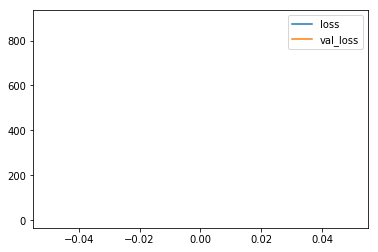

Epoch 2/10000
8557/8557 [==============================] - 164s 19ms/step - loss: 9.7437 - val_loss: 11.1560
train loss: 9.743663742704705
validation loss: 11.156015347983184


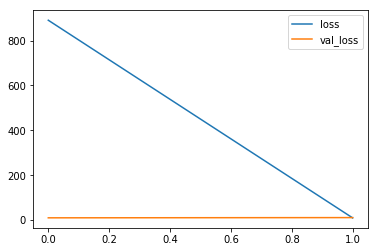

Epoch 3/10000
8557/8557 [==============================] - 173s 20ms/step - loss: 8.0209 - val_loss: 6.2340
train loss: 8.020869763889115
validation loss: 6.233988317154685


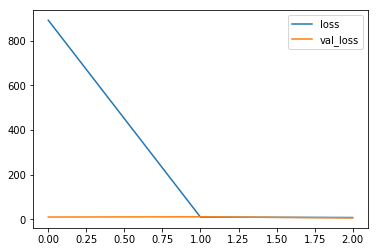

Epoch 4/10000
8557/8557 [==============================] - 165s 19ms/step - loss: 7.4057 - val_loss: 9.1648
train loss: 7.405741811843485
validation loss: 9.164806309809318


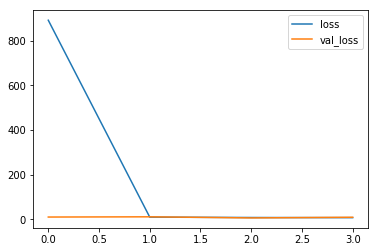

Epoch 5/10000
8557/8557 [==============================] - 163s 19ms/step - loss: 14.7681 - val_loss: 8.6994
train loss: 14.768103636215262
validation loss: 8.699419302393837


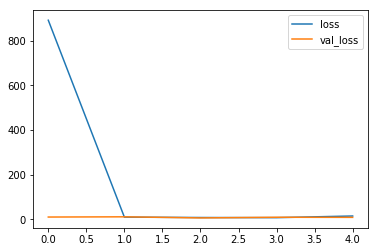

Epoch 6/10000
8557/8557 [==============================] - 161s 19ms/step - loss: 9.9225 - val_loss: 10.2971
train loss: 9.922536760815898
validation loss: 10.297053984913791


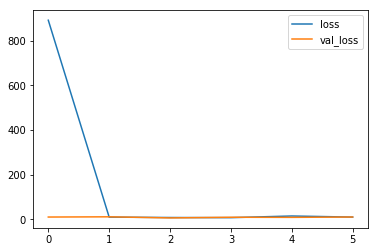

Epoch 7/10000
8557/8557 [==============================] - 163s 19ms/step - loss: 9.3925 - val_loss: 9.5773
train loss: 9.392467532882877
validation loss: 9.577316258106572


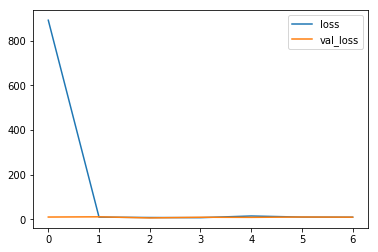

Epoch 8/10000
8557/8557 [==============================] - 166s 19ms/step - loss: 8.8928 - val_loss: 8.9328
train loss: 8.892769946942781
validation loss: 8.932814349386092


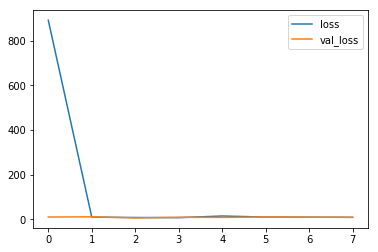

Epoch 9/10000
8557/8557 [==============================] - 162s 19ms/step - loss: 8.6848 - val_loss: 8.2432
train loss: 8.684757130968245
validation loss: 8.243198293491368


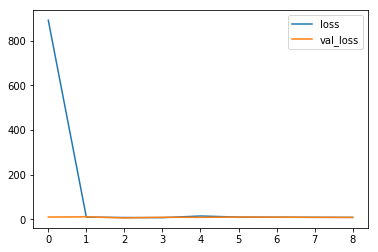

Epoch 10/10000
8557/8557 [==============================] - 167s 20ms/step - loss: 9.0430 - val_loss: 8.3797
train loss: 9.042987190452541
validation loss: 8.379672512772457


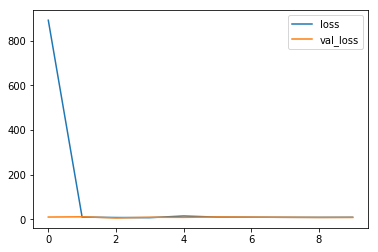

Epoch 11/10000
8557/8557 [==============================] - 164s 19ms/step - loss: 7.8035 - val_loss: 7.3257
train loss: 7.803491904689035
validation loss: 7.325725369899682


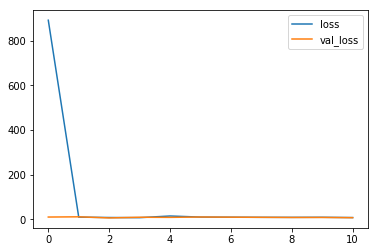

Epoch 12/10000
8557/8557 [==============================] - 162s 19ms/step - loss: 8.9064 - val_loss: 7.5700
train loss: 8.906438963371723
validation loss: 7.569996226097131


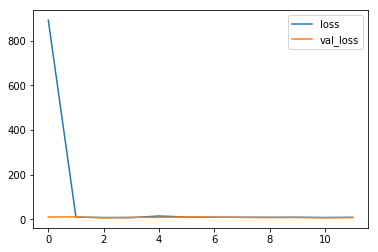

Epoch 13/10000
8557/8557 [==============================] - 167s 20ms/step - loss: 8.2973 - val_loss: 8.6394
train loss: 8.297316040379206
validation loss: 8.639377779514382


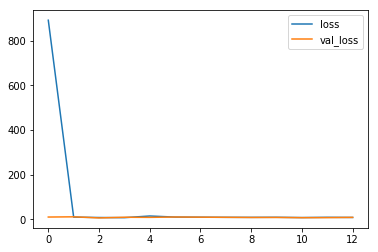

Epoch 14/10000
8557/8557 [==============================] - 165s 19ms/step - loss: 7.1893 - val_loss: 5.1702
train loss: 7.189254968094188
validation loss: 5.170231760488323


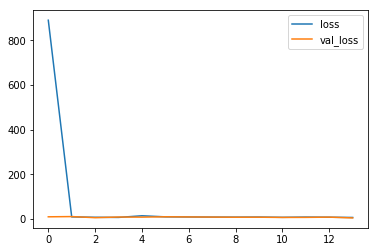

Epoch 15/10000
8557/8557 [==============================] - 165s 19ms/step - loss: 6.1865 - val_loss: 4.2419
train loss: 6.186499397540407
validation loss: 4.241917768612771


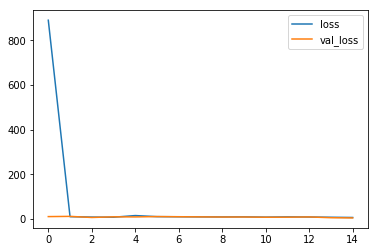

Epoch 16/10000
8557/8557 [==============================] - 169s 20ms/step - loss: 4.6578 - val_loss: 4.2951
train loss: 4.657832539052318
validation loss: 4.295061019191481


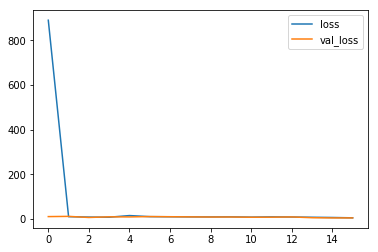

Epoch 17/10000
8557/8557 [==============================] - 163s 19ms/step - loss: 4.4211 - val_loss: 4.0898
train loss: 4.421125000961141
validation loss: 4.089845246697074


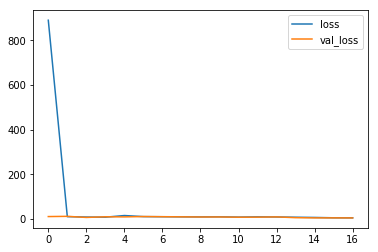

Epoch 18/10000
8557/8557 [==============================] - 163s 19ms/step - loss: 4.1938 - val_loss: 3.9227
train loss: 4.1937610854246605
validation loss: 3.922662957860343


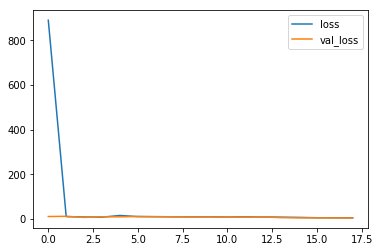

Epoch 19/10000
8557/8557 [==============================] - 162s 19ms/step - loss: 6.6526 - val_loss: 7.7290
train loss: 6.65259403283593
validation loss: 7.7289850172811


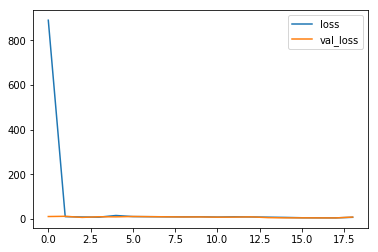

Epoch 20/10000
8557/8557 [==============================] - 163s 19ms/step - loss: 7.2318 - val_loss: 7.3779
train loss: 7.231827489262891
validation loss: 7.377940473747053


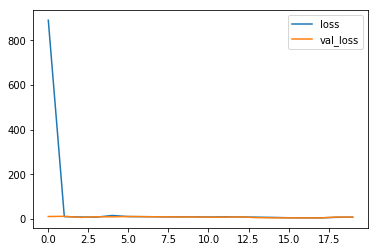

Epoch 21/10000
8557/8557 [==============================] - 163s 19ms/step - loss: 7.3024 - val_loss: 7.0801
train loss: 7.302437391712438
validation loss: 7.080111007710486


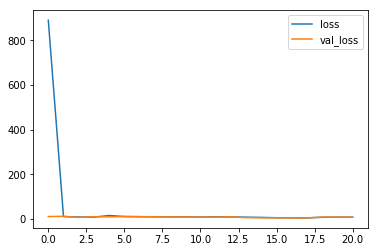

Epoch 22/10000
8557/8557 [==============================] - 178s 21ms/step - loss: 7.1420 - val_loss: 7.3147
train loss: 7.142039537234773
validation loss: 7.3146777127944835


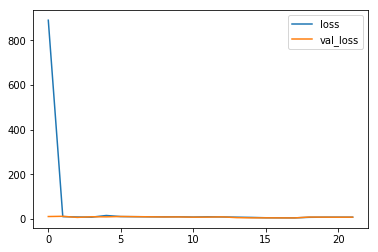

Epoch 23/10000
8557/8557 [==============================] - 181s 21ms/step - loss: 7.5050 - val_loss: 7.2721
train loss: 7.504968059582591
validation loss: 7.2720811545034065


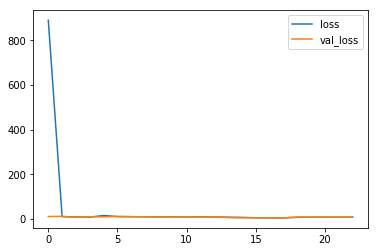

Epoch 24/10000
8557/8557 [==============================] - 172s 20ms/step - loss: 7.2156 - val_loss: 5.4001
train loss: 7.2156211124258345
validation loss: 5.400135395780096


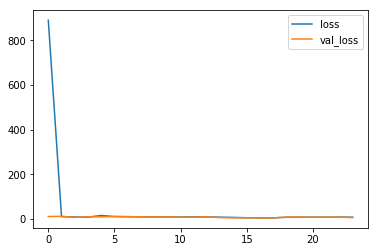

Epoch 25/10000
 512/8557 [>.............................] - ETA: 2:43 - loss: 7.0056

KeyboardInterrupt: 

In [156]:
#from keras.models import load_model
#model_2_1 = load_model('model_2_1.h5')
history_2_1 = model_2_1.fit(X_train_2_1, y_train_2_1, batch_size=512, verbose=1, nb_epoch=10000, validation_split = 0.1, callbacks=[plot_losses], shuffle = True)
#model.save('model_2_1.h5')

2.19

In [27]:
sequenced_list_of_hits_simplified_norm_1000, scaler_2_1 = from_event_id_to_sequenced_data_simplified_min_max_norm_removed('event000001000')

Loading data...
Done!
Getting sequenced hit ids...
Done!
Proprocessing event_cells...
Merging dataframe
               0         1          2
0       4.684636  4.965689   2.458129
1       4.728895  5.003733   2.458129
2       4.589910  4.995058   2.458129
3       4.530019  4.960433   2.458129
4       4.693105  4.954920   2.458129
5       4.720444  4.960742   2.458129
6       4.638482  4.988054   2.458129
7       4.687350  4.947617   2.458129
8       4.524431  4.947516   2.458129
9       4.558388  4.984686   2.458129
10      4.710131  4.997363   2.458129
11      4.790901  4.948627   2.458129
12      4.645010  5.013523   2.458129
13      4.689069  4.991546   2.458129
14      4.689384  4.984721   2.458129
15      4.719258  4.975818   2.458129
16      4.524426  4.968556   2.458129
17      4.608596  4.965639   2.458129
18      4.506543  5.002624   2.458129
19      4.720102  5.014051   2.458129
20      4.666408  4.955265   2.458129
21      4.333943  5.002245   2.458975
22      4.459557  5.01

In [29]:
X_train_2_1, X_test_2_1, y_train_2_1, y_test_2_1 = data_generator_2_1(sequenced_list_of_hits_simplified_norm_1000)

In [37]:
print(y_train_2_1[101])

[[  4.49543698   6.69316483   6.31635929]
 [  4.78169227   7.42599864   6.29487401]
 [  4.57964705   7.40057372   6.17002195]
 [  5.62462139   8.16112042   6.03028252]
 [  7.15050475   8.34970457   5.60497379]
 [  6.82313186   8.57053795   5.49534764]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]
 [  0.           0.          10.        ]]


In [100]:
model_2_1.save('model_2_1_norm_527.h5')

In [157]:
a = model_2_1.predict(X_test_2_1)

In [161]:
i = 101
#print(a[i])
#print(y_test_2_1[i])
print(scaler_2_1.inverse_transform(a[i]))
print(scaler_2_1.inverse_transform(y_test_2_1[i]))

[[ -541.59893799  -524.38317871 -1514.83215332]
 [ -538.82501221  -521.82427979 -1505.65600586]
 [ -544.14929199  -526.76885986 -1523.92907715]
 [ -545.7052002   -528.14599609 -1529.52600098]
 [ -546.89984131  -529.2399292  -1533.65808105]
 [ -551.4163208   -533.54968262 -1547.17004395]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]
 [ -650.94396973  -636.34283447 -1854.97802734]]
[[   28.84160042    45.00780106   602. 

# Model 2.1.1
## Custom loss and activation function
take whether the timestep is padding into account when evaluating loss

In [1]:
from trackml.dataset import load_event
print("imported")

imported


In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

#xyz only, model 1.3, model 2.1
def from_event_id_to_sequenced_data_2_1_1(event_id, scaler = None):

    #load data
    print("Loading data...")
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    print("Done!")
    
    #Get sequenced_hit_ids
    print("Getting sequenced hit ids...")
    sequenced_hit_ids = []
    
    fn="train_1/"+event_id

    A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
    B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

    for n in range(len(B)):
        part_id = B[n,0]

        hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]
        sequenced_hit_ids.append(hits_from_part)
    
    print("Done!")
    #Proprocess event_cells
    print("Proprocessing event_cells...")

    
    #Merge dataframe
    print("Merging dataframe")
    integrated = hits.loc[:,['x','y','z']]
    if scaler == None:
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaler.fit(integrated)
    else:
        pass
    integrated = pd.DataFrame(scaler.transform(integrated))
    print(integrated)
    print("Done!")
    
    
    #Generate final data
    print("Generating final data...")
    for index, element in enumerate(sequenced_hit_ids):
        sequenced_hit_ids[index] = sequenced_hit_ids[index].tolist()
        
    for particle_index, particle in enumerate(sequenced_hit_ids):
        for hit_index, hit in enumerate(particle):
            sequenced_hit_ids[particle_index][hit_index] = [1] + (integrated.iloc[sequenced_hit_ids[particle_index][hit_index]-1,:]).tolist()
    print("Done!")
    print(sequenced_hit_ids[0])
    
    #Padding
    print("Padding...")
    sequenced_hit_ids_new = []
    for index_particle, particle in enumerate(sequenced_hit_ids):
        if len(particle) > 0:
            while len(sequenced_hit_ids[index_particle])< 21:
                    #sequenced_hit_ids[index_particle].append(sequenced_hit_ids[index_particle][-1])
                    sequenced_hit_ids[index_particle].append([0,0,0,0])
            sequenced_hit_ids_new.append(sequenced_hit_ids[index_particle])
    print("Done!")
    return sequenced_hit_ids_new, scaler
    

In [22]:
import math

def Car2Cyn_scalar(x,y,z):
    r = math.sqrt(x*x + y*y)
    theta = math.atan2(y, x)
    return r, theta, z

def Car2Cyn_scalar_matrix(x, y, z):
    rho = np.sqrt(x**2 + y**2)
    phi = np.arctan2(y, x)
    return rho, phi, z

#def Cyn2Car(r, theta, z):
    
#print(Car2Cyn(1,2,3))

In [27]:


import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

#xyz only, model 1.3, model 2.1
def from_event_id_to_sequenced_data_2_1_1_cylindral(event_id, scaler = None):

    #load data
    print("Loading data...")
    hits, cells, particles, truth = load_event('train_1/'+event_id)
    print("Done!")
    
    #Get sequenced_hit_ids
    print("Getting sequenced hit ids...")
    sequenced_hit_ids = []
    
    fn="train_1/"+event_id

    A=np.loadtxt(fn+"-truth.csv",skiprows=1,delimiter=',')
    B=np.loadtxt(fn+"-particles.csv",skiprows=1,delimiter=',')

    for n in range(len(B)):
        part_id = B[n,0]

        hits_from_part = np.argwhere(A[:,1]==part_id)[:,0]
        sequenced_hit_ids.append(hits_from_part)
    
    print("Done!")
    #Proprocess event_cells
    print("Proprocessing event_cells...")

    #Convert to Cylindral
    print("Converting to Cylindral Coordinaes...")
    integrated = hits.loc[:,['x','y','z']]
    print("Before:")
    print(integrated)
    integrated.loc[:,'x'], integrated.loc[:,'y'], integrated.loc[:,'z'] = Car2Cyn_scalar_matrix(integrated.loc[:,'x'].values, integrated.loc[:,'y'].values, integrated.loc[:,'z'].values)
    print("After:")
    print(integrated)
    print("Done!")
    
    #Scaling dataframe
    print("Scaling dataframe")
    if scaler == None:
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaler.fit(integrated)
    else:
        pass
    integrated = pd.DataFrame(scaler.transform(integrated))
    print(integrated)
    print("Done!")
    
    
    #Generate final data
    print("Generating final data...")
    for index, element in enumerate(sequenced_hit_ids):
        sequenced_hit_ids[index] = sequenced_hit_ids[index].tolist()
        
    for particle_index, particle in enumerate(sequenced_hit_ids):
        for hit_index, hit in enumerate(particle):
            sequenced_hit_ids[particle_index][hit_index] = [1] + (integrated.iloc[sequenced_hit_ids[particle_index][hit_index]-1,:]).tolist()
    print("Done!")
    print(sequenced_hit_ids[0])
    
    #Padding
    print("Padding...")
    sequenced_hit_ids_new = []
    for index_particle, particle in enumerate(sequenced_hit_ids):
        if len(particle) > 0:
            while len(sequenced_hit_ids[index_particle])< 21:
                    #sequenced_hit_ids[index_particle].append(sequenced_hit_ids[index_particle][-1])
                    sequenced_hit_ids[index_particle].append([0,0,0,0])
            sequenced_hit_ids_new.append(sequenced_hit_ids[index_particle])
    print("Done!")
    return sequenced_hit_ids_new, scaler
    

In [16]:
def xy_splitter_2_1_1(data):
    x = [[i[0]] for i in data]
    for index, i in enumerate(x):
        for j in range(19):
            x[index].append([0,0,0,0])
    x = np.array(x)
    y = np.array([i[1:] for i in data])
    return x, y

In [17]:
from sklearn.model_selection import train_test_split

def data_generator_2_1_1(data):
    X, y = xy_splitter_2_1_1(data)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
    return X_train, X_test, y_train, y_test

In [18]:
from keras import backend as K
from keras.utils.generic_utils import get_custom_objects

def activation_2_1_1(x):
    k1 = x[:,0:1]
    k2 = x[:,1:]
    return K.concatenate([K.sigmoid(k1), k2])

#get_custom_objects().update({'activation_2_1_1': Activation(activation_2_1_1)})

In [19]:
from keras import losses

def customLoss(y_true,y_pred):
    return K.mean(losses.mean_squared_error(y_true[:,:,1:]* y_true[:,:,0:1], y_pred[:,:,1:] * y_true[:,:,0:1]))+ K.mean(losses.binary_crossentropy(y_true[:,:,0:1], y_pred[:,:,0:1]))

In [24]:
#Model 2.1
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import Activation
from keras.layers import TimeDistributed
from keras.layers import BatchNormalization
from keras.layers import Dropout
import keras.optimizers

model_2_1 = Sequential()
model_2_1.add(LSTM(32, input_shape=(20, 4), return_sequences=True))
model_2_1.add(LSTM(32, return_sequences=True))
model_2_1.add(LSTM(64, return_sequences=True))
model_2_1.add(LSTM(512, return_sequences=True))
model_2_1.add(LSTM(1024, return_sequences=True))
model_2_1.add(TimeDistributed(Dense(1024, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(512, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(128, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(64, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(64, activation = 'relu')))
model_2_1.add(Dropout(0.2))
model_2_1.add(TimeDistributed(Dense(64, activation = 'relu')))
model_2_1.add(TimeDistributed(Dense(4, activation = 'relu')))
model_2_1.add(TimeDistributed(Activation(activation_2_1_1)))
rms = keras.optimizers.RMSprop(lr=0.0009)
model_2_1.compile(loss=customLoss, optimizer=rms)
print(model_2_1.summary())
#adagrad = keras.optimizers.Adagrad()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_11 (LSTM)               (None, 20, 32)            4736      
_________________________________________________________________
lstm_12 (LSTM)               (None, 20, 32)            8320      
_________________________________________________________________
lstm_13 (LSTM)               (None, 20, 64)            24832     
_________________________________________________________________
lstm_14 (LSTM)               (None, 20, 512)           1181696   
_________________________________________________________________
lstm_15 (LSTM)               (None, 20, 1024)          6295552   
_________________________________________________________________
time_distributed_17 (TimeDis (None, 20, 1024)          1049600   
_________________________________________________________________
dropout_11 (Dropout)         (None, 20, 1024)          0         
__________

In [28]:
sequenced_list_of_hits_simplified_norm_1000, scaler_2_1 = from_event_id_to_sequenced_data_2_1_1_cylindral('event000001000')

Loading data...
Done!
Getting sequenced hit ids...
Done!
Proprocessing event_cells...
Converting to Cylindral Coordinaes...
Before:
                 x           y       z
0       -64.409897   -7.163700 -1502.5
1       -55.336102    0.635342 -1502.5
2       -83.830498   -1.143010 -1502.5
3       -96.109100   -8.241030 -1502.5
4       -62.673599   -9.371200 -1502.5
5       -57.068699   -8.177770 -1502.5
6       -73.872299   -2.578900 -1502.5
7       -63.853500  -10.868400 -1502.5
8       -97.254799  -10.889100 -1502.5
9       -90.292900   -3.269370 -1502.5
10      -59.182999   -0.670508 -1502.5
11      -42.623901  -10.661200 -1502.5
12      -72.533997    2.642190 -1502.5
13      -63.501202   -1.862990 -1502.5
14      -63.436501   -3.262220 -1502.5
15      -57.311901   -5.087320 -1502.5
16      -97.255699   -6.575870 -1502.5
17      -79.999397   -7.173790 -1502.5
18     -100.921997    0.407992 -1502.5
19      -57.138802    2.750420 -1502.5
20      -68.147102   -9.300430 -1502.5
21     -13

In [29]:
X_train_2_1, X_test_2_1, y_train_2_1, y_test_2_1 = data_generator_2_1_1(sequenced_list_of_hits_simplified_norm_1000)

In [30]:
print(X_train_2_1[10])

[[1.         0.12294272 0.15516521 0.24589748]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]]


/Users/tonychen.xyz/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/keras/models.py:981: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  warnings.warn('The `nb_epoch` argument in `fit` '


Train on 8557 samples, validate on 951 samples
Epoch 1/10000
8557/8557 [==============================] - 123s 14ms/step - loss: 0.5730 - val_loss: 0.5605
train loss: 0.5730051445225431
validation loss: 0.5605459809303284


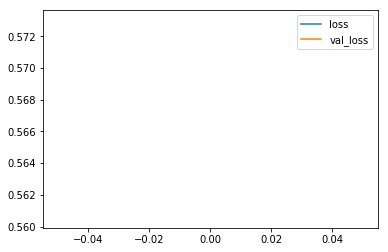

Epoch 2/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5744 - val_loss: 0.5642
train loss: 0.5744407776988276
validation loss: 0.5641900897026062


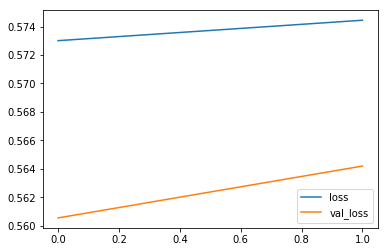

Epoch 3/10000
8557/8557 [==============================] - 118s 14ms/step - loss: 0.5738 - val_loss: 0.5619
train loss: 0.5738393314826206
validation loss: 0.5619465112686157


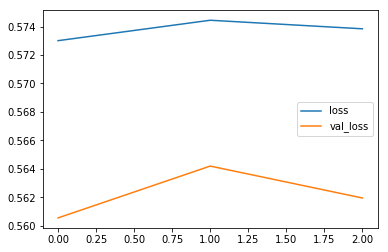

Epoch 4/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5740 - val_loss: 0.5623
train loss: 0.5740379039700989
validation loss: 0.5623169541358948


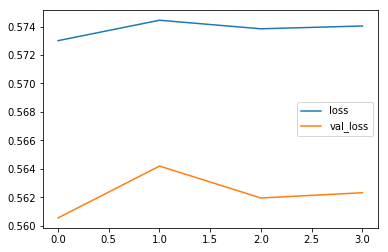

Epoch 5/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5729 - val_loss: 0.5614
train loss: 0.5729290056106043
validation loss: 0.5614317655563354


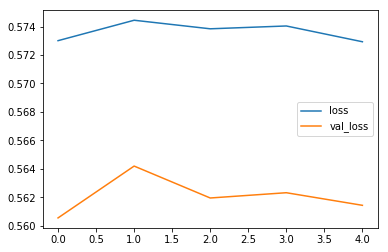

Epoch 6/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5744 - val_loss: 0.5634
train loss: 0.5743998427654073
validation loss: 0.5634463429450989


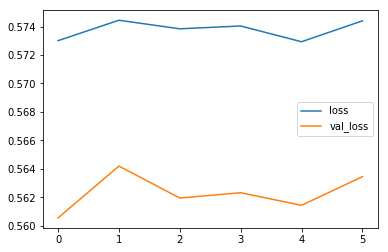

Epoch 7/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5718 - val_loss: 0.5631
train loss: 0.5718174413137379
validation loss: 0.5630520582199097


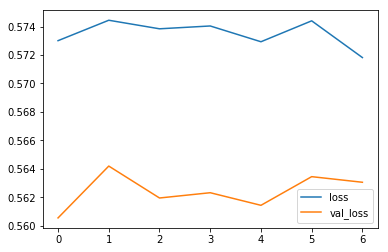

Epoch 8/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5719 - val_loss: 0.5658
train loss: 0.5718920172842025
validation loss: 0.5657567977905273


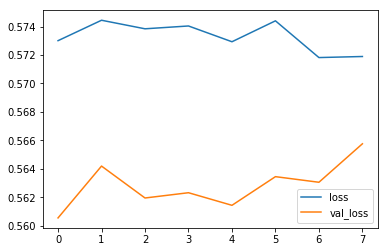

Epoch 9/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5743 - val_loss: 0.5599
train loss: 0.5743360129544511
validation loss: 0.5598833560943604


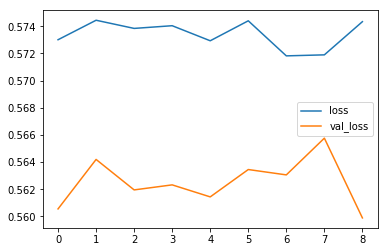

Epoch 10/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5706 - val_loss: 0.5624
train loss: 0.5706366555175589
validation loss: 0.5623711347579956


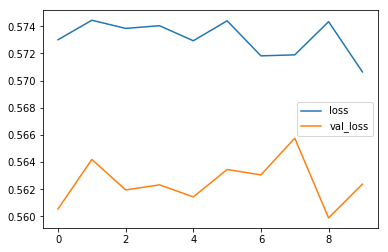

Epoch 11/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5714 - val_loss: 0.5599
train loss: 0.5713926188798378
validation loss: 0.5599061250686646


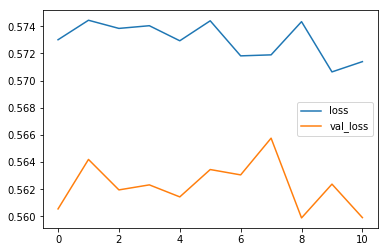

Epoch 12/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5713 - val_loss: 0.5652
train loss: 0.5713232852831139
validation loss: 0.5652273297309875


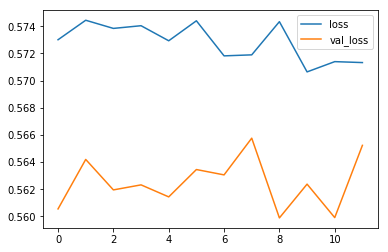

Epoch 13/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5718 - val_loss: 0.5628
train loss: 0.5717532265418961
validation loss: 0.5628167986869812


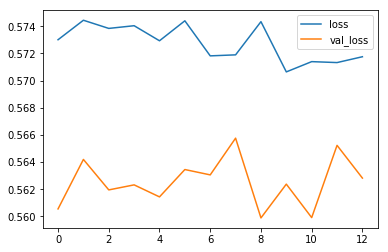

Epoch 14/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5685 - val_loss: 0.5640
train loss: 0.5684712927405823
validation loss: 0.5640136003494263


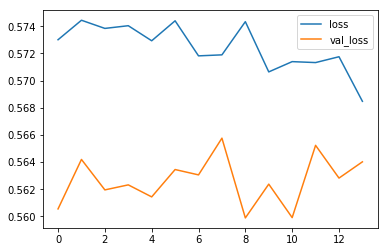

Epoch 15/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5695 - val_loss: 0.5587
train loss: 0.5695491356104072
validation loss: 0.5587149262428284


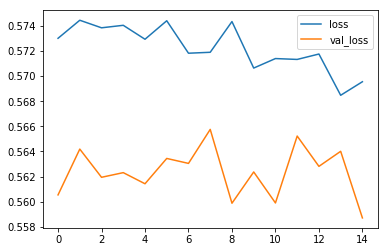

Epoch 16/10000
8557/8557 [==============================] - 117s 14ms/step - loss: 0.5691 - val_loss: 0.5732
train loss: 0.5690621117836713
validation loss: 0.573203980922699


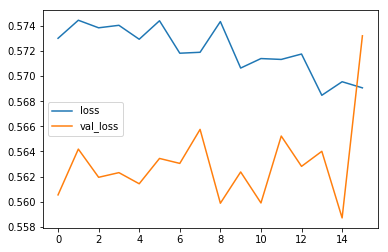

Epoch 17/10000
8557/8557 [==============================] - 121s 14ms/step - loss: 0.5701 - val_loss: 0.5558
train loss: 0.5700945447744213
validation loss: 0.5558011531829834


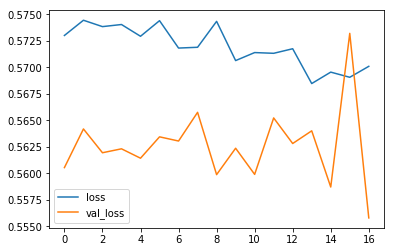

Epoch 18/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5694 - val_loss: 0.5590
train loss: 0.5693541375209032
validation loss: 0.55901038646698


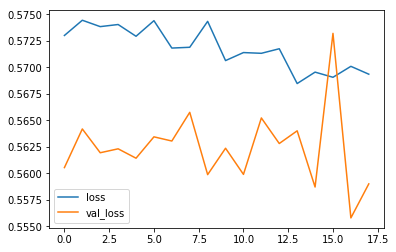

Epoch 19/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5671 - val_loss: 0.5646
train loss: 0.5670897518834792
validation loss: 0.5645760297775269


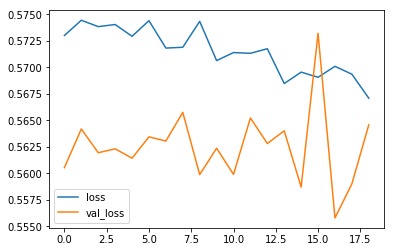

Epoch 20/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5689 - val_loss: 0.5553
train loss: 0.5688580171073083
validation loss: 0.5552636384963989


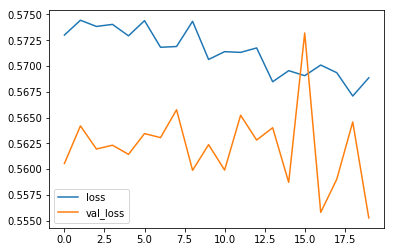

Epoch 21/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5661 - val_loss: 0.5624
train loss: 0.566110265969645
validation loss: 0.5624417066574097


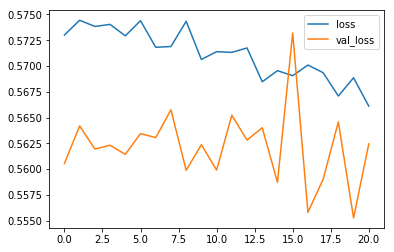

Epoch 22/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5678 - val_loss: 0.5620
train loss: 0.5677749197227008
validation loss: 0.5620458722114563


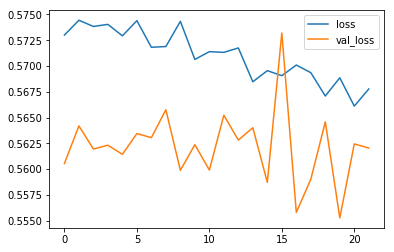

Epoch 23/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5683 - val_loss: 0.5621
train loss: 0.5682990948173422
validation loss: 0.5620604753494263


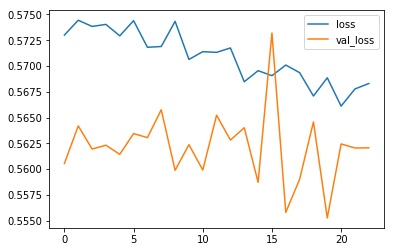

Epoch 24/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5672 - val_loss: 0.5556
train loss: 0.5671809053078313
validation loss: 0.5555505156517029


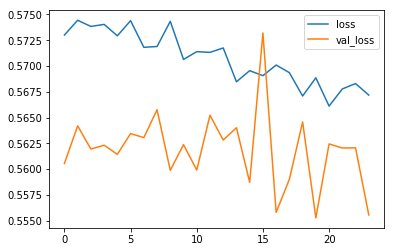

Epoch 25/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5679 - val_loss: 0.5547
train loss: 0.5679207559053734
validation loss: 0.5547341704368591


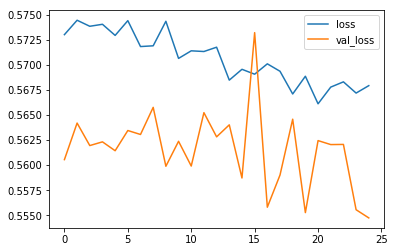

Epoch 26/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5671 - val_loss: 0.5544
train loss: 0.5671346382419403
validation loss: 0.5543553233146667


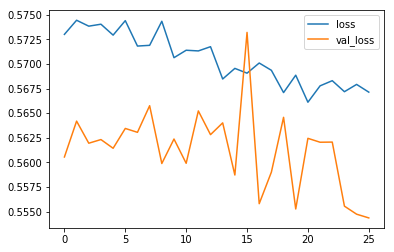

Epoch 27/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5675 - val_loss: 0.5630
train loss: 0.5675466994237883
validation loss: 0.5629569888114929


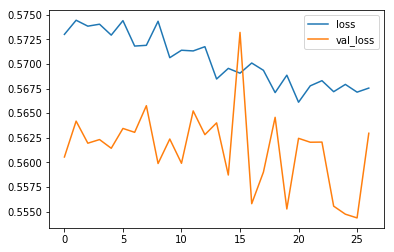

Epoch 28/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5666 - val_loss: 0.5564
train loss: 0.5666176474887076
validation loss: 0.5564233064651489


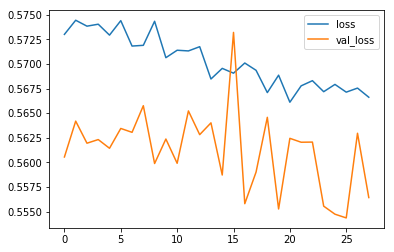

Epoch 29/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5657 - val_loss: 0.5547
train loss: 0.5657470364346047
validation loss: 0.554710328578949


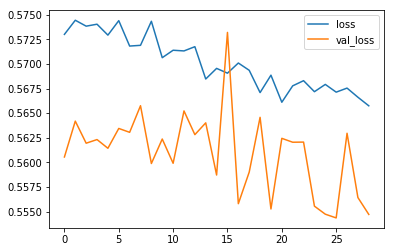

Epoch 30/10000
8557/8557 [==============================] - 118s 14ms/step - loss: 0.5678 - val_loss: 0.5554
train loss: 0.5678470732871236
validation loss: 0.555378258228302


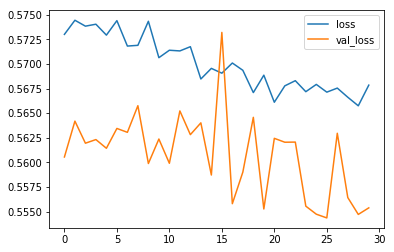

Epoch 31/10000
8557/8557 [==============================] - 114s 13ms/step - loss: 0.5661 - val_loss: 0.5526
train loss: 0.5660890115955465
validation loss: 0.5526114106178284


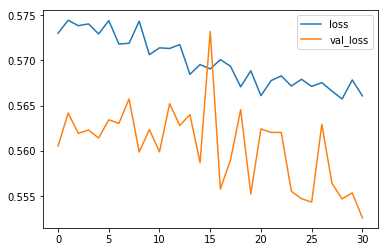

Epoch 32/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5638 - val_loss: 0.5575
train loss: 0.5638067640823029
validation loss: 0.5574608445167542


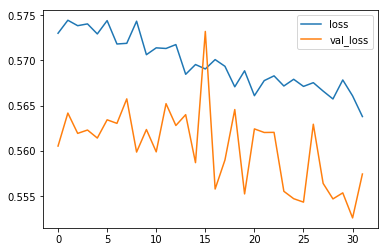

Epoch 33/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5649 - val_loss: 0.5616
train loss: 0.5649363775112313
validation loss: 0.5616268515586853


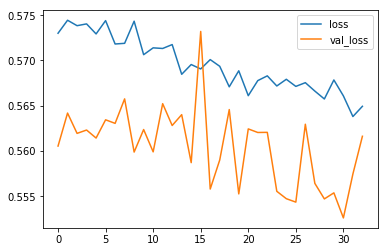

Epoch 34/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5660 - val_loss: 0.5519
train loss: 0.5660321930656509
validation loss: 0.5518882274627686


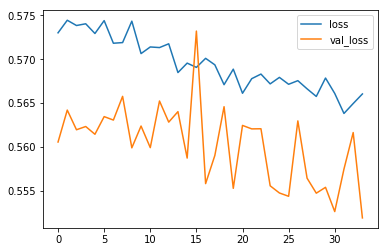

Epoch 35/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5644 - val_loss: 0.5549
train loss: 0.5644262933321502
validation loss: 0.5548784732818604


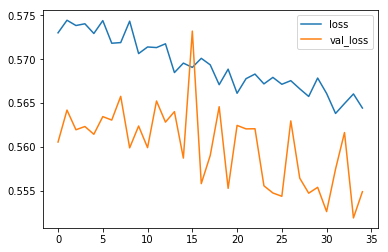

Epoch 36/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5640 - val_loss: 0.5572
train loss: 0.5639746491285188
validation loss: 0.55717933177948


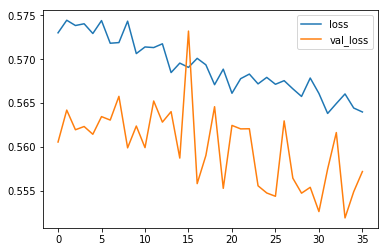

Epoch 37/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5641 - val_loss: 0.5528
train loss: 0.5640728995526131
validation loss: 0.5527727603912354


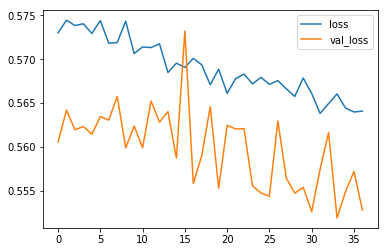

Epoch 38/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5643 - val_loss: 0.5703
train loss: 0.5643059943370679
validation loss: 0.570305585861206


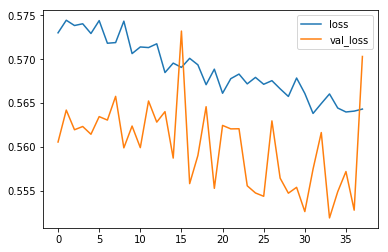

Epoch 39/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5659 - val_loss: 0.5513
train loss: 0.5659101954949185
validation loss: 0.5512580275535583


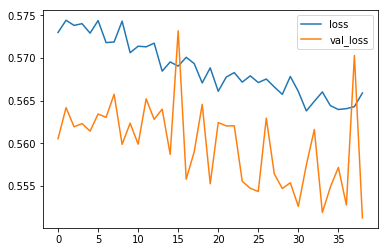

Epoch 40/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5649 - val_loss: 0.5545
train loss: 0.5648916774198972
validation loss: 0.5544976592063904


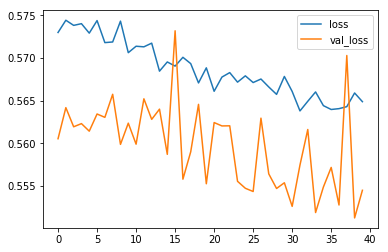

Epoch 41/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5643 - val_loss: 0.5502
train loss: 0.5642517380476472
validation loss: 0.5501899123191833


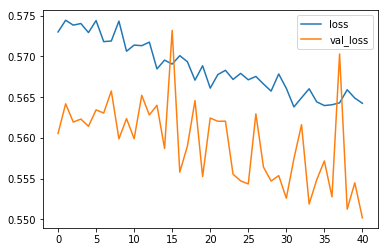

Epoch 42/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5631 - val_loss: 0.5555
train loss: 0.5631198209761682
validation loss: 0.5554844737052917


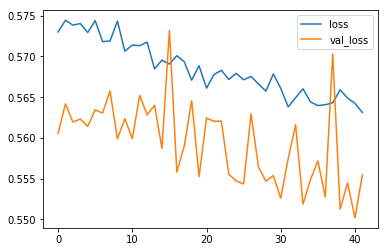

Epoch 43/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5641 - val_loss: 0.5524
train loss: 0.5641018669014851
validation loss: 0.5524375438690186


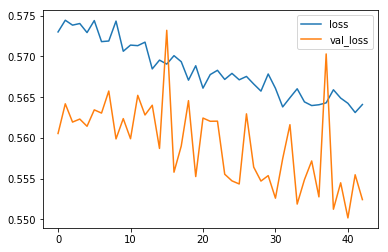

Epoch 44/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5630 - val_loss: 0.5560
train loss: 0.5629838629277131
validation loss: 0.5559775829315186


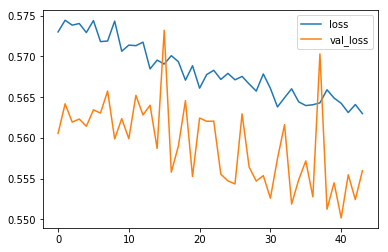

Epoch 45/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5652 - val_loss: 0.5519
train loss: 0.5652115846803092
validation loss: 0.551854133605957


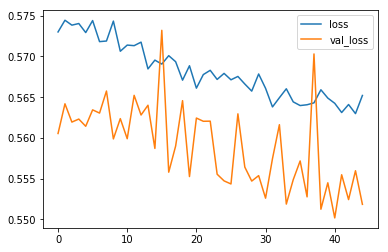

Epoch 46/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5610 - val_loss: 0.5535
train loss: 0.5610085951330451
validation loss: 0.5535269379615784


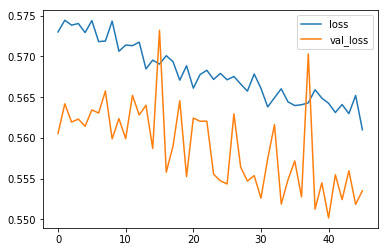

Epoch 47/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5660 - val_loss: 0.5516
train loss: 0.5659565587905825
validation loss: 0.5515821576118469


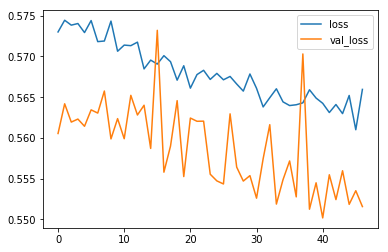

Epoch 48/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5622 - val_loss: 0.5557
train loss: 0.5622475724695608
validation loss: 0.5556566119194031


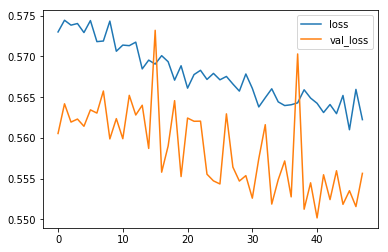

Epoch 49/10000
8557/8557 [==============================] - 117s 14ms/step - loss: 0.5623 - val_loss: 0.5498
train loss: 0.562343597244935
validation loss: 0.5498389601707458


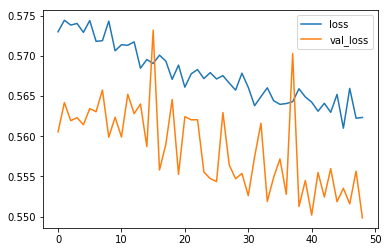

Epoch 50/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5629 - val_loss: 0.5521
train loss: 0.5628706496968592
validation loss: 0.5520590543746948


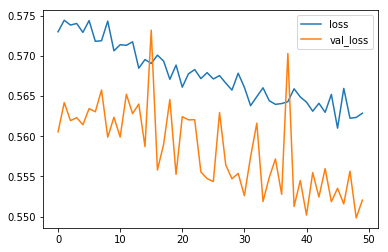

Epoch 51/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5599 - val_loss: 0.5593
train loss: 0.559947322960475
validation loss: 0.5592832565307617


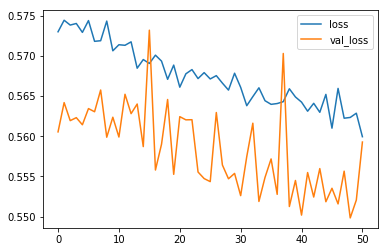

Epoch 52/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5642 - val_loss: 0.5541
train loss: 0.5641578255697738
validation loss: 0.5540850162506104


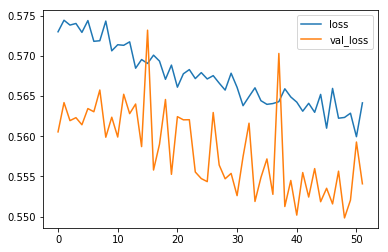

Epoch 53/10000
8557/8557 [==============================] - 116s 14ms/step - loss: 0.5634 - val_loss: 0.5512
train loss: 0.5633961511115207
validation loss: 0.5511778593063354


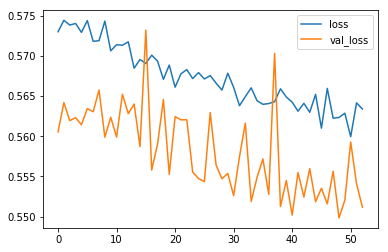

Epoch 54/10000
8557/8557 [==============================] - 115s 13ms/step - loss: 0.5623 - val_loss: 0.5513
train loss: 0.5623145588260395
validation loss: 0.551258385181427


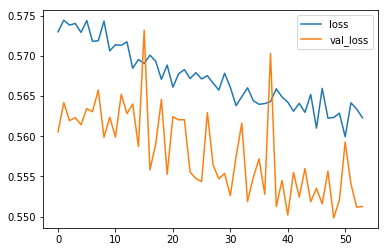

Epoch 55/10000
8557/8557 [==============================] - 121s 14ms/step - loss: 0.5604 - val_loss: 0.5546
train loss: 0.5603961315864964
validation loss: 0.5545957088470459


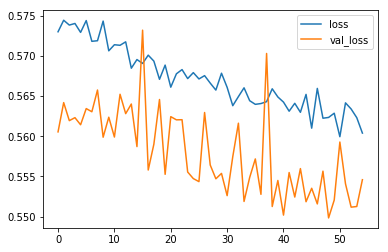

Epoch 56/10000
8557/8557 [==============================] - 130s 15ms/step - loss: 0.5617 - val_loss: 0.5524
train loss: 0.5617123737337434
validation loss: 0.5524377226829529


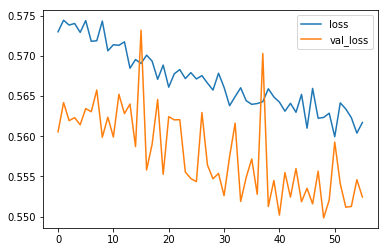

Epoch 57/10000
8557/8557 [==============================] - 147s 17ms/step - loss: 0.5617 - val_loss: 0.5542
train loss: 0.5617220210140242
validation loss: 0.5542382001876831


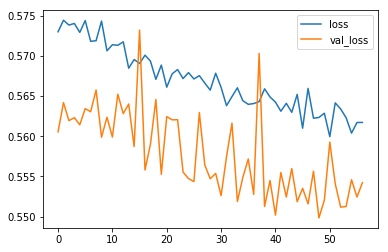

Epoch 58/10000
8557/8557 [==============================] - 140s 16ms/step - loss: 0.5618 - val_loss: 0.5532
train loss: 0.5618345500696509
validation loss: 0.5532445907592773


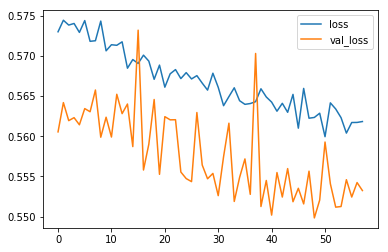

Epoch 59/10000
8557/8557 [==============================] - 127s 15ms/step - loss: 0.5610 - val_loss: 0.5561
train loss: 0.5610270067758617
validation loss: 0.5560797452926636


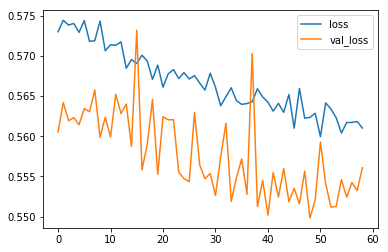

Epoch 60/10000


In [ ]:
#from keras.models import load_model
#model_2_1 = load_model('model_2_1.h5')
history_2_1 = model_2_1.fit(X_train_2_1, y_train_2_1, batch_size=1024, verbose=1, nb_epoch=10000, validation_split = 0.1, callbacks=[plot_losses], shuffle = True)
#model.save('model_2_1.h5')

2.19

In [8]:
model_2_1.save('model_2_1_1.h5')

In [303]:
a = model_2_1.predict(X_train_2_1)

In [ ]:
def pol2cart(rho, phi, z):
    x = rho * np.cos(phi)
    y = rho * np.sin(phi)
    return x, y, z

In [2]:
i = 10
print(a[i])
print(y_test_2_1[i])
#print(scaler_2_1.inverse_transform(a[i][:,1:]))
#print(scaler_2_1.inverse_transform(y_test_2_1[i][:,1:]))
inverse = scaler_2_1.inverse_transform(a[i][:,1:])
pred_x, pred_y, pred_z = scaler_2_1.inverse_transform(inverse[:,0], inverse[:,1], inverse[:,2])
print (pred_x, pred_y, pred_z)

NameError: name 'a' is not defined

Process result and plot

In [1]:
#for track_index in range(100):
track_index = 33

prediction_hits = a[track_index]
prediction_hits = np.concatenate((X_test_2_1[track_index, 0:1], prediction_hits), axis = 0)
prediction_hits = np.concatenate((prediction_hits[:,0:1], scaler_2_1.inverse_transform(prediction_hits[:,1:])), axis=1)
prediction_hits = prediction_hits[prediction_hits[:,0] > 0.5]

target_hits = y_test_2_1[track_index]
target_hits = np.concatenate((X_test_2_1[track_index, 0:1], target_hits), axis = 0)
target_hits = np.concatenate((target_hits[:,0:1], scaler_2_1.inverse_transform(target_hits[:,1:])), axis=1)
target_hits = target_hits[target_hits[:,0] > 0.5]

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

print(prediction_hits)
print(target_hits)
ax.plot(prediction_hits[:,1],prediction_hits[:,2],prediction_hits[:,3],'.-')
ax.plot(target_hits[:,1],target_hits[:,2],target_hits[:,3],'.-')
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
#plt.show()

for angle in range(0, 360):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(1)

NameError: name 'a' is not defined

## Model 2.2
## m2m, full data, n = 10

In [96]:
sequenced_list_of_hits2 = from_event_id_to_sequenced_data2('event000001000')

Loading data...
Done!
Getting sequenced hit ids...
Done!
Proprocessing event_cells...
hit id: 1
hit id: 2
hit id: 3
hit id: 4
hit id: 5
hit id: 6
hit id: 7
hit id: 8
hit id: 9
hit id: 10
hit id: 11
hit id: 12
hit id: 13
hit id: 14
hit id: 15
hit id: 16
hit id: 17
hit id: 18
hit id: 19
hit id: 20
hit id: 21
hit id: 22
hit id: 23
hit id: 24
hit id: 25
hit id: 26
hit id: 27
hit id: 28
hit id: 29
hit id: 30
hit id: 31
hit id: 32
hit id: 33
hit id: 34
hit id: 35
hit id: 36
hit id: 37
hit id: 38
hit id: 39
hit id: 40
hit id: 41
hit id: 42
hit id: 43
hit id: 44
hit id: 45
hit id: 46
hit id: 47
hit id: 48
hit id: 49
hit id: 50
hit id: 51
hit id: 52
hit id: 53
hit id: 54
hit id: 55
hit id: 56
hit id: 57
hit id: 58
hit id: 59
hit id: 60
hit id: 61
hit id: 62
hit id: 63
hit id: 64
hit id: 65
hit id: 66
hit id: 67
hit id: 68
hit id: 69
hit id: 70
hit id: 71
hit id: 72
hit id: 73
hit id: 74
hit id: 75
hit id: 76
hit id: 77
hit id: 78
hit id: 79
hit id: 80
hit id: 81
hit id: 82
hit id: 83
hit id: 84

hit id: 703
hit id: 704
hit id: 705
hit id: 706
hit id: 707
hit id: 708
hit id: 709
hit id: 710
hit id: 711
hit id: 712
hit id: 713
hit id: 714
hit id: 715
hit id: 716
hit id: 717
hit id: 718
hit id: 719
hit id: 720
hit id: 721
hit id: 722
hit id: 723
hit id: 724
hit id: 725
hit id: 726
hit id: 727
hit id: 728
hit id: 729
hit id: 730
hit id: 731
hit id: 732
hit id: 733
hit id: 734
hit id: 735
hit id: 736
hit id: 737
hit id: 738
hit id: 739
hit id: 740
hit id: 741
hit id: 742
hit id: 743
hit id: 744
hit id: 745
hit id: 746
hit id: 747
hit id: 748
hit id: 749
hit id: 750
hit id: 751
hit id: 752
hit id: 753
hit id: 754
hit id: 755
hit id: 756
hit id: 757
hit id: 758
hit id: 759
hit id: 760
hit id: 761
hit id: 762
hit id: 763
hit id: 764
hit id: 765
hit id: 766
hit id: 767
hit id: 768
hit id: 769
hit id: 770
hit id: 771
hit id: 772
hit id: 773
hit id: 774
hit id: 775
hit id: 776
hit id: 777
hit id: 778
hit id: 779
hit id: 780
hit id: 781
hit id: 782
hit id: 783
hit id: 784
hit id: 785
hit 

hit id: 1399
hit id: 1400
hit id: 1401
hit id: 1402
hit id: 1403
hit id: 1404
hit id: 1405
hit id: 1406
hit id: 1407
hit id: 1408
hit id: 1409
hit id: 1410
hit id: 1411
hit id: 1412
hit id: 1413
hit id: 1414
hit id: 1415
hit id: 1416
hit id: 1417
hit id: 1418
hit id: 1419
hit id: 1420
hit id: 1421
hit id: 1422
hit id: 1423
hit id: 1424
hit id: 1425
hit id: 1426
hit id: 1427
hit id: 1428
hit id: 1429
hit id: 1430
hit id: 1431
hit id: 1432
hit id: 1433
hit id: 1434
hit id: 1435
hit id: 1436
hit id: 1437
hit id: 1438
hit id: 1439
hit id: 1440
hit id: 1441
hit id: 1442
hit id: 1443
hit id: 1444
hit id: 1445
hit id: 1446
hit id: 1447
hit id: 1448
hit id: 1449
hit id: 1450
hit id: 1451
hit id: 1452
hit id: 1453
hit id: 1454
hit id: 1455
hit id: 1456
hit id: 1457
hit id: 1458
hit id: 1459
hit id: 1460
hit id: 1461
hit id: 1462
hit id: 1463
hit id: 1464
hit id: 1465
hit id: 1466
hit id: 1467
hit id: 1468
hit id: 1469
hit id: 1470
hit id: 1471
hit id: 1472
hit id: 1473
hit id: 1474
hit id: 1475

hit id: 2036
hit id: 2037
hit id: 2038
hit id: 2039
hit id: 2040
hit id: 2041
hit id: 2042
hit id: 2043
hit id: 2044
hit id: 2045
hit id: 2046
hit id: 2047
hit id: 2048
hit id: 2049
hit id: 2050
hit id: 2051
hit id: 2052
hit id: 2053
hit id: 2054
hit id: 2055
hit id: 2056
hit id: 2057
hit id: 2058
hit id: 2059
hit id: 2060
hit id: 2061
hit id: 2062
hit id: 2063
hit id: 2064
hit id: 2065
hit id: 2066
hit id: 2067
hit id: 2068
hit id: 2069
hit id: 2070
hit id: 2071
hit id: 2072
hit id: 2073
hit id: 2074
hit id: 2075
hit id: 2076
hit id: 2077
hit id: 2078
hit id: 2079
hit id: 2080
hit id: 2081
hit id: 2082
hit id: 2083
hit id: 2084
hit id: 2085
hit id: 2086
hit id: 2087
hit id: 2088
hit id: 2089
hit id: 2090
hit id: 2091
hit id: 2092
hit id: 2093
hit id: 2094
hit id: 2095
hit id: 2096
hit id: 2097
hit id: 2098
hit id: 2099
hit id: 2100
hit id: 2101
hit id: 2102
hit id: 2103
hit id: 2104
hit id: 2105
hit id: 2106
hit id: 2107
hit id: 2108
hit id: 2109
hit id: 2110
hit id: 2111
hit id: 2112

hit id: 2674
hit id: 2675
hit id: 2676
hit id: 2677
hit id: 2678
hit id: 2679
hit id: 2680
hit id: 2681
hit id: 2682
hit id: 2683
hit id: 2684
hit id: 2685
hit id: 2686
hit id: 2687
hit id: 2688
hit id: 2689
hit id: 2690
hit id: 2691
hit id: 2692
hit id: 2693
hit id: 2694
hit id: 2695
hit id: 2696
hit id: 2697
hit id: 2698
hit id: 2699
hit id: 2700
hit id: 2701
hit id: 2702
hit id: 2703
hit id: 2704
hit id: 2705
hit id: 2706
hit id: 2707
hit id: 2708
hit id: 2709
hit id: 2710
hit id: 2711
hit id: 2712
hit id: 2713
hit id: 2714
hit id: 2715
hit id: 2716
hit id: 2717
hit id: 2718
hit id: 2719
hit id: 2720
hit id: 2721
hit id: 2722
hit id: 2723
hit id: 2724
hit id: 2725
hit id: 2726
hit id: 2727
hit id: 2728
hit id: 2729
hit id: 2730
hit id: 2731
hit id: 2732
hit id: 2733
hit id: 2734
hit id: 2735
hit id: 2736
hit id: 2737
hit id: 2738
hit id: 2739
hit id: 2740
hit id: 2741
hit id: 2742
hit id: 2743
hit id: 2744
hit id: 2745
hit id: 2746
hit id: 2747
hit id: 2748
hit id: 2749
hit id: 2750

hit id: 3315
hit id: 3316
hit id: 3317
hit id: 3318
hit id: 3319
hit id: 3320
hit id: 3321
hit id: 3322
hit id: 3323
hit id: 3324
hit id: 3325
hit id: 3326
hit id: 3327
hit id: 3328
hit id: 3329
hit id: 3330
hit id: 3331
hit id: 3332
hit id: 3333
hit id: 3334
hit id: 3335
hit id: 3336
hit id: 3337
hit id: 3338
hit id: 3339
hit id: 3340
hit id: 3341
hit id: 3342
hit id: 3343
hit id: 3344
hit id: 3345
hit id: 3346
hit id: 3347
hit id: 3348
hit id: 3349
hit id: 3350
hit id: 3351
hit id: 3352
hit id: 3353
hit id: 3354
hit id: 3355
hit id: 3356
hit id: 3357
hit id: 3358
hit id: 3359
hit id: 3360
hit id: 3361
hit id: 3362
hit id: 3363
hit id: 3364
hit id: 3365
hit id: 3366
hit id: 3367
hit id: 3368
hit id: 3369
hit id: 3370
hit id: 3371
hit id: 3372
hit id: 3373
hit id: 3374
hit id: 3375
hit id: 3376
hit id: 3377
hit id: 3378
hit id: 3379
hit id: 3380
hit id: 3381
hit id: 3382
hit id: 3383
hit id: 3384
hit id: 3385
hit id: 3386
hit id: 3387
hit id: 3388
hit id: 3389
hit id: 3390
hit id: 3391

hit id: 3981
hit id: 3982
hit id: 3983
hit id: 3984
hit id: 3985
hit id: 3986
hit id: 3987
hit id: 3988
hit id: 3989
hit id: 3990
hit id: 3991
hit id: 3992
hit id: 3993
hit id: 3994
hit id: 3995
hit id: 3996
hit id: 3997
hit id: 3998
hit id: 3999
hit id: 4000
hit id: 4001
hit id: 4002
hit id: 4003
hit id: 4004
hit id: 4005
hit id: 4006
hit id: 4007
hit id: 4008
hit id: 4009
hit id: 4010
hit id: 4011
hit id: 4012
hit id: 4013
hit id: 4014
hit id: 4015
hit id: 4016
hit id: 4017
hit id: 4018
hit id: 4019
hit id: 4020
hit id: 4021
hit id: 4022
hit id: 4023
hit id: 4024
hit id: 4025
hit id: 4026
hit id: 4027
hit id: 4028
hit id: 4029
hit id: 4030
hit id: 4031
hit id: 4032
hit id: 4033
hit id: 4034
hit id: 4035
hit id: 4036
hit id: 4037
hit id: 4038
hit id: 4039
hit id: 4040
hit id: 4041
hit id: 4042
hit id: 4043
hit id: 4044
hit id: 4045
hit id: 4046
hit id: 4047
hit id: 4048
hit id: 4049
hit id: 4050
hit id: 4051
hit id: 4052
hit id: 4053
hit id: 4054
hit id: 4055
hit id: 4056
hit id: 4057

hit id: 4654
hit id: 4655
hit id: 4656
hit id: 4657
hit id: 4658
hit id: 4659
hit id: 4660
hit id: 4661
hit id: 4662
hit id: 4663
hit id: 4664
hit id: 4665
hit id: 4666
hit id: 4667
hit id: 4668
hit id: 4669
hit id: 4670
hit id: 4671
hit id: 4672
hit id: 4673
hit id: 4674
hit id: 4675
hit id: 4676
hit id: 4677
hit id: 4678
hit id: 4679
hit id: 4680
hit id: 4681
hit id: 4682
hit id: 4683
hit id: 4684
hit id: 4685
hit id: 4686
hit id: 4687
hit id: 4688
hit id: 4689
hit id: 4690
hit id: 4691
hit id: 4692
hit id: 4693
hit id: 4694
hit id: 4695
hit id: 4696
hit id: 4697
hit id: 4698
hit id: 4699
hit id: 4700
hit id: 4701
hit id: 4702
hit id: 4703
hit id: 4704
hit id: 4705
hit id: 4706
hit id: 4707
hit id: 4708
hit id: 4709
hit id: 4710
hit id: 4711
hit id: 4712
hit id: 4713
hit id: 4714
hit id: 4715
hit id: 4716
hit id: 4717
hit id: 4718
hit id: 4719
hit id: 4720
hit id: 4721
hit id: 4722
hit id: 4723
hit id: 4724
hit id: 4725
hit id: 4726
hit id: 4727
hit id: 4728
hit id: 4729
hit id: 4730

hit id: 5286
hit id: 5287
hit id: 5288
hit id: 5289
hit id: 5290
hit id: 5291
hit id: 5292
hit id: 5293
hit id: 5294
hit id: 5295
hit id: 5296
hit id: 5297
hit id: 5298
hit id: 5299
hit id: 5300
hit id: 5301
hit id: 5302
hit id: 5303
hit id: 5304
hit id: 5305
hit id: 5306
hit id: 5307
hit id: 5308
hit id: 5309
hit id: 5310
hit id: 5311
hit id: 5312
hit id: 5313
hit id: 5314
hit id: 5315
hit id: 5316
hit id: 5317
hit id: 5318
hit id: 5319
hit id: 5320
hit id: 5321
hit id: 5322
hit id: 5323
hit id: 5324
hit id: 5325
hit id: 5326
hit id: 5327
hit id: 5328
hit id: 5329
hit id: 5330
hit id: 5331
hit id: 5332
hit id: 5333
hit id: 5334
hit id: 5335
hit id: 5336
hit id: 5337
hit id: 5338
hit id: 5339
hit id: 5340
hit id: 5341
hit id: 5342
hit id: 5343
hit id: 5344
hit id: 5345
hit id: 5346
hit id: 5347
hit id: 5348
hit id: 5349
hit id: 5350
hit id: 5351
hit id: 5352
hit id: 5353
hit id: 5354
hit id: 5355
hit id: 5356
hit id: 5357
hit id: 5358
hit id: 5359
hit id: 5360
hit id: 5361
hit id: 5362

hit id: 5951
hit id: 5952
hit id: 5953
hit id: 5954
hit id: 5955
hit id: 5956
hit id: 5957
hit id: 5958
hit id: 5959
hit id: 5960
hit id: 5961
hit id: 5962
hit id: 5963
hit id: 5964
hit id: 5965
hit id: 5966
hit id: 5967
hit id: 5968
hit id: 5969
hit id: 5970
hit id: 5971
hit id: 5972
hit id: 5973
hit id: 5974
hit id: 5975
hit id: 5976
hit id: 5977
hit id: 5978
hit id: 5979
hit id: 5980
hit id: 5981
hit id: 5982
hit id: 5983
hit id: 5984
hit id: 5985
hit id: 5986
hit id: 5987
hit id: 5988
hit id: 5989
hit id: 5990
hit id: 5991
hit id: 5992
hit id: 5993
hit id: 5994
hit id: 5995
hit id: 5996
hit id: 5997
hit id: 5998
hit id: 5999
hit id: 6000
hit id: 6001
hit id: 6002
hit id: 6003
hit id: 6004
hit id: 6005
hit id: 6006
hit id: 6007
hit id: 6008
hit id: 6009
hit id: 6010
hit id: 6011
hit id: 6012
hit id: 6013
hit id: 6014
hit id: 6015
hit id: 6016
hit id: 6017
hit id: 6018
hit id: 6019
hit id: 6020
hit id: 6021
hit id: 6022
hit id: 6023
hit id: 6024
hit id: 6025
hit id: 6026
hit id: 6027

hit id: 6614
hit id: 6615
hit id: 6616
hit id: 6617
hit id: 6618
hit id: 6619
hit id: 6620
hit id: 6621
hit id: 6622
hit id: 6623
hit id: 6624
hit id: 6625
hit id: 6626
hit id: 6627
hit id: 6628
hit id: 6629
hit id: 6630
hit id: 6631
hit id: 6632
hit id: 6633
hit id: 6634
hit id: 6635
hit id: 6636
hit id: 6637
hit id: 6638
hit id: 6639
hit id: 6640
hit id: 6641
hit id: 6642
hit id: 6643
hit id: 6644
hit id: 6645
hit id: 6646
hit id: 6647
hit id: 6648
hit id: 6649
hit id: 6650
hit id: 6651
hit id: 6652
hit id: 6653
hit id: 6654
hit id: 6655
hit id: 6656
hit id: 6657
hit id: 6658
hit id: 6659
hit id: 6660
hit id: 6661
hit id: 6662
hit id: 6663
hit id: 6664
hit id: 6665
hit id: 6666
hit id: 6667
hit id: 6668
hit id: 6669
hit id: 6670
hit id: 6671
hit id: 6672
hit id: 6673
hit id: 6674
hit id: 6675
hit id: 6676
hit id: 6677
hit id: 6678
hit id: 6679
hit id: 6680
hit id: 6681
hit id: 6682
hit id: 6683
hit id: 6684
hit id: 6685
hit id: 6686
hit id: 6687
hit id: 6688
hit id: 6689
hit id: 6690

hit id: 7249
hit id: 7250
hit id: 7251
hit id: 7252
hit id: 7253
hit id: 7254
hit id: 7255
hit id: 7256
hit id: 7257
hit id: 7258
hit id: 7259
hit id: 7260
hit id: 7261
hit id: 7262
hit id: 7263
hit id: 7264
hit id: 7265
hit id: 7266
hit id: 7267
hit id: 7268
hit id: 7269
hit id: 7270
hit id: 7271
hit id: 7272
hit id: 7273
hit id: 7274
hit id: 7275
hit id: 7276
hit id: 7277
hit id: 7278
hit id: 7279
hit id: 7280
hit id: 7281
hit id: 7282
hit id: 7283
hit id: 7284
hit id: 7285
hit id: 7286
hit id: 7287
hit id: 7288
hit id: 7289
hit id: 7290
hit id: 7291
hit id: 7292
hit id: 7293
hit id: 7294
hit id: 7295
hit id: 7296
hit id: 7297
hit id: 7298
hit id: 7299
hit id: 7300
hit id: 7301
hit id: 7302
hit id: 7303
hit id: 7304
hit id: 7305
hit id: 7306
hit id: 7307
hit id: 7308
hit id: 7309
hit id: 7310
hit id: 7311
hit id: 7312
hit id: 7313
hit id: 7314
hit id: 7315
hit id: 7316
hit id: 7317
hit id: 7318
hit id: 7319
hit id: 7320
hit id: 7321
hit id: 7322
hit id: 7323
hit id: 7324
hit id: 7325

hit id: 7899
hit id: 7900
hit id: 7901
hit id: 7902
hit id: 7903
hit id: 7904
hit id: 7905
hit id: 7906
hit id: 7907
hit id: 7908
hit id: 7909
hit id: 7910
hit id: 7911
hit id: 7912
hit id: 7913
hit id: 7914
hit id: 7915
hit id: 7916
hit id: 7917
hit id: 7918
hit id: 7919
hit id: 7920
hit id: 7921
hit id: 7922
hit id: 7923
hit id: 7924
hit id: 7925
hit id: 7926
hit id: 7927
hit id: 7928
hit id: 7929
hit id: 7930
hit id: 7931
hit id: 7932
hit id: 7933
hit id: 7934
hit id: 7935
hit id: 7936
hit id: 7937
hit id: 7938
hit id: 7939
hit id: 7940
hit id: 7941
hit id: 7942
hit id: 7943
hit id: 7944
hit id: 7945
hit id: 7946
hit id: 7947
hit id: 7948
hit id: 7949
hit id: 7950
hit id: 7951
hit id: 7952
hit id: 7953
hit id: 7954
hit id: 7955
hit id: 7956
hit id: 7957
hit id: 7958
hit id: 7959
hit id: 7960
hit id: 7961
hit id: 7962
hit id: 7963
hit id: 7964
hit id: 7965
hit id: 7966
hit id: 7967
hit id: 7968
hit id: 7969
hit id: 7970
hit id: 7971
hit id: 7972
hit id: 7973
hit id: 7974
hit id: 7975

hit id: 8571
hit id: 8572
hit id: 8573
hit id: 8574
hit id: 8575
hit id: 8576
hit id: 8577
hit id: 8578
hit id: 8579
hit id: 8580
hit id: 8581
hit id: 8582
hit id: 8583
hit id: 8584
hit id: 8585
hit id: 8586
hit id: 8587
hit id: 8588
hit id: 8589
hit id: 8590
hit id: 8591
hit id: 8592
hit id: 8593
hit id: 8594
hit id: 8595
hit id: 8596
hit id: 8597
hit id: 8598
hit id: 8599
hit id: 8600
hit id: 8601
hit id: 8602
hit id: 8603
hit id: 8604
hit id: 8605
hit id: 8606
hit id: 8607
hit id: 8608
hit id: 8609
hit id: 8610
hit id: 8611
hit id: 8612
hit id: 8613
hit id: 8614
hit id: 8615
hit id: 8616
hit id: 8617
hit id: 8618
hit id: 8619
hit id: 8620
hit id: 8621
hit id: 8622
hit id: 8623
hit id: 8624
hit id: 8625
hit id: 8626
hit id: 8627
hit id: 8628
hit id: 8629
hit id: 8630
hit id: 8631
hit id: 8632
hit id: 8633
hit id: 8634
hit id: 8635
hit id: 8636
hit id: 8637
hit id: 8638
hit id: 8639
hit id: 8640
hit id: 8641
hit id: 8642
hit id: 8643
hit id: 8644
hit id: 8645
hit id: 8646
hit id: 8647

hit id: 9225
hit id: 9226
hit id: 9227
hit id: 9228
hit id: 9229
hit id: 9230
hit id: 9231
hit id: 9232
hit id: 9233
hit id: 9234
hit id: 9235
hit id: 9236
hit id: 9237
hit id: 9238
hit id: 9239
hit id: 9240
hit id: 9241
hit id: 9242
hit id: 9243
hit id: 9244
hit id: 9245
hit id: 9246
hit id: 9247
hit id: 9248
hit id: 9249
hit id: 9250
hit id: 9251
hit id: 9252
hit id: 9253
hit id: 9254
hit id: 9255
hit id: 9256
hit id: 9257
hit id: 9258
hit id: 9259
hit id: 9260
hit id: 9261
hit id: 9262
hit id: 9263
hit id: 9264
hit id: 9265
hit id: 9266
hit id: 9267
hit id: 9268
hit id: 9269
hit id: 9270
hit id: 9271
hit id: 9272
hit id: 9273
hit id: 9274
hit id: 9275
hit id: 9276
hit id: 9277
hit id: 9278
hit id: 9279
hit id: 9280
hit id: 9281
hit id: 9282
hit id: 9283
hit id: 9284
hit id: 9285
hit id: 9286
hit id: 9287
hit id: 9288
hit id: 9289
hit id: 9290
hit id: 9291
hit id: 9292
hit id: 9293
hit id: 9294
hit id: 9295
hit id: 9296
hit id: 9297
hit id: 9298
hit id: 9299
hit id: 9300
hit id: 9301

hit id: 9880
hit id: 9881
hit id: 9882
hit id: 9883
hit id: 9884
hit id: 9885
hit id: 9886
hit id: 9887
hit id: 9888
hit id: 9889
hit id: 9890
hit id: 9891
hit id: 9892
hit id: 9893
hit id: 9894
hit id: 9895
hit id: 9896
hit id: 9897
hit id: 9898
hit id: 9899
hit id: 9900
hit id: 9901
hit id: 9902
hit id: 9903
hit id: 9904
hit id: 9905
hit id: 9906
hit id: 9907
hit id: 9908
hit id: 9909
hit id: 9910
hit id: 9911
hit id: 9912
hit id: 9913
hit id: 9914
hit id: 9915
hit id: 9916
hit id: 9917
hit id: 9918
hit id: 9919
hit id: 9920
hit id: 9921
hit id: 9922
hit id: 9923
hit id: 9924
hit id: 9925
hit id: 9926
hit id: 9927
hit id: 9928
hit id: 9929
hit id: 9930
hit id: 9931
hit id: 9932
hit id: 9933
hit id: 9934
hit id: 9935
hit id: 9936
hit id: 9937
hit id: 9938
hit id: 9939
hit id: 9940
hit id: 9941
hit id: 9942
hit id: 9943
hit id: 9944
hit id: 9945
hit id: 9946
hit id: 9947
hit id: 9948
hit id: 9949
hit id: 9950
hit id: 9951
hit id: 9952
hit id: 9953
hit id: 9954
hit id: 9955
hit id: 9956

hit id: 10487
hit id: 10488
hit id: 10489
hit id: 10490
hit id: 10491
hit id: 10492
hit id: 10493
hit id: 10494
hit id: 10495
hit id: 10496
hit id: 10497
hit id: 10498
hit id: 10499
hit id: 10500
hit id: 10501
hit id: 10502
hit id: 10503
hit id: 10504
hit id: 10505
hit id: 10506
hit id: 10507
hit id: 10508
hit id: 10509
hit id: 10510
hit id: 10511
hit id: 10512
hit id: 10513
hit id: 10514
hit id: 10515
hit id: 10516
hit id: 10517
hit id: 10518
hit id: 10519
hit id: 10520
hit id: 10521
hit id: 10522
hit id: 10523
hit id: 10524
hit id: 10525
hit id: 10526
hit id: 10527
hit id: 10528
hit id: 10529
hit id: 10530
hit id: 10531
hit id: 10532
hit id: 10533
hit id: 10534
hit id: 10535
hit id: 10536
hit id: 10537
hit id: 10538
hit id: 10539
hit id: 10540
hit id: 10541
hit id: 10542
hit id: 10543
hit id: 10544
hit id: 10545
hit id: 10546
hit id: 10547
hit id: 10548
hit id: 10549
hit id: 10550
hit id: 10551
hit id: 10552
hit id: 10553
hit id: 10554
hit id: 10555
hit id: 10556
hit id: 10557
hit id

hit id: 11083
hit id: 11084
hit id: 11085
hit id: 11086
hit id: 11087
hit id: 11088
hit id: 11089
hit id: 11090
hit id: 11091
hit id: 11092
hit id: 11093
hit id: 11094
hit id: 11095
hit id: 11096
hit id: 11097
hit id: 11098
hit id: 11099
hit id: 11100
hit id: 11101
hit id: 11102
hit id: 11103
hit id: 11104
hit id: 11105
hit id: 11106
hit id: 11107
hit id: 11108
hit id: 11109
hit id: 11110
hit id: 11111
hit id: 11112
hit id: 11113
hit id: 11114
hit id: 11115
hit id: 11116
hit id: 11117
hit id: 11118
hit id: 11119
hit id: 11120
hit id: 11121
hit id: 11122
hit id: 11123
hit id: 11124
hit id: 11125
hit id: 11126
hit id: 11127
hit id: 11128
hit id: 11129
hit id: 11130
hit id: 11131
hit id: 11132
hit id: 11133
hit id: 11134
hit id: 11135
hit id: 11136
hit id: 11137
hit id: 11138
hit id: 11139
hit id: 11140
hit id: 11141
hit id: 11142
hit id: 11143
hit id: 11144
hit id: 11145
hit id: 11146
hit id: 11147
hit id: 11148
hit id: 11149
hit id: 11150
hit id: 11151
hit id: 11152
hit id: 11153
hit id

hit id: 11693
hit id: 11694
hit id: 11695
hit id: 11696
hit id: 11697
hit id: 11698
hit id: 11699
hit id: 11700
hit id: 11701
hit id: 11702
hit id: 11703
hit id: 11704
hit id: 11705
hit id: 11706
hit id: 11707
hit id: 11708
hit id: 11709
hit id: 11710
hit id: 11711
hit id: 11712
hit id: 11713
hit id: 11714
hit id: 11715
hit id: 11716
hit id: 11717
hit id: 11718
hit id: 11719
hit id: 11720
hit id: 11721
hit id: 11722
hit id: 11723
hit id: 11724
hit id: 11725
hit id: 11726
hit id: 11727
hit id: 11728
hit id: 11729
hit id: 11730
hit id: 11731
hit id: 11732
hit id: 11733
hit id: 11734
hit id: 11735
hit id: 11736
hit id: 11737
hit id: 11738
hit id: 11739
hit id: 11740
hit id: 11741
hit id: 11742
hit id: 11743
hit id: 11744
hit id: 11745
hit id: 11746
hit id: 11747
hit id: 11748
hit id: 11749
hit id: 11750
hit id: 11751
hit id: 11752
hit id: 11753
hit id: 11754
hit id: 11755
hit id: 11756
hit id: 11757
hit id: 11758
hit id: 11759
hit id: 11760
hit id: 11761
hit id: 11762
hit id: 11763
hit id

hit id: 12288
hit id: 12289
hit id: 12290
hit id: 12291
hit id: 12292
hit id: 12293
hit id: 12294
hit id: 12295
hit id: 12296
hit id: 12297
hit id: 12298
hit id: 12299
hit id: 12300
hit id: 12301
hit id: 12302
hit id: 12303
hit id: 12304
hit id: 12305
hit id: 12306
hit id: 12307
hit id: 12308
hit id: 12309
hit id: 12310
hit id: 12311
hit id: 12312
hit id: 12313
hit id: 12314
hit id: 12315
hit id: 12316
hit id: 12317
hit id: 12318
hit id: 12319
hit id: 12320
hit id: 12321
hit id: 12322
hit id: 12323
hit id: 12324
hit id: 12325
hit id: 12326
hit id: 12327
hit id: 12328
hit id: 12329
hit id: 12330
hit id: 12331
hit id: 12332
hit id: 12333
hit id: 12334
hit id: 12335
hit id: 12336
hit id: 12337
hit id: 12338
hit id: 12339
hit id: 12340
hit id: 12341
hit id: 12342
hit id: 12343
hit id: 12344
hit id: 12345
hit id: 12346
hit id: 12347
hit id: 12348
hit id: 12349
hit id: 12350
hit id: 12351
hit id: 12352
hit id: 12353
hit id: 12354
hit id: 12355
hit id: 12356
hit id: 12357
hit id: 12358
hit id

hit id: 12903
hit id: 12904
hit id: 12905
hit id: 12906
hit id: 12907
hit id: 12908
hit id: 12909
hit id: 12910
hit id: 12911
hit id: 12912
hit id: 12913
hit id: 12914
hit id: 12915
hit id: 12916
hit id: 12917
hit id: 12918
hit id: 12919
hit id: 12920
hit id: 12921
hit id: 12922
hit id: 12923
hit id: 12924
hit id: 12925
hit id: 12926
hit id: 12927
hit id: 12928
hit id: 12929
hit id: 12930
hit id: 12931
hit id: 12932
hit id: 12933
hit id: 12934
hit id: 12935
hit id: 12936
hit id: 12937
hit id: 12938
hit id: 12939
hit id: 12940
hit id: 12941
hit id: 12942
hit id: 12943
hit id: 12944
hit id: 12945
hit id: 12946
hit id: 12947
hit id: 12948
hit id: 12949
hit id: 12950
hit id: 12951
hit id: 12952
hit id: 12953
hit id: 12954
hit id: 12955
hit id: 12956
hit id: 12957
hit id: 12958
hit id: 12959
hit id: 12960
hit id: 12961
hit id: 12962
hit id: 12963
hit id: 12964
hit id: 12965
hit id: 12966
hit id: 12967
hit id: 12968
hit id: 12969
hit id: 12970
hit id: 12971
hit id: 12972
hit id: 12973
hit id

hit id: 13505
hit id: 13506
hit id: 13507
hit id: 13508
hit id: 13509
hit id: 13510
hit id: 13511
hit id: 13512
hit id: 13513
hit id: 13514
hit id: 13515
hit id: 13516
hit id: 13517
hit id: 13518
hit id: 13519
hit id: 13520
hit id: 13521
hit id: 13522
hit id: 13523
hit id: 13524
hit id: 13525
hit id: 13526
hit id: 13527
hit id: 13528
hit id: 13529
hit id: 13530
hit id: 13531
hit id: 13532
hit id: 13533
hit id: 13534
hit id: 13535
hit id: 13536
hit id: 13537
hit id: 13538
hit id: 13539
hit id: 13540
hit id: 13541
hit id: 13542
hit id: 13543
hit id: 13544
hit id: 13545
hit id: 13546
hit id: 13547
hit id: 13548
hit id: 13549
hit id: 13550
hit id: 13551
hit id: 13552
hit id: 13553
hit id: 13554
hit id: 13555
hit id: 13556
hit id: 13557
hit id: 13558
hit id: 13559
hit id: 13560
hit id: 13561
hit id: 13562
hit id: 13563
hit id: 13564
hit id: 13565
hit id: 13566
hit id: 13567
hit id: 13568
hit id: 13569
hit id: 13570
hit id: 13571
hit id: 13572
hit id: 13573
hit id: 13574
hit id: 13575
hit id

hit id: 14118
hit id: 14119
hit id: 14120
hit id: 14121
hit id: 14122
hit id: 14123
hit id: 14124
hit id: 14125
hit id: 14126
hit id: 14127
hit id: 14128
hit id: 14129
hit id: 14130
hit id: 14131
hit id: 14132
hit id: 14133
hit id: 14134
hit id: 14135
hit id: 14136
hit id: 14137
hit id: 14138
hit id: 14139
hit id: 14140
hit id: 14141
hit id: 14142
hit id: 14143
hit id: 14144
hit id: 14145
hit id: 14146
hit id: 14147
hit id: 14148
hit id: 14149
hit id: 14150
hit id: 14151
hit id: 14152
hit id: 14153
hit id: 14154
hit id: 14155
hit id: 14156
hit id: 14157
hit id: 14158
hit id: 14159
hit id: 14160
hit id: 14161
hit id: 14162
hit id: 14163
hit id: 14164
hit id: 14165
hit id: 14166
hit id: 14167
hit id: 14168
hit id: 14169
hit id: 14170
hit id: 14171
hit id: 14172
hit id: 14173
hit id: 14174
hit id: 14175
hit id: 14176
hit id: 14177
hit id: 14178
hit id: 14179
hit id: 14180
hit id: 14181
hit id: 14182
hit id: 14183
hit id: 14184
hit id: 14185
hit id: 14186
hit id: 14187
hit id: 14188
hit id

hit id: 14735
hit id: 14736
hit id: 14737
hit id: 14738
hit id: 14739
hit id: 14740
hit id: 14741
hit id: 14742
hit id: 14743
hit id: 14744
hit id: 14745
hit id: 14746
hit id: 14747
hit id: 14748
hit id: 14749
hit id: 14750
hit id: 14751
hit id: 14752
hit id: 14753
hit id: 14754
hit id: 14755
hit id: 14756
hit id: 14757
hit id: 14758
hit id: 14759
hit id: 14760
hit id: 14761
hit id: 14762
hit id: 14763
hit id: 14764
hit id: 14765
hit id: 14766
hit id: 14767
hit id: 14768
hit id: 14769
hit id: 14770
hit id: 14771
hit id: 14772
hit id: 14773
hit id: 14774
hit id: 14775
hit id: 14776
hit id: 14777
hit id: 14778
hit id: 14779
hit id: 14780
hit id: 14781
hit id: 14782
hit id: 14783
hit id: 14784
hit id: 14785
hit id: 14786
hit id: 14787
hit id: 14788
hit id: 14789
hit id: 14790
hit id: 14791
hit id: 14792
hit id: 14793
hit id: 14794
hit id: 14795
hit id: 14796
hit id: 14797
hit id: 14798
hit id: 14799
hit id: 14800
hit id: 14801
hit id: 14802
hit id: 14803
hit id: 14804
hit id: 14805
hit id

hit id: 15344
hit id: 15345
hit id: 15346
hit id: 15347
hit id: 15348
hit id: 15349
hit id: 15350
hit id: 15351
hit id: 15352
hit id: 15353
hit id: 15354
hit id: 15355
hit id: 15356
hit id: 15357
hit id: 15358
hit id: 15359
hit id: 15360
hit id: 15361
hit id: 15362
hit id: 15363
hit id: 15364
hit id: 15365
hit id: 15366
hit id: 15367
hit id: 15368
hit id: 15369
hit id: 15370
hit id: 15371
hit id: 15372
hit id: 15373
hit id: 15374
hit id: 15375
hit id: 15376
hit id: 15377
hit id: 15378
hit id: 15379
hit id: 15380
hit id: 15381
hit id: 15382
hit id: 15383
hit id: 15384
hit id: 15385
hit id: 15386
hit id: 15387
hit id: 15388
hit id: 15389
hit id: 15390
hit id: 15391
hit id: 15392
hit id: 15393
hit id: 15394
hit id: 15395
hit id: 15396
hit id: 15397
hit id: 15398
hit id: 15399
hit id: 15400
hit id: 15401
hit id: 15402
hit id: 15403
hit id: 15404
hit id: 15405
hit id: 15406
hit id: 15407
hit id: 15408
hit id: 15409
hit id: 15410
hit id: 15411
hit id: 15412
hit id: 15413
hit id: 15414
hit id

hit id: 15932
hit id: 15933
hit id: 15934
hit id: 15935
hit id: 15936
hit id: 15937
hit id: 15938
hit id: 15939
hit id: 15940
hit id: 15941
hit id: 15942
hit id: 15943
hit id: 15944
hit id: 15945
hit id: 15946
hit id: 15947
hit id: 15948
hit id: 15949
hit id: 15950
hit id: 15951
hit id: 15952
hit id: 15953
hit id: 15954
hit id: 15955
hit id: 15956
hit id: 15957
hit id: 15958
hit id: 15959
hit id: 15960
hit id: 15961
hit id: 15962
hit id: 15963
hit id: 15964
hit id: 15965
hit id: 15966
hit id: 15967
hit id: 15968
hit id: 15969
hit id: 15970
hit id: 15971
hit id: 15972
hit id: 15973
hit id: 15974
hit id: 15975
hit id: 15976
hit id: 15977
hit id: 15978
hit id: 15979
hit id: 15980
hit id: 15981
hit id: 15982
hit id: 15983
hit id: 15984
hit id: 15985
hit id: 15986
hit id: 15987
hit id: 15988
hit id: 15989
hit id: 15990
hit id: 15991
hit id: 15992
hit id: 15993
hit id: 15994
hit id: 15995
hit id: 15996
hit id: 15997
hit id: 15998
hit id: 15999
hit id: 16000
hit id: 16001
hit id: 16002
hit id

hit id: 16551
hit id: 16552
hit id: 16553
hit id: 16554
hit id: 16555
hit id: 16556
hit id: 16557
hit id: 16558
hit id: 16559
hit id: 16560
hit id: 16561
hit id: 16562
hit id: 16563
hit id: 16564
hit id: 16565
hit id: 16566
hit id: 16567
hit id: 16568
hit id: 16569
hit id: 16570
hit id: 16571
hit id: 16572
hit id: 16573
hit id: 16574
hit id: 16575
hit id: 16576
hit id: 16577
hit id: 16578
hit id: 16579
hit id: 16580
hit id: 16581
hit id: 16582
hit id: 16583
hit id: 16584
hit id: 16585
hit id: 16586
hit id: 16587
hit id: 16588
hit id: 16589
hit id: 16590
hit id: 16591
hit id: 16592
hit id: 16593
hit id: 16594
hit id: 16595
hit id: 16596
hit id: 16597
hit id: 16598
hit id: 16599
hit id: 16600
hit id: 16601
hit id: 16602
hit id: 16603
hit id: 16604
hit id: 16605
hit id: 16606
hit id: 16607
hit id: 16608
hit id: 16609
hit id: 16610
hit id: 16611
hit id: 16612
hit id: 16613
hit id: 16614
hit id: 16615
hit id: 16616
hit id: 16617
hit id: 16618
hit id: 16619
hit id: 16620
hit id: 16621
hit id

hit id: 17138
hit id: 17139
hit id: 17140
hit id: 17141
hit id: 17142
hit id: 17143
hit id: 17144
hit id: 17145
hit id: 17146
hit id: 17147
hit id: 17148
hit id: 17149
hit id: 17150
hit id: 17151
hit id: 17152
hit id: 17153
hit id: 17154
hit id: 17155
hit id: 17156
hit id: 17157
hit id: 17158
hit id: 17159
hit id: 17160
hit id: 17161
hit id: 17162
hit id: 17163
hit id: 17164
hit id: 17165
hit id: 17166
hit id: 17167
hit id: 17168
hit id: 17169
hit id: 17170
hit id: 17171
hit id: 17172
hit id: 17173
hit id: 17174
hit id: 17175
hit id: 17176
hit id: 17177
hit id: 17178
hit id: 17179
hit id: 17180
hit id: 17181
hit id: 17182
hit id: 17183
hit id: 17184
hit id: 17185
hit id: 17186
hit id: 17187
hit id: 17188
hit id: 17189
hit id: 17190
hit id: 17191
hit id: 17192
hit id: 17193
hit id: 17194
hit id: 17195
hit id: 17196
hit id: 17197
hit id: 17198
hit id: 17199
hit id: 17200
hit id: 17201
hit id: 17202
hit id: 17203
hit id: 17204
hit id: 17205
hit id: 17206
hit id: 17207
hit id: 17208
hit id

hit id: 17739
hit id: 17740
hit id: 17741
hit id: 17742
hit id: 17743
hit id: 17744
hit id: 17745
hit id: 17746
hit id: 17747
hit id: 17748
hit id: 17749
hit id: 17750
hit id: 17751
hit id: 17752
hit id: 17753
hit id: 17754
hit id: 17755
hit id: 17756
hit id: 17757
hit id: 17758
hit id: 17759
hit id: 17760
hit id: 17761
hit id: 17762
hit id: 17763
hit id: 17764
hit id: 17765
hit id: 17766
hit id: 17767
hit id: 17768
hit id: 17769
hit id: 17770
hit id: 17771
hit id: 17772
hit id: 17773
hit id: 17774
hit id: 17775
hit id: 17776
hit id: 17777
hit id: 17778
hit id: 17779
hit id: 17780
hit id: 17781
hit id: 17782
hit id: 17783
hit id: 17784
hit id: 17785
hit id: 17786
hit id: 17787
hit id: 17788
hit id: 17789
hit id: 17790
hit id: 17791
hit id: 17792
hit id: 17793
hit id: 17794
hit id: 17795
hit id: 17796
hit id: 17797
hit id: 17798
hit id: 17799
hit id: 17800
hit id: 17801
hit id: 17802
hit id: 17803
hit id: 17804
hit id: 17805
hit id: 17806
hit id: 17807
hit id: 17808
hit id: 17809
hit id

hit id: 18352
hit id: 18353
hit id: 18354
hit id: 18355
hit id: 18356
hit id: 18357
hit id: 18358
hit id: 18359
hit id: 18360
hit id: 18361
hit id: 18362
hit id: 18363
hit id: 18364
hit id: 18365
hit id: 18366
hit id: 18367
hit id: 18368
hit id: 18369
hit id: 18370
hit id: 18371
hit id: 18372
hit id: 18373
hit id: 18374
hit id: 18375
hit id: 18376
hit id: 18377
hit id: 18378
hit id: 18379
hit id: 18380
hit id: 18381
hit id: 18382
hit id: 18383
hit id: 18384
hit id: 18385
hit id: 18386
hit id: 18387
hit id: 18388
hit id: 18389
hit id: 18390
hit id: 18391
hit id: 18392
hit id: 18393
hit id: 18394
hit id: 18395
hit id: 18396
hit id: 18397
hit id: 18398
hit id: 18399
hit id: 18400
hit id: 18401
hit id: 18402
hit id: 18403
hit id: 18404
hit id: 18405
hit id: 18406
hit id: 18407
hit id: 18408
hit id: 18409
hit id: 18410
hit id: 18411
hit id: 18412
hit id: 18413
hit id: 18414
hit id: 18415
hit id: 18416
hit id: 18417
hit id: 18418
hit id: 18419
hit id: 18420
hit id: 18421
hit id: 18422
hit id

hit id: 18950
hit id: 18951
hit id: 18952
hit id: 18953
hit id: 18954
hit id: 18955
hit id: 18956
hit id: 18957
hit id: 18958
hit id: 18959
hit id: 18960
hit id: 18961
hit id: 18962
hit id: 18963
hit id: 18964
hit id: 18965
hit id: 18966
hit id: 18967
hit id: 18968
hit id: 18969
hit id: 18970
hit id: 18971
hit id: 18972
hit id: 18973
hit id: 18974
hit id: 18975
hit id: 18976
hit id: 18977
hit id: 18978
hit id: 18979
hit id: 18980
hit id: 18981
hit id: 18982
hit id: 18983
hit id: 18984
hit id: 18985
hit id: 18986
hit id: 18987
hit id: 18988
hit id: 18989
hit id: 18990
hit id: 18991
hit id: 18992
hit id: 18993
hit id: 18994
hit id: 18995
hit id: 18996
hit id: 18997
hit id: 18998
hit id: 18999
hit id: 19000
hit id: 19001
hit id: 19002
hit id: 19003
hit id: 19004
hit id: 19005
hit id: 19006
hit id: 19007
hit id: 19008
hit id: 19009
hit id: 19010
hit id: 19011
hit id: 19012
hit id: 19013
hit id: 19014
hit id: 19015
hit id: 19016
hit id: 19017
hit id: 19018
hit id: 19019
hit id: 19020
hit id

hit id: 19556
hit id: 19557
hit id: 19558
hit id: 19559
hit id: 19560
hit id: 19561
hit id: 19562
hit id: 19563
hit id: 19564
hit id: 19565
hit id: 19566
hit id: 19567
hit id: 19568
hit id: 19569
hit id: 19570
hit id: 19571
hit id: 19572
hit id: 19573
hit id: 19574
hit id: 19575
hit id: 19576
hit id: 19577
hit id: 19578
hit id: 19579
hit id: 19580
hit id: 19581
hit id: 19582
hit id: 19583
hit id: 19584
hit id: 19585
hit id: 19586
hit id: 19587
hit id: 19588
hit id: 19589
hit id: 19590
hit id: 19591
hit id: 19592
hit id: 19593
hit id: 19594
hit id: 19595
hit id: 19596
hit id: 19597
hit id: 19598
hit id: 19599
hit id: 19600
hit id: 19601
hit id: 19602
hit id: 19603
hit id: 19604
hit id: 19605
hit id: 19606
hit id: 19607
hit id: 19608
hit id: 19609
hit id: 19610
hit id: 19611
hit id: 19612
hit id: 19613
hit id: 19614
hit id: 19615
hit id: 19616
hit id: 19617
hit id: 19618
hit id: 19619
hit id: 19620
hit id: 19621
hit id: 19622
hit id: 19623
hit id: 19624
hit id: 19625
hit id: 19626
hit id

hit id: 20186
hit id: 20187
hit id: 20188
hit id: 20189
hit id: 20190
hit id: 20191
hit id: 20192
hit id: 20193
hit id: 20194
hit id: 20195
hit id: 20196
hit id: 20197
hit id: 20198
hit id: 20199
hit id: 20200
hit id: 20201
hit id: 20202
hit id: 20203
hit id: 20204
hit id: 20205
hit id: 20206
hit id: 20207
hit id: 20208
hit id: 20209
hit id: 20210
hit id: 20211
hit id: 20212
hit id: 20213
hit id: 20214
hit id: 20215
hit id: 20216
hit id: 20217
hit id: 20218
hit id: 20219
hit id: 20220
hit id: 20221
hit id: 20222
hit id: 20223
hit id: 20224
hit id: 20225
hit id: 20226
hit id: 20227
hit id: 20228
hit id: 20229
hit id: 20230
hit id: 20231
hit id: 20232
hit id: 20233
hit id: 20234
hit id: 20235
hit id: 20236
hit id: 20237
hit id: 20238
hit id: 20239
hit id: 20240
hit id: 20241
hit id: 20242
hit id: 20243
hit id: 20244
hit id: 20245
hit id: 20246
hit id: 20247
hit id: 20248
hit id: 20249
hit id: 20250
hit id: 20251
hit id: 20252
hit id: 20253
hit id: 20254
hit id: 20255
hit id: 20256
hit id

hit id: 20806
hit id: 20807
hit id: 20808
hit id: 20809
hit id: 20810
hit id: 20811
hit id: 20812
hit id: 20813
hit id: 20814
hit id: 20815
hit id: 20816
hit id: 20817
hit id: 20818
hit id: 20819
hit id: 20820
hit id: 20821
hit id: 20822
hit id: 20823
hit id: 20824
hit id: 20825
hit id: 20826
hit id: 20827
hit id: 20828
hit id: 20829
hit id: 20830
hit id: 20831
hit id: 20832
hit id: 20833
hit id: 20834
hit id: 20835
hit id: 20836
hit id: 20837
hit id: 20838
hit id: 20839
hit id: 20840
hit id: 20841
hit id: 20842
hit id: 20843
hit id: 20844
hit id: 20845
hit id: 20846
hit id: 20847
hit id: 20848
hit id: 20849
hit id: 20850
hit id: 20851
hit id: 20852
hit id: 20853
hit id: 20854
hit id: 20855
hit id: 20856
hit id: 20857
hit id: 20858
hit id: 20859
hit id: 20860
hit id: 20861
hit id: 20862
hit id: 20863
hit id: 20864
hit id: 20865
hit id: 20866
hit id: 20867
hit id: 20868
hit id: 20869
hit id: 20870
hit id: 20871
hit id: 20872
hit id: 20873
hit id: 20874
hit id: 20875
hit id: 20876
hit id

hit id: 21406
hit id: 21407
hit id: 21408
hit id: 21409
hit id: 21410
hit id: 21411
hit id: 21412
hit id: 21413
hit id: 21414
hit id: 21415
hit id: 21416
hit id: 21417
hit id: 21418
hit id: 21419
hit id: 21420
hit id: 21421
hit id: 21422
hit id: 21423
hit id: 21424
hit id: 21425
hit id: 21426
hit id: 21427
hit id: 21428
hit id: 21429
hit id: 21430
hit id: 21431
hit id: 21432
hit id: 21433
hit id: 21434
hit id: 21435
hit id: 21436
hit id: 21437
hit id: 21438
hit id: 21439
hit id: 21440
hit id: 21441
hit id: 21442
hit id: 21443
hit id: 21444
hit id: 21445
hit id: 21446
hit id: 21447
hit id: 21448
hit id: 21449
hit id: 21450
hit id: 21451
hit id: 21452
hit id: 21453
hit id: 21454
hit id: 21455
hit id: 21456
hit id: 21457
hit id: 21458
hit id: 21459
hit id: 21460
hit id: 21461
hit id: 21462
hit id: 21463
hit id: 21464
hit id: 21465
hit id: 21466
hit id: 21467
hit id: 21468
hit id: 21469
hit id: 21470
hit id: 21471
hit id: 21472
hit id: 21473
hit id: 21474
hit id: 21475
hit id: 21476
hit id

hit id: 22021
hit id: 22022
hit id: 22023
hit id: 22024
hit id: 22025
hit id: 22026
hit id: 22027
hit id: 22028
hit id: 22029
hit id: 22030
hit id: 22031
hit id: 22032
hit id: 22033
hit id: 22034
hit id: 22035
hit id: 22036
hit id: 22037
hit id: 22038
hit id: 22039
hit id: 22040
hit id: 22041
hit id: 22042
hit id: 22043
hit id: 22044
hit id: 22045
hit id: 22046
hit id: 22047
hit id: 22048
hit id: 22049
hit id: 22050
hit id: 22051
hit id: 22052
hit id: 22053
hit id: 22054
hit id: 22055
hit id: 22056
hit id: 22057
hit id: 22058
hit id: 22059
hit id: 22060
hit id: 22061
hit id: 22062
hit id: 22063
hit id: 22064
hit id: 22065
hit id: 22066
hit id: 22067
hit id: 22068
hit id: 22069
hit id: 22070
hit id: 22071
hit id: 22072
hit id: 22073
hit id: 22074
hit id: 22075
hit id: 22076
hit id: 22077
hit id: 22078
hit id: 22079
hit id: 22080
hit id: 22081
hit id: 22082
hit id: 22083
hit id: 22084
hit id: 22085
hit id: 22086
hit id: 22087
hit id: 22088
hit id: 22089
hit id: 22090
hit id: 22091
hit id

hit id: 22634
hit id: 22635
hit id: 22636
hit id: 22637
hit id: 22638
hit id: 22639
hit id: 22640
hit id: 22641
hit id: 22642
hit id: 22643
hit id: 22644
hit id: 22645
hit id: 22646
hit id: 22647
hit id: 22648
hit id: 22649
hit id: 22650
hit id: 22651
hit id: 22652
hit id: 22653
hit id: 22654
hit id: 22655
hit id: 22656
hit id: 22657
hit id: 22658
hit id: 22659
hit id: 22660
hit id: 22661
hit id: 22662
hit id: 22663
hit id: 22664
hit id: 22665
hit id: 22666
hit id: 22667
hit id: 22668
hit id: 22669
hit id: 22670
hit id: 22671
hit id: 22672
hit id: 22673
hit id: 22674
hit id: 22675
hit id: 22676
hit id: 22677
hit id: 22678
hit id: 22679
hit id: 22680
hit id: 22681
hit id: 22682
hit id: 22683
hit id: 22684
hit id: 22685
hit id: 22686
hit id: 22687
hit id: 22688
hit id: 22689
hit id: 22690
hit id: 22691
hit id: 22692
hit id: 22693
hit id: 22694
hit id: 22695
hit id: 22696
hit id: 22697
hit id: 22698
hit id: 22699
hit id: 22700
hit id: 22701
hit id: 22702
hit id: 22703
hit id: 22704
hit id

hit id: 23255
hit id: 23256
hit id: 23257
hit id: 23258
hit id: 23259
hit id: 23260
hit id: 23261
hit id: 23262
hit id: 23263
hit id: 23264
hit id: 23265
hit id: 23266
hit id: 23267
hit id: 23268
hit id: 23269
hit id: 23270
hit id: 23271
hit id: 23272
hit id: 23273
hit id: 23274
hit id: 23275
hit id: 23276
hit id: 23277
hit id: 23278
hit id: 23279
hit id: 23280
hit id: 23281
hit id: 23282
hit id: 23283
hit id: 23284
hit id: 23285
hit id: 23286
hit id: 23287
hit id: 23288
hit id: 23289
hit id: 23290
hit id: 23291
hit id: 23292
hit id: 23293
hit id: 23294
hit id: 23295
hit id: 23296
hit id: 23297
hit id: 23298
hit id: 23299
hit id: 23300
hit id: 23301
hit id: 23302
hit id: 23303
hit id: 23304
hit id: 23305
hit id: 23306
hit id: 23307
hit id: 23308
hit id: 23309
hit id: 23310
hit id: 23311
hit id: 23312
hit id: 23313
hit id: 23314
hit id: 23315
hit id: 23316
hit id: 23317
hit id: 23318
hit id: 23319
hit id: 23320
hit id: 23321
hit id: 23322
hit id: 23323
hit id: 23324
hit id: 23325
hit id

hit id: 23866
hit id: 23867
hit id: 23868
hit id: 23869
hit id: 23870
hit id: 23871
hit id: 23872
hit id: 23873
hit id: 23874
hit id: 23875
hit id: 23876
hit id: 23877
hit id: 23878
hit id: 23879
hit id: 23880
hit id: 23881
hit id: 23882
hit id: 23883
hit id: 23884
hit id: 23885
hit id: 23886
hit id: 23887
hit id: 23888
hit id: 23889
hit id: 23890
hit id: 23891
hit id: 23892
hit id: 23893
hit id: 23894
hit id: 23895
hit id: 23896
hit id: 23897
hit id: 23898
hit id: 23899
hit id: 23900
hit id: 23901
hit id: 23902
hit id: 23903
hit id: 23904
hit id: 23905
hit id: 23906
hit id: 23907
hit id: 23908
hit id: 23909
hit id: 23910
hit id: 23911
hit id: 23912
hit id: 23913
hit id: 23914
hit id: 23915
hit id: 23916
hit id: 23917
hit id: 23918
hit id: 23919
hit id: 23920
hit id: 23921
hit id: 23922
hit id: 23923
hit id: 23924
hit id: 23925
hit id: 23926
hit id: 23927
hit id: 23928
hit id: 23929
hit id: 23930
hit id: 23931
hit id: 23932
hit id: 23933
hit id: 23934
hit id: 23935
hit id: 23936
hit id

hit id: 24486
hit id: 24487
hit id: 24488
hit id: 24489
hit id: 24490
hit id: 24491
hit id: 24492
hit id: 24493
hit id: 24494
hit id: 24495
hit id: 24496
hit id: 24497
hit id: 24498
hit id: 24499
hit id: 24500
hit id: 24501
hit id: 24502
hit id: 24503
hit id: 24504
hit id: 24505
hit id: 24506
hit id: 24507
hit id: 24508
hit id: 24509
hit id: 24510
hit id: 24511
hit id: 24512
hit id: 24513
hit id: 24514
hit id: 24515
hit id: 24516
hit id: 24517
hit id: 24518
hit id: 24519
hit id: 24520
hit id: 24521
hit id: 24522
hit id: 24523
hit id: 24524
hit id: 24525
hit id: 24526
hit id: 24527
hit id: 24528
hit id: 24529
hit id: 24530
hit id: 24531
hit id: 24532
hit id: 24533
hit id: 24534
hit id: 24535
hit id: 24536
hit id: 24537
hit id: 24538
hit id: 24539
hit id: 24540
hit id: 24541
hit id: 24542
hit id: 24543
hit id: 24544
hit id: 24545
hit id: 24546
hit id: 24547
hit id: 24548
hit id: 24549
hit id: 24550
hit id: 24551
hit id: 24552
hit id: 24553
hit id: 24554
hit id: 24555
hit id: 24556
hit id

hit id: 25104
hit id: 25105
hit id: 25106
hit id: 25107
hit id: 25108
hit id: 25109
hit id: 25110
hit id: 25111
hit id: 25112
hit id: 25113
hit id: 25114
hit id: 25115
hit id: 25116
hit id: 25117
hit id: 25118
hit id: 25119
hit id: 25120
hit id: 25121
hit id: 25122
hit id: 25123
hit id: 25124
hit id: 25125
hit id: 25126
hit id: 25127
hit id: 25128
hit id: 25129
hit id: 25130
hit id: 25131
hit id: 25132
hit id: 25133
hit id: 25134
hit id: 25135
hit id: 25136
hit id: 25137
hit id: 25138
hit id: 25139
hit id: 25140
hit id: 25141
hit id: 25142
hit id: 25143
hit id: 25144
hit id: 25145
hit id: 25146
hit id: 25147
hit id: 25148
hit id: 25149
hit id: 25150
hit id: 25151
hit id: 25152
hit id: 25153
hit id: 25154
hit id: 25155
hit id: 25156
hit id: 25157
hit id: 25158
hit id: 25159
hit id: 25160
hit id: 25161
hit id: 25162
hit id: 25163
hit id: 25164
hit id: 25165
hit id: 25166
hit id: 25167
hit id: 25168
hit id: 25169
hit id: 25170
hit id: 25171
hit id: 25172
hit id: 25173
hit id: 25174
hit id

hit id: 25715
hit id: 25716
hit id: 25717
hit id: 25718
hit id: 25719
hit id: 25720
hit id: 25721
hit id: 25722
hit id: 25723
hit id: 25724
hit id: 25725
hit id: 25726
hit id: 25727
hit id: 25728
hit id: 25729
hit id: 25730
hit id: 25731
hit id: 25732
hit id: 25733
hit id: 25734
hit id: 25735
hit id: 25736
hit id: 25737
hit id: 25738
hit id: 25739
hit id: 25740
hit id: 25741
hit id: 25742
hit id: 25743
hit id: 25744
hit id: 25745
hit id: 25746
hit id: 25747
hit id: 25748
hit id: 25749
hit id: 25750
hit id: 25751
hit id: 25752
hit id: 25753
hit id: 25754
hit id: 25755
hit id: 25756
hit id: 25757
hit id: 25758
hit id: 25759
hit id: 25760
hit id: 25761
hit id: 25762
hit id: 25763
hit id: 25764
hit id: 25765
hit id: 25766
hit id: 25767
hit id: 25768
hit id: 25769
hit id: 25770
hit id: 25771
hit id: 25772
hit id: 25773
hit id: 25774
hit id: 25775
hit id: 25776
hit id: 25777
hit id: 25778
hit id: 25779
hit id: 25780
hit id: 25781
hit id: 25782
hit id: 25783
hit id: 25784
hit id: 25785
hit id

hit id: 26331
hit id: 26332
hit id: 26333
hit id: 26334
hit id: 26335
hit id: 26336
hit id: 26337
hit id: 26338
hit id: 26339
hit id: 26340
hit id: 26341
hit id: 26342
hit id: 26343
hit id: 26344
hit id: 26345
hit id: 26346
hit id: 26347
hit id: 26348
hit id: 26349
hit id: 26350
hit id: 26351
hit id: 26352
hit id: 26353
hit id: 26354
hit id: 26355
hit id: 26356
hit id: 26357
hit id: 26358
hit id: 26359
hit id: 26360
hit id: 26361
hit id: 26362
hit id: 26363
hit id: 26364
hit id: 26365
hit id: 26366
hit id: 26367
hit id: 26368
hit id: 26369
hit id: 26370
hit id: 26371
hit id: 26372
hit id: 26373
hit id: 26374
hit id: 26375
hit id: 26376
hit id: 26377
hit id: 26378
hit id: 26379
hit id: 26380
hit id: 26381
hit id: 26382
hit id: 26383
hit id: 26384
hit id: 26385
hit id: 26386
hit id: 26387
hit id: 26388
hit id: 26389
hit id: 26390
hit id: 26391
hit id: 26392
hit id: 26393
hit id: 26394
hit id: 26395
hit id: 26396
hit id: 26397
hit id: 26398
hit id: 26399
hit id: 26400
hit id: 26401
hit id

hit id: 26931
hit id: 26932
hit id: 26933
hit id: 26934
hit id: 26935
hit id: 26936
hit id: 26937
hit id: 26938
hit id: 26939
hit id: 26940
hit id: 26941
hit id: 26942
hit id: 26943
hit id: 26944
hit id: 26945
hit id: 26946
hit id: 26947
hit id: 26948
hit id: 26949
hit id: 26950
hit id: 26951
hit id: 26952
hit id: 26953
hit id: 26954
hit id: 26955
hit id: 26956
hit id: 26957
hit id: 26958
hit id: 26959
hit id: 26960
hit id: 26961
hit id: 26962
hit id: 26963
hit id: 26964
hit id: 26965
hit id: 26966
hit id: 26967
hit id: 26968
hit id: 26969
hit id: 26970
hit id: 26971
hit id: 26972
hit id: 26973
hit id: 26974
hit id: 26975
hit id: 26976
hit id: 26977
hit id: 26978
hit id: 26979
hit id: 26980
hit id: 26981
hit id: 26982
hit id: 26983
hit id: 26984
hit id: 26985
hit id: 26986
hit id: 26987
hit id: 26988
hit id: 26989
hit id: 26990
hit id: 26991
hit id: 26992
hit id: 26993
hit id: 26994
hit id: 26995
hit id: 26996
hit id: 26997
hit id: 26998
hit id: 26999
hit id: 27000
hit id: 27001
hit id

hit id: 27552
hit id: 27553
hit id: 27554
hit id: 27555
hit id: 27556
hit id: 27557
hit id: 27558
hit id: 27559
hit id: 27560
hit id: 27561
hit id: 27562
hit id: 27563
hit id: 27564
hit id: 27565
hit id: 27566
hit id: 27567
hit id: 27568
hit id: 27569
hit id: 27570
hit id: 27571
hit id: 27572
hit id: 27573
hit id: 27574
hit id: 27575
hit id: 27576
hit id: 27577
hit id: 27578
hit id: 27579
hit id: 27580
hit id: 27581
hit id: 27582
hit id: 27583
hit id: 27584
hit id: 27585
hit id: 27586
hit id: 27587
hit id: 27588
hit id: 27589
hit id: 27590
hit id: 27591
hit id: 27592
hit id: 27593
hit id: 27594
hit id: 27595
hit id: 27596
hit id: 27597
hit id: 27598
hit id: 27599
hit id: 27600
hit id: 27601
hit id: 27602
hit id: 27603
hit id: 27604
hit id: 27605
hit id: 27606
hit id: 27607
hit id: 27608
hit id: 27609
hit id: 27610
hit id: 27611
hit id: 27612
hit id: 27613
hit id: 27614
hit id: 27615
hit id: 27616
hit id: 27617
hit id: 27618
hit id: 27619
hit id: 27620
hit id: 27621
hit id: 27622
hit id

hit id: 28142
hit id: 28143
hit id: 28144
hit id: 28145
hit id: 28146
hit id: 28147
hit id: 28148
hit id: 28149
hit id: 28150
hit id: 28151
hit id: 28152
hit id: 28153
hit id: 28154
hit id: 28155
hit id: 28156
hit id: 28157
hit id: 28158
hit id: 28159
hit id: 28160
hit id: 28161
hit id: 28162
hit id: 28163
hit id: 28164
hit id: 28165
hit id: 28166
hit id: 28167
hit id: 28168
hit id: 28169
hit id: 28170
hit id: 28171
hit id: 28172
hit id: 28173
hit id: 28174
hit id: 28175
hit id: 28176
hit id: 28177
hit id: 28178
hit id: 28179
hit id: 28180
hit id: 28181
hit id: 28182
hit id: 28183
hit id: 28184
hit id: 28185
hit id: 28186
hit id: 28187
hit id: 28188
hit id: 28189
hit id: 28190
hit id: 28191
hit id: 28192
hit id: 28193
hit id: 28194
hit id: 28195
hit id: 28196
hit id: 28197
hit id: 28198
hit id: 28199
hit id: 28200
hit id: 28201
hit id: 28202
hit id: 28203
hit id: 28204
hit id: 28205
hit id: 28206
hit id: 28207
hit id: 28208
hit id: 28209
hit id: 28210
hit id: 28211
hit id: 28212
hit id

hit id: 28766
hit id: 28767
hit id: 28768
hit id: 28769
hit id: 28770
hit id: 28771
hit id: 28772
hit id: 28773
hit id: 28774
hit id: 28775
hit id: 28776
hit id: 28777
hit id: 28778
hit id: 28779
hit id: 28780
hit id: 28781
hit id: 28782
hit id: 28783
hit id: 28784
hit id: 28785
hit id: 28786
hit id: 28787
hit id: 28788
hit id: 28789
hit id: 28790
hit id: 28791
hit id: 28792
hit id: 28793
hit id: 28794
hit id: 28795
hit id: 28796
hit id: 28797
hit id: 28798
hit id: 28799
hit id: 28800
hit id: 28801
hit id: 28802
hit id: 28803
hit id: 28804
hit id: 28805
hit id: 28806
hit id: 28807
hit id: 28808
hit id: 28809
hit id: 28810
hit id: 28811
hit id: 28812
hit id: 28813
hit id: 28814
hit id: 28815
hit id: 28816
hit id: 28817
hit id: 28818
hit id: 28819
hit id: 28820
hit id: 28821
hit id: 28822
hit id: 28823
hit id: 28824
hit id: 28825
hit id: 28826
hit id: 28827
hit id: 28828
hit id: 28829
hit id: 28830
hit id: 28831
hit id: 28832
hit id: 28833
hit id: 28834
hit id: 28835
hit id: 28836
hit id

hit id: 29392
hit id: 29393
hit id: 29394
hit id: 29395
hit id: 29396
hit id: 29397
hit id: 29398
hit id: 29399
hit id: 29400
hit id: 29401
hit id: 29402
hit id: 29403
hit id: 29404
hit id: 29405
hit id: 29406
hit id: 29407
hit id: 29408
hit id: 29409
hit id: 29410
hit id: 29411
hit id: 29412
hit id: 29413
hit id: 29414
hit id: 29415
hit id: 29416
hit id: 29417
hit id: 29418
hit id: 29419
hit id: 29420
hit id: 29421
hit id: 29422
hit id: 29423
hit id: 29424
hit id: 29425
hit id: 29426
hit id: 29427
hit id: 29428
hit id: 29429
hit id: 29430
hit id: 29431
hit id: 29432
hit id: 29433
hit id: 29434
hit id: 29435
hit id: 29436
hit id: 29437
hit id: 29438
hit id: 29439
hit id: 29440
hit id: 29441
hit id: 29442
hit id: 29443
hit id: 29444
hit id: 29445
hit id: 29446
hit id: 29447
hit id: 29448
hit id: 29449
hit id: 29450
hit id: 29451
hit id: 29452
hit id: 29453
hit id: 29454
hit id: 29455
hit id: 29456
hit id: 29457
hit id: 29458
hit id: 29459
hit id: 29460
hit id: 29461
hit id: 29462
hit id

hit id: 29990
hit id: 29991
hit id: 29992
hit id: 29993
hit id: 29994
hit id: 29995
hit id: 29996
hit id: 29997
hit id: 29998
hit id: 29999
hit id: 30000
hit id: 30001
hit id: 30002
hit id: 30003
hit id: 30004
hit id: 30005
hit id: 30006
hit id: 30007
hit id: 30008
hit id: 30009
hit id: 30010
hit id: 30011
hit id: 30012
hit id: 30013
hit id: 30014
hit id: 30015
hit id: 30016
hit id: 30017
hit id: 30018
hit id: 30019
hit id: 30020
hit id: 30021
hit id: 30022
hit id: 30023
hit id: 30024
hit id: 30025
hit id: 30026
hit id: 30027
hit id: 30028
hit id: 30029
hit id: 30030
hit id: 30031
hit id: 30032
hit id: 30033
hit id: 30034
hit id: 30035
hit id: 30036
hit id: 30037
hit id: 30038
hit id: 30039
hit id: 30040
hit id: 30041
hit id: 30042
hit id: 30043
hit id: 30044
hit id: 30045
hit id: 30046
hit id: 30047
hit id: 30048
hit id: 30049
hit id: 30050
hit id: 30051
hit id: 30052
hit id: 30053
hit id: 30054
hit id: 30055
hit id: 30056
hit id: 30057
hit id: 30058
hit id: 30059
hit id: 30060
hit id

hit id: 30609
hit id: 30610
hit id: 30611
hit id: 30612
hit id: 30613
hit id: 30614
hit id: 30615
hit id: 30616
hit id: 30617
hit id: 30618
hit id: 30619
hit id: 30620
hit id: 30621
hit id: 30622
hit id: 30623
hit id: 30624
hit id: 30625
hit id: 30626
hit id: 30627
hit id: 30628
hit id: 30629
hit id: 30630
hit id: 30631
hit id: 30632
hit id: 30633
hit id: 30634
hit id: 30635
hit id: 30636
hit id: 30637
hit id: 30638
hit id: 30639
hit id: 30640
hit id: 30641
hit id: 30642
hit id: 30643
hit id: 30644
hit id: 30645
hit id: 30646
hit id: 30647
hit id: 30648
hit id: 30649
hit id: 30650
hit id: 30651
hit id: 30652
hit id: 30653
hit id: 30654
hit id: 30655
hit id: 30656
hit id: 30657
hit id: 30658
hit id: 30659
hit id: 30660
hit id: 30661
hit id: 30662
hit id: 30663
hit id: 30664
hit id: 30665
hit id: 30666
hit id: 30667
hit id: 30668
hit id: 30669
hit id: 30670
hit id: 30671
hit id: 30672
hit id: 30673
hit id: 30674
hit id: 30675
hit id: 30676
hit id: 30677
hit id: 30678
hit id: 30679
hit id

hit id: 31220
hit id: 31221
hit id: 31222
hit id: 31223
hit id: 31224
hit id: 31225
hit id: 31226
hit id: 31227
hit id: 31228
hit id: 31229
hit id: 31230
hit id: 31231
hit id: 31232
hit id: 31233
hit id: 31234
hit id: 31235
hit id: 31236
hit id: 31237
hit id: 31238
hit id: 31239
hit id: 31240
hit id: 31241
hit id: 31242
hit id: 31243
hit id: 31244
hit id: 31245
hit id: 31246
hit id: 31247
hit id: 31248
hit id: 31249
hit id: 31250
hit id: 31251
hit id: 31252
hit id: 31253
hit id: 31254
hit id: 31255
hit id: 31256
hit id: 31257
hit id: 31258
hit id: 31259
hit id: 31260
hit id: 31261
hit id: 31262
hit id: 31263
hit id: 31264
hit id: 31265
hit id: 31266
hit id: 31267
hit id: 31268
hit id: 31269
hit id: 31270
hit id: 31271
hit id: 31272
hit id: 31273
hit id: 31274
hit id: 31275
hit id: 31276
hit id: 31277
hit id: 31278
hit id: 31279
hit id: 31280
hit id: 31281
hit id: 31282
hit id: 31283
hit id: 31284
hit id: 31285
hit id: 31286
hit id: 31287
hit id: 31288
hit id: 31289
hit id: 31290
hit id

hit id: 31848
hit id: 31849
hit id: 31850
hit id: 31851
hit id: 31852
hit id: 31853
hit id: 31854
hit id: 31855
hit id: 31856
hit id: 31857
hit id: 31858
hit id: 31859
hit id: 31860
hit id: 31861
hit id: 31862
hit id: 31863
hit id: 31864
hit id: 31865
hit id: 31866
hit id: 31867
hit id: 31868
hit id: 31869
hit id: 31870
hit id: 31871
hit id: 31872
hit id: 31873
hit id: 31874
hit id: 31875
hit id: 31876
hit id: 31877
hit id: 31878
hit id: 31879
hit id: 31880
hit id: 31881
hit id: 31882
hit id: 31883
hit id: 31884
hit id: 31885
hit id: 31886
hit id: 31887
hit id: 31888
hit id: 31889
hit id: 31890
hit id: 31891
hit id: 31892
hit id: 31893
hit id: 31894
hit id: 31895
hit id: 31896
hit id: 31897
hit id: 31898
hit id: 31899
hit id: 31900
hit id: 31901
hit id: 31902
hit id: 31903
hit id: 31904
hit id: 31905
hit id: 31906
hit id: 31907
hit id: 31908
hit id: 31909
hit id: 31910
hit id: 31911
hit id: 31912
hit id: 31913
hit id: 31914
hit id: 31915
hit id: 31916
hit id: 31917
hit id: 31918
hit id

hit id: 32460
hit id: 32461
hit id: 32462
hit id: 32463
hit id: 32464
hit id: 32465
hit id: 32466
hit id: 32467
hit id: 32468
hit id: 32469
hit id: 32470
hit id: 32471
hit id: 32472
hit id: 32473
hit id: 32474
hit id: 32475
hit id: 32476
hit id: 32477
hit id: 32478
hit id: 32479
hit id: 32480
hit id: 32481
hit id: 32482
hit id: 32483
hit id: 32484
hit id: 32485
hit id: 32486
hit id: 32487
hit id: 32488
hit id: 32489
hit id: 32490
hit id: 32491
hit id: 32492
hit id: 32493
hit id: 32494
hit id: 32495
hit id: 32496
hit id: 32497
hit id: 32498
hit id: 32499
hit id: 32500
hit id: 32501
hit id: 32502
hit id: 32503
hit id: 32504
hit id: 32505
hit id: 32506
hit id: 32507
hit id: 32508
hit id: 32509
hit id: 32510
hit id: 32511
hit id: 32512
hit id: 32513
hit id: 32514
hit id: 32515
hit id: 32516
hit id: 32517
hit id: 32518
hit id: 32519
hit id: 32520
hit id: 32521
hit id: 32522
hit id: 32523
hit id: 32524
hit id: 32525
hit id: 32526
hit id: 32527
hit id: 32528
hit id: 32529
hit id: 32530
hit id

hit id: 33072
hit id: 33073
hit id: 33074
hit id: 33075
hit id: 33076
hit id: 33077
hit id: 33078
hit id: 33079
hit id: 33080
hit id: 33081
hit id: 33082
hit id: 33083
hit id: 33084
hit id: 33085
hit id: 33086
hit id: 33087
hit id: 33088
hit id: 33089
hit id: 33090
hit id: 33091
hit id: 33092
hit id: 33093
hit id: 33094
hit id: 33095
hit id: 33096
hit id: 33097
hit id: 33098
hit id: 33099
hit id: 33100
hit id: 33101
hit id: 33102
hit id: 33103
hit id: 33104
hit id: 33105
hit id: 33106
hit id: 33107
hit id: 33108
hit id: 33109
hit id: 33110
hit id: 33111
hit id: 33112
hit id: 33113
hit id: 33114
hit id: 33115
hit id: 33116
hit id: 33117
hit id: 33118
hit id: 33119
hit id: 33120
hit id: 33121
hit id: 33122
hit id: 33123
hit id: 33124
hit id: 33125
hit id: 33126
hit id: 33127
hit id: 33128
hit id: 33129
hit id: 33130
hit id: 33131
hit id: 33132
hit id: 33133
hit id: 33134
hit id: 33135
hit id: 33136
hit id: 33137
hit id: 33138
hit id: 33139
hit id: 33140
hit id: 33141
hit id: 33142
hit id

hit id: 33668
hit id: 33669
hit id: 33670
hit id: 33671
hit id: 33672
hit id: 33673
hit id: 33674
hit id: 33675
hit id: 33676
hit id: 33677
hit id: 33678
hit id: 33679
hit id: 33680
hit id: 33681
hit id: 33682
hit id: 33683
hit id: 33684
hit id: 33685
hit id: 33686
hit id: 33687
hit id: 33688
hit id: 33689
hit id: 33690
hit id: 33691
hit id: 33692
hit id: 33693
hit id: 33694
hit id: 33695
hit id: 33696
hit id: 33697
hit id: 33698
hit id: 33699
hit id: 33700
hit id: 33701
hit id: 33702
hit id: 33703
hit id: 33704
hit id: 33705
hit id: 33706
hit id: 33707
hit id: 33708
hit id: 33709
hit id: 33710
hit id: 33711
hit id: 33712
hit id: 33713
hit id: 33714
hit id: 33715
hit id: 33716
hit id: 33717
hit id: 33718
hit id: 33719
hit id: 33720
hit id: 33721
hit id: 33722
hit id: 33723
hit id: 33724
hit id: 33725
hit id: 33726
hit id: 33727
hit id: 33728
hit id: 33729
hit id: 33730
hit id: 33731
hit id: 33732
hit id: 33733
hit id: 33734
hit id: 33735
hit id: 33736
hit id: 33737
hit id: 33738
hit id

hit id: 34280
hit id: 34281
hit id: 34282
hit id: 34283
hit id: 34284
hit id: 34285
hit id: 34286
hit id: 34287
hit id: 34288
hit id: 34289
hit id: 34290
hit id: 34291
hit id: 34292
hit id: 34293
hit id: 34294
hit id: 34295
hit id: 34296
hit id: 34297
hit id: 34298
hit id: 34299
hit id: 34300
hit id: 34301
hit id: 34302
hit id: 34303
hit id: 34304
hit id: 34305
hit id: 34306
hit id: 34307
hit id: 34308
hit id: 34309
hit id: 34310
hit id: 34311
hit id: 34312
hit id: 34313
hit id: 34314
hit id: 34315
hit id: 34316
hit id: 34317
hit id: 34318
hit id: 34319
hit id: 34320
hit id: 34321
hit id: 34322
hit id: 34323
hit id: 34324
hit id: 34325
hit id: 34326
hit id: 34327
hit id: 34328
hit id: 34329
hit id: 34330
hit id: 34331
hit id: 34332
hit id: 34333
hit id: 34334
hit id: 34335
hit id: 34336
hit id: 34337
hit id: 34338
hit id: 34339
hit id: 34340
hit id: 34341
hit id: 34342
hit id: 34343
hit id: 34344
hit id: 34345
hit id: 34346
hit id: 34347
hit id: 34348
hit id: 34349
hit id: 34350
hit id

hit id: 34895
hit id: 34896
hit id: 34897
hit id: 34898
hit id: 34899
hit id: 34900
hit id: 34901
hit id: 34902
hit id: 34903
hit id: 34904
hit id: 34905
hit id: 34906
hit id: 34907
hit id: 34908
hit id: 34909
hit id: 34910
hit id: 34911
hit id: 34912
hit id: 34913
hit id: 34914
hit id: 34915
hit id: 34916
hit id: 34917
hit id: 34918
hit id: 34919
hit id: 34920
hit id: 34921
hit id: 34922
hit id: 34923
hit id: 34924
hit id: 34925
hit id: 34926
hit id: 34927
hit id: 34928
hit id: 34929
hit id: 34930
hit id: 34931
hit id: 34932
hit id: 34933
hit id: 34934
hit id: 34935
hit id: 34936
hit id: 34937
hit id: 34938
hit id: 34939
hit id: 34940
hit id: 34941
hit id: 34942
hit id: 34943
hit id: 34944
hit id: 34945
hit id: 34946
hit id: 34947
hit id: 34948
hit id: 34949
hit id: 34950
hit id: 34951
hit id: 34952
hit id: 34953
hit id: 34954
hit id: 34955
hit id: 34956
hit id: 34957
hit id: 34958
hit id: 34959
hit id: 34960
hit id: 34961
hit id: 34962
hit id: 34963
hit id: 34964
hit id: 34965
hit id

hit id: 35494
hit id: 35495
hit id: 35496
hit id: 35497
hit id: 35498
hit id: 35499
hit id: 35500
hit id: 35501
hit id: 35502
hit id: 35503
hit id: 35504
hit id: 35505
hit id: 35506
hit id: 35507
hit id: 35508
hit id: 35509
hit id: 35510
hit id: 35511
hit id: 35512
hit id: 35513
hit id: 35514
hit id: 35515
hit id: 35516
hit id: 35517
hit id: 35518
hit id: 35519
hit id: 35520
hit id: 35521
hit id: 35522
hit id: 35523
hit id: 35524
hit id: 35525
hit id: 35526
hit id: 35527
hit id: 35528
hit id: 35529
hit id: 35530
hit id: 35531
hit id: 35532
hit id: 35533
hit id: 35534
hit id: 35535
hit id: 35536
hit id: 35537
hit id: 35538
hit id: 35539
hit id: 35540
hit id: 35541
hit id: 35542
hit id: 35543
hit id: 35544
hit id: 35545
hit id: 35546
hit id: 35547
hit id: 35548
hit id: 35549
hit id: 35550
hit id: 35551
hit id: 35552
hit id: 35553
hit id: 35554
hit id: 35555
hit id: 35556
hit id: 35557
hit id: 35558
hit id: 35559
hit id: 35560
hit id: 35561
hit id: 35562
hit id: 35563
hit id: 35564
hit id

hit id: 36099
hit id: 36100
hit id: 36101
hit id: 36102
hit id: 36103
hit id: 36104
hit id: 36105
hit id: 36106
hit id: 36107
hit id: 36108
hit id: 36109
hit id: 36110
hit id: 36111
hit id: 36112
hit id: 36113
hit id: 36114
hit id: 36115
hit id: 36116
hit id: 36117
hit id: 36118
hit id: 36119
hit id: 36120
hit id: 36121
hit id: 36122
hit id: 36123
hit id: 36124
hit id: 36125
hit id: 36126
hit id: 36127
hit id: 36128
hit id: 36129
hit id: 36130
hit id: 36131
hit id: 36132
hit id: 36133
hit id: 36134
hit id: 36135
hit id: 36136
hit id: 36137
hit id: 36138
hit id: 36139
hit id: 36140
hit id: 36141
hit id: 36142
hit id: 36143
hit id: 36144
hit id: 36145
hit id: 36146
hit id: 36147
hit id: 36148
hit id: 36149
hit id: 36150
hit id: 36151
hit id: 36152
hit id: 36153
hit id: 36154
hit id: 36155
hit id: 36156
hit id: 36157
hit id: 36158
hit id: 36159
hit id: 36160
hit id: 36161
hit id: 36162
hit id: 36163
hit id: 36164
hit id: 36165
hit id: 36166
hit id: 36167
hit id: 36168
hit id: 36169
hit id

hit id: 36694
hit id: 36695
hit id: 36696
hit id: 36697
hit id: 36698
hit id: 36699
hit id: 36700
hit id: 36701
hit id: 36702
hit id: 36703
hit id: 36704
hit id: 36705
hit id: 36706
hit id: 36707
hit id: 36708
hit id: 36709
hit id: 36710
hit id: 36711
hit id: 36712
hit id: 36713
hit id: 36714
hit id: 36715
hit id: 36716
hit id: 36717
hit id: 36718
hit id: 36719
hit id: 36720
hit id: 36721
hit id: 36722
hit id: 36723
hit id: 36724
hit id: 36725
hit id: 36726
hit id: 36727
hit id: 36728
hit id: 36729
hit id: 36730
hit id: 36731
hit id: 36732
hit id: 36733
hit id: 36734
hit id: 36735
hit id: 36736
hit id: 36737
hit id: 36738
hit id: 36739
hit id: 36740
hit id: 36741
hit id: 36742
hit id: 36743
hit id: 36744
hit id: 36745
hit id: 36746
hit id: 36747
hit id: 36748
hit id: 36749
hit id: 36750
hit id: 36751
hit id: 36752
hit id: 36753
hit id: 36754
hit id: 36755
hit id: 36756
hit id: 36757
hit id: 36758
hit id: 36759
hit id: 36760
hit id: 36761
hit id: 36762
hit id: 36763
hit id: 36764
hit id

hit id: 37307
hit id: 37308
hit id: 37309
hit id: 37310
hit id: 37311
hit id: 37312
hit id: 37313
hit id: 37314
hit id: 37315
hit id: 37316
hit id: 37317
hit id: 37318
hit id: 37319
hit id: 37320
hit id: 37321
hit id: 37322
hit id: 37323
hit id: 37324
hit id: 37325
hit id: 37326
hit id: 37327
hit id: 37328
hit id: 37329
hit id: 37330
hit id: 37331
hit id: 37332
hit id: 37333
hit id: 37334
hit id: 37335
hit id: 37336
hit id: 37337
hit id: 37338
hit id: 37339
hit id: 37340
hit id: 37341
hit id: 37342
hit id: 37343
hit id: 37344
hit id: 37345
hit id: 37346
hit id: 37347
hit id: 37348
hit id: 37349
hit id: 37350
hit id: 37351
hit id: 37352
hit id: 37353
hit id: 37354
hit id: 37355
hit id: 37356
hit id: 37357
hit id: 37358
hit id: 37359
hit id: 37360
hit id: 37361
hit id: 37362
hit id: 37363
hit id: 37364
hit id: 37365
hit id: 37366
hit id: 37367
hit id: 37368
hit id: 37369
hit id: 37370
hit id: 37371
hit id: 37372
hit id: 37373
hit id: 37374
hit id: 37375
hit id: 37376
hit id: 37377
hit id

hit id: 37910
hit id: 37911
hit id: 37912
hit id: 37913
hit id: 37914
hit id: 37915
hit id: 37916
hit id: 37917
hit id: 37918
hit id: 37919
hit id: 37920
hit id: 37921
hit id: 37922
hit id: 37923
hit id: 37924
hit id: 37925
hit id: 37926
hit id: 37927
hit id: 37928
hit id: 37929
hit id: 37930
hit id: 37931
hit id: 37932
hit id: 37933
hit id: 37934
hit id: 37935
hit id: 37936
hit id: 37937
hit id: 37938
hit id: 37939
hit id: 37940
hit id: 37941
hit id: 37942
hit id: 37943
hit id: 37944
hit id: 37945
hit id: 37946
hit id: 37947
hit id: 37948
hit id: 37949
hit id: 37950
hit id: 37951
hit id: 37952
hit id: 37953
hit id: 37954
hit id: 37955
hit id: 37956
hit id: 37957
hit id: 37958
hit id: 37959
hit id: 37960
hit id: 37961
hit id: 37962
hit id: 37963
hit id: 37964
hit id: 37965
hit id: 37966
hit id: 37967
hit id: 37968
hit id: 37969
hit id: 37970
hit id: 37971
hit id: 37972
hit id: 37973
hit id: 37974
hit id: 37975
hit id: 37976
hit id: 37977
hit id: 37978
hit id: 37979
hit id: 37980
hit id

hit id: 38499
hit id: 38500
hit id: 38501
hit id: 38502
hit id: 38503
hit id: 38504
hit id: 38505
hit id: 38506
hit id: 38507
hit id: 38508
hit id: 38509
hit id: 38510
hit id: 38511
hit id: 38512
hit id: 38513
hit id: 38514
hit id: 38515
hit id: 38516
hit id: 38517
hit id: 38518
hit id: 38519
hit id: 38520
hit id: 38521
hit id: 38522
hit id: 38523
hit id: 38524
hit id: 38525
hit id: 38526
hit id: 38527
hit id: 38528
hit id: 38529
hit id: 38530
hit id: 38531
hit id: 38532
hit id: 38533
hit id: 38534
hit id: 38535
hit id: 38536
hit id: 38537
hit id: 38538
hit id: 38539
hit id: 38540
hit id: 38541
hit id: 38542
hit id: 38543
hit id: 38544
hit id: 38545
hit id: 38546
hit id: 38547
hit id: 38548
hit id: 38549
hit id: 38550
hit id: 38551
hit id: 38552
hit id: 38553
hit id: 38554
hit id: 38555
hit id: 38556
hit id: 38557
hit id: 38558
hit id: 38559
hit id: 38560
hit id: 38561
hit id: 38562
hit id: 38563
hit id: 38564
hit id: 38565
hit id: 38566
hit id: 38567
hit id: 38568
hit id: 38569
hit id

hit id: 39107
hit id: 39108
hit id: 39109
hit id: 39110
hit id: 39111
hit id: 39112
hit id: 39113
hit id: 39114
hit id: 39115
hit id: 39116
hit id: 39117
hit id: 39118
hit id: 39119
hit id: 39120
hit id: 39121
hit id: 39122
hit id: 39123
hit id: 39124
hit id: 39125
hit id: 39126
hit id: 39127
hit id: 39128
hit id: 39129
hit id: 39130
hit id: 39131
hit id: 39132
hit id: 39133
hit id: 39134
hit id: 39135
hit id: 39136
hit id: 39137
hit id: 39138
hit id: 39139
hit id: 39140
hit id: 39141
hit id: 39142
hit id: 39143
hit id: 39144
hit id: 39145
hit id: 39146
hit id: 39147
hit id: 39148
hit id: 39149
hit id: 39150
hit id: 39151
hit id: 39152
hit id: 39153
hit id: 39154
hit id: 39155
hit id: 39156
hit id: 39157
hit id: 39158
hit id: 39159
hit id: 39160
hit id: 39161
hit id: 39162
hit id: 39163
hit id: 39164
hit id: 39165
hit id: 39166
hit id: 39167
hit id: 39168
hit id: 39169
hit id: 39170
hit id: 39171
hit id: 39172
hit id: 39173
hit id: 39174
hit id: 39175
hit id: 39176
hit id: 39177
hit id

hit id: 39701
hit id: 39702
hit id: 39703
hit id: 39704
hit id: 39705
hit id: 39706
hit id: 39707
hit id: 39708
hit id: 39709
hit id: 39710
hit id: 39711
hit id: 39712
hit id: 39713
hit id: 39714
hit id: 39715
hit id: 39716
hit id: 39717
hit id: 39718
hit id: 39719
hit id: 39720
hit id: 39721
hit id: 39722
hit id: 39723
hit id: 39724
hit id: 39725
hit id: 39726
hit id: 39727
hit id: 39728
hit id: 39729
hit id: 39730
hit id: 39731
hit id: 39732
hit id: 39733
hit id: 39734
hit id: 39735
hit id: 39736
hit id: 39737
hit id: 39738
hit id: 39739
hit id: 39740
hit id: 39741
hit id: 39742
hit id: 39743
hit id: 39744
hit id: 39745
hit id: 39746
hit id: 39747
hit id: 39748
hit id: 39749
hit id: 39750
hit id: 39751
hit id: 39752
hit id: 39753
hit id: 39754
hit id: 39755
hit id: 39756
hit id: 39757
hit id: 39758
hit id: 39759
hit id: 39760
hit id: 39761
hit id: 39762
hit id: 39763
hit id: 39764
hit id: 39765
hit id: 39766
hit id: 39767
hit id: 39768
hit id: 39769
hit id: 39770
hit id: 39771
hit id

hit id: 40301
hit id: 40302
hit id: 40303
hit id: 40304
hit id: 40305
hit id: 40306
hit id: 40307
hit id: 40308
hit id: 40309
hit id: 40310
hit id: 40311
hit id: 40312
hit id: 40313
hit id: 40314
hit id: 40315
hit id: 40316
hit id: 40317
hit id: 40318
hit id: 40319
hit id: 40320
hit id: 40321
hit id: 40322
hit id: 40323
hit id: 40324
hit id: 40325
hit id: 40326
hit id: 40327
hit id: 40328
hit id: 40329
hit id: 40330
hit id: 40331
hit id: 40332
hit id: 40333
hit id: 40334
hit id: 40335
hit id: 40336
hit id: 40337
hit id: 40338
hit id: 40339
hit id: 40340
hit id: 40341
hit id: 40342
hit id: 40343
hit id: 40344
hit id: 40345
hit id: 40346
hit id: 40347
hit id: 40348
hit id: 40349
hit id: 40350
hit id: 40351
hit id: 40352
hit id: 40353
hit id: 40354
hit id: 40355
hit id: 40356
hit id: 40357
hit id: 40358
hit id: 40359
hit id: 40360
hit id: 40361
hit id: 40362
hit id: 40363
hit id: 40364
hit id: 40365
hit id: 40366
hit id: 40367
hit id: 40368
hit id: 40369
hit id: 40370
hit id: 40371
hit id

hit id: 40907
hit id: 40908
hit id: 40909
hit id: 40910
hit id: 40911
hit id: 40912
hit id: 40913
hit id: 40914
hit id: 40915
hit id: 40916
hit id: 40917
hit id: 40918
hit id: 40919
hit id: 40920
hit id: 40921
hit id: 40922
hit id: 40923
hit id: 40924
hit id: 40925
hit id: 40926
hit id: 40927
hit id: 40928
hit id: 40929
hit id: 40930
hit id: 40931
hit id: 40932
hit id: 40933
hit id: 40934
hit id: 40935
hit id: 40936
hit id: 40937
hit id: 40938
hit id: 40939
hit id: 40940
hit id: 40941
hit id: 40942
hit id: 40943
hit id: 40944
hit id: 40945
hit id: 40946
hit id: 40947
hit id: 40948
hit id: 40949
hit id: 40950
hit id: 40951
hit id: 40952
hit id: 40953
hit id: 40954
hit id: 40955
hit id: 40956
hit id: 40957
hit id: 40958
hit id: 40959
hit id: 40960
hit id: 40961
hit id: 40962
hit id: 40963
hit id: 40964
hit id: 40965
hit id: 40966
hit id: 40967
hit id: 40968
hit id: 40969
hit id: 40970
hit id: 40971
hit id: 40972
hit id: 40973
hit id: 40974
hit id: 40975
hit id: 40976
hit id: 40977
hit id

hit id: 41529
hit id: 41530
hit id: 41531
hit id: 41532
hit id: 41533
hit id: 41534
hit id: 41535
hit id: 41536
hit id: 41537
hit id: 41538
hit id: 41539
hit id: 41540
hit id: 41541
hit id: 41542
hit id: 41543
hit id: 41544
hit id: 41545
hit id: 41546
hit id: 41547
hit id: 41548
hit id: 41549
hit id: 41550
hit id: 41551
hit id: 41552
hit id: 41553
hit id: 41554
hit id: 41555
hit id: 41556
hit id: 41557
hit id: 41558
hit id: 41559
hit id: 41560
hit id: 41561
hit id: 41562
hit id: 41563
hit id: 41564
hit id: 41565
hit id: 41566
hit id: 41567
hit id: 41568
hit id: 41569
hit id: 41570
hit id: 41571
hit id: 41572
hit id: 41573
hit id: 41574
hit id: 41575
hit id: 41576
hit id: 41577
hit id: 41578
hit id: 41579
hit id: 41580
hit id: 41581
hit id: 41582
hit id: 41583
hit id: 41584
hit id: 41585
hit id: 41586
hit id: 41587
hit id: 41588
hit id: 41589
hit id: 41590
hit id: 41591
hit id: 41592
hit id: 41593
hit id: 41594
hit id: 41595
hit id: 41596
hit id: 41597
hit id: 41598
hit id: 41599
hit id

hit id: 42148
hit id: 42149
hit id: 42150
hit id: 42151
hit id: 42152
hit id: 42153
hit id: 42154
hit id: 42155
hit id: 42156
hit id: 42157
hit id: 42158
hit id: 42159
hit id: 42160
hit id: 42161
hit id: 42162
hit id: 42163
hit id: 42164
hit id: 42165
hit id: 42166
hit id: 42167
hit id: 42168
hit id: 42169
hit id: 42170
hit id: 42171
hit id: 42172
hit id: 42173
hit id: 42174
hit id: 42175
hit id: 42176
hit id: 42177
hit id: 42178
hit id: 42179
hit id: 42180
hit id: 42181
hit id: 42182
hit id: 42183
hit id: 42184
hit id: 42185
hit id: 42186
hit id: 42187
hit id: 42188
hit id: 42189
hit id: 42190
hit id: 42191
hit id: 42192
hit id: 42193
hit id: 42194
hit id: 42195
hit id: 42196
hit id: 42197
hit id: 42198
hit id: 42199
hit id: 42200
hit id: 42201
hit id: 42202
hit id: 42203
hit id: 42204
hit id: 42205
hit id: 42206
hit id: 42207
hit id: 42208
hit id: 42209
hit id: 42210
hit id: 42211
hit id: 42212
hit id: 42213
hit id: 42214
hit id: 42215
hit id: 42216
hit id: 42217
hit id: 42218
hit id

hit id: 42770
hit id: 42771
hit id: 42772
hit id: 42773
hit id: 42774
hit id: 42775
hit id: 42776
hit id: 42777
hit id: 42778
hit id: 42779
hit id: 42780
hit id: 42781
hit id: 42782
hit id: 42783
hit id: 42784
hit id: 42785
hit id: 42786
hit id: 42787
hit id: 42788
hit id: 42789
hit id: 42790
hit id: 42791
hit id: 42792
hit id: 42793
hit id: 42794
hit id: 42795
hit id: 42796
hit id: 42797
hit id: 42798
hit id: 42799
hit id: 42800
hit id: 42801
hit id: 42802
hit id: 42803
hit id: 42804
hit id: 42805
hit id: 42806
hit id: 42807
hit id: 42808
hit id: 42809
hit id: 42810
hit id: 42811
hit id: 42812
hit id: 42813
hit id: 42814
hit id: 42815
hit id: 42816
hit id: 42817
hit id: 42818
hit id: 42819
hit id: 42820
hit id: 42821
hit id: 42822
hit id: 42823
hit id: 42824
hit id: 42825
hit id: 42826
hit id: 42827
hit id: 42828
hit id: 42829
hit id: 42830
hit id: 42831
hit id: 42832
hit id: 42833
hit id: 42834
hit id: 42835
hit id: 42836
hit id: 42837
hit id: 42838
hit id: 42839
hit id: 42840
hit id

hit id: 43374
hit id: 43375
hit id: 43376
hit id: 43377
hit id: 43378
hit id: 43379
hit id: 43380
hit id: 43381
hit id: 43382
hit id: 43383
hit id: 43384
hit id: 43385
hit id: 43386
hit id: 43387
hit id: 43388
hit id: 43389
hit id: 43390
hit id: 43391
hit id: 43392
hit id: 43393
hit id: 43394
hit id: 43395
hit id: 43396
hit id: 43397
hit id: 43398
hit id: 43399
hit id: 43400
hit id: 43401
hit id: 43402
hit id: 43403
hit id: 43404
hit id: 43405
hit id: 43406
hit id: 43407
hit id: 43408
hit id: 43409
hit id: 43410
hit id: 43411
hit id: 43412
hit id: 43413
hit id: 43414
hit id: 43415
hit id: 43416
hit id: 43417
hit id: 43418
hit id: 43419
hit id: 43420
hit id: 43421
hit id: 43422
hit id: 43423
hit id: 43424
hit id: 43425
hit id: 43426
hit id: 43427
hit id: 43428
hit id: 43429
hit id: 43430
hit id: 43431
hit id: 43432
hit id: 43433
hit id: 43434
hit id: 43435
hit id: 43436
hit id: 43437
hit id: 43438
hit id: 43439
hit id: 43440
hit id: 43441
hit id: 43442
hit id: 43443
hit id: 43444
hit id

hit id: 43992
hit id: 43993
hit id: 43994
hit id: 43995
hit id: 43996
hit id: 43997
hit id: 43998
hit id: 43999
hit id: 44000
hit id: 44001
hit id: 44002
hit id: 44003
hit id: 44004
hit id: 44005
hit id: 44006
hit id: 44007
hit id: 44008
hit id: 44009
hit id: 44010
hit id: 44011
hit id: 44012
hit id: 44013
hit id: 44014
hit id: 44015
hit id: 44016
hit id: 44017
hit id: 44018
hit id: 44019
hit id: 44020
hit id: 44021
hit id: 44022
hit id: 44023
hit id: 44024
hit id: 44025
hit id: 44026
hit id: 44027
hit id: 44028
hit id: 44029
hit id: 44030
hit id: 44031
hit id: 44032
hit id: 44033
hit id: 44034
hit id: 44035
hit id: 44036
hit id: 44037
hit id: 44038
hit id: 44039
hit id: 44040
hit id: 44041
hit id: 44042
hit id: 44043
hit id: 44044
hit id: 44045
hit id: 44046
hit id: 44047
hit id: 44048
hit id: 44049
hit id: 44050
hit id: 44051
hit id: 44052
hit id: 44053
hit id: 44054
hit id: 44055
hit id: 44056
hit id: 44057
hit id: 44058
hit id: 44059
hit id: 44060
hit id: 44061
hit id: 44062
hit id

hit id: 44584
hit id: 44585
hit id: 44586
hit id: 44587
hit id: 44588
hit id: 44589
hit id: 44590
hit id: 44591
hit id: 44592
hit id: 44593
hit id: 44594
hit id: 44595
hit id: 44596
hit id: 44597
hit id: 44598
hit id: 44599
hit id: 44600
hit id: 44601
hit id: 44602
hit id: 44603
hit id: 44604
hit id: 44605
hit id: 44606
hit id: 44607
hit id: 44608
hit id: 44609
hit id: 44610
hit id: 44611
hit id: 44612
hit id: 44613
hit id: 44614
hit id: 44615
hit id: 44616
hit id: 44617
hit id: 44618
hit id: 44619
hit id: 44620
hit id: 44621
hit id: 44622
hit id: 44623
hit id: 44624
hit id: 44625
hit id: 44626
hit id: 44627
hit id: 44628
hit id: 44629
hit id: 44630
hit id: 44631
hit id: 44632
hit id: 44633
hit id: 44634
hit id: 44635
hit id: 44636
hit id: 44637
hit id: 44638
hit id: 44639
hit id: 44640
hit id: 44641
hit id: 44642
hit id: 44643
hit id: 44644
hit id: 44645
hit id: 44646
hit id: 44647
hit id: 44648
hit id: 44649
hit id: 44650
hit id: 44651
hit id: 44652
hit id: 44653
hit id: 44654
hit id

hit id: 45178
hit id: 45179
hit id: 45180
hit id: 45181
hit id: 45182
hit id: 45183
hit id: 45184
hit id: 45185
hit id: 45186
hit id: 45187
hit id: 45188
hit id: 45189
hit id: 45190
hit id: 45191
hit id: 45192
hit id: 45193
hit id: 45194
hit id: 45195
hit id: 45196
hit id: 45197
hit id: 45198
hit id: 45199
hit id: 45200
hit id: 45201
hit id: 45202
hit id: 45203
hit id: 45204
hit id: 45205
hit id: 45206
hit id: 45207
hit id: 45208
hit id: 45209
hit id: 45210
hit id: 45211
hit id: 45212
hit id: 45213
hit id: 45214
hit id: 45215
hit id: 45216
hit id: 45217
hit id: 45218
hit id: 45219
hit id: 45220
hit id: 45221
hit id: 45222
hit id: 45223
hit id: 45224
hit id: 45225
hit id: 45226
hit id: 45227
hit id: 45228
hit id: 45229
hit id: 45230
hit id: 45231
hit id: 45232
hit id: 45233
hit id: 45234
hit id: 45235
hit id: 45236
hit id: 45237
hit id: 45238
hit id: 45239
hit id: 45240
hit id: 45241
hit id: 45242
hit id: 45243
hit id: 45244
hit id: 45245
hit id: 45246
hit id: 45247
hit id: 45248
hit id

hit id: 45792
hit id: 45793
hit id: 45794
hit id: 45795
hit id: 45796
hit id: 45797
hit id: 45798
hit id: 45799
hit id: 45800
hit id: 45801
hit id: 45802
hit id: 45803
hit id: 45804
hit id: 45805
hit id: 45806
hit id: 45807
hit id: 45808
hit id: 45809
hit id: 45810
hit id: 45811
hit id: 45812
hit id: 45813
hit id: 45814
hit id: 45815
hit id: 45816
hit id: 45817
hit id: 45818
hit id: 45819
hit id: 45820
hit id: 45821
hit id: 45822
hit id: 45823
hit id: 45824
hit id: 45825
hit id: 45826
hit id: 45827
hit id: 45828
hit id: 45829
hit id: 45830
hit id: 45831
hit id: 45832
hit id: 45833
hit id: 45834
hit id: 45835
hit id: 45836
hit id: 45837
hit id: 45838
hit id: 45839
hit id: 45840
hit id: 45841
hit id: 45842
hit id: 45843
hit id: 45844
hit id: 45845
hit id: 45846
hit id: 45847
hit id: 45848
hit id: 45849
hit id: 45850
hit id: 45851
hit id: 45852
hit id: 45853
hit id: 45854
hit id: 45855
hit id: 45856
hit id: 45857
hit id: 45858
hit id: 45859
hit id: 45860
hit id: 45861
hit id: 45862
hit id

hit id: 46384
hit id: 46385
hit id: 46386
hit id: 46387
hit id: 46388
hit id: 46389
hit id: 46390
hit id: 46391
hit id: 46392
hit id: 46393
hit id: 46394
hit id: 46395
hit id: 46396
hit id: 46397
hit id: 46398
hit id: 46399
hit id: 46400
hit id: 46401
hit id: 46402
hit id: 46403
hit id: 46404
hit id: 46405
hit id: 46406
hit id: 46407
hit id: 46408
hit id: 46409
hit id: 46410
hit id: 46411
hit id: 46412
hit id: 46413
hit id: 46414
hit id: 46415
hit id: 46416
hit id: 46417
hit id: 46418
hit id: 46419
hit id: 46420
hit id: 46421
hit id: 46422
hit id: 46423
hit id: 46424
hit id: 46425
hit id: 46426
hit id: 46427
hit id: 46428
hit id: 46429
hit id: 46430
hit id: 46431
hit id: 46432
hit id: 46433
hit id: 46434
hit id: 46435
hit id: 46436
hit id: 46437
hit id: 46438
hit id: 46439
hit id: 46440
hit id: 46441
hit id: 46442
hit id: 46443
hit id: 46444
hit id: 46445
hit id: 46446
hit id: 46447
hit id: 46448
hit id: 46449
hit id: 46450
hit id: 46451
hit id: 46452
hit id: 46453
hit id: 46454
hit id

hit id: 46976
hit id: 46977
hit id: 46978
hit id: 46979
hit id: 46980
hit id: 46981
hit id: 46982
hit id: 46983
hit id: 46984
hit id: 46985
hit id: 46986
hit id: 46987
hit id: 46988
hit id: 46989
hit id: 46990
hit id: 46991
hit id: 46992
hit id: 46993
hit id: 46994
hit id: 46995
hit id: 46996
hit id: 46997
hit id: 46998
hit id: 46999
hit id: 47000
hit id: 47001
hit id: 47002
hit id: 47003
hit id: 47004
hit id: 47005
hit id: 47006
hit id: 47007
hit id: 47008
hit id: 47009
hit id: 47010
hit id: 47011
hit id: 47012
hit id: 47013
hit id: 47014
hit id: 47015
hit id: 47016
hit id: 47017
hit id: 47018
hit id: 47019
hit id: 47020
hit id: 47021
hit id: 47022
hit id: 47023
hit id: 47024
hit id: 47025
hit id: 47026
hit id: 47027
hit id: 47028
hit id: 47029
hit id: 47030
hit id: 47031
hit id: 47032
hit id: 47033
hit id: 47034
hit id: 47035
hit id: 47036
hit id: 47037
hit id: 47038
hit id: 47039
hit id: 47040
hit id: 47041
hit id: 47042
hit id: 47043
hit id: 47044
hit id: 47045
hit id: 47046
hit id

hit id: 47601
hit id: 47602
hit id: 47603
hit id: 47604
hit id: 47605
hit id: 47606
hit id: 47607
hit id: 47608
hit id: 47609
hit id: 47610
hit id: 47611
hit id: 47612
hit id: 47613
hit id: 47614
hit id: 47615
hit id: 47616
hit id: 47617
hit id: 47618
hit id: 47619
hit id: 47620
hit id: 47621
hit id: 47622
hit id: 47623
hit id: 47624
hit id: 47625
hit id: 47626
hit id: 47627
hit id: 47628
hit id: 47629
hit id: 47630
hit id: 47631
hit id: 47632
hit id: 47633
hit id: 47634
hit id: 47635
hit id: 47636
hit id: 47637
hit id: 47638
hit id: 47639
hit id: 47640
hit id: 47641
hit id: 47642
hit id: 47643
hit id: 47644
hit id: 47645
hit id: 47646
hit id: 47647
hit id: 47648
hit id: 47649
hit id: 47650
hit id: 47651
hit id: 47652
hit id: 47653
hit id: 47654
hit id: 47655
hit id: 47656
hit id: 47657
hit id: 47658
hit id: 47659
hit id: 47660
hit id: 47661
hit id: 47662
hit id: 47663
hit id: 47664
hit id: 47665
hit id: 47666
hit id: 47667
hit id: 47668
hit id: 47669
hit id: 47670
hit id: 47671
hit id

hit id: 48205
hit id: 48206
hit id: 48207
hit id: 48208
hit id: 48209
hit id: 48210
hit id: 48211
hit id: 48212
hit id: 48213
hit id: 48214
hit id: 48215
hit id: 48216
hit id: 48217
hit id: 48218
hit id: 48219
hit id: 48220
hit id: 48221
hit id: 48222
hit id: 48223
hit id: 48224
hit id: 48225
hit id: 48226
hit id: 48227
hit id: 48228
hit id: 48229
hit id: 48230
hit id: 48231
hit id: 48232
hit id: 48233
hit id: 48234
hit id: 48235
hit id: 48236
hit id: 48237
hit id: 48238
hit id: 48239
hit id: 48240
hit id: 48241
hit id: 48242
hit id: 48243
hit id: 48244
hit id: 48245
hit id: 48246
hit id: 48247
hit id: 48248
hit id: 48249
hit id: 48250
hit id: 48251
hit id: 48252
hit id: 48253
hit id: 48254
hit id: 48255
hit id: 48256
hit id: 48257
hit id: 48258
hit id: 48259
hit id: 48260
hit id: 48261
hit id: 48262
hit id: 48263
hit id: 48264
hit id: 48265
hit id: 48266
hit id: 48267
hit id: 48268
hit id: 48269
hit id: 48270
hit id: 48271
hit id: 48272
hit id: 48273
hit id: 48274
hit id: 48275
hit id

hit id: 48815
hit id: 48816
hit id: 48817
hit id: 48818
hit id: 48819
hit id: 48820
hit id: 48821
hit id: 48822
hit id: 48823
hit id: 48824
hit id: 48825
hit id: 48826
hit id: 48827
hit id: 48828
hit id: 48829
hit id: 48830
hit id: 48831
hit id: 48832
hit id: 48833
hit id: 48834
hit id: 48835
hit id: 48836
hit id: 48837
hit id: 48838
hit id: 48839
hit id: 48840
hit id: 48841
hit id: 48842
hit id: 48843
hit id: 48844
hit id: 48845
hit id: 48846
hit id: 48847
hit id: 48848
hit id: 48849
hit id: 48850
hit id: 48851
hit id: 48852
hit id: 48853
hit id: 48854
hit id: 48855
hit id: 48856
hit id: 48857
hit id: 48858
hit id: 48859
hit id: 48860
hit id: 48861
hit id: 48862
hit id: 48863
hit id: 48864
hit id: 48865
hit id: 48866
hit id: 48867
hit id: 48868
hit id: 48869
hit id: 48870
hit id: 48871
hit id: 48872
hit id: 48873
hit id: 48874
hit id: 48875
hit id: 48876
hit id: 48877
hit id: 48878
hit id: 48879
hit id: 48880
hit id: 48881
hit id: 48882
hit id: 48883
hit id: 48884
hit id: 48885
hit id

hit id: 49404
hit id: 49405
hit id: 49406
hit id: 49407
hit id: 49408
hit id: 49409
hit id: 49410
hit id: 49411
hit id: 49412
hit id: 49413
hit id: 49414
hit id: 49415
hit id: 49416
hit id: 49417
hit id: 49418
hit id: 49419
hit id: 49420
hit id: 49421
hit id: 49422
hit id: 49423
hit id: 49424
hit id: 49425
hit id: 49426
hit id: 49427
hit id: 49428
hit id: 49429
hit id: 49430
hit id: 49431
hit id: 49432
hit id: 49433
hit id: 49434
hit id: 49435
hit id: 49436
hit id: 49437
hit id: 49438
hit id: 49439
hit id: 49440
hit id: 49441
hit id: 49442
hit id: 49443
hit id: 49444
hit id: 49445
hit id: 49446
hit id: 49447
hit id: 49448
hit id: 49449
hit id: 49450
hit id: 49451
hit id: 49452
hit id: 49453
hit id: 49454
hit id: 49455
hit id: 49456
hit id: 49457
hit id: 49458
hit id: 49459
hit id: 49460
hit id: 49461
hit id: 49462
hit id: 49463
hit id: 49464
hit id: 49465
hit id: 49466
hit id: 49467
hit id: 49468
hit id: 49469
hit id: 49470
hit id: 49471
hit id: 49472
hit id: 49473
hit id: 49474
hit id

hit id: 50028
hit id: 50029
hit id: 50030
hit id: 50031
hit id: 50032
hit id: 50033
hit id: 50034
hit id: 50035
hit id: 50036
hit id: 50037
hit id: 50038
hit id: 50039
hit id: 50040
hit id: 50041
hit id: 50042
hit id: 50043
hit id: 50044
hit id: 50045
hit id: 50046
hit id: 50047
hit id: 50048
hit id: 50049
hit id: 50050
hit id: 50051
hit id: 50052
hit id: 50053
hit id: 50054
hit id: 50055
hit id: 50056
hit id: 50057
hit id: 50058
hit id: 50059
hit id: 50060
hit id: 50061
hit id: 50062
hit id: 50063
hit id: 50064
hit id: 50065
hit id: 50066
hit id: 50067
hit id: 50068
hit id: 50069
hit id: 50070
hit id: 50071
hit id: 50072
hit id: 50073
hit id: 50074
hit id: 50075
hit id: 50076
hit id: 50077
hit id: 50078
hit id: 50079
hit id: 50080
hit id: 50081
hit id: 50082
hit id: 50083
hit id: 50084
hit id: 50085
hit id: 50086
hit id: 50087
hit id: 50088
hit id: 50089
hit id: 50090
hit id: 50091
hit id: 50092
hit id: 50093
hit id: 50094
hit id: 50095
hit id: 50096
hit id: 50097
hit id: 50098
hit id

hit id: 50644
hit id: 50645
hit id: 50646
hit id: 50647
hit id: 50648
hit id: 50649
hit id: 50650
hit id: 50651
hit id: 50652
hit id: 50653
hit id: 50654
hit id: 50655
hit id: 50656
hit id: 50657
hit id: 50658
hit id: 50659
hit id: 50660
hit id: 50661
hit id: 50662
hit id: 50663
hit id: 50664
hit id: 50665
hit id: 50666
hit id: 50667
hit id: 50668
hit id: 50669
hit id: 50670
hit id: 50671
hit id: 50672
hit id: 50673
hit id: 50674
hit id: 50675
hit id: 50676
hit id: 50677
hit id: 50678
hit id: 50679
hit id: 50680
hit id: 50681
hit id: 50682
hit id: 50683
hit id: 50684
hit id: 50685
hit id: 50686
hit id: 50687
hit id: 50688
hit id: 50689
hit id: 50690
hit id: 50691
hit id: 50692
hit id: 50693
hit id: 50694
hit id: 50695
hit id: 50696
hit id: 50697
hit id: 50698
hit id: 50699
hit id: 50700
hit id: 50701
hit id: 50702
hit id: 50703
hit id: 50704
hit id: 50705
hit id: 50706
hit id: 50707
hit id: 50708
hit id: 50709
hit id: 50710
hit id: 50711
hit id: 50712
hit id: 50713
hit id: 50714
hit id

hit id: 51268
hit id: 51269
hit id: 51270
hit id: 51271
hit id: 51272
hit id: 51273
hit id: 51274
hit id: 51275
hit id: 51276
hit id: 51277
hit id: 51278
hit id: 51279
hit id: 51280
hit id: 51281
hit id: 51282
hit id: 51283
hit id: 51284
hit id: 51285
hit id: 51286
hit id: 51287
hit id: 51288
hit id: 51289
hit id: 51290
hit id: 51291
hit id: 51292
hit id: 51293
hit id: 51294
hit id: 51295
hit id: 51296
hit id: 51297
hit id: 51298
hit id: 51299
hit id: 51300
hit id: 51301
hit id: 51302
hit id: 51303
hit id: 51304
hit id: 51305
hit id: 51306
hit id: 51307
hit id: 51308
hit id: 51309
hit id: 51310
hit id: 51311
hit id: 51312
hit id: 51313
hit id: 51314
hit id: 51315
hit id: 51316
hit id: 51317
hit id: 51318
hit id: 51319
hit id: 51320
hit id: 51321
hit id: 51322
hit id: 51323
hit id: 51324
hit id: 51325
hit id: 51326
hit id: 51327
hit id: 51328
hit id: 51329
hit id: 51330
hit id: 51331
hit id: 51332
hit id: 51333
hit id: 51334
hit id: 51335
hit id: 51336
hit id: 51337
hit id: 51338
hit id

hit id: 51892
hit id: 51893
hit id: 51894
hit id: 51895
hit id: 51896
hit id: 51897
hit id: 51898
hit id: 51899
hit id: 51900
hit id: 51901
hit id: 51902
hit id: 51903
hit id: 51904
hit id: 51905
hit id: 51906
hit id: 51907
hit id: 51908
hit id: 51909
hit id: 51910
hit id: 51911
hit id: 51912
hit id: 51913
hit id: 51914
hit id: 51915
hit id: 51916
hit id: 51917
hit id: 51918
hit id: 51919
hit id: 51920
hit id: 51921
hit id: 51922
hit id: 51923
hit id: 51924
hit id: 51925
hit id: 51926
hit id: 51927
hit id: 51928
hit id: 51929
hit id: 51930
hit id: 51931
hit id: 51932
hit id: 51933
hit id: 51934
hit id: 51935
hit id: 51936
hit id: 51937
hit id: 51938
hit id: 51939
hit id: 51940
hit id: 51941
hit id: 51942
hit id: 51943
hit id: 51944
hit id: 51945
hit id: 51946
hit id: 51947
hit id: 51948
hit id: 51949
hit id: 51950
hit id: 51951
hit id: 51952
hit id: 51953
hit id: 51954
hit id: 51955
hit id: 51956
hit id: 51957
hit id: 51958
hit id: 51959
hit id: 51960
hit id: 51961
hit id: 51962
hit id

hit id: 52488
hit id: 52489
hit id: 52490
hit id: 52491
hit id: 52492
hit id: 52493
hit id: 52494
hit id: 52495
hit id: 52496
hit id: 52497
hit id: 52498
hit id: 52499
hit id: 52500
hit id: 52501
hit id: 52502
hit id: 52503
hit id: 52504
hit id: 52505
hit id: 52506
hit id: 52507
hit id: 52508
hit id: 52509
hit id: 52510
hit id: 52511
hit id: 52512
hit id: 52513
hit id: 52514
hit id: 52515
hit id: 52516
hit id: 52517
hit id: 52518
hit id: 52519
hit id: 52520
hit id: 52521
hit id: 52522
hit id: 52523
hit id: 52524
hit id: 52525
hit id: 52526
hit id: 52527
hit id: 52528
hit id: 52529
hit id: 52530
hit id: 52531
hit id: 52532
hit id: 52533
hit id: 52534
hit id: 52535
hit id: 52536
hit id: 52537
hit id: 52538
hit id: 52539
hit id: 52540
hit id: 52541
hit id: 52542
hit id: 52543
hit id: 52544
hit id: 52545
hit id: 52546
hit id: 52547
hit id: 52548
hit id: 52549
hit id: 52550
hit id: 52551
hit id: 52552
hit id: 52553
hit id: 52554
hit id: 52555
hit id: 52556
hit id: 52557
hit id: 52558
hit id

hit id: 53109
hit id: 53110
hit id: 53111
hit id: 53112
hit id: 53113
hit id: 53114
hit id: 53115
hit id: 53116
hit id: 53117
hit id: 53118
hit id: 53119
hit id: 53120
hit id: 53121
hit id: 53122
hit id: 53123
hit id: 53124
hit id: 53125
hit id: 53126
hit id: 53127
hit id: 53128
hit id: 53129
hit id: 53130
hit id: 53131
hit id: 53132
hit id: 53133
hit id: 53134
hit id: 53135
hit id: 53136
hit id: 53137
hit id: 53138
hit id: 53139
hit id: 53140
hit id: 53141
hit id: 53142
hit id: 53143
hit id: 53144
hit id: 53145
hit id: 53146
hit id: 53147
hit id: 53148
hit id: 53149
hit id: 53150
hit id: 53151
hit id: 53152
hit id: 53153
hit id: 53154
hit id: 53155
hit id: 53156
hit id: 53157
hit id: 53158
hit id: 53159
hit id: 53160
hit id: 53161
hit id: 53162
hit id: 53163
hit id: 53164
hit id: 53165
hit id: 53166
hit id: 53167
hit id: 53168
hit id: 53169
hit id: 53170
hit id: 53171
hit id: 53172
hit id: 53173
hit id: 53174
hit id: 53175
hit id: 53176
hit id: 53177
hit id: 53178
hit id: 53179
hit id

hit id: 53728
hit id: 53729
hit id: 53730
hit id: 53731
hit id: 53732
hit id: 53733
hit id: 53734
hit id: 53735
hit id: 53736
hit id: 53737
hit id: 53738
hit id: 53739
hit id: 53740
hit id: 53741
hit id: 53742
hit id: 53743
hit id: 53744
hit id: 53745
hit id: 53746
hit id: 53747
hit id: 53748
hit id: 53749
hit id: 53750
hit id: 53751
hit id: 53752
hit id: 53753
hit id: 53754
hit id: 53755
hit id: 53756
hit id: 53757
hit id: 53758
hit id: 53759
hit id: 53760
hit id: 53761
hit id: 53762
hit id: 53763
hit id: 53764
hit id: 53765
hit id: 53766
hit id: 53767
hit id: 53768
hit id: 53769
hit id: 53770
hit id: 53771
hit id: 53772
hit id: 53773
hit id: 53774
hit id: 53775
hit id: 53776
hit id: 53777
hit id: 53778
hit id: 53779
hit id: 53780
hit id: 53781
hit id: 53782
hit id: 53783
hit id: 53784
hit id: 53785
hit id: 53786
hit id: 53787
hit id: 53788
hit id: 53789
hit id: 53790
hit id: 53791
hit id: 53792
hit id: 53793
hit id: 53794
hit id: 53795
hit id: 53796
hit id: 53797
hit id: 53798
hit id

hit id: 54330
hit id: 54331
hit id: 54332
hit id: 54333
hit id: 54334
hit id: 54335
hit id: 54336
hit id: 54337
hit id: 54338
hit id: 54339
hit id: 54340
hit id: 54341
hit id: 54342
hit id: 54343
hit id: 54344
hit id: 54345
hit id: 54346
hit id: 54347
hit id: 54348
hit id: 54349
hit id: 54350
hit id: 54351
hit id: 54352
hit id: 54353
hit id: 54354
hit id: 54355
hit id: 54356
hit id: 54357
hit id: 54358
hit id: 54359
hit id: 54360
hit id: 54361
hit id: 54362
hit id: 54363
hit id: 54364
hit id: 54365
hit id: 54366
hit id: 54367
hit id: 54368
hit id: 54369
hit id: 54370
hit id: 54371
hit id: 54372
hit id: 54373
hit id: 54374
hit id: 54375
hit id: 54376
hit id: 54377
hit id: 54378
hit id: 54379
hit id: 54380
hit id: 54381
hit id: 54382
hit id: 54383
hit id: 54384
hit id: 54385
hit id: 54386
hit id: 54387
hit id: 54388
hit id: 54389
hit id: 54390
hit id: 54391
hit id: 54392
hit id: 54393
hit id: 54394
hit id: 54395
hit id: 54396
hit id: 54397
hit id: 54398
hit id: 54399
hit id: 54400
hit id

hit id: 54916
hit id: 54917
hit id: 54918
hit id: 54919
hit id: 54920
hit id: 54921
hit id: 54922
hit id: 54923
hit id: 54924
hit id: 54925
hit id: 54926
hit id: 54927
hit id: 54928
hit id: 54929
hit id: 54930
hit id: 54931
hit id: 54932
hit id: 54933
hit id: 54934
hit id: 54935
hit id: 54936
hit id: 54937
hit id: 54938
hit id: 54939
hit id: 54940
hit id: 54941
hit id: 54942
hit id: 54943
hit id: 54944
hit id: 54945
hit id: 54946
hit id: 54947
hit id: 54948
hit id: 54949
hit id: 54950
hit id: 54951
hit id: 54952
hit id: 54953
hit id: 54954
hit id: 54955
hit id: 54956
hit id: 54957
hit id: 54958
hit id: 54959
hit id: 54960
hit id: 54961
hit id: 54962
hit id: 54963
hit id: 54964
hit id: 54965
hit id: 54966
hit id: 54967
hit id: 54968
hit id: 54969
hit id: 54970
hit id: 54971
hit id: 54972
hit id: 54973
hit id: 54974
hit id: 54975
hit id: 54976
hit id: 54977
hit id: 54978
hit id: 54979
hit id: 54980
hit id: 54981
hit id: 54982
hit id: 54983
hit id: 54984
hit id: 54985
hit id: 54986
hit id

hit id: 55531
hit id: 55532
hit id: 55533
hit id: 55534
hit id: 55535
hit id: 55536
hit id: 55537
hit id: 55538
hit id: 55539
hit id: 55540
hit id: 55541
hit id: 55542
hit id: 55543
hit id: 55544
hit id: 55545
hit id: 55546
hit id: 55547
hit id: 55548
hit id: 55549
hit id: 55550
hit id: 55551
hit id: 55552
hit id: 55553
hit id: 55554
hit id: 55555
hit id: 55556
hit id: 55557
hit id: 55558
hit id: 55559
hit id: 55560
hit id: 55561
hit id: 55562
hit id: 55563
hit id: 55564
hit id: 55565
hit id: 55566
hit id: 55567
hit id: 55568
hit id: 55569
hit id: 55570
hit id: 55571
hit id: 55572
hit id: 55573
hit id: 55574
hit id: 55575
hit id: 55576
hit id: 55577
hit id: 55578
hit id: 55579
hit id: 55580
hit id: 55581
hit id: 55582
hit id: 55583
hit id: 55584
hit id: 55585
hit id: 55586
hit id: 55587
hit id: 55588
hit id: 55589
hit id: 55590
hit id: 55591
hit id: 55592
hit id: 55593
hit id: 55594
hit id: 55595
hit id: 55596
hit id: 55597
hit id: 55598
hit id: 55599
hit id: 55600
hit id: 55601
hit id

hit id: 56130
hit id: 56131
hit id: 56132
hit id: 56133
hit id: 56134
hit id: 56135
hit id: 56136
hit id: 56137
hit id: 56138
hit id: 56139
hit id: 56140
hit id: 56141
hit id: 56142
hit id: 56143
hit id: 56144
hit id: 56145
hit id: 56146
hit id: 56147
hit id: 56148
hit id: 56149
hit id: 56150
hit id: 56151
hit id: 56152
hit id: 56153
hit id: 56154
hit id: 56155
hit id: 56156
hit id: 56157
hit id: 56158
hit id: 56159
hit id: 56160
hit id: 56161
hit id: 56162
hit id: 56163
hit id: 56164
hit id: 56165
hit id: 56166
hit id: 56167
hit id: 56168
hit id: 56169
hit id: 56170
hit id: 56171
hit id: 56172
hit id: 56173
hit id: 56174
hit id: 56175
hit id: 56176
hit id: 56177
hit id: 56178
hit id: 56179
hit id: 56180
hit id: 56181
hit id: 56182
hit id: 56183
hit id: 56184
hit id: 56185
hit id: 56186
hit id: 56187
hit id: 56188
hit id: 56189
hit id: 56190
hit id: 56191
hit id: 56192
hit id: 56193
hit id: 56194
hit id: 56195
hit id: 56196
hit id: 56197
hit id: 56198
hit id: 56199
hit id: 56200
hit id

hit id: 56723
hit id: 56724
hit id: 56725
hit id: 56726
hit id: 56727
hit id: 56728
hit id: 56729
hit id: 56730
hit id: 56731
hit id: 56732
hit id: 56733
hit id: 56734
hit id: 56735
hit id: 56736
hit id: 56737
hit id: 56738
hit id: 56739
hit id: 56740
hit id: 56741
hit id: 56742
hit id: 56743
hit id: 56744
hit id: 56745
hit id: 56746
hit id: 56747
hit id: 56748
hit id: 56749
hit id: 56750
hit id: 56751
hit id: 56752
hit id: 56753
hit id: 56754
hit id: 56755
hit id: 56756
hit id: 56757
hit id: 56758
hit id: 56759
hit id: 56760
hit id: 56761
hit id: 56762
hit id: 56763
hit id: 56764
hit id: 56765
hit id: 56766
hit id: 56767
hit id: 56768
hit id: 56769
hit id: 56770
hit id: 56771
hit id: 56772
hit id: 56773
hit id: 56774
hit id: 56775
hit id: 56776
hit id: 56777
hit id: 56778
hit id: 56779
hit id: 56780
hit id: 56781
hit id: 56782
hit id: 56783
hit id: 56784
hit id: 56785
hit id: 56786
hit id: 56787
hit id: 56788
hit id: 56789
hit id: 56790
hit id: 56791
hit id: 56792
hit id: 56793
hit id

hit id: 57309
hit id: 57310
hit id: 57311
hit id: 57312
hit id: 57313
hit id: 57314
hit id: 57315
hit id: 57316
hit id: 57317
hit id: 57318
hit id: 57319
hit id: 57320
hit id: 57321
hit id: 57322
hit id: 57323
hit id: 57324
hit id: 57325
hit id: 57326
hit id: 57327
hit id: 57328
hit id: 57329
hit id: 57330
hit id: 57331
hit id: 57332
hit id: 57333
hit id: 57334
hit id: 57335
hit id: 57336
hit id: 57337
hit id: 57338
hit id: 57339
hit id: 57340
hit id: 57341
hit id: 57342
hit id: 57343
hit id: 57344
hit id: 57345
hit id: 57346
hit id: 57347
hit id: 57348
hit id: 57349
hit id: 57350
hit id: 57351
hit id: 57352
hit id: 57353
hit id: 57354
hit id: 57355
hit id: 57356
hit id: 57357
hit id: 57358
hit id: 57359
hit id: 57360
hit id: 57361
hit id: 57362
hit id: 57363
hit id: 57364
hit id: 57365
hit id: 57366
hit id: 57367
hit id: 57368
hit id: 57369
hit id: 57370
hit id: 57371
hit id: 57372
hit id: 57373
hit id: 57374
hit id: 57375
hit id: 57376
hit id: 57377
hit id: 57378
hit id: 57379
hit id

hit id: 57899
hit id: 57900
hit id: 57901
hit id: 57902
hit id: 57903
hit id: 57904
hit id: 57905
hit id: 57906
hit id: 57907
hit id: 57908
hit id: 57909
hit id: 57910
hit id: 57911
hit id: 57912
hit id: 57913
hit id: 57914
hit id: 57915
hit id: 57916
hit id: 57917
hit id: 57918
hit id: 57919
hit id: 57920
hit id: 57921
hit id: 57922
hit id: 57923
hit id: 57924
hit id: 57925
hit id: 57926
hit id: 57927
hit id: 57928
hit id: 57929
hit id: 57930
hit id: 57931
hit id: 57932
hit id: 57933
hit id: 57934
hit id: 57935
hit id: 57936
hit id: 57937
hit id: 57938
hit id: 57939
hit id: 57940
hit id: 57941
hit id: 57942
hit id: 57943
hit id: 57944
hit id: 57945
hit id: 57946
hit id: 57947
hit id: 57948
hit id: 57949
hit id: 57950
hit id: 57951
hit id: 57952
hit id: 57953
hit id: 57954
hit id: 57955
hit id: 57956
hit id: 57957
hit id: 57958
hit id: 57959
hit id: 57960
hit id: 57961
hit id: 57962
hit id: 57963
hit id: 57964
hit id: 57965
hit id: 57966
hit id: 57967
hit id: 57968
hit id: 57969
hit id

hit id: 58517
hit id: 58518
hit id: 58519
hit id: 58520
hit id: 58521
hit id: 58522
hit id: 58523
hit id: 58524
hit id: 58525
hit id: 58526
hit id: 58527
hit id: 58528
hit id: 58529
hit id: 58530
hit id: 58531
hit id: 58532
hit id: 58533
hit id: 58534
hit id: 58535
hit id: 58536
hit id: 58537
hit id: 58538
hit id: 58539
hit id: 58540
hit id: 58541
hit id: 58542
hit id: 58543
hit id: 58544
hit id: 58545
hit id: 58546
hit id: 58547
hit id: 58548
hit id: 58549
hit id: 58550
hit id: 58551
hit id: 58552
hit id: 58553
hit id: 58554
hit id: 58555
hit id: 58556
hit id: 58557
hit id: 58558
hit id: 58559
hit id: 58560
hit id: 58561
hit id: 58562
hit id: 58563
hit id: 58564
hit id: 58565
hit id: 58566
hit id: 58567
hit id: 58568
hit id: 58569
hit id: 58570
hit id: 58571
hit id: 58572
hit id: 58573
hit id: 58574
hit id: 58575
hit id: 58576
hit id: 58577
hit id: 58578
hit id: 58579
hit id: 58580
hit id: 58581
hit id: 58582
hit id: 58583
hit id: 58584
hit id: 58585
hit id: 58586
hit id: 58587
hit id

hit id: 59123
hit id: 59124
hit id: 59125
hit id: 59126
hit id: 59127
hit id: 59128
hit id: 59129
hit id: 59130
hit id: 59131
hit id: 59132
hit id: 59133
hit id: 59134
hit id: 59135
hit id: 59136
hit id: 59137
hit id: 59138
hit id: 59139
hit id: 59140
hit id: 59141
hit id: 59142
hit id: 59143
hit id: 59144
hit id: 59145
hit id: 59146
hit id: 59147
hit id: 59148
hit id: 59149
hit id: 59150
hit id: 59151
hit id: 59152
hit id: 59153
hit id: 59154
hit id: 59155
hit id: 59156
hit id: 59157
hit id: 59158
hit id: 59159
hit id: 59160
hit id: 59161
hit id: 59162
hit id: 59163
hit id: 59164
hit id: 59165
hit id: 59166
hit id: 59167
hit id: 59168
hit id: 59169
hit id: 59170
hit id: 59171
hit id: 59172
hit id: 59173
hit id: 59174
hit id: 59175
hit id: 59176
hit id: 59177
hit id: 59178
hit id: 59179
hit id: 59180
hit id: 59181
hit id: 59182
hit id: 59183
hit id: 59184
hit id: 59185
hit id: 59186
hit id: 59187
hit id: 59188
hit id: 59189
hit id: 59190
hit id: 59191
hit id: 59192
hit id: 59193
hit id

hit id: 59739
hit id: 59740
hit id: 59741
hit id: 59742
hit id: 59743
hit id: 59744
hit id: 59745
hit id: 59746
hit id: 59747
hit id: 59748
hit id: 59749
hit id: 59750
hit id: 59751
hit id: 59752
hit id: 59753
hit id: 59754
hit id: 59755
hit id: 59756
hit id: 59757
hit id: 59758
hit id: 59759
hit id: 59760
hit id: 59761
hit id: 59762
hit id: 59763
hit id: 59764
hit id: 59765
hit id: 59766
hit id: 59767
hit id: 59768
hit id: 59769
hit id: 59770
hit id: 59771
hit id: 59772
hit id: 59773
hit id: 59774
hit id: 59775
hit id: 59776
hit id: 59777
hit id: 59778
hit id: 59779
hit id: 59780
hit id: 59781
hit id: 59782
hit id: 59783
hit id: 59784
hit id: 59785
hit id: 59786
hit id: 59787
hit id: 59788
hit id: 59789
hit id: 59790
hit id: 59791
hit id: 59792
hit id: 59793
hit id: 59794
hit id: 59795
hit id: 59796
hit id: 59797
hit id: 59798
hit id: 59799
hit id: 59800
hit id: 59801
hit id: 59802
hit id: 59803
hit id: 59804
hit id: 59805
hit id: 59806
hit id: 59807
hit id: 59808
hit id: 59809
hit id

hit id: 60328
hit id: 60329
hit id: 60330
hit id: 60331
hit id: 60332
hit id: 60333
hit id: 60334
hit id: 60335
hit id: 60336
hit id: 60337
hit id: 60338
hit id: 60339
hit id: 60340
hit id: 60341
hit id: 60342
hit id: 60343
hit id: 60344
hit id: 60345
hit id: 60346
hit id: 60347
hit id: 60348
hit id: 60349
hit id: 60350
hit id: 60351
hit id: 60352
hit id: 60353
hit id: 60354
hit id: 60355
hit id: 60356
hit id: 60357
hit id: 60358
hit id: 60359
hit id: 60360
hit id: 60361
hit id: 60362
hit id: 60363
hit id: 60364
hit id: 60365
hit id: 60366
hit id: 60367
hit id: 60368
hit id: 60369
hit id: 60370
hit id: 60371
hit id: 60372
hit id: 60373
hit id: 60374
hit id: 60375
hit id: 60376
hit id: 60377
hit id: 60378
hit id: 60379
hit id: 60380
hit id: 60381
hit id: 60382
hit id: 60383
hit id: 60384
hit id: 60385
hit id: 60386
hit id: 60387
hit id: 60388
hit id: 60389
hit id: 60390
hit id: 60391
hit id: 60392
hit id: 60393
hit id: 60394
hit id: 60395
hit id: 60396
hit id: 60397
hit id: 60398
hit id

hit id: 60945
hit id: 60946
hit id: 60947
hit id: 60948
hit id: 60949
hit id: 60950
hit id: 60951
hit id: 60952
hit id: 60953
hit id: 60954
hit id: 60955
hit id: 60956
hit id: 60957
hit id: 60958
hit id: 60959
hit id: 60960
hit id: 60961
hit id: 60962
hit id: 60963
hit id: 60964
hit id: 60965
hit id: 60966
hit id: 60967
hit id: 60968
hit id: 60969
hit id: 60970
hit id: 60971
hit id: 60972
hit id: 60973
hit id: 60974
hit id: 60975
hit id: 60976
hit id: 60977
hit id: 60978
hit id: 60979
hit id: 60980
hit id: 60981
hit id: 60982
hit id: 60983
hit id: 60984
hit id: 60985
hit id: 60986
hit id: 60987
hit id: 60988
hit id: 60989
hit id: 60990
hit id: 60991
hit id: 60992
hit id: 60993
hit id: 60994
hit id: 60995
hit id: 60996
hit id: 60997
hit id: 60998
hit id: 60999
hit id: 61000
hit id: 61001
hit id: 61002
hit id: 61003
hit id: 61004
hit id: 61005
hit id: 61006
hit id: 61007
hit id: 61008
hit id: 61009
hit id: 61010
hit id: 61011
hit id: 61012
hit id: 61013
hit id: 61014
hit id: 61015
hit id

hit id: 61539
hit id: 61540
hit id: 61541
hit id: 61542
hit id: 61543
hit id: 61544
hit id: 61545
hit id: 61546
hit id: 61547
hit id: 61548
hit id: 61549
hit id: 61550
hit id: 61551
hit id: 61552
hit id: 61553
hit id: 61554
hit id: 61555
hit id: 61556
hit id: 61557
hit id: 61558
hit id: 61559
hit id: 61560
hit id: 61561
hit id: 61562
hit id: 61563
hit id: 61564
hit id: 61565
hit id: 61566
hit id: 61567
hit id: 61568
hit id: 61569
hit id: 61570
hit id: 61571
hit id: 61572
hit id: 61573
hit id: 61574
hit id: 61575
hit id: 61576
hit id: 61577
hit id: 61578
hit id: 61579
hit id: 61580
hit id: 61581
hit id: 61582
hit id: 61583
hit id: 61584
hit id: 61585
hit id: 61586
hit id: 61587
hit id: 61588
hit id: 61589
hit id: 61590
hit id: 61591
hit id: 61592
hit id: 61593
hit id: 61594
hit id: 61595
hit id: 61596
hit id: 61597
hit id: 61598
hit id: 61599
hit id: 61600
hit id: 61601
hit id: 61602
hit id: 61603
hit id: 61604
hit id: 61605
hit id: 61606
hit id: 61607
hit id: 61608
hit id: 61609
hit id

hit id: 62171
hit id: 62172
hit id: 62173
hit id: 62174
hit id: 62175
hit id: 62176
hit id: 62177
hit id: 62178
hit id: 62179
hit id: 62180
hit id: 62181
hit id: 62182
hit id: 62183
hit id: 62184
hit id: 62185
hit id: 62186
hit id: 62187
hit id: 62188
hit id: 62189
hit id: 62190
hit id: 62191
hit id: 62192
hit id: 62193
hit id: 62194
hit id: 62195
hit id: 62196
hit id: 62197
hit id: 62198
hit id: 62199
hit id: 62200
hit id: 62201
hit id: 62202
hit id: 62203
hit id: 62204
hit id: 62205
hit id: 62206
hit id: 62207
hit id: 62208
hit id: 62209
hit id: 62210
hit id: 62211
hit id: 62212
hit id: 62213
hit id: 62214
hit id: 62215
hit id: 62216
hit id: 62217
hit id: 62218
hit id: 62219
hit id: 62220
hit id: 62221
hit id: 62222
hit id: 62223
hit id: 62224
hit id: 62225
hit id: 62226
hit id: 62227
hit id: 62228
hit id: 62229
hit id: 62230
hit id: 62231
hit id: 62232
hit id: 62233
hit id: 62234
hit id: 62235
hit id: 62236
hit id: 62237
hit id: 62238
hit id: 62239
hit id: 62240
hit id: 62241
hit id

hit id: 62772
hit id: 62773
hit id: 62774
hit id: 62775
hit id: 62776
hit id: 62777
hit id: 62778
hit id: 62779
hit id: 62780
hit id: 62781
hit id: 62782
hit id: 62783
hit id: 62784
hit id: 62785
hit id: 62786
hit id: 62787
hit id: 62788
hit id: 62789
hit id: 62790
hit id: 62791
hit id: 62792
hit id: 62793
hit id: 62794
hit id: 62795
hit id: 62796
hit id: 62797
hit id: 62798
hit id: 62799
hit id: 62800
hit id: 62801
hit id: 62802
hit id: 62803
hit id: 62804
hit id: 62805
hit id: 62806
hit id: 62807
hit id: 62808
hit id: 62809
hit id: 62810
hit id: 62811
hit id: 62812
hit id: 62813
hit id: 62814
hit id: 62815
hit id: 62816
hit id: 62817
hit id: 62818
hit id: 62819
hit id: 62820
hit id: 62821
hit id: 62822
hit id: 62823
hit id: 62824
hit id: 62825
hit id: 62826
hit id: 62827
hit id: 62828
hit id: 62829
hit id: 62830
hit id: 62831
hit id: 62832
hit id: 62833
hit id: 62834
hit id: 62835
hit id: 62836
hit id: 62837
hit id: 62838
hit id: 62839
hit id: 62840
hit id: 62841
hit id: 62842
hit id

hit id: 63371
hit id: 63372
hit id: 63373
hit id: 63374
hit id: 63375
hit id: 63376
hit id: 63377
hit id: 63378
hit id: 63379
hit id: 63380
hit id: 63381
hit id: 63382
hit id: 63383
hit id: 63384
hit id: 63385
hit id: 63386
hit id: 63387
hit id: 63388
hit id: 63389
hit id: 63390
hit id: 63391
hit id: 63392
hit id: 63393
hit id: 63394
hit id: 63395
hit id: 63396
hit id: 63397
hit id: 63398
hit id: 63399
hit id: 63400
hit id: 63401
hit id: 63402
hit id: 63403
hit id: 63404
hit id: 63405
hit id: 63406
hit id: 63407
hit id: 63408
hit id: 63409
hit id: 63410
hit id: 63411
hit id: 63412
hit id: 63413
hit id: 63414
hit id: 63415
hit id: 63416
hit id: 63417
hit id: 63418
hit id: 63419
hit id: 63420
hit id: 63421
hit id: 63422
hit id: 63423
hit id: 63424
hit id: 63425
hit id: 63426
hit id: 63427
hit id: 63428
hit id: 63429
hit id: 63430
hit id: 63431
hit id: 63432
hit id: 63433
hit id: 63434
hit id: 63435
hit id: 63436
hit id: 63437
hit id: 63438
hit id: 63439
hit id: 63440
hit id: 63441
hit id

hit id: 63966
hit id: 63967
hit id: 63968
hit id: 63969
hit id: 63970
hit id: 63971
hit id: 63972
hit id: 63973
hit id: 63974
hit id: 63975
hit id: 63976
hit id: 63977
hit id: 63978
hit id: 63979
hit id: 63980
hit id: 63981
hit id: 63982
hit id: 63983
hit id: 63984
hit id: 63985
hit id: 63986
hit id: 63987
hit id: 63988
hit id: 63989
hit id: 63990
hit id: 63991
hit id: 63992
hit id: 63993
hit id: 63994
hit id: 63995
hit id: 63996
hit id: 63997
hit id: 63998
hit id: 63999
hit id: 64000
hit id: 64001
hit id: 64002
hit id: 64003
hit id: 64004
hit id: 64005
hit id: 64006
hit id: 64007
hit id: 64008
hit id: 64009
hit id: 64010
hit id: 64011
hit id: 64012
hit id: 64013
hit id: 64014
hit id: 64015
hit id: 64016
hit id: 64017
hit id: 64018
hit id: 64019
hit id: 64020
hit id: 64021
hit id: 64022
hit id: 64023
hit id: 64024
hit id: 64025
hit id: 64026
hit id: 64027
hit id: 64028
hit id: 64029
hit id: 64030
hit id: 64031
hit id: 64032
hit id: 64033
hit id: 64034
hit id: 64035
hit id: 64036
hit id

hit id: 64574
hit id: 64575
hit id: 64576
hit id: 64577
hit id: 64578
hit id: 64579
hit id: 64580
hit id: 64581
hit id: 64582
hit id: 64583
hit id: 64584
hit id: 64585
hit id: 64586
hit id: 64587
hit id: 64588
hit id: 64589
hit id: 64590
hit id: 64591
hit id: 64592
hit id: 64593
hit id: 64594
hit id: 64595
hit id: 64596
hit id: 64597
hit id: 64598
hit id: 64599
hit id: 64600
hit id: 64601
hit id: 64602
hit id: 64603
hit id: 64604
hit id: 64605
hit id: 64606
hit id: 64607
hit id: 64608
hit id: 64609
hit id: 64610
hit id: 64611
hit id: 64612
hit id: 64613
hit id: 64614
hit id: 64615
hit id: 64616
hit id: 64617
hit id: 64618
hit id: 64619
hit id: 64620
hit id: 64621
hit id: 64622
hit id: 64623
hit id: 64624
hit id: 64625
hit id: 64626
hit id: 64627
hit id: 64628
hit id: 64629
hit id: 64630
hit id: 64631
hit id: 64632
hit id: 64633
hit id: 64634
hit id: 64635
hit id: 64636
hit id: 64637
hit id: 64638
hit id: 64639
hit id: 64640
hit id: 64641
hit id: 64642
hit id: 64643
hit id: 64644
hit id

hit id: 65189
hit id: 65190
hit id: 65191
hit id: 65192
hit id: 65193
hit id: 65194
hit id: 65195
hit id: 65196
hit id: 65197
hit id: 65198
hit id: 65199
hit id: 65200
hit id: 65201
hit id: 65202
hit id: 65203
hit id: 65204
hit id: 65205
hit id: 65206
hit id: 65207
hit id: 65208
hit id: 65209
hit id: 65210
hit id: 65211
hit id: 65212
hit id: 65213
hit id: 65214
hit id: 65215
hit id: 65216
hit id: 65217
hit id: 65218
hit id: 65219
hit id: 65220
hit id: 65221
hit id: 65222
hit id: 65223
hit id: 65224
hit id: 65225
hit id: 65226
hit id: 65227
hit id: 65228
hit id: 65229
hit id: 65230
hit id: 65231
hit id: 65232
hit id: 65233
hit id: 65234
hit id: 65235
hit id: 65236
hit id: 65237
hit id: 65238
hit id: 65239
hit id: 65240
hit id: 65241
hit id: 65242
hit id: 65243
hit id: 65244
hit id: 65245
hit id: 65246
hit id: 65247
hit id: 65248
hit id: 65249
hit id: 65250
hit id: 65251
hit id: 65252
hit id: 65253
hit id: 65254
hit id: 65255
hit id: 65256
hit id: 65257
hit id: 65258
hit id: 65259
hit id

hit id: 65798
hit id: 65799
hit id: 65800
hit id: 65801
hit id: 65802
hit id: 65803
hit id: 65804
hit id: 65805
hit id: 65806
hit id: 65807
hit id: 65808
hit id: 65809
hit id: 65810
hit id: 65811
hit id: 65812
hit id: 65813
hit id: 65814
hit id: 65815
hit id: 65816
hit id: 65817
hit id: 65818
hit id: 65819
hit id: 65820
hit id: 65821
hit id: 65822
hit id: 65823
hit id: 65824
hit id: 65825
hit id: 65826
hit id: 65827
hit id: 65828
hit id: 65829
hit id: 65830
hit id: 65831
hit id: 65832
hit id: 65833
hit id: 65834
hit id: 65835
hit id: 65836
hit id: 65837
hit id: 65838
hit id: 65839
hit id: 65840
hit id: 65841
hit id: 65842
hit id: 65843
hit id: 65844
hit id: 65845
hit id: 65846
hit id: 65847
hit id: 65848
hit id: 65849
hit id: 65850
hit id: 65851
hit id: 65852
hit id: 65853
hit id: 65854
hit id: 65855
hit id: 65856
hit id: 65857
hit id: 65858
hit id: 65859
hit id: 65860
hit id: 65861
hit id: 65862
hit id: 65863
hit id: 65864
hit id: 65865
hit id: 65866
hit id: 65867
hit id: 65868
hit id

hit id: 66403
hit id: 66404
hit id: 66405
hit id: 66406
hit id: 66407
hit id: 66408
hit id: 66409
hit id: 66410
hit id: 66411
hit id: 66412
hit id: 66413
hit id: 66414
hit id: 66415
hit id: 66416
hit id: 66417
hit id: 66418
hit id: 66419
hit id: 66420
hit id: 66421
hit id: 66422
hit id: 66423
hit id: 66424
hit id: 66425
hit id: 66426
hit id: 66427
hit id: 66428
hit id: 66429
hit id: 66430
hit id: 66431
hit id: 66432
hit id: 66433
hit id: 66434
hit id: 66435
hit id: 66436
hit id: 66437
hit id: 66438
hit id: 66439
hit id: 66440
hit id: 66441
hit id: 66442
hit id: 66443
hit id: 66444
hit id: 66445
hit id: 66446
hit id: 66447
hit id: 66448
hit id: 66449
hit id: 66450
hit id: 66451
hit id: 66452
hit id: 66453
hit id: 66454
hit id: 66455
hit id: 66456
hit id: 66457
hit id: 66458
hit id: 66459
hit id: 66460
hit id: 66461
hit id: 66462
hit id: 66463
hit id: 66464
hit id: 66465
hit id: 66466
hit id: 66467
hit id: 66468
hit id: 66469
hit id: 66470
hit id: 66471
hit id: 66472
hit id: 66473
hit id

hit id: 67032
hit id: 67033
hit id: 67034
hit id: 67035
hit id: 67036
hit id: 67037
hit id: 67038
hit id: 67039
hit id: 67040
hit id: 67041
hit id: 67042
hit id: 67043
hit id: 67044
hit id: 67045
hit id: 67046
hit id: 67047
hit id: 67048
hit id: 67049
hit id: 67050
hit id: 67051
hit id: 67052
hit id: 67053
hit id: 67054
hit id: 67055
hit id: 67056
hit id: 67057
hit id: 67058
hit id: 67059
hit id: 67060
hit id: 67061
hit id: 67062
hit id: 67063
hit id: 67064
hit id: 67065
hit id: 67066
hit id: 67067
hit id: 67068
hit id: 67069
hit id: 67070
hit id: 67071
hit id: 67072
hit id: 67073
hit id: 67074
hit id: 67075
hit id: 67076
hit id: 67077
hit id: 67078
hit id: 67079
hit id: 67080
hit id: 67081
hit id: 67082
hit id: 67083
hit id: 67084
hit id: 67085
hit id: 67086
hit id: 67087
hit id: 67088
hit id: 67089
hit id: 67090
hit id: 67091
hit id: 67092
hit id: 67093
hit id: 67094
hit id: 67095
hit id: 67096
hit id: 67097
hit id: 67098
hit id: 67099
hit id: 67100
hit id: 67101
hit id: 67102
hit id

hit id: 67645
hit id: 67646
hit id: 67647
hit id: 67648
hit id: 67649
hit id: 67650
hit id: 67651
hit id: 67652
hit id: 67653
hit id: 67654
hit id: 67655
hit id: 67656
hit id: 67657
hit id: 67658
hit id: 67659
hit id: 67660
hit id: 67661
hit id: 67662
hit id: 67663
hit id: 67664
hit id: 67665
hit id: 67666
hit id: 67667
hit id: 67668
hit id: 67669
hit id: 67670
hit id: 67671
hit id: 67672
hit id: 67673
hit id: 67674
hit id: 67675
hit id: 67676
hit id: 67677
hit id: 67678
hit id: 67679
hit id: 67680
hit id: 67681
hit id: 67682
hit id: 67683
hit id: 67684
hit id: 67685
hit id: 67686
hit id: 67687
hit id: 67688
hit id: 67689
hit id: 67690
hit id: 67691
hit id: 67692
hit id: 67693
hit id: 67694
hit id: 67695
hit id: 67696
hit id: 67697
hit id: 67698
hit id: 67699
hit id: 67700
hit id: 67701
hit id: 67702
hit id: 67703
hit id: 67704
hit id: 67705
hit id: 67706
hit id: 67707
hit id: 67708
hit id: 67709
hit id: 67710
hit id: 67711
hit id: 67712
hit id: 67713
hit id: 67714
hit id: 67715
hit id

hit id: 68254
hit id: 68255
hit id: 68256
hit id: 68257
hit id: 68258
hit id: 68259
hit id: 68260
hit id: 68261
hit id: 68262
hit id: 68263
hit id: 68264
hit id: 68265
hit id: 68266
hit id: 68267
hit id: 68268
hit id: 68269
hit id: 68270
hit id: 68271
hit id: 68272
hit id: 68273
hit id: 68274
hit id: 68275
hit id: 68276
hit id: 68277
hit id: 68278
hit id: 68279
hit id: 68280
hit id: 68281
hit id: 68282
hit id: 68283
hit id: 68284
hit id: 68285
hit id: 68286
hit id: 68287
hit id: 68288
hit id: 68289
hit id: 68290
hit id: 68291
hit id: 68292
hit id: 68293
hit id: 68294
hit id: 68295
hit id: 68296
hit id: 68297
hit id: 68298
hit id: 68299
hit id: 68300
hit id: 68301
hit id: 68302
hit id: 68303
hit id: 68304
hit id: 68305
hit id: 68306
hit id: 68307
hit id: 68308
hit id: 68309
hit id: 68310
hit id: 68311
hit id: 68312
hit id: 68313
hit id: 68314
hit id: 68315
hit id: 68316
hit id: 68317
hit id: 68318
hit id: 68319
hit id: 68320
hit id: 68321
hit id: 68322
hit id: 68323
hit id: 68324
hit id

hit id: 68860
hit id: 68861
hit id: 68862
hit id: 68863
hit id: 68864
hit id: 68865
hit id: 68866
hit id: 68867
hit id: 68868
hit id: 68869
hit id: 68870
hit id: 68871
hit id: 68872
hit id: 68873
hit id: 68874
hit id: 68875
hit id: 68876
hit id: 68877
hit id: 68878
hit id: 68879
hit id: 68880
hit id: 68881
hit id: 68882
hit id: 68883
hit id: 68884
hit id: 68885
hit id: 68886
hit id: 68887
hit id: 68888
hit id: 68889
hit id: 68890
hit id: 68891
hit id: 68892
hit id: 68893
hit id: 68894
hit id: 68895
hit id: 68896
hit id: 68897
hit id: 68898
hit id: 68899
hit id: 68900
hit id: 68901
hit id: 68902
hit id: 68903
hit id: 68904
hit id: 68905
hit id: 68906
hit id: 68907
hit id: 68908
hit id: 68909
hit id: 68910
hit id: 68911
hit id: 68912
hit id: 68913
hit id: 68914
hit id: 68915
hit id: 68916
hit id: 68917
hit id: 68918
hit id: 68919
hit id: 68920
hit id: 68921
hit id: 68922
hit id: 68923
hit id: 68924
hit id: 68925
hit id: 68926
hit id: 68927
hit id: 68928
hit id: 68929
hit id: 68930
hit id

hit id: 69485
hit id: 69486
hit id: 69487
hit id: 69488
hit id: 69489
hit id: 69490
hit id: 69491
hit id: 69492
hit id: 69493
hit id: 69494
hit id: 69495
hit id: 69496
hit id: 69497
hit id: 69498
hit id: 69499
hit id: 69500
hit id: 69501
hit id: 69502
hit id: 69503
hit id: 69504
hit id: 69505
hit id: 69506
hit id: 69507
hit id: 69508
hit id: 69509
hit id: 69510
hit id: 69511
hit id: 69512
hit id: 69513
hit id: 69514
hit id: 69515
hit id: 69516
hit id: 69517
hit id: 69518
hit id: 69519
hit id: 69520
hit id: 69521
hit id: 69522
hit id: 69523
hit id: 69524
hit id: 69525
hit id: 69526
hit id: 69527
hit id: 69528
hit id: 69529
hit id: 69530
hit id: 69531
hit id: 69532
hit id: 69533
hit id: 69534
hit id: 69535
hit id: 69536
hit id: 69537
hit id: 69538
hit id: 69539
hit id: 69540
hit id: 69541
hit id: 69542
hit id: 69543
hit id: 69544
hit id: 69545
hit id: 69546
hit id: 69547
hit id: 69548
hit id: 69549
hit id: 69550
hit id: 69551
hit id: 69552
hit id: 69553
hit id: 69554
hit id: 69555
hit id

hit id: 70078
hit id: 70079
hit id: 70080
hit id: 70081
hit id: 70082
hit id: 70083
hit id: 70084
hit id: 70085
hit id: 70086
hit id: 70087
hit id: 70088
hit id: 70089
hit id: 70090
hit id: 70091
hit id: 70092
hit id: 70093
hit id: 70094
hit id: 70095
hit id: 70096
hit id: 70097
hit id: 70098
hit id: 70099
hit id: 70100
hit id: 70101
hit id: 70102
hit id: 70103
hit id: 70104
hit id: 70105
hit id: 70106
hit id: 70107
hit id: 70108
hit id: 70109
hit id: 70110
hit id: 70111
hit id: 70112
hit id: 70113
hit id: 70114
hit id: 70115
hit id: 70116
hit id: 70117
hit id: 70118
hit id: 70119
hit id: 70120
hit id: 70121
hit id: 70122
hit id: 70123
hit id: 70124
hit id: 70125
hit id: 70126
hit id: 70127
hit id: 70128
hit id: 70129
hit id: 70130
hit id: 70131
hit id: 70132
hit id: 70133
hit id: 70134
hit id: 70135
hit id: 70136
hit id: 70137
hit id: 70138
hit id: 70139
hit id: 70140
hit id: 70141
hit id: 70142
hit id: 70143
hit id: 70144
hit id: 70145
hit id: 70146
hit id: 70147
hit id: 70148
hit id

hit id: 70670
hit id: 70671
hit id: 70672
hit id: 70673
hit id: 70674
hit id: 70675
hit id: 70676
hit id: 70677
hit id: 70678
hit id: 70679
hit id: 70680
hit id: 70681
hit id: 70682
hit id: 70683
hit id: 70684
hit id: 70685
hit id: 70686
hit id: 70687
hit id: 70688
hit id: 70689
hit id: 70690
hit id: 70691
hit id: 70692
hit id: 70693
hit id: 70694
hit id: 70695
hit id: 70696
hit id: 70697
hit id: 70698
hit id: 70699
hit id: 70700
hit id: 70701
hit id: 70702
hit id: 70703
hit id: 70704
hit id: 70705
hit id: 70706
hit id: 70707
hit id: 70708
hit id: 70709
hit id: 70710
hit id: 70711
hit id: 70712
hit id: 70713
hit id: 70714
hit id: 70715
hit id: 70716
hit id: 70717
hit id: 70718
hit id: 70719
hit id: 70720
hit id: 70721
hit id: 70722
hit id: 70723
hit id: 70724
hit id: 70725
hit id: 70726
hit id: 70727
hit id: 70728
hit id: 70729
hit id: 70730
hit id: 70731
hit id: 70732
hit id: 70733
hit id: 70734
hit id: 70735
hit id: 70736
hit id: 70737
hit id: 70738
hit id: 70739
hit id: 70740
hit id

hit id: 71275
hit id: 71276
hit id: 71277
hit id: 71278
hit id: 71279
hit id: 71280
hit id: 71281
hit id: 71282
hit id: 71283
hit id: 71284
hit id: 71285
hit id: 71286
hit id: 71287
hit id: 71288
hit id: 71289
hit id: 71290
hit id: 71291
hit id: 71292
hit id: 71293
hit id: 71294
hit id: 71295
hit id: 71296
hit id: 71297
hit id: 71298
hit id: 71299
hit id: 71300
hit id: 71301
hit id: 71302
hit id: 71303
hit id: 71304
hit id: 71305
hit id: 71306
hit id: 71307
hit id: 71308
hit id: 71309
hit id: 71310
hit id: 71311
hit id: 71312
hit id: 71313
hit id: 71314
hit id: 71315
hit id: 71316
hit id: 71317
hit id: 71318
hit id: 71319
hit id: 71320
hit id: 71321
hit id: 71322
hit id: 71323
hit id: 71324
hit id: 71325
hit id: 71326
hit id: 71327
hit id: 71328
hit id: 71329
hit id: 71330
hit id: 71331
hit id: 71332
hit id: 71333
hit id: 71334
hit id: 71335
hit id: 71336
hit id: 71337
hit id: 71338
hit id: 71339
hit id: 71340
hit id: 71341
hit id: 71342
hit id: 71343
hit id: 71344
hit id: 71345
hit id

hit id: 71884
hit id: 71885
hit id: 71886
hit id: 71887
hit id: 71888
hit id: 71889
hit id: 71890
hit id: 71891
hit id: 71892
hit id: 71893
hit id: 71894
hit id: 71895
hit id: 71896
hit id: 71897
hit id: 71898
hit id: 71899
hit id: 71900
hit id: 71901
hit id: 71902
hit id: 71903
hit id: 71904
hit id: 71905
hit id: 71906
hit id: 71907
hit id: 71908
hit id: 71909
hit id: 71910
hit id: 71911
hit id: 71912
hit id: 71913
hit id: 71914
hit id: 71915
hit id: 71916
hit id: 71917
hit id: 71918
hit id: 71919
hit id: 71920
hit id: 71921
hit id: 71922
hit id: 71923
hit id: 71924
hit id: 71925
hit id: 71926
hit id: 71927
hit id: 71928
hit id: 71929
hit id: 71930
hit id: 71931
hit id: 71932
hit id: 71933
hit id: 71934
hit id: 71935
hit id: 71936
hit id: 71937
hit id: 71938
hit id: 71939
hit id: 71940
hit id: 71941
hit id: 71942
hit id: 71943
hit id: 71944
hit id: 71945
hit id: 71946
hit id: 71947
hit id: 71948
hit id: 71949
hit id: 71950
hit id: 71951
hit id: 71952
hit id: 71953
hit id: 71954
hit id

hit id: 72497
hit id: 72498
hit id: 72499
hit id: 72500
hit id: 72501
hit id: 72502
hit id: 72503
hit id: 72504
hit id: 72505
hit id: 72506
hit id: 72507
hit id: 72508
hit id: 72509
hit id: 72510
hit id: 72511
hit id: 72512
hit id: 72513
hit id: 72514
hit id: 72515
hit id: 72516
hit id: 72517
hit id: 72518
hit id: 72519
hit id: 72520
hit id: 72521
hit id: 72522
hit id: 72523
hit id: 72524
hit id: 72525
hit id: 72526
hit id: 72527
hit id: 72528
hit id: 72529
hit id: 72530
hit id: 72531
hit id: 72532
hit id: 72533
hit id: 72534
hit id: 72535
hit id: 72536
hit id: 72537
hit id: 72538
hit id: 72539
hit id: 72540
hit id: 72541
hit id: 72542
hit id: 72543
hit id: 72544
hit id: 72545
hit id: 72546
hit id: 72547
hit id: 72548
hit id: 72549
hit id: 72550
hit id: 72551
hit id: 72552
hit id: 72553
hit id: 72554
hit id: 72555
hit id: 72556
hit id: 72557
hit id: 72558
hit id: 72559
hit id: 72560
hit id: 72561
hit id: 72562
hit id: 72563
hit id: 72564
hit id: 72565
hit id: 72566
hit id: 72567
hit id

hit id: 73117
hit id: 73118
hit id: 73119
hit id: 73120
hit id: 73121
hit id: 73122
hit id: 73123
hit id: 73124
hit id: 73125
hit id: 73126
hit id: 73127
hit id: 73128
hit id: 73129
hit id: 73130
hit id: 73131
hit id: 73132
hit id: 73133
hit id: 73134
hit id: 73135
hit id: 73136
hit id: 73137
hit id: 73138
hit id: 73139
hit id: 73140
hit id: 73141
hit id: 73142
hit id: 73143
hit id: 73144
hit id: 73145
hit id: 73146
hit id: 73147
hit id: 73148
hit id: 73149
hit id: 73150
hit id: 73151
hit id: 73152
hit id: 73153
hit id: 73154
hit id: 73155
hit id: 73156
hit id: 73157
hit id: 73158
hit id: 73159
hit id: 73160
hit id: 73161
hit id: 73162
hit id: 73163
hit id: 73164
hit id: 73165
hit id: 73166
hit id: 73167
hit id: 73168
hit id: 73169
hit id: 73170
hit id: 73171
hit id: 73172
hit id: 73173
hit id: 73174
hit id: 73175
hit id: 73176
hit id: 73177
hit id: 73178
hit id: 73179
hit id: 73180
hit id: 73181
hit id: 73182
hit id: 73183
hit id: 73184
hit id: 73185
hit id: 73186
hit id: 73187
hit id

hit id: 73736
hit id: 73737
hit id: 73738
hit id: 73739
hit id: 73740
hit id: 73741
hit id: 73742
hit id: 73743
hit id: 73744
hit id: 73745
hit id: 73746
hit id: 73747
hit id: 73748
hit id: 73749
hit id: 73750
hit id: 73751
hit id: 73752
hit id: 73753
hit id: 73754
hit id: 73755
hit id: 73756
hit id: 73757
hit id: 73758
hit id: 73759
hit id: 73760
hit id: 73761
hit id: 73762
hit id: 73763
hit id: 73764
hit id: 73765
hit id: 73766
hit id: 73767
hit id: 73768
hit id: 73769
hit id: 73770
hit id: 73771
hit id: 73772
hit id: 73773
hit id: 73774
hit id: 73775
hit id: 73776
hit id: 73777
hit id: 73778
hit id: 73779
hit id: 73780
hit id: 73781
hit id: 73782
hit id: 73783
hit id: 73784
hit id: 73785
hit id: 73786
hit id: 73787
hit id: 73788
hit id: 73789
hit id: 73790
hit id: 73791
hit id: 73792
hit id: 73793
hit id: 73794
hit id: 73795
hit id: 73796
hit id: 73797
hit id: 73798
hit id: 73799
hit id: 73800
hit id: 73801
hit id: 73802
hit id: 73803
hit id: 73804
hit id: 73805
hit id: 73806
hit id

hit id: 74335
hit id: 74336
hit id: 74337
hit id: 74338
hit id: 74339
hit id: 74340
hit id: 74341
hit id: 74342
hit id: 74343
hit id: 74344
hit id: 74345
hit id: 74346
hit id: 74347
hit id: 74348
hit id: 74349
hit id: 74350
hit id: 74351
hit id: 74352
hit id: 74353
hit id: 74354
hit id: 74355
hit id: 74356
hit id: 74357
hit id: 74358
hit id: 74359
hit id: 74360
hit id: 74361
hit id: 74362
hit id: 74363
hit id: 74364
hit id: 74365
hit id: 74366
hit id: 74367
hit id: 74368
hit id: 74369
hit id: 74370
hit id: 74371
hit id: 74372
hit id: 74373
hit id: 74374
hit id: 74375
hit id: 74376
hit id: 74377
hit id: 74378
hit id: 74379
hit id: 74380
hit id: 74381
hit id: 74382
hit id: 74383
hit id: 74384
hit id: 74385
hit id: 74386
hit id: 74387
hit id: 74388
hit id: 74389
hit id: 74390
hit id: 74391
hit id: 74392
hit id: 74393
hit id: 74394
hit id: 74395
hit id: 74396
hit id: 74397
hit id: 74398
hit id: 74399
hit id: 74400
hit id: 74401
hit id: 74402
hit id: 74403
hit id: 74404
hit id: 74405
hit id

hit id: 74921
hit id: 74922
hit id: 74923
hit id: 74924
hit id: 74925
hit id: 74926
hit id: 74927
hit id: 74928
hit id: 74929
hit id: 74930
hit id: 74931
hit id: 74932
hit id: 74933
hit id: 74934
hit id: 74935
hit id: 74936
hit id: 74937
hit id: 74938
hit id: 74939
hit id: 74940
hit id: 74941
hit id: 74942
hit id: 74943
hit id: 74944
hit id: 74945
hit id: 74946
hit id: 74947
hit id: 74948
hit id: 74949
hit id: 74950
hit id: 74951
hit id: 74952
hit id: 74953
hit id: 74954
hit id: 74955
hit id: 74956
hit id: 74957
hit id: 74958
hit id: 74959
hit id: 74960
hit id: 74961
hit id: 74962
hit id: 74963
hit id: 74964
hit id: 74965
hit id: 74966
hit id: 74967
hit id: 74968
hit id: 74969
hit id: 74970
hit id: 74971
hit id: 74972
hit id: 74973
hit id: 74974
hit id: 74975
hit id: 74976
hit id: 74977
hit id: 74978
hit id: 74979
hit id: 74980
hit id: 74981
hit id: 74982
hit id: 74983
hit id: 74984
hit id: 74985
hit id: 74986
hit id: 74987
hit id: 74988
hit id: 74989
hit id: 74990
hit id: 74991
hit id

hit id: 75526
hit id: 75527
hit id: 75528
hit id: 75529
hit id: 75530
hit id: 75531
hit id: 75532
hit id: 75533
hit id: 75534
hit id: 75535
hit id: 75536
hit id: 75537
hit id: 75538
hit id: 75539
hit id: 75540
hit id: 75541
hit id: 75542
hit id: 75543
hit id: 75544
hit id: 75545
hit id: 75546
hit id: 75547
hit id: 75548
hit id: 75549
hit id: 75550
hit id: 75551
hit id: 75552
hit id: 75553
hit id: 75554
hit id: 75555
hit id: 75556
hit id: 75557
hit id: 75558
hit id: 75559
hit id: 75560
hit id: 75561
hit id: 75562
hit id: 75563
hit id: 75564
hit id: 75565
hit id: 75566
hit id: 75567
hit id: 75568
hit id: 75569
hit id: 75570
hit id: 75571
hit id: 75572
hit id: 75573
hit id: 75574
hit id: 75575
hit id: 75576
hit id: 75577
hit id: 75578
hit id: 75579
hit id: 75580
hit id: 75581
hit id: 75582
hit id: 75583
hit id: 75584
hit id: 75585
hit id: 75586
hit id: 75587
hit id: 75588
hit id: 75589
hit id: 75590
hit id: 75591
hit id: 75592
hit id: 75593
hit id: 75594
hit id: 75595
hit id: 75596
hit id

hit id: 76113
hit id: 76114
hit id: 76115
hit id: 76116
hit id: 76117
hit id: 76118
hit id: 76119
hit id: 76120
hit id: 76121
hit id: 76122
hit id: 76123
hit id: 76124
hit id: 76125
hit id: 76126
hit id: 76127
hit id: 76128
hit id: 76129
hit id: 76130
hit id: 76131
hit id: 76132
hit id: 76133
hit id: 76134
hit id: 76135
hit id: 76136
hit id: 76137
hit id: 76138
hit id: 76139
hit id: 76140
hit id: 76141
hit id: 76142
hit id: 76143
hit id: 76144
hit id: 76145
hit id: 76146
hit id: 76147
hit id: 76148
hit id: 76149
hit id: 76150
hit id: 76151
hit id: 76152
hit id: 76153
hit id: 76154
hit id: 76155
hit id: 76156
hit id: 76157
hit id: 76158
hit id: 76159
hit id: 76160
hit id: 76161
hit id: 76162
hit id: 76163
hit id: 76164
hit id: 76165
hit id: 76166
hit id: 76167
hit id: 76168
hit id: 76169
hit id: 76170
hit id: 76171
hit id: 76172
hit id: 76173
hit id: 76174
hit id: 76175
hit id: 76176
hit id: 76177
hit id: 76178
hit id: 76179
hit id: 76180
hit id: 76181
hit id: 76182
hit id: 76183
hit id

hit id: 76737
hit id: 76738
hit id: 76739
hit id: 76740
hit id: 76741
hit id: 76742
hit id: 76743
hit id: 76744
hit id: 76745
hit id: 76746
hit id: 76747
hit id: 76748
hit id: 76749
hit id: 76750
hit id: 76751
hit id: 76752
hit id: 76753
hit id: 76754
hit id: 76755
hit id: 76756
hit id: 76757
hit id: 76758
hit id: 76759
hit id: 76760
hit id: 76761
hit id: 76762
hit id: 76763
hit id: 76764
hit id: 76765
hit id: 76766
hit id: 76767
hit id: 76768
hit id: 76769
hit id: 76770
hit id: 76771
hit id: 76772
hit id: 76773
hit id: 76774
hit id: 76775
hit id: 76776
hit id: 76777
hit id: 76778
hit id: 76779
hit id: 76780
hit id: 76781
hit id: 76782
hit id: 76783
hit id: 76784
hit id: 76785
hit id: 76786
hit id: 76787
hit id: 76788
hit id: 76789
hit id: 76790
hit id: 76791
hit id: 76792
hit id: 76793
hit id: 76794
hit id: 76795
hit id: 76796
hit id: 76797
hit id: 76798
hit id: 76799
hit id: 76800
hit id: 76801
hit id: 76802
hit id: 76803
hit id: 76804
hit id: 76805
hit id: 76806
hit id: 76807
hit id

hit id: 77327
hit id: 77328
hit id: 77329
hit id: 77330
hit id: 77331
hit id: 77332
hit id: 77333
hit id: 77334
hit id: 77335
hit id: 77336
hit id: 77337
hit id: 77338
hit id: 77339
hit id: 77340
hit id: 77341
hit id: 77342
hit id: 77343
hit id: 77344
hit id: 77345
hit id: 77346
hit id: 77347
hit id: 77348
hit id: 77349
hit id: 77350
hit id: 77351
hit id: 77352
hit id: 77353
hit id: 77354
hit id: 77355
hit id: 77356
hit id: 77357
hit id: 77358
hit id: 77359
hit id: 77360
hit id: 77361
hit id: 77362
hit id: 77363
hit id: 77364
hit id: 77365
hit id: 77366
hit id: 77367
hit id: 77368
hit id: 77369
hit id: 77370
hit id: 77371
hit id: 77372
hit id: 77373
hit id: 77374
hit id: 77375
hit id: 77376
hit id: 77377
hit id: 77378
hit id: 77379
hit id: 77380
hit id: 77381
hit id: 77382
hit id: 77383
hit id: 77384
hit id: 77385
hit id: 77386
hit id: 77387
hit id: 77388
hit id: 77389
hit id: 77390
hit id: 77391
hit id: 77392
hit id: 77393
hit id: 77394
hit id: 77395
hit id: 77396
hit id: 77397
hit id

hit id: 77932
hit id: 77933
hit id: 77934
hit id: 77935
hit id: 77936
hit id: 77937
hit id: 77938
hit id: 77939
hit id: 77940
hit id: 77941
hit id: 77942
hit id: 77943
hit id: 77944
hit id: 77945
hit id: 77946
hit id: 77947
hit id: 77948
hit id: 77949
hit id: 77950
hit id: 77951
hit id: 77952
hit id: 77953
hit id: 77954
hit id: 77955
hit id: 77956
hit id: 77957
hit id: 77958
hit id: 77959
hit id: 77960
hit id: 77961
hit id: 77962
hit id: 77963
hit id: 77964
hit id: 77965
hit id: 77966
hit id: 77967
hit id: 77968
hit id: 77969
hit id: 77970
hit id: 77971
hit id: 77972
hit id: 77973
hit id: 77974
hit id: 77975
hit id: 77976
hit id: 77977
hit id: 77978
hit id: 77979
hit id: 77980
hit id: 77981
hit id: 77982
hit id: 77983
hit id: 77984
hit id: 77985
hit id: 77986
hit id: 77987
hit id: 77988
hit id: 77989
hit id: 77990
hit id: 77991
hit id: 77992
hit id: 77993
hit id: 77994
hit id: 77995
hit id: 77996
hit id: 77997
hit id: 77998
hit id: 77999
hit id: 78000
hit id: 78001
hit id: 78002
hit id

hit id: 78559
hit id: 78560
hit id: 78561
hit id: 78562
hit id: 78563
hit id: 78564
hit id: 78565
hit id: 78566
hit id: 78567
hit id: 78568
hit id: 78569
hit id: 78570
hit id: 78571
hit id: 78572
hit id: 78573
hit id: 78574
hit id: 78575
hit id: 78576
hit id: 78577
hit id: 78578
hit id: 78579
hit id: 78580
hit id: 78581
hit id: 78582
hit id: 78583
hit id: 78584
hit id: 78585
hit id: 78586
hit id: 78587
hit id: 78588
hit id: 78589
hit id: 78590
hit id: 78591
hit id: 78592
hit id: 78593
hit id: 78594
hit id: 78595
hit id: 78596
hit id: 78597
hit id: 78598
hit id: 78599
hit id: 78600
hit id: 78601
hit id: 78602
hit id: 78603
hit id: 78604
hit id: 78605
hit id: 78606
hit id: 78607
hit id: 78608
hit id: 78609
hit id: 78610
hit id: 78611
hit id: 78612
hit id: 78613
hit id: 78614
hit id: 78615
hit id: 78616
hit id: 78617
hit id: 78618
hit id: 78619
hit id: 78620
hit id: 78621
hit id: 78622
hit id: 78623
hit id: 78624
hit id: 78625
hit id: 78626
hit id: 78627
hit id: 78628
hit id: 78629
hit id

hit id: 79162
hit id: 79163
hit id: 79164
hit id: 79165
hit id: 79166
hit id: 79167
hit id: 79168
hit id: 79169
hit id: 79170
hit id: 79171
hit id: 79172
hit id: 79173
hit id: 79174
hit id: 79175
hit id: 79176
hit id: 79177
hit id: 79178
hit id: 79179
hit id: 79180
hit id: 79181
hit id: 79182
hit id: 79183
hit id: 79184
hit id: 79185
hit id: 79186
hit id: 79187
hit id: 79188
hit id: 79189
hit id: 79190
hit id: 79191
hit id: 79192
hit id: 79193
hit id: 79194
hit id: 79195
hit id: 79196
hit id: 79197
hit id: 79198
hit id: 79199
hit id: 79200
hit id: 79201
hit id: 79202
hit id: 79203
hit id: 79204
hit id: 79205
hit id: 79206
hit id: 79207
hit id: 79208
hit id: 79209
hit id: 79210
hit id: 79211
hit id: 79212
hit id: 79213
hit id: 79214
hit id: 79215
hit id: 79216
hit id: 79217
hit id: 79218
hit id: 79219
hit id: 79220
hit id: 79221
hit id: 79222
hit id: 79223
hit id: 79224
hit id: 79225
hit id: 79226
hit id: 79227
hit id: 79228
hit id: 79229
hit id: 79230
hit id: 79231
hit id: 79232
hit id

hit id: 79785
hit id: 79786
hit id: 79787
hit id: 79788
hit id: 79789
hit id: 79790
hit id: 79791
hit id: 79792
hit id: 79793
hit id: 79794
hit id: 79795
hit id: 79796
hit id: 79797
hit id: 79798
hit id: 79799
hit id: 79800
hit id: 79801
hit id: 79802
hit id: 79803
hit id: 79804
hit id: 79805
hit id: 79806
hit id: 79807
hit id: 79808
hit id: 79809
hit id: 79810
hit id: 79811
hit id: 79812
hit id: 79813
hit id: 79814
hit id: 79815
hit id: 79816
hit id: 79817
hit id: 79818
hit id: 79819
hit id: 79820
hit id: 79821
hit id: 79822
hit id: 79823
hit id: 79824
hit id: 79825
hit id: 79826
hit id: 79827
hit id: 79828
hit id: 79829
hit id: 79830
hit id: 79831
hit id: 79832
hit id: 79833
hit id: 79834
hit id: 79835
hit id: 79836
hit id: 79837
hit id: 79838
hit id: 79839
hit id: 79840
hit id: 79841
hit id: 79842
hit id: 79843
hit id: 79844
hit id: 79845
hit id: 79846
hit id: 79847
hit id: 79848
hit id: 79849
hit id: 79850
hit id: 79851
hit id: 79852
hit id: 79853
hit id: 79854
hit id: 79855
hit id

hit id: 80415
hit id: 80416
hit id: 80417
hit id: 80418
hit id: 80419
hit id: 80420
hit id: 80421
hit id: 80422
hit id: 80423
hit id: 80424
hit id: 80425
hit id: 80426
hit id: 80427
hit id: 80428
hit id: 80429
hit id: 80430
hit id: 80431
hit id: 80432
hit id: 80433
hit id: 80434
hit id: 80435
hit id: 80436
hit id: 80437
hit id: 80438
hit id: 80439
hit id: 80440
hit id: 80441
hit id: 80442
hit id: 80443
hit id: 80444
hit id: 80445
hit id: 80446
hit id: 80447
hit id: 80448
hit id: 80449
hit id: 80450
hit id: 80451
hit id: 80452
hit id: 80453
hit id: 80454
hit id: 80455
hit id: 80456
hit id: 80457
hit id: 80458
hit id: 80459
hit id: 80460
hit id: 80461
hit id: 80462
hit id: 80463
hit id: 80464
hit id: 80465
hit id: 80466
hit id: 80467
hit id: 80468
hit id: 80469
hit id: 80470
hit id: 80471
hit id: 80472
hit id: 80473
hit id: 80474
hit id: 80475
hit id: 80476
hit id: 80477
hit id: 80478
hit id: 80479
hit id: 80480
hit id: 80481
hit id: 80482
hit id: 80483
hit id: 80484
hit id: 80485
hit id

hit id: 81009
hit id: 81010
hit id: 81011
hit id: 81012
hit id: 81013
hit id: 81014
hit id: 81015
hit id: 81016
hit id: 81017
hit id: 81018
hit id: 81019
hit id: 81020
hit id: 81021
hit id: 81022
hit id: 81023
hit id: 81024
hit id: 81025
hit id: 81026
hit id: 81027
hit id: 81028
hit id: 81029
hit id: 81030
hit id: 81031
hit id: 81032
hit id: 81033
hit id: 81034
hit id: 81035
hit id: 81036
hit id: 81037
hit id: 81038
hit id: 81039
hit id: 81040
hit id: 81041
hit id: 81042
hit id: 81043
hit id: 81044
hit id: 81045
hit id: 81046
hit id: 81047
hit id: 81048
hit id: 81049
hit id: 81050
hit id: 81051
hit id: 81052
hit id: 81053
hit id: 81054
hit id: 81055
hit id: 81056
hit id: 81057
hit id: 81058
hit id: 81059
hit id: 81060
hit id: 81061
hit id: 81062
hit id: 81063
hit id: 81064
hit id: 81065
hit id: 81066
hit id: 81067
hit id: 81068
hit id: 81069
hit id: 81070
hit id: 81071
hit id: 81072
hit id: 81073
hit id: 81074
hit id: 81075
hit id: 81076
hit id: 81077
hit id: 81078
hit id: 81079
hit id

hit id: 81608
hit id: 81609
hit id: 81610
hit id: 81611
hit id: 81612
hit id: 81613
hit id: 81614
hit id: 81615
hit id: 81616
hit id: 81617
hit id: 81618
hit id: 81619
hit id: 81620
hit id: 81621
hit id: 81622
hit id: 81623
hit id: 81624
hit id: 81625
hit id: 81626
hit id: 81627
hit id: 81628
hit id: 81629
hit id: 81630
hit id: 81631
hit id: 81632
hit id: 81633
hit id: 81634
hit id: 81635
hit id: 81636
hit id: 81637
hit id: 81638
hit id: 81639
hit id: 81640
hit id: 81641
hit id: 81642
hit id: 81643
hit id: 81644
hit id: 81645
hit id: 81646
hit id: 81647
hit id: 81648
hit id: 81649
hit id: 81650
hit id: 81651
hit id: 81652
hit id: 81653
hit id: 81654
hit id: 81655
hit id: 81656
hit id: 81657
hit id: 81658
hit id: 81659
hit id: 81660
hit id: 81661
hit id: 81662
hit id: 81663
hit id: 81664
hit id: 81665
hit id: 81666
hit id: 81667
hit id: 81668
hit id: 81669
hit id: 81670
hit id: 81671
hit id: 81672
hit id: 81673
hit id: 81674
hit id: 81675
hit id: 81676
hit id: 81677
hit id: 81678
hit id

hit id: 82208
hit id: 82209
hit id: 82210
hit id: 82211
hit id: 82212
hit id: 82213
hit id: 82214
hit id: 82215
hit id: 82216
hit id: 82217
hit id: 82218
hit id: 82219
hit id: 82220
hit id: 82221
hit id: 82222
hit id: 82223
hit id: 82224
hit id: 82225
hit id: 82226
hit id: 82227
hit id: 82228
hit id: 82229
hit id: 82230
hit id: 82231
hit id: 82232
hit id: 82233
hit id: 82234
hit id: 82235
hit id: 82236
hit id: 82237
hit id: 82238
hit id: 82239
hit id: 82240
hit id: 82241
hit id: 82242
hit id: 82243
hit id: 82244
hit id: 82245
hit id: 82246
hit id: 82247
hit id: 82248
hit id: 82249
hit id: 82250
hit id: 82251
hit id: 82252
hit id: 82253
hit id: 82254
hit id: 82255
hit id: 82256
hit id: 82257
hit id: 82258
hit id: 82259
hit id: 82260
hit id: 82261
hit id: 82262
hit id: 82263
hit id: 82264
hit id: 82265
hit id: 82266
hit id: 82267
hit id: 82268
hit id: 82269
hit id: 82270
hit id: 82271
hit id: 82272
hit id: 82273
hit id: 82274
hit id: 82275
hit id: 82276
hit id: 82277
hit id: 82278
hit id

hit id: 82814
hit id: 82815
hit id: 82816
hit id: 82817
hit id: 82818
hit id: 82819
hit id: 82820
hit id: 82821
hit id: 82822
hit id: 82823
hit id: 82824
hit id: 82825
hit id: 82826
hit id: 82827
hit id: 82828
hit id: 82829
hit id: 82830
hit id: 82831
hit id: 82832
hit id: 82833
hit id: 82834
hit id: 82835
hit id: 82836
hit id: 82837
hit id: 82838
hit id: 82839
hit id: 82840
hit id: 82841
hit id: 82842
hit id: 82843
hit id: 82844
hit id: 82845
hit id: 82846
hit id: 82847
hit id: 82848
hit id: 82849
hit id: 82850
hit id: 82851
hit id: 82852
hit id: 82853
hit id: 82854
hit id: 82855
hit id: 82856
hit id: 82857
hit id: 82858
hit id: 82859
hit id: 82860
hit id: 82861
hit id: 82862
hit id: 82863
hit id: 82864
hit id: 82865
hit id: 82866
hit id: 82867
hit id: 82868
hit id: 82869
hit id: 82870
hit id: 82871
hit id: 82872
hit id: 82873
hit id: 82874
hit id: 82875
hit id: 82876
hit id: 82877
hit id: 82878
hit id: 82879
hit id: 82880
hit id: 82881
hit id: 82882
hit id: 82883
hit id: 82884
hit id

hit id: 83416
hit id: 83417
hit id: 83418
hit id: 83419
hit id: 83420
hit id: 83421
hit id: 83422
hit id: 83423
hit id: 83424
hit id: 83425
hit id: 83426
hit id: 83427
hit id: 83428
hit id: 83429
hit id: 83430
hit id: 83431
hit id: 83432
hit id: 83433
hit id: 83434
hit id: 83435
hit id: 83436
hit id: 83437
hit id: 83438
hit id: 83439
hit id: 83440
hit id: 83441
hit id: 83442
hit id: 83443
hit id: 83444
hit id: 83445
hit id: 83446
hit id: 83447
hit id: 83448
hit id: 83449
hit id: 83450
hit id: 83451
hit id: 83452
hit id: 83453
hit id: 83454
hit id: 83455
hit id: 83456
hit id: 83457
hit id: 83458
hit id: 83459
hit id: 83460
hit id: 83461
hit id: 83462
hit id: 83463
hit id: 83464
hit id: 83465
hit id: 83466
hit id: 83467
hit id: 83468
hit id: 83469
hit id: 83470
hit id: 83471
hit id: 83472
hit id: 83473
hit id: 83474
hit id: 83475
hit id: 83476
hit id: 83477
hit id: 83478
hit id: 83479
hit id: 83480
hit id: 83481
hit id: 83482
hit id: 83483
hit id: 83484
hit id: 83485
hit id: 83486
hit id

hit id: 84022
hit id: 84023
hit id: 84024
hit id: 84025
hit id: 84026
hit id: 84027
hit id: 84028
hit id: 84029
hit id: 84030
hit id: 84031
hit id: 84032
hit id: 84033
hit id: 84034
hit id: 84035
hit id: 84036
hit id: 84037
hit id: 84038
hit id: 84039
hit id: 84040
hit id: 84041
hit id: 84042
hit id: 84043
hit id: 84044
hit id: 84045
hit id: 84046
hit id: 84047
hit id: 84048
hit id: 84049
hit id: 84050
hit id: 84051
hit id: 84052
hit id: 84053
hit id: 84054
hit id: 84055
hit id: 84056
hit id: 84057
hit id: 84058
hit id: 84059
hit id: 84060
hit id: 84061
hit id: 84062
hit id: 84063
hit id: 84064
hit id: 84065
hit id: 84066
hit id: 84067
hit id: 84068
hit id: 84069
hit id: 84070
hit id: 84071
hit id: 84072
hit id: 84073
hit id: 84074
hit id: 84075
hit id: 84076
hit id: 84077
hit id: 84078
hit id: 84079
hit id: 84080
hit id: 84081
hit id: 84082
hit id: 84083
hit id: 84084
hit id: 84085
hit id: 84086
hit id: 84087
hit id: 84088
hit id: 84089
hit id: 84090
hit id: 84091
hit id: 84092
hit id

hit id: 84650
hit id: 84651
hit id: 84652
hit id: 84653
hit id: 84654
hit id: 84655
hit id: 84656
hit id: 84657
hit id: 84658
hit id: 84659
hit id: 84660
hit id: 84661
hit id: 84662
hit id: 84663
hit id: 84664
hit id: 84665
hit id: 84666
hit id: 84667
hit id: 84668
hit id: 84669
hit id: 84670
hit id: 84671
hit id: 84672
hit id: 84673
hit id: 84674
hit id: 84675
hit id: 84676
hit id: 84677
hit id: 84678
hit id: 84679
hit id: 84680
hit id: 84681
hit id: 84682
hit id: 84683
hit id: 84684
hit id: 84685
hit id: 84686
hit id: 84687
hit id: 84688
hit id: 84689
hit id: 84690
hit id: 84691
hit id: 84692
hit id: 84693
hit id: 84694
hit id: 84695
hit id: 84696
hit id: 84697
hit id: 84698
hit id: 84699
hit id: 84700
hit id: 84701
hit id: 84702
hit id: 84703
hit id: 84704
hit id: 84705
hit id: 84706
hit id: 84707
hit id: 84708
hit id: 84709
hit id: 84710
hit id: 84711
hit id: 84712
hit id: 84713
hit id: 84714
hit id: 84715
hit id: 84716
hit id: 84717
hit id: 84718
hit id: 84719
hit id: 84720
hit id

hit id: 85249
hit id: 85250
hit id: 85251
hit id: 85252
hit id: 85253
hit id: 85254
hit id: 85255
hit id: 85256
hit id: 85257
hit id: 85258
hit id: 85259
hit id: 85260
hit id: 85261
hit id: 85262
hit id: 85263
hit id: 85264
hit id: 85265
hit id: 85266
hit id: 85267
hit id: 85268
hit id: 85269
hit id: 85270
hit id: 85271
hit id: 85272
hit id: 85273
hit id: 85274
hit id: 85275
hit id: 85276
hit id: 85277
hit id: 85278
hit id: 85279
hit id: 85280
hit id: 85281
hit id: 85282
hit id: 85283
hit id: 85284
hit id: 85285
hit id: 85286
hit id: 85287
hit id: 85288
hit id: 85289
hit id: 85290
hit id: 85291
hit id: 85292
hit id: 85293
hit id: 85294
hit id: 85295
hit id: 85296
hit id: 85297
hit id: 85298
hit id: 85299
hit id: 85300
hit id: 85301
hit id: 85302
hit id: 85303
hit id: 85304
hit id: 85305
hit id: 85306
hit id: 85307
hit id: 85308
hit id: 85309
hit id: 85310
hit id: 85311
hit id: 85312
hit id: 85313
hit id: 85314
hit id: 85315
hit id: 85316
hit id: 85317
hit id: 85318
hit id: 85319
hit id

hit id: 85877
hit id: 85878
hit id: 85879
hit id: 85880
hit id: 85881
hit id: 85882
hit id: 85883
hit id: 85884
hit id: 85885
hit id: 85886
hit id: 85887
hit id: 85888
hit id: 85889
hit id: 85890
hit id: 85891
hit id: 85892
hit id: 85893
hit id: 85894
hit id: 85895
hit id: 85896
hit id: 85897
hit id: 85898
hit id: 85899
hit id: 85900
hit id: 85901
hit id: 85902
hit id: 85903
hit id: 85904
hit id: 85905
hit id: 85906
hit id: 85907
hit id: 85908
hit id: 85909
hit id: 85910
hit id: 85911
hit id: 85912
hit id: 85913
hit id: 85914
hit id: 85915
hit id: 85916
hit id: 85917
hit id: 85918
hit id: 85919
hit id: 85920
hit id: 85921
hit id: 85922
hit id: 85923
hit id: 85924
hit id: 85925
hit id: 85926
hit id: 85927
hit id: 85928
hit id: 85929
hit id: 85930
hit id: 85931
hit id: 85932
hit id: 85933
hit id: 85934
hit id: 85935
hit id: 85936
hit id: 85937
hit id: 85938
hit id: 85939
hit id: 85940
hit id: 85941
hit id: 85942
hit id: 85943
hit id: 85944
hit id: 85945
hit id: 85946
hit id: 85947
hit id

hit id: 86474
hit id: 86475
hit id: 86476
hit id: 86477
hit id: 86478
hit id: 86479
hit id: 86480
hit id: 86481
hit id: 86482
hit id: 86483
hit id: 86484
hit id: 86485
hit id: 86486
hit id: 86487
hit id: 86488
hit id: 86489
hit id: 86490
hit id: 86491
hit id: 86492
hit id: 86493
hit id: 86494
hit id: 86495
hit id: 86496
hit id: 86497
hit id: 86498
hit id: 86499
hit id: 86500
hit id: 86501
hit id: 86502
hit id: 86503
hit id: 86504
hit id: 86505
hit id: 86506
hit id: 86507
hit id: 86508
hit id: 86509
hit id: 86510
hit id: 86511
hit id: 86512
hit id: 86513
hit id: 86514
hit id: 86515
hit id: 86516
hit id: 86517
hit id: 86518
hit id: 86519
hit id: 86520
hit id: 86521
hit id: 86522
hit id: 86523
hit id: 86524
hit id: 86525
hit id: 86526
hit id: 86527
hit id: 86528
hit id: 86529
hit id: 86530
hit id: 86531
hit id: 86532
hit id: 86533
hit id: 86534
hit id: 86535
hit id: 86536
hit id: 86537
hit id: 86538
hit id: 86539
hit id: 86540
hit id: 86541
hit id: 86542
hit id: 86543
hit id: 86544
hit id

hit id: 87069
hit id: 87070
hit id: 87071
hit id: 87072
hit id: 87073
hit id: 87074
hit id: 87075
hit id: 87076
hit id: 87077
hit id: 87078
hit id: 87079
hit id: 87080
hit id: 87081
hit id: 87082
hit id: 87083
hit id: 87084
hit id: 87085
hit id: 87086
hit id: 87087
hit id: 87088
hit id: 87089
hit id: 87090
hit id: 87091
hit id: 87092
hit id: 87093
hit id: 87094
hit id: 87095
hit id: 87096
hit id: 87097
hit id: 87098
hit id: 87099
hit id: 87100
hit id: 87101
hit id: 87102
hit id: 87103
hit id: 87104
hit id: 87105
hit id: 87106
hit id: 87107
hit id: 87108
hit id: 87109
hit id: 87110
hit id: 87111
hit id: 87112
hit id: 87113
hit id: 87114
hit id: 87115
hit id: 87116
hit id: 87117
hit id: 87118
hit id: 87119
hit id: 87120
hit id: 87121
hit id: 87122
hit id: 87123
hit id: 87124
hit id: 87125
hit id: 87126
hit id: 87127
hit id: 87128
hit id: 87129
hit id: 87130
hit id: 87131
hit id: 87132
hit id: 87133
hit id: 87134
hit id: 87135
hit id: 87136
hit id: 87137
hit id: 87138
hit id: 87139
hit id

hit id: 87676
hit id: 87677
hit id: 87678
hit id: 87679
hit id: 87680
hit id: 87681
hit id: 87682
hit id: 87683
hit id: 87684
hit id: 87685
hit id: 87686
hit id: 87687
hit id: 87688
hit id: 87689
hit id: 87690
hit id: 87691
hit id: 87692
hit id: 87693
hit id: 87694
hit id: 87695
hit id: 87696
hit id: 87697
hit id: 87698
hit id: 87699
hit id: 87700
hit id: 87701
hit id: 87702
hit id: 87703
hit id: 87704
hit id: 87705
hit id: 87706
hit id: 87707
hit id: 87708
hit id: 87709
hit id: 87710
hit id: 87711
hit id: 87712
hit id: 87713
hit id: 87714
hit id: 87715
hit id: 87716
hit id: 87717
hit id: 87718
hit id: 87719
hit id: 87720
hit id: 87721
hit id: 87722
hit id: 87723
hit id: 87724
hit id: 87725
hit id: 87726
hit id: 87727
hit id: 87728
hit id: 87729
hit id: 87730
hit id: 87731
hit id: 87732
hit id: 87733
hit id: 87734
hit id: 87735
hit id: 87736
hit id: 87737
hit id: 87738
hit id: 87739
hit id: 87740
hit id: 87741
hit id: 87742
hit id: 87743
hit id: 87744
hit id: 87745
hit id: 87746
hit id

hit id: 88274
hit id: 88275
hit id: 88276
hit id: 88277
hit id: 88278
hit id: 88279
hit id: 88280
hit id: 88281
hit id: 88282
hit id: 88283
hit id: 88284
hit id: 88285
hit id: 88286
hit id: 88287
hit id: 88288
hit id: 88289
hit id: 88290
hit id: 88291
hit id: 88292
hit id: 88293
hit id: 88294
hit id: 88295
hit id: 88296
hit id: 88297
hit id: 88298
hit id: 88299
hit id: 88300
hit id: 88301
hit id: 88302
hit id: 88303
hit id: 88304
hit id: 88305
hit id: 88306
hit id: 88307
hit id: 88308
hit id: 88309
hit id: 88310
hit id: 88311
hit id: 88312
hit id: 88313
hit id: 88314
hit id: 88315
hit id: 88316
hit id: 88317
hit id: 88318
hit id: 88319
hit id: 88320
hit id: 88321
hit id: 88322
hit id: 88323
hit id: 88324
hit id: 88325
hit id: 88326
hit id: 88327
hit id: 88328
hit id: 88329
hit id: 88330
hit id: 88331
hit id: 88332
hit id: 88333
hit id: 88334
hit id: 88335
hit id: 88336
hit id: 88337
hit id: 88338
hit id: 88339
hit id: 88340
hit id: 88341
hit id: 88342
hit id: 88343
hit id: 88344
hit id

hit id: 88872
hit id: 88873
hit id: 88874
hit id: 88875
hit id: 88876
hit id: 88877
hit id: 88878
hit id: 88879
hit id: 88880
hit id: 88881
hit id: 88882
hit id: 88883
hit id: 88884
hit id: 88885
hit id: 88886
hit id: 88887
hit id: 88888
hit id: 88889
hit id: 88890
hit id: 88891
hit id: 88892
hit id: 88893
hit id: 88894
hit id: 88895
hit id: 88896
hit id: 88897
hit id: 88898
hit id: 88899
hit id: 88900
hit id: 88901
hit id: 88902
hit id: 88903
hit id: 88904
hit id: 88905
hit id: 88906
hit id: 88907
hit id: 88908
hit id: 88909
hit id: 88910
hit id: 88911
hit id: 88912
hit id: 88913
hit id: 88914
hit id: 88915
hit id: 88916
hit id: 88917
hit id: 88918
hit id: 88919
hit id: 88920
hit id: 88921
hit id: 88922
hit id: 88923
hit id: 88924
hit id: 88925
hit id: 88926
hit id: 88927
hit id: 88928
hit id: 88929
hit id: 88930
hit id: 88931
hit id: 88932
hit id: 88933
hit id: 88934
hit id: 88935
hit id: 88936
hit id: 88937
hit id: 88938
hit id: 88939
hit id: 88940
hit id: 88941
hit id: 88942
hit id

hit id: 89493
hit id: 89494
hit id: 89495
hit id: 89496
hit id: 89497
hit id: 89498
hit id: 89499
hit id: 89500
hit id: 89501
hit id: 89502
hit id: 89503
hit id: 89504
hit id: 89505
hit id: 89506
hit id: 89507
hit id: 89508
hit id: 89509
hit id: 89510
hit id: 89511
hit id: 89512
hit id: 89513
hit id: 89514
hit id: 89515
hit id: 89516
hit id: 89517
hit id: 89518
hit id: 89519
hit id: 89520
hit id: 89521
hit id: 89522
hit id: 89523
hit id: 89524
hit id: 89525
hit id: 89526
hit id: 89527
hit id: 89528
hit id: 89529
hit id: 89530
hit id: 89531
hit id: 89532
hit id: 89533
hit id: 89534
hit id: 89535
hit id: 89536
hit id: 89537
hit id: 89538
hit id: 89539
hit id: 89540
hit id: 89541
hit id: 89542
hit id: 89543
hit id: 89544
hit id: 89545
hit id: 89546
hit id: 89547
hit id: 89548
hit id: 89549
hit id: 89550
hit id: 89551
hit id: 89552
hit id: 89553
hit id: 89554
hit id: 89555
hit id: 89556
hit id: 89557
hit id: 89558
hit id: 89559
hit id: 89560
hit id: 89561
hit id: 89562
hit id: 89563
hit id

hit id: 90086
hit id: 90087
hit id: 90088
hit id: 90089
hit id: 90090
hit id: 90091
hit id: 90092
hit id: 90093
hit id: 90094
hit id: 90095
hit id: 90096
hit id: 90097
hit id: 90098
hit id: 90099
hit id: 90100
hit id: 90101
hit id: 90102
hit id: 90103
hit id: 90104
hit id: 90105
hit id: 90106
hit id: 90107
hit id: 90108
hit id: 90109
hit id: 90110
hit id: 90111
hit id: 90112
hit id: 90113
hit id: 90114
hit id: 90115
hit id: 90116
hit id: 90117
hit id: 90118
hit id: 90119
hit id: 90120
hit id: 90121
hit id: 90122
hit id: 90123
hit id: 90124
hit id: 90125
hit id: 90126
hit id: 90127
hit id: 90128
hit id: 90129
hit id: 90130
hit id: 90131
hit id: 90132
hit id: 90133
hit id: 90134
hit id: 90135
hit id: 90136
hit id: 90137
hit id: 90138
hit id: 90139
hit id: 90140
hit id: 90141
hit id: 90142
hit id: 90143
hit id: 90144
hit id: 90145
hit id: 90146
hit id: 90147
hit id: 90148
hit id: 90149
hit id: 90150
hit id: 90151
hit id: 90152
hit id: 90153
hit id: 90154
hit id: 90155
hit id: 90156
hit id

hit id: 90686
hit id: 90687
hit id: 90688
hit id: 90689
hit id: 90690
hit id: 90691
hit id: 90692
hit id: 90693
hit id: 90694
hit id: 90695
hit id: 90696
hit id: 90697
hit id: 90698
hit id: 90699
hit id: 90700
hit id: 90701
hit id: 90702
hit id: 90703
hit id: 90704
hit id: 90705
hit id: 90706
hit id: 90707
hit id: 90708
hit id: 90709
hit id: 90710
hit id: 90711
hit id: 90712
hit id: 90713
hit id: 90714
hit id: 90715
hit id: 90716
hit id: 90717
hit id: 90718
hit id: 90719
hit id: 90720
hit id: 90721
hit id: 90722
hit id: 90723
hit id: 90724
hit id: 90725
hit id: 90726
hit id: 90727
hit id: 90728
hit id: 90729
hit id: 90730
hit id: 90731
hit id: 90732
hit id: 90733
hit id: 90734
hit id: 90735
hit id: 90736
hit id: 90737
hit id: 90738
hit id: 90739
hit id: 90740
hit id: 90741
hit id: 90742
hit id: 90743
hit id: 90744
hit id: 90745
hit id: 90746
hit id: 90747
hit id: 90748
hit id: 90749
hit id: 90750
hit id: 90751
hit id: 90752
hit id: 90753
hit id: 90754
hit id: 90755
hit id: 90756
hit id

hit id: 91277
hit id: 91278
hit id: 91279
hit id: 91280
hit id: 91281
hit id: 91282
hit id: 91283
hit id: 91284
hit id: 91285
hit id: 91286
hit id: 91287
hit id: 91288
hit id: 91289
hit id: 91290
hit id: 91291
hit id: 91292
hit id: 91293
hit id: 91294
hit id: 91295
hit id: 91296
hit id: 91297
hit id: 91298
hit id: 91299
hit id: 91300
hit id: 91301
hit id: 91302
hit id: 91303
hit id: 91304
hit id: 91305
hit id: 91306
hit id: 91307
hit id: 91308
hit id: 91309
hit id: 91310
hit id: 91311
hit id: 91312
hit id: 91313
hit id: 91314
hit id: 91315
hit id: 91316
hit id: 91317
hit id: 91318
hit id: 91319
hit id: 91320
hit id: 91321
hit id: 91322
hit id: 91323
hit id: 91324
hit id: 91325
hit id: 91326
hit id: 91327
hit id: 91328
hit id: 91329
hit id: 91330
hit id: 91331
hit id: 91332
hit id: 91333
hit id: 91334
hit id: 91335
hit id: 91336
hit id: 91337
hit id: 91338
hit id: 91339
hit id: 91340
hit id: 91341
hit id: 91342
hit id: 91343
hit id: 91344
hit id: 91345
hit id: 91346
hit id: 91347
hit id

hit id: 91899
hit id: 91900
hit id: 91901
hit id: 91902
hit id: 91903
hit id: 91904
hit id: 91905
hit id: 91906
hit id: 91907
hit id: 91908
hit id: 91909
hit id: 91910
hit id: 91911
hit id: 91912
hit id: 91913
hit id: 91914
hit id: 91915
hit id: 91916
hit id: 91917
hit id: 91918
hit id: 91919
hit id: 91920
hit id: 91921
hit id: 91922
hit id: 91923
hit id: 91924
hit id: 91925
hit id: 91926
hit id: 91927
hit id: 91928
hit id: 91929
hit id: 91930
hit id: 91931
hit id: 91932
hit id: 91933
hit id: 91934
hit id: 91935
hit id: 91936
hit id: 91937
hit id: 91938
hit id: 91939
hit id: 91940
hit id: 91941
hit id: 91942
hit id: 91943
hit id: 91944
hit id: 91945
hit id: 91946
hit id: 91947
hit id: 91948
hit id: 91949
hit id: 91950
hit id: 91951
hit id: 91952
hit id: 91953
hit id: 91954
hit id: 91955
hit id: 91956
hit id: 91957
hit id: 91958
hit id: 91959
hit id: 91960
hit id: 91961
hit id: 91962
hit id: 91963
hit id: 91964
hit id: 91965
hit id: 91966
hit id: 91967
hit id: 91968
hit id: 91969
hit id

hit id: 92505
hit id: 92506
hit id: 92507
hit id: 92508
hit id: 92509
hit id: 92510
hit id: 92511
hit id: 92512
hit id: 92513
hit id: 92514
hit id: 92515
hit id: 92516
hit id: 92517
hit id: 92518
hit id: 92519
hit id: 92520
hit id: 92521
hit id: 92522
hit id: 92523
hit id: 92524
hit id: 92525
hit id: 92526
hit id: 92527
hit id: 92528
hit id: 92529
hit id: 92530
hit id: 92531
hit id: 92532
hit id: 92533
hit id: 92534
hit id: 92535
hit id: 92536
hit id: 92537
hit id: 92538
hit id: 92539
hit id: 92540
hit id: 92541
hit id: 92542
hit id: 92543
hit id: 92544
hit id: 92545
hit id: 92546
hit id: 92547
hit id: 92548
hit id: 92549
hit id: 92550
hit id: 92551
hit id: 92552
hit id: 92553
hit id: 92554
hit id: 92555
hit id: 92556
hit id: 92557
hit id: 92558
hit id: 92559
hit id: 92560
hit id: 92561
hit id: 92562
hit id: 92563
hit id: 92564
hit id: 92565
hit id: 92566
hit id: 92567
hit id: 92568
hit id: 92569
hit id: 92570
hit id: 92571
hit id: 92572
hit id: 92573
hit id: 92574
hit id: 92575
hit id

hit id: 93126
hit id: 93127
hit id: 93128
hit id: 93129
hit id: 93130
hit id: 93131
hit id: 93132
hit id: 93133
hit id: 93134
hit id: 93135
hit id: 93136
hit id: 93137
hit id: 93138
hit id: 93139
hit id: 93140
hit id: 93141
hit id: 93142
hit id: 93143
hit id: 93144
hit id: 93145
hit id: 93146
hit id: 93147
hit id: 93148
hit id: 93149
hit id: 93150
hit id: 93151
hit id: 93152
hit id: 93153
hit id: 93154
hit id: 93155
hit id: 93156
hit id: 93157
hit id: 93158
hit id: 93159
hit id: 93160
hit id: 93161
hit id: 93162
hit id: 93163
hit id: 93164
hit id: 93165
hit id: 93166
hit id: 93167
hit id: 93168
hit id: 93169
hit id: 93170
hit id: 93171
hit id: 93172
hit id: 93173
hit id: 93174
hit id: 93175
hit id: 93176
hit id: 93177
hit id: 93178
hit id: 93179
hit id: 93180
hit id: 93181
hit id: 93182
hit id: 93183
hit id: 93184
hit id: 93185
hit id: 93186
hit id: 93187
hit id: 93188
hit id: 93189
hit id: 93190
hit id: 93191
hit id: 93192
hit id: 93193
hit id: 93194
hit id: 93195
hit id: 93196
hit id

hit id: 93720
hit id: 93721
hit id: 93722
hit id: 93723
hit id: 93724
hit id: 93725
hit id: 93726
hit id: 93727
hit id: 93728
hit id: 93729
hit id: 93730
hit id: 93731
hit id: 93732
hit id: 93733
hit id: 93734
hit id: 93735
hit id: 93736
hit id: 93737
hit id: 93738
hit id: 93739
hit id: 93740
hit id: 93741
hit id: 93742
hit id: 93743
hit id: 93744
hit id: 93745
hit id: 93746
hit id: 93747
hit id: 93748
hit id: 93749
hit id: 93750
hit id: 93751
hit id: 93752
hit id: 93753
hit id: 93754
hit id: 93755
hit id: 93756
hit id: 93757
hit id: 93758
hit id: 93759
hit id: 93760
hit id: 93761
hit id: 93762
hit id: 93763
hit id: 93764
hit id: 93765
hit id: 93766
hit id: 93767
hit id: 93768
hit id: 93769
hit id: 93770
hit id: 93771
hit id: 93772
hit id: 93773
hit id: 93774
hit id: 93775
hit id: 93776
hit id: 93777
hit id: 93778
hit id: 93779
hit id: 93780
hit id: 93781
hit id: 93782
hit id: 93783
hit id: 93784
hit id: 93785
hit id: 93786
hit id: 93787
hit id: 93788
hit id: 93789
hit id: 93790
hit id

hit id: 94321
hit id: 94322
hit id: 94323
hit id: 94324
hit id: 94325
hit id: 94326
hit id: 94327
hit id: 94328
hit id: 94329
hit id: 94330
hit id: 94331
hit id: 94332
hit id: 94333
hit id: 94334
hit id: 94335
hit id: 94336
hit id: 94337
hit id: 94338
hit id: 94339
hit id: 94340
hit id: 94341
hit id: 94342
hit id: 94343
hit id: 94344
hit id: 94345
hit id: 94346
hit id: 94347
hit id: 94348
hit id: 94349
hit id: 94350
hit id: 94351
hit id: 94352
hit id: 94353
hit id: 94354
hit id: 94355
hit id: 94356
hit id: 94357
hit id: 94358
hit id: 94359
hit id: 94360
hit id: 94361
hit id: 94362
hit id: 94363
hit id: 94364
hit id: 94365
hit id: 94366
hit id: 94367
hit id: 94368
hit id: 94369
hit id: 94370
hit id: 94371
hit id: 94372
hit id: 94373
hit id: 94374
hit id: 94375
hit id: 94376
hit id: 94377
hit id: 94378
hit id: 94379
hit id: 94380
hit id: 94381
hit id: 94382
hit id: 94383
hit id: 94384
hit id: 94385
hit id: 94386
hit id: 94387
hit id: 94388
hit id: 94389
hit id: 94390
hit id: 94391
hit id

hit id: 94933
hit id: 94934
hit id: 94935
hit id: 94936
hit id: 94937
hit id: 94938
hit id: 94939
hit id: 94940
hit id: 94941
hit id: 94942
hit id: 94943
hit id: 94944
hit id: 94945
hit id: 94946
hit id: 94947
hit id: 94948
hit id: 94949
hit id: 94950
hit id: 94951
hit id: 94952
hit id: 94953
hit id: 94954
hit id: 94955
hit id: 94956
hit id: 94957
hit id: 94958
hit id: 94959
hit id: 94960
hit id: 94961
hit id: 94962
hit id: 94963
hit id: 94964
hit id: 94965
hit id: 94966
hit id: 94967
hit id: 94968
hit id: 94969
hit id: 94970
hit id: 94971
hit id: 94972
hit id: 94973
hit id: 94974
hit id: 94975
hit id: 94976
hit id: 94977
hit id: 94978
hit id: 94979
hit id: 94980
hit id: 94981
hit id: 94982
hit id: 94983
hit id: 94984
hit id: 94985
hit id: 94986
hit id: 94987
hit id: 94988
hit id: 94989
hit id: 94990
hit id: 94991
hit id: 94992
hit id: 94993
hit id: 94994
hit id: 94995
hit id: 94996
hit id: 94997
hit id: 94998
hit id: 94999
hit id: 95000
hit id: 95001
hit id: 95002
hit id: 95003
hit id

hit id: 95529
hit id: 95530
hit id: 95531
hit id: 95532
hit id: 95533
hit id: 95534
hit id: 95535
hit id: 95536
hit id: 95537
hit id: 95538
hit id: 95539
hit id: 95540
hit id: 95541
hit id: 95542
hit id: 95543
hit id: 95544
hit id: 95545
hit id: 95546
hit id: 95547
hit id: 95548
hit id: 95549
hit id: 95550
hit id: 95551
hit id: 95552
hit id: 95553
hit id: 95554
hit id: 95555
hit id: 95556
hit id: 95557
hit id: 95558
hit id: 95559
hit id: 95560
hit id: 95561
hit id: 95562
hit id: 95563
hit id: 95564
hit id: 95565
hit id: 95566
hit id: 95567
hit id: 95568
hit id: 95569
hit id: 95570
hit id: 95571
hit id: 95572
hit id: 95573
hit id: 95574
hit id: 95575
hit id: 95576
hit id: 95577
hit id: 95578
hit id: 95579
hit id: 95580
hit id: 95581
hit id: 95582
hit id: 95583
hit id: 95584
hit id: 95585
hit id: 95586
hit id: 95587
hit id: 95588
hit id: 95589
hit id: 95590
hit id: 95591
hit id: 95592
hit id: 95593
hit id: 95594
hit id: 95595
hit id: 95596
hit id: 95597
hit id: 95598
hit id: 95599
hit id

hit id: 96154
hit id: 96155
hit id: 96156
hit id: 96157
hit id: 96158
hit id: 96159
hit id: 96160
hit id: 96161
hit id: 96162
hit id: 96163
hit id: 96164
hit id: 96165
hit id: 96166
hit id: 96167
hit id: 96168
hit id: 96169
hit id: 96170
hit id: 96171
hit id: 96172
hit id: 96173
hit id: 96174
hit id: 96175
hit id: 96176
hit id: 96177
hit id: 96178
hit id: 96179
hit id: 96180
hit id: 96181
hit id: 96182
hit id: 96183
hit id: 96184
hit id: 96185
hit id: 96186
hit id: 96187
hit id: 96188
hit id: 96189
hit id: 96190
hit id: 96191
hit id: 96192
hit id: 96193
hit id: 96194
hit id: 96195
hit id: 96196
hit id: 96197
hit id: 96198
hit id: 96199
hit id: 96200
hit id: 96201
hit id: 96202
hit id: 96203
hit id: 96204
hit id: 96205
hit id: 96206
hit id: 96207
hit id: 96208
hit id: 96209
hit id: 96210
hit id: 96211
hit id: 96212
hit id: 96213
hit id: 96214
hit id: 96215
hit id: 96216
hit id: 96217
hit id: 96218
hit id: 96219
hit id: 96220
hit id: 96221
hit id: 96222
hit id: 96223
hit id: 96224
hit id

hit id: 96763
hit id: 96764
hit id: 96765
hit id: 96766
hit id: 96767
hit id: 96768
hit id: 96769
hit id: 96770
hit id: 96771
hit id: 96772
hit id: 96773
hit id: 96774
hit id: 96775
hit id: 96776
hit id: 96777
hit id: 96778
hit id: 96779
hit id: 96780
hit id: 96781
hit id: 96782
hit id: 96783
hit id: 96784
hit id: 96785
hit id: 96786
hit id: 96787
hit id: 96788
hit id: 96789
hit id: 96790
hit id: 96791
hit id: 96792
hit id: 96793
hit id: 96794
hit id: 96795
hit id: 96796
hit id: 96797
hit id: 96798
hit id: 96799
hit id: 96800
hit id: 96801
hit id: 96802
hit id: 96803
hit id: 96804
hit id: 96805
hit id: 96806
hit id: 96807
hit id: 96808
hit id: 96809
hit id: 96810
hit id: 96811
hit id: 96812
hit id: 96813
hit id: 96814
hit id: 96815
hit id: 96816
hit id: 96817
hit id: 96818
hit id: 96819
hit id: 96820
hit id: 96821
hit id: 96822
hit id: 96823
hit id: 96824
hit id: 96825
hit id: 96826
hit id: 96827
hit id: 96828
hit id: 96829
hit id: 96830
hit id: 96831
hit id: 96832
hit id: 96833
hit id

hit id: 97377
hit id: 97378
hit id: 97379
hit id: 97380
hit id: 97381
hit id: 97382
hit id: 97383
hit id: 97384
hit id: 97385
hit id: 97386
hit id: 97387
hit id: 97388
hit id: 97389
hit id: 97390
hit id: 97391
hit id: 97392
hit id: 97393
hit id: 97394
hit id: 97395
hit id: 97396
hit id: 97397
hit id: 97398
hit id: 97399
hit id: 97400
hit id: 97401
hit id: 97402
hit id: 97403
hit id: 97404
hit id: 97405
hit id: 97406
hit id: 97407
hit id: 97408
hit id: 97409
hit id: 97410
hit id: 97411
hit id: 97412
hit id: 97413
hit id: 97414
hit id: 97415
hit id: 97416
hit id: 97417
hit id: 97418
hit id: 97419
hit id: 97420
hit id: 97421
hit id: 97422
hit id: 97423
hit id: 97424
hit id: 97425
hit id: 97426
hit id: 97427
hit id: 97428
hit id: 97429
hit id: 97430
hit id: 97431
hit id: 97432
hit id: 97433
hit id: 97434
hit id: 97435
hit id: 97436
hit id: 97437
hit id: 97438
hit id: 97439
hit id: 97440
hit id: 97441
hit id: 97442
hit id: 97443
hit id: 97444
hit id: 97445
hit id: 97446
hit id: 97447
hit id

hit id: 97987
hit id: 97988
hit id: 97989
hit id: 97990
hit id: 97991
hit id: 97992
hit id: 97993
hit id: 97994
hit id: 97995
hit id: 97996
hit id: 97997
hit id: 97998
hit id: 97999
hit id: 98000
hit id: 98001
hit id: 98002
hit id: 98003
hit id: 98004
hit id: 98005
hit id: 98006
hit id: 98007
hit id: 98008
hit id: 98009
hit id: 98010
hit id: 98011
hit id: 98012
hit id: 98013
hit id: 98014
hit id: 98015
hit id: 98016
hit id: 98017
hit id: 98018
hit id: 98019
hit id: 98020
hit id: 98021
hit id: 98022
hit id: 98023
hit id: 98024
hit id: 98025
hit id: 98026
hit id: 98027
hit id: 98028
hit id: 98029
hit id: 98030
hit id: 98031
hit id: 98032
hit id: 98033
hit id: 98034
hit id: 98035
hit id: 98036
hit id: 98037
hit id: 98038
hit id: 98039
hit id: 98040
hit id: 98041
hit id: 98042
hit id: 98043
hit id: 98044
hit id: 98045
hit id: 98046
hit id: 98047
hit id: 98048
hit id: 98049
hit id: 98050
hit id: 98051
hit id: 98052
hit id: 98053
hit id: 98054
hit id: 98055
hit id: 98056
hit id: 98057
hit id

hit id: 98586
hit id: 98587
hit id: 98588
hit id: 98589
hit id: 98590
hit id: 98591
hit id: 98592
hit id: 98593
hit id: 98594
hit id: 98595
hit id: 98596
hit id: 98597
hit id: 98598
hit id: 98599
hit id: 98600
hit id: 98601
hit id: 98602
hit id: 98603
hit id: 98604
hit id: 98605
hit id: 98606
hit id: 98607
hit id: 98608
hit id: 98609
hit id: 98610
hit id: 98611
hit id: 98612
hit id: 98613
hit id: 98614
hit id: 98615
hit id: 98616
hit id: 98617
hit id: 98618
hit id: 98619
hit id: 98620
hit id: 98621
hit id: 98622
hit id: 98623
hit id: 98624
hit id: 98625
hit id: 98626
hit id: 98627
hit id: 98628
hit id: 98629
hit id: 98630
hit id: 98631
hit id: 98632
hit id: 98633
hit id: 98634
hit id: 98635
hit id: 98636
hit id: 98637
hit id: 98638
hit id: 98639
hit id: 98640
hit id: 98641
hit id: 98642
hit id: 98643
hit id: 98644
hit id: 98645
hit id: 98646
hit id: 98647
hit id: 98648
hit id: 98649
hit id: 98650
hit id: 98651
hit id: 98652
hit id: 98653
hit id: 98654
hit id: 98655
hit id: 98656
hit id

hit id: 99183
hit id: 99184
hit id: 99185
hit id: 99186
hit id: 99187
hit id: 99188
hit id: 99189
hit id: 99190
hit id: 99191
hit id: 99192
hit id: 99193
hit id: 99194
hit id: 99195
hit id: 99196
hit id: 99197
hit id: 99198
hit id: 99199
hit id: 99200
hit id: 99201
hit id: 99202
hit id: 99203
hit id: 99204
hit id: 99205
hit id: 99206
hit id: 99207
hit id: 99208
hit id: 99209
hit id: 99210
hit id: 99211
hit id: 99212
hit id: 99213
hit id: 99214
hit id: 99215
hit id: 99216
hit id: 99217
hit id: 99218
hit id: 99219
hit id: 99220
hit id: 99221
hit id: 99222
hit id: 99223
hit id: 99224
hit id: 99225
hit id: 99226
hit id: 99227
hit id: 99228
hit id: 99229
hit id: 99230
hit id: 99231
hit id: 99232
hit id: 99233
hit id: 99234
hit id: 99235
hit id: 99236
hit id: 99237
hit id: 99238
hit id: 99239
hit id: 99240
hit id: 99241
hit id: 99242
hit id: 99243
hit id: 99244
hit id: 99245
hit id: 99246
hit id: 99247
hit id: 99248
hit id: 99249
hit id: 99250
hit id: 99251
hit id: 99252
hit id: 99253
hit id

hit id: 99810
hit id: 99811
hit id: 99812
hit id: 99813
hit id: 99814
hit id: 99815
hit id: 99816
hit id: 99817
hit id: 99818
hit id: 99819
hit id: 99820
hit id: 99821
hit id: 99822
hit id: 99823
hit id: 99824
hit id: 99825
hit id: 99826
hit id: 99827
hit id: 99828
hit id: 99829
hit id: 99830
hit id: 99831
hit id: 99832
hit id: 99833
hit id: 99834
hit id: 99835
hit id: 99836
hit id: 99837
hit id: 99838
hit id: 99839
hit id: 99840
hit id: 99841
hit id: 99842
hit id: 99843
hit id: 99844
hit id: 99845
hit id: 99846
hit id: 99847
hit id: 99848
hit id: 99849
hit id: 99850
hit id: 99851
hit id: 99852
hit id: 99853
hit id: 99854
hit id: 99855
hit id: 99856
hit id: 99857
hit id: 99858
hit id: 99859
hit id: 99860
hit id: 99861
hit id: 99862
hit id: 99863
hit id: 99864
hit id: 99865
hit id: 99866
hit id: 99867
hit id: 99868
hit id: 99869
hit id: 99870
hit id: 99871
hit id: 99872
hit id: 99873
hit id: 99874
hit id: 99875
hit id: 99876
hit id: 99877
hit id: 99878
hit id: 99879
hit id: 99880
hit id

hit id: 100384
hit id: 100385
hit id: 100386
hit id: 100387
hit id: 100388
hit id: 100389
hit id: 100390
hit id: 100391
hit id: 100392
hit id: 100393
hit id: 100394
hit id: 100395
hit id: 100396
hit id: 100397
hit id: 100398
hit id: 100399
hit id: 100400
hit id: 100401
hit id: 100402
hit id: 100403
hit id: 100404
hit id: 100405
hit id: 100406
hit id: 100407
hit id: 100408
hit id: 100409
hit id: 100410
hit id: 100411
hit id: 100412
hit id: 100413
hit id: 100414
hit id: 100415
hit id: 100416
hit id: 100417
hit id: 100418
hit id: 100419
hit id: 100420
hit id: 100421
hit id: 100422
hit id: 100423
hit id: 100424
hit id: 100425
hit id: 100426
hit id: 100427
hit id: 100428
hit id: 100429
hit id: 100430
hit id: 100431
hit id: 100432
hit id: 100433
hit id: 100434
hit id: 100435
hit id: 100436
hit id: 100437
hit id: 100438
hit id: 100439
hit id: 100440
hit id: 100441
hit id: 100442
hit id: 100443
hit id: 100444
hit id: 100445
hit id: 100446
hit id: 100447
hit id: 100448
hit id: 100449
hit id: 10

hit id: 100939
hit id: 100940
hit id: 100941
hit id: 100942
hit id: 100943
hit id: 100944
hit id: 100945
hit id: 100946
hit id: 100947
hit id: 100948
hit id: 100949
hit id: 100950
hit id: 100951
hit id: 100952
hit id: 100953
hit id: 100954
hit id: 100955
hit id: 100956
hit id: 100957
hit id: 100958
hit id: 100959
hit id: 100960
hit id: 100961
hit id: 100962
hit id: 100963
hit id: 100964
hit id: 100965
hit id: 100966
hit id: 100967
hit id: 100968
hit id: 100969
hit id: 100970
hit id: 100971
hit id: 100972
hit id: 100973
hit id: 100974
hit id: 100975
hit id: 100976
hit id: 100977
hit id: 100978
hit id: 100979
hit id: 100980
hit id: 100981
hit id: 100982
hit id: 100983
hit id: 100984
hit id: 100985
hit id: 100986
hit id: 100987
hit id: 100988
hit id: 100989
hit id: 100990
hit id: 100991
hit id: 100992
hit id: 100993
hit id: 100994
hit id: 100995
hit id: 100996
hit id: 100997
hit id: 100998
hit id: 100999
hit id: 101000
hit id: 101001
hit id: 101002
hit id: 101003
hit id: 101004
hit id: 10

hit id: 101521
hit id: 101522
hit id: 101523
hit id: 101524
hit id: 101525
hit id: 101526
hit id: 101527
hit id: 101528
hit id: 101529
hit id: 101530
hit id: 101531
hit id: 101532
hit id: 101533
hit id: 101534
hit id: 101535
hit id: 101536
hit id: 101537
hit id: 101538
hit id: 101539
hit id: 101540
hit id: 101541
hit id: 101542
hit id: 101543
hit id: 101544
hit id: 101545
hit id: 101546
hit id: 101547
hit id: 101548
hit id: 101549
hit id: 101550
hit id: 101551
hit id: 101552
hit id: 101553
hit id: 101554
hit id: 101555
hit id: 101556
hit id: 101557
hit id: 101558
hit id: 101559
hit id: 101560
hit id: 101561
hit id: 101562
hit id: 101563
hit id: 101564
hit id: 101565
hit id: 101566
hit id: 101567
hit id: 101568
hit id: 101569
hit id: 101570
hit id: 101571
hit id: 101572
hit id: 101573
hit id: 101574
hit id: 101575
hit id: 101576
hit id: 101577
hit id: 101578
hit id: 101579
hit id: 101580
hit id: 101581
hit id: 101582
hit id: 101583
hit id: 101584
hit id: 101585
hit id: 101586
hit id: 10

hit id: 102107
hit id: 102108
hit id: 102109
hit id: 102110
hit id: 102111
hit id: 102112
hit id: 102113
hit id: 102114
hit id: 102115
hit id: 102116
hit id: 102117
hit id: 102118
hit id: 102119
hit id: 102120
hit id: 102121
hit id: 102122
hit id: 102123
hit id: 102124
hit id: 102125
hit id: 102126
hit id: 102127
hit id: 102128
hit id: 102129
hit id: 102130
hit id: 102131
hit id: 102132
hit id: 102133
hit id: 102134
hit id: 102135
hit id: 102136
hit id: 102137
hit id: 102138
hit id: 102139
hit id: 102140
hit id: 102141
hit id: 102142
hit id: 102143
hit id: 102144
hit id: 102145
hit id: 102146
hit id: 102147
hit id: 102148
hit id: 102149
hit id: 102150
hit id: 102151
hit id: 102152
hit id: 102153
hit id: 102154
hit id: 102155
hit id: 102156
hit id: 102157
hit id: 102158
hit id: 102159
hit id: 102160
hit id: 102161
hit id: 102162
hit id: 102163
hit id: 102164
hit id: 102165
hit id: 102166
hit id: 102167
hit id: 102168
hit id: 102169
hit id: 102170
hit id: 102171
hit id: 102172
hit id: 10

hit id: 102687
hit id: 102688
hit id: 102689
hit id: 102690
hit id: 102691
hit id: 102692
hit id: 102693
hit id: 102694
hit id: 102695
hit id: 102696
hit id: 102697
hit id: 102698
hit id: 102699
hit id: 102700
hit id: 102701
hit id: 102702
hit id: 102703
hit id: 102704
hit id: 102705
hit id: 102706
hit id: 102707
hit id: 102708
hit id: 102709
hit id: 102710
hit id: 102711
hit id: 102712
hit id: 102713
hit id: 102714
hit id: 102715
hit id: 102716
hit id: 102717
hit id: 102718
hit id: 102719
hit id: 102720
hit id: 102721
hit id: 102722
hit id: 102723
hit id: 102724
hit id: 102725
hit id: 102726
hit id: 102727
hit id: 102728
hit id: 102729
hit id: 102730
hit id: 102731
hit id: 102732
hit id: 102733
hit id: 102734
hit id: 102735
hit id: 102736
hit id: 102737
hit id: 102738
hit id: 102739
hit id: 102740
hit id: 102741
hit id: 102742
hit id: 102743
hit id: 102744
hit id: 102745
hit id: 102746
hit id: 102747
hit id: 102748
hit id: 102749
hit id: 102750
hit id: 102751
hit id: 102752
hit id: 10

hit id: 103264
hit id: 103265
hit id: 103266
hit id: 103267
hit id: 103268
hit id: 103269
hit id: 103270
hit id: 103271
hit id: 103272
hit id: 103273
hit id: 103274
hit id: 103275
hit id: 103276
hit id: 103277
hit id: 103278
hit id: 103279
hit id: 103280
hit id: 103281
hit id: 103282
hit id: 103283
hit id: 103284
hit id: 103285
hit id: 103286
hit id: 103287
hit id: 103288
hit id: 103289
hit id: 103290
hit id: 103291
hit id: 103292
hit id: 103293
hit id: 103294
hit id: 103295
hit id: 103296
hit id: 103297
hit id: 103298
hit id: 103299
hit id: 103300
hit id: 103301
hit id: 103302
hit id: 103303
hit id: 103304
hit id: 103305
hit id: 103306
hit id: 103307
hit id: 103308
hit id: 103309
hit id: 103310
hit id: 103311
hit id: 103312
hit id: 103313
hit id: 103314
hit id: 103315
hit id: 103316
hit id: 103317
hit id: 103318
hit id: 103319
hit id: 103320
hit id: 103321
hit id: 103322
hit id: 103323
hit id: 103324
hit id: 103325
hit id: 103326
hit id: 103327
hit id: 103328
hit id: 103329
hit id: 10

hit id: 103828
hit id: 103829
hit id: 103830
hit id: 103831
hit id: 103832
hit id: 103833
hit id: 103834
hit id: 103835
hit id: 103836
hit id: 103837
hit id: 103838
hit id: 103839
hit id: 103840
hit id: 103841
hit id: 103842
hit id: 103843
hit id: 103844
hit id: 103845
hit id: 103846
hit id: 103847
hit id: 103848
hit id: 103849
hit id: 103850
hit id: 103851
hit id: 103852
hit id: 103853
hit id: 103854
hit id: 103855
hit id: 103856
hit id: 103857
hit id: 103858
hit id: 103859
hit id: 103860
hit id: 103861
hit id: 103862
hit id: 103863
hit id: 103864
hit id: 103865
hit id: 103866
hit id: 103867
hit id: 103868
hit id: 103869
hit id: 103870
hit id: 103871
hit id: 103872
hit id: 103873
hit id: 103874
hit id: 103875
hit id: 103876
hit id: 103877
hit id: 103878
hit id: 103879
hit id: 103880
hit id: 103881
hit id: 103882
hit id: 103883
hit id: 103884
hit id: 103885
hit id: 103886
hit id: 103887
hit id: 103888
hit id: 103889
hit id: 103890
hit id: 103891
hit id: 103892
hit id: 103893
hit id: 10

hit id: 104391
hit id: 104392
hit id: 104393
hit id: 104394
hit id: 104395
hit id: 104396
hit id: 104397
hit id: 104398
hit id: 104399
hit id: 104400
hit id: 104401
hit id: 104402
hit id: 104403
hit id: 104404
hit id: 104405
hit id: 104406
hit id: 104407
hit id: 104408
hit id: 104409
hit id: 104410
hit id: 104411
hit id: 104412
hit id: 104413
hit id: 104414
hit id: 104415
hit id: 104416
hit id: 104417
hit id: 104418
hit id: 104419
hit id: 104420
hit id: 104421
hit id: 104422
hit id: 104423
hit id: 104424
hit id: 104425
hit id: 104426
hit id: 104427
hit id: 104428
hit id: 104429
hit id: 104430
hit id: 104431
hit id: 104432
hit id: 104433
hit id: 104434
hit id: 104435
hit id: 104436
hit id: 104437
hit id: 104438
hit id: 104439
hit id: 104440
hit id: 104441
hit id: 104442
hit id: 104443
hit id: 104444
hit id: 104445
hit id: 104446
hit id: 104447
hit id: 104448
hit id: 104449
hit id: 104450
hit id: 104451
hit id: 104452
hit id: 104453
hit id: 104454
hit id: 104455
hit id: 104456
hit id: 10

hit id: 104972
hit id: 104973
hit id: 104974
hit id: 104975
hit id: 104976
hit id: 104977
hit id: 104978
hit id: 104979
hit id: 104980
hit id: 104981
hit id: 104982
hit id: 104983
hit id: 104984
hit id: 104985
hit id: 104986
hit id: 104987
hit id: 104988
hit id: 104989
hit id: 104990
hit id: 104991
hit id: 104992
hit id: 104993
hit id: 104994
hit id: 104995
hit id: 104996
hit id: 104997
hit id: 104998
hit id: 104999
hit id: 105000
hit id: 105001
hit id: 105002
hit id: 105003
hit id: 105004
hit id: 105005
hit id: 105006
hit id: 105007
hit id: 105008
hit id: 105009
hit id: 105010
hit id: 105011
hit id: 105012
hit id: 105013
hit id: 105014
hit id: 105015
hit id: 105016
hit id: 105017
hit id: 105018
hit id: 105019
hit id: 105020
hit id: 105021
hit id: 105022
hit id: 105023
hit id: 105024
hit id: 105025
hit id: 105026
hit id: 105027
hit id: 105028
hit id: 105029
hit id: 105030
hit id: 105031
hit id: 105032
hit id: 105033
hit id: 105034
hit id: 105035
hit id: 105036
hit id: 105037
hit id: 10

hit id: 105542
hit id: 105543
hit id: 105544
hit id: 105545
hit id: 105546
hit id: 105547
hit id: 105548
hit id: 105549
hit id: 105550
hit id: 105551
hit id: 105552
hit id: 105553
hit id: 105554
hit id: 105555
hit id: 105556
hit id: 105557
hit id: 105558
hit id: 105559
hit id: 105560
hit id: 105561
hit id: 105562
hit id: 105563
hit id: 105564
hit id: 105565
hit id: 105566
hit id: 105567
hit id: 105568
hit id: 105569
hit id: 105570
hit id: 105571
hit id: 105572
hit id: 105573
hit id: 105574
hit id: 105575
hit id: 105576
hit id: 105577
hit id: 105578
hit id: 105579
hit id: 105580
hit id: 105581
hit id: 105582
hit id: 105583
hit id: 105584
hit id: 105585
hit id: 105586
hit id: 105587
hit id: 105588
hit id: 105589
hit id: 105590
hit id: 105591
hit id: 105592
hit id: 105593
hit id: 105594
hit id: 105595
hit id: 105596
hit id: 105597
hit id: 105598
hit id: 105599
hit id: 105600
hit id: 105601
hit id: 105602
hit id: 105603
hit id: 105604
hit id: 105605
hit id: 105606
hit id: 105607
hit id: 10

hit id: 106115
hit id: 106116
hit id: 106117
hit id: 106118
hit id: 106119
hit id: 106120
hit id: 106121
hit id: 106122
hit id: 106123
hit id: 106124
hit id: 106125
hit id: 106126
hit id: 106127
hit id: 106128
hit id: 106129
hit id: 106130
hit id: 106131
hit id: 106132
hit id: 106133
hit id: 106134
hit id: 106135
hit id: 106136
hit id: 106137
hit id: 106138
hit id: 106139
hit id: 106140
hit id: 106141
hit id: 106142
hit id: 106143
hit id: 106144
hit id: 106145
hit id: 106146
hit id: 106147
hit id: 106148
hit id: 106149
hit id: 106150
hit id: 106151
hit id: 106152
hit id: 106153
hit id: 106154
hit id: 106155
hit id: 106156
hit id: 106157
hit id: 106158
hit id: 106159
hit id: 106160
hit id: 106161
hit id: 106162
hit id: 106163
hit id: 106164
hit id: 106165
hit id: 106166
hit id: 106167
hit id: 106168
hit id: 106169
hit id: 106170
hit id: 106171
hit id: 106172
hit id: 106173
hit id: 106174
hit id: 106175
hit id: 106176
hit id: 106177
hit id: 106178
hit id: 106179
hit id: 106180
hit id: 10

hit id: 106679
hit id: 106680
hit id: 106681
hit id: 106682
hit id: 106683
hit id: 106684
hit id: 106685
hit id: 106686
hit id: 106687
hit id: 106688
hit id: 106689
hit id: 106690
hit id: 106691
hit id: 106692
hit id: 106693
hit id: 106694
hit id: 106695
hit id: 106696
hit id: 106697
hit id: 106698
hit id: 106699
hit id: 106700
hit id: 106701
hit id: 106702
hit id: 106703
hit id: 106704
hit id: 106705
hit id: 106706
hit id: 106707
hit id: 106708
hit id: 106709
hit id: 106710
hit id: 106711
hit id: 106712
hit id: 106713
hit id: 106714
hit id: 106715
hit id: 106716
hit id: 106717
hit id: 106718
hit id: 106719
hit id: 106720
hit id: 106721
hit id: 106722
hit id: 106723
hit id: 106724
hit id: 106725
hit id: 106726
hit id: 106727
hit id: 106728
hit id: 106729
hit id: 106730
hit id: 106731
hit id: 106732
hit id: 106733
hit id: 106734
hit id: 106735
hit id: 106736
hit id: 106737
hit id: 106738
hit id: 106739
hit id: 106740
hit id: 106741
hit id: 106742
hit id: 106743
hit id: 106744
hit id: 10

hit id: 107253
hit id: 107254
hit id: 107255
hit id: 107256
hit id: 107257
hit id: 107258
hit id: 107259
hit id: 107260
hit id: 107261
hit id: 107262
hit id: 107263
hit id: 107264
hit id: 107265
hit id: 107266
hit id: 107267
hit id: 107268
hit id: 107269
hit id: 107270
hit id: 107271
hit id: 107272
hit id: 107273
hit id: 107274
hit id: 107275
hit id: 107276
hit id: 107277
hit id: 107278
hit id: 107279
hit id: 107280
hit id: 107281
hit id: 107282
hit id: 107283
hit id: 107284
hit id: 107285
hit id: 107286
hit id: 107287
hit id: 107288
hit id: 107289
hit id: 107290
hit id: 107291
hit id: 107292
hit id: 107293
hit id: 107294
hit id: 107295
hit id: 107296
hit id: 107297
hit id: 107298
hit id: 107299
hit id: 107300
hit id: 107301
hit id: 107302
hit id: 107303
hit id: 107304
hit id: 107305
hit id: 107306
hit id: 107307
hit id: 107308
hit id: 107309
hit id: 107310
hit id: 107311
hit id: 107312
hit id: 107313
hit id: 107314
hit id: 107315
hit id: 107316
hit id: 107317
hit id: 107318
hit id: 10

hit id: 107828
hit id: 107829
hit id: 107830
hit id: 107831
hit id: 107832
hit id: 107833
hit id: 107834
hit id: 107835
hit id: 107836
hit id: 107837
hit id: 107838
hit id: 107839
hit id: 107840
hit id: 107841
hit id: 107842
hit id: 107843
hit id: 107844
hit id: 107845
hit id: 107846
hit id: 107847
hit id: 107848
hit id: 107849
hit id: 107850
hit id: 107851
hit id: 107852
hit id: 107853
hit id: 107854
hit id: 107855
hit id: 107856
hit id: 107857
hit id: 107858
hit id: 107859
hit id: 107860
hit id: 107861
hit id: 107862
hit id: 107863
hit id: 107864
hit id: 107865
hit id: 107866
hit id: 107867
hit id: 107868
hit id: 107869
hit id: 107870
hit id: 107871
hit id: 107872
hit id: 107873
hit id: 107874
hit id: 107875
hit id: 107876
hit id: 107877
hit id: 107878
hit id: 107879
hit id: 107880
hit id: 107881
hit id: 107882
hit id: 107883
hit id: 107884
hit id: 107885
hit id: 107886
hit id: 107887
hit id: 107888
hit id: 107889
hit id: 107890
hit id: 107891
hit id: 107892
hit id: 107893
hit id: 10

hit id: 108415
hit id: 108416
hit id: 108417
hit id: 108418
hit id: 108419
hit id: 108420
hit id: 108421
hit id: 108422
hit id: 108423
hit id: 108424
hit id: 108425
hit id: 108426
hit id: 108427
hit id: 108428
hit id: 108429
hit id: 108430
hit id: 108431
hit id: 108432
hit id: 108433
hit id: 108434
hit id: 108435
hit id: 108436
hit id: 108437
hit id: 108438
hit id: 108439
hit id: 108440
hit id: 108441
hit id: 108442
hit id: 108443
hit id: 108444
hit id: 108445
hit id: 108446
hit id: 108447
hit id: 108448
hit id: 108449
hit id: 108450
hit id: 108451
hit id: 108452
hit id: 108453
hit id: 108454
hit id: 108455
hit id: 108456
hit id: 108457
hit id: 108458
hit id: 108459
hit id: 108460
hit id: 108461
hit id: 108462
hit id: 108463
hit id: 108464
hit id: 108465
hit id: 108466
hit id: 108467
hit id: 108468
hit id: 108469
hit id: 108470
hit id: 108471
hit id: 108472
hit id: 108473
hit id: 108474
hit id: 108475
hit id: 108476
hit id: 108477
hit id: 108478
hit id: 108479
hit id: 108480
hit id: 10

hit id: 108974
hit id: 108975
hit id: 108976
hit id: 108977
hit id: 108978
hit id: 108979
hit id: 108980
hit id: 108981
hit id: 108982
hit id: 108983
hit id: 108984
hit id: 108985
hit id: 108986
hit id: 108987
hit id: 108988
hit id: 108989
hit id: 108990
hit id: 108991
hit id: 108992
hit id: 108993
hit id: 108994
hit id: 108995
hit id: 108996
hit id: 108997
hit id: 108998
hit id: 108999
hit id: 109000
hit id: 109001
hit id: 109002
hit id: 109003
hit id: 109004
hit id: 109005
hit id: 109006
hit id: 109007
hit id: 109008
hit id: 109009
hit id: 109010
hit id: 109011
hit id: 109012
hit id: 109013
hit id: 109014
hit id: 109015
hit id: 109016
hit id: 109017
hit id: 109018
hit id: 109019
hit id: 109020
hit id: 109021
hit id: 109022
hit id: 109023
hit id: 109024
hit id: 109025
hit id: 109026
hit id: 109027
hit id: 109028
hit id: 109029
hit id: 109030
hit id: 109031
hit id: 109032
hit id: 109033
hit id: 109034
hit id: 109035
hit id: 109036
hit id: 109037
hit id: 109038
hit id: 109039
hit id: 10

hit id: 109527
hit id: 109528
hit id: 109529
hit id: 109530
hit id: 109531
hit id: 109532
hit id: 109533
hit id: 109534
hit id: 109535
hit id: 109536
hit id: 109537
hit id: 109538
hit id: 109539
hit id: 109540
hit id: 109541
hit id: 109542
hit id: 109543
hit id: 109544
hit id: 109545
hit id: 109546
hit id: 109547
hit id: 109548
hit id: 109549
hit id: 109550
hit id: 109551
hit id: 109552
hit id: 109553
hit id: 109554
hit id: 109555
hit id: 109556
hit id: 109557
hit id: 109558
hit id: 109559
hit id: 109560
hit id: 109561
hit id: 109562
hit id: 109563
hit id: 109564
hit id: 109565
hit id: 109566
hit id: 109567
hit id: 109568
hit id: 109569
hit id: 109570
hit id: 109571
hit id: 109572
hit id: 109573
hit id: 109574
hit id: 109575
hit id: 109576
hit id: 109577
hit id: 109578
hit id: 109579
hit id: 109580
hit id: 109581
hit id: 109582
hit id: 109583
hit id: 109584
hit id: 109585
hit id: 109586
hit id: 109587
hit id: 109588
hit id: 109589
hit id: 109590
hit id: 109591
hit id: 109592
hit id: 10

hit id: 110100
hit id: 110101
hit id: 110102
hit id: 110103
hit id: 110104
hit id: 110105
hit id: 110106
hit id: 110107
hit id: 110108
hit id: 110109
hit id: 110110
hit id: 110111
hit id: 110112
hit id: 110113
hit id: 110114
hit id: 110115
hit id: 110116
hit id: 110117
hit id: 110118
hit id: 110119
hit id: 110120
hit id: 110121
hit id: 110122
hit id: 110123
hit id: 110124
hit id: 110125
hit id: 110126
hit id: 110127
hit id: 110128
hit id: 110129
hit id: 110130
hit id: 110131
hit id: 110132
hit id: 110133
hit id: 110134
hit id: 110135
hit id: 110136
hit id: 110137
hit id: 110138
hit id: 110139
hit id: 110140
hit id: 110141
hit id: 110142
hit id: 110143
hit id: 110144
hit id: 110145
hit id: 110146
hit id: 110147
hit id: 110148
hit id: 110149
hit id: 110150
hit id: 110151
hit id: 110152
hit id: 110153
hit id: 110154
hit id: 110155
hit id: 110156
hit id: 110157
hit id: 110158
hit id: 110159
hit id: 110160
hit id: 110161
hit id: 110162
hit id: 110163
hit id: 110164
hit id: 110165
hit id: 11

hit id: 110660
hit id: 110661
hit id: 110662
hit id: 110663
hit id: 110664
hit id: 110665
hit id: 110666
hit id: 110667
hit id: 110668
hit id: 110669
hit id: 110670
hit id: 110671
hit id: 110672
hit id: 110673
hit id: 110674
hit id: 110675
hit id: 110676
hit id: 110677
hit id: 110678
hit id: 110679
hit id: 110680
hit id: 110681
hit id: 110682
hit id: 110683
hit id: 110684
hit id: 110685
hit id: 110686
hit id: 110687
hit id: 110688
hit id: 110689
hit id: 110690
hit id: 110691
hit id: 110692
hit id: 110693
hit id: 110694
hit id: 110695
hit id: 110696
hit id: 110697
hit id: 110698
hit id: 110699
hit id: 110700
hit id: 110701
hit id: 110702
hit id: 110703
hit id: 110704
hit id: 110705
hit id: 110706
hit id: 110707
hit id: 110708
hit id: 110709
hit id: 110710
hit id: 110711
hit id: 110712
hit id: 110713
hit id: 110714
hit id: 110715
hit id: 110716
hit id: 110717
hit id: 110718
hit id: 110719
hit id: 110720
hit id: 110721
hit id: 110722
hit id: 110723
hit id: 110724
hit id: 110725
hit id: 11

hit id: 111249
hit id: 111250
hit id: 111251
hit id: 111252
hit id: 111253
hit id: 111254
hit id: 111255
hit id: 111256
hit id: 111257
hit id: 111258
hit id: 111259
hit id: 111260
hit id: 111261
hit id: 111262
hit id: 111263
hit id: 111264
hit id: 111265
hit id: 111266
hit id: 111267
hit id: 111268
hit id: 111269
hit id: 111270
hit id: 111271
hit id: 111272
hit id: 111273
hit id: 111274
hit id: 111275
hit id: 111276
hit id: 111277
hit id: 111278
hit id: 111279
hit id: 111280
hit id: 111281
hit id: 111282
hit id: 111283
hit id: 111284
hit id: 111285
hit id: 111286
hit id: 111287
hit id: 111288
hit id: 111289
hit id: 111290
hit id: 111291
hit id: 111292
hit id: 111293
hit id: 111294
hit id: 111295
hit id: 111296
hit id: 111297
hit id: 111298
hit id: 111299
hit id: 111300
hit id: 111301
hit id: 111302
hit id: 111303
hit id: 111304
hit id: 111305
hit id: 111306
hit id: 111307
hit id: 111308
hit id: 111309
hit id: 111310
hit id: 111311
hit id: 111312
hit id: 111313
hit id: 111314
hit id: 11

hit id: 111840
hit id: 111841
hit id: 111842
hit id: 111843
hit id: 111844
hit id: 111845
hit id: 111846
hit id: 111847
hit id: 111848
hit id: 111849
hit id: 111850
hit id: 111851
hit id: 111852
hit id: 111853
hit id: 111854
hit id: 111855
hit id: 111856
hit id: 111857
hit id: 111858
hit id: 111859
hit id: 111860
hit id: 111861
hit id: 111862
hit id: 111863
hit id: 111864
hit id: 111865
hit id: 111866
hit id: 111867
hit id: 111868
hit id: 111869
hit id: 111870
hit id: 111871
hit id: 111872
hit id: 111873
hit id: 111874
hit id: 111875
hit id: 111876
hit id: 111877
hit id: 111878
hit id: 111879
hit id: 111880
hit id: 111881
hit id: 111882
hit id: 111883
hit id: 111884
hit id: 111885
hit id: 111886
hit id: 111887
hit id: 111888
hit id: 111889
hit id: 111890
hit id: 111891
hit id: 111892
hit id: 111893
hit id: 111894
hit id: 111895
hit id: 111896
hit id: 111897
hit id: 111898
hit id: 111899
hit id: 111900
hit id: 111901
hit id: 111902
hit id: 111903
hit id: 111904
hit id: 111905
hit id: 11

hit id: 112397
hit id: 112398
hit id: 112399
hit id: 112400
hit id: 112401
hit id: 112402
hit id: 112403
hit id: 112404
hit id: 112405
hit id: 112406
hit id: 112407
hit id: 112408
hit id: 112409
hit id: 112410
hit id: 112411
hit id: 112412
hit id: 112413
hit id: 112414
hit id: 112415
hit id: 112416
hit id: 112417
hit id: 112418
hit id: 112419
hit id: 112420
hit id: 112421
hit id: 112422
hit id: 112423
hit id: 112424
hit id: 112425
hit id: 112426
hit id: 112427
hit id: 112428
hit id: 112429
hit id: 112430
hit id: 112431
hit id: 112432
hit id: 112433
hit id: 112434
hit id: 112435
hit id: 112436
hit id: 112437
hit id: 112438
hit id: 112439
hit id: 112440
hit id: 112441
hit id: 112442
hit id: 112443
hit id: 112444
hit id: 112445
hit id: 112446
hit id: 112447
hit id: 112448
hit id: 112449
hit id: 112450
hit id: 112451
hit id: 112452
hit id: 112453
hit id: 112454
hit id: 112455
hit id: 112456
hit id: 112457
hit id: 112458
hit id: 112459
hit id: 112460
hit id: 112461
hit id: 112462
hit id: 11

hit id: 112983
hit id: 112984
hit id: 112985
hit id: 112986
hit id: 112987
hit id: 112988
hit id: 112989
hit id: 112990
hit id: 112991
hit id: 112992
hit id: 112993
hit id: 112994
hit id: 112995
hit id: 112996
hit id: 112997
hit id: 112998
hit id: 112999
hit id: 113000
hit id: 113001
hit id: 113002
hit id: 113003
hit id: 113004
hit id: 113005
hit id: 113006
hit id: 113007
hit id: 113008
hit id: 113009
hit id: 113010
hit id: 113011
hit id: 113012
hit id: 113013
hit id: 113014
hit id: 113015
hit id: 113016
hit id: 113017
hit id: 113018
hit id: 113019
hit id: 113020
hit id: 113021
hit id: 113022
hit id: 113023
hit id: 113024
hit id: 113025
hit id: 113026
hit id: 113027
hit id: 113028
hit id: 113029
hit id: 113030
hit id: 113031
hit id: 113032
hit id: 113033
hit id: 113034
hit id: 113035
hit id: 113036
hit id: 113037
hit id: 113038
hit id: 113039
hit id: 113040
hit id: 113041
hit id: 113042
hit id: 113043
hit id: 113044
hit id: 113045
hit id: 113046
hit id: 113047
hit id: 113048
hit id: 11

hit id: 113552
hit id: 113553
hit id: 113554
hit id: 113555
hit id: 113556
hit id: 113557
hit id: 113558
hit id: 113559
hit id: 113560
hit id: 113561
hit id: 113562
hit id: 113563
hit id: 113564
hit id: 113565
hit id: 113566
hit id: 113567
hit id: 113568
hit id: 113569
hit id: 113570
hit id: 113571
hit id: 113572
hit id: 113573
hit id: 113574
hit id: 113575
hit id: 113576
hit id: 113577
hit id: 113578
hit id: 113579
hit id: 113580
hit id: 113581
hit id: 113582
hit id: 113583
hit id: 113584
hit id: 113585
hit id: 113586
hit id: 113587
hit id: 113588
hit id: 113589
hit id: 113590
hit id: 113591
hit id: 113592
hit id: 113593
hit id: 113594
hit id: 113595
hit id: 113596
hit id: 113597
hit id: 113598
hit id: 113599
hit id: 113600
hit id: 113601
hit id: 113602
hit id: 113603
hit id: 113604
hit id: 113605
hit id: 113606
hit id: 113607
hit id: 113608
hit id: 113609
hit id: 113610
hit id: 113611
hit id: 113612
hit id: 113613
hit id: 113614
hit id: 113615
hit id: 113616
hit id: 113617
hit id: 11

hit id: 114131
hit id: 114132
hit id: 114133
hit id: 114134
hit id: 114135
hit id: 114136
hit id: 114137
hit id: 114138
hit id: 114139
hit id: 114140
hit id: 114141
hit id: 114142
hit id: 114143
hit id: 114144
hit id: 114145
hit id: 114146
hit id: 114147
hit id: 114148
hit id: 114149
hit id: 114150
hit id: 114151
hit id: 114152
hit id: 114153
hit id: 114154
hit id: 114155
hit id: 114156
hit id: 114157
hit id: 114158
hit id: 114159
hit id: 114160
hit id: 114161
hit id: 114162
hit id: 114163
hit id: 114164
hit id: 114165
hit id: 114166
hit id: 114167
hit id: 114168
hit id: 114169
hit id: 114170
hit id: 114171
hit id: 114172
hit id: 114173
hit id: 114174
hit id: 114175
hit id: 114176
hit id: 114177
hit id: 114178
hit id: 114179
hit id: 114180
hit id: 114181
hit id: 114182
hit id: 114183
hit id: 114184
hit id: 114185
hit id: 114186
hit id: 114187
hit id: 114188
hit id: 114189
hit id: 114190
hit id: 114191
hit id: 114192
hit id: 114193
hit id: 114194
hit id: 114195
hit id: 114196
hit id: 11

hit id: 114717
hit id: 114718
hit id: 114719
hit id: 114720
hit id: 114721
hit id: 114722
hit id: 114723
hit id: 114724
hit id: 114725
hit id: 114726
hit id: 114727
hit id: 114728
hit id: 114729
hit id: 114730
hit id: 114731
hit id: 114732
hit id: 114733
hit id: 114734
hit id: 114735
hit id: 114736
hit id: 114737
hit id: 114738
hit id: 114739
hit id: 114740
hit id: 114741
hit id: 114742
hit id: 114743
hit id: 114744
hit id: 114745
hit id: 114746
hit id: 114747
hit id: 114748
hit id: 114749
hit id: 114750
hit id: 114751
hit id: 114752
hit id: 114753
hit id: 114754
hit id: 114755
hit id: 114756
hit id: 114757
hit id: 114758
hit id: 114759
hit id: 114760
hit id: 114761
hit id: 114762
hit id: 114763
hit id: 114764
hit id: 114765
hit id: 114766
hit id: 114767
hit id: 114768
hit id: 114769
hit id: 114770
hit id: 114771
hit id: 114772
hit id: 114773
hit id: 114774
hit id: 114775
hit id: 114776
hit id: 114777
hit id: 114778
hit id: 114779
hit id: 114780
hit id: 114781
hit id: 114782
hit id: 11

hit id: 115269
hit id: 115270
hit id: 115271
hit id: 115272
hit id: 115273
hit id: 115274
hit id: 115275
hit id: 115276
hit id: 115277
hit id: 115278
hit id: 115279
hit id: 115280
hit id: 115281
hit id: 115282
hit id: 115283
hit id: 115284
hit id: 115285
hit id: 115286
hit id: 115287
hit id: 115288
hit id: 115289
hit id: 115290
hit id: 115291
hit id: 115292
hit id: 115293
hit id: 115294
hit id: 115295
hit id: 115296
hit id: 115297
hit id: 115298
hit id: 115299
hit id: 115300
hit id: 115301
hit id: 115302
hit id: 115303
hit id: 115304
hit id: 115305
hit id: 115306
hit id: 115307
hit id: 115308
hit id: 115309
hit id: 115310
hit id: 115311
hit id: 115312
hit id: 115313
hit id: 115314
hit id: 115315
hit id: 115316
hit id: 115317
hit id: 115318
hit id: 115319
hit id: 115320
hit id: 115321
hit id: 115322
hit id: 115323
hit id: 115324
hit id: 115325
hit id: 115326
hit id: 115327
hit id: 115328
hit id: 115329
hit id: 115330
hit id: 115331
hit id: 115332
hit id: 115333
hit id: 115334
hit id: 11

hit id: 115830
hit id: 115831
hit id: 115832
hit id: 115833
hit id: 115834
hit id: 115835
hit id: 115836
hit id: 115837
hit id: 115838
hit id: 115839
hit id: 115840
hit id: 115841
hit id: 115842
hit id: 115843
hit id: 115844
hit id: 115845
hit id: 115846
hit id: 115847
hit id: 115848
hit id: 115849
hit id: 115850
hit id: 115851
hit id: 115852
hit id: 115853
hit id: 115854
hit id: 115855
hit id: 115856
hit id: 115857
hit id: 115858
hit id: 115859
hit id: 115860
hit id: 115861
hit id: 115862
hit id: 115863
hit id: 115864
hit id: 115865
hit id: 115866
hit id: 115867
hit id: 115868
hit id: 115869
hit id: 115870
hit id: 115871
hit id: 115872
hit id: 115873
hit id: 115874
hit id: 115875
hit id: 115876
hit id: 115877
hit id: 115878
hit id: 115879
hit id: 115880
hit id: 115881
hit id: 115882
hit id: 115883
hit id: 115884
hit id: 115885
hit id: 115886
hit id: 115887
hit id: 115888
hit id: 115889
hit id: 115890
hit id: 115891
hit id: 115892
hit id: 115893
hit id: 115894
hit id: 115895
hit id: 11

hit id: 116377
hit id: 116378
hit id: 116379
hit id: 116380
hit id: 116381
hit id: 116382
hit id: 116383
hit id: 116384
hit id: 116385
hit id: 116386
hit id: 116387
hit id: 116388
hit id: 116389
hit id: 116390
hit id: 116391
hit id: 116392
hit id: 116393
hit id: 116394
hit id: 116395
hit id: 116396
hit id: 116397
hit id: 116398
hit id: 116399
hit id: 116400
hit id: 116401
hit id: 116402
hit id: 116403
hit id: 116404
hit id: 116405
hit id: 116406
hit id: 116407
hit id: 116408
hit id: 116409
hit id: 116410
hit id: 116411
hit id: 116412
hit id: 116413
hit id: 116414
hit id: 116415
hit id: 116416
hit id: 116417
hit id: 116418
hit id: 116419
hit id: 116420
hit id: 116421
hit id: 116422
hit id: 116423
hit id: 116424
hit id: 116425
hit id: 116426
hit id: 116427
hit id: 116428
hit id: 116429
hit id: 116430
hit id: 116431
hit id: 116432
hit id: 116433
hit id: 116434
hit id: 116435
hit id: 116436
hit id: 116437
hit id: 116438
hit id: 116439
hit id: 116440
hit id: 116441
hit id: 116442
hit id: 11

hit id: 116929
hit id: 116930
hit id: 116931
hit id: 116932
hit id: 116933
hit id: 116934
hit id: 116935
hit id: 116936
hit id: 116937
hit id: 116938
hit id: 116939
hit id: 116940
hit id: 116941
hit id: 116942
hit id: 116943
hit id: 116944
hit id: 116945
hit id: 116946
hit id: 116947
hit id: 116948
hit id: 116949
hit id: 116950
hit id: 116951
hit id: 116952
hit id: 116953
hit id: 116954
hit id: 116955
hit id: 116956
hit id: 116957
hit id: 116958
hit id: 116959
hit id: 116960
hit id: 116961
hit id: 116962
hit id: 116963
hit id: 116964
hit id: 116965
hit id: 116966
hit id: 116967
hit id: 116968
hit id: 116969
hit id: 116970
hit id: 116971
hit id: 116972
hit id: 116973
hit id: 116974
hit id: 116975
hit id: 116976
hit id: 116977
hit id: 116978
hit id: 116979
hit id: 116980
hit id: 116981
hit id: 116982
hit id: 116983
hit id: 116984
hit id: 116985
hit id: 116986
hit id: 116987
hit id: 116988
hit id: 116989
hit id: 116990
hit id: 116991
hit id: 116992
hit id: 116993
hit id: 116994
hit id: 11

hit id: 117496
hit id: 117497
hit id: 117498
hit id: 117499
hit id: 117500
hit id: 117501
hit id: 117502
hit id: 117503
hit id: 117504
hit id: 117505
hit id: 117506
hit id: 117507
hit id: 117508
hit id: 117509
hit id: 117510
hit id: 117511
hit id: 117512
hit id: 117513
hit id: 117514
hit id: 117515
hit id: 117516
hit id: 117517
hit id: 117518
hit id: 117519
hit id: 117520
hit id: 117521
hit id: 117522
hit id: 117523
hit id: 117524
hit id: 117525
hit id: 117526
hit id: 117527
hit id: 117528
hit id: 117529
hit id: 117530
hit id: 117531
hit id: 117532
hit id: 117533
hit id: 117534
hit id: 117535
hit id: 117536
hit id: 117537
hit id: 117538
hit id: 117539
hit id: 117540
hit id: 117541
hit id: 117542
hit id: 117543
hit id: 117544
hit id: 117545
hit id: 117546
hit id: 117547
hit id: 117548
hit id: 117549
hit id: 117550
hit id: 117551
hit id: 117552
hit id: 117553
hit id: 117554
hit id: 117555
hit id: 117556
hit id: 117557
hit id: 117558
hit id: 117559
hit id: 117560
hit id: 117561
hit id: 11

hit id: 118045
hit id: 118046
hit id: 118047
hit id: 118048
hit id: 118049
hit id: 118050
hit id: 118051
hit id: 118052
hit id: 118053
hit id: 118054
hit id: 118055
hit id: 118056
hit id: 118057
hit id: 118058
hit id: 118059
hit id: 118060
hit id: 118061
hit id: 118062
hit id: 118063
hit id: 118064
hit id: 118065
hit id: 118066
hit id: 118067
hit id: 118068
hit id: 118069
hit id: 118070
hit id: 118071
hit id: 118072
hit id: 118073
hit id: 118074
hit id: 118075
hit id: 118076
hit id: 118077
hit id: 118078
hit id: 118079
hit id: 118080
hit id: 118081
hit id: 118082
hit id: 118083
hit id: 118084
hit id: 118085
hit id: 118086
hit id: 118087
hit id: 118088
hit id: 118089
hit id: 118090
hit id: 118091
hit id: 118092
hit id: 118093
hit id: 118094
hit id: 118095
hit id: 118096
hit id: 118097
hit id: 118098
hit id: 118099
hit id: 118100
hit id: 118101
hit id: 118102
hit id: 118103
hit id: 118104
hit id: 118105
hit id: 118106
hit id: 118107
hit id: 118108
hit id: 118109
hit id: 118110
hit id: 11

hit id: 118599
hit id: 118600
hit id: 118601
hit id: 118602
hit id: 118603
hit id: 118604
hit id: 118605
hit id: 118606
hit id: 118607
hit id: 118608
hit id: 118609
hit id: 118610
hit id: 118611
hit id: 118612
hit id: 118613
hit id: 118614
hit id: 118615
hit id: 118616
hit id: 118617
hit id: 118618
hit id: 118619
hit id: 118620
hit id: 118621
hit id: 118622
hit id: 118623
hit id: 118624
hit id: 118625
hit id: 118626
hit id: 118627
hit id: 118628
hit id: 118629
hit id: 118630
hit id: 118631
hit id: 118632
hit id: 118633
hit id: 118634
hit id: 118635
hit id: 118636
hit id: 118637
hit id: 118638
hit id: 118639
hit id: 118640
hit id: 118641
hit id: 118642
hit id: 118643
hit id: 118644
hit id: 118645
hit id: 118646
hit id: 118647
hit id: 118648
hit id: 118649
hit id: 118650
hit id: 118651
hit id: 118652
hit id: 118653
hit id: 118654
hit id: 118655
hit id: 118656
hit id: 118657
hit id: 118658
hit id: 118659
hit id: 118660
hit id: 118661
hit id: 118662
hit id: 118663
hit id: 118664
hit id: 11

hit id: 119180
hit id: 119181
hit id: 119182
hit id: 119183
hit id: 119184
hit id: 119185
hit id: 119186
hit id: 119187
hit id: 119188
hit id: 119189
hit id: 119190
hit id: 119191
hit id: 119192
hit id: 119193
hit id: 119194
hit id: 119195
hit id: 119196
hit id: 119197
hit id: 119198
hit id: 119199
hit id: 119200
hit id: 119201
hit id: 119202
hit id: 119203
hit id: 119204
hit id: 119205
hit id: 119206
hit id: 119207
hit id: 119208
hit id: 119209
hit id: 119210
hit id: 119211
hit id: 119212
hit id: 119213
hit id: 119214
hit id: 119215
hit id: 119216
hit id: 119217
hit id: 119218
hit id: 119219
hit id: 119220
hit id: 119221
hit id: 119222
hit id: 119223
hit id: 119224
hit id: 119225
hit id: 119226
hit id: 119227
hit id: 119228
hit id: 119229
hit id: 119230
hit id: 119231
hit id: 119232
hit id: 119233
hit id: 119234
hit id: 119235
hit id: 119236
hit id: 119237
hit id: 119238
hit id: 119239
hit id: 119240
hit id: 119241
hit id: 119242
hit id: 119243
hit id: 119244
hit id: 119245
hit id: 11

hit id: 119748
hit id: 119749
hit id: 119750
hit id: 119751
hit id: 119752
hit id: 119753
hit id: 119754
hit id: 119755
hit id: 119756
hit id: 119757
hit id: 119758
hit id: 119759
hit id: 119760
hit id: 119761
hit id: 119762
hit id: 119763
hit id: 119764
hit id: 119765
hit id: 119766
hit id: 119767
hit id: 119768
hit id: 119769
hit id: 119770
hit id: 119771
hit id: 119772
hit id: 119773
hit id: 119774
hit id: 119775
hit id: 119776
hit id: 119777
hit id: 119778
hit id: 119779
hit id: 119780
hit id: 119781
hit id: 119782
hit id: 119783
hit id: 119784
hit id: 119785
hit id: 119786
hit id: 119787
hit id: 119788
hit id: 119789
hit id: 119790
hit id: 119791
hit id: 119792
hit id: 119793
hit id: 119794
hit id: 119795
hit id: 119796
hit id: 119797
hit id: 119798
hit id: 119799
hit id: 119800
hit id: 119801
hit id: 119802
hit id: 119803
hit id: 119804
hit id: 119805
hit id: 119806
hit id: 119807
hit id: 119808
hit id: 119809
hit id: 119810
hit id: 119811
hit id: 119812
hit id: 119813
hit id: 11

hit id: 120325
hit id: 120326
hit id: 120327
hit id: 120328
hit id: 120329
hit id: 120330
hit id: 120331
hit id: 120332
hit id: 120333
hit id: 120334
hit id: 120335
hit id: 120336
hit id: 120337
hit id: 120338
hit id: 120339
hit id: 120340
hit id: 120341
hit id: 120342
hit id: 120343
hit id: 120344
hit id: 120345
hit id: 120346
hit id: 120347
hit id: 120348
hit id: 120349
hit id: 120350
hit id: 120351
hit id: 120352
hit id: 120353
hit id: 120354
hit id: 120355
hit id: 120356
hit id: 120357
hit id: 120358
hit id: 120359
hit id: 120360
hit id: 120361
hit id: 120362
hit id: 120363
hit id: 120364
hit id: 120365
hit id: 120366
hit id: 120367
hit id: 120368
hit id: 120369
hit id: 120370
hit id: 120371
hit id: 120372
hit id: 120373
hit id: 120374
hit id: 120375
hit id: 120376
hit id: 120377
hit id: 120378
hit id: 120379
hit id: 120380
hit id: 120381
hit id: 120382
hit id: 120383
hit id: 120384
hit id: 120385
hit id: 120386
hit id: 120387
hit id: 120388
hit id: 120389
hit id: 120390
hit id: 12

hit id: 120887
hit id: 120888
hit id: 120889
hit id: 120890
hit id: 120891
hit id: 120892
hit id: 120893
hit id: 120894
hit id: 120895
hit id: 120896
hit id: 120897
hit id: 120898
hit id: 120899
hit id: 120900
hit id: 120901
hit id: 120902
hit id: 120903
hit id: 120904
hit id: 120905
hit id: 120906
hit id: 120907
hit id: 120908
hit id: 120909
hit id: 120910
hit id: 120911
hit id: 120912
hit id: 120913
hit id: 120914
hit id: 120915
hit id: 120916
hit id: 120917
hit id: 120918
hit id: 120919
hit id: 120920
hit id: 120921
hit id: 120922
hit id: 120923
hit id: 120924
hit id: 120925
hit id: 120926
hit id: 120927
hit id: 120928
hit id: 120929
hit id: 120930
hit id: 120931
hit id: 120932
hit id: 120933
hit id: 120934
hit id: 120935
hit id: 120936
hit id: 120937
hit id: 120938
hit id: 120939
Done!
Merging dataframe
        cell_value_max  cell_value_mean  cell_value_median  cell_value_min  \
0             0.211723         0.101814           0.079887        0.013832   
1             0.334087   

Done!
Padding...
Done!


In [101]:
def xy_splitter_2_2(data):
    x = [[i[0]] for i in data]
    for index, i in enumerate(x):
        for j in range(19):
            x[index].append([0,0,0,0,0,0,0,0,0,0])
    x = np.array(x)
    y = np.array([i[1:] for i in data])
    return x, y

In [102]:
from sklearn.model_selection import train_test_split

def data_generator_2_2(data):
    X, y = xy_splitter_2_2(data)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    return X_train, X_test, y_train, y_test

In [103]:
X_train_2_2, X_test_2_2, y_train_2_2, y_test_2_2 = data_generator_2_2(sequenced_list_of_hits2)

In [122]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from keras.layers import Activation
from keras.layers import TimeDistributed
from keras.layers import BatchNormalization


model_2_2 = Sequential()
model_2_2.add(LSTM(32, input_shape=(20, 10), return_sequences=True))
model_2_2.add(BatchNormalization())
model_2_2.add(LSTM(64, return_sequences=True))
model_2_2.add(LSTM(64, return_sequences=True))
model_2_2.add(LSTM(64, return_sequences=True))
model_2_2.add(LSTM(64, return_sequences=True))
model_2_2.add(LSTM(64, return_sequences=True))
model_2_2.add(LSTM(64, return_sequences=True))
model_2_2.add(TimeDistributed(Dense(16, activation = 'relu')))
model_2_2.add(TimeDistributed(Dense(32, activation = 'relu')))
model_2_2.add(TimeDistributed(Dense(32, activation = 'relu')))
model_2_2.add(TimeDistributed(Dense(32, activation = 'relu')))
model_2_2.add(TimeDistributed(Dense(32, activation = 'relu')))
model_2_2.add(TimeDistributed(Dense(32, activation = 'relu')))
model_2_2.add(TimeDistributed(Dense(16, activation = 'relu')))
model_2_2.add(TimeDistributed(Dense(10, activation = 'linear')))
model_2_2.compile(loss='mean_squared_error', optimizer='adam')
print(model_2_2.summary())
model_2_2.compile(loss="mse", optimizer='rmsprop')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_22 (LSTM)               (None, 20, 32)            5504      
_________________________________________________________________
batch_normalization_3 (Batch (None, 20, 32)            128       
_________________________________________________________________
lstm_23 (LSTM)               (None, 20, 64)            24832     
_________________________________________________________________
lstm_24 (LSTM)               (None, 20, 64)            33024     
_________________________________________________________________
lstm_25 (LSTM)               (None, 20, 64)            33024     
_________________________________________________________________
lstm_26 (LSTM)               (None, 20, 64)            33024     
_________________________________________________________________
lstm_27 (LSTM)               (None, 20, 64)            33024     
__________

Train on 7725 samples, validate on 859 samples
Epoch 1/300
 128/7725 [..............................] - ETA: 7s - loss: 69760544.0000

/Users/tonychen.xyz/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/keras/models.py:981: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  warnings.warn('The `nb_epoch` argument in `fit` '


7725/7725 [==============================] - 7s 911us/step - loss: 71266100.0937 - val_loss: 69824106.5518
train loss: 71266100.09372169
validation loss: 69824106.55180442


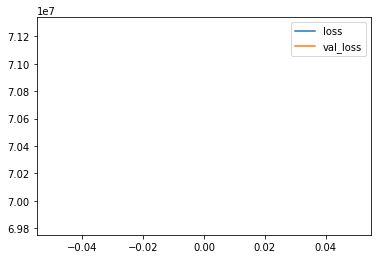

Epoch 2/300
7725/7725 [==============================] - 7s 955us/step - loss: 71218687.2787 - val_loss: 69646455.4598
train loss: 71218687.27870551
validation loss: 69646455.45983702


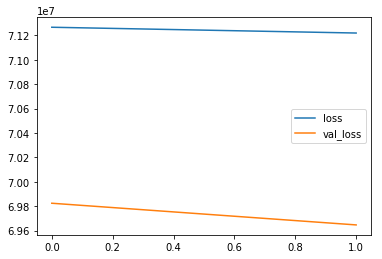

Epoch 3/300
7725/7725 [==============================] - 7s 951us/step - loss: 71165361.2179 - val_loss: 69520675.6787
train loss: 71165361.21786408
validation loss: 69520675.67869616


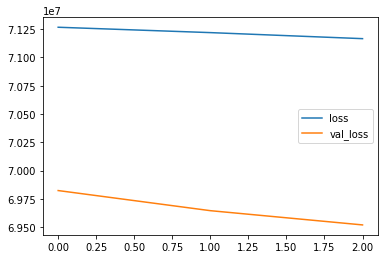

Epoch 4/300
7725/7725 [==============================] - 7s 951us/step - loss: 71148223.6852 - val_loss: 71046360.3539
train loss: 71148223.685178
validation loss: 71046360.35389988


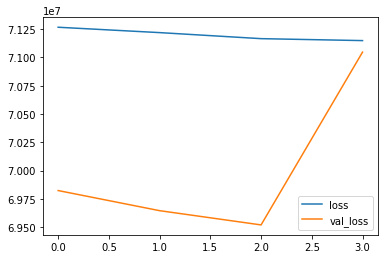

Epoch 5/300
7725/7725 [==============================] - 8s 983us/step - loss: 71114631.5366 - val_loss: 69770362.6449
train loss: 71114631.53656958
validation loss: 69770362.64493597


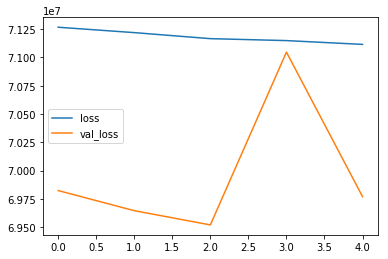

Epoch 6/300
7725/7725 [==============================] - 8s 985us/step - loss: 71122487.2047 - val_loss: 69045661.8021
train loss: 71122487.20466019
validation loss: 69045661.80209546


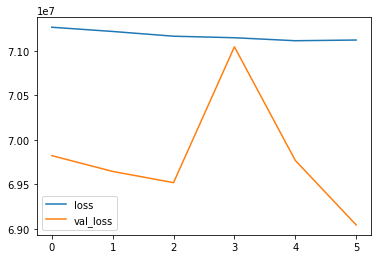

Epoch 7/300
7725/7725 [==============================] - 8s 997us/step - loss: 71128922.1634 - val_loss: 72484480.8475
train loss: 71128922.16336569
validation loss: 72484480.84749709


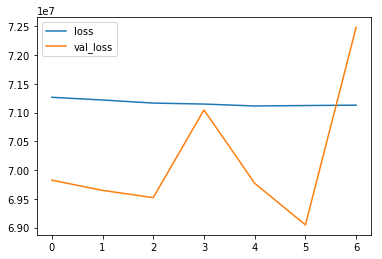

Epoch 8/300
7725/7725 [==============================] - 8s 1ms/step - loss: 71143303.2507 - val_loss: 68750542.8452
train loss: 71143303.25074434
validation loss: 68750542.8451688


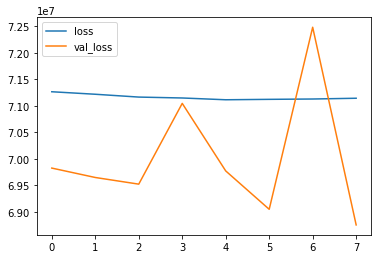

Epoch 9/300
7725/7725 [==============================] - 8s 1ms/step - loss: 71093994.3436 - val_loss: 69355218.0023
train loss: 71093994.34355988
validation loss: 69355218.00232829


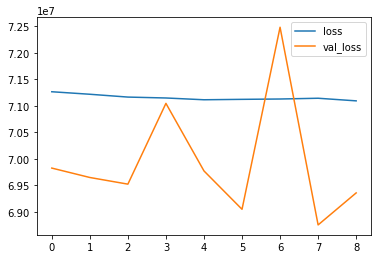

Epoch 10/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70988160.6887 - val_loss: 69056002.1048
train loss: 70988160.68867314
validation loss: 69056002.10477298


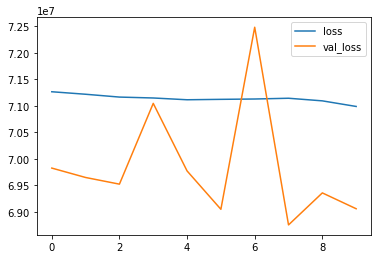

Epoch 11/300
7725/7725 [==============================] - 9s 1ms/step - loss: 71114257.9293 - val_loss: 69597781.5413
train loss: 71114257.9293204
validation loss: 69597781.54132712


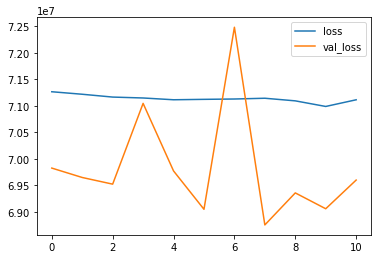

Epoch 12/300
7725/7725 [==============================] - 8s 1ms/step - loss: 71042764.2765 - val_loss: 68877480.3632
train loss: 71042764.27650486
validation loss: 68877480.36321303


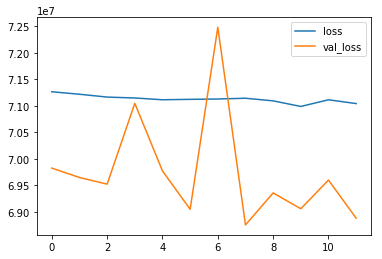

Epoch 13/300
7725/7725 [==============================] - 7s 901us/step - loss: 71071548.9895 - val_loss: 70005446.2864
train loss: 71071548.98951456
validation loss: 70005446.28637952


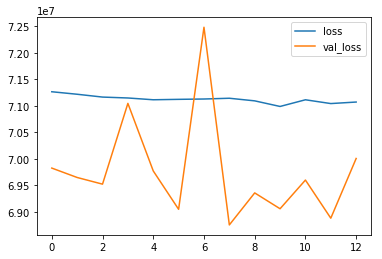

Epoch 14/300
7725/7725 [==============================] - 8s 973us/step - loss: 71016484.7959 - val_loss: 70731825.6298
train loss: 71016484.79585761
validation loss: 70731825.6298021


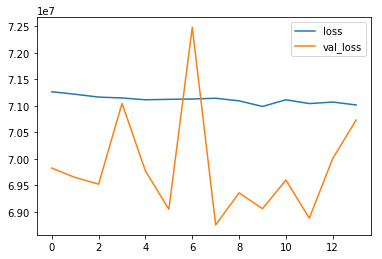

Epoch 15/300
7725/7725 [==============================] - 8s 1ms/step - loss: 71175213.4224 - val_loss: 69113791.8603
train loss: 71175213.42239483
validation loss: 69113791.86030267


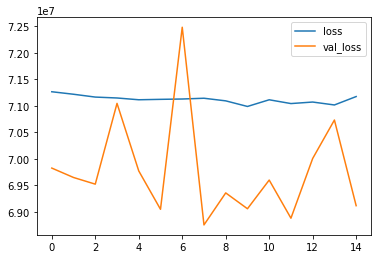

Epoch 16/300
7725/7725 [==============================] - 7s 888us/step - loss: 71135036.3210 - val_loss: 69063606.6217
train loss: 71135036.3210356
validation loss: 69063606.62165308


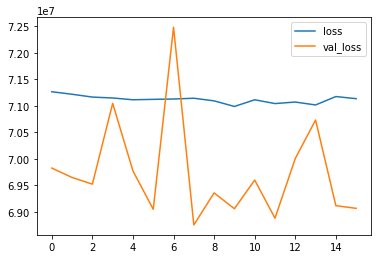

Epoch 17/300
7725/7725 [==============================] - 7s 879us/step - loss: 71942546.8489 - val_loss: 68877830.2864
train loss: 71942546.84893204
validation loss: 68877830.28637952


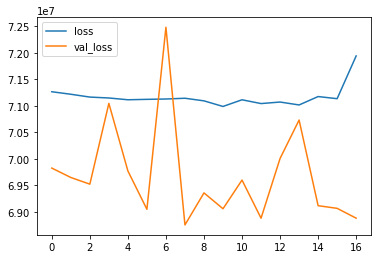

Epoch 18/300
7725/7725 [==============================] - 7s 861us/step - loss: 71022548.9947 - val_loss: 69899647.6647
train loss: 71022548.99469256
validation loss: 69899647.66472642


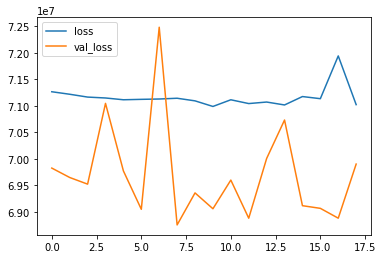

Epoch 19/300
7725/7725 [==============================] - 7s 885us/step - loss: 71134659.0933 - val_loss: 69027431.1339
train loss: 71134659.09333333
validation loss: 69027431.1338766


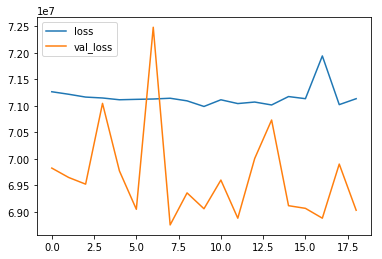

Epoch 20/300
7725/7725 [==============================] - 7s 852us/step - loss: 71373977.3587 - val_loss: 77318654.2491
train loss: 71373977.3587055
validation loss: 77318654.2491269


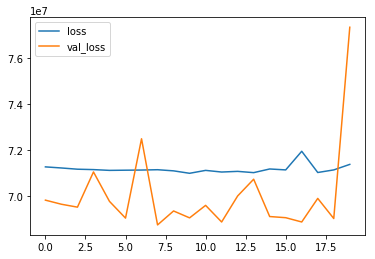

Epoch 21/300
7725/7725 [==============================] - 7s 863us/step - loss: 72422140.6887 - val_loss: 70553582.0722
train loss: 72422140.68867314
validation loss: 70553582.07217695


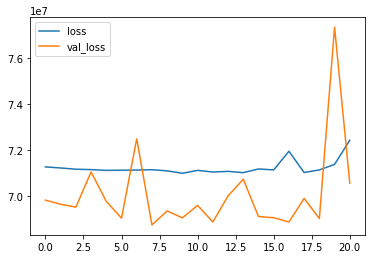

Epoch 22/300
7725/7725 [==============================] - 6s 841us/step - loss: 70794015.0245 - val_loss: 68106628.6473
train loss: 70794015.02446602
validation loss: 68106628.64726426


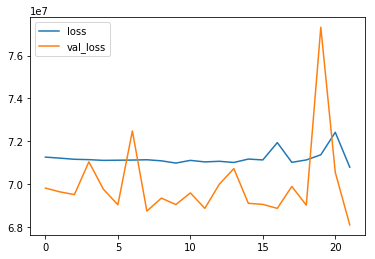

Epoch 23/300
7725/7725 [==============================] - 6s 815us/step - loss: 69663185.3225 - val_loss: 68128667.2689
train loss: 69663185.32245955
validation loss: 68128667.26891735


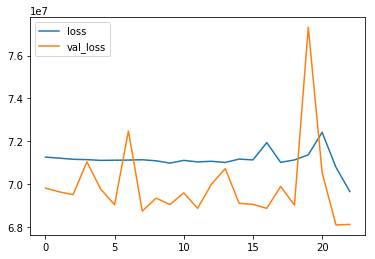

Epoch 24/300
7725/7725 [==============================] - 7s 963us/step - loss: 69732012.0471 - val_loss: 70168394.5984
train loss: 69732012.04711974
validation loss: 70168394.5983702


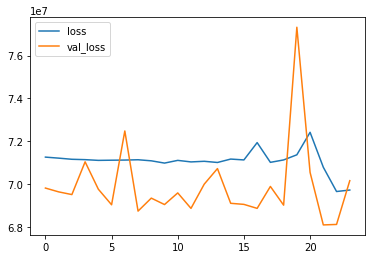

Epoch 25/300
7725/7725 [==============================] - 7s 971us/step - loss: 69070821.4721 - val_loss: 67366206.5378
train loss: 69070821.47210357
validation loss: 67366206.53783469


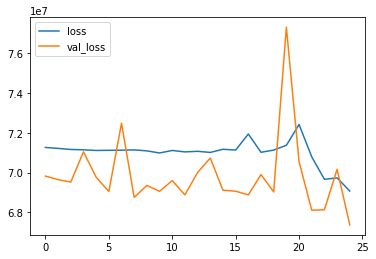

Epoch 26/300
7725/7725 [==============================] - 9s 1ms/step - loss: 68758835.2176 - val_loss: 68437857.7602
train loss: 68758835.21760517
validation loss: 68437857.76018627


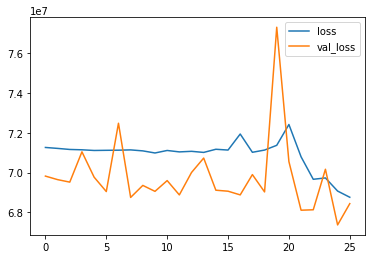

Epoch 27/300
7725/7725 [==============================] - 9s 1ms/step - loss: 68937928.8870 - val_loss: 67931042.5332
train loss: 68937928.8869903
validation loss: 67931042.53317812


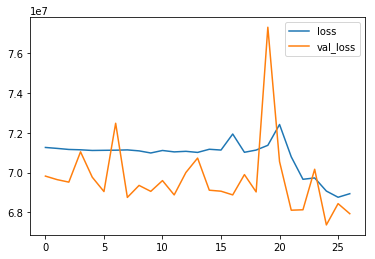

Epoch 28/300
7725/7725 [==============================] - 9s 1ms/step - loss: 68880572.9538 - val_loss: 68997916.6938
train loss: 68880572.9537864
validation loss: 68997916.69383003


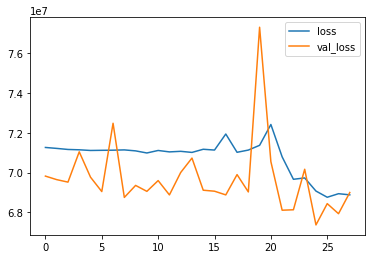

Epoch 29/300
7725/7725 [==============================] - 7s 947us/step - loss: 69058743.3041 - val_loss: 68536400.1583
train loss: 69058743.30407767
validation loss: 68536400.15832363


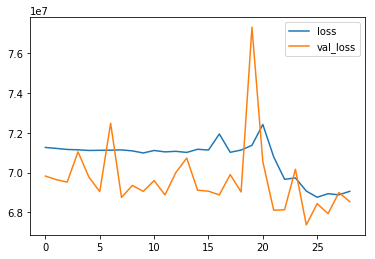

Epoch 30/300
7725/7725 [==============================] - 7s 941us/step - loss: 69739219.1834 - val_loss: 69612248.8847
train loss: 69739219.18343042
validation loss: 69612248.88474971


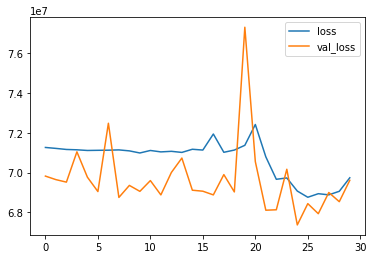

Epoch 31/300
7725/7725 [==============================] - 8s 1ms/step - loss: 69676913.9086 - val_loss: 67959747.5204
train loss: 69676913.90860842
validation loss: 67959747.52037252


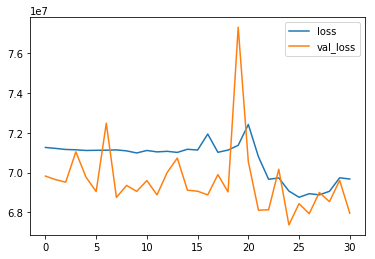

Epoch 32/300
7725/7725 [==============================] - 7s 913us/step - loss: 69405121.8330 - val_loss: 69525099.9208
train loss: 69405121.8330097
validation loss: 69525099.92083818


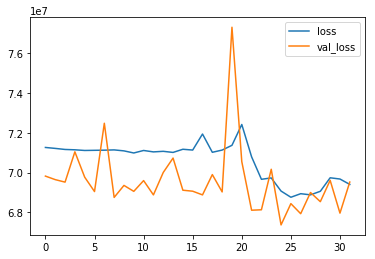

Epoch 33/300
7725/7725 [==============================] - 7s 846us/step - loss: 68814093.3250 - val_loss: 69586923.1851
train loss: 68814093.32504855
validation loss: 69586923.18509895


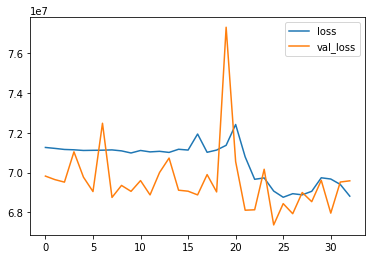

Epoch 34/300
7725/7725 [==============================] - 7s 852us/step - loss: 71013506.6460 - val_loss: 70248268.2561
train loss: 71013506.6459547
validation loss: 70248268.25611176


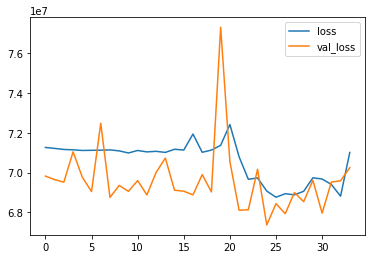

Epoch 35/300
7725/7725 [==============================] - 10s 1ms/step - loss: 70675588.3650 - val_loss: 68355866.0861
train loss: 70675588.36504854
validation loss: 68355866.08614668


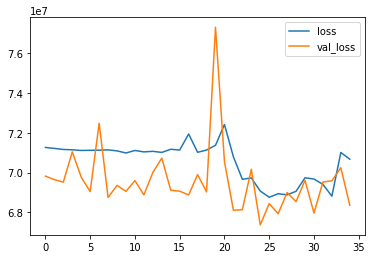

Epoch 36/300
7725/7725 [==============================] - 10s 1ms/step - loss: 70644965.1780 - val_loss: 68778420.5541
train loss: 70644965.17799352
validation loss: 68778420.55413271


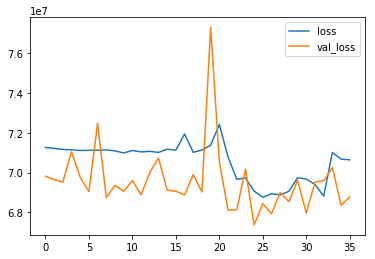

Epoch 37/300
7725/7725 [==============================] - 11s 1ms/step - loss: 70823096.3521 - val_loss: 68287327.2829
train loss: 70823096.35210356
validation loss: 68287327.28288707


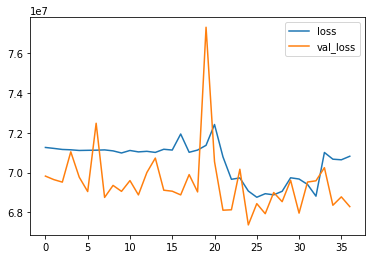

Epoch 38/300
7725/7725 [==============================] - 11s 1ms/step - loss: 69166981.4390 - val_loss: 68816993.4622
train loss: 69166981.4389644
validation loss: 68816993.46216531


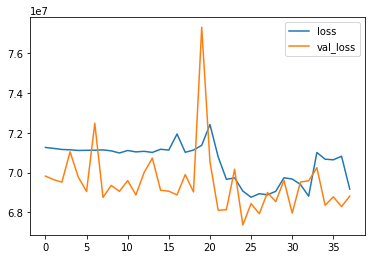

Epoch 39/300
7725/7725 [==============================] - 9s 1ms/step - loss: 68400007.5526 - val_loss: 68840786.3003
train loss: 68400007.55262136
validation loss: 68840786.30034925


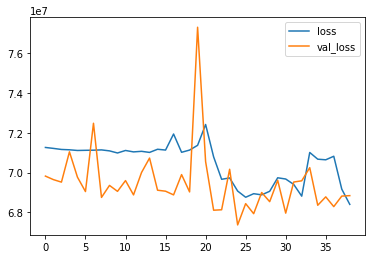

Epoch 40/300
7725/7725 [==============================] - 10s 1ms/step - loss: 69732625.9034 - val_loss: 69815727.8510
train loss: 69732625.90343042
validation loss: 69815727.85098952


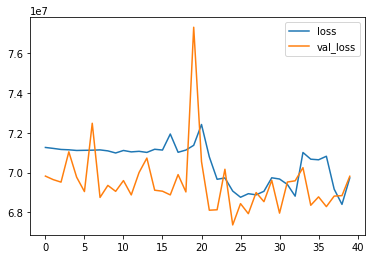

Epoch 41/300
7725/7725 [==============================] - 9s 1ms/step - loss: 69231288.6721 - val_loss: 67077251.4179
train loss: 69231288.67210355
validation loss: 67077251.417927824


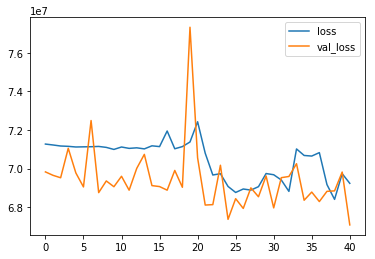

Epoch 42/300
7725/7725 [==============================] - 9s 1ms/step - loss: 68297510.2752 - val_loss: 66998343.7858
train loss: 68297510.27521035
validation loss: 66998343.78579744


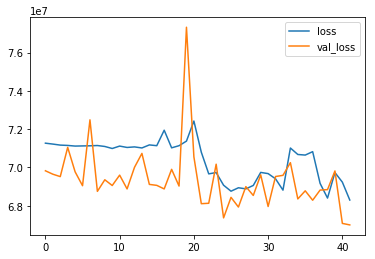

Epoch 43/300
7725/7725 [==============================] - 9s 1ms/step - loss: 68581506.4854 - val_loss: 67002727.5809
train loss: 68581506.48543689
validation loss: 67002727.58090803


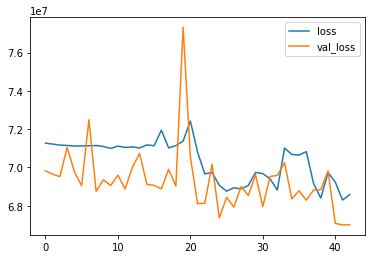

Epoch 44/300
7725/7725 [==============================] - 8s 1ms/step - loss: 69861846.3379 - val_loss: 71509938.8312
train loss: 69861846.33786407
validation loss: 71509938.83119906


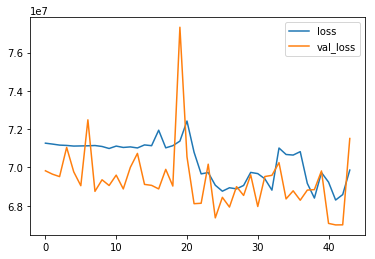

Epoch 45/300
7725/7725 [==============================] - 7s 923us/step - loss: 70293313.0957 - val_loss: 69057206.6123
train loss: 70293313.09566343
validation loss: 69057206.61233993


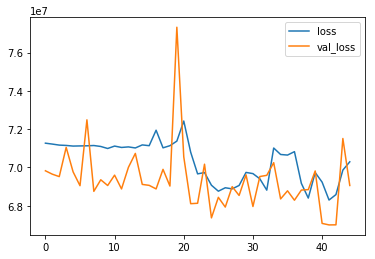

Epoch 46/300
7725/7725 [==============================] - 8s 1ms/step - loss: 68918087.4517 - val_loss: 70106514.5797
train loss: 68918087.45165049
validation loss: 70106514.57974389


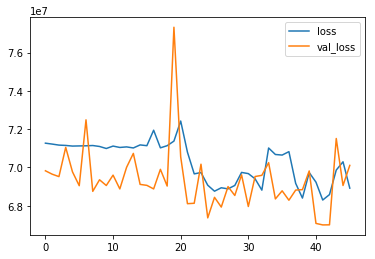

Epoch 47/300
7725/7725 [==============================] - 8s 1ms/step - loss: 68511900.0016 - val_loss: 67757746.7101
train loss: 68511900.0015534
validation loss: 67757746.71012805


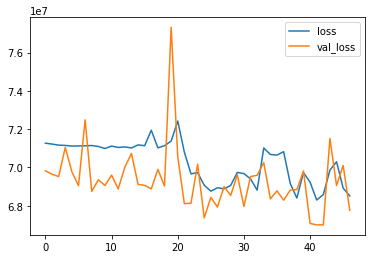

Epoch 48/300
7725/7725 [==============================] - 7s 931us/step - loss: 69002921.1184 - val_loss: 69711989.1315
train loss: 69002921.1184466
validation loss: 69711989.13154832


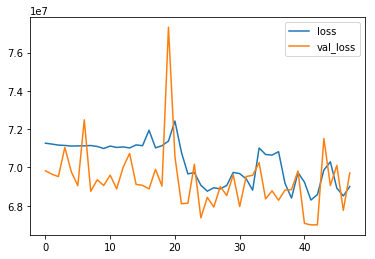

Epoch 49/300
7725/7725 [==============================] - 7s 873us/step - loss: 69324135.1104 - val_loss: 68272485.9511
train loss: 69324135.11042072
validation loss: 68272485.95110594


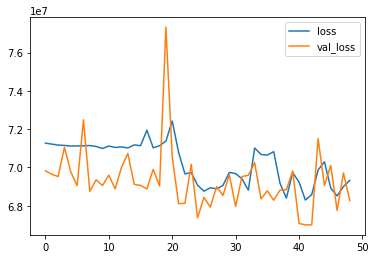

Epoch 50/300
7725/7725 [==============================] - 7s 924us/step - loss: 69581122.9307 - val_loss: 68412966.0256
train loss: 69581122.93074434
validation loss: 68412966.02561118


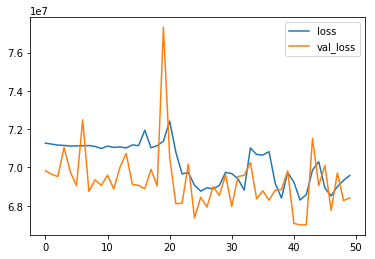

Epoch 51/300
7725/7725 [==============================] - 7s 889us/step - loss: 69118785.6394 - val_loss: 67443519.5064
train loss: 69118785.63935275
validation loss: 67443519.50640279


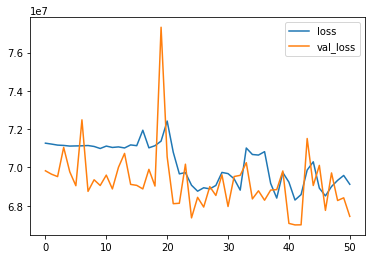

Epoch 52/300
7725/7725 [==============================] - 7s 967us/step - loss: 68910474.8541 - val_loss: 67563553.0151
train loss: 68910474.85411003
validation loss: 67563553.01513387


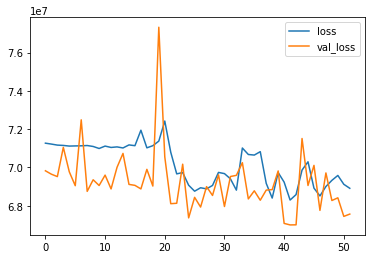

Epoch 53/300
7725/7725 [==============================] - 7s 962us/step - loss: 68451298.9628 - val_loss: 67016485.5134
train loss: 68451298.9628479
validation loss: 67016485.51338766


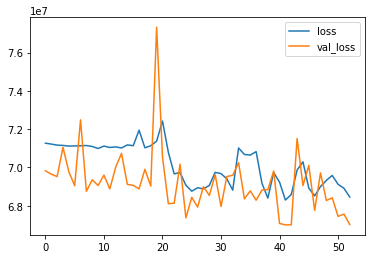

Epoch 54/300
7725/7725 [==============================] - 8s 1ms/step - loss: 69395123.1720 - val_loss: 69147339.0827
train loss: 69395123.17203884
validation loss: 69147339.08265425


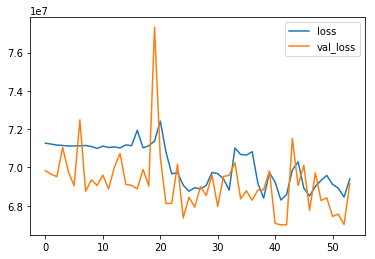

Epoch 55/300
7725/7725 [==============================] - 9s 1ms/step - loss: 70000888.0865 - val_loss: 67898145.0896
train loss: 70000888.0864725
validation loss: 67898145.08963911


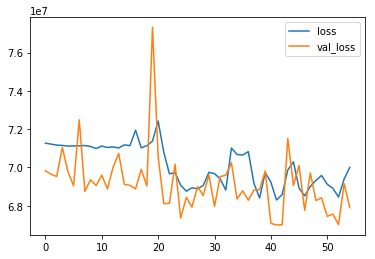

Epoch 56/300
7725/7725 [==============================] - 8s 987us/step - loss: 70585213.9594 - val_loss: 68319637.9045
train loss: 70585213.95935275
validation loss: 68319637.90454017


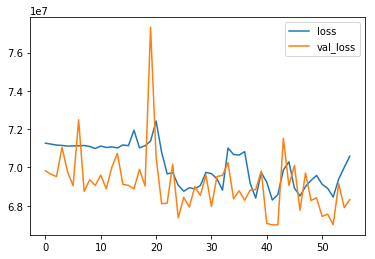

Epoch 57/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70806820.2408 - val_loss: 68920975.4040
train loss: 70806820.2407767
validation loss: 68920975.4039581


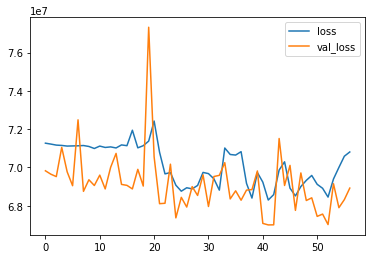

Epoch 58/300
7725/7725 [==============================] - 9s 1ms/step - loss: 70811792.1077 - val_loss: 68532028.7963
train loss: 70811792.10770227
validation loss: 68532028.79627474


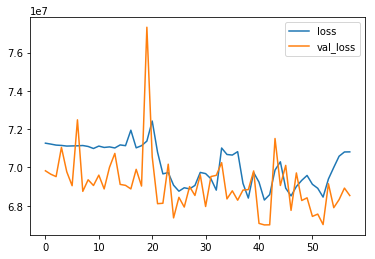

Epoch 59/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70795251.8483 - val_loss: 68889878.6589
train loss: 70795251.8482848
validation loss: 68889878.6589057


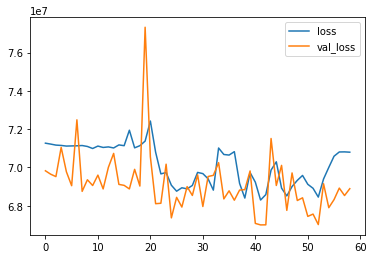

Epoch 60/300
7725/7725 [==============================] - 7s 855us/step - loss: 70930725.4835 - val_loss: 68768428.5821
train loss: 70930725.48349515
validation loss: 68768428.58207218


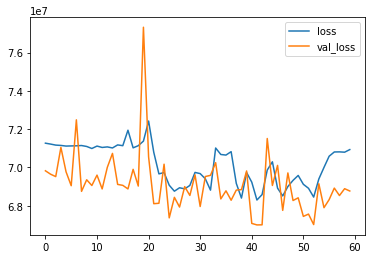

Epoch 61/300
7725/7725 [==============================] - 7s 874us/step - loss: 70980046.4746 - val_loss: 69473652.5821
train loss: 70980046.4745631
validation loss: 69473652.58207218


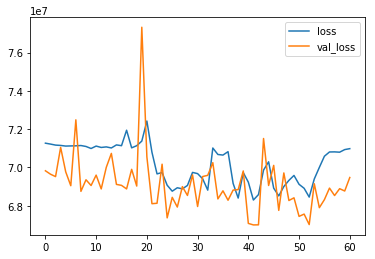

Epoch 62/300
7725/7725 [==============================] - 7s 863us/step - loss: 70947747.0467 - val_loss: 69205989.4854
train loss: 70947747.0467314
validation loss: 69205989.4854482


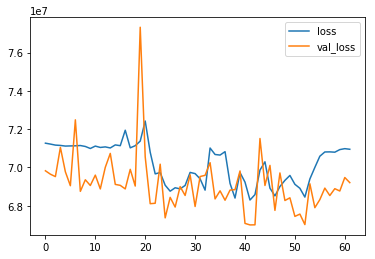

Epoch 63/300
7725/7725 [==============================] - 7s 868us/step - loss: 70895573.3975 - val_loss: 69028474.5239
train loss: 70895573.39754045
validation loss: 69028474.52386495


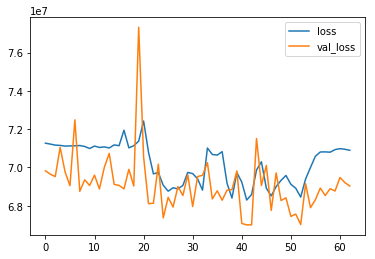

Epoch 64/300
7725/7725 [==============================] - 7s 851us/step - loss: 70836713.1143 - val_loss: 71113435.0361
train loss: 70836713.1143042
validation loss: 71113435.03608848


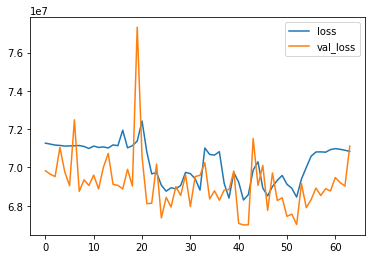

Epoch 65/300
7725/7725 [==============================] - 6s 818us/step - loss: 70849768.5644 - val_loss: 69314109.9511
train loss: 70849768.5644013
validation loss: 69314109.95110594


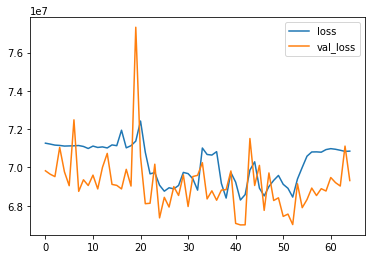

Epoch 66/300
7725/7725 [==============================] - 6s 816us/step - loss: 70904990.8603 - val_loss: 68786963.8370
train loss: 70904990.86032362
validation loss: 68786963.83701979


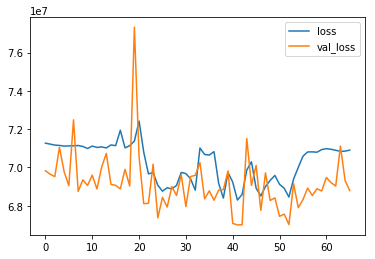

Epoch 67/300
7725/7725 [==============================] - 6s 830us/step - loss: 70845088.0072 - val_loss: 68860695.3853
train loss: 70845088.00724919
validation loss: 68860695.38533178


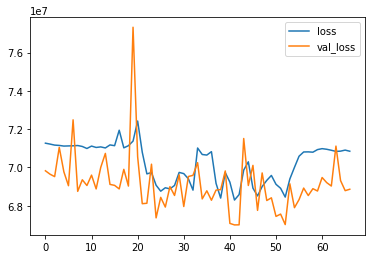

Epoch 68/300
7725/7725 [==============================] - 7s 888us/step - loss: 70885606.6133 - val_loss: 68775120.0279
train loss: 70885606.61333333
validation loss: 68775120.02793947


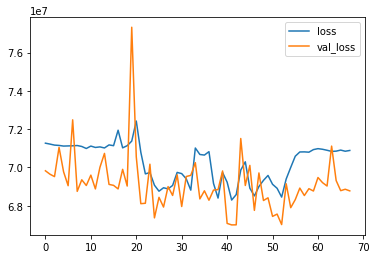

Epoch 69/300
7725/7725 [==============================] - 7s 865us/step - loss: 70901354.7014 - val_loss: 69034696.3260
train loss: 70901354.70135923
validation loss: 69034696.32596041


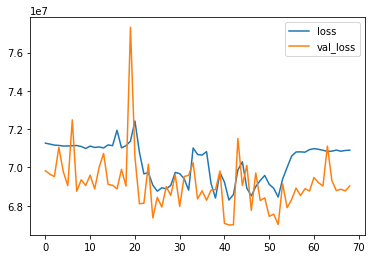

Epoch 70/300
7725/7725 [==============================] - 8s 973us/step - loss: 70811547.3481 - val_loss: 69490444.0047
train loss: 70811547.34809062
validation loss: 69490444.00465658


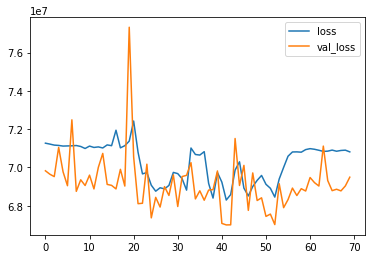

Epoch 71/300
7725/7725 [==============================] - 7s 942us/step - loss: 70879417.6104 - val_loss: 68753546.0023
train loss: 70879417.61035599
validation loss: 68753546.00232829


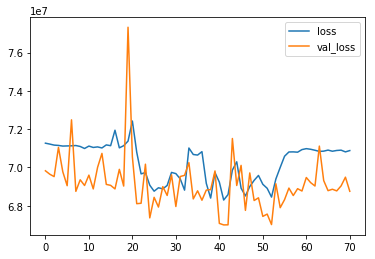

Epoch 72/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70889811.8814 - val_loss: 69760625.5832
train loss: 70889811.88142395
validation loss: 69760625.58323632


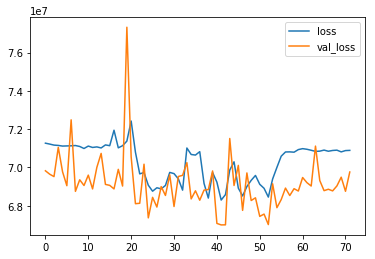

Epoch 73/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70897523.8193 - val_loss: 69253245.1874
train loss: 70897523.81928803
validation loss: 69253245.18742724


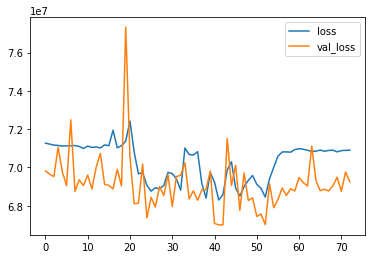

Epoch 74/300
7725/7725 [==============================] - 7s 922us/step - loss: 70880752.4650 - val_loss: 69004316.3399
train loss: 70880752.46498382
validation loss: 69004316.33993015


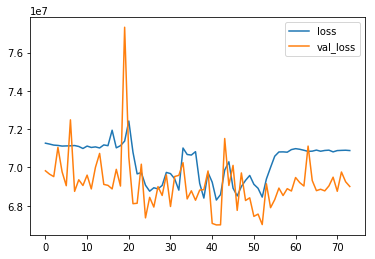

Epoch 75/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70745869.6570 - val_loss: 72225926.0349
train loss: 70745869.65695792
validation loss: 72225926.03492433


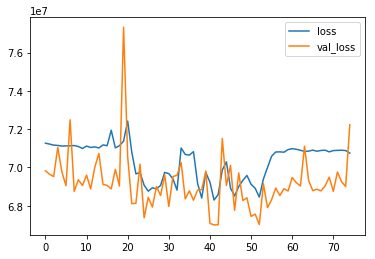

Epoch 76/300
7725/7725 [==============================] - 7s 904us/step - loss: 70889890.8344 - val_loss: 68870855.5716
train loss: 70889890.83443366
validation loss: 68870855.57159488


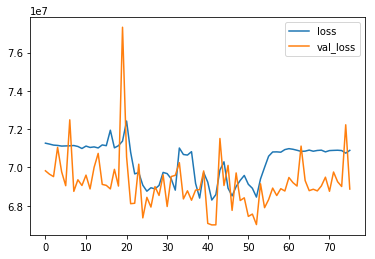

Epoch 77/300
7725/7725 [==============================] - 7s 849us/step - loss: 70900683.4848 - val_loss: 68872938.6356
train loss: 70900683.48478964
validation loss: 68872938.63562281


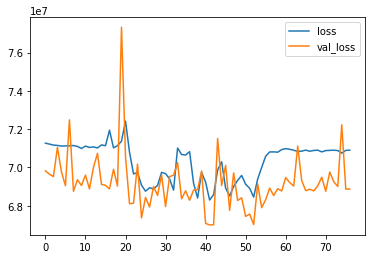

Epoch 78/300
7725/7725 [==============================] - 7s 868us/step - loss: 70851402.4751 - val_loss: 70126363.6694
train loss: 70851402.4750809
validation loss: 70126363.669383


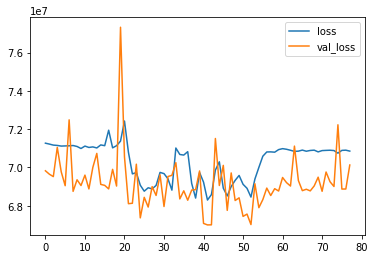

Epoch 79/300
7725/7725 [==============================] - 7s 860us/step - loss: 70908627.6365 - val_loss: 70270263.4878
train loss: 70908627.63650486
validation loss: 70270263.48777649


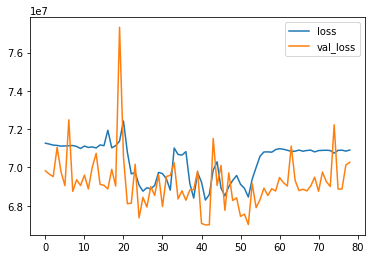

Epoch 80/300
7725/7725 [==============================] - 7s 886us/step - loss: 70837338.3275 - val_loss: 68982675.5856
train loss: 70837338.32750809
validation loss: 68982675.58556461


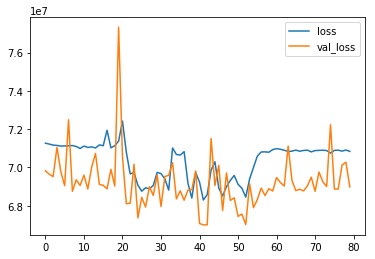

Epoch 81/300
7725/7725 [==============================] - 7s 947us/step - loss: 70858050.0298 - val_loss: 68865316.4703
train loss: 70858050.02977346
validation loss: 68865316.47031432


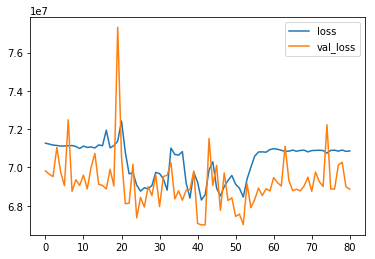

Epoch 82/300
7725/7725 [==============================] - 7s 864us/step - loss: 70832485.2070 - val_loss: 69226558.7241
train loss: 70832485.20699029
validation loss: 69226558.72409779


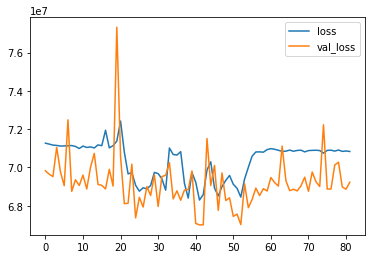

Epoch 83/300
7725/7725 [==============================] - 6s 815us/step - loss: 70857776.7094 - val_loss: 69118048.8754
train loss: 70857776.70938511
validation loss: 69118048.87543656


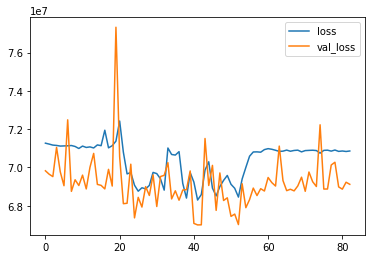

Epoch 84/300
7725/7725 [==============================] - 6s 820us/step - loss: 70802370.6926 - val_loss: 69731673.6950
train loss: 70802370.69255663
validation loss: 69731673.69499418


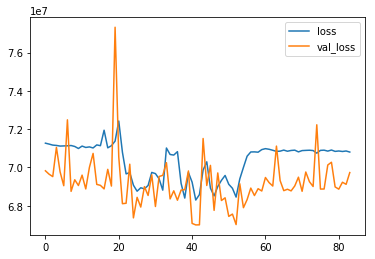

Epoch 85/300
7725/7725 [==============================] - 7s 866us/step - loss: 70910728.0098 - val_loss: 68760514.2631
train loss: 70910728.0098382
validation loss: 68760514.26309663


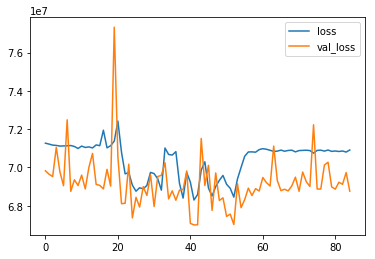

Epoch 86/300
7725/7725 [==============================] - 7s 860us/step - loss: 70837154.7785 - val_loss: 69100280.0838
train loss: 70837154.77851133
validation loss: 69100280.08381839


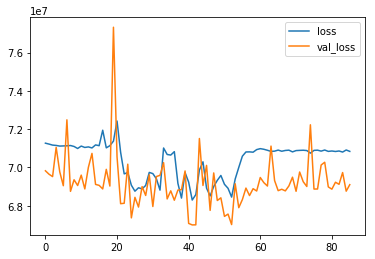

Epoch 87/300
7725/7725 [==============================] - 7s 863us/step - loss: 70820491.3916 - val_loss: 68781849.7229
train loss: 70820491.39158577
validation loss: 68781849.72293365


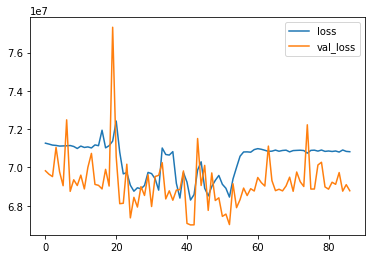

Epoch 88/300
7725/7725 [==============================] - 7s 893us/step - loss: 70845919.4056 - val_loss: 69667368.2328
train loss: 70845919.40556635
validation loss: 69667368.23282887


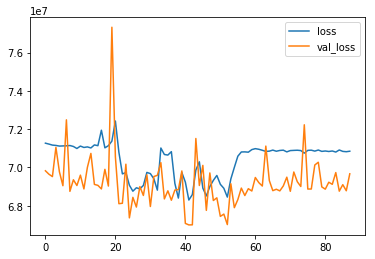

Epoch 89/300
7725/7725 [==============================] - 7s 846us/step - loss: 70818567.2212 - val_loss: 68919652.8522
train loss: 70818567.22122978
validation loss: 68919652.85215367


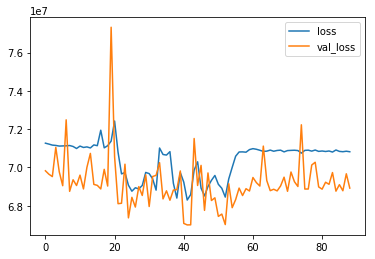

Epoch 90/300
7725/7725 [==============================] - 7s 865us/step - loss: 70753420.9191 - val_loss: 72633814.1001
train loss: 70753420.91909385
validation loss: 72633814.10011642


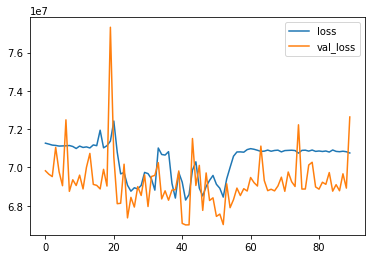

Epoch 91/300
7725/7725 [==============================] - 7s 864us/step - loss: 70920822.7252 - val_loss: 69142271.4319
train loss: 70920822.72517799
validation loss: 69142271.43189755


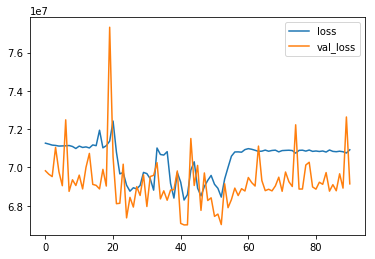

Epoch 92/300
7725/7725 [==============================] - 6s 826us/step - loss: 70738800.3640 - val_loss: 68932001.1455
train loss: 70738800.36401294
validation loss: 68932001.14551805


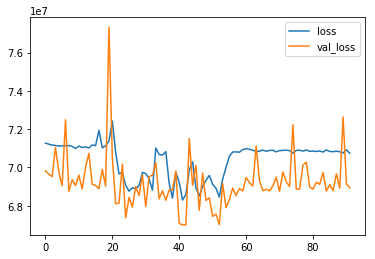

Epoch 93/300
7725/7725 [==============================] - 7s 865us/step - loss: 70769795.0685 - val_loss: 69053888.5681
train loss: 70769795.06847897
validation loss: 69053888.56810245


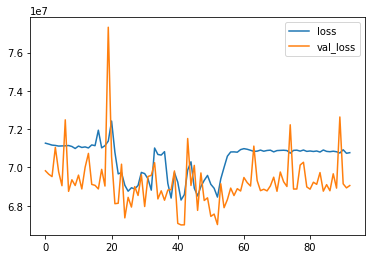

Epoch 94/300
7725/7725 [==============================] - 6s 831us/step - loss: 70869122.3187 - val_loss: 68762878.3423
train loss: 70869122.3187055
validation loss: 68762878.34225844


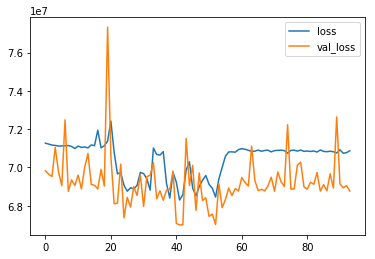

Epoch 95/300
7725/7725 [==============================] - 7s 857us/step - loss: 70792224.4919 - val_loss: 69773206.3888
train loss: 70792224.49190938
validation loss: 69773206.38882421


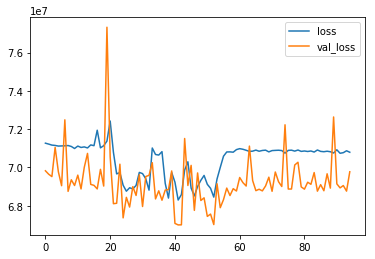

Epoch 96/300
7725/7725 [==============================] - 7s 850us/step - loss: 70948934.7034 - val_loss: 68697627.6601
train loss: 70948934.70343041
validation loss: 68697627.66006985


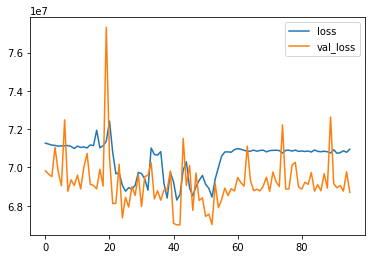

Epoch 97/300
7725/7725 [==============================] - 7s 863us/step - loss: 70823992.0150 - val_loss: 69048837.2712
train loss: 70823992.01501618
validation loss: 69048837.27124563


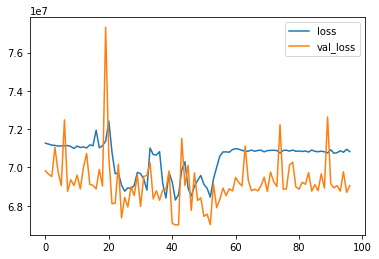

Epoch 98/300
7725/7725 [==============================] - 6s 835us/step - loss: 70874385.4405 - val_loss: 68980445.2619
train loss: 70874385.4405178
validation loss: 68980445.26193248


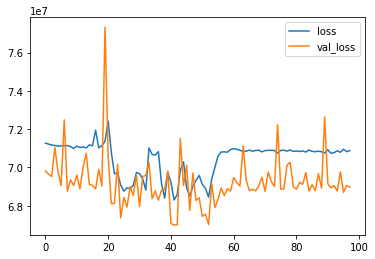

Epoch 99/300
7725/7725 [==============================] - 7s 865us/step - loss: 70814368.8595 - val_loss: 68790850.7288
train loss: 70814368.85954693
validation loss: 68790850.72875437


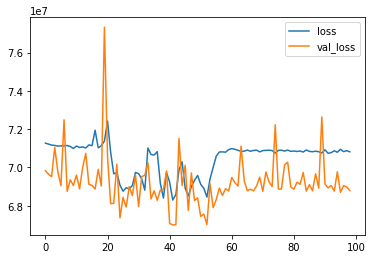

Epoch 100/300
7725/7725 [==============================] - 8s 984us/step - loss: 70861441.5679 - val_loss: 69018821.6158
train loss: 70861441.56789644
validation loss: 69018821.61583236


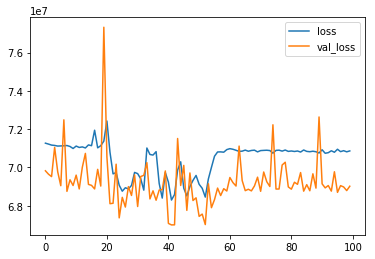

Epoch 101/300
7725/7725 [==============================] - 7s 861us/step - loss: 70761043.6494 - val_loss: 69244619.6228
train loss: 70761043.64944984
validation loss: 69244619.62281723


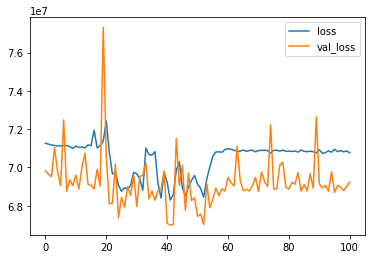

Epoch 102/300
7725/7725 [==============================] - 7s 849us/step - loss: 70830525.7590 - val_loss: 68772200.7916
train loss: 70830525.7589644
validation loss: 68772200.79161815


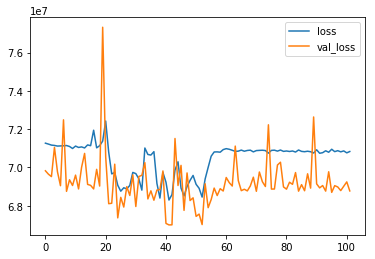

Epoch 103/300
7725/7725 [==============================] - 6s 816us/step - loss: 70824997.9184 - val_loss: 68907192.4657
train loss: 70824997.9184466
validation loss: 68907192.46565774


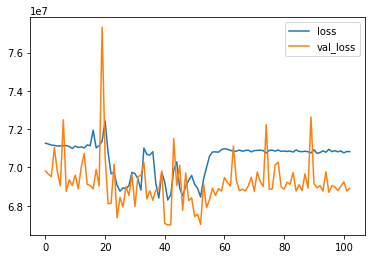

Epoch 104/300
7725/7725 [==============================] - 7s 888us/step - loss: 70841487.8255 - val_loss: 68660795.9302
train loss: 70841487.82550162
validation loss: 68660795.93015134


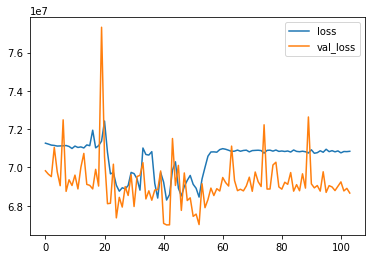

Epoch 105/300
7725/7725 [==============================] - 7s 872us/step - loss: 70818879.3776 - val_loss: 69104229.5693
train loss: 70818879.37760518
validation loss: 69104229.56926659


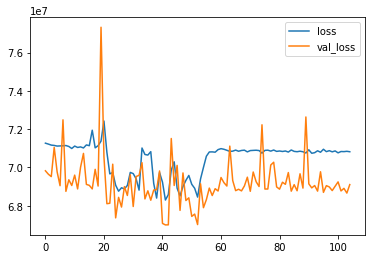

Epoch 106/300
7725/7725 [==============================] - 8s 978us/step - loss: 70833784.9828 - val_loss: 70488810.1886
train loss: 70833784.98278317
validation loss: 70488810.18859139


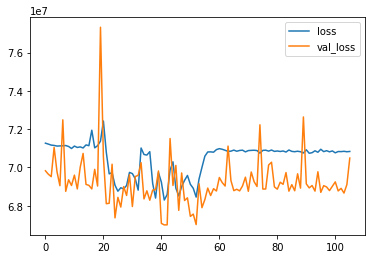

Epoch 107/300
7725/7725 [==============================] - 7s 869us/step - loss: 70817639.5443 - val_loss: 68888680.4936
train loss: 70817639.54433657
validation loss: 68888680.49359721


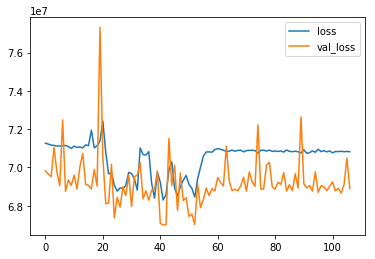

Epoch 108/300
7725/7725 [==============================] - 7s 872us/step - loss: 70840401.8030 - val_loss: 68966625.6205
train loss: 70840401.80297735
validation loss: 68966625.62048894


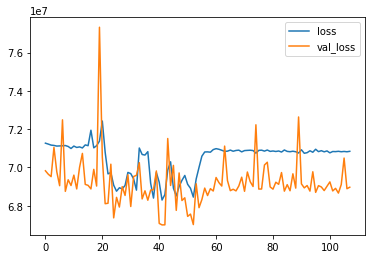

Epoch 109/300
7725/7725 [==============================] - 7s 909us/step - loss: 70804490.0153 - val_loss: 68734519.0966
train loss: 70804490.01527508
validation loss: 68734519.09662399


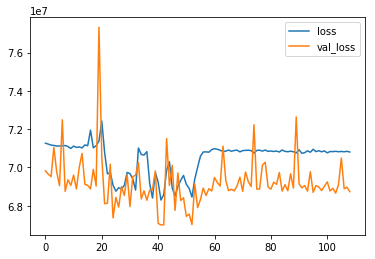

Epoch 110/300
7725/7725 [==============================] - 7s 869us/step - loss: 70707679.7017 - val_loss: 70182132.1350
train loss: 70707679.70174757
validation loss: 70182132.13504075


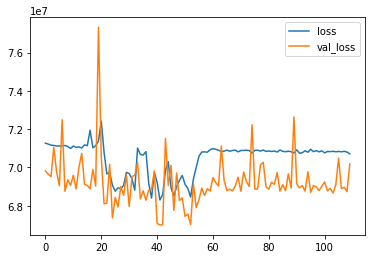

Epoch 111/300
7725/7725 [==============================] - 7s 922us/step - loss: 70725087.6935 - val_loss: 69089652.1537
train loss: 70725087.69346279
validation loss: 69089652.15366705


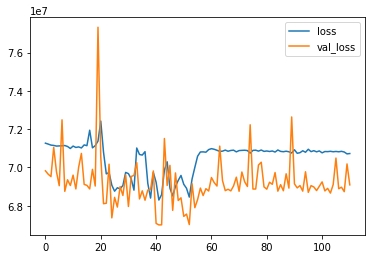

Epoch 112/300
7725/7725 [==============================] - 7s 852us/step - loss: 70767942.6113 - val_loss: 68650503.7858
train loss: 70767942.61126214
validation loss: 68650503.78579743


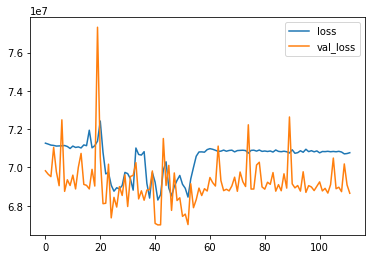

Epoch 113/300
7725/7725 [==============================] - 7s 843us/step - loss: 70725165.3235 - val_loss: 68937566.1001
train loss: 70725165.32349515
validation loss: 68937566.10011642


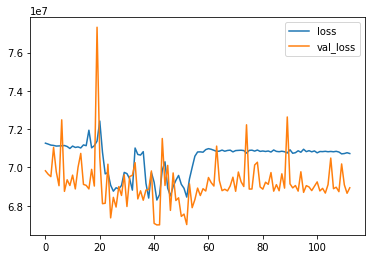

Epoch 114/300
7725/7725 [==============================] - 7s 874us/step - loss: 70689357.8796 - val_loss: 70020214.4540
train loss: 70689357.87961166
validation loss: 70020214.4540163


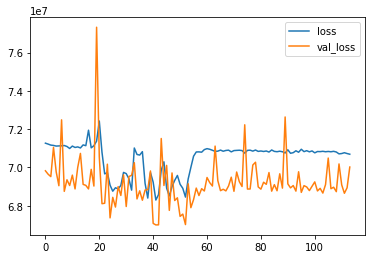

Epoch 115/300
7725/7725 [==============================] - 6s 811us/step - loss: 70793449.5938 - val_loss: 68883759.4133
train loss: 70793449.5937864
validation loss: 68883759.41327125


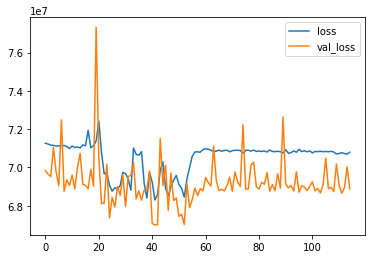

Epoch 116/300
7725/7725 [==============================] - 8s 986us/step - loss: 70667525.3344 - val_loss: 68724792.1490
train loss: 70667525.33436893
validation loss: 68724792.14901048


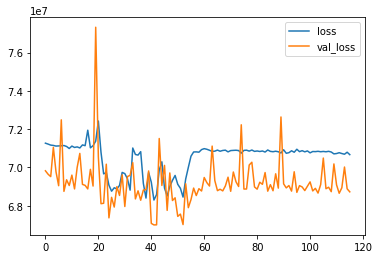

Epoch 117/300
7725/7725 [==============================] - 7s 919us/step - loss: 70711864.0197 - val_loss: 68487757.8673
train loss: 70711864.01967637
validation loss: 68487757.86728755


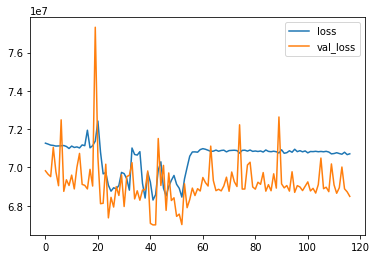

Epoch 118/300
7725/7725 [==============================] - 7s 906us/step - loss: 70722254.0375 - val_loss: 68641912.8847
train loss: 70722254.03754045
validation loss: 68641912.88474971


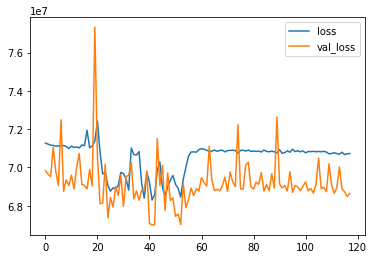

Epoch 119/300
7725/7725 [==============================] - 8s 997us/step - loss: 70720284.6799 - val_loss: 69504723.6228
train loss: 70720284.67987055
validation loss: 69504723.62281723


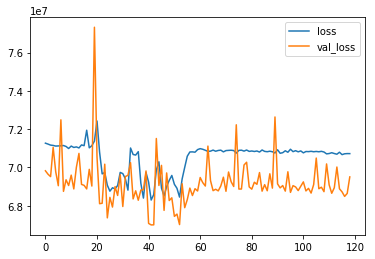

Epoch 120/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70771517.3442 - val_loss: 68791739.8091
train loss: 70771517.34420712
validation loss: 68791739.80908033


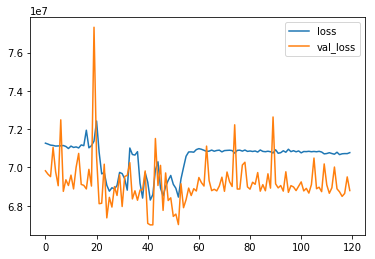

Epoch 121/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70684007.5029 - val_loss: 68651100.4610
train loss: 70684007.50291263
validation loss: 68651100.46100116


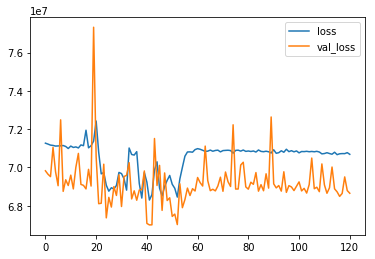

Epoch 122/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70699600.4836 - val_loss: 68690778.6822
train loss: 70699600.48362459
validation loss: 68690778.68218859


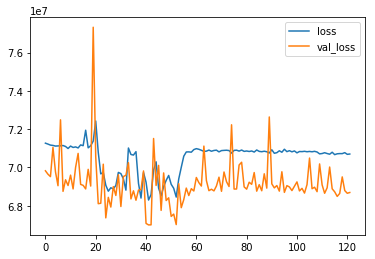

Epoch 123/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70679617.4524 - val_loss: 68605795.5204
train loss: 70679617.45242718
validation loss: 68605795.52037252


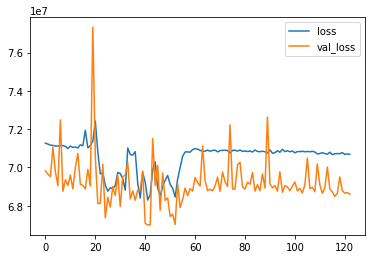

Epoch 124/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70661062.7770 - val_loss: 68620847.8976
train loss: 70661062.77695793
validation loss: 68620847.89755529


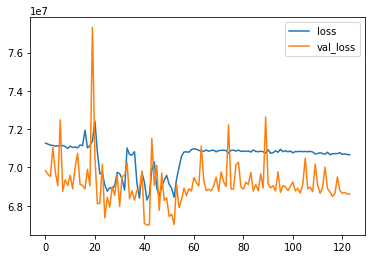

Epoch 125/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70790488.3568 - val_loss: 68886243.3341
train loss: 70790488.35676375
validation loss: 68886243.33410943


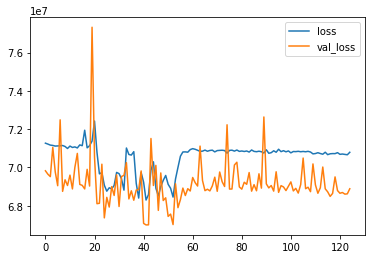

Epoch 126/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70633912.1812 - val_loss: 69423481.5367
train loss: 70633912.18122977
validation loss: 69423481.53667055


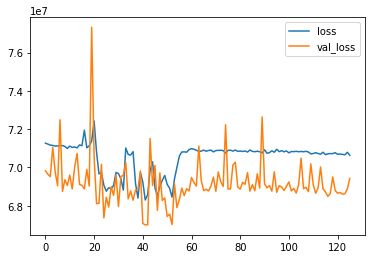

Epoch 127/300
7725/7725 [==============================] - 9s 1ms/step - loss: 70716142.0065 - val_loss: 68549933.1595
train loss: 70716142.0064725
validation loss: 68549933.15948778


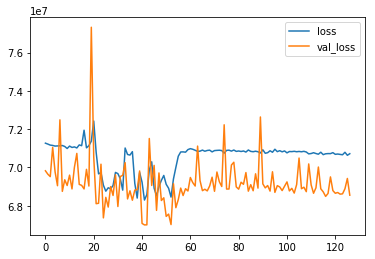

Epoch 128/300
7725/7725 [==============================] - 8s 1ms/step - loss: 70668205.1625 - val_loss: 68595565.3923
train loss: 70668205.16245955
validation loss: 68595565.39231665


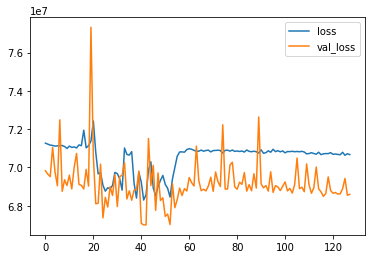

Epoch 129/300
7552/7725 [============================>.] - ETA: 0s - loss: 70750436.0000

KeyboardInterrupt: 

In [124]:
history_2_2 = model_2_2.fit(X_train_2_2, y_train_2_2, batch_size=128, verbose=1, nb_epoch=300, validation_split = 0.1, callbacks=[plot_losses], shuffle = True)

# Working Space

In [114]:
from keras.utils import plot_model
plot_model(model_2_2, to_file='model.png', show_shapes = True)

In [116]:
a = model_2_1.predict(X_test_2_2)

In [119]:
print(a[10])
print(y_test_2_2[10])

[[ -6.92684984e+00   8.59871769e+00  -8.14679527e+00   3.45322578e+04
   -9.58288765e+00   3.22474747e+01   4.67000237e+01  -6.78579903e+00
    3.08629570e+01   4.58089752e+01]
 [ -8.05638981e+00   9.02207279e+00  -7.83536339e+00   3.74211562e+04
   -1.02546406e+01   3.39878311e+01   3.34045525e+01  -8.51904869e+00
    3.36581230e+01   3.48690338e+01]
 [ -9.41736794e+00   9.63591862e+00  -7.61292076e+00   4.06693398e+04
   -1.11103840e+01   3.62491684e+01   1.53311863e+01  -1.04360714e+01
    3.67599297e+01   1.86073151e+01]
 [ -1.08223953e+01   1.10211725e+01  -8.68543053e+00   4.66689219e+04
   -1.25882893e+01   4.15173264e+01   1.11731052e+01  -1.19024734e+01
    4.22042656e+01   1.50689850e+01]
 [ -1.24671383e+01   1.24544916e+01  -9.66019249e+00   5.29919336e+04
   -1.36051350e+01   4.75815659e+01   5.87793970e+00  -1.31946831e+01
    4.86149101e+01   1.04835358e+01]
 [ -1.33870754e+01   1.31208124e+01  -1.00469112e+01   5.62551992e+04
   -1.32892170e+01   5.15318832e+01   1.40910

In [ ]:
print(a[0])
print(y_test[0])

In [ ]:
model.evaluate(x=X_test, y=y_test)

In [113]:
model_2_2.save('model_2_2.h5')

In [ ]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

SVG(model_to_dot(model).create(prog='dot', format='svg'))

In [32]:
from IPython.display import clear_output
import keras
import matplotlib.pyplot as plt

class PlotLosses(keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.i = 0
        self.x = []
        self.losses = []
        self.val_losses = []
        
        self.fig = plt.figure()
        
        self.logs = []

    def on_epoch_end(self, epoch, logs={}):
        
        self.logs.append(logs)
        self.x.append(self.i)
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        self.i += 1
        
        #clear_output(wait=True)
        print("train loss: {}".format(self.losses[-1]))
        print("validation loss: {}".format(self.val_losses[-1]))
        plt.plot(self.x, self.losses, label="loss")
        plt.plot(self.x, self.val_losses, label="val_loss")
        plt.legend()
        plt.show();
        
plot_losses = PlotLosses()

In [21]:
# Visualize training histor
import matplotlib.pyplot as plt

history = hisotry_2_1
# list all data in history
print(history.history.keys())
# summarize history for accuracy
#plt.plot(history.history['acc'])
#plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

NameError: name 'hisotry_2_1' is not defined